In [1]:
#Collab Notebook for Portfolio Construction Case Study


In [2]:
import cvxpy as cp
from sklearn.metrics import accuracy_score

In [3]:
import yfinance as yf
import numpy as np
import cvxpy as cp
from datetime import datetime, timedelta

def markowitz_portfolio_optimization(stock_symbols, start_date, end_date, risk_tolerance=0.1):
    # Downloading historical stock data
    try:
        stock_data = {symbol: yf.download(symbol, start=start_date, end=end_date) for symbol in stock_symbols}
        daily_returns = [data['Adj Close'].pct_change().dropna() for data in stock_data.values()]

        # Checking if all return series are of equal length
        if not all(len(r) == len(daily_returns[0]) for r in daily_returns):
            raise ValueError("Return series are not of equal length.")

        # Stacking the return series to create a 2D array
        returns_matrix = np.vstack(daily_returns)

        # Calculating the covariance matrix
        covariance_matrix = np.cov(returns_matrix)

    except Exception as e:
        # In case of any error, skip the issue and assign equal weights
        #print("Error in data processing or covariance matrix calculation. Assigning equal weights.")
        equal_weight = 1.0 / len(stock_symbols)
        return {symbol: equal_weight for symbol in stock_symbols}

    num_assets = len(stock_symbols)

    # Optimization variables
    weights = cp.Variable(num_assets, nonneg=True)

    # Calculating average returns for each stock
    average_returns = np.mean(returns_matrix, axis=1)

    try:
        # Objective function and constraints
        expected_portfolio_return = cp.sum(weights * average_returns)
        portfolio_variance = cp.quad_form(weights, covariance_matrix)
        objective = cp.Maximize(expected_portfolio_return - risk_tolerance * portfolio_variance)
        constraints = [cp.sum(weights) == 1]

        # Solving the optimization problem
        problem = cp.Problem(objective, constraints)
        problem.solve()

        # Extracting the optimal weights
        optimal_weights = weights.value
        portfolio_results = {symbol: weight for symbol, weight in zip(stock_symbols, optimal_weights)}
        return portfolio_results

    except Exception as e:
        # In case of optimization error, assign equal weights
        #print("Error in optimization. Assigning equal weights.")
        equal_weight = 1.0 / len(stock_symbols)
        return {symbol: equal_weight for symbol in stock_symbols}


In [4]:
#Making a function to return the accuracy score
#This function also ascertaisn that the test and pred values have same dimension
def calculate_accuracy(y_true, y_pred):
    if y_pred.ndim > 1 or np.issubdtype(y_pred.dtype, np.floating):
        y_pred = (y_pred >= 0.5).astype(int)
    if len(y_pred) > len(y_true):
        y_pred = y_pred[:len(y_true)]
    elif len(y_true) > len(y_pred):
        y_true = y_true[:len(y_pred)]
    return accuracy_score(y_true, y_pred)

In [5]:
#Installign necessary libraries
import pandas as pd
import yfinance as yf
import numpy as np
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [6]:
np.random.seed(1)

In [7]:
#Installing necessary libraries

def Portfolio_construct(start_date_):
  stock_symbols = ["MSFT","JPM","PFE","BRK-B","ORCL","AAPL","IBM","VZ","BAC","KO","NVDA","PG"]
  end_date_ = (datetime.strptime(start_date_, "%Y-%m-%d") + timedelta(days=365*4)).strftime("%Y-%m-%d")
  additional_symbols = ["SPY", "^VIX","^TNX"]

  # Creating an empty DataFrame to store the data
  stock_data = pd.DataFrame()

  # Looping over each stock symbol and fetch data
  for symbol in stock_symbols:
      # Download data from Yahoo Finance with end date
      data = yf.download(symbol, start=start_date_, end=end_date_)  # Updated end date here

      # Extracting the 'Close' and 'Volume' columns
      data = data[['Close', 'Volume']]

      data.columns = [f'{symbol}_{col}' for col in data.columns]

      if stock_data.empty:
          stock_data = data
      else:
          stock_data = stock_data.merge(data, left_index=True, right_index=True)



  additional_data = yf.download(additional_symbols, start=start_date_, end=end_date_)

  # Extracting the 'Close' columns for SPY, ^VIX and ^TNX'
  additional_data = additional_data['Close']

  # Renaming columns for SPY and ^VIX
  additional_data.columns = ["SPY_Close", "^VIX_Close","^TNX_Close"]
  #I'll use this spy_data to compare our portfolio performace taking this as the benchmark
  spy_data = additional_data[["SPY_Close"]].copy()


  split_index = int(len(spy_data) * 0.75)

  # Splitting the data into 75% and 25%
  forget_it = spy_data[:split_index]
  SPY_Test = spy_data[split_index:]
  SPY_Test_list = SPY_Test.values.tolist()
  base_value = SPY_Test_list[0][0]  # Assuming SPY_Test_list is a list of lists

  # Calculating the percentage increase for each element
  normalized_sp500 = [(x[0] / base_value) * 1000000 for x in SPY_Test_list]


  # Creating separate copies of SPY and ^VIX values for each stock
  for symbol in stock_symbols:
      stock_data[f'{symbol}_SPY'] = additional_data['SPY_Close']
      stock_data[f'{symbol}_^VIX'] = additional_data['^VIX_Close']
      stock_data[f'{symbol}_^TNX_Close'] = additional_data['^TNX_Close']


  # Calculating log returns for each stock and add them to the DataFrame
  for symbol in stock_symbols:
      stock_data[f'{symbol}_Log_Return'] = stock_data[f'{symbol}_Close'].pct_change().apply(lambda x: np.log(1 + x))

  # Calculating 10-day RSI for each stock
  for symbol in stock_symbols:
      delta = stock_data[f'{symbol}_Close'].diff(1)
      delta = delta[1:]  # Remove NaN from the first row
      window = 10
      gains = delta.where(delta > 0, 0)
      losses = -delta.where(delta < 0, 0)
      avg_gains = gains.rolling(window=window).mean()
      avg_losses = losses.rolling(window=window).mean()
      rs = avg_gains / avg_losses
      rsi = 100 - (100 / (1 + rs))

      # Adding RSI as a new feature
      stock_data[f'{symbol}_RSI'] = rsi

  # Exponential Moving Average (EMA) calculation for each stock
  for symbol in stock_symbols:
      stock_data[f'{symbol}_EMA'] = stock_data[f'{symbol}_Close'].ewm(span=10, adjust=False).mean()

  # Moving Average calculation for each stock
  for symbol in stock_symbols:
      # Calculate the moving average over a window of 10 periods
      stock_data[f'{symbol}_MA'] = stock_data[f'{symbol}_Close'].rolling(window=10).mean()


  # Prediction horizon has been taken as 1 day
  horizon = 1

  confusion_matrices = {}
  confusion_matrices_rolling_mean = {}

  # Models ML (exclusing LSTM, not defining it here as it has a different architechture and we use it from a different library)
  models = {
      'SVR': SVR(),
      'LightGBM': LGBMRegressor(),
      'GBR': GradientBoostingRegressor(),
      'RandomForest': RandomForestRegressor(),
      'XGBoost': XGBRegressor(),
  }

  # Initializing and populating LSTM predictions
  lstm_predictions = {}
  lstm_predictions_rolling_mean = {}

  # Creating a dictionary to store ensemble predictions for each stock
  ensemble_predictions_by_stock = {symbol: [] for symbol in stock_symbols}
  confusion_matrices_ensemble = {}

  # Looping over each stock symbol
  for symbol in stock_symbols:
      # Preparing the feature matrix (X) and target variable (y)
      features = [f'{symbol}_Volume', f'{symbol}_Log_Return', f'{symbol}_Close', f'{symbol}_RSI', f'{symbol}_EMA',f'{symbol}_MA',f'{symbol}_SPY',f'{symbol}_^VIX', f'{symbol}_^TNX_Close' ]
      X = stock_data[features]

      # Handling missing values using imputer (ie, replace NaN with the mean of the column)
      imputer = SimpleImputer(strategy='mean')
      X = imputer.fit_transform(X)

      # Computing the target variable (price direction) for this stock
      stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)

      # Handling missing values in the target variable (y) by forward filling
      y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')

      rolling_mean_window = 10  #rolling mean window

      stock_data[f'{symbol}_Rolling_Mean'] = stock_data[f'{symbol}_Close'].rolling(rolling_mean_window).mean()
      stock_data[f'{symbol}_Rolling_Mean_Direction'] = np.where(stock_data[f'{symbol}_Close'] > stock_data[f'{symbol}_Rolling_Mean'], 1, 0)
      stock_data[f'{symbol}_Rolling_Mean_Direction'] = stock_data[f'{symbol}_Rolling_Mean_Direction'].shift(-1)

      stock_data.dropna(subset=[f'{symbol}_Rolling_Mean_Direction'], inplace=True)
      split_index = int(len(stock_data) * 0.75)
      X_train, X_test = X[:split_index], X[split_index:]
      y_train, y_test = y[:split_index], y[split_index:]




      # Initialize and train the individual models
      model_predictions = {}
      for model_name, model in models.items():
          model.fit(X_train, y_train)

          # Making predictions on the testing data
          y_pred = model.predict(X_test)

          model_predictions[model_name] = y_pred
          print(f"Accuracies for {symbol}:")
      for model_name, model in models.items():
          y_pred = model.predict(X_test)  # Predicting with the current model
          accuracy = calculate_accuracy(y_test, y_pred)
          print(f"{model_name}: {accuracy:.4f}")



      # Creating an ensemble model by fitting a linear regression to individual model predictions
      ensemble_model = LinearRegression()
      ensemble_model.fit(np.column_stack(list(model_predictions.values())), y_test)

      # Using the ensemble model to make predictions for ensemble predictions
      ensemble_predictions = ensemble_model.predict(np.column_stack(list(model_predictions.values())))

      # Storing the ensemble predictions for the current stock
      ensemble_predictions_by_stock[symbol] = ensemble_predictions

      # Preparing data for LSTM
      scaler = MinMaxScaler()
      X_lstm = scaler.fit_transform(X)
      y_lstm = y.values.reshape(-1, 1)

      # Creating sequences for LSTM
      sequence_length = 20  # Adjust as needed
      X_lstm_seq = []
      y_lstm_seq = []
      for i in range(len(X_lstm) - sequence_length):
          X_lstm_seq.append(X_lstm[i:i+sequence_length])
          y_lstm_seq.append(y_lstm[i+sequence_length])

      X_lstm_seq = np.array(X_lstm_seq)
      y_lstm_seq = np.array(y_lstm_seq)

      # Splitting data into train and test sets for LSTM
      split_index_lstm = int(len(X_lstm_seq) * 0.8)
      X_train_lstm, X_test_lstm = X_lstm_seq[:split_index_lstm], X_lstm_seq[split_index_lstm:]
      y_train_lstm, y_test_lstm = y_lstm_seq[:split_index_lstm], y_lstm_seq[split_index_lstm:]

      # Building LSTM model
      lstm_model = Sequential()
      lstm_model.add(LSTM(50, input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
      lstm_model.add(Dense(1, activation='sigmoid'))
      lstm_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

      # Training LSTM model
      lstm_model.fit(X_train_lstm, y_train_lstm, epochs=10, batch_size=32, validation_data=(X_test_lstm, y_test_lstm))

      # Make predictions with LSTM model
      lstm_pred = lstm_model.predict(X_test_lstm)

      # Storing LSTM predictions for ensemble
      lstm_predictions[symbol] = lstm_pred


       # For LSTM
      lstm_pred = lstm_model.predict(X_test_lstm)  # Predicting with the LSTM model
      lstm_pred_binary = (lstm_pred >= 0.5).astype(int)  # Converting predictions to binary outputs
      lstm_accuracy = calculate_accuracy(y_test_lstm, lstm_pred_binary)
      print(f"LSTM: {lstm_accuracy:.4f}")


      cm_ensemble = confusion_matrix(ensemble_predictions >= 0.5, y_test)
      confusion_matrices_ensemble[symbol] = cm_ensemble


  # Creating an empty summary confusion matrix
  summary_cm = np.zeros((2, 2), dtype=int)

  # Accumulating confusion matrices for each stock
  for symbol in stock_symbols:
      summary_cm += confusion_matrices_ensemble[symbol]

  # Standardizing the ensemble inputs
  scaler = StandardScaler()
  model_predictions_std = scaler.fit_transform(np.column_stack(list(model_predictions.values())))

  # Training ensemble model including LSTM for ensemble predictions
  ensemble_model = LinearRegression()
  ensemble_model.fit(model_predictions_std, y_test)

  ensemble_predictions = ensemble_model.predict(model_predictions_std)

  summary_cm_rolling_mean = np.sum(list(confusion_matrices_ensemble.values()), axis=0)

  # Plotting confusion matrices for each stock
  for symbol in stock_symbols:
      plt.figure(figsize=(12, 6))
      plt.subplot(1, 2, 1)
      sns.heatmap(confusion_matrices_ensemble[symbol], annot=True, fmt='d', cmap='Blues', cbar=False,
                  xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
      plt.xlabel('Predicted (Ensemble)')
      plt.ylabel('Actual')
      plt.title(f'Confusion Matrix for {symbol} - Ensemble Model')
      y_pred = ensemble_predictions_by_stock[symbol] >= 0.5
      y_true = y_test
      if len(y_pred)>len(y_true):
        y_pred=y_pred[:len(y_true)]
      if len(y_true)>len(y_pred):
        y_true=y_true[:len(y_pred)]



      accuracy = accuracy_score(y_true, y_pred)
      plt.text(2, 0.8, f'Accuracy: {accuracy:.4f}', fontsize=12, color='black')


  # Plotting the summary confusion matrix for ensemble predictions
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  sns.heatmap(summary_cm, annot=True, fmt='d', cmap='Blues', cbar=False,
              xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
  plt.xlabel('Predicted (Ensemble)')
  plt.ylabel('Actual')
  plt.title('Summary Confusion Matrix - Ensemble Model')

  # # Plotting the summary confusion matrix for rolling mean-based predictions
  # plt.subplot(1, 2, 2)
  # sns.heatmap(summary_cm_rolling_mean, annot=True, fmt='d', cmap='Blues', cbar=False,
  #             xticklabels=['Down', 'Up'], yticklabels=['Down', 'Up'])
  # plt.xlabel('Predicted (Rolling Mean)')
  # plt.ylabel('Actual')
  # plt.title('Summary Confusion Matrix - Rolling Mean Predictions')
  # plt.tight_layout()
  # plt.show()

  stock_date_predictions = {}

  # Looping over each stock symbol
  for symbol in stock_symbols:
      ensemble_predictions = ensemble_predictions_by_stock[symbol]
      prediction_dates = stock_data.index[-len(ensemble_predictions):]
      stock_predictions = {}

      # Looping over each date and prediction
      for date, prediction in zip(prediction_dates, ensemble_predictions):
          #Deciding whether the prediction is "Long" (prediction > 0.6) or "Short" (prediction <= 0.6)
          #This can be tuned as a hyperparameter to determine which values are the best for long and short
          #However for the sake of simplicity we have taken Long as greater than 0.6
          #Since, we are not concerned about the short predictions, as we are not taking short positions in our portfolio, we have taken the rest as Short
          if prediction >= 0.6:
              stock_predictions[date] = 'Long'
          else:
              stock_predictions[date] = 'Short'

      # Storing the stock predictions in the main dictionary
      stock_date_predictions[symbol] = stock_predictions

  # Dictionary to store stock prices for each date in the test set
  date_stock_prices = {}

  prediction_dates = stock_data.index[-len(ensemble_predictions):]

  # Looping over each date
  for date in prediction_dates:
      # Create a dictionary for the current date
      date_prices = {}

      # Looping over each stock symbol
      for symbol in stock_symbols:
          # Get the stock's closing price for the current date
          closing_price = stock_data.loc[date, f'{symbol}_Close']

          # Storing the closing price in the date_prices dictionary
          date_prices[symbol] = closing_price

      # Storing the date_prices dictionary in the main dictionary
      date_stock_prices[date] = date_prices







  keys = stock_date_predictions['AAPL'].keys()
  # Initializing current balance to the initial balance
  initial_balance=1000000
  current_balance = 1000000

  # Defining the maximum investment amount per day
  stocks_to_consider=[]
  # for i in range(len(stock_date_predictions['AAPL'])-1):
  #   for stock in stock_symbols:
  #     if stock_date_predictions[stock]
  #     investment_in_eachstock=max_daily_investment

  keys_list = list(keys)
  print(keys_list[1])


  # next_key_iterator=1
  # for timestamp in stock_date_predictions['AAPL'].keys():
  #     max_daily_investment = 0.1*current_balance
  #     stocks_to_consider=[]
  #     buy_price=[]
  #     sell_price=[]
  #     print(timestamp)
  #     t = pd.Timestamp(timestamp)  # Convert timestamp to a Pandas Timestamp object
  #     print(t)
  #     for stock in stock_symbols:
  #         if stock_date_predictions.get(stock, {}).get(t) == 'Long':
  #             stocks_to_consider.append(stock)
  #             buy_price.append(date_stock_prices.get(t,{}).get(stock))
  #             sell_price.append(date_stock_prices.get(keys_list[next_key_iterator],{}).get(stock))
  #             print(date_stock_prices.get(t,{}).get(stock))
  #     no_stocks_bought=len(stocks_to_consider)
  #     investment_in_each=max_daily_investment/no_stocks_bought
  #     profit=0
  #     print(type(sell_price[i]))
  #     for i in range(len(stocks_to_consider)):
  #       print(stocks_to_consider[i],"bought at ", buy_price[i], " and sold at ", sell_price[i])
  #       profit=(sell_price[i]-buy_price[i])*(investment_in_each)/(sell_price[i])


  next_key_iterator=1
  # for i in range(len(keys_list)-1):
  #     max_daily_investment = 0.9*current_balance
  #     stocks_to_consider=[]
  #     buy_price=[]
  #     sell_price=[]
  #     for stock in stock_symbols:
  #         if stock_date_predictions.get(stock, {}).get(keys_list[i]) == 'Long':
  #             stocks_to_consider.append(stock)
  #             buy_price.append(date_stock_prices.get(keys_list[i],{}).get(stock))
  #             sell_price.append(date_stock_prices.get(keys_list[i+1],{}).get(stock))
  #             print(date_stock_prices.get(keys_list[i],{}).get(stock))
  #     no_stocks_bought=len(stocks_to_consider)
  #     if no_stocks_bought==0:
  #       continue;
  #     investment_in_each=max_daily_investment/no_stocks_bought
  #     print(stocks_to_consider)
  #     profit=0
  #     for i in range(len(stocks_to_consider)):
  #       print(stocks_to_consider[i],"bought at ", buy_price[i], " and sold at ", sell_price[i])
  #       if buy_price[i]==None or sell_price[i]==None:
  #         continue
  #       profit=(sell_price[i]-buy_price[i])*(investment_in_each)/(sell_price[i])
  #       current_balance+=profit




  # print("Final Portfolio", current_balance)
  # print("Initial Portfolio", initial_balance)
  # print("Return during this time",((100.0*current_balance)/initial_balance),"%")

  #Using the earlier fetch SPY data to compare against our portfolio


  S_P_Close_end_date = SPY_Test.iloc[-1]
  S_P_Close_start_date = SPY_Test.iloc[0]




  S_P_Return = (S_P_Close_end_date / S_P_Close_start_date) * 100

  print("S&P 500 start price:", S_P_Close_start_date)
  print("S&P 500 end price:", S_P_Close_end_date)
  print("S&P return during the same period:", S_P_Return, "%")








  # Now, in order to construct our markowitz portfolio, we will use 3-year lagged returns
  #Again this could also be fine-tuned to determine what is the best length of time to consider
  #So, we will define our end date for the lagged return dataset as the start date when we start training our model
  #And our start state will be 3-years behind it
  end_date_for_M = start_date_    # Adjust the end date as needed
  start_date_for_M = (datetime.strptime(end_date_for_M, "%Y-%m-%d") - timedelta(days=365*5)).strftime("%Y-%m-%d")



  # Create a dictionary to store average returns
  # average_returns = {}

  # # Fetch historical data and calculate average returns for each stock
  # for symbol in stock_symbols:
  #     stock_data = yf.download(symbol, start=start_date_for_M, end=end_date_for_M)
  #     stock_data["Daily_Return"] = stock_data["Adj Close"].pct_change()
  #     average_return = stock_data["Daily_Return"].mean()
  #     average_returns[symbol] = average_return

  # # Print the average_returns dictionary
  # print("Average Returns:")
  # print(average_returns)






  #Again running the back-testing on the same period but using Markowitz portfolio optimisation instead of equal weights
  c_balance=[]
  #Taking a constant fee of $100 per complete transaction per stock (taking 1 complete transaction as opening and closing a position)
  fee=100


  import cvxpy as cp
  current_balance=1000000
  c_balance.append(current_balance)
  for i in range(len(keys_list)-1):
      max_daily_investment = 0.8 * current_balance
      stocks_to_consider = []
      buy_price = []
      sell_price = []


      for stock in stock_symbols:
          if stock_date_predictions.get(stock, {}).get(keys_list[i]) == 'Long':
              stocks_to_consider.append(stock)
              buy_price.append(date_stock_prices.get(keys_list[i], {}).get(stock))
              sell_price.append(date_stock_prices.get(keys_list[i+1], {}).get(stock))
              print(date_stock_prices.get(keys_list[i], {}).get(stock))
      if len(stocks_to_consider)==0:
        c_balance.append(current_balance)
        continue


      #Fetching Markowitz Weights
      m_date_start= (datetime.strptime(start_date_, "%Y-%m-%d") - timedelta(days=365*5)).strftime("%Y-%m-%d")
      portfolio_weights = markowitz_portfolio_optimization(stocks_to_consider, m_date_start, start_date_)

      # Calculating investment in each stock based on portfolio weights
      investments = []
      for stock in stock_symbols:
        weight = portfolio_weights.get(stock, 0.0)  # Get the weight for each stock (default to 0.0 if not found)
        investment = max_daily_investment * weight
        investments.append(investment)

      print(stocks_to_consider)
      profit = 0
      for i in range(len(stocks_to_consider)):
          print(stocks_to_consider[i], "bought at ", buy_price[i], " and sold at ", sell_price[i])
          if buy_price[i] is None or sell_price[i] is None:
            c_balance.append(current_balance)
            continue
          # Calculating profit/ loss for each investment
          profit += (sell_price[i] - buy_price[i]) * (investments[i] / buy_price[i])
      profit=profit-len(stocks_to_consider)*fee
      current_balance += profit
      c_balance.append(current_balance)






  x = np.arange(len(normalized_sp500))
  print(normalized_sp500)
  print(len(normalized_sp500))
  print(c_balance)
  print(len(normalized_sp500))

  plt.figure()

  # Create and plot the line graph
  # if len(x) != len(c_balance):
  #   # If not, repeat the last value in both lists
  #   c_balance.append(c_balance[-1])

  # if len(x) > len(c_balance):
  #   # Pad c_balance with the last value to match the length of x
  #   c_balance.extend([c_balance[-1]] * (len(x) - len(c_balance)))

  if len(normalized_sp500) > len(x):
    # If normalized_sp500 is longer, trimming it
    normalized_sp500 = normalized_sp500[:len(x)]
  elif len(normalized_sp500) < len(x):
    # If normalized_sp500 is shorter, extending it
    normalized_sp500.extend([normalized_sp500[-1]] * (len(x) - len(normalized_sp500)))

# Adjusting the length of c_balance to match x
  if len(c_balance) > len(x):
    # If c_balance is longer, trimming it
    c_balance = c_balance[:len(x)]
  elif len(c_balance) < len(x):
    # If c_balance is shorter, extending it
    c_balance.extend([c_balance[-1]] * (len(x) - len(c_balance)))


  plt.plot(x, normalized_sp500, label='S&P rebased to 1,000,000', color='blue')
  plt.plot(x, c_balance, label='Portfolio', color='red')


  # Adding labels and a title
  plt.ylabel("Portfolio Value")
  plt.xlabel("Time")
  plt.title("Portfolio Value over time")
  plt.legend()

  plt.show()

  print("Portfolio return for our period = ", 100*(c_balance[-1]/c_balance[0]))
  print("S&P500 return during the period = ", 100*(normalized_sp500[-1]/normalized_sp500[0]))



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed
Accuracies for MSFT:


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2264
[LightGBM] [Info] Number of data points in the train set: 754, number of used features: 9
[LightGBM] [Info] Start training from score 0.566313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 34ms/step - loss: 0.6895 - accuracy: 0.5564 - val_loss: 0.6985 - val_accuracy: 0.5253
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6870 - accuracy: 0.5627 - val_loss: 0.6965 - val_accuracy: 0.5253
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6866 - accuracy: 0.5640 - val_loss: 0.6931 - val_accuracy: 0.5253
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6865 - accuracy: 0.5627 - val_loss: 0.7024 - val_accuracy: 0.5253
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6870 - accuracy: 0.5627 - val_loss: 0.6917 - val_accuracy: 0.5253
Epoch 6/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6854 - accuracy: 0.5627 - val_loss: 0.6931 - val_accuracy: 0.5253
Epoch 7/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6855 - accuracy: 0.5627 - val_loss: 0.6929 - val_accuracy: 0.5253
Epoch 8/10
25/

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for JPM:
Accuracies for JPM:
Accuracies for JPM:
SVR: 0.5138
LightGBM: 0.4822
GBR: 0.4941
RandomForest: 0.4941
XGBoost: 0.4941


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6957 - accuracy: 0.5000 - val_loss: 0.6927 - val_accuracy: 0.5202
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6952 - accuracy: 0.5063 - val_loss: 0.6927 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.5165 - val_loss: 0.6926 - val_accuracy: 0.5202
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6957 - accuracy: 0.4987 - val_loss: 0.6931 - val_accuracy: 0.4798
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5127 - val_loss: 0.6933 - val_accuracy: 0.4545
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6938 - accuracy: 0.4924 - val_loss: 0.6933 - val_accuracy: 0.4596
Epoch 7/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5266 - val_loss: 0.6948 - val_accuracy: 0.4747
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4881
LightGBM: 0.5437
GBR: 0.5238
RandomForest: 0.5238
XGBoost: 0.5317
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6937 - accuracy: 0.5076 - val_loss: 0.7023 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5266 - val_loss: 0.7097 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.5254 - val_loss: 0.7123 - val_accuracy: 0.4670
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.5228 - val_loss: 0.7102 - val_accuracy: 0.4670
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.5457 - val_loss: 0.7180 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6892 - accuracy: 0.5431 - val_loss: 0.7206 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5437
LightGBM: 0.4405
GBR: 0.4484
RandomForest: 0.4802
XGBoost: 0.4524
Epoch 1/10
25/25 [==============================] - 6s 48ms/step - loss: 0.6939 - accuracy: 0.5133 - val_loss: 0.7056 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5006 - val_loss: 0.6958 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6902 - accuracy: 0.5362 - val_loss: 0.6996 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6903 - accuracy: 0.5349 - val_loss: 0.6981 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6907 - accuracy: 0.5464 - val_loss: 0.6992 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6909 - accuracy: 0.5197 - val_loss: 0.6955 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5317
LightGBM: 0.5198
GBR: 0.5317
RandomForest: 0.4762
XGBoost: 0.4960
Epoch 1/10
25/25 [==============================] - 9s 85ms/step - loss: 0.6961 - accuracy: 0.5013 - val_loss: 0.6887 - val_accuracy: 0.5533
Epoch 2/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6911 - accuracy: 0.5369 - val_loss: 0.6892 - val_accuracy: 0.5533
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6906 - accuracy: 0.5369 - val_loss: 0.6939 - val_accuracy: 0.4721
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6911 - accuracy: 0.5305 - val_loss: 0.6920 - val_accuracy: 0.5584
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6899 - accuracy: 0.5318 - val_loss: 0.6936 - val_accuracy: 0.4873
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6899 - accuracy: 0.5420 - val_loss: 0.6941 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for AAPL:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001486 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2257
[LightGBM] [Info] Number of data points in the train set: 750, number of used features: 9
[LightGBM] [Info] Start training from score 0.545333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5278
LightGBM: 0.4643
GBR: 0.4881
RandomForest: 0.5238
XGBoost: 0.4365
Epoch 1/10
25/25 [==============================] - 9s 99ms/step - loss: 0.6918 - accuracy: 0.5414 - val_loss: 0.6904 - val_accuracy: 0.5482
Epoch 2/10
25/25 [==============================] - 2s 70ms/step - loss: 0.6915 - accuracy: 0.5389 - val_loss: 0.6905 - val_accuracy: 0.5482
Epoch 3/10
25/25 [==============================] - 1s 38ms/step - loss: 0.6903 - accuracy: 0.5414 - val_loss: 0.6902 - val_accuracy: 0.5482
Epoch 4/10
25/25 [==============================] - 1s 34ms/step - loss: 0.6913 - accuracy: 0.5223 - val_loss: 0.6922 - val_accuracy: 0.5279
Epoch 5/10
25/25 [==============================] - 1s 31ms/step - loss: 0.6893 - accuracy: 0.5414 - val_loss: 0.6932 - val_accuracy: 0.5381
Epoch 6/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6882 - accuracy: 0.5427 - val_loss: 0.6967 - val_accuracy: 0.4467
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for IBM:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000780 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2257
[LightGBM] [Info] Number of data points in the train set: 750, number of used features: 9
[LightGBM] [Info] Start training from score 0.525333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5179
LightGBM: 0.4900
GBR: 0.5139
RandomForest: 0.5219
XGBoost: 0.4741
Epoch 1/10
25/25 [==============================] - 10s 143ms/step - loss: 0.6958 - accuracy: 0.5013 - val_loss: 0.6927 - val_accuracy: 0.5178
Epoch 2/10
25/25 [==============================] - 1s 41ms/step - loss: 0.6920 - accuracy: 0.5421 - val_loss: 0.6933 - val_accuracy: 0.4924
Epoch 3/10
25/25 [==============================] - 1s 38ms/step - loss: 0.6923 - accuracy: 0.5230 - val_loss: 0.6969 - val_accuracy: 0.4975
Epoch 4/10
25/25 [==============================] - 1s 34ms/step - loss: 0.6917 - accuracy: 0.5242 - val_loss: 0.6927 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 1s 35ms/step - loss: 0.6908 - accuracy: 0.5383 - val_loss: 0.6939 - val_accuracy: 0.5178
Epoch 6/10
25/25 [==============================] - 1s 27ms/step - loss: 0.6918 - accuracy: 0.5306 - val_loss: 0.6929 - val_accuracy: 0.5178
Epoch 7/10
25/25 [==============================] - 1s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for VZ:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001226 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2245
[LightGBM] [Info] Number of data points in the train set: 749, number of used features: 9
[LightGBM] [Info] Start training from score 0.526035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4741
LightGBM: 0.4781
GBR: 0.4701
RandomForest: 0.4940
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 9s 47ms/step - loss: 0.6967 - accuracy: 0.4949 - val_loss: 0.6964 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6956 - accuracy: 0.5013 - val_loss: 0.7044 - val_accuracy: 0.4745
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6925 - accuracy: 0.5217 - val_loss: 0.6984 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6936 - accuracy: 0.5038 - val_loss: 0.6962 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6918 - accuracy: 0.5319 - val_loss: 0.6966 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6913 - accuracy: 0.5230 - val_loss: 0.6949 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 14

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5458
LightGBM: 0.4741
GBR: 0.4661
RandomForest: 0.4622
XGBoost: 0.4582
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6949 - accuracy: 0.5121 - val_loss: 0.6921 - val_accuracy: 0.5459
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.5006 - val_loss: 0.6906 - val_accuracy: 0.5459
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6941 - accuracy: 0.5083 - val_loss: 0.6898 - val_accuracy: 0.5459
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6922 - accuracy: 0.5275 - val_loss: 0.6912 - val_accuracy: 0.5459
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6915 - accuracy: 0.5313 - val_loss: 0.6902 - val_accuracy: 0.5459
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5160 - val_loss: 0.6901 - val_accuracy: 0.5459
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5618
LightGBM: 0.5538
GBR: 0.5498
RandomForest: 0.5458
XGBoost: 0.5060
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6963 - accuracy: 0.4962 - val_loss: 0.6932 - val_accuracy: 0.5204
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6955 - accuracy: 0.4923 - val_loss: 0.6884 - val_accuracy: 0.5561
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6950 - accuracy: 0.4821 - val_loss: 0.6917 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6948 - accuracy: 0.4974 - val_loss: 0.6896 - val_accuracy: 0.5561
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6946 - accuracy: 0.5077 - val_loss: 0.6889 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6972 - accuracy: 0.4962 - val_loss: 0.6917 - val_accuracy: 0.5510
Epoch 7/10
25/25 [==============================] - 0s 15

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5360
LightGBM: 0.4800
GBR: 0.4920
RandomForest: 0.4760
XGBoost: 0.4560
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6944 - accuracy: 0.4981 - val_loss: 0.6912 - val_accuracy: 0.5561
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5365 - val_loss: 0.6898 - val_accuracy: 0.5561
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5314 - val_loss: 0.6877 - val_accuracy: 0.5561
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6902 - accuracy: 0.5403 - val_loss: 0.6885 - val_accuracy: 0.5561
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6897 - accuracy: 0.5467 - val_loss: 0.6881 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.5429 - val_loss: 0.6879 - val_accuracy: 0.5561
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5520
LightGBM: 0.4760
GBR: 0.4720
RandomForest: 0.4920
XGBoost: 0.4520
Epoch 1/10
25/25 [==============================] - 6s 55ms/step - loss: 0.6937 - accuracy: 0.5359 - val_loss: 0.6951 - val_accuracy: 0.3929
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6938 - accuracy: 0.5346 - val_loss: 0.6847 - val_accuracy: 0.5867
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 0.5372 - val_loss: 0.6854 - val_accuracy: 0.5867
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.5359 - val_loss: 0.6838 - val_accuracy: 0.5867
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 0.5372 - val_loss: 0.6843 - val_accuracy: 0.5867
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6904 - accuracy: 0.5346 - val_loss: 0.6874 - val_accuracy: 0.5867
Epoch 7/10
25/25 [==============================] - 0s 16

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  37.84000015258789  and sold at  38.029998779296875
218.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  218.58999633789062  and sold at  222.58999633789062
29.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.209999084472656  and sold at  30.049999237060547
224.9600067138672
125.33999633789062
36.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 4 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE']
MSFT bought at  224.9600067138672  and sold at  224.14999389648438
JPM bought at  125.33999633789062  and sold at  125.01000213623047
PFE bought at  36.81999969482422  and sold at  37.04999923706055
224.14999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 5 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  224.14999389648438  and sold at  221.67999267578125
221.67999267578125
36.7400016784668
133.72000122070312
137.77000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 6 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'AAPL', 'PG']
MSFT bought at  221.67999267578125  and sold at  222.4199981689453
PFE bought at  36.7400016784668  and sold at  36.810001373291016
AAPL bought at  133.72000122070312  and sold at  132.69000244140625
PG bought at  137.77000427246094  and sold at  139.13999938964844
222.4199981689453
139.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 7 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  222.4199981689453  and sold at  217.69000244140625
PG bought at  139.13999938964844  and sold at  137.82000732421875
137.82000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 8 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  137.82000732421875  and sold at  138.6999969482422
131.00999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 9 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  131.00999450683594  and sold at  126.5999984741211
212.25
131.5500030517578
36.869998931884766
126.5999984741211
50.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 10 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'AAPL', 'KO']
MSFT bought at  212.25  and sold at  218.2899932861328
JPM bought at  131.5500030517578  and sold at  135.8699951171875
PFE bought at  36.869998931884766  and sold at  37.060001373291016
AAPL bought at  126.5999984741211  and sold at  130.9199981689453
KO bought at  50.52000045776367  and sold at  49.959999084472656
218.2899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 11 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  218.2899932861328  and sold at  219.6199951171875
219.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 12 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  219.6199951171875  and sold at  217.49000549316406
137.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 13 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  137.85000610351562  and sold at  137.0500030517578
214.92999267578125
137.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 14 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  214.92999267578125  and sold at  216.33999633789062
PG bought at  137.0500030517578  and sold at  137.25999450683594
128.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 15 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  128.91000366210938  and sold at  127.13999938964844
48.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 16 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  48.70000076293945  and sold at  48.5099983215332
36.72999954223633
48.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 17 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  36.72999954223633  and sold at  36.5
KO bought at  48.5099983215332  and sold at  48.68000030517578
132.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 18 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  132.02999877929688  and sold at  136.8699951171875
136.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 19 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  136.8699951171875  and sold at  139.07000732421875
31.549999237060547
48.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 20 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  31.549999237060547  and sold at  31.15999984741211
KO bought at  48.4900016784668  and sold at  48.779998779296875
131.5800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 21 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  131.5800018310547  and sold at  127.86000061035156
127.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 22 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  127.86000061035156  and sold at  130.11000061035156
115.23900604248047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 23 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  115.23900604248047  and sold at  114.1873779296875
133.61000061035156
114.1873779296875
48.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 24 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'KO']
JPM bought at  133.61000061035156  and sold at  135.13999938964844
IBM bought at  114.1873779296875  and sold at  113.88145446777344
KO bought at  48.959999084472656  and sold at  48.77000045776367
138.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 25 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  138.25  and sold at  137.97999572753906
137.97999572753906
32.369998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 26 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  137.97999572753906  and sold at  140.13999938964844
BAC bought at  32.369998931884766  and sold at  33.09000015258789
140.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 27 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  140.13999938964844  and sold at  139.5800018310547
34.970001220703125
136.00999450683594
55.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 28 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'VZ']
PFE bought at  34.970001220703125  and sold at  34.7400016784668
AAPL bought at  136.00999450683594  and sold at  135.38999938964844
VZ bought at  55.0  and sold at  54.959999084472656
135.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 29 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  135.38999938964844  and sold at  135.1300048828125
62.70000076293945
50.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 30 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  62.70000076293945  and sold at  63.08000183105469
KO bought at  50.29999923706055  and sold at  50.689998626708984
141.25
34.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 31 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  141.25  and sold at  144.64999389648438
PFE bought at  34.720001220703125  and sold at  34.689998626708984
144.64999389648438
34.689998626708984
133.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 32 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL']
JPM bought at  144.64999389648438  and sold at  145.10000610351562
PFE bought at  34.689998626708984  and sold at  34.88999938964844
AAPL bought at  133.19000244140625  and sold at  130.83999633789062
244.1999969482422
130.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 33 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  244.1999969482422  and sold at  243.7899932861328
AAPL bought at  130.83999633789062  and sold at  129.7100067138672
129.7100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 34 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  129.7100067138672  and sold at  129.8699951171875
129.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 35 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  129.8699951171875  and sold at  126.0
34.2599983215332
126.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 36 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  34.2599983215332  and sold at  33.90999984741211
AAPL bought at  126.0  and sold at  125.86000061035156
150.61000061035156
33.90999984741211
125.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 37 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL']
JPM bought at  150.61000061035156  and sold at  153.25999450683594
PFE bought at  33.90999984741211  and sold at  33.75
AAPL bought at  125.86000061035156  and sold at  125.3499984741211
33.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 38 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.81999969482422  and sold at  33.4900016784668
232.3800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 39 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  232.3800048828125  and sold at  236.94000244140625
127.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 40 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  127.79000091552734  and sold at  125.12000274658203
150.00999450683594
33.5099983215332
66.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 41 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  150.00999450683594  and sold at  152.91000366210938
PFE bought at  33.5099983215332  and sold at  34.38999938964844
ORCL bought at  66.66000366210938  and sold at  66.91000366210938
34.38999938964844
116.97896575927734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 42 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  34.38999938964844  and sold at  34.20000076293945
IBM bought at  116.97896575927734  and sold at  114.82791900634766
150.55999755859375
34.20000076293945
114.82791900634766
122.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 43 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'IBM', 'PG']
JPM bought at  150.55999755859375  and sold at  150.91000366210938
PFE bought at  34.20000076293945  and sold at  34.38999938964844
IBM bought at  114.82791900634766  and sold at  117.42829895019531
PG bought at  122.1500015258789  and sold at  125.9800033569336
117.42829895019531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 44 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  117.42829895019531  and sold at  119.32122039794922
152.91000366210938
34.349998474121094
72.16000366210938
119.32122039794922


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 45 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL', 'IBM']
JPM bought at  152.91000366210938  and sold at  151.8300018310547
PFE bought at  34.349998474121094  and sold at  34.45000076293945
ORCL bought at  72.16000366210938  and sold at  72.63999938964844
IBM bought at  119.32122039794922  and sold at  118.71892547607422
34.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 46 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.45000076293945  and sold at  34.93000030517578
51.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 47 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  51.439998626708984  and sold at  50.880001068115234
34.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 48 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.709999084472656  and sold at  34.939998626708984
34.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 49 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.939998626708984  and sold at  35.40999984741211
234.80999755859375
123.98999786376953
122.92543029785156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 50 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM']
MSFT bought at  234.80999755859375  and sold at  237.7100067138672
AAPL bought at  123.98999786376953  and sold at  125.56999969482422
IBM bought at  122.92543029785156  and sold at  122.60037994384766
237.7100067138672
35.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 51 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  237.7100067138672  and sold at  237.0399932861328
PFE bought at  35.83000183105469  and sold at  35.790000915527344
237.0399932861328
35.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 52 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  237.0399932861328  and sold at  230.72000122070312
PFE bought at  35.790000915527344  and sold at  35.77000045776367
35.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 53 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  35.77000045776367  and sold at  35.529998779296875
35.529998779296875
119.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 54 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  35.529998779296875  and sold at  36.0
AAPL bought at  119.98999786376953  and sold at  123.38999938964844
235.99000549316406
36.0
66.31999969482422
37.65999984741211
51.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 55 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'ORCL', 'BAC', 'KO']
MSFT bought at  235.99000549316406  and sold at  237.5800018310547
PFE bought at  36.0  and sold at  35.36000061035156
ORCL bought at  66.31999969482422  and sold at  67.2699966430664
BAC bought at  37.65999984741211  and sold at  36.900001525878906
KO bought at  51.0  and sold at  51.38999938964844
149.4600067138672
35.36000061035156
122.54000091552734
51.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 56 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL', 'KO']
JPM bought at  149.4600067138672  and sold at  150.6199951171875
PFE bought at  35.36000061035156  and sold at  35.61000061035156
AAPL bought at  122.54000091552734  and sold at  120.08999633789062
KO bought at  51.38999938964844  and sold at  51.52000045776367
66.83000183105469
57.0099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 57 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  66.83000183105469  and sold at  68.62999725341797
VZ bought at  57.0099983215332  and sold at  57.380001068115234
35.66999816894531
68.62999725341797
120.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 58 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL']
PFE bought at  35.66999816894531  and sold at  36.25
ORCL bought at  68.62999725341797  and sold at  70.25
AAPL bought at  120.58999633789062  and sold at  121.20999908447266
235.24000549316406
36.619998931884766
71.12999725341797
121.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 59 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'ORCL', 'AAPL']
MSFT bought at  235.24000549316406  and sold at  231.85000610351562
PFE bought at  36.619998931884766  and sold at  36.11000061035156
ORCL bought at  71.12999725341797  and sold at  70.55000305175781
AAPL bought at  121.38999938964844  and sold at  119.9000015258789
70.55000305175781
119.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 60 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  70.55000305175781  and sold at  70.16999816894531
AAPL bought at  119.9000015258789  and sold at  122.1500015258789
36.22999954223633
70.16999816894531
122.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 61 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL']
PFE bought at  36.22999954223633  and sold at  36.29999923706055
ORCL bought at  70.16999816894531  and sold at  71.80999755859375
AAPL bought at  122.1500015258789  and sold at  123.0
36.29999923706055
71.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 62 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  36.29999923706055  and sold at  36.279998779296875
ORCL bought at  71.80999755859375  and sold at  74.16000366210938
36.279998779296875
74.16000366210938
125.9000015258789
136.4499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 63 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL', 'PG']
PFE bought at  36.279998779296875  and sold at  36.04999923706055
ORCL bought at  74.16000366210938  and sold at  74.27999877929688
AAPL bought at  125.9000015258789  and sold at  126.20999908447266
PG bought at  136.4499969482422  and sold at  136.5
152.5399932861328
36.04999923706055
74.27999877929688
126.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 64 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL', 'AAPL']
JPM bought at  152.5399932861328  and sold at  154.92999267578125
PFE bought at  36.04999923706055  and sold at  35.90999984741211
ORCL bought at  74.27999877929688  and sold at  74.06999969482422
AAPL bought at  126.20999908447266  and sold at  127.9000015258789
35.90999984741211
74.06999969482422
136.74000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 65 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'PG']
PFE bought at  35.90999984741211  and sold at  35.959999084472656
ORCL bought at  74.06999969482422  and sold at  75.27999877929688
PG bought at  136.74000549316406  and sold at  137.25999450683594
155.1199951171875
35.959999084472656
75.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 66 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  155.1199951171875  and sold at  156.27999877929688
PFE bought at  35.959999084472656  and sold at  36.599998474121094
ORCL bought at  75.27999877929688  and sold at  75.58000183105469
156.27999877929688
133.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 67 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  156.27999877929688  and sold at  155.9499969482422
AAPL bought at  133.0  and sold at  131.24000549316406
76.12000274658203
131.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 68 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  76.12000274658203  and sold at  76.66999816894531
AAPL bought at  131.24000549316406  and sold at  134.42999267578125
76.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 69 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  76.66999816894531  and sold at  76.81999969482422
134.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 70 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  134.5  and sold at  134.16000366210938
38.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 71 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  38.56999969482422  and sold at  38.93000030517578
38.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 72 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  38.93000030517578  and sold at  39.029998779296875
150.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 73 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  150.5399932861328  and sold at  147.3699951171875
147.3699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 74 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  147.3699951171875  and sold at  150.19000244140625
150.19000244140625
134.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 75 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  150.19000244140625  and sold at  150.55999755859375
AAPL bought at  134.32000732421875  and sold at  134.72000122070312
134.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 76 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  134.72000122070312  and sold at  134.38999938964844
75.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 77 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  75.22000122070312  and sold at  74.7699966430664
74.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 78 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  74.7699966430664  and sold at  75.87000274658203
57.31999969482422
54.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 79 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  57.31999969482422  and sold at  57.790000915527344
KO bought at  54.2599983215332  and sold at  53.97999954223633
53.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 80 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  53.97999954223633  and sold at  54.47999954223633
132.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 81 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  132.5399932861328  and sold at  127.8499984741211
160.69000244140625
54.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 82 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  160.69000244140625  and sold at  161.24000549316406
KO bought at  54.540000915527344  and sold at  54.5099983215332
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 83 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.5099983215332  and sold at  54.90999984741211
158.5399932861328
125.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 84 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  158.5399932861328  and sold at  157.4499969482422
AAPL bought at  125.91000366210938  and sold at  122.7699966430664
122.7699966430664
54.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 85 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  122.7699966430664  and sold at  124.97000122070312
KO bought at  54.040000915527344  and sold at  54.5099983215332
161.5
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 86 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  161.5  and sold at  164.00999450683594
KO bought at  54.5099983215332  and sold at  54.72999954223633
164.00999450683594
54.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 87 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  164.00999450683594  and sold at  164.6699981689453
KO bought at  54.72999954223633  and sold at  54.63999938964844
164.6699981689453
79.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 88 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  164.6699981689453  and sold at  162.35000610351562
ORCL bought at  79.08000183105469  and sold at  78.69000244140625
161.11000061035156
124.69000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 89 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  161.11000061035156  and sold at  160.8300018310547
AAPL bought at  124.69000244140625  and sold at  127.30999755859375
78.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 90 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  78.72000122070312  and sold at  79.02999877929688
127.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 91 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  127.0999984741211  and sold at  126.9000015258789
39.33000183105469
126.9000015258789
137.46653747558594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 92 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM']
PFE bought at  39.33000183105469  and sold at  38.91999816894531
AAPL bought at  126.9000015258789  and sold at  126.8499984741211
IBM bought at  137.46653747558594  and sold at  137.07456970214844
161.8300018310547
38.91999816894531
79.26000213623047
137.07456970214844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 93 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL', 'IBM']
JPM bought at  161.8300018310547  and sold at  164.35000610351562
PFE bought at  38.91999816894531  and sold at  38.650001525878906
ORCL bought at  79.26000213623047  and sold at  78.9800033569336
IBM bought at  137.07456970214844  and sold at  137.49522399902344
249.30999755859375
78.9800033569336
125.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 94 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  249.30999755859375  and sold at  249.67999267578125
ORCL bought at  78.9800033569336  and sold at  78.73999786376953
AAPL bought at  125.27999877929688  and sold at  124.61000061035156
247.39999389648438
124.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 95 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  247.39999389648438  and sold at  247.3000030517578
AAPL bought at  124.27999877929688  and sold at  125.05999755859375
125.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 96 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  125.05999755859375  and sold at  123.54000091552734
166.1699981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 97 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  166.1699981689453  and sold at  166.44000244140625
250.7899932861328
82.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 98 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  250.7899932861328  and sold at  253.80999755859375
ORCL bought at  82.88999938964844  and sold at  83.94000244140625
253.80999755859375
83.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 99 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  253.80999755859375  and sold at  252.57000732421875
ORCL bought at  83.94000244140625  and sold at  84.61000061035156
84.61000061035156
134.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 100 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  84.61000061035156  and sold at  84.5199966430664
PG bought at  134.83999633789062  and sold at  134.7899932861328
162.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 101 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  162.94000244140625  and sold at  160.39999389648438
160.39999389648438
57.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 102 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  160.39999389648438  and sold at  160.2899932861328
VZ bought at  57.34000015258789  and sold at  57.33000183105469
160.2899932861328
127.3499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 103 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  160.2899932861328  and sold at  157.57000732421875
AAPL bought at  127.3499984741211  and sold at  130.47999572753906
82.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 104 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  82.62000274658203  and sold at  81.63999938964844
81.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 105 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  81.63999938964844  and sold at  77.08000183105469
54.66999816894531
178.1024932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 106 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  54.66999816894531  and sold at  54.95000076293945
NVDA bought at  178.1024932861328  and sold at  186.57249450683594
130.4600067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 107 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  130.4600067138672  and sold at  132.3000030517578
77.98999786376953
54.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 108 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  77.98999786376953  and sold at  78.68000030517578
KO bought at  54.36000061035156  and sold at  54.560001373291016
54.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 109 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.560001373291016  and sold at  54.119998931884766
265.2699890136719
151.1199951171875
133.6999969482422
54.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 110 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL', 'KO']
MSFT bought at  265.2699890136719  and sold at  266.69000244140625
JPM bought at  151.1199951171875  and sold at  152.50999450683594
AAPL bought at  133.6999969482422  and sold at  133.41000366210938
KO bought at  54.119998931884766  and sold at  54.38999938964844
266.69000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 111 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  266.69000244140625  and sold at  265.0199890136719
54.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 112 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.31999969482422  and sold at  54.2599983215332
78.5
134.77999877929688
54.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 113 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'KO']
ORCL bought at  78.5  and sold at  78.0999984741211
AAPL bought at  134.77999877929688  and sold at  136.3300018310547
KO bought at  54.2599983215332  and sold at  53.86000061035156
154.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 114 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  154.13999938964844  and sold at  155.5399932861328
77.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 115 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  77.83999633789062  and sold at  79.54000091552734
79.54000091552734
137.27000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 116 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  79.54000091552734  and sold at  81.81999969482422
AAPL bought at  137.27000427246094  and sold at  139.9600067138672
54.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 117 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.18000030517578  and sold at  53.880001068115234
137.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 118 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  137.0  and sold at  136.97999572753906
40.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 119 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  40.040000915527344  and sold at  40.630001068115234
277.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 120 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  277.32000732421875  and sold at  280.9800109863281
155.64999389648438
87.06999969482422
145.63999938964844
136.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 121 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'AAPL', 'PG']
JPM bought at  155.64999389648438  and sold at  155.1199951171875
ORCL bought at  87.06999969482422  and sold at  88.27999877929688
AAPL bought at  145.63999938964844  and sold at  149.14999389648438
PG bought at  136.97000122070312  and sold at  137.97999572753906
155.1199951171875
88.27999877929688
149.14999389648438
56.2599983215332
137.97999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 122 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'AAPL', 'KO', 'PG']
JPM bought at  155.1199951171875  and sold at  155.4600067138672
ORCL bought at  88.27999877929688  and sold at  86.23999786376953
AAPL bought at  149.14999389648438  and sold at  148.47999572753906
KO bought at  56.2599983215332  and sold at  56.439998626708984
PG bought at  137.97999572753906  and sold at  139.16000366210938
148.47999572753906
139.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 123 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  148.47999572753906  and sold at  146.38999938964844
PG bought at  139.16000366210938  and sold at  140.50999450683594
56.459999084472656
140.50999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 124 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  56.459999084472656  and sold at  55.84000015258789
PG bought at  140.50999450683594  and sold at  140.44000244140625
146.97000122070312
131.8546905517578
36.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 125 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'BAC']
JPM bought at  146.97000122070312  and sold at  149.7100067138672
IBM bought at  131.8546905517578  and sold at  133.8145294189453
BAC bought at  36.93000030517578  and sold at  37.689998626708984
279.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 126 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  279.32000732421875  and sold at  281.3999938964844
152.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 127 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  152.86000061035156  and sold at  150.92999267578125
150.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 128 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  150.63999938964844  and sold at  151.64999389648438
286.2200012207031
151.6999969482422
56.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 129 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'KO']
MSFT bought at  286.2200012207031  and sold at  286.5
JPM bought at  151.6999969482422  and sold at  153.0
KO bought at  56.7400016784668  and sold at  57.04999923706055
145.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 130 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  145.86000061035156  and sold at  145.52000427246094
145.52000427246094
141.8800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 131 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  145.52000427246094  and sold at  147.36000061035156
PG bought at  141.8800048828125  and sold at  143.9499969482422
287.1199951171875
147.36000061035156
56.91999816894531
143.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 132 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO', 'PG']
MSFT bought at  287.1199951171875  and sold at  286.510009765625
AAPL bought at  147.36000061035156  and sold at  146.9499969482422
KO bought at  56.91999816894531  and sold at  56.099998474121094
PG bought at  143.9499969482422  and sold at  142.42999267578125
286.510009765625
56.099998474121094
142.42999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 133 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'PG']
MSFT bought at  286.510009765625  and sold at  289.5199890136719
KO bought at  56.099998474121094  and sold at  56.5
PG bought at  142.42999267578125  and sold at  142.5
56.5
142.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 134 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  56.5  and sold at  56.63999938964844
PG bought at  142.5  and sold at  141.41000366210938
141.41000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 135 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.41000366210938  and sold at  142.17999267578125
288.3299865722656
142.17999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 136 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  288.3299865722656  and sold at  286.44000244140625
PG bought at  142.17999267578125  and sold at  142.27000427246094
142.27000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 137 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.27000427246094  and sold at  142.6199951171875
145.86000061035156
142.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 138 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  145.86000061035156  and sold at  148.88999938964844
PG bought at  142.6199951171875  and sold at  142.9499969482422
289.80999755859375
136.7781982421875
142.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 139 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'PG']
MSFT bought at  289.80999755859375  and sold at  292.8500061035156
IBM bought at  136.7781982421875  and sold at  136.88336181640625
PG bought at  142.9499969482422  and sold at  143.63999938964844
143.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 140 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.63999938964844  and sold at  144.63999938964844
143.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 141 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.3000030517578  and sold at  144.99000549316406
56.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 142 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  56.439998626708984  and sold at  56.0099983215332
148.60000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 143 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  148.60000610351562  and sold at  153.1199951171875
89.44999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 144 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  89.44999694824219  and sold at  89.12999725341797
159.9499969482422
142.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 145 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  159.9499969482422  and sold at  159.72000122070312
PG bought at  142.38999938964844  and sold at  143.83999633789062
89.94999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 146 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  89.94999694824219  and sold at  89.80000305175781
159.49000549316406
90.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 147 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  159.49000549316406  and sold at  159.2100067138672
ORCL bought at  90.0  and sold at  88.72000122070312
143.50999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 148 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.50999450683594  and sold at  144.60000610351562
89.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 149 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  89.47000122070312  and sold at  89.54000091552734
159.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 150 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  159.19000244140625  and sold at  157.36000061035156
148.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 151 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  148.97000122070312  and sold at  149.5500030517578
148.7899932861328
55.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 152 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  148.7899932861328  and sold at  146.05999755859375
KO bought at  55.349998474121094  and sold at  54.439998626708984
157.67999267578125
86.38999938964844
146.05999755859375
54.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 153 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'AAPL', 'KO']
JPM bought at  157.67999267578125  and sold at  152.9600067138672
ORCL bought at  86.38999938964844  and sold at  86.16999816894531
AAPL bought at  146.05999755859375  and sold at  142.94000244140625
KO bought at  54.439998626708984  and sold at  54.060001373291016
152.97999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 154 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  152.97999572753906  and sold at  155.91000366210938
155.91000366210938
88.44000244140625
54.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 155 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'KO']
JPM bought at  155.91000366210938  and sold at  161.17999267578125
ORCL bought at  88.44000244140625  and sold at  89.41999816894531
KO bought at  54.130001068115234  and sold at  54.040000915527344
146.8300018310547
54.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 156 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  146.8300018310547  and sold at  146.9199981689453
KO bought at  54.040000915527344  and sold at  53.88999938964844
53.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 157 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  53.88999938964844  and sold at  53.61000061035156
294.1700134277344
53.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 158 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  294.1700134277344  and sold at  283.5199890136719
KO bought at  53.61000061035156  and sold at  52.63999938964844
90.48999786376953
131.42446899414062
52.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 159 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'KO']
ORCL bought at  90.48999786376953  and sold at  91.25
IBM bought at  131.42446899414062  and sold at  133.0592803955078
KO bought at  52.63999938964844  and sold at  52.959999084472656
52.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 160 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  52.959999084472656  and sold at  52.470001220703125
52.470001220703125
139.8000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 161 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  52.470001220703125  and sold at  53.02000045776367
PG bought at  139.8000030517578  and sold at  139.5800018310547
283.1099853515625
138.7899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 162 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  283.1099853515625  and sold at  288.760009765625
PG bought at  138.7899932861328  and sold at  139.3300018310547
288.760009765625
141.11000061035156
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 163 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'VZ']
MSFT bought at  288.760009765625  and sold at  293.1099853515625
AAPL bought at  141.11000061035156  and sold at  142.0
VZ bought at  54.5099983215332  and sold at  54.529998779296875
142.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 164 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  142.0  and sold at  143.2899932861328
143.2899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 165 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  143.2899932861328  and sold at  142.89999389648438
294.8500061035156
142.89999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 166 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  294.8500061035156  and sold at  294.2300109863281
AAPL bought at  142.89999389648438  and sold at  142.80999755859375
294.2300109863281
142.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 167 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  294.2300109863281  and sold at  292.8800048828125
PG bought at  142.32000732421875  and sold at  142.11000061035156
142.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 168 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.11000061035156  and sold at  142.44000244140625
142.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 169 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.44000244140625  and sold at  144.0500030517578
137.08413696289062
144.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 170 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  137.08413696289062  and sold at  138.25047302246094
PG bought at  144.0500030517578  and sold at  144.4199981689453
146.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 171 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  146.5500030517578  and sold at  148.75999450683594
148.75999450683594
140.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 172 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  148.75999450683594  and sold at  149.25999450683594
PG bought at  140.66000366210938  and sold at  141.2100067138672
141.2100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 173 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.2100067138672  and sold at  139.3300018310547
139.3300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 174 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  139.3300018310547  and sold at  140.8300018310547
140.8300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 175 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  140.8300018310547  and sold at  140.85000610351562
148.63999938964844
52.58000183105469
54.22999954223633
140.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 176 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'KO', 'PG']
AAPL bought at  148.63999938964844  and sold at  149.32000732421875
VZ bought at  52.58000183105469  and sold at  53.08000183105469
KO bought at  54.22999954223633  and sold at  54.470001220703125
PG bought at  140.85000610351562  and sold at  142.85000610351562
142.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 177 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.85000610351562  and sold at  141.8300018310547
141.8300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 178 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.8300018310547  and sold at  142.67999267578125
142.67999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 179 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.67999267578125  and sold at  142.99000549316406
148.9600067138672
142.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 180 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  148.9600067138672  and sold at  150.02000427246094
PG bought at  142.63999938964844  and sold at  144.05999755859375
150.02000427246094
144.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 181 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  150.02000427246094  and sold at  151.49000549316406
PG bought at  144.05999755859375  and sold at  145.0500030517578
265.9800109863281
145.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 182 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  265.9800109863281  and sold at  298.010009765625
PG bought at  145.0500030517578  and sold at  145.32000732421875
145.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 183 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  145.32000732421875  and sold at  146.0399932861328
150.44000244140625
144.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 184 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  150.44000244140625  and sold at  150.80999755859375
PG bought at  144.9499969482422  and sold at  145.38999938964844
120.8499984741211
145.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 185 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  120.8499984741211  and sold at  120.22000122070312
PG bought at  145.38999938964844  and sold at  146.82000732421875
147.8699951171875
120.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 186 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  147.8699951171875  and sold at  149.99000549316406
IBM bought at  120.2699966430664  and sold at  118.95999908447266
93.54000091552734
146.55999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 187 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  93.54000091552734  and sold at  94.0199966430664
PG bought at  146.55999755859375  and sold at  147.39999389648438
151.0
118.45999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 188 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  151.0  and sold at  153.49000549316406
IBM bought at  118.45999908447266  and sold at  118.05999755859375
153.49000549316406
55.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 189 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  153.49000549316406  and sold at  157.8699951171875
KO bought at  55.90999984741211  and sold at  55.40999984741211
163.0500030517578
157.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 190 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  163.0500030517578  and sold at  160.9199981689453
AAPL bought at  157.8699951171875  and sold at  160.5500030517578
146.82000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 191 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  146.82000732421875  and sold at  147.8000030517578
94.61000061035156
55.470001220703125
147.8000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 192 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['ORCL']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2013-01-02 -> 2018-01-01)')



[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'PG']
ORCL bought at  94.61000061035156  and sold at  92.94000244140625
KO bought at  55.470001220703125  and sold at  55.880001068115234
PG bought at  147.8000030517578  and sold at  149.44000244140625
337.67999267578125
55.880001068115234
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  337.67999267578125  and sold at  337.9100036621094
KO bought at  55.880001068115234  and sold at  55.43000030517578
161.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 193 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  161.94000244140625  and sold at  156.80999755859375
147.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 194 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  147.47000122070312  and sold at  149.02000427246094
336.6300048828125
54.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 195 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  336.6300048828125  and sold at  330.5899963378906
KO bought at  54.58000183105469  and sold at  52.45000076293945
90.73999786376953
165.3000030517578
144.5800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 196 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'PG']
ORCL bought at  90.73999786376953  and sold at  89.75
AAPL bought at  165.3000030517578  and sold at  164.77000427246094
PG bought at  144.5800018310547  and sold at  146.39999389648438
146.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 197 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  146.39999389648438  and sold at  147.25999450683594
147.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 198 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  147.25999450683594  and sold at  149.8800048828125
158.2899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 199 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  158.2899932861328  and sold at  160.16000366210938
90.05000305175781
121.58000183105469
55.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 200 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'KO']
ORCL bought at  90.05000305175781  and sold at  88.94000244140625
IBM bought at  121.58000183105469  and sold at  123.0199966430664
KO bought at  55.209999084472656  and sold at  55.0
153.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 201 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  153.32000732421875  and sold at  155.4600067138672
102.62999725341797
124.08999633789062
155.4600067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 202 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'PG']
ORCL bought at  102.62999725341797  and sold at  100.88999938964844
IBM bought at  124.08999633789062  and sold at  122.58000183105469
PG bought at  155.4600067138672  and sold at  157.6699981689453
[1000000.0, 986386.016177875, 993179.5809424306, 999117.3181621542, 1013961.7020234588, 1019738.9664770269, 1012865.0837054027, 1013079.0201856131, 1015807.2204582371, 1012249.8836858129, 1004867.8915706906, 1012758.0746533021, 1026773.3220148066, 1027709.3859427163, 1024071.8944112053, 1028110.6494820957, 1026505.8401965506, 1001417.5638503669, 1010029.9560046688, 989809.5712291757, 1006285.4554210574, 1020514.5576387813, 1021317.0030935492, 1032924.9957147404, 1036990.4418306628, 1044479.5246218768, 1043784.0882192093, 1043329.360965775, 1045014.406634398, 1050176

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 203 times so far.

  warnings.warn(msg, UserWarning)


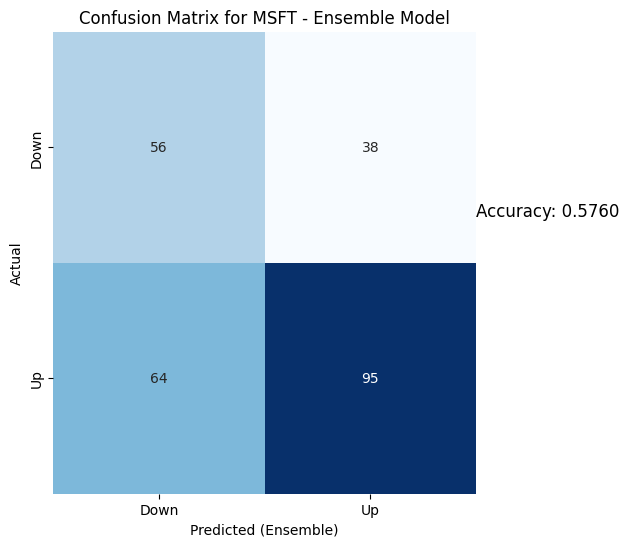

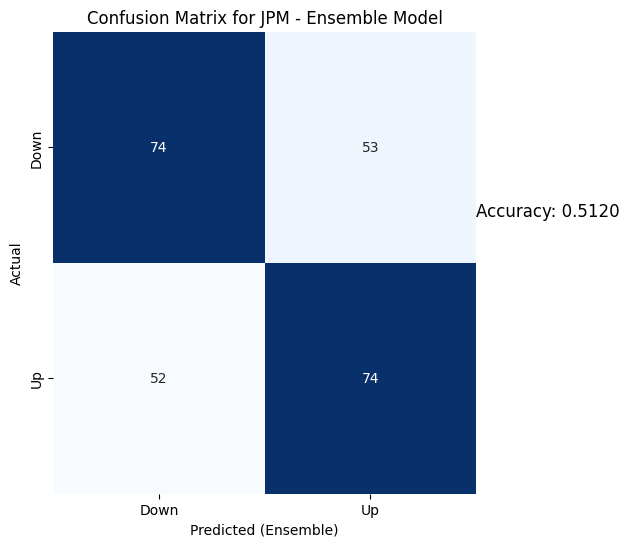

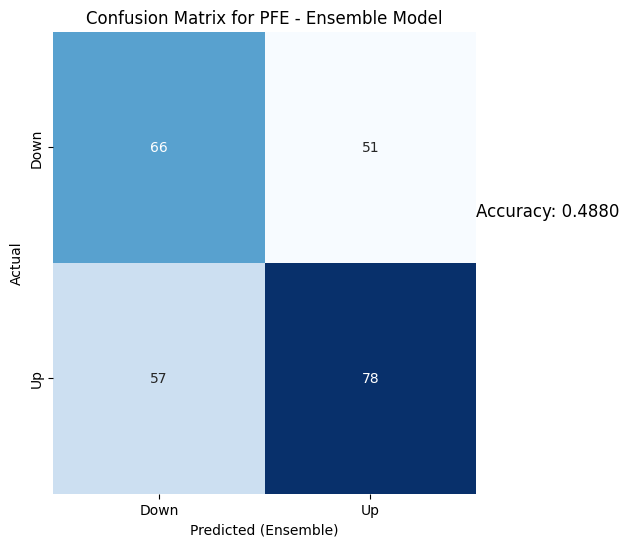

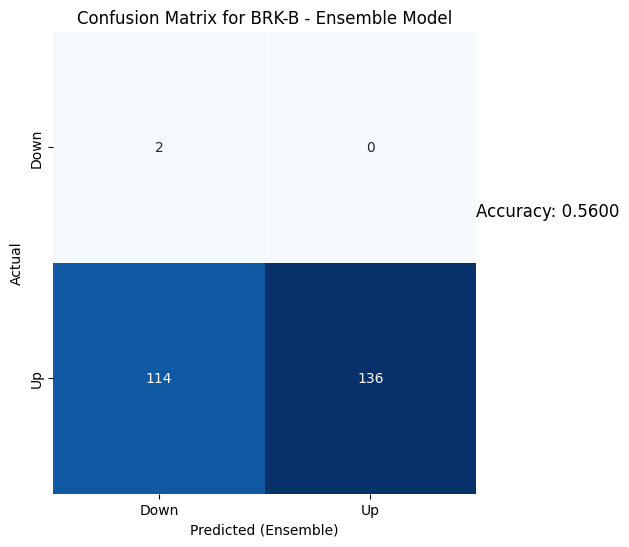

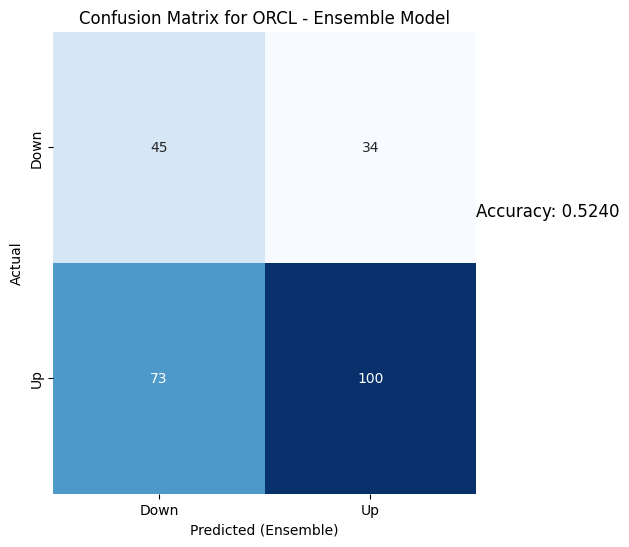

...

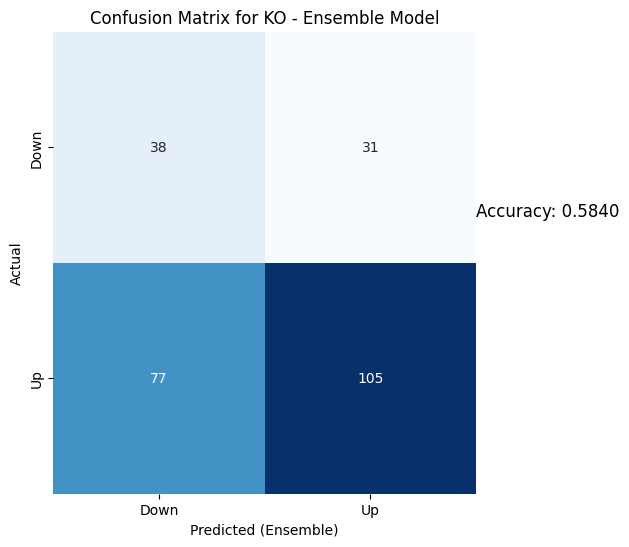

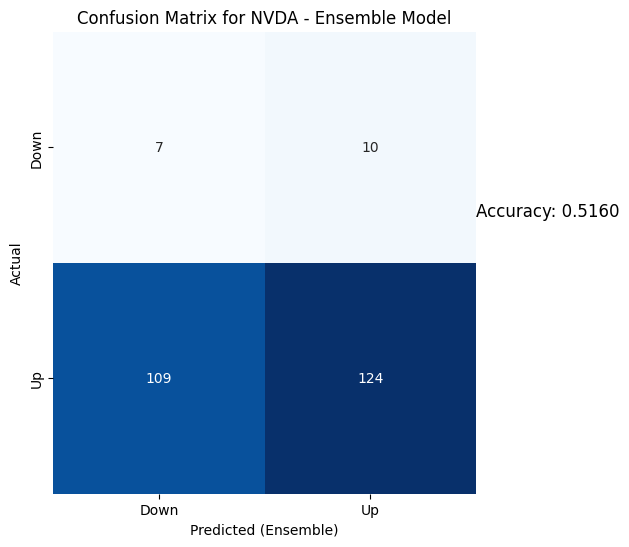

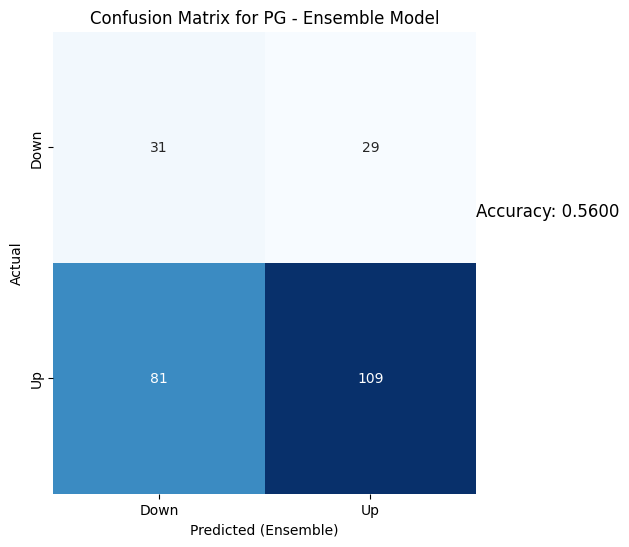

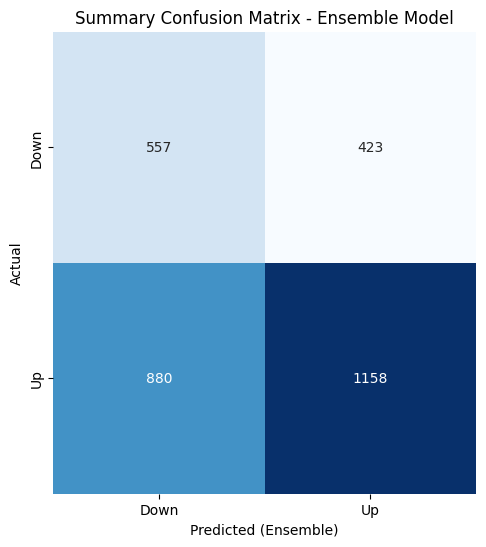

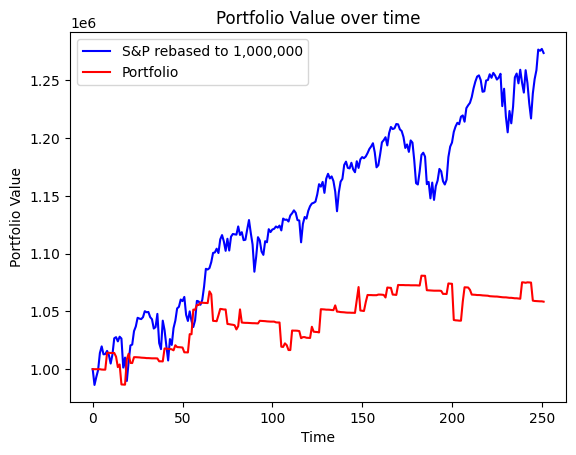

Portfolio return for our period =  105.84153011705698
S&P500 return during the period =  127.35637034437164


In [8]:
Portfolio_construct("2018-01-01")

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2263
[LightGBM] [Info] Number of data points in the train set: 755, number of used features: 9
[LightGBM] [Info] Start training from score 0.487417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5336
LightGBM: 0.5494
GBR: 0.5652
RandomForest: 0.5415
XGBoost: 0.5731
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6958 - accuracy: 0.5127 - val_loss: 0.6962 - val_accuracy: 0.5202
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6941 - accuracy: 0.5215 - val_loss: 0.6935 - val_accuracy: 0.5202
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6924 - accuracy: 0.5304 - val_loss: 0.6917 - val_accuracy: 0.5202
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5139 - val_loss: 0.6911 - val_accuracy: 0.5202
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5291 - val_loss: 0.6905 - val_accuracy: 0.5202
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.5316 - val_loss: 0.6913 - val_accuracy: 0.5202
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4862
LightGBM: 0.4822
GBR: 0.5178
RandomForest: 0.5138
XGBoost: 0.4901
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6971 - accuracy: 0.5171 - val_loss: 0.6934 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6924 - accuracy: 0.5108 - val_loss: 0.6942 - val_accuracy: 0.4949
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6921 - accuracy: 0.5399 - val_loss: 0.6956 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.5247 - val_loss: 0.6943 - val_accuracy: 0.4646
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6912 - accuracy: 0.5399 - val_loss: 0.6943 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.5272 - val_loss: 0.6939 - val_accuracy: 0.5303
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5178
LightGBM: 0.4387
GBR: 0.4506
RandomForest: 0.4427
XGBoost: 0.4427
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6948 - accuracy: 0.5178 - val_loss: 0.6915 - val_accuracy: 0.5859
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6941 - accuracy: 0.5216 - val_loss: 0.6876 - val_accuracy: 0.5505
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.4975 - val_loss: 0.6880 - val_accuracy: 0.5505
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6912 - accuracy: 0.5305 - val_loss: 0.6866 - val_accuracy: 0.5505
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6919 - accuracy: 0.5216 - val_loss: 0.6869 - val_accuracy: 0.5505
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6913 - accuracy: 0.5292 - val_loss: 0.6870 - val_accuracy: 0.5505
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5714
LightGBM: 0.4603
GBR: 0.4484
RandomForest: 0.4206
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6958 - accuracy: 0.5381 - val_loss: 0.6938 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6933 - accuracy: 0.5330 - val_loss: 0.6813 - val_accuracy: 0.5838
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5114 - val_loss: 0.6849 - val_accuracy: 0.5838
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6921 - accuracy: 0.5317 - val_loss: 0.6839 - val_accuracy: 0.5838
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.5292 - val_loss: 0.6851 - val_accuracy: 0.5838
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5317 - val_loss: 0.6839 - val_accuracy: 0.5838
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


SVR: 0.5198
LightGBM: 0.5000
GBR: 0.5357
RandomForest: 0.5079
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6948 - accuracy: 0.5146 - val_loss: 0.6922 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6938 - accuracy: 0.5032 - val_loss: 0.6917 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5248 - val_loss: 0.6923 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6930 - accuracy: 0.5083 - val_loss: 0.6921 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6919 - accuracy: 0.5235 - val_loss: 0.6914 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5146 - val_loss: 0.6922 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5952
LightGBM: 0.5833
GBR: 0.5357
RandomForest: 0.4405
XGBoost: 0.4444
Epoch 1/10
25/25 [==============================] - 6s 50ms/step - loss: 0.6927 - accuracy: 0.5280 - val_loss: 0.6827 - val_accuracy: 0.5635
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.5471 - val_loss: 0.6992 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6855 - accuracy: 0.5534 - val_loss: 0.6897 - val_accuracy: 0.5635
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6851 - accuracy: 0.5471 - val_loss: 0.6996 - val_accuracy: 0.5635
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6840 - accuracy: 0.5420 - val_loss: 0.7033 - val_accuracy: 0.5635
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6832 - accuracy: 0.5611 - val_loss: 0.7023 - val_accuracy: 0.5635
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5675
LightGBM: 0.4405
GBR: 0.4683
RandomForest: 0.4484
XGBoost: 0.5238
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6957 - accuracy: 0.4726 - val_loss: 0.6906 - val_accuracy: 0.5635
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.5045 - val_loss: 0.6882 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5032 - val_loss: 0.7050 - val_accuracy: 0.4365
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6945 - accuracy: 0.4955 - val_loss: 0.6927 - val_accuracy: 0.5127
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5172 - val_loss: 0.6964 - val_accuracy: 0.4721
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6943 - accuracy: 0.5159 - val_loss: 0.6958 - val_accuracy: 0.4721
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4900
LightGBM: 0.4343
GBR: 0.4900
RandomForest: 0.4422
XGBoost: 0.4661
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6962 - accuracy: 0.5013 - val_loss: 0.6958 - val_accuracy: 0.4112
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6942 - accuracy: 0.4936 - val_loss: 0.6984 - val_accuracy: 0.4162
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6945 - accuracy: 0.5128 - val_loss: 0.6928 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6941 - accuracy: 0.4962 - val_loss: 0.6964 - val_accuracy: 0.3959
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5140 - val_loss: 0.6914 - val_accuracy: 0.5330
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.4898 - val_loss: 0.6909 - val_accuracy: 0.5482
Epoch 7/10
25/25 [==============================] - 0s 16

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.4821
LightGBM: 0.5418
GBR: 0.5100
RandomForest: 0.5657
XGBoost: 0.5538
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6937 - accuracy: 0.5217 - val_loss: 0.7144 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6938 - accuracy: 0.5332 - val_loss: 0.6960 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5268 - val_loss: 0.6973 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6909 - accuracy: 0.5332 - val_loss: 0.6981 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.5332 - val_loss: 0.6984 - val_accuracy: 0.4847
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.5332 - val_loss: 0.6985 - val_accuracy: 0.4847
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5179
LightGBM: 0.5020
GBR: 0.5100
RandomForest: 0.5259
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6981 - accuracy: 0.4840 - val_loss: 0.6932 - val_accuracy: 0.4796
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6948 - accuracy: 0.4930 - val_loss: 0.6916 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5160 - val_loss: 0.6988 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.5109 - val_loss: 0.6936 - val_accuracy: 0.4949
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5236 - val_loss: 0.6957 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5223 - val_loss: 0.6990 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5179
LightGBM: 0.5538
GBR: 0.4741
RandomForest: 0.4940
XGBoost: 0.5219
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6959 - accuracy: 0.5090 - val_loss: 0.6967 - val_accuracy: 0.4898
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6895 - accuracy: 0.5128 - val_loss: 0.6970 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6860 - accuracy: 0.5614 - val_loss: 0.6930 - val_accuracy: 0.5102
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6853 - accuracy: 0.5499 - val_loss: 0.6944 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6842 - accuracy: 0.5409 - val_loss: 0.6944 - val_accuracy: 0.4949
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6855 - accuracy: 0.5409 - val_loss: 0.7004 - val_accuracy: 0.4898
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4920
LightGBM: 0.4720
GBR: 0.4800
RandomForest: 0.5160
XGBoost: 0.5080
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6996 - accuracy: 0.4635 - val_loss: 0.6935 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6947 - accuracy: 0.4891 - val_loss: 0.6935 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5096 - val_loss: 0.6929 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6945 - accuracy: 0.5122 - val_loss: 0.6926 - val_accuracy: 0.5306
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6938 - accuracy: 0.5032 - val_loss: 0.6929 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.4814 - val_loss: 0.6923 - val_accuracy: 0.5510
Epoch 7/10
25/25 [==============================] - 0s 16

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 204 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  None  and sold at  1.1605360507965088
1.900833010673523


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 205 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.900833010673523  and sold at  1.9149999618530273
1.1383930444717407
46.79999923706055
1.9175000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 206 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'NVDA']
AAPL bought at  1.1383930444717407  and sold at  1.1430360078811646
BAC bought at  46.79999923706055  and sold at  46.70000076293945
NVDA bought at  1.9175000190734863  and sold at  1.9225000143051147
1.1430360078811646
1.9225000143051147
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.1430360078811646  and sold at  1.127856969833374
NVDA bought at  1.9225000143051147  and sold at  1.9058330059051514
1.127856969833374
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.127856969833374  and sold at  1.146070957183838
1.146070957183838
1.8958330154418945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 207 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.146070957183838  and sold at  1.1507140398025513
NVDA bought at  1.8958330154418945  and sold at  1.912500023841858
39.15999984741211
[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  39.15999984741211  and sold at  39.08000183105469
1.149999976158142


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 208 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.149999976158142  and sold at  1.1301790475845337
1.8716670274734497


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 209 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8716670274734497  and sold at  1.835832953453064
1.2366069555282593


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 210 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.2366069555282593  and sold at  1.2314289808273315
1.2314289808273315


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 211 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.2314289808273315  and sold at  1.1528569459915161
1.1528569459915161


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 212 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.1528569459915161  and sold at  1.1689289808273315
1.1689289808273315
1.7683329582214355


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 213 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.1689289808273315  and sold at  1.2464289665222168
NVDA bought at  1.7683329582214355  and sold at  1.786666989326477
1.786666989326477
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.786666989326477  and sold at  1.7925000190734863
1.2535710334777832
44.88999938964844
1.7925000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 214 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'NVDA']
AAPL bought at  1.2535710334777832  and sold at  1.261607050895691
BAC bought at  44.88999938964844  and sold at  45.72999954223633
NVDA bought at  1.7925000190734863  and sold at  1.8208329677581787
44.970001220703125
1.7791670560836792
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  44.970001220703125  and sold at  45.310001373291016
NVDA bought at  1.7791670560836792  and sold at  1.7833329439163208
1.7833329439163208
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.7833329439163208  and sold at  1.786666989326477
1.2587499618530273
45.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 215 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.2587499618530273  and sold at  1.26357102394104
BAC bought at  45.09000015258789  and sold at  45.220001220703125
25.670000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 216 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  25.670000076293945  and sold at  26.020000457763672
1.286607027053833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 217 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.286607027053833  and sold at  1.2901790142059326
1.2901790142059326
1.7675000429153442


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 218 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.2901790142059326  and sold at  1.2971429824829102
NVDA bought at  1.7675000429153442  and sold at  1.9091670513153076
1.2971429824829102
1.9091670513153076
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.2971429824829102  and sold at  1.3210710287094116
NVDA bought at  1.9091670513153076  and sold at  1.9066669940948486
1.9066669940948486
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9066669940948486  and sold at  1.909999966621399
1.3844640254974365
46.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 219 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.3844640254974365  and sold at  1.4219640493392944
BAC bought at  46.68000030517578  and sold at  46.72999954223633
2.0325000286102295


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 220 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.0325000286102295  and sold at  2.149167060852051
1.4060709476470947


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 221 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4060709476470947  and sold at  1.3992860317230225
1.3992860317230225


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 222 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3992860317230225  and sold at  1.4501789808273315
2.1333329677581787


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 223 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.1333329677581787  and sold at  2.1524999141693115
1.5787500143051147


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 224 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5787500143051147  and sold at  1.6094640493392944
1.6094640493392944


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 225 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6094640493392944  and sold at  1.5680359601974487
1.523036003112793


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 226 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.523036003112793  and sold at  1.5755360126495361
46.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 227 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  46.790000915527344  and sold at  46.650001525878906
1.6021430492401123


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 228 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6021430492401123  and sold at  1.589285969734192
47.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 229 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  47.08000183105469  and sold at  46.56999969482422
1.5757139921188354


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 230 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5757139921188354  and sold at  1.4924999475479126
1.4924999475479126


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 231 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4924999475479126  and sold at  1.5289289951324463
1.526785969734192
46.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 232 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.526785969734192  and sold at  1.4474999904632568
BAC bought at  46.470001220703125  and sold at  46.2599983215332
13.619999885559082
2.2033329010009766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 233 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  13.619999885559082  and sold at  13.350000381469727
NVDA bought at  2.2033329010009766  and sold at  2.1458330154418945
45.70000076293945
[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.70000076293945  and sold at  45.86000061035156
1.4225000143051147
45.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 234 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.4225000143051147  and sold at  1.4382139444351196
BAC bought at  45.86000061035156  and sold at  45.77000045776367
1.4382139444351196
45.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 235 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.4382139444351196  and sold at  1.440000057220459
BAC bought at  45.77000045776367  and sold at  45.79999923706055
1.440000057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 236 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.440000057220459  and sold at  1.4628570079803467
44.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 237 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  44.79999923706055  and sold at  44.779998779296875
1.5089290142059326
31.66515350341797
44.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 238 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'BAC']
AAPL bought at  1.5089290142059326  and sold at  1.5342860221862793
VZ bought at  31.66515350341797  and sold at  31.611194610595703
BAC bought at  44.779998779296875  and sold at  44.939998626708984
1.5607140064239502


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 239 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5607140064239502  and sold at  1.5296430587768555
1.5296430587768555


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 240 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5296430587768555  and sold at  1.519642949104309
1.519642949104309


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 241 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.519642949104309  and sold at  1.5178569555282593
1.5285710096359253


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 242 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5285710096359253  and sold at  1.4882140159606934
1.4960709810256958


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 243 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4960709810256958  and sold at  1.5117859840393066
58.04999923706055
1.5557140111923218


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 244 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  58.04999923706055  and sold at  57.650001525878906
AAPL bought at  1.5557140111923218  and sold at  1.5621429681777954
1.497143030166626


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 245 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.497143030166626  and sold at  1.5235710144042969
1.5235710144042969


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 246 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5235710144042969  and sold at  1.4657139778137207
1.4657139778137207


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 247 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4657139778137207  and sold at  1.3307139873504639
1.2625000476837158


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 248 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.2625000476837158  and sold at  1.272143006324768
24.649999618530273
1.272143006324768


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 249 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  24.649999618530273  and sold at  24.6299991607666
AAPL bought at  1.272143006324768  and sold at  1.3246430158615112
1.3246430158615112


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 250 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3246430158615112  and sold at  1.2682139873504639
1.2682139873504639
44.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 251 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.2682139873504639  and sold at  1.3278570175170898
BAC bought at  44.22999954223633  and sold at  44.38999938964844
1.3278570175170898


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 252 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3278570175170898  and sold at  1.2678569555282593
1.2678569555282593


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 253 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.2678569555282593  and sold at  1.320713996887207
1.8741669654846191


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 254 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8741669654846191  and sold at  1.8025000095367432
1.2878570556640625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 255 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.2878570556640625  and sold at  1.301071047782898
1.293213963508606


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 256 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.293213963508606  and sold at  1.3267860412597656
1.3267860412597656
45.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 257 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.3267860412597656  and sold at  1.309999942779541
BAC bought at  45.970001220703125  and sold at  45.849998474121094
1.309999942779541
45.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 258 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.309999942779541  and sold at  1.3300000429153442
BAC bought at  45.849998474121094  and sold at  45.4900016784668
1.3300000429153442
45.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 259 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.3300000429153442  and sold at  1.3203569650650024
BAC bought at  45.4900016784668  and sold at  45.72999954223633
1.3203569650650024


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 260 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3203569650650024  and sold at  1.3007140159606934
45.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 261 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.380001068115234  and sold at  45.65999984741211
1.2717859745025635
45.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 262 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.2717859745025635  and sold at  1.2189290523529053
BAC bought at  45.65999984741211  and sold at  45.34000015258789
1.8991669416427612


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 263 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8991669416427612  and sold at  2.110832929611206
1.241786003112793
45.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 264 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.241786003112793  and sold at  1.269642949104309
BAC bought at  45.130001068115234  and sold at  45.849998474121094
2.141666889190674


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 265 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.141666889190674  and sold at  2.1575000286102295
1.3410710096359253
46.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 266 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.3410710096359253  and sold at  1.3410710096359253
BAC bought at  46.45000076293945  and sold at  46.56999969482422
1.417857050895691


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 267 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.417857050895691  and sold at  1.420714020729065
1.420714020729065
2.244999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 268 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.420714020729065  and sold at  1.4550000429153442
NVDA bought at  2.244999885559082  and sold at  2.308332920074463
1.4550000429153442
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4550000429153442  and sold at  1.448570966720581
1.448570966720581


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 269 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.448570966720581  and sold at  1.4199999570846558
1.4199999570846558


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 270 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.4199999570846558  and sold at  1.4392859935760498
1.4392859935760498
46.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 271 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.4392859935760498  and sold at  1.4299999475479126
BAC bought at  46.290000915527344  and sold at  46.18000030517578
1.4299999475479126
2.3641669750213623


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 272 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.4299999475479126  and sold at  1.3657139539718628
NVDA bought at  2.3641669750213623  and sold at  2.358333110809326
55.540000915527344
1.3542859554290771
31.49428367614746
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'VZ']
BRK-B bought at  55.540000915527344  and sold at  55.459999084472656
AAPL bought at  1.3542859554290771  and sold at  1.3049999475479126
VZ bought at  31.49428367614746  and sold at  31.51226806640625
1.3049999475479126
45.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 273 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.3049999475479126  and sold at  1.3185709714889526
BAC bought at  45.86000061035156  and sold at  45.90999984741211
1.3185709714889526


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 274 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3185709714889526  and sold at  1.344642996788025
1.285714030265808


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 275 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.285714030265808  and sold at  1.32607102394104
1.3564289808273315


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 276 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3564289808273315  and sold at  1.3682140111923218
12.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 277 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  12.34000015258789  and sold at  12.40999984741211
1.3432140350341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 278 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3432140350341797  and sold at  1.3521430492401123
1.3521430492401123


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 279 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3521430492401123  and sold at  1.3767859935760498
1.3767859935760498


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 280 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3767859935760498  and sold at  1.388929009437561
2.331666946411133


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 281 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.331666946411133  and sold at  2.257499933242798
1.3485709428787231


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 282 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3485709428787231  and sold at  1.3250000476837158
46.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 283 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  46.400001525878906  and sold at  46.66999816894531
1.29892897605896


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 284 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.29892897605896  and sold at  1.3146430253982544
1.3035709857940674


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 285 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3035709857940674  and sold at  1.3564289808273315
2.271667003631592


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 286 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.271667003631592  and sold at  2.3324999809265137
24.700000762939453
1.3353569507598877


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 287 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  24.700000762939453  and sold at  24.649999618530273
AAPL bought at  1.3353569507598877  and sold at  1.3439290523529053
1.3439290523529053


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 288 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3439290523529053  and sold at  1.3660709857940674
2.3450000286102295


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 289 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.3450000286102295  and sold at  2.380000114440918
1.3657139539718628


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 290 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.3657139539718628  and sold at  1.369642972946167
1.5582139492034912


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 291 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.5582139492034912  and sold at  1.5460710525512695
26.440000534057617
2.2100000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 292 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  26.440000534057617  and sold at  25.68000030517578
NVDA bought at  2.2100000381469727  and sold at  2.1524999141693115
2.319999933242798
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.319999933242798  and sold at  2.295833110809326
2.295833110809326


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 293 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.295833110809326  and sold at  2.3541669845581055
1.5353569984436035
2.3541669845581055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 294 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.5353569984436035  and sold at  1.5232139825820923
NVDA bought at  2.3541669845581055  and sold at  2.362499952316284
2.362499952316284
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.362499952316284  and sold at  2.3566670417785645
25.08538818359375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 295 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  25.08538818359375  and sold at  24.819734573364258
1.7028570175170898


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 296 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.7028570175170898  and sold at  1.651785969734192
26.739999771118164
43.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 297 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  26.739999771118164  and sold at  26.950000762939453
BAC bought at  43.720001220703125  and sold at  43.72999954223633
1.6367859840393066
43.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 298 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  1.6367859840393066  and sold at  1.6382139921188354
BAC bought at  43.619998931884766  and sold at  43.7400016784668
1.6382139921188354


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 299 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6382139921188354  and sold at  1.6335710287094116
1.6335710287094116


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 300 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6335710287094116  and sold at  1.6346429586410522
1.6346429586410522


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 301 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6346429586410522  and sold at  1.6449999809265137
1.6632139682769775


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 302 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6632139682769775  and sold at  1.6746430397033691
1.6521430015563965


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 303 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.6521430015563965  and sold at  1.6507140398025513
1.6507140398025513
2.5158329010009766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 304 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.6507140398025513  and sold at  1.7428569793701172
NVDA bought at  2.5158329010009766  and sold at  2.5366671085357666
24.95256233215332
1.738571047782898
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  24.95256233215332  and sold at  25.15180206298828
AAPL bought at  1.738571047782898  and sold at  1.7778569459915161
56.15999984741211
1.7778569459915161


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 305 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  56.15999984741211  and sold at  55.84000015258789
AAPL bought at  1.7778569459915161  and sold at  1.8324999809265137
1.8324999809265137
2.682499885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 306 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.8324999809265137  and sold at  1.8357139825820923
NVDA bought at  2.682499885559082  and sold at  2.673332929611206
2.673332929611206
[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.673332929611206  and sold at  2.754167079925537
1.7810709476470947


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 307 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.7810709476470947  and sold at  1.8289289474487305
54.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 308 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  54.5  and sold at  54.31999969482422
1.8996429443359375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 309 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.8996429443359375  and sold at  1.861070990562439
1.899999976158142
2.725832939147949


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 310 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.899999976158142  and sold at  1.9228570461273193
NVDA bought at  2.725832939147949  and sold at  2.748332977294922
1.9228570461273193
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9228570461273193  and sold at  1.9085710048675537
1.8242859840393066
2.774167060852051


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 311 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  1.8242859840393066  and sold at  1.8692859411239624
NVDA bought at  2.774167060852051  and sold at  2.831666946411133
1.8692859411239624
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.8692859411239624  and sold at  1.9146430492401123
42.099998474121094
2.8566670417785645


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 312 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  42.099998474121094  and sold at  42.04999923706055
NVDA bought at  2.8566670417785645  and sold at  2.934999942779541
1.8464289903640747
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.8464289903640747  and sold at  1.832142949104309
1.832142949104309
27.510282516479492
42.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 313 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'BAC']
AAPL bought at  1.832142949104309  and sold at  1.79892897605896
VZ bought at  27.510282516479492  and sold at  27.24048614501953
BAC bought at  42.27000045776367  and sold at  42.09000015258789
27.24048614501953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 314 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  27.24048614501953  and sold at  26.925722122192383
26.925722122192383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 315 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  26.925722122192383  and sold at  26.826797485351562
1.7589290142059326
26.826797485351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 316 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  1.7589290142059326  and sold at  1.9192860126495361
VZ bought at  26.826797485351562  and sold at  26.79981803894043
1.9192860126495361


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 317 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9192860126495361  and sold at  1.9285709857940674
26.88974952697754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 318 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  26.88974952697754  and sold at  26.440088272094727
1.9085710048675537


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 319 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9085710048675537  and sold at  1.8646429777145386
26.395122528076172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 320 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  26.395122528076172  and sold at  26.440088272094727
1.9621429443359375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 321 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9621429443359375  and sold at  2.005000114440918
26.260223388671875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 322 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  26.260223388671875  and sold at  26.54800796508789
1.9878569841384888


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 323 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9878569841384888  and sold at  2.0282139778137207
2.0367860794067383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 324 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.0367860794067383  and sold at  1.978929042816162
1.978929042816162
27.66316795349121


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 325 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  1.978929042816162  and sold at  1.9453569650650024
VZ bought at  27.66316795349121  and sold at  28.50853157043457
1.9453569650650024


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 326 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9453569650650024  and sold at  2.056786060333252
2.0535709857940674


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 327 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.0535709857940674  and sold at  2.141071081161499
44.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 328 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  44.08000183105469  and sold at  44.0099983215332
2.183928966522217


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 329 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.183928966522217  and sold at  2.151071071624756
2.1392860412597656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 330 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.1392860412597656  and sold at  2.1467859745025635
2.1467859745025635


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 331 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.1467859745025635  and sold at  2.184999942779541
2.304286003112793


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 332 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.304286003112793  and sold at  2.3057138919830322
2.3057138919830322


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 333 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.3057138919830322  and sold at  2.319999933242798
2.3967859745025635
46.709999084472656
3.141666889190674


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 334 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'NVDA']
AAPL bought at  2.3967859745025635  and sold at  2.476428985595703
BAC bought at  46.709999084472656  and sold at  46.9900016784668
NVDA bought at  3.141666889190674  and sold at  3.172499895095825
2.4878571033477783
[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.4878571033477783  and sold at  2.432142972946167
2.432142972946167


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 335 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.432142972946167  and sold at  2.42214298248291
2.42214298248291


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 336 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.42214298248291  and sold at  2.557142972946167
2.557142972946167


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 337 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.557142972946167  and sold at  2.5939290523529053
2.565000057220459
28.51752471923828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 338 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  2.565000057220459  and sold at  2.6446430683135986
VZ bought at  28.51752471923828  and sold at  28.544504165649414
2.6446430683135986


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 339 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.6446430683135986  and sold at  2.641071081161499
2.641071081161499


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 340 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.641071081161499  and sold at  2.645714044570923
[1000000.0, 987780.5387912529, 980964.2488991285, 985951.7672607277, 984538.6486852264, 989193.6573667541, 982377.3674746299, 985619.2575806563, 977722.3587931021, 982876.1002848689, 993100.5668329236, 982709.8771547014, 976724.8297528876, 970739.7823510736, 968827.9309653334, 971571.024841384, 974480.4686870758, 976142.9536676966, 976142.9536676966, 982211.1443444625, 988445.5581513959, 991438.018432566, 988861.1476866826, 999418.123914809, 998088.085194523, 999251.8373649048, 991770.5281126376, 995344.9278987354, 1003906.8460464326, 1003158.7468310744, 1006899.3697473396, 1007564.3891074826, 999418.123914809, 1000748.0992153584, 985868.6239857756, 992934.2802830194, 999501.2037700242, 1009393.1606380076, 1002743.0938760507, 1007730.6756573868, 1007231.8794274111, 1007647.5323824348, 1020199.5032712534, 1020698.2360814923, 1016874.4698902749, 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 341 times so far.

  warnings.warn(msg, UserWarning)


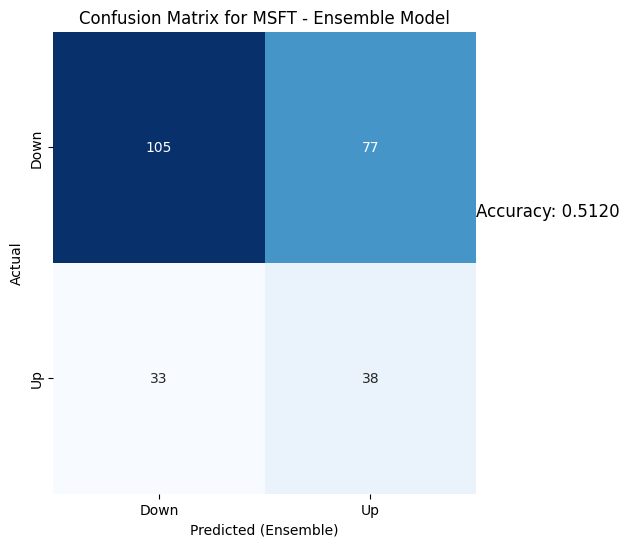

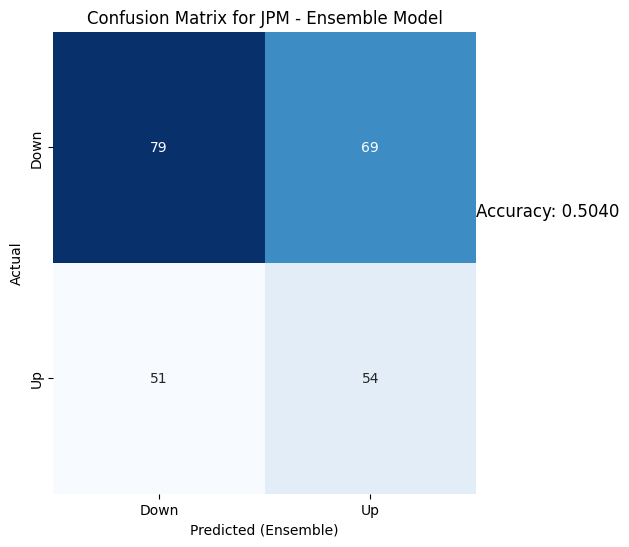

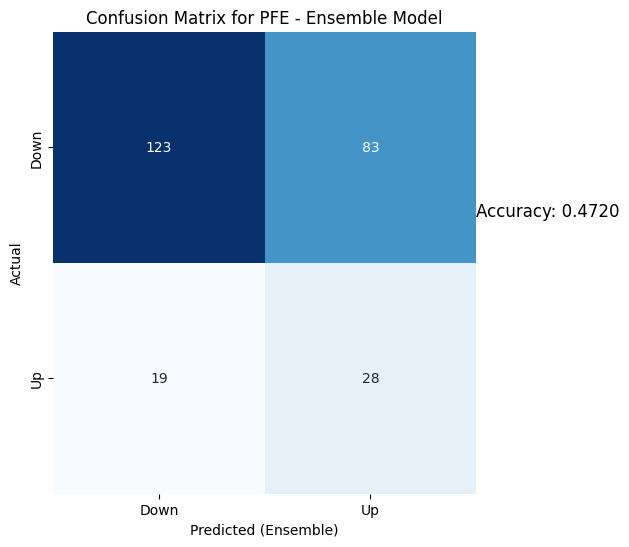

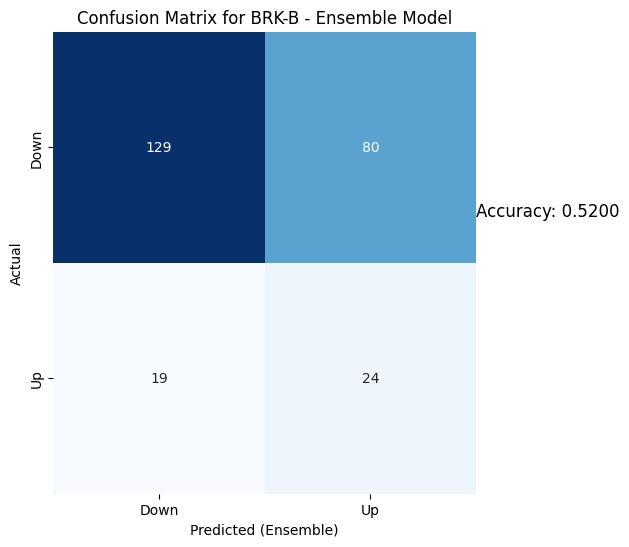

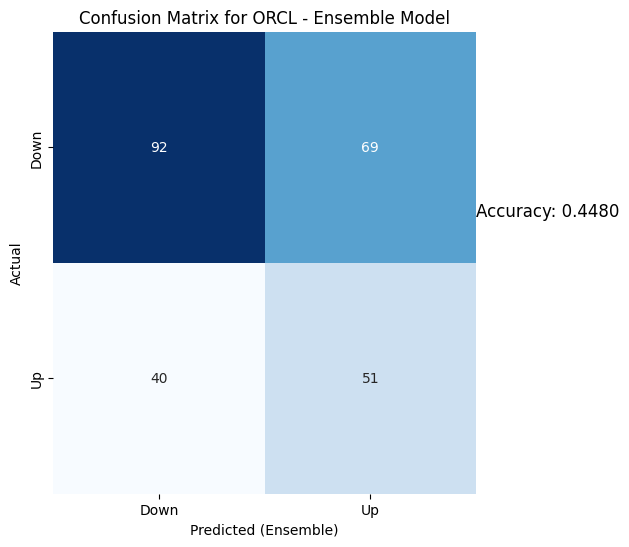

...

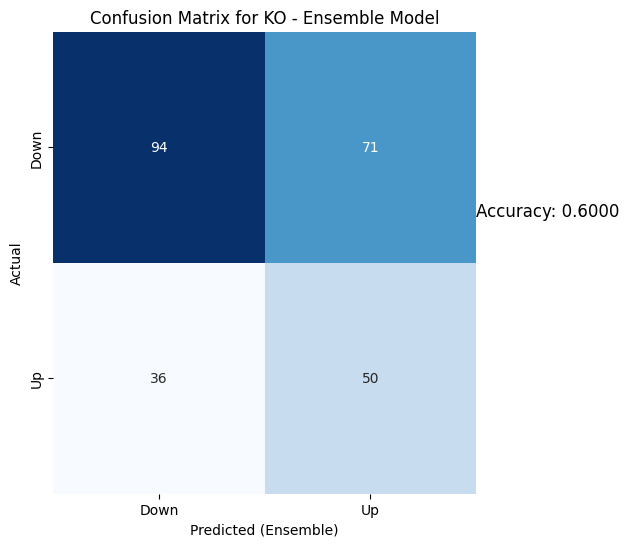

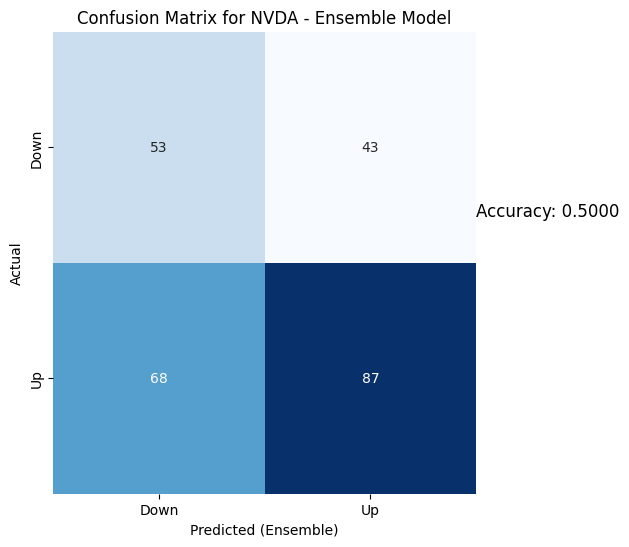

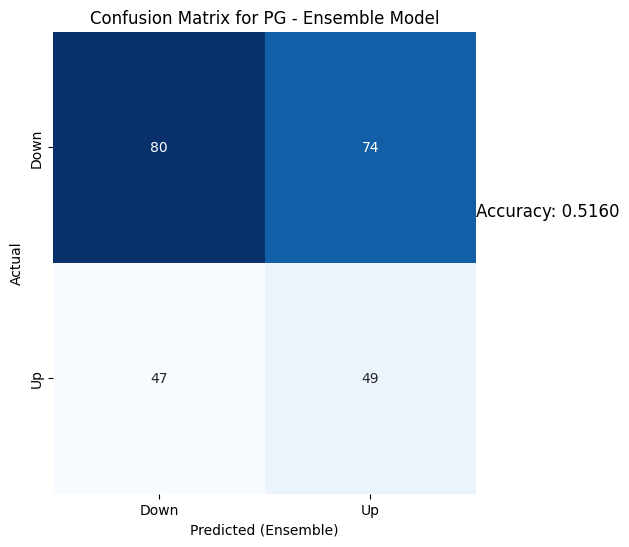

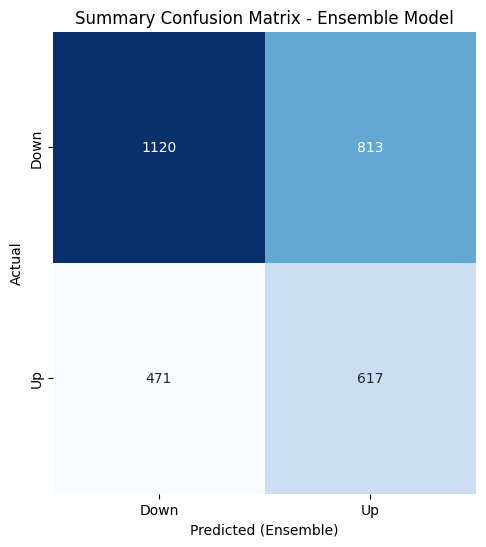

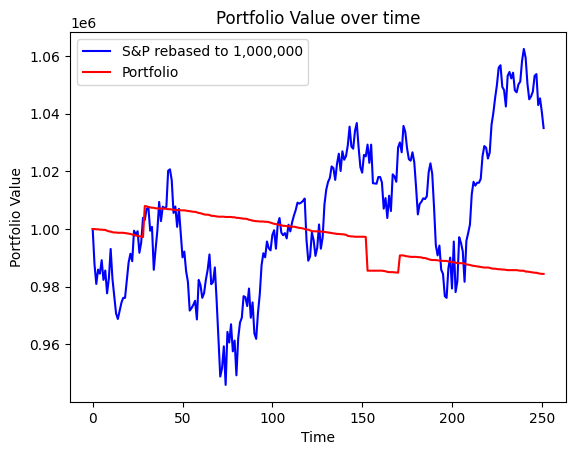

Portfolio return for our period =  98.44507351028966
S&P500 return during the period =  103.4995835225884


In [9]:
Portfolio_construct("2002-01-01")
#Testing for year 2005

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed
Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
Accuracies for MSFT:
Accuracies for MSFT:
SVR: 0.4862
LightGBM: 0.4980
GBR: 0.4901
RandomForest: 0.5059
XGBoost: 0.5138


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 23ms/step - loss: 0.6971 - accuracy: 0.5133 - val_loss: 0.6914 - val_accuracy: 0.5354
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6937 - accuracy: 0.5057 - val_loss: 0.6919 - val_accuracy: 0.5152
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6912 - accuracy: 0.5171 - val_loss: 0.6921 - val_accuracy: 0.5253
Epoch 4/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6920 - accuracy: 0.5260 - val_loss: 0.6944 - val_accuracy: 0.5303
Epoch 5/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6906 - accuracy: 0.5196 - val_loss: 0.6909 - val_accuracy: 0.5303
Epoch 6/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6896 - accuracy: 0.5399 - val_loss: 0.6939 - val_accuracy: 0.5354
Epoch 7/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6909 - accuracy: 0.5349 - val_loss: 0.6912 - val_accuracy: 0.5404
Epoch 8/10
25/25 [

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for JPM:
Accuracies for JPM:
Accuracies for JPM:
SVR: 0.4901
LightGBM: 0.5217
GBR: 0.4862
RandomForest: 0.4822
XGBoost: 0.5178


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 23ms/step - loss: 0.6943 - accuracy: 0.4873 - val_loss: 0.6937 - val_accuracy: 0.4949
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6936 - accuracy: 0.5051 - val_loss: 0.6939 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6916 - accuracy: 0.5127 - val_loss: 0.6949 - val_accuracy: 0.5051
Epoch 4/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6909 - accuracy: 0.5330 - val_loss: 0.6951 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6917 - accuracy: 0.5051 - val_loss: 0.6958 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6922 - accuracy: 0.5178 - val_loss: 0.6934 - val_accuracy: 0.5202
Epoch 7/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6906 - accuracy: 0.5216 - val_loss: 0.6974 - val_accuracy: 0.5051
Epoch 8/10
25/25 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for PFE:
Accuracies for PFE:
Accuracies for PFE:
SVR: 0.5079
LightGBM: 0.5238
GBR: 0.4802
RandomForest: 0.4841
XGBoost: 0.5079


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6969 - accuracy: 0.4975 - val_loss: 0.6973 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6916 - accuracy: 0.5254 - val_loss: 0.6954 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6918 - accuracy: 0.5190 - val_loss: 0.6955 - val_accuracy: 0.5076
Epoch 4/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6912 - accuracy: 0.5292 - val_loss: 0.6942 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6901 - accuracy: 0.5305 - val_loss: 0.6942 - val_accuracy: 0.5076
Epoch 6/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6896 - accuracy: 0.5279 - val_loss: 0.6933 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6894 - accuracy: 0.5508 - val_loss: 0.6973 - val_accuracy: 0.5076
Epoch 8/10
25/2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for BRK-B:
Accuracies for BRK-B:
Accuracies for BRK-B:
SVR: 0.5119
LightGBM: 0.5317
GBR: 0.4802
RandomForest: 0.5357
XGBoost: 0.4762


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6968 - accuracy: 0.5108 - val_loss: 0.6933 - val_accuracy: 0.5025
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6936 - accuracy: 0.5248 - val_loss: 0.6953 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6922 - accuracy: 0.5083 - val_loss: 0.7002 - val_accuracy: 0.5076
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6923 - accuracy: 0.5299 - val_loss: 0.6955 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6927 - accuracy: 0.4879 - val_loss: 0.6965 - val_accuracy: 0.5076
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6914 - accuracy: 0.5248 - val_loss: 0.6972 - val_accuracy: 0.5076
Epoch 7/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6920 - accuracy: 0.4981 - val_loss: 0.6978 - val_accuracy: 0.5076
Epoch 8/10
25/25 [

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for ORCL:
Accuracies for ORCL:
Accuracies for ORCL:
SVR: 0.5278
LightGBM: 0.5198
GBR: 0.5159
RandomForest: 0.5317
XGBoost: 0.5238


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6974 - accuracy: 0.5013 - val_loss: 0.6933 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6929 - accuracy: 0.5051 - val_loss: 0.6933 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6928 - accuracy: 0.5178 - val_loss: 0.6926 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6935 - accuracy: 0.5165 - val_loss: 0.6930 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6928 - accuracy: 0.5038 - val_loss: 0.6957 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6919 - accuracy: 0.5204 - val_loss: 0.6977 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6920 - accuracy: 0.5153 - val_loss: 0.6967 - val_accuracy: 0.5228
Epoch 8/10
25/25 [

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for AAPL:
Accuracies for AAPL:
Accuracies for AAPL:
SVR: 0.4563
LightGBM: 0.5238
GBR: 0.5238
RandomForest: 0.5198
XGBoost: 0.5833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 26ms/step - loss: 0.6943 - accuracy: 0.5490 - val_loss: 0.7111 - val_accuracy: 0.4569
Epoch 2/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6898 - accuracy: 0.5439 - val_loss: 0.7067 - val_accuracy: 0.4569
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6874 - accuracy: 0.5529 - val_loss: 0.7099 - val_accuracy: 0.4569
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6884 - accuracy: 0.5529 - val_loss: 0.6977 - val_accuracy: 0.4721
Epoch 5/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6876 - accuracy: 0.5503 - val_loss: 0.7044 - val_accuracy: 0.4569
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6864 - accuracy: 0.5529 - val_loss: 0.7105 - val_accuracy: 0.4569
Epoch 7/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6880 - accuracy: 0.5465 - val_loss: 0.7060 - val_accuracy: 0.4569
Epoch 8/10
25/25 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for IBM:
Accuracies for IBM:
Accuracies for IBM:
SVR: 0.5179
LightGBM: 0.4980
GBR: 0.4900
RandomForest: 0.4861
XGBoost: 0.4741


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 22ms/step - loss: 0.6952 - accuracy: 0.5038 - val_loss: 0.6938 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6941 - accuracy: 0.4834 - val_loss: 0.6950 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6939 - accuracy: 0.5013 - val_loss: 0.6940 - val_accuracy: 0.4975
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6939 - accuracy: 0.5140 - val_loss: 0.6959 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6927 - accuracy: 0.5332 - val_loss: 0.6943 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6934 - accuracy: 0.5204 - val_loss: 0.6943 - val_accuracy: 0.5025
Epoch 7/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6928 - accuracy: 0.4936 - val_loss: 0.6945 - val_accuracy: 0.4924
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for VZ:
Accuracies for VZ:
Accuracies for VZ:
SVR: 0.4781
LightGBM: 0.4781
GBR: 0.4502
RandomForest: 0.5060
XGBoost: 0.4582


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 21ms/step - loss: 0.6923 - accuracy: 0.5217 - val_loss: 0.6966 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6906 - accuracy: 0.5242 - val_loss: 0.6995 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6909 - accuracy: 0.5204 - val_loss: 0.6993 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6912 - accuracy: 0.5434 - val_loss: 0.7110 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6908 - accuracy: 0.5115 - val_loss: 0.7029 - val_accuracy: 0.4847
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6912 - accuracy: 0.5242 - val_loss: 0.7032 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6883 - accuracy: 0.5217 - val_loss: 0.6994 - val_accuracy: 0.5051
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for BAC:
Accuracies for BAC:
Accuracies for BAC:
SVR: 0.5219
LightGBM: 0.4980
GBR: 0.4661
RandomForest: 0.5060
XGBoost: 0.4701


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 25ms/step - loss: 0.6941 - accuracy: 0.5172 - val_loss: 0.6924 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6914 - accuracy: 0.5287 - val_loss: 0.6977 - val_accuracy: 0.4592
Epoch 3/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6919 - accuracy: 0.5223 - val_loss: 0.6881 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6929 - accuracy: 0.5198 - val_loss: 0.6965 - val_accuracy: 0.4490
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6922 - accuracy: 0.5262 - val_loss: 0.6932 - val_accuracy: 0.5459
Epoch 6/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6924 - accuracy: 0.5275 - val_loss: 0.6939 - val_accuracy: 0.5357
Epoch 7/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6917 - accuracy: 0.5275 - val_loss: 0.7002 - val_accuracy: 0.4541
Epoch 8/10
25/25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for KO:
Accuracies for KO:
Accuracies for KO:
SVR: 0.4422
LightGBM: 0.4821
GBR: 0.4382
RandomForest: 0.5100
XGBoost: 0.4701


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.7010 - accuracy: 0.4668 - val_loss: 0.6939 - val_accuracy: 0.5204
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6944 - accuracy: 0.5166 - val_loss: 0.6947 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6932 - accuracy: 0.4923 - val_loss: 0.6935 - val_accuracy: 0.5459
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6943 - accuracy: 0.5128 - val_loss: 0.6934 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6930 - accuracy: 0.4949 - val_loss: 0.6927 - val_accuracy: 0.5204
Epoch 6/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6938 - accuracy: 0.5141 - val_loss: 0.6933 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6925 - accuracy: 0.5269 - val_loss: 0.6931 - val_accuracy: 0.5102
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for NVDA:
Accuracies for NVDA:
Accuracies for NVDA:
SVR: 0.5240
LightGBM: 0.5280
GBR: 0.4760
RandomForest: 0.4880
XGBoost: 0.5120


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 23ms/step - loss: 0.6937 - accuracy: 0.5301 - val_loss: 0.6972 - val_accuracy: 0.4490
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6921 - accuracy: 0.5339 - val_loss: 0.6945 - val_accuracy: 0.4949
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6941 - accuracy: 0.5250 - val_loss: 0.6950 - val_accuracy: 0.4694
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6910 - accuracy: 0.5211 - val_loss: 0.6940 - val_accuracy: 0.4949
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6911 - accuracy: 0.5250 - val_loss: 0.6924 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6895 - accuracy: 0.5352 - val_loss: 0.6923 - val_accuracy: 0.5051
Epoch 7/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.5301 - val_loss: 0.6921 - val_accuracy: 0.4898
Epoch 8/10
25/25 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4760
LightGBM: 0.4600
GBR: 0.4920
RandomForest: 0.4880
XGBoost: 0.5040
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6960 - accuracy: 0.4910 - val_loss: 0.6972 - val_accuracy: 0.4898
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6937 - accuracy: 0.5103 - val_loss: 0.6971 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6926 - accuracy: 0.5077 - val_loss: 0.6931 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6930 - accuracy: 0.5128 - val_loss: 0.6941 - val_accuracy: 0.5000
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6915 - accuracy: 0.5128 - val_loss: 0.6958 - val_accuracy: 0.4898
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5256 - val_loss: 0.6936 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 14

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 342 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  58.9900016784668  and sold at  58.11000061035156
46.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 343 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  46.970001220703125  and sold at  46.529998779296875
23.074003219604492
27.447330474853516
46.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 344 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ', 'BAC']
PFE bought at  23.074003219604492  and sold at  22.770397186279297
VZ bought at  27.447330474853516  and sold at  27.465316772460938
BAC bought at  46.529998779296875  and sold at  46.689998626708984
20.610000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 345 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  20.610000610351562  and sold at  20.604999542236328
27.537263870239258
58.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 346 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  27.537263870239258  and sold at  27.600215911865234
PG bought at  58.52000045776367  and sold at  58.779998779296875
27.600215911865234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 347 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  27.600215911865234  and sold at  27.411357879638672
27.375385284423828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 348 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  27.375385284423828  and sold at  27.204513549804688
2.551785945892334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 349 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.551785945892334  and sold at  2.567500114440918
2.567500114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 350 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.567500114440918  and sold at  2.669642925262451
22.561670303344727
3.184999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 351 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  22.561670303344727  and sold at  23.292219161987305
NVDA bought at  3.184999942779541  and sold at  3.274167060852051
23.48197364807129
[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  23.48197364807129  and sold at  23.320682525634766
27.190000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 352 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  27.190000534057617  and sold at  26.989999771118164
2.822856903076172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 353 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.822856903076172  and sold at  2.7174999713897705
44.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 354 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  44.2400016784668  and sold at  44.630001068115234
2.583214044570923


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 355 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.583214044570923  and sold at  2.572499990463257
2.693571090698242


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 356 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.693571090698242  and sold at  2.575000047683716
2.575000047683716
28.364639282226562
20.614999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 357 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'KO']
AAPL bought at  2.575000047683716  and sold at  2.566071033477783
VZ bought at  28.364639282226562  and sold at  28.42759132385254
KO bought at  20.614999771118164  and sold at  20.440000534057617
20.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 358 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  20.440000534057617  and sold at  20.469999313354492
43.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 359 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  43.66999816894531  and sold at  43.83000183105469
43.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 360 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  43.83000183105469  and sold at  43.91999816894531
39.77000045776367
24.26944923400879
58.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 361 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'BRK-B']
JPM bought at  39.77000045776367  and sold at  40.099998474121094
PFE bought at  24.26944923400879  and sold at  24.19354820251465
BRK-B bought at  58.34000015258789  and sold at  58.540000915527344
40.099998474121094
2.4157140254974365


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 362 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  40.099998474121094  and sold at  40.31999969482422
AAPL bought at  2.4157140254974365  and sold at  2.4721429347991943
44.36000061035156
20.670000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 363 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  44.36000061035156  and sold at  44.689998626708984
KO bought at  20.670000076293945  and sold at  20.795000076293945
44.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 364 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  44.689998626708984  and sold at  44.65999984741211
58.0
44.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 365 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  58.0  and sold at  57.68000030517578
BAC bought at  44.65999984741211  and sold at  44.54999923706055
57.68000030517578
2.4671430587768555
3.87166690826416


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 366 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'NVDA']
BRK-B bought at  57.68000030517578  and sold at  57.63999938964844
AAPL bought at  2.4671430587768555  and sold at  2.54714298248291
NVDA bought at  3.87166690826416  and sold at  3.865000009536743
24.84819793701172
45.08000183105469
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  24.84819793701172  and sold at  24.800758361816406
BAC bought at  45.08000183105469  and sold at  45.369998931884766
57.58000183105469
45.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 367 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  57.58000183105469  and sold at  57.939998626708984
BAC bought at  45.720001220703125  and sold at  45.97999954223633
61.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 368 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.349998474121094  and sold at  59.93000030517578
45.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 369 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.849998474121094  and sold at  45.599998474121094
45.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 370 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.599998474121094  and sold at  45.150001525878906
45.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 371 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.150001525878906  and sold at  45.189998626708984
45.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 372 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.189998626708984  and sold at  45.209999084472656
45.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 373 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.209999084472656  and sold at  45.619998931884766
45.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 374 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.619998931884766  and sold at  45.709999084472656
45.54999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 375 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.54999923706055  and sold at  45.95000076293945
45.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 376 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.95000076293945  and sold at  45.939998626708984
61.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 377 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.97999954223633  and sold at  60.0099983215332
46.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 378 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  46.2599983215332  and sold at  46.400001525878906
59.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 379 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  59.38999938964844  and sold at  59.099998474121094
2.309286117553711
46.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 380 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  2.309286117553711  and sold at  2.2853569984436035
BAC bought at  46.900001525878906  and sold at  46.900001525878906
2.2853569984436035


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 381 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.2853569984436035  and sold at  2.2074999809265137
59.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 382 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  59.029998779296875  and sold at  59.4900016784668
2.125356912612915
58.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 383 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  2.125356912612915  and sold at  2.0967860221862793
PG bought at  58.290000915527344  and sold at  57.529998779296875
2.0967860221862793


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 384 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.0967860221862793  and sold at  2.2260708808898926
45.68000030517578
57.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 385 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  45.68000030517578  and sold at  45.560001373291016
PG bought at  57.150001525878906  and sold at  56.4900016784668
45.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 386 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  45.560001373291016  and sold at  45.720001220703125
58.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 387 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  58.0  and sold at  57.86000061035156
42.189998626708984
45.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 388 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  42.189998626708984  and sold at  42.0
BAC bought at  45.72999954223633  and sold at  45.47999954223633
56.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 389 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  56.06999969482422  and sold at  56.2599983215332
57.459999084472656
56.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 390 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  57.459999084472656  and sold at  57.650001525878906
PG bought at  56.599998474121094  and sold at  57.27000045776367
57.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 391 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  57.27000045776367  and sold at  58.0099983215332
21.1200008392334
58.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 392 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  21.1200008392334  and sold at  20.959999084472656
PG bought at  58.11000061035156  and sold at  56.220001220703125
20.959999084472656
56.220001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 393 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  20.959999084472656  and sold at  21.040000915527344
PG bought at  56.220001220703125  and sold at  55.86000061035156
2.5367860794067383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 394 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.5367860794067383  and sold at  2.5214290618896484
49.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 395 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  49.63999938964844  and sold at  48.560001373291016
54.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 396 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  54.88999938964844  and sold at  54.150001525878906
2.303929090499878
21.825000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 397 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  2.303929090499878  and sold at  2.26357102394104
KO bought at  21.825000762939453  and sold at  21.799999237060547
22.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 398 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  22.790000915527344  and sold at  23.5
42.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 399 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  42.439998626708984  and sold at  42.63999938964844
22.649999618530273
42.63999938964844
48.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 400 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BAC']
MSFT bought at  22.649999618530273  and sold at  22.81999969482422
JPM bought at  42.63999938964844  and sold at  43.58000183105469
BAC bought at  48.400001525878906  and sold at  48.70000076293945
22.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 401 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  22.81999969482422  and sold at  22.760000228881836
21.71500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 402 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  21.71500015258789  and sold at  21.75
22.040000915527344
53.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 403 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  22.040000915527344  and sold at  22.110000610351562
PG bought at  53.2400016784668  and sold at  54.7400016784668
22.110000610351562
2.1700000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 404 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  22.110000610351562  and sold at  21.920000076293945
AAPL bought at  2.1700000762939453  and sold at  2.1157140731811523
21.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 405 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  21.920000076293945  and sold at  21.709999084472656
21.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 406 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  21.709999084472656  and sold at  21.510000228881836
2.057499885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 407 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.057499885559082  and sold at  2.120713949203491
2.0557138919830322


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 408 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.0557138919830322  and sold at  2.0428569316864014
2.0664288997650146


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 409 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.0664288997650146  and sold at  2.127856969833374
29.44382667541504


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 410 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  29.44382667541504  and sold at  29.52476692199707
29.52476692199707


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 411 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  29.52476692199707  and sold at  29.479799270629883
2.106786012649536
47.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 412 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  2.106786012649536  and sold at  2.0510709285736084
BAC bought at  47.459999084472656  and sold at  47.29999923706055
47.29999923706055
21.2549991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 413 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  47.29999923706055  and sold at  47.650001525878906
KO bought at  21.2549991607666  and sold at  21.209999084472656
23.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 414 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.15999984741211  and sold at  23.469999313354492
23.469999313354492
56.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 415 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  23.469999313354492  and sold at  23.299999237060547
PG bought at  56.9900016784668  and sold at  55.599998474121094
23.350000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 416 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.350000381469727  and sold at  23.479999542236328
23.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 417 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.479999542236328  and sold at  23.299999237060547
1.9874999523162842


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 418 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  1.9874999523162842  and sold at  1.8914289474487305
40.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 419 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  40.709999084472656  and sold at  43.04999923706055
50.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 420 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  50.13999938964844  and sold at  50.56999969482422
50.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 421 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  50.56999969482422  and sold at  50.810001373291016
50.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 422 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  50.810001373291016  and sold at  50.9900016784668
50.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 423 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  50.9900016784668  and sold at  51.02000045776367
51.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 424 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  51.65999984741211  and sold at  51.529998779296875
45.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 425 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  45.619998931884766  and sold at  45.5099983215332
55.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 426 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  55.93000030517578  and sold at  58.290000915527344
51.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 427 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  51.959999084472656  and sold at  51.970001220703125
51.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 428 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  51.970001220703125  and sold at  52.31999969482422
44.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 429 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  44.04999923706055  and sold at  43.93000030517578
62.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 430 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  62.040000915527344  and sold at  61.599998474121094
25.379507064819336
4.558332920074463


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 431 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  25.379507064819336  and sold at  25.616697311401367
NVDA bought at  4.558332920074463  and sold at  4.486667156219482
25.616697311401367
[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  25.616697311401367  and sold at  25.66413688659668
52.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 432 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  52.459999084472656  and sold at  52.5
22.204999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 433 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  22.204999923706055  and sold at  22.15999984741211
52.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 434 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  52.130001068115234  and sold at  52.189998626708984
2.4232139587402344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 435 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.4232139587402344  and sold at  2.442142963409424
31.988910675048828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 436 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  31.988910675048828  and sold at  31.92595863342285
64.26000213623047
51.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 437 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  64.26000213623047  and sold at  64.0
BAC bought at  51.75  and sold at  51.650001525878906
45.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 438 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  45.880001068115234  and sold at  45.20000076293945
26.45161247253418


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 439 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  26.45161247253418  and sold at  26.802656173706055
60.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 440 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  60.77000045776367  and sold at  60.900001525878906
64.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 441 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  64.30000305175781  and sold at  63.7400016784668
26.717267990112305


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 442 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  26.717267990112305  and sold at  26.755218505859375
26.755218505859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 443 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  26.755218505859375  and sold at  27.011384963989258
52.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 444 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  52.2400016784668  and sold at  52.43000030517578
5.146667003631592


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 445 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  5.146667003631592  and sold at  5.038332939147949
63.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 446 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  63.5  and sold at  64.79000091552734
62.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 447 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  62.29999923706055  and sold at  63.34000015258789
27.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 448 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  27.8700008392334  and sold at  27.719999313354492
2.636070966720581


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 449 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.636070966720581  and sold at  2.615356922149658
33.310916900634766
22.125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 450 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  33.310916900634766  and sold at  32.906219482421875
KO bought at  22.125  and sold at  21.895000457763672
28.440000534057617
32.906219482421875
21.895000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 451 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO']
MSFT bought at  28.440000534057617  and sold at  28.520000457763672
VZ bought at  32.906219482421875  and sold at  32.906219482421875
KO bought at  21.895000457763672  and sold at  21.979999542236328
26.660341262817383
2.6617860794067383
21.979999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 452 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'KO']
PFE bought at  26.660341262817383  and sold at  26.261859893798828
AAPL bought at  2.6617860794067383  and sold at  2.821070909500122
KO bought at  21.979999542236328  and sold at  22.454999923706055
22.454999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 453 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['KO']: Exception('%ticker%: No price data found, symbol may be delisted (1d 1998-01-02 -> 2003-01-01)')



['KO']
KO bought at  22.454999923706055  and sold at  23.375
47.27000045776367
[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  47.27000045776367  and sold at  47.77000045776367
28.530000686645508
63.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 454 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  28.530000686645508  and sold at  28.709999084472656
PG bought at  63.810001373291016  and sold at  63.38999938964844
2.820713996887207


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 455 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  2.820713996887207  and sold at  2.7960710525512695
24.392789840698242
54.77000045776367
23.235000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 456 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'KO']
PFE bought at  24.392789840698242  and sold at  24.563566207885742
BAC bought at  54.77000045776367  and sold at  54.459999084472656
KO bought at  23.235000610351562  and sold at  23.204999923706055
54.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 457 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  54.459999084472656  and sold at  54.83000183105469
71.19999694824219
23.274999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 458 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  71.19999694824219  and sold at  71.4000015258789
KO bought at  23.274999618530273  and sold at  23.325000762939453
25.388994216918945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 459 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  25.388994216918945  and sold at  25.81593894958496
47.65999984741211
3.066071033477783
23.6299991607666
6.053332805633545


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 460 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'KO', 'NVDA']
JPM bought at  47.65999984741211  and sold at  47.900001525878906
AAPL bought at  3.066071033477783  and sold at  3.0882139205932617
KO bought at  23.6299991607666  and sold at  23.520000457763672
NVDA bought at  6.053332805633545  and sold at  6.110000133514404
47.900001525878906
23.520000457763672
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  47.900001525878906  and sold at  47.75
KO bought at  23.520000457763672  and sold at  23.4950008392334
23.4950008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 461 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  23.4950008392334  and sold at  23.549999237060547
6.163332939147949


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 462 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  6.163332939147949  and sold at  5.885000228881836
53.91999816894531
23.274999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 463 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  53.91999816894531  and sold at  54.27000045776367
KO bought at  23.274999618530273  and sold at  23.34000015258789
23.415000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 464 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  23.415000915527344  and sold at  23.28499984741211
23.28499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 465 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  23.28499984741211  and sold at  23.415000915527344
52.650001525878906
23.415000915527344
6.163332939147949


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 466 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO', 'NVDA']
BAC bought at  52.650001525878906  and sold at  52.790000915527344
KO bought at  23.415000915527344  and sold at  24.0
NVDA bought at  6.163332939147949  and sold at  6.099999904632568
46.83000183105469
[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  46.83000183105469  and sold at  46.630001068115234
71.66000366210938
52.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 467 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  71.66000366210938  and sold at  71.5
BAC bought at  52.4900016784668  and sold at  51.65999984741211
71.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 468 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  71.5  and sold at  71.83999633789062
[1000000.0, 1017588.9067098045, 1022407.8456964021, 1023050.3177893078, 1031563.7317303701, 1034214.1359179277, 1035258.1454094802, 1038551.0829652982, 1034455.0706121867, 1033491.2092844417, 1030680.2636678508, 1026584.1900393849, 1030519.5996881084, 1011725.9582316545, 1015340.1011962482, 1016384.2332385097, 1017267.701301029, 1022889.7150849199, 1032366.8065276635, 1031563.7317303701, 1024014.1178416981, 1031162.1330563687, 1019195.2401304551, 1014135.3664495987, 1016785.7706371563, 1007790.5485829308, 1016946.4346168988, 1015259.8304817316, 1017107.0373212865, 1015259.8304817316, 1026021.9886609956, 1029636.1316255891, 1037346.4094940035, 1034535.3413267033, 1031965.3304043715, 1038229.8775565226, 1036703.8761257433, 1039354.2803133009, 1039755.8789873023, 1029877.0663198482, 1039032.9523538162, 1038952.6816392995, 1034133.7426527019, 1029395.19693133

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 469 times so far.

  warnings.warn(msg, UserWarning)


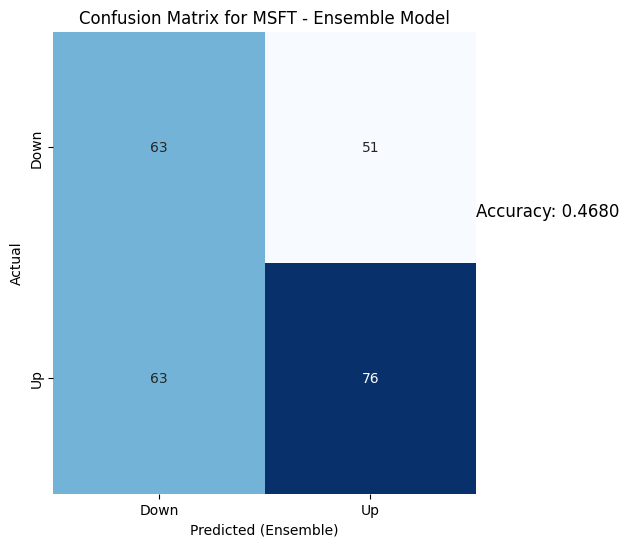

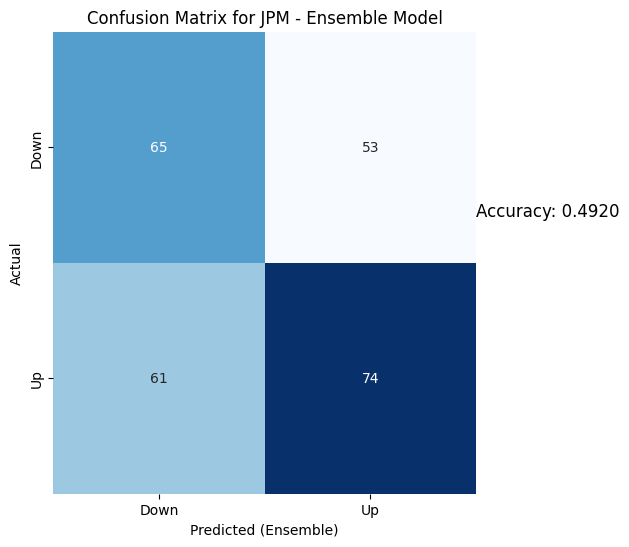

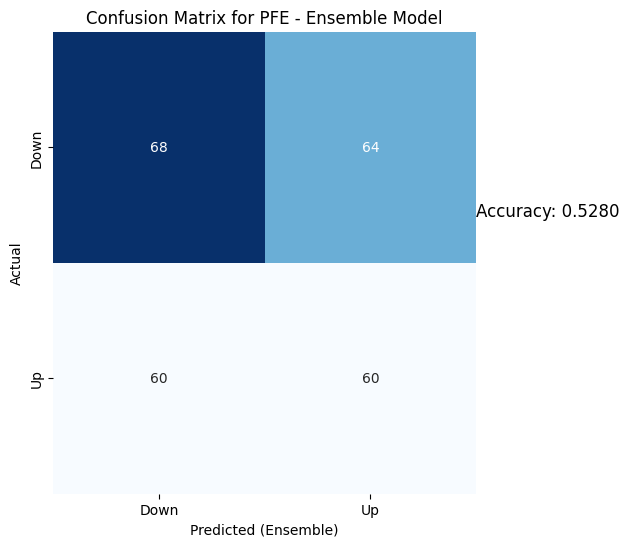

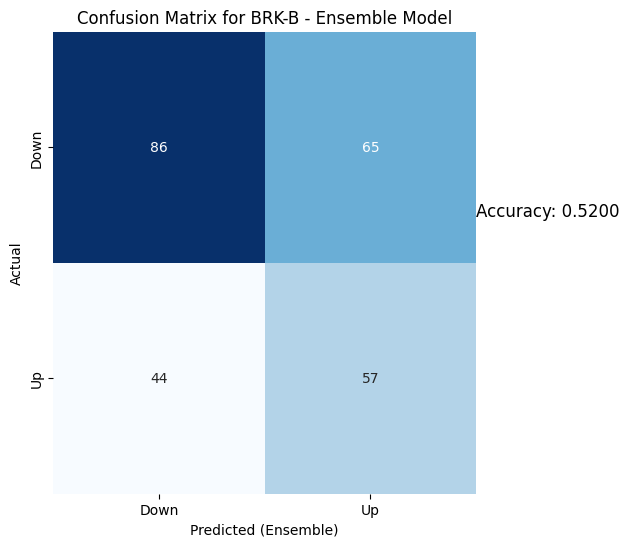

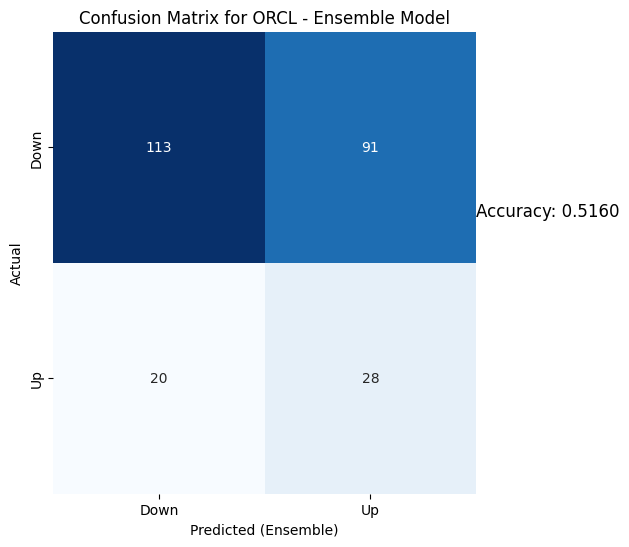

...

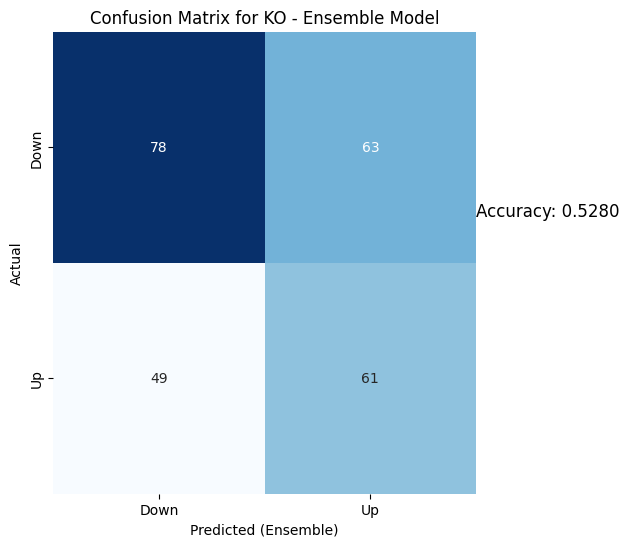

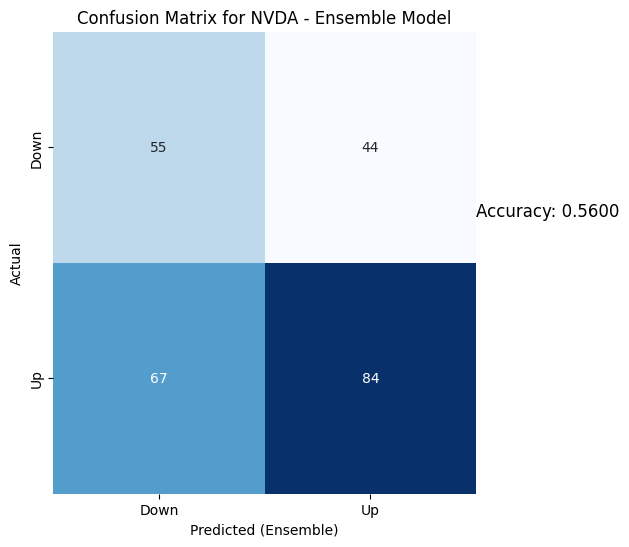

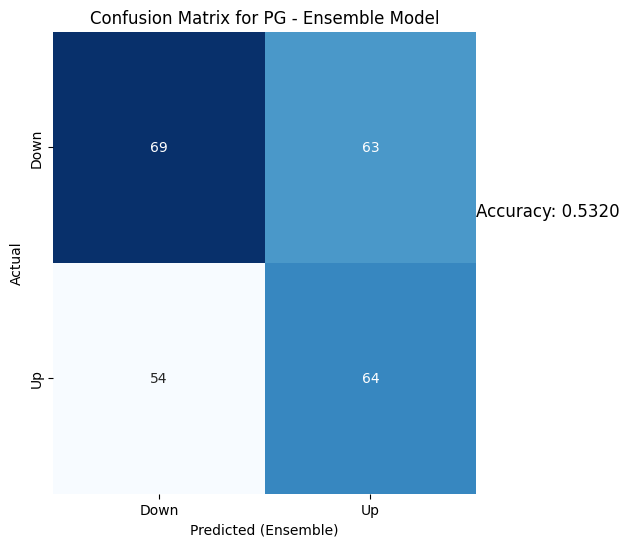

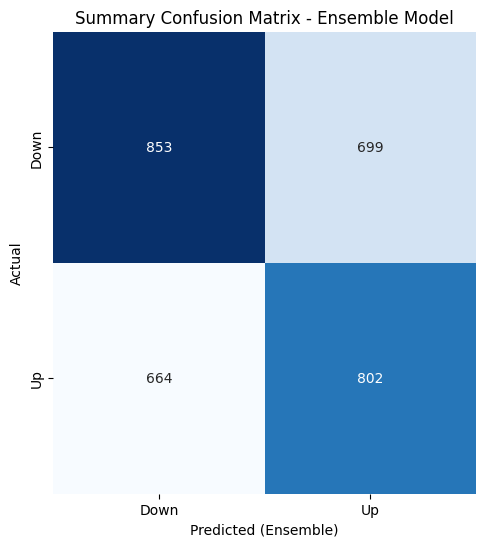

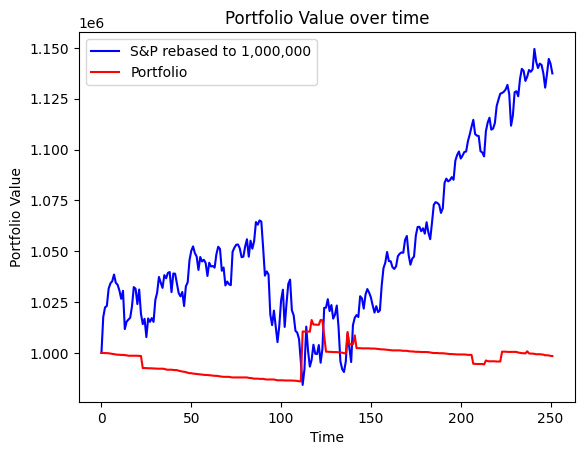

Portfolio return for our period =  99.84497506790343
S&P500 return during the period =  113.74186224993912


In [10]:
Portfolio_construct("2003-01-01")
#Testing for year 2006

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2259
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.480744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4881
LightGBM: 0.5040
GBR: 0.5317
RandomForest: 0.5437
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6923 - accuracy: 0.5292 - val_loss: 0.6974 - val_accuracy: 0.4721
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6894 - accuracy: 0.5533 - val_loss: 0.7015 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6898 - accuracy: 0.5431 - val_loss: 0.6986 - val_accuracy: 0.4721
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6882 - accuracy: 0.5508 - val_loss: 0.7056 - val_accuracy: 0.4772
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6898 - accuracy: 0.5533 - val_loss: 0.7069 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6899 - accuracy: 0.5546 - val_loss: 0.7039 - val_accuracy: 0.4822
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4960
LightGBM: 0.5278
GBR: 0.5357
RandomForest: 0.5198
XGBoost: 0.4762
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6977 - accuracy: 0.5057 - val_loss: 0.6943 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6965 - accuracy: 0.4943 - val_loss: 0.7001 - val_accuracy: 0.4924
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.4968 - val_loss: 0.6959 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6938 - accuracy: 0.4854 - val_loss: 0.6944 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6955 - accuracy: 0.4790 - val_loss: 0.7002 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5057 - val_loss: 0.6944 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5159
LightGBM: 0.5238
GBR: 0.5198
RandomForest: 0.5238
XGBoost: 0.5198
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6975 - accuracy: 0.5076 - val_loss: 0.6941 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5369 - val_loss: 0.6933 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6921 - accuracy: 0.5356 - val_loss: 0.6941 - val_accuracy: 0.4873
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6894 - accuracy: 0.5318 - val_loss: 0.6931 - val_accuracy: 0.4822
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6905 - accuracy: 0.5356 - val_loss: 0.6924 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6882 - accuracy: 0.5407 - val_loss: 0.6955 - val_accuracy: 0.4721
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5040
LightGBM: 0.5238
GBR: 0.4325
RandomForest: 0.4802
XGBoost: 0.4484
Epoch 1/10
25/25 [==============================] - 6s 51ms/step - loss: 0.6962 - accuracy: 0.5248 - val_loss: 0.6940 - val_accuracy: 0.4873
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5299 - val_loss: 0.7016 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6907 - accuracy: 0.5338 - val_loss: 0.6926 - val_accuracy: 0.4873
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6908 - accuracy: 0.5312 - val_loss: 0.6910 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6927 - accuracy: 0.5338 - val_loss: 0.6893 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6927 - accuracy: 0.5096 - val_loss: 0.6893 - val_accuracy: 0.5178
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.4781
LightGBM: 0.4821
GBR: 0.4900
RandomForest: 0.4980
XGBoost: 0.4741
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6938 - accuracy: 0.5191 - val_loss: 0.7098 - val_accuracy: 0.4569
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5242 - val_loss: 0.7060 - val_accuracy: 0.4569
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6948 - accuracy: 0.4962 - val_loss: 0.7031 - val_accuracy: 0.4569
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6921 - accuracy: 0.5217 - val_loss: 0.7004 - val_accuracy: 0.4569
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6913 - accuracy: 0.5281 - val_loss: 0.6969 - val_accuracy: 0.4569
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6931 - accuracy: 0.4923 - val_loss: 0.7037 - val_accuracy: 0.4569
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5020
LightGBM: 0.5100
GBR: 0.4542
RandomForest: 0.4701
XGBoost: 0.4940
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6927 - accuracy: 0.5281 - val_loss: 0.6850 - val_accuracy: 0.5765
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6903 - accuracy: 0.5370 - val_loss: 0.6977 - val_accuracy: 0.4490
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6872 - accuracy: 0.5459 - val_loss: 0.7066 - val_accuracy: 0.4235
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6871 - accuracy: 0.5510 - val_loss: 0.7083 - val_accuracy: 0.4235
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6875 - accuracy: 0.5510 - val_loss: 0.7033 - val_accuracy: 0.4235
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6874 - accuracy: 0.5472 - val_loss: 0.7025 - val_accuracy: 0.4592
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5299
LightGBM: 0.4940
GBR: 0.4741
RandomForest: 0.5139
XGBoost: 0.4821
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6950 - accuracy: 0.4764 - val_loss: 0.7034 - val_accuracy: 0.4541
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6923 - accuracy: 0.5147 - val_loss: 0.6976 - val_accuracy: 0.4541
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5057 - val_loss: 0.7017 - val_accuracy: 0.4541
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6933 - accuracy: 0.5045 - val_loss: 0.6946 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6917 - accuracy: 0.5287 - val_loss: 0.7051 - val_accuracy: 0.4541
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6913 - accuracy: 0.5160 - val_loss: 0.7052 - val_accuracy: 0.4541
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5139
LightGBM: 0.4900
GBR: 0.4661
RandomForest: 0.4980
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6943 - accuracy: 0.4910 - val_loss: 0.6981 - val_accuracy: 0.4643
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5128 - val_loss: 0.6967 - val_accuracy: 0.4643
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5141 - val_loss: 0.7129 - val_accuracy: 0.4643
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.5332 - val_loss: 0.6977 - val_accuracy: 0.4643
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6916 - accuracy: 0.5345 - val_loss: 0.7131 - val_accuracy: 0.4643
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6929 - accuracy: 0.5217 - val_loss: 0.6953 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 15

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5120
LightGBM: 0.5120
GBR: 0.4920
RandomForest: 0.5320
XGBoost: 0.5280
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6944 - accuracy: 0.4942 - val_loss: 0.6974 - val_accuracy: 0.4796
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6936 - accuracy: 0.5134 - val_loss: 0.6967 - val_accuracy: 0.4184
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6926 - accuracy: 0.5262 - val_loss: 0.7015 - val_accuracy: 0.4796
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6904 - accuracy: 0.5275 - val_loss: 0.7023 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6895 - accuracy: 0.5378 - val_loss: 0.7038 - val_accuracy: 0.4898
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6893 - accuracy: 0.5493 - val_loss: 0.7040 - val_accuracy: 0.4541
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4960
LightGBM: 0.4320
GBR: 0.5040
RandomForest: 0.4560
XGBoost: 0.4360
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.7004 - accuracy: 0.4654 - val_loss: 0.7034 - val_accuracy: 0.4031
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6923 - accuracy: 0.5410 - val_loss: 0.7149 - val_accuracy: 0.4031
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6912 - accuracy: 0.5103 - val_loss: 0.7143 - val_accuracy: 0.4031
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6903 - accuracy: 0.5295 - val_loss: 0.7241 - val_accuracy: 0.4031
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6893 - accuracy: 0.5538 - val_loss: 0.7335 - val_accuracy: 0.4031
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6882 - accuracy: 0.5487 - val_loss: 0.7427 - val_accuracy: 0.4031
Epoch 7/10
25/25 [==============================] - 0s 14

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5200
LightGBM: 0.5280
GBR: 0.4800
RandomForest: 0.4960
XGBoost: 0.4920
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6941 - accuracy: 0.4949 - val_loss: 0.6941 - val_accuracy: 0.4359
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6925 - accuracy: 0.5128 - val_loss: 0.6979 - val_accuracy: 0.4513
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6948 - accuracy: 0.5000 - val_loss: 0.6946 - val_accuracy: 0.4513
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6914 - accuracy: 0.5218 - val_loss: 0.6922 - val_accuracy: 0.5077
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6903 - accuracy: 0.5282 - val_loss: 0.7044 - val_accuracy: 0.4513
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6895 - accuracy: 0.5372 - val_loss: 0.6985 - val_accuracy: 0.4564
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5280
LightGBM: 0.5200
GBR: 0.5400
RandomForest: 0.4720
XGBoost: 0.4800
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6996 - accuracy: 0.4840 - val_loss: 0.7008 - val_accuracy: 0.4513
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6970 - accuracy: 0.4724 - val_loss: 0.6887 - val_accuracy: 0.5487
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6939 - accuracy: 0.4904 - val_loss: 0.6919 - val_accuracy: 0.5436
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6928 - accuracy: 0.5173 - val_loss: 0.6874 - val_accuracy: 0.5487
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5083 - val_loss: 0.6870 - val_accuracy: 0.5487
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6931 - accuracy: 0.5186 - val_loss: 0.6872 - val_accuracy: 0.6000
Epoch 7/10
25/25 [==============================] - 0s 16

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 470 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  29.989999771118164  and sold at  30.09000015258789
ORCL bought at  17.100000381469727  and sold at  17.100000381469727
AAPL bought at  3.0824999809265137  and sold at  3.0271430015563965
3.0271430015563965


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 471 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.0271430015563965  and sold at  2.960714101791382
29.979999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 472 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  29.979999542236328  and sold at  29.639999389648438
24.274999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 473 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.274999618530273  and sold at  24.344999313354492
29.979999542236328
17.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 474 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  29.979999542236328  and sold at  29.860000610351562
ORCL bought at  17.200000762939453  and sold at  17.139999389648438
92.87763214111328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 475 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  92.87763214111328  and sold at  92.99235534667969
92.99235534667969


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 476 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  92.99235534667969  and sold at  93.98661804199219
17.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 477 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  17.639999389648438  and sold at  17.860000610351562
17.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 478 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  17.81999969482422  and sold at  17.770000457763672
94.97132110595703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 479 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  94.97132110595703  and sold at  96.38623046875
53.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 480 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  53.31999969482422  and sold at  53.290000915527344
91.94072723388672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 481 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  91.94072723388672  and sold at  92.83938598632812
24.014999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 482 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.014999389648438  and sold at  24.059999465942383
52.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 483 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  52.880001068115234  and sold at  53.209999084472656
24.014999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 484 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.014999389648438  and sold at  23.93000030517578
16.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 485 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  16.709999084472656  and sold at  16.700000762939453
16.649999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 486 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  16.649999618530273  and sold at  16.6200008392334
16.90999984741211
3.0432140827178955


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 487 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  16.90999984741211  and sold at  16.700000762939453
AAPL bought at  3.0432140827178955  and sold at  3.0296430587768555
3.067857027053833
35.717491149902344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 488 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  3.067857027053833  and sold at  3.18571400642395
VZ bought at  35.717491149902344  and sold at  35.74549865722656
3.18571400642395


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 489 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.18571400642395  and sold at  3.1967859268188477
94.16825866699219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 490 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  94.16825866699219  and sold at  93.43212127685547
93.43212127685547
23.6299991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 491 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  93.43212127685547  and sold at  92.64818572998047
KO bought at  23.6299991607666  and sold at  23.860000610351562
29.06999969482422
92.64818572998047
64.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 492 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'PG']
MSFT bought at  29.06999969482422  and sold at  27.8700008392334
IBM bought at  92.64818572998047  and sold at  89.82791900634766
PG bought at  64.44000244140625  and sold at  61.25
89.82791900634766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 493 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  89.82791900634766  and sold at  88.85277557373047
3.0217859745025635
88.85277557373047
23.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 494 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'KO']
AAPL bought at  3.0217859745025635  and sold at  3.109286069869995
IBM bought at  88.85277557373047  and sold at  88.21223449707031
KO bought at  23.34000015258789  and sold at  23.260000228881836
22.94499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 495 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  22.94499969482422  and sold at  23.145000457763672
27.549999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 496 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  27.549999237060547  and sold at  27.829999923706055
89.6749496459961


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 497 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  89.6749496459961  and sold at  89.80879211425781
71.87999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 498 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  71.87999725341797  and sold at  72.66000366210938
16.690000534057617
3.142857074737549
88.9101333618164
23.575000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 499 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'IBM', 'KO']
ORCL bought at  16.690000534057617  and sold at  16.6299991607666
AAPL bought at  3.142857074737549  and sold at  3.1417860984802246
IBM bought at  88.9101333618164  and sold at  89.17781829833984
KO bought at  23.575000762939453  and sold at  23.78499984741211
17.06999969482422
23.975000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 500 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  17.06999969482422  and sold at  16.649999618530273
KO bought at  23.975000381469727  and sold at  23.530000686645508
23.530000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 501 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  23.530000686645508  and sold at  23.520000457763672
16.8799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 502 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  16.8799991607666  and sold at  16.719999313354492
91.16635131835938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 503 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  91.16635131835938  and sold at  91.00382232666016
24.075000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 504 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.075000762939453  and sold at  24.010000228881836
3.3299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 505 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.3299999237060547  and sold at  3.3482139110565186
24.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 506 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.0  and sold at  24.260000228881836
24.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 507 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.260000228881836  and sold at  24.4950008392334
3.375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 508 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.375  and sold at  3.366786003112793
24.815000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 509 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.815000534057617  and sold at  25.040000915527344
28.110000610351562
90.97514343261719


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 510 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  28.110000610351562  and sold at  28.540000915527344
IBM bought at  90.97514343261719  and sold at  91.46271514892578
91.46271514892578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 511 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  91.46271514892578  and sold at  90.75525665283203
24.940000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 512 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.940000534057617  and sold at  25.135000228881836
25.78499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 513 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  25.78499984741211  and sold at  25.829999923706055
28.600000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 514 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  28.600000381469727  and sold at  28.690000534057617
26.045000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 515 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.045000076293945  and sold at  25.825000762939453
91.02294158935547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 516 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  91.02294158935547  and sold at  94.15869903564453
3.4053568840026855
25.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 517 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  3.4053568840026855  and sold at  3.5299999713897705
KO bought at  25.8700008392334  and sold at  26.040000915527344
26.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 518 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.040000915527344  and sold at  26.030000686645508
3.552500009536743


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 519 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.552500009536743  and sold at  3.5853569507598877
3.7114291191101074
26.80500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 520 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  3.7114291191101074  and sold at  3.752142906188965
KO bought at  26.80500030517578  and sold at  26.53499984741211
3.999285936355591


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 521 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.999285936355591  and sold at  4.054999828338623
25.6200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 522 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  25.6200008392334  and sold at  25.94499969482422
30.790000915527344
101.25238800048828
26.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 523 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'KO']
MSFT bought at  30.790000915527344  and sold at  31.110000610351562
IBM bought at  101.25238800048828  and sold at  102.22753143310547
KO bought at  26.09000015258789  and sold at  26.524999618530273
101.91204833984375
26.4950008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 524 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  101.91204833984375  and sold at  101.85468292236328
KO bought at  26.4950008392334  and sold at  26.399999618530273
26.399999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 525 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.399999618530273  and sold at  26.334999084472656
26.334999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 526 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.334999084472656  and sold at  26.15999984741211
26.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 527 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.0  and sold at  25.690000534057617
97.32313537597656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 528 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  97.32313537597656  and sold at  98.53728485107422
4.299285888671875
62.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 529 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  4.299285888671875  and sold at  4.1964287757873535
PG bought at  62.15999984741211  and sold at  62.369998931884766
19.639999389648438
62.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 530 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  19.639999389648438  and sold at  19.860000610351562
PG bought at  62.41999816894531  and sold at  62.56999969482422
19.860000610351562
100.46845245361328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 531 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  19.860000610351562  and sold at  19.790000915527344
IBM bought at  100.46845245361328  and sold at  100.6978988647461
19.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 532 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  19.790000915527344  and sold at  19.8799991607666
4.341071128845215
25.7450008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 533 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  4.341071128845215  and sold at  4.425000190734863
KO bought at  25.7450008392334  and sold at  26.045000076293945
101.91204833984375
26.045000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 534 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  101.91204833984375  and sold at  99.84703826904297
KO bought at  26.045000076293945  and sold at  25.809999465942383
71.05999755859375
4.369286060333252


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 535 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  71.05999755859375  and sold at  70.80999755859375
AAPL bought at  4.369286060333252  and sold at  4.273213863372803
25.975000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 536 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  25.975000381469727  and sold at  26.219999313354492
100.79350280761719


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 537 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  100.79350280761719  and sold at  101.29063415527344
29.829999923706055
4.305714130401611


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 538 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  29.829999923706055  and sold at  29.469999313354492
AAPL bought at  4.305714130401611  and sold at  4.3585710525512695
26.155000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 539 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.155000686645508  and sold at  26.280000686645508
30.020000457763672
26.450000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 540 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  30.020000457763672  and sold at  29.989999771118164
KO bought at  26.450000762939453  and sold at  26.334999084472656
26.334999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 541 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.334999084472656  and sold at  26.299999237060547
104.23518371582031


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 542 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  104.23518371582031  and sold at  104.17781829833984
104.17781829833984
26.350000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 543 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  104.17781829833984  and sold at  103.85277557373047
KO bought at  26.350000381469727  and sold at  26.049999237060547
19.719999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 544 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  19.719999313354492  and sold at  19.979999542236328
61.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 545 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.560001373291016  and sold at  62.93000030517578
26.315000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 546 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.315000534057617  and sold at  26.55500030517578
73.55000305175781
103.82408905029297
26.55500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 547 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'KO']
BRK-B bought at  73.55000305175781  and sold at  73.08000183105469
IBM bought at  103.82408905029297  and sold at  104.83747863769531
KO bought at  26.55500030517578  and sold at  26.924999237060547
26.584999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 548 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.584999084472656  and sold at  26.71500015258789
30.920000076293945
7.608333110809326


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 549 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  30.920000076293945  and sold at  31.510000228881836
NVDA bought at  7.608333110809326  and sold at  7.599999904632568
5.0
26.850000381469727
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  5.0  and sold at  5.1339287757873535
KO bought at  26.850000381469727  and sold at  26.604999542236328
20.610000610351562
26.604999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 550 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  20.610000610351562  and sold at  20.780000686645508
KO bought at  26.604999542236328  and sold at  26.81999969482422
26.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 551 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.81999969482422  and sold at  26.610000610351562
27.024999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 552 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.024999618530273  and sold at  26.489999771118164
111.40535736083984
26.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 553 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  111.40535736083984  and sold at  110.53536987304688
KO bought at  26.489999771118164  and sold at  26.139999389648438
26.139999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 554 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.139999389648438  and sold at  26.19499969482422
109.48374938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 555 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  109.48374938964844  and sold at  105.783935546875
26.05500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 556 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.05500030517578  and sold at  26.635000228881836
4.8214287757873535
107.11280822753906
26.635000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 557 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'KO']
AAPL bought at  4.8214287757873535  and sold at  4.874642848968506
IBM bought at  107.11280822753906  and sold at  108.25048065185547
KO bought at  26.635000228881836  and sold at  26.829999923706055
4.874642848968506
26.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 558 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  4.874642848968506  and sold at  4.708929061889648
KO bought at  26.829999923706055  and sold at  26.639999389648438
71.9800033569336
26.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 559 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  71.9800033569336  and sold at  73.4000015258789
KO bought at  26.639999389648438  and sold at  27.114999771118164
72.86000061035156
27.924999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 560 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  72.86000061035156  and sold at  72.5
KO bought at  27.924999237060547  and sold at  27.489999771118164
107.6864242553711
38.58348083496094
27.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 561 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'KO']
IBM bought at  107.6864242553711  and sold at  107.75334930419922
VZ bought at  38.58348083496094  and sold at  38.8822135925293
KO bought at  27.489999771118164  and sold at  27.260000228881836
107.75334930419922
27.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 562 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  107.75334930419922  and sold at  107.12236785888672
KO bought at  27.260000228881836  and sold at  27.06999969482422
72.56999969482422
27.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 563 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  72.56999969482422  and sold at  73.0999984741211
KO bought at  27.06999969482422  and sold at  26.915000915527344
26.915000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 564 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.915000915527344  and sold at  26.790000915527344
75.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 565 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  75.83000183105469  and sold at  78.95999908447266
27.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 566 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.260000228881836  and sold at  27.014999389648438
27.014999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 567 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.014999389648438  and sold at  26.975000381469727
27.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 568 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.0  and sold at  27.0049991607666
26.700000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 569 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.700000762939453  and sold at  26.889999389648438
27.184999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 570 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.184999465942383  and sold at  26.844999313354492
26.844999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 571 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.844999313354492  and sold at  27.329999923706055
27.329999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 572 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.329999923706055  and sold at  27.295000076293945
20.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 573 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  20.15999984741211  and sold at  20.170000076293945
78.86000061035156
20.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 574 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  78.86000061035156  and sold at  78.97000122070312
ORCL bought at  20.170000076293945  and sold at  20.459999084472656
78.97000122070312
27.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 575 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  78.97000122070312  and sold at  79.13999938964844
KO bought at  27.920000076293945  and sold at  27.934999465942383
79.91999816894531
28.200000762939453
67.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 576 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  79.91999816894531  and sold at  78.94999694824219
KO bought at  28.200000762939453  and sold at  27.639999389648438
PG bought at  67.80999755859375  and sold at  67.94999694824219
27.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 577 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.639999389648438  and sold at  28.204999923706055
28.204999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 578 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.204999923706055  and sold at  28.309999465942383
28.309999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 579 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.309999465942383  and sold at  28.155000686645508
28.155000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 580 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.155000686645508  and sold at  28.274999618530273
28.510000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 581 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.510000228881836  and sold at  28.674999237060547
28.665000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 582 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.665000915527344  and sold at  28.735000610351562
28.735000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 583 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.735000610351562  and sold at  28.950000762939453
29.770000457763672
79.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 584 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  29.770000457763672  and sold at  29.700000762939453
BRK-B bought at  79.18000030517578  and sold at  79.93000030517578
79.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 585 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  79.93000030517578  and sold at  79.63999938964844
79.4000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 586 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  79.4000015258789  and sold at  80.58000183105469
28.899999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 587 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.899999618530273  and sold at  28.940000534057617
30.100000381469727
22.579999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 588 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  30.100000381469727  and sold at  30.229999542236328
ORCL bought at  22.579999923706055  and sold at  22.920000076293945
28.934999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 589 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.934999465942383  and sold at  28.594999313354492
28.594999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 590 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.594999313354492  and sold at  28.899999618530273
22.440000534057617
28.899999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 591 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  22.440000534057617  and sold at  22.06999969482422
KO bought at  28.899999618530273  and sold at  28.81999969482422
30.040000915527344
22.06999969482422
28.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 592 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'KO']
MSFT bought at  30.040000915527344  and sold at  30.31999969482422
ORCL bought at  22.06999969482422  and sold at  21.75
KO bought at  28.81999969482422  and sold at  28.8799991607666
28.8799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 593 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.8799991607666  and sold at  29.545000076293945
84.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 594 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  84.94000244140625  and sold at  85.05000305175781
35.029998779296875
84.66000366210938
21.350000381469727
30.78499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 595 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'KO']
MSFT bought at  35.029998779296875  and sold at  34.56999969482422
BRK-B bought at  84.66000366210938  and sold at  85.45999908447266
ORCL bought at  21.350000381469727  and sold at  21.770000457763672
KO bought at  30.78499984741211  and sold at  30.920000076293945
85.45999908447266
30.920000076293945
71.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 596 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  85.45999908447266  and sold at  85.80000305175781
KO bought at  30.920000076293945  and sold at  30.864999771118164
PG bought at  71.83000183105469  and sold at  68.94999694824219
85.80000305175781
21.6299991607666
30.864999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 597 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'KO']
BRK-B bought at  85.80000305175781  and sold at  88.27999877929688
ORCL bought at  21.6299991607666  and sold at  22.170000076293945
KO bought at  30.864999771118164  and sold at  30.8799991607666
88.27999877929688
22.170000076293945
111.01338195800781
30.8799991607666
69.5199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 598 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'IBM', 'KO', 'PG']
BRK-B bought at  88.27999877929688  and sold at  87.54000091552734
ORCL bought at  22.170000076293945  and sold at  21.760000228881836
IBM bought at  111.01338195800781  and sold at  108.65200805664062
KO bought at  30.8799991607666  and sold at  30.450000762939453
PG bought at  69.5199966430664  and sold at  68.58999633789062
87.54000091552734
21.760000228881836
41.76687240600586


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 599 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'VZ']
BRK-B bought at  87.54000091552734  and sold at  88.04000091552734
ORCL bought at  21.760000228881836  and sold at  22.030000686645508
VZ bought at  41.76687240600586  and sold at  41.4307975769043
37.060001373291016
22.030000686645508
41.4307975769043
30.2549991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 600 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ', 'KO']
MSFT bought at  37.060001373291016  and sold at  36.72999954223633
ORCL bought at  22.030000686645508  and sold at  22.06999969482422
VZ bought at  41.4307975769043  and sold at  40.90801239013672
KO bought at  30.2549991607666  and sold at  30.170000076293945
22.06999969482422
30.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 601 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  22.06999969482422  and sold at  22.829999923706055
KO bought at  30.170000076293945  and sold at  30.5049991607666
22.829999923706055
6.849643230438232
108.193115234375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 602 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'IBM']
ORCL bought at  22.829999923706055  and sold at  22.100000381469727
AAPL bought at  6.849643230438232  and sold at  6.653571128845215
IBM bought at  108.193115234375  and sold at  106.19503021240234
22.100000381469727
106.19503021240234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 603 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  22.100000381469727  and sold at  20.350000381469727
IBM bought at  106.19503021240234  and sold at  101.44359588623047
101.44359588623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 604 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  101.44359588623047  and sold at  95.84130096435547
19.360000610351562
95.84130096435547
39.92778778076172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 605 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ']
ORCL bought at  19.360000610351562  and sold at  19.440000534057617
IBM bought at  95.84130096435547  and sold at  96.988525390625
VZ bought at  39.92778778076172  and sold at  39.95579147338867
96.988525390625
29.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 606 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  96.988525390625  and sold at  100.64053344726562
KO bought at  29.93000030517578  and sold at  30.520000457763672
30.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 607 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  30.68000030517578  and sold at  30.975000381469727
30.975000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 608 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  30.975000381469727  and sold at  31.309999465942383
34.09000015258789
40.786651611328125
31.309999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 609 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO']
MSFT bought at  34.09000015258789  and sold at  33.959999084472656
VZ bought at  40.786651611328125  and sold at  40.189178466796875
KO bought at  31.309999465942383  and sold at  31.149999618530273
91.30000305175781
20.530000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 610 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  91.30000305175781  and sold at  91.02999877929688
ORCL bought at  20.530000686645508  and sold at  20.690000534057617
31.395000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 611 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.395000457763672  and sold at  31.125
20.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 612 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  20.209999084472656  and sold at  20.309999465942383
89.5
20.309999465942383
31.149999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 613 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'KO']
BRK-B bought at  89.5  and sold at  91.26000213623047
ORCL bought at  20.309999465942383  and sold at  19.700000762939453
KO bought at  31.149999618530273  and sold at  30.864999771118164
30.864999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 614 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  30.864999771118164  and sold at  31.489999771118164
31.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 615 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.489999771118164  and sold at  31.4950008392334
91.5
31.4950008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 616 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  91.5  and sold at  92.76000213623047
KO bought at  31.4950008392334  and sold at  31.395000457763672
20.479999542236328
31.395000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 617 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  20.479999542236328  and sold at  20.18000030517578
KO bought at  31.395000457763672  and sold at  31.049999237060547
20.18000030517578
40.33854675292969
31.049999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 618 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'KO']
ORCL bought at  20.18000030517578  and sold at  20.239999771118164
VZ bought at  40.33854675292969  and sold at  40.22652053833008
KO bought at  31.049999237060547  and sold at  31.100000381469727
31.100000381469727
8.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 619 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  31.100000381469727  and sold at  31.375
NVDA bought at  8.0  and sold at  7.992499828338623
31.375
[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.375  and sold at  31.524999618530273
41.561492919921875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 620 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  41.561492919921875  and sold at  41.4681396484375
99.0199966430664
21.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 621 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  99.0199966430664  and sold at  99.0
ORCL bought at  21.420000076293945  and sold at  21.139999389648438
99.0
21.139999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 622 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  99.0  and sold at  99.69999694824219
ORCL bought at  21.139999389648438  and sold at  21.639999389648438
99.69999694824219
21.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 623 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  99.69999694824219  and sold at  98.44000244140625
ORCL bought at  21.639999389648438  and sold at  21.06999969482422
[1000000.0, 995851.1246127229, 994093.1611207232, 996202.738770638, 988256.7094515753, 992827.4789093201, 991983.6907683847, 995288.5634195737, 999648.3858420848, 1007242.8010032324, 1005273.8904759987, 1005695.7845464664, 1002320.4173875721, 1004289.4352123821, 1001195.4022988505, 1004148.7680897007, 1012235.3572338684, 1000351.5068603388, 999437.4388068509, 998874.8776137019, 1004078.3808795719, 1010829.0078997841, 1016876.4066041658, 1018282.7559382503, 1018564.090183613, 1018845.3171313994, 1021095.5619039955, 1019759.4924824636, 1012165.077321316, 1008719.4302498692, 1017228.0207620809, 1023908.2605721643, 1025244.3299936962, 1024752.0487130997, 1026931.906275567, 1026510.0122050995, 1025736.5039

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 624 times so far.

  warnings.warn(msg, UserWarning)


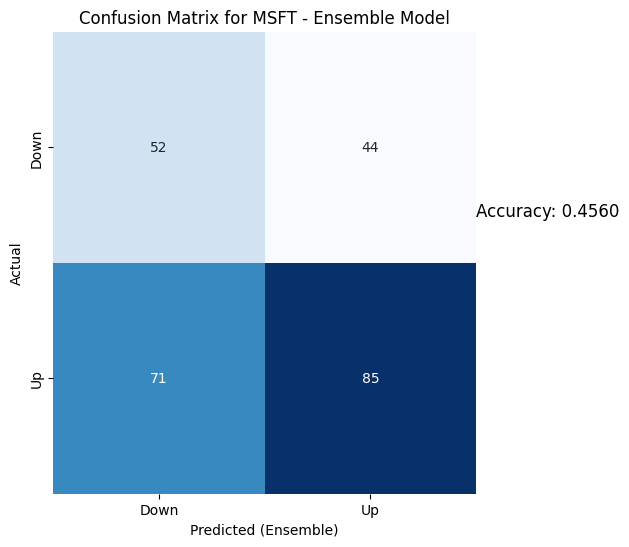

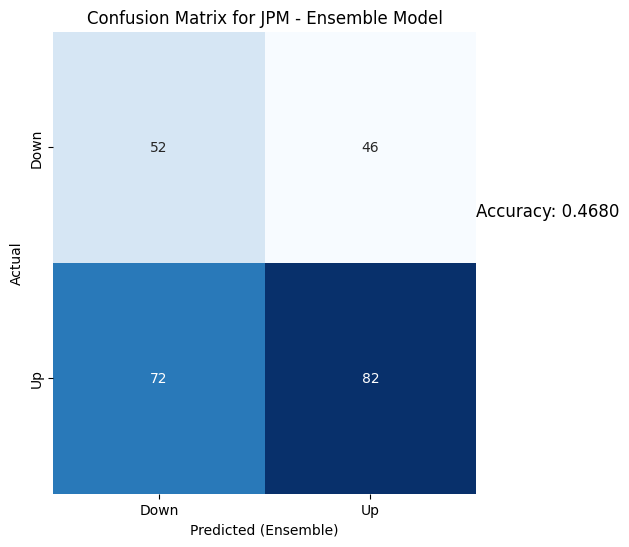

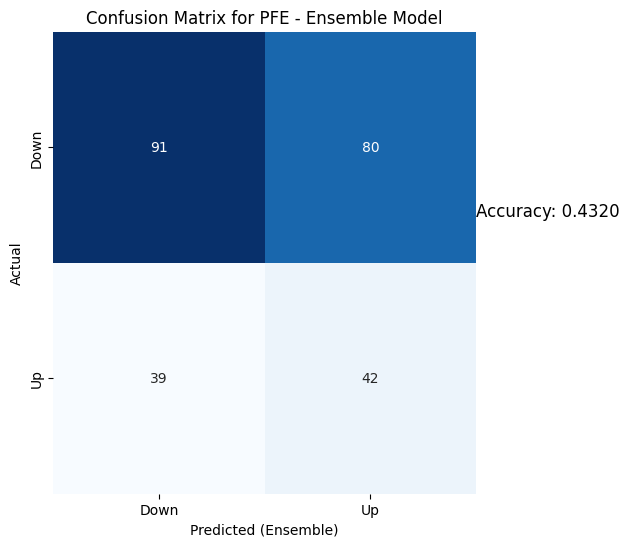

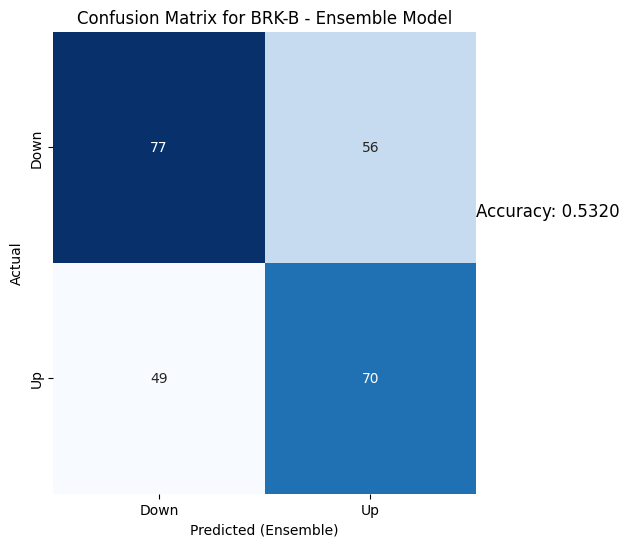

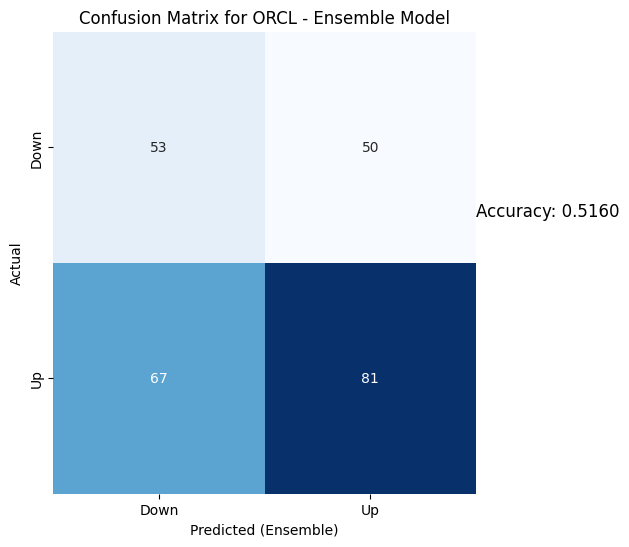

...

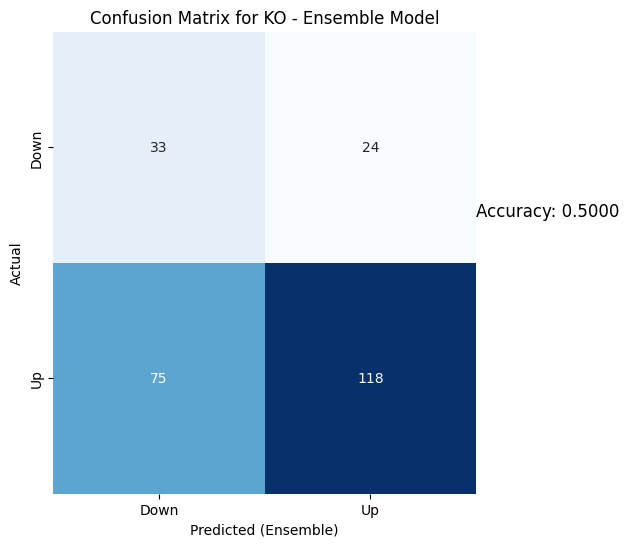

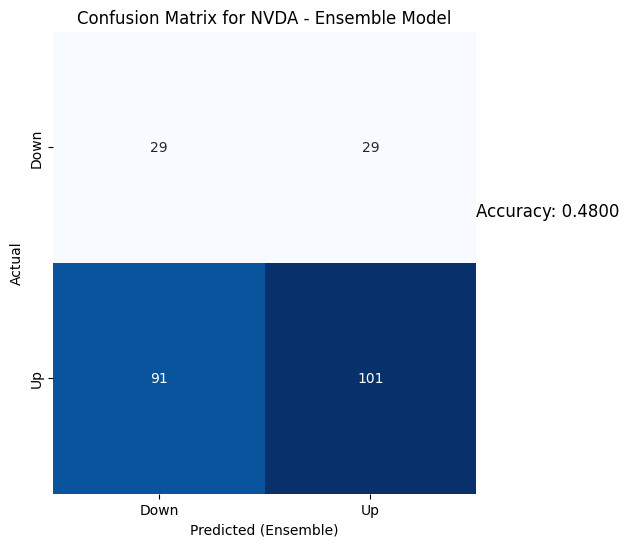

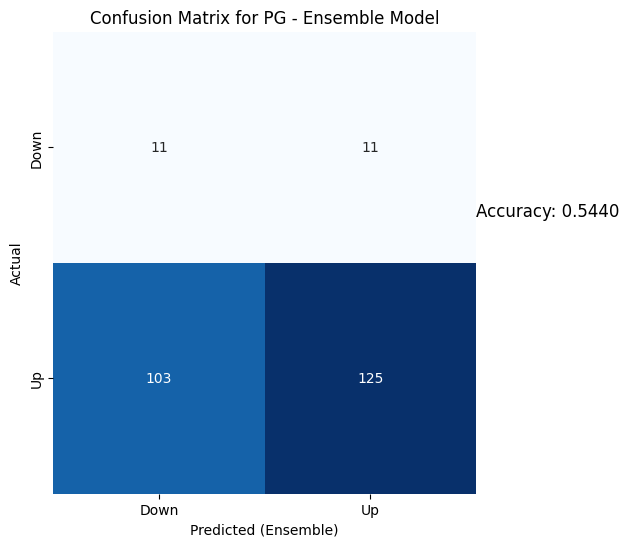

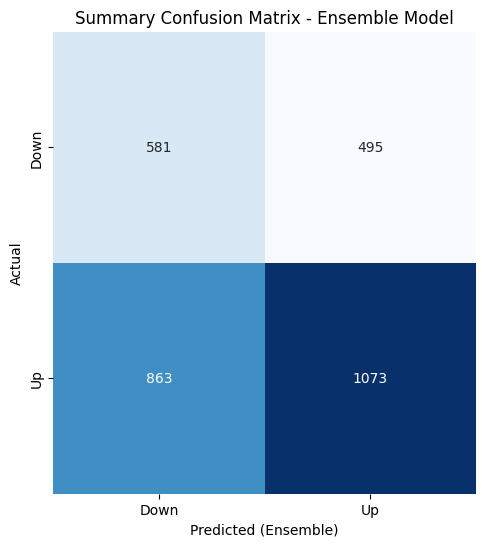

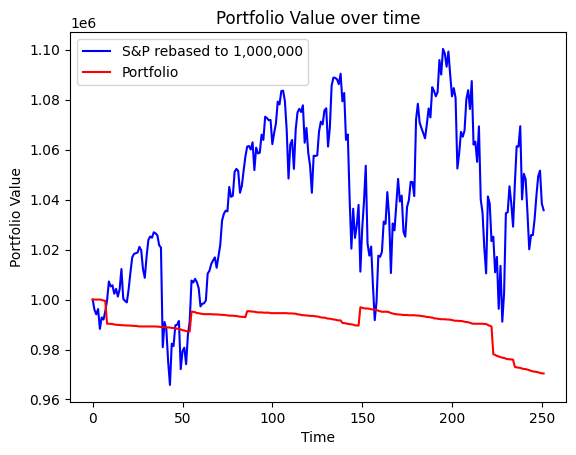

Portfolio return for our period =  97.0445617168211
S&P500 return during the period =  103.5792110945694


In [11]:
Portfolio_construct("2004-01-01")
#Testing for year 2007

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed
Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
Accuracies for MSFT:
Accuracies for MSFT:
SVR: 0.5257
LightGBM: 0.4111
GBR: 0.4348
RandomForest: 0.4269
XGBoost: 0.4387


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 28ms/step - loss: 0.6967 - accuracy: 0.5025 - val_loss: 0.6841 - val_accuracy: 0.5758
Epoch 2/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6915 - accuracy: 0.5279 - val_loss: 0.6918 - val_accuracy: 0.5404
Epoch 3/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6899 - accuracy: 0.5609 - val_loss: 0.6895 - val_accuracy: 0.5354
Epoch 4/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6925 - accuracy: 0.5140 - val_loss: 0.6998 - val_accuracy: 0.4242
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6899 - accuracy: 0.5317 - val_loss: 0.6916 - val_accuracy: 0.5354
Epoch 6/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6893 - accuracy: 0.5508 - val_loss: 0.6948 - val_accuracy: 0.5253
Epoch 7/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6885 - accuracy: 0.5393 - val_loss: 0.7009 - val_accuracy: 0.4848
Epoch 8/10
25/2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for JPM:
Accuracies for JPM:
Accuracies for JPM:
SVR: 0.5159
LightGBM: 0.4960
GBR: 0.4960
RandomForest: 0.4881
XGBoost: 0.5198


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 22ms/step - loss: 0.6955 - accuracy: 0.4975 - val_loss: 0.6916 - val_accuracy: 0.5431
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6938 - accuracy: 0.4797 - val_loss: 0.6870 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6947 - accuracy: 0.4784 - val_loss: 0.6881 - val_accuracy: 0.5533
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6972 - accuracy: 0.5140 - val_loss: 0.6901 - val_accuracy: 0.5482
Epoch 5/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6950 - accuracy: 0.5013 - val_loss: 0.6889 - val_accuracy: 0.5482
Epoch 6/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6948 - accuracy: 0.5025 - val_loss: 0.6870 - val_accuracy: 0.5635
Epoch 7/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6925 - accuracy: 0.5190 - val_loss: 0.6880 - val_accuracy: 0.5431
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for PFE:
Accuracies for PFE:
Accuracies for PFE:
SVR: 0.5476
LightGBM: 0.4722
GBR: 0.4722
RandomForest: 0.4246
XGBoost: 0.4762


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6899 - accuracy: 0.5299 - val_loss: 0.6917 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.4943 - val_loss: 0.6925 - val_accuracy: 0.5381
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6909 - accuracy: 0.5222 - val_loss: 0.6936 - val_accuracy: 0.4822
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6895 - accuracy: 0.5324 - val_loss: 0.6913 - val_accuracy: 0.5381
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6911 - accuracy: 0.5222 - val_loss: 0.6924 - val_accuracy: 0.5178
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6891 - accuracy: 0.5426 - val_loss: 0.6919 - val_accuracy: 0.5279
Epoch 7/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6879 - accuracy: 0.5311 - val_loss: 0.6926 - val_accuracy: 0.5178
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5079
LightGBM: 0.4683
GBR: 0.4524
RandomForest: 0.4325
XGBoost: 0.4563
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6978 - accuracy: 0.5051 - val_loss: 0.7033 - val_accuracy: 0.4264
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6948 - accuracy: 0.4924 - val_loss: 0.6923 - val_accuracy: 0.5381
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6932 - accuracy: 0.5280 - val_loss: 0.6929 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6904 - accuracy: 0.5331 - val_loss: 0.6978 - val_accuracy: 0.4467
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6904 - accuracy: 0.5305 - val_loss: 0.6992 - val_accuracy: 0.4619
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6896 - accuracy: 0.5280 - val_loss: 0.6992 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5119
LightGBM: 0.5278
GBR: 0.5079
RandomForest: 0.5397
XGBoost: 0.5437
Epoch 1/10
25/25 [==============================] - 6s 59ms/step - loss: 0.6939 - accuracy: 0.5261 - val_loss: 0.7300 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6971 - accuracy: 0.5045 - val_loss: 0.6939 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6933 - accuracy: 0.5159 - val_loss: 0.6938 - val_accuracy: 0.4721
Epoch 4/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6930 - accuracy: 0.5083 - val_loss: 0.6945 - val_accuracy: 0.4975
Epoch 5/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6939 - accuracy: 0.5134 - val_loss: 0.6924 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6915 - accuracy: 0.5325 - val_loss: 0.6980 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 7ms/

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for AAPL:
Accuracies for AAPL:
Accuracies for AAPL:
SVR: 0.4821
LightGBM: 0.5100
GBR: 0.5139
RandomForest: 0.4980
XGBoost: 0.4900


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 22ms/step - loss: 0.6965 - accuracy: 0.5064 - val_loss: 0.6914 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6914 - accuracy: 0.5306 - val_loss: 0.6934 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6932 - accuracy: 0.5153 - val_loss: 0.6886 - val_accuracy: 0.5584
Epoch 4/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6902 - accuracy: 0.5408 - val_loss: 0.6937 - val_accuracy: 0.4822
Epoch 5/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6907 - accuracy: 0.5255 - val_loss: 0.6897 - val_accuracy: 0.5279
Epoch 6/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6894 - accuracy: 0.5332 - val_loss: 0.6964 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6930 - accuracy: 0.5242 - val_loss: 0.6901 - val_accuracy: 0.5279
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for IBM:
Accuracies for IBM:
Accuracies for IBM:
SVR: 0.5339
LightGBM: 0.5020
GBR: 0.5418
RandomForest: 0.5100
XGBoost: 0.4980


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 34ms/step - loss: 0.6947 - accuracy: 0.5000 - val_loss: 0.6968 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5051 - val_loss: 0.6971 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6942 - accuracy: 0.5013 - val_loss: 0.6984 - val_accuracy: 0.4796
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6940 - accuracy: 0.4796 - val_loss: 0.7019 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6929 - accuracy: 0.5140 - val_loss: 0.6994 - val_accuracy: 0.4796
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6930 - accuracy: 0.5255 - val_loss: 0.7035 - val_accuracy: 0.4796
Epoch 7/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6920 - accuracy: 0.5319 - val_loss: 0.6977 - val_accuracy: 0.4796
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4701
LightGBM: 0.4781
GBR: 0.4701
RandomForest: 0.4701
XGBoost: 0.4900
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6959 - accuracy: 0.4879 - val_loss: 0.6940 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6944 - accuracy: 0.4853 - val_loss: 0.6911 - val_accuracy: 0.5459
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6954 - accuracy: 0.4751 - val_loss: 0.6932 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6971 - accuracy: 0.4738 - val_loss: 0.6939 - val_accuracy: 0.4694
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6948 - accuracy: 0.4968 - val_loss: 0.6923 - val_accuracy: 0.5204
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6937 - accuracy: 0.5006 - val_loss: 0.6953 - val_accuracy: 0.4694
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5578
LightGBM: 0.5578
GBR: 0.4422
RandomForest: 0.4343
XGBoost: 0.4542
Epoch 1/10
25/25 [==============================] - 7s 54ms/step - loss: 0.6958 - accuracy: 0.4578 - val_loss: 0.6916 - val_accuracy: 0.5408
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5102 - val_loss: 0.6943 - val_accuracy: 0.5510
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6956 - accuracy: 0.4936 - val_loss: 0.6874 - val_accuracy: 0.5612
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.5051 - val_loss: 0.6925 - val_accuracy: 0.5612
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6931 - accuracy: 0.5128 - val_loss: 0.6838 - val_accuracy: 0.5612
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6922 - accuracy: 0.5128 - val_loss: 0.6898 - val_accuracy: 0.5459
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5120
LightGBM: 0.4920
GBR: 0.5000
RandomForest: 0.4960
XGBoost: 0.4720
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6963 - accuracy: 0.5032 - val_loss: 0.6923 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.5058 - val_loss: 0.7063 - val_accuracy: 0.4694
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6931 - accuracy: 0.5109 - val_loss: 0.7003 - val_accuracy: 0.4694
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6922 - accuracy: 0.5134 - val_loss: 0.7020 - val_accuracy: 0.4694
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6926 - accuracy: 0.5275 - val_loss: 0.7042 - val_accuracy: 0.4694
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6925 - accuracy: 0.5096 - val_loss: 0.7045 - val_accuracy: 0.4694
Epoch 7/10
25/25 [==============================] - 0s 16

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.4720
LightGBM: 0.4640
GBR: 0.4680
RandomForest: 0.4840
XGBoost: 0.4560
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6981 - accuracy: 0.4962 - val_loss: 0.6930 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6959 - accuracy: 0.4962 - val_loss: 0.6945 - val_accuracy: 0.4949
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6947 - accuracy: 0.5064 - val_loss: 0.6932 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6930 - accuracy: 0.5064 - val_loss: 0.6922 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6922 - accuracy: 0.5295 - val_loss: 0.6932 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5192 - val_loss: 0.6964 - val_accuracy: 0.5153
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4680
LightGBM: 0.4560
GBR: 0.4640
RandomForest: 0.4800
XGBoost: 0.4760
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6947 - accuracy: 0.5167 - val_loss: 0.6925 - val_accuracy: 0.5385
Epoch 2/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6943 - accuracy: 0.4987 - val_loss: 0.6924 - val_accuracy: 0.5538
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6946 - accuracy: 0.5051 - val_loss: 0.6909 - val_accuracy: 0.5538
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6926 - accuracy: 0.4987 - val_loss: 0.6935 - val_accuracy: 0.4615
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6946 - accuracy: 0.5026 - val_loss: 0.6894 - val_accuracy: 0.5436
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6971 - accuracy: 0.5077 - val_loss: 0.6955 - val_accuracy: 0.4667
Epoch 7/10
25/25 [==============================] - 0s 16

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 625 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  22.17267608642578  and sold at  22.07779884338379
ORCL bought at  21.25  and sold at  20.760000228881836
6.430356979370117


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 626 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.430356979370117  and sold at  6.34428596496582
6.3578572273254395


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 627 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.3578572273254395  and sold at  6.167500019073486
6.385000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 628 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.385000228881836  and sold at  6.037143230438232
6.037143230438232


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 629 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.037143230438232  and sold at  5.7014288902282715
5.7014288902282715


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 630 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  5.7014288902282715  and sold at  5.746070861816406
5.762856960296631


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 631 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  5.762856960296631  and sold at  5.558570861816406
96.76863861083984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 632 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  96.76863861083984  and sold at  101.43403625488281
29.204999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 633 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.204999923706055  and sold at  29.704999923706055
91.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 634 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  91.0  and sold at  90.45999908447266
29.315000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 635 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.315000534057617  and sold at  28.700000762939453
28.700000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 636 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.700000762939453  and sold at  28.854999542236328
4.552143096923828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 637 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  4.552143096923828  and sold at  4.451070785522461
29.1299991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 638 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.1299991607666  and sold at  29.385000228881836
29.684999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 639 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.684999465942383  and sold at  29.84000015258789
29.424999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 640 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.424999237060547  and sold at  29.329999923706055
29.594999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 641 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.594999313354492  and sold at  29.46500015258789
28.764999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 642 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.764999389648438  and sold at  28.844999313354492
29.665000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 643 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.665000915527344  and sold at  29.489999771118164
6.667500019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 644 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.667500019073486  and sold at  6.7410712242126465
26.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 645 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.68000030517578  and sold at  26.829999923706055
26.030000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 646 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.030000686645508  and sold at  25.575000762939453
4.788928985595703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 647 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  4.788928985595703  and sold at  5.03249979019165
19.950000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 648 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  19.950000762939453  and sold at  20.469999313354492
1.847499966621399


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 649 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.847499966621399  and sold at  1.7300000190734863
1.9500000476837158


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 650 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9500000476837158  and sold at  1.7999999523162842
1.7999999523162842


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 651 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.7999999523162842  and sold at  1.7324999570846558
1.7324999570846558


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 652 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.7324999570846558  and sold at  1.6349999904632568
1.6349999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 653 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.6349999904632568  and sold at  1.652500033378601
16.200000762939453
78.46080017089844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 654 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  16.200000762939453  and sold at  15.770000457763672
IBM bought at  78.46080017089844  and sold at  76.15679168701172
18.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 655 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  18.31999969482422  and sold at  18.290000915527344
17.100000381469727
1.9850000143051147


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 656 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  17.100000381469727  and sold at  16.420000076293945
NVDA bought at  1.9850000143051147  and sold at  1.7925000190734863
16.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 657 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.420000076293945  and sold at  15.029999732971191
1.6974999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 658 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.6974999904632568  and sold at  1.5575000047683716
1.5950000286102295


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 659 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.5950000286102295  and sold at  1.7000000476837158
1.902500033378601


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 660 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.902500033378601  and sold at  1.8674999475479126
15.470000267028809


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 661 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  15.470000267028809  and sold at  15.789999961853027
15.721062660217285
17.389999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 662 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  15.721062660217285  and sold at  15.71157455444336
ORCL bought at  17.389999389648438  and sold at  16.459999084472656
[1000000.0, 999517.0629340591, 975022.4570473436, 974194.5047720963, 958462.7798392358, 968536.5501342791, 974884.429906849, 967018.5674404188, 974815.4689785318, 953356.8284795368, 945145.9508038001, 920651.3449170848, 911198.538828477, 901952.7208086812, 923618.3493764879, 931415.2509146009, 917960.3947386708, 933140.2216772729, 937763.1306871709, 930863.2476364827, 947836.9009822141, 963085.6888491337, 950941.9325821119, 925481.3472796546, 918029.4609508481, 924101.2864424288, 918167.4880913426, 922859.3580295577, 931415.2509146009, 940937.017931526, 932657.179327472, 932450.1912586602, 935072.1805087569, 937832.0916154882, 930035.1900773753, 935762.1056435097, 947560.951985085, 954667.8231045852, 95

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 663 times so far.

  warnings.warn(msg, UserWarning)


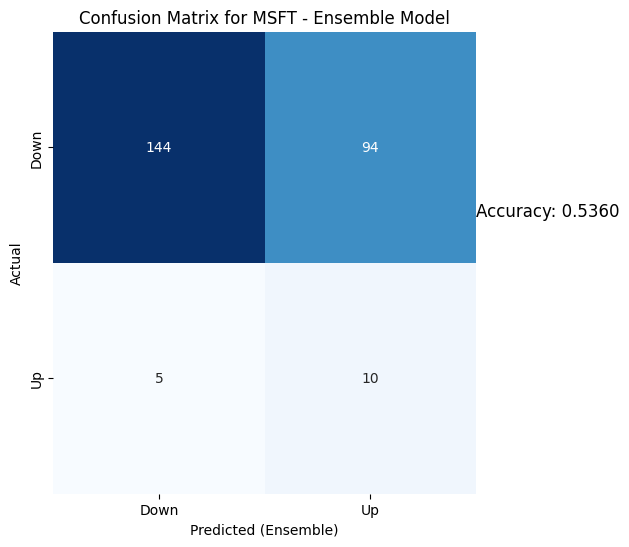

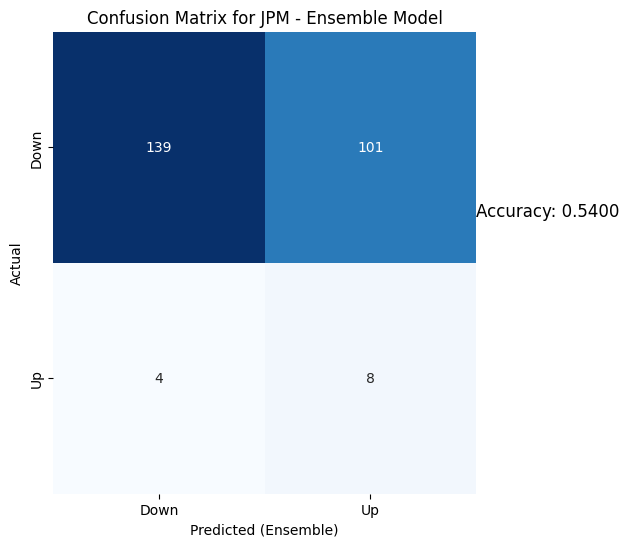

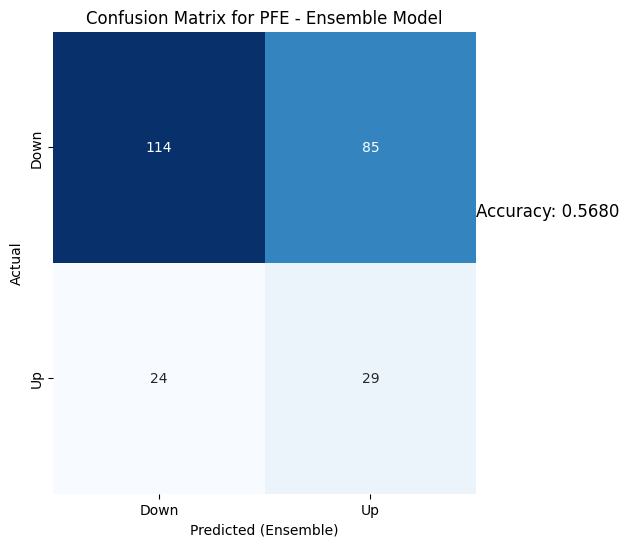

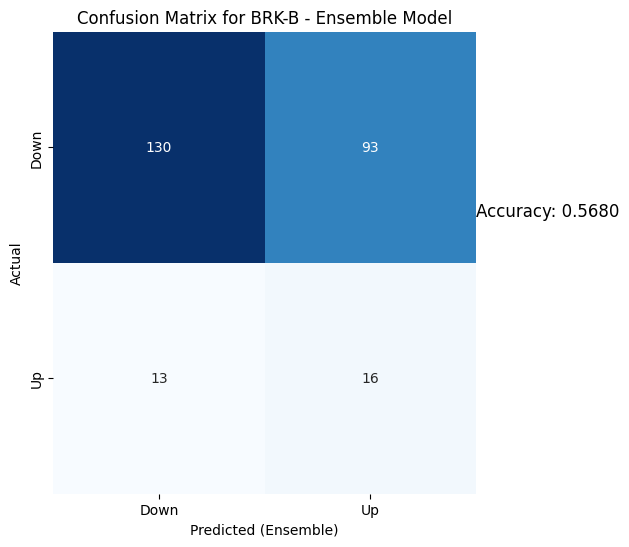

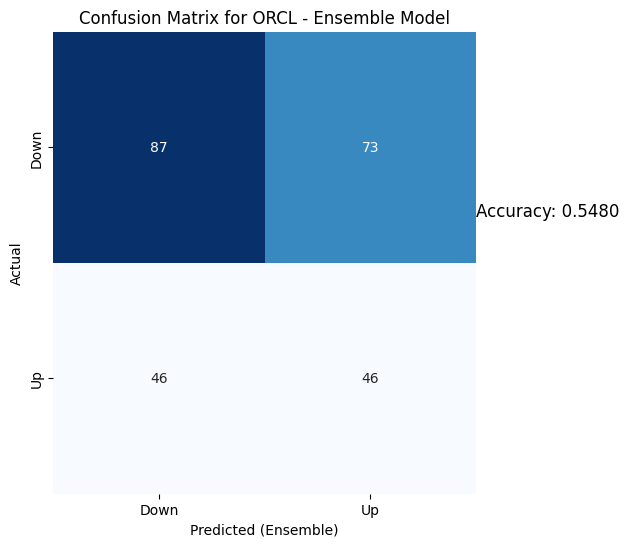

...

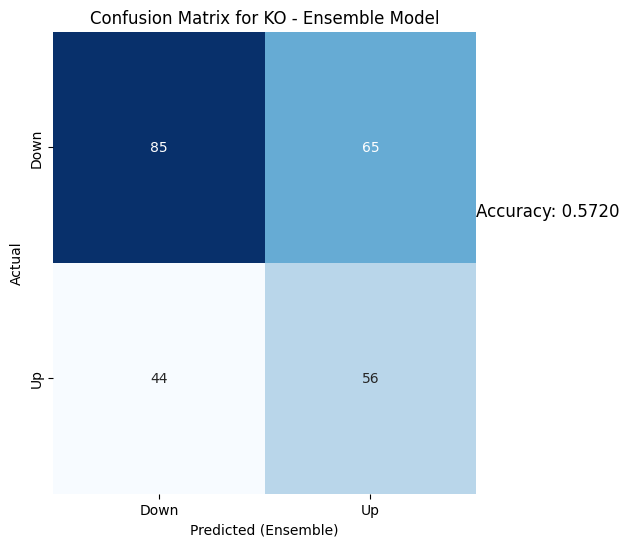

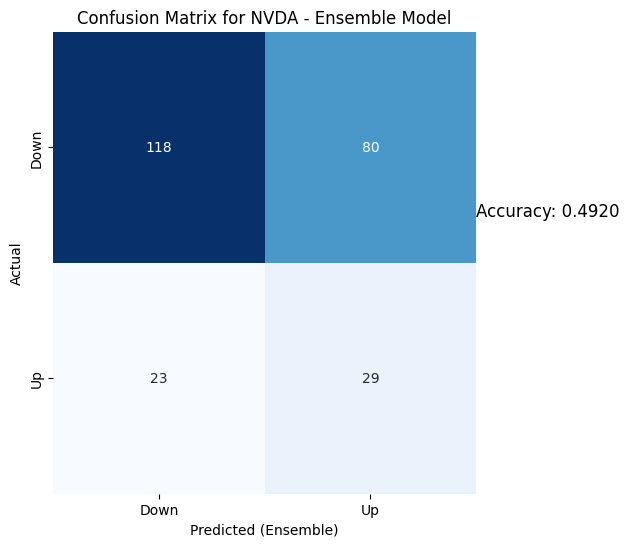

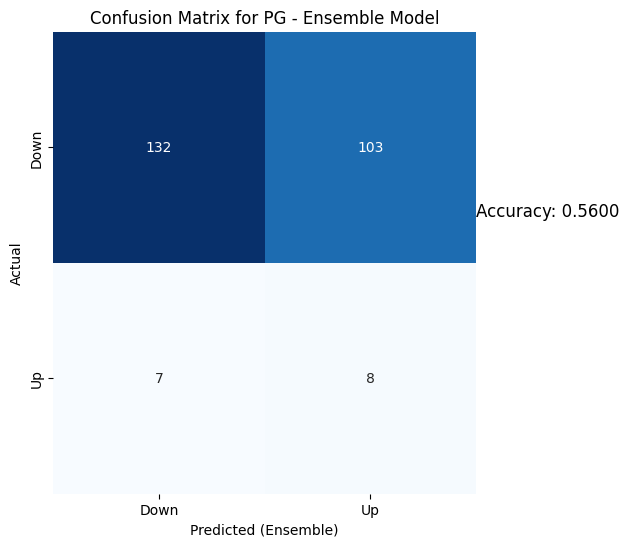

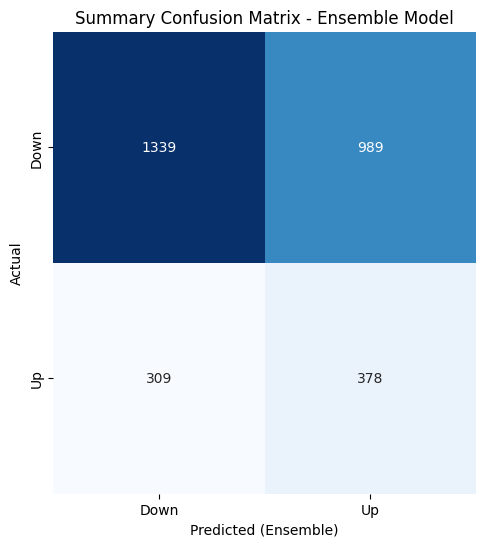

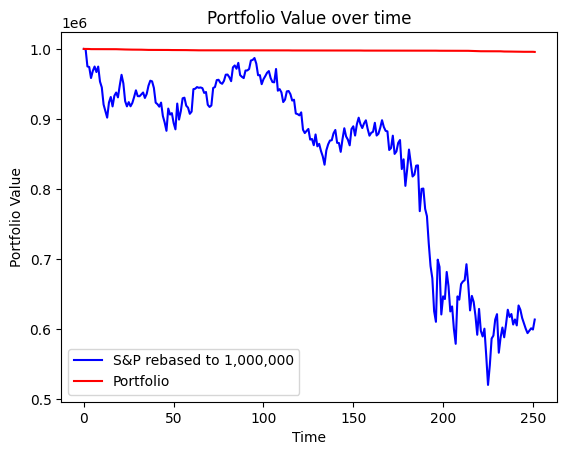

Portfolio return for our period =  99.57000000000001
S&P500 return during the period =  61.38826034424453


In [12]:
Portfolio_construct("2005-01-01")
#Testing for year 2008

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2262
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.476760
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4427
LightGBM: 0.4585
GBR: 0.4941
RandomForest: 0.4822
XGBoost: 0.4901
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6932 - accuracy: 0.5165 - val_loss: 0.6976 - val_accuracy: 0.4545
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 0.5228 - val_loss: 0.6952 - val_accuracy: 0.4697
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5228 - val_loss: 0.6903 - val_accuracy: 0.5404
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6953 - accuracy: 0.5127 - val_loss: 0.7061 - val_accuracy: 0.4343
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6898 - accuracy: 0.5190 - val_loss: 0.6945 - val_accuracy: 0.4747
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6908 - accuracy: 0.5216 - val_loss: 0.6986 - val_accuracy: 0.5051
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


SVR: 0.5000
LightGBM: 0.5278
GBR: 0.4921
RandomForest: 0.4921
XGBoost: 0.5317
Epoch 1/10
25/25 [==============================] - 6s 53ms/step - loss: 0.6919 - accuracy: 0.5292 - val_loss: 0.6980 - val_accuracy: 0.4873
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6913 - accuracy: 0.5228 - val_loss: 0.7067 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6904 - accuracy: 0.5305 - val_loss: 0.6983 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6908 - accuracy: 0.5114 - val_loss: 0.7040 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6901 - accuracy: 0.5228 - val_loss: 0.7049 - val_accuracy: 0.4873
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6895 - accuracy: 0.5419 - val_loss: 0.7065 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5079
LightGBM: 0.5000
GBR: 0.4683
RandomForest: 0.4881
XGBoost: 0.4921
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6928 - accuracy: 0.5286 - val_loss: 0.6957 - val_accuracy: 0.4873
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5184 - val_loss: 0.7014 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6918 - accuracy: 0.5222 - val_loss: 0.7053 - val_accuracy: 0.4873
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6911 - accuracy: 0.5172 - val_loss: 0.6996 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6912 - accuracy: 0.5133 - val_loss: 0.7070 - val_accuracy: 0.4873
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5515 - val_loss: 0.7046 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5000
LightGBM: 0.4683
GBR: 0.5000
RandomForest: 0.5000
XGBoost: 0.4484
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6924 - accuracy: 0.5407 - val_loss: 0.6937 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6921 - accuracy: 0.5089 - val_loss: 0.6945 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6894 - accuracy: 0.5216 - val_loss: 0.6936 - val_accuracy: 0.4975
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6909 - accuracy: 0.5280 - val_loss: 0.6949 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6896 - accuracy: 0.5229 - val_loss: 0.6946 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6889 - accuracy: 0.5204 - val_loss: 0.6949 - val_accuracy: 0.5279
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


SVR: 0.4603
LightGBM: 0.4841
GBR: 0.5159
RandomForest: 0.4802
XGBoost: 0.4841
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6955 - accuracy: 0.4854 - val_loss: 0.6927 - val_accuracy: 0.5178
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6940 - accuracy: 0.5006 - val_loss: 0.6929 - val_accuracy: 0.5025
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6937 - accuracy: 0.5121 - val_loss: 0.6956 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6930 - accuracy: 0.5121 - val_loss: 0.6934 - val_accuracy: 0.4924
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6934 - accuracy: 0.5032 - val_loss: 0.6943 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6955 - accuracy: 0.4803 - val_loss: 0.6939 - val_accuracy: 0.4924
Epoch 7/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5538
LightGBM: 0.4741
GBR: 0.4861
RandomForest: 0.4741
XGBoost: 0.4821
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6953 - accuracy: 0.5000 - val_loss: 0.6949 - val_accuracy: 0.4772
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5064 - val_loss: 0.6894 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6920 - accuracy: 0.5128 - val_loss: 0.6921 - val_accuracy: 0.5787
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6910 - accuracy: 0.5344 - val_loss: 0.6893 - val_accuracy: 0.5635
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6938 - accuracy: 0.5128 - val_loss: 0.6891 - val_accuracy: 0.5584
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6928 - accuracy: 0.5064 - val_loss: 0.6947 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.4821
LightGBM: 0.5458
GBR: 0.5219
RandomForest: 0.5578
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 8s 154ms/step - loss: 0.6954 - accuracy: 0.5051 - val_loss: 0.6937 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6938 - accuracy: 0.4758 - val_loss: 0.6952 - val_accuracy: 0.4796
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6931 - accuracy: 0.4936 - val_loss: 0.6933 - val_accuracy: 0.4796
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6935 - accuracy: 0.5230 - val_loss: 0.6957 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6928 - accuracy: 0.5204 - val_loss: 0.6945 - val_accuracy: 0.4796
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6928 - accuracy: 0.5217 - val_loss: 0.6955 - val_accuracy: 0.4796
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4980
LightGBM: 0.5378
GBR: 0.5339
RandomForest: 0.5299
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6980 - accuracy: 0.4917 - val_loss: 0.6951 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6949 - accuracy: 0.4994 - val_loss: 0.6975 - val_accuracy: 0.4745
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6932 - accuracy: 0.5096 - val_loss: 0.6967 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6975 - accuracy: 0.5057 - val_loss: 0.7025 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6936 - accuracy: 0.5096 - val_loss: 0.6951 - val_accuracy: 0.4643
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6927 - accuracy: 0.5057 - val_loss: 0.6988 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 15

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5259
LightGBM: 0.5100
GBR: 0.5139
RandomForest: 0.5219
XGBoost: 0.5538
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6951 - accuracy: 0.5064 - val_loss: 0.6999 - val_accuracy: 0.4949
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5166 - val_loss: 0.6957 - val_accuracy: 0.4949
Epoch 3/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6929 - accuracy: 0.5435 - val_loss: 0.7053 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6902 - accuracy: 0.5269 - val_loss: 0.6961 - val_accuracy: 0.4949
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6910 - accuracy: 0.5179 - val_loss: 0.6973 - val_accuracy: 0.4949
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6908 - accuracy: 0.5243 - val_loss: 0.6982 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5320
LightGBM: 0.5360
GBR: 0.5240
RandomForest: 0.5240
XGBoost: 0.5280
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.7000 - accuracy: 0.4878 - val_loss: 0.6903 - val_accuracy: 0.5510
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6943 - accuracy: 0.4673 - val_loss: 0.6963 - val_accuracy: 0.4694
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6917 - accuracy: 0.5134 - val_loss: 0.6933 - val_accuracy: 0.4694
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6922 - accuracy: 0.5198 - val_loss: 0.6957 - val_accuracy: 0.4694
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6930 - accuracy: 0.5019 - val_loss: 0.7013 - val_accuracy: 0.4388
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6919 - accuracy: 0.5211 - val_loss: 0.6969 - val_accuracy: 0.4694
Epoch 7/10
25/25 [==============================] - 0s 16

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5120
LightGBM: 0.5400
GBR: 0.5200
RandomForest: 0.5400
XGBoost: 0.5120
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6967 - accuracy: 0.4756 - val_loss: 0.6952 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6939 - accuracy: 0.4769 - val_loss: 0.6931 - val_accuracy: 0.5204
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6952 - accuracy: 0.4718 - val_loss: 0.6936 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6949 - accuracy: 0.4821 - val_loss: 0.6951 - val_accuracy: 0.4694
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.4872 - val_loss: 0.6961 - val_accuracy: 0.4694
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5167 - val_loss: 0.6926 - val_accuracy: 0.5204
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5320
LightGBM: 0.5080
GBR: 0.5520
RandomForest: 0.5240
XGBoost: 0.5120
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6970 - accuracy: 0.5167 - val_loss: 0.7106 - val_accuracy: 0.4410
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6960 - accuracy: 0.5103 - val_loss: 0.6987 - val_accuracy: 0.4410
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6924 - accuracy: 0.5205 - val_loss: 0.7022 - val_accuracy: 0.4410
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6921 - accuracy: 0.5026 - val_loss: 0.7017 - val_accuracy: 0.4410
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6923 - accuracy: 0.5064 - val_loss: 0.6983 - val_accuracy: 0.4410
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6928 - accuracy: 0.5103 - val_loss: 0.7016 - val_accuracy: 0.4410
Epoch 7/10
25/25 [==============================] - 0s 15

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 664 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  82.60037994384766  and sold at  82.06501007080078
NVDA bought at  2.2200000286102295  and sold at  2.3299999237060547
31.860000610351562
2.3299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 665 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  31.860000610351562  and sold at  30.209999084472656
NVDA bought at  2.3299999237060547  and sold at  2.115000009536743
3.2142860889434814
2.130000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 666 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  3.2142860889434814  and sold at  3.062143087387085
NVDA bought at  2.130000114440918  and sold at  2.005000114440918
1.9774999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 667 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9774999618530273  and sold at  1.9299999475479126
1.9299999475479126


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 668 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9299999475479126  and sold at  1.877500057220459
19.1299991607666
1.877500057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 669 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  19.1299991607666  and sold at  18.959999084472656
NVDA bought at  1.877500057220459  and sold at  1.9375
1.9375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 670 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9375  and sold at  2.005000114440918
2.005000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 671 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.005000114440918  and sold at  2.0174999237060547
2.177500009536743


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 672 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.177500009536743  and sold at  2.2174999713897705
19.510000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 673 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.510000228881836  and sold at  20.1200008392334
20.1200008392334
2.0999999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 674 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  20.1200008392334  and sold at  19.520000457763672
NVDA bought at  2.0999999046325684  and sold at  1.9824999570846558
16.546489715576172
80.97514343261719


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 675 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  16.546489715576172  and sold at  16.47058868408203
IBM bought at  80.97514343261719  and sold at  81.94072723388672
19.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 676 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.81999969482422  and sold at  19.09000015258789
19.09000015258789
3.047499895095825


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 677 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  19.09000015258789  and sold at  19.239999771118164
AAPL bought at  3.047499895095825  and sold at  2.9778571128845215
19.239999771118164
2.9778571128845215
1.8925000429153442


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 678 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  19.239999771118164  and sold at  19.709999084472656
AAPL bought at  2.9778571128845215  and sold at  2.940356969833374
NVDA bought at  1.8925000429153442  and sold at  1.997499942779541
19.709999084472656
22.81999969482422
1.997499942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 679 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'NVDA']
MSFT bought at  19.709999084472656  and sold at  18.479999542236328
JPM bought at  22.81999969482422  and sold at  18.09000015258789
NVDA bought at  1.997499942779541  and sold at  1.8025000095367432
18.479999542236328
1.8025000095367432


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 680 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  18.479999542236328  and sold at  19.3799991607666
NVDA bought at  1.8025000095367432  and sold at  1.8899999856948853
1.8899999856948853


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 681 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8899999856948853  and sold at  1.8550000190734863
1.8550000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 682 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8550000190734863  and sold at  1.9275000095367432
17.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 683 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  17.200000762939453  and sold at  17.6299991607666
17.6299991607666
24.5
16.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 684 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'ORCL']
MSFT bought at  17.6299991607666  and sold at  17.65999984741211
JPM bought at  24.5  and sold at  25.059999465942383
ORCL bought at  16.959999084472656  and sold at  17.280000686645508
56.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 685 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  56.70000076293945  and sold at  58.18000030517578
2.197499990463257


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 686 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.197499990463257  and sold at  2.069999933242798
17.59000015258789
25.43000030517578
2.069999933242798


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 687 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'NVDA']
MSFT bought at  17.59000015258789  and sold at  17.100000381469727
JPM bought at  25.43000030517578  and sold at  25.510000228881836
NVDA bought at  2.069999933242798  and sold at  1.9874999523162842
17.100000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 688 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  17.100000381469727  and sold at  17.829999923706055
86.93116760253906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 689 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  86.93116760253906  and sold at  89.36902618408203
18.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 690 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  18.5  and sold at  18.6299991607666
52.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 691 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  52.939998626708984  and sold at  51.45000076293945
3.493928909301758
2.3299999237060547
51.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 692 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA', 'PG']
AAPL bought at  3.493928909301758  and sold at  3.4578568935394287
NVDA bought at  2.3299999237060547  and sold at  2.0374999046325684
PG bought at  51.45000076293945  and sold at  51.15999984741211
19.260000228881836
3.5453569889068604
2.0799999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 693 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  19.260000228881836  and sold at  19.09000015258789
AAPL bought at  3.5453569889068604  and sold at  3.541429042816162
NVDA bought at  2.0799999237060547  and sold at  2.077500104904175
3.541429042816162
2.077500104904175
51.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 694 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA', 'PG']
AAPL bought at  3.541429042816162  and sold at  3.376070976257324
NVDA bought at  2.077500104904175  and sold at  1.9574999809265137
PG bought at  51.09000015258789  and sold at  50.11000061035156
1.9574999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 695 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.9574999809265137  and sold at  2.009999990463257
87.48565673828125
2.009999990463257


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 696 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  87.48565673828125  and sold at  85.01911926269531
NVDA bought at  2.009999990463257  and sold at  1.8550000190734863
1.8550000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 697 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  1.8550000190734863  and sold at  1.902500033378601
18.0
3.257143020629883
84.8852767944336
1.902500033378601
50.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 698 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM', 'NVDA', 'PG']
MSFT bought at  18.0  and sold at  17.209999084472656
AAPL bought at  3.257143020629883  and sold at  3.1053569316864014
IBM bought at  84.8852767944336  and sold at  80.65965270996094
NVDA bought at  1.902500033378601  and sold at  1.815000057220459
PG bought at  50.25  and sold at  48.900001525878906
17.209999084472656
3.1053569316864014
1.815000057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 699 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  17.209999084472656  and sold at  17.170000076293945
AAPL bought at  3.1053569316864014  and sold at  3.2232139110565186
NVDA bought at  1.815000057220459  and sold at  1.9774999618530273
17.170000076293945
82.60037994384766
1.9774999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 700 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  17.170000076293945  and sold at  16.959999084472656
IBM bought at  82.60037994384766  and sold at  82.12236785888672
NVDA bought at  1.9774999618530273  and sold at  2.0
16.959999084472656
82.12236785888672
2.0
49.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 701 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA', 'PG']
MSFT bought at  16.959999084472656  and sold at  16.420000076293945
IBM bought at  82.12236785888672  and sold at  85.05735778808594
NVDA bought at  2.0  and sold at  2.065000057220459
PG bought at  49.91999816894531  and sold at  48.970001220703125
85.05735778808594
2.065000057220459
48.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 702 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA', 'PG']
IBM bought at  85.05735778808594  and sold at  87.98279571533203
NVDA bought at  2.065000057220459  and sold at  2.069999933242798
PG bought at  48.970001220703125  and sold at  48.16999816894531
16.149999618530273
2.069999933242798
48.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 703 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA', 'PG']
MSFT bought at  16.149999618530273  and sold at  15.789999961853027
NVDA bought at  2.069999933242798  and sold at  1.8949999809265137
PG bought at  48.16999816894531  and sold at  46.869998931884766
15.789999961853027
85.13384246826172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 704 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  15.789999961853027  and sold at  15.880000114440918
IBM bought at  85.13384246826172  and sold at  83.9101333618164
3.1560709476470947


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 705 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  3.1560709476470947  and sold at  3.256071090698242
19.299999237060547
19.864999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 706 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  19.299999237060547  and sold at  16.600000381469727
KO bought at  19.864999771118164  and sold at  18.924999237060547
15.270000457763672
16.600000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 707 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  15.270000457763672  and sold at  15.279999732971191
JPM bought at  16.600000381469727  and sold at  15.930000305175781
15.149999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 708 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  15.149999618530273  and sold at  16.479999542236328
19.78499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 709 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  19.78499984741211  and sold at  20.420000076293945
23.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 710 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  23.200000762939453  and sold at  23.75
16.649999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 711 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  16.649999618530273  and sold at  16.25
47.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 712 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  47.97999954223633  and sold at  48.02000045776367
16.959999084472656
48.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 713 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  16.959999084472656  and sold at  17.139999389648438
PG bought at  48.02000045776367  and sold at  46.310001373291016
88.5850830078125
46.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 714 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  88.5850830078125  and sold at  88.44168090820312
PG bought at  46.310001373291016  and sold at  45.59000015258789
17.059999465942383
23.149999618530273
17.100000381469727
3.628213882446289


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 715 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'ORCL', 'AAPL']
MSFT bought at  17.059999465942383  and sold at  18.329999923706055
JPM bought at  23.149999618530273  and sold at  28.860000610351562
ORCL bought at  17.100000381469727  and sold at  18.25
AAPL bought at  3.628213882446289  and sold at  3.8450000286102295
18.329999923706055
28.860000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 716 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  18.329999923706055  and sold at  17.93000030517578
JPM bought at  28.860000610351562  and sold at  26.399999618530273
93.64244842529297


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 717 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  93.64244842529297  and sold at  94.43594360351562
2.640000104904175
48.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 718 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  2.640000104904175  and sold at  2.615000009536743
PG bought at  48.7599983215332  and sold at  48.56999969482422
2.615000009536743


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 719 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.615000009536743  and sold at  2.447499990463257
47.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 720 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  47.279998779296875  and sold at  47.09000015258789
22.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 721 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  22.43000030517578  and sold at  22.670000076293945
28.15999984741211
18.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 722 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  28.15999984741211  and sold at  29.280000686645508
ORCL bought at  18.81999969482422  and sold at  19.290000915527344
18.760000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 723 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 724 times so far.

  warnings.warn(msg, UserWarning)



['MSFT']
MSFT bought at  18.760000228881836  and sold at  18.760000228881836
96.73995971679688
[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  96.73995971679688  and sold at  97.22753143310547
95.55449676513672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 725 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  95.55449676513672  and sold at  94.9043960571289
22.549999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 726 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  22.549999237060547  and sold at  22.510000228881836
51.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 727 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  51.65999984741211  and sold at  50.72999954223633
29.690000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 728 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  29.690000534057617  and sold at  32.529998779296875
98.04015350341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 729 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  98.04015350341797  and sold at  96.95984649658203
50.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 730 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  50.41999816894531  and sold at  49.439998626708984
4.716785907745361


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 731 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  4.716785907745361  and sold at  4.739643096923828
34.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 732 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  34.81999969482422  and sold at  37.220001220703125
19.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 733 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.790000915527344  and sold at  19.31999969482422
19.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 734 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.31999969482422  and sold at  19.420000076293945
19.420000076293945
51.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 735 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  19.420000076293945  and sold at  19.31999969482422
PG bought at  51.56999969482422  and sold at  50.369998931884766
19.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 736 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.31999969482422  and sold at  19.889999389648438
19.889999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 737 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.889999389648438  and sold at  19.75
19.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 738 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.75  and sold at  20.059999465942383
20.059999465942383
4.39107084274292


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 739 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  20.059999465942383  and sold at  20.219999313354492
AAPL bought at  4.39107084274292  and sold at  4.372142791748047
20.3799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 740 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  20.3799991607666  and sold at  19.81999969482422
19.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 741 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  19.81999969482422  and sold at  19.75
34.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 742 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  34.40999984741211  and sold at  36.540000915527344
53.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 743 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  53.779998779296875  and sold at  51.779998779296875
52.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 744 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  52.59000015258789  and sold at  51.939998626708984
101.60611724853516


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 745 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  101.60611724853516  and sold at  103.60420989990234
34.5
102.13192749023438
2.7125000953674316


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 746 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'NVDA']
JPM bought at  34.5  and sold at  33.97999954223633
IBM bought at  102.13192749023438  and sold at  101.806884765625
NVDA bought at  2.7125000953674316  and sold at  2.627500057220459
21.729999542236328
33.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 747 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  21.729999542236328  and sold at  21.829999923706055
JPM bought at  33.97999954223633  and sold at  35.349998474121094
21.829999923706055
5.133571147918701


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 748 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  21.829999923706055  and sold at  22.139999389648438
AAPL bought at  5.133571147918701  and sold at  5.166786193847656
22.139999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 749 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  22.139999389648438  and sold at  22.049999237060547
22.049999237060547
58.63999938964844
5.137499809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 750 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'AAPL']
MSFT bought at  22.049999237060547  and sold at  22.079999923706055
BRK-B bought at  58.63999938964844  and sold at  59.560001373291016
AAPL bought at  5.137499809265137  and sold at  5.097143173217773
22.079999923706055
52.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 751 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  22.079999923706055  and sold at  22.549999237060547
PG bought at  52.40999984741211  and sold at  52.08000183105469
22.549999237060547
5.0089287757873535


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 752 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  22.549999237060547  and sold at  22.829999923706055
AAPL bought at  5.0089287757873535  and sold at  4.998213768005371
22.829999923706055
4.998213768005371


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 753 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  22.829999923706055  and sold at  23.329999923706055
AAPL bought at  4.998213768005371  and sold at  4.891786098480225
23.329999923706055
4.891786098480225


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 754 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  23.329999923706055  and sold at  23.420000076293945
AAPL bought at  4.891786098480225  and sold at  4.86035680770874
23.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 755 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.420000076293945  and sold at  23.450000762939453
23.450000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 756 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.450000762939453  and sold at  23.68000030517578
23.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 757 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.68000030517578  and sold at  23.5
32.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 758 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  32.869998931884766  and sold at  33.56999969482422
52.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 759 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  52.22999954223633  and sold at  51.099998474121094
23.770000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 760 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.770000457763672  and sold at  24.040000915527344
23.3700008392334
24.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 761 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  23.3700008392334  and sold at  23.200000762939453
KO bought at  24.440000534057617  and sold at  24.5
23.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 762 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.200000762939453  and sold at  22.530000686645508
96.25238800048828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 763 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  96.25238800048828  and sold at  97.5908203125
22.440000534057617
52.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 764 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  22.440000534057617  and sold at  22.389999389648438
PG bought at  52.40999984741211  and sold at  52.220001220703125
34.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 765 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  34.70000076293945  and sold at  36.2599983215332
24.1200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 766 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.1200008392334  and sold at  24.440000534057617
3.055000066757202


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 767 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.055000066757202  and sold at  2.992500066757202
36.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 768 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  36.83000183105469  and sold at  38.150001525878906
23.450000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 769 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.450000762939453  and sold at  23.110000610351562
24.760000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 770 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.760000228881836  and sold at  24.69499969482422
23.809999465942383
13.970000267028809


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 771 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  23.809999465942383  and sold at  23.520000457763672
BAC bought at  13.970000267028809  and sold at  14.789999961853027
40.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 772 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  40.209999084472656  and sold at  41.779998779296875
23.809999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 773 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  23.809999465942383  and sold at  23.459999084472656
5.853929042816162
51.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 774 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  5.853929042816162  and sold at  5.911070823669434
PG bought at  51.459999084472656  and sold at  52.029998779296875
3.427500009536743


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 775 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.427500009536743  and sold at  3.315000057220459
3.315000057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 776 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.315000057220459  and sold at  3.237499952316284
52.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 777 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  52.08000183105469  and sold at  52.29999923706055
3.4574999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 778 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.4574999809265137  and sold at  3.3550000190734863
3.3550000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 779 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.3550000190734863  and sold at  3.2149999141693115
3.2149999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 780 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.2149999141693115  and sold at  3.3324999809265137
42.41999816894531
3.424999952316284


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 781 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  42.41999816894531  and sold at  43.65999984741211
NVDA bought at  3.424999952316284  and sold at  3.4825000762939453
53.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 782 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  53.58000183105469  and sold at  53.34000015258789
43.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 783 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  43.29999923706055  and sold at  43.45000076293945
24.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 784 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.68000030517578  and sold at  24.649999618530273
112.85850524902344
54.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 785 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  112.85850524902344  and sold at  111.55831909179688
PG bought at  54.11000061035156  and sold at  53.02000045776367
24.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 786 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.0  and sold at  23.860000610351562
23.860000610351562
40.86000061035156
110.98470306396484


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 787 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM']
MSFT bought at  23.860000610351562  and sold at  24.110000610351562
JPM bought at  40.86000061035156  and sold at  42.11000061035156
IBM bought at  110.98470306396484  and sold at  111.21414947509766
24.110000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 788 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.110000610351562  and sold at  24.6200008392334
24.975000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 789 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  24.975000381469727  and sold at  25.204999923706055
6.1760711669921875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 790 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.1760711669921875  and sold at  6.112143039703369
42.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 791 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  42.86000061035156  and sold at  43.02000045776367
6.204286098480225


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 792 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.204286098480225  and sold at  6.255713939666748
43.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 793 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  43.189998626708984  and sold at  44.650001525878906
26.709999084472656
3.809999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 794 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  26.709999084472656  and sold at  26.8799991607666
NVDA bought at  3.809999942779541  and sold at  3.805000066757202
44.54999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 795 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  44.54999923706055  and sold at  46.470001220703125
25.940000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 796 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  25.940000534057617  and sold at  25.549999237060547
6.513214111328125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 797 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.513214111328125  and sold at  6.648213863372803
44.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 798 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  44.810001373291016  and sold at  44.880001068115234
25.75
57.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 799 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  25.75  and sold at  25.719999313354492
PG bought at  57.90999984741211  and sold at  57.91999816894531
15.70208740234375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 800 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  15.70208740234375  and sold at  15.474383354187012
15.474383354187012
112.71510314941406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 801 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  15.474383354187012  and sold at  15.32258129119873
IBM bought at  112.71510314941406  and sold at  113.78585052490234
25.100000381469727
117.38050079345703
3.4749999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 802 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  25.100000381469727  and sold at  25.670000076293945
IBM bought at  117.38050079345703  and sold at  116.91204833984375
NVDA bought at  3.4749999046325684  and sold at  3.497499942779541
6.759643077850342
116.91204833984375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 803 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  6.759643077850342  and sold at  6.802499771118164
IBM bought at  116.91204833984375  and sold at  120.3919677734375
6.802499771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 804 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.802499771118164  and sold at  6.814642906188965
25.719999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 805 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  25.719999313354492  and sold at  25.809999465942383
25.809999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 806 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  25.809999465942383  and sold at  25.959999084472656
47.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 807 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  47.15999984741211  and sold at  46.060001373291016
26.5
6.716071128845215
27.5049991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 808 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO']
MSFT bought at  26.5  and sold at  26.360000610351562
AAPL bought at  6.716071128845215  and sold at  6.78071403503418
KO bought at  27.5049991607666  and sold at  27.395000457763672
26.360000610351562
57.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 809 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  26.360000610351562  and sold at  26.3700008392334
PG bought at  57.790000915527344  and sold at  58.130001068115234
26.3700008392334
7.098570823669434


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 810 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  26.3700008392334  and sold at  26.579999923706055
AAPL bought at  7.098570823669434  and sold at  7.318571090698242
27.03499984741211
57.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 811 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  27.03499984741211  and sold at  27.075000762939453
PG bought at  57.4900016784668  and sold at  58.130001068115234
26.59000015258789
45.709999084472656
16.520000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 812 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BAC']
MSFT bought at  26.59000015258789  and sold at  28.020000457763672
JPM bought at  45.709999084472656  and sold at  45.22999954223633
BAC bought at  16.520000457763672  and sold at  16.219999313354492
28.020000457763672
3.2874999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 813 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  28.020000457763672  and sold at  28.68000030517578
NVDA bought at  3.2874999046325684  and sold at  3.244999885559082
28.68000030517578
43.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 814 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  28.68000030517578  and sold at  28.59000015258789
JPM bought at  43.81999969482422  and sold at  43.900001525878906
28.59000015258789
3.134999990463257


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 815 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  28.59000015258789  and sold at  28.020000457763672
NVDA bought at  3.134999990463257  and sold at  3.005000114440918
28.020000457763672
42.68000030517578
26.7549991607666
3.005000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 816 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'KO', 'NVDA']
MSFT bought at  28.020000457763672  and sold at  28.219999313354492
JPM bought at  42.68000030517578  and sold at  44.349998474121094
KO bought at  26.7549991607666  and sold at  27.045000076293945
NVDA bought at  3.005000114440918  and sold at  3.137500047683716
3.137500047683716


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 817 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.137500047683716  and sold at  2.990000009536743
6.732142925262451


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 818 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.732142925262451  and sold at  6.76107120513916
43.869998931884766
6.929643154144287


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 819 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  43.869998931884766  and sold at  43.47999954223633
AAPL bought at  6.929643154144287  and sold at  6.940713882446289
120.45889282226562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 820 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  120.45889282226562  and sold at  121.32887268066406
29.010000228881836
44.16999816894531
7.24928617477417


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 821 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL']
MSFT bought at  29.010000228881836  and sold at  29.1200008392334
JPM bought at  44.16999816894531  and sold at  44.31999969482422
AAPL bought at  7.24928617477417  and sold at  7.2589287757873535
29.1200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 822 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  29.1200008392334  and sold at  29.360000610351562
16.717267990112305
7.213929176330566


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 823 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  16.717267990112305  and sold at  16.688804626464844
AAPL bought at  7.213929176330566  and sold at  7.301785945892334
29.6299991607666
42.900001525878906
61.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 824 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PG']
MSFT bought at  29.6299991607666  and sold at  29.540000915527344
JPM bought at  42.900001525878906  and sold at  43.040000915527344
PG bought at  61.61000061035156  and sold at  62.27000045776367
29.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 825 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  29.540000915527344  and sold at  30.0
62.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 826 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  62.310001373291016  and sold at  62.40999984741211
122.51434326171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 827 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  122.51434326171875  and sold at  121.93116760253906
29.780000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 828 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  29.780000686645508  and sold at  29.6200008392334
29.6200008392334
42.459999084472656
121.37667083740234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 829 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM']
MSFT bought at  29.6200008392334  and sold at  29.940000534057617
JPM bought at  42.459999084472656  and sold at  43.279998779296875
IBM bought at  121.37667083740234  and sold at  122.56214141845703
29.940000534057617
43.279998779296875
122.56214141845703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 830 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM']
MSFT bought at  29.940000534057617  and sold at  29.90999984741211
JPM bought at  43.279998779296875  and sold at  42.47999954223633
IBM bought at  122.56214141845703  and sold at  122.30401611328125
7.30142879486084
29.094999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 831 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  7.30142879486084  and sold at  7.292500019073486
KO bought at  29.094999313354492  and sold at  29.05500030517578
42.15999984741211
7.292500019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 832 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  42.15999984741211  and sold at  41.33000183105469
AAPL bought at  7.292500019073486  and sold at  7.163928985595703
120.17208099365234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 833 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  120.17208099365234  and sold at  120.79350280761719
42.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 834 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  42.4900016784668  and sold at  42.220001220703125
30.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 835 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  30.010000228881836  and sold at  29.780000686645508
29.780000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 836 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  29.780000686645508  and sold at  29.829999923706055
15.760000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 837 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.760000228881836  and sold at  16.280000686645508
16.280000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 838 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.280000686645508  and sold at  15.890000343322754
41.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 839 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  41.209999084472656  and sold at  41.189998626708984
41.189998626708984
7.064286231994629


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 840 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  41.189998626708984  and sold at  41.27000045776367
AAPL bought at  7.064286231994629  and sold at  7.01535701751709
41.27000045776367
17.381404876708984
7.01535701751709


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 841 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL']
JPM bought at  41.27000045776367  and sold at  40.959999084472656
PFE bought at  17.381404876708984  and sold at  17.362428665161133
AAPL bought at  7.01535701751709  and sold at  6.952499866485596
[1000000.0, 1030141.8582124677, 1028922.8797887578, 1035793.4777637048, 1004765.0744166122, 1008865.2822550543, 987256.1884629584, 963541.6556581253, 965314.7459273752, 934951.2937040499, 935283.726993135, 942597.512989797, 892841.3298109383, 931405.1977111477, 916999.1351830839, 920988.5037432986, 927304.9898727055, 936724.2994277024, 968417.569352965, 936945.9779841574, 917885.6803177088, 915115.2901812041, 927969.8564508756, 923426.4605907184, 937167.5719950149, 963874.1734928078, 965203.9066491476, 920988.5037432986, 926418.4447380806, 927083.395861848, 917109.9

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 842 times so far.

  warnings.warn(msg, UserWarning)


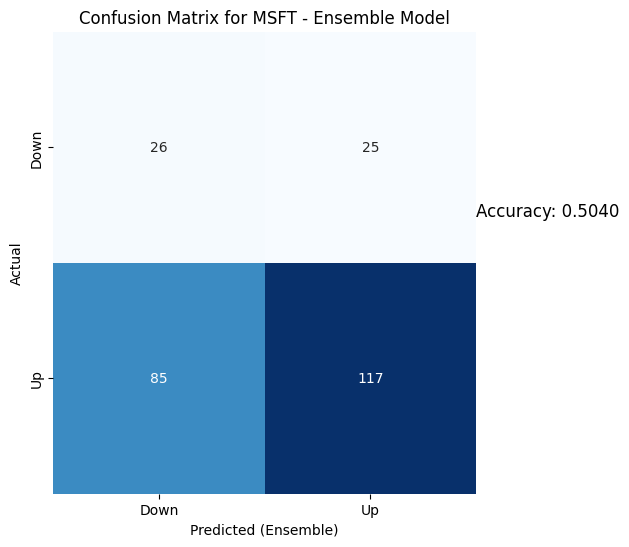

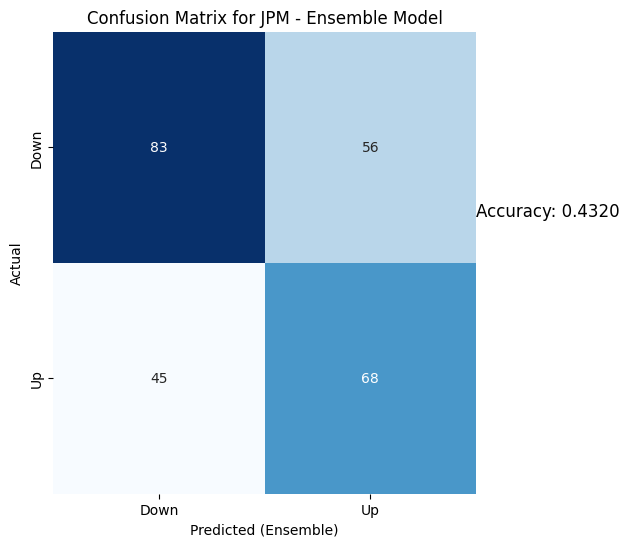

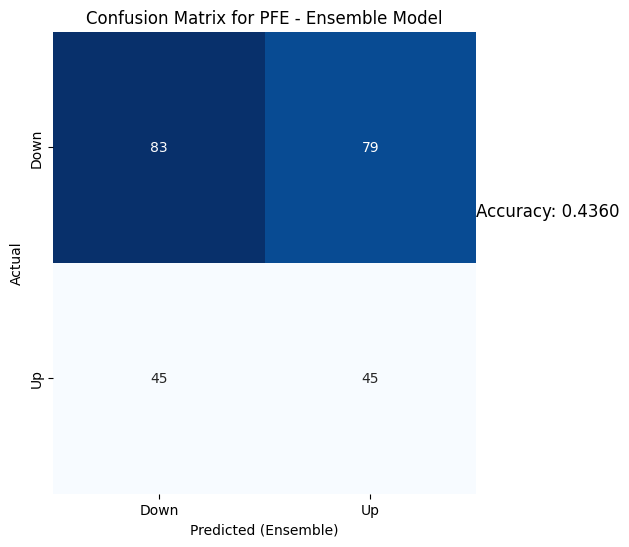

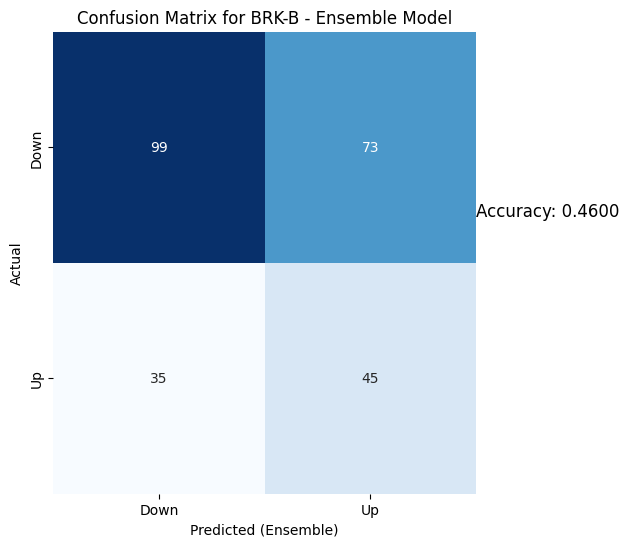

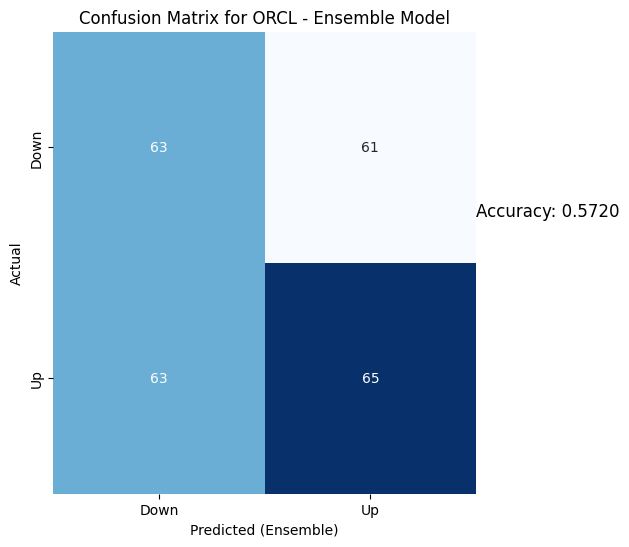

...

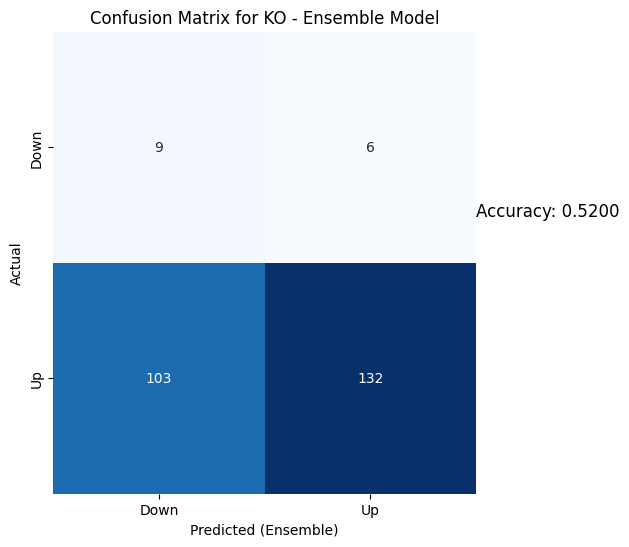

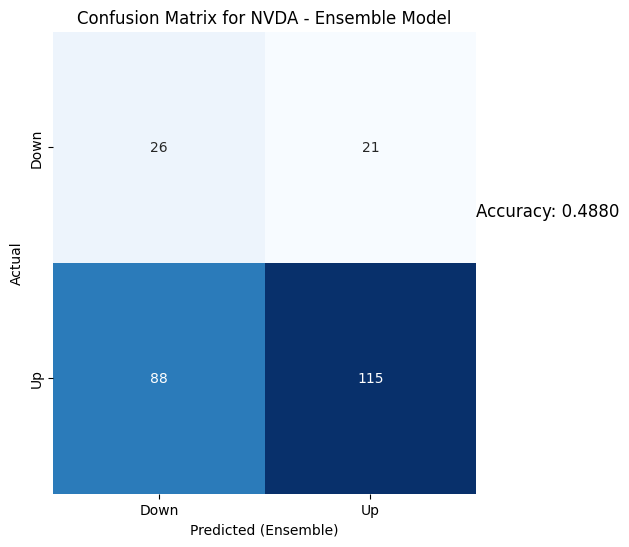

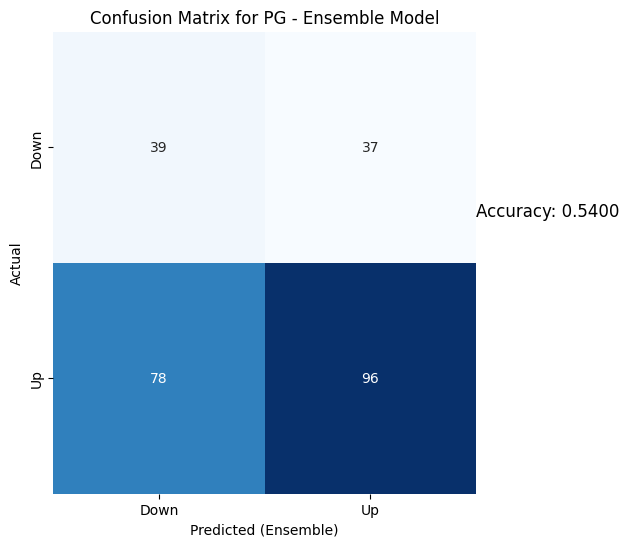

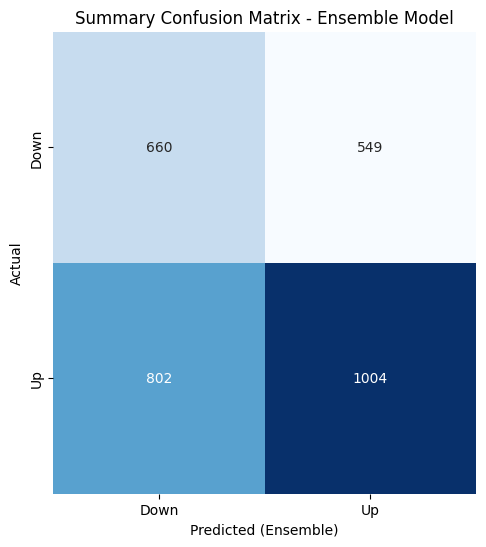

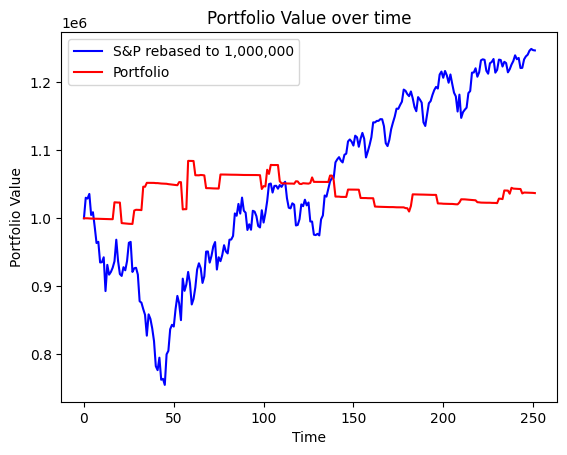

Portfolio return for our period =  103.70093249370198
S&P500 return during the period =  124.68971554380109


In [13]:
Portfolio_construct("2006-01-01")
#Testing for year 2009

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000358 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2263
[LightGBM] [Info] Number of data points in the train set: 754, number of used features: 9
[LightGBM] [Info] Start training from score 0.497347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5257
LightGBM: 0.5099
GBR: 0.5257
RandomForest: 0.5415
XGBoost: 0.5375
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6969 - accuracy: 0.4778 - val_loss: 0.6952 - val_accuracy: 0.4949
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6944 - accuracy: 0.4956 - val_loss: 0.6937 - val_accuracy: 0.4798
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.4994 - val_loss: 0.6940 - val_accuracy: 0.4545
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6920 - accuracy: 0.5272 - val_loss: 0.6938 - val_accuracy: 0.4949
Epoch 5/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6926 - accuracy: 0.5146 - val_loss: 0.6944 - val_accuracy: 0.4747
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6938 - accuracy: 0.5108 - val_loss: 0.6937 - val_accuracy: 0.5152
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5059
LightGBM: 0.5692
GBR: 0.5534
RandomForest: 0.5573
XGBoost: 0.5573
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6982 - accuracy: 0.4746 - val_loss: 0.6936 - val_accuracy: 0.5101
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6944 - accuracy: 0.5203 - val_loss: 0.6928 - val_accuracy: 0.5101
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.4987 - val_loss: 0.6921 - val_accuracy: 0.5101
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6929 - accuracy: 0.5165 - val_loss: 0.6923 - val_accuracy: 0.5101
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.5178 - val_loss: 0.6921 - val_accuracy: 0.5101
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.5152 - val_loss: 0.6921 - val_accuracy: 0.5101
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5437
LightGBM: 0.5516
GBR: 0.5397
RandomForest: 0.5873
XGBoost: 0.5595
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6935 - accuracy: 0.5216 - val_loss: 0.6912 - val_accuracy: 0.5482
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 0.5089 - val_loss: 0.6913 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6908 - accuracy: 0.5355 - val_loss: 0.6914 - val_accuracy: 0.5482
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6906 - accuracy: 0.5241 - val_loss: 0.6915 - val_accuracy: 0.5533
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.5317 - val_loss: 0.6918 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6899 - accuracy: 0.5305 - val_loss: 0.6915 - val_accuracy: 0.5330
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5159
LightGBM: 0.5119
GBR: 0.5000
RandomForest: 0.4802
XGBoost: 0.5238
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6951 - accuracy: 0.5121 - val_loss: 0.6914 - val_accuracy: 0.5279
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6918 - accuracy: 0.5299 - val_loss: 0.6920 - val_accuracy: 0.5279
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5299 - val_loss: 0.6924 - val_accuracy: 0.5279
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5197 - val_loss: 0.6919 - val_accuracy: 0.5279
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6921 - accuracy: 0.5311 - val_loss: 0.6926 - val_accuracy: 0.5279
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6923 - accuracy: 0.5311 - val_loss: 0.6927 - val_accuracy: 0.5279
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.4841
LightGBM: 0.4921
GBR: 0.4841
RandomForest: 0.4722
XGBoost: 0.4960
Epoch 1/10
25/25 [==============================] - 8s 54ms/step - loss: 0.6995 - accuracy: 0.4949 - val_loss: 0.6946 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.5025 - val_loss: 0.6951 - val_accuracy: 0.5127
Epoch 3/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6938 - accuracy: 0.5102 - val_loss: 0.6943 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6941 - accuracy: 0.5064 - val_loss: 0.6943 - val_accuracy: 0.5127
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6935 - accuracy: 0.5076 - val_loss: 0.6946 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.4898 - val_loss: 0.6973 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5675
LightGBM: 0.4524
GBR: 0.4444
RandomForest: 0.4484
XGBoost: 0.4643
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6897 - accuracy: 0.5465 - val_loss: 0.6873 - val_accuracy: 0.5584
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6903 - accuracy: 0.5567 - val_loss: 0.6938 - val_accuracy: 0.5127
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6898 - accuracy: 0.5389 - val_loss: 0.6909 - val_accuracy: 0.4721
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6878 - accuracy: 0.5503 - val_loss: 0.6896 - val_accuracy: 0.5482
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6876 - accuracy: 0.5490 - val_loss: 0.6894 - val_accuracy: 0.5330
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6878 - accuracy: 0.5529 - val_loss: 0.6887 - val_accuracy: 0.5431
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5299
LightGBM: 0.4821
GBR: 0.4661
RandomForest: 0.4861
XGBoost: 0.4741
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6955 - accuracy: 0.5038 - val_loss: 0.6975 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.4911 - val_loss: 0.6929 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6962 - accuracy: 0.5013 - val_loss: 0.6968 - val_accuracy: 0.4619
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5102 - val_loss: 0.6929 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5128 - val_loss: 0.6947 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6930 - accuracy: 0.5191 - val_loss: 0.6960 - val_accuracy: 0.4569
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4781
LightGBM: 0.5299
GBR: 0.5139
RandomForest: 0.5299
XGBoost: 0.4821
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6971 - accuracy: 0.4452 - val_loss: 0.6926 - val_accuracy: 0.5255
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6957 - accuracy: 0.4758 - val_loss: 0.6969 - val_accuracy: 0.4745
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.4885 - val_loss: 0.6928 - val_accuracy: 0.5255
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.4911 - val_loss: 0.6938 - val_accuracy: 0.4592
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.4936 - val_loss: 0.6947 - val_accuracy: 0.4643
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.4962 - val_loss: 0.6942 - val_accuracy: 0.4541
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.4861
LightGBM: 0.5339
GBR: 0.5020
RandomForest: 0.4741
XGBoost: 0.5179
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.7028 - accuracy: 0.4866 - val_loss: 0.6921 - val_accuracy: 0.5255
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6945 - accuracy: 0.5109 - val_loss: 0.6950 - val_accuracy: 0.4643
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6926 - accuracy: 0.5211 - val_loss: 0.6929 - val_accuracy: 0.5153
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5223 - val_loss: 0.6918 - val_accuracy: 0.5306
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5198 - val_loss: 0.6924 - val_accuracy: 0.5459
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.5236 - val_loss: 0.6926 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5657
LightGBM: 0.5020
GBR: 0.5219
RandomForest: 0.5100
XGBoost: 0.4940
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.6943 - accuracy: 0.5179 - val_loss: 0.6791 - val_accuracy: 0.5867
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6964 - accuracy: 0.5281 - val_loss: 0.6870 - val_accuracy: 0.5867
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.5320 - val_loss: 0.6831 - val_accuracy: 0.5867
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5320 - val_loss: 0.6822 - val_accuracy: 0.5867
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5269 - val_loss: 0.6846 - val_accuracy: 0.5867
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6912 - accuracy: 0.5294 - val_loss: 0.6871 - val_accuracy: 0.5867
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5480
LightGBM: 0.5160
GBR: 0.5000
RandomForest: 0.5120
XGBoost: 0.5240
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6940 - accuracy: 0.5224 - val_loss: 0.6947 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6936 - accuracy: 0.5314 - val_loss: 0.6916 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.5134 - val_loss: 0.6923 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6939 - accuracy: 0.5096 - val_loss: 0.6916 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6946 - accuracy: 0.5032 - val_loss: 0.6913 - val_accuracy: 0.5255
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5288 - val_loss: 0.6917 - val_accuracy: 0.5306
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5200
LightGBM: 0.5280
GBR: 0.4720
RandomForest: 0.5200
XGBoost: 0.5080
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6964 - accuracy: 0.4974 - val_loss: 0.6943 - val_accuracy: 0.4898
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.5051 - val_loss: 0.6929 - val_accuracy: 0.5153
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.5051 - val_loss: 0.6927 - val_accuracy: 0.5102
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6913 - accuracy: 0.5321 - val_loss: 0.6966 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6918 - accuracy: 0.5244 - val_loss: 0.6935 - val_accuracy: 0.4949
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6912 - accuracy: 0.5359 - val_loss: 0.6933 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 18

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 843 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'KO']
PFE bought at  None  and sold at  17.466793060302734
AAPL bought at  None  and sold at  6.965356826782227
IBM bought at  None  and sold at  123.04971313476562
KO bought at  None  and sold at  29.209999084472656
66.16999816894531
6.965356826782227


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 844 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  66.16999816894531  and sold at  65.7699966430664
AAPL bought at  6.965356826782227  and sold at  6.852142810821533
121.79732513427734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 845 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  121.79732513427734  and sold at  122.28489685058594
6.979642868041992
122.28489685058594
28.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 846 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'KO']
AAPL bought at  6.979642868041992  and sold at  7.0796427726745605
IBM bought at  122.28489685058594  and sold at  122.99235534667969
KO bought at  28.459999084472656  and sold at  28.59000015258789
28.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 847 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.59000015258789  and sold at  28.635000228881836
7.15571403503418
28.635000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 848 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  7.15571403503418  and sold at  7.2178568840026855
KO bought at  28.635000228881836  and sold at  28.645000457763672
124.2829818725586
28.645000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 849 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  124.2829818725586  and sold at  124.82791900634766
KO bought at  28.645000457763672  and sold at  28.719999313354492
124.82791900634766
28.719999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 850 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  124.82791900634766  and sold at  126.49139404296875
KO bought at  28.719999313354492  and sold at  28.719999313354492
126.49139404296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 851 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  126.49139404296875  and sold at  126.05162811279297
126.05162811279297
4.505000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 852 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  126.05162811279297  and sold at  126.73995971679688
NVDA bought at  4.505000114440918  and sold at  4.667500019073486
41.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 853 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  41.66999816894531  and sold at  42.849998474121094
7.643214225769043
15.6899995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 854 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  7.643214225769043  and sold at  7.656428813934326
BAC bought at  15.6899995803833  and sold at  16.200000762939453
31.26921844482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 855 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  31.26921844482422  and sold at  29.937416076660156
29.937416076660156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 856 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  29.937416076660156  and sold at  29.759218215942383
7.520713806152344
29.759218215942383
16.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 857 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'BAC']
AAPL bought at  7.520713806152344  and sold at  7.570713996887207
VZ bought at  29.759218215942383  and sold at  29.77797508239746
BAC bought at  16.93000030517578  and sold at  16.780000686645508
17.86527442932129
16.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 858 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  17.86527442932129  and sold at  17.808349609375
BAC bought at  16.93000030517578  and sold at  16.360000610351562
7.523213863372803


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 859 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  7.523213863372803  and sold at  7.479642868041992
7.479642868041992


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 860 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  7.479642868041992  and sold at  7.354642868041992
7.354642868041992
28.680646896362305


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 861 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  7.354642868041992  and sold at  7.679999828338623
VZ bought at  28.680646896362305  and sold at  29.290273666381836
66.63999938964844
7.679999828338623
4.357500076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 862 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'NVDA']
BRK-B bought at  66.63999938964844  and sold at  69.5199966430664
AAPL bought at  7.679999828338623  and sold at  7.56178617477417
NVDA bought at  4.357500076293945  and sold at  4.340000152587891
69.5199966430664
7.56178617477417
16.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 863 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'BAC']
BRK-B bought at  69.5199966430664  and sold at  72.72000122070312
AAPL bought at  7.56178617477417  and sold at  7.431070804595947
BAC bought at  16.489999771118164  and sold at  15.470000267028809
72.72000122070312
7.431070804595947
123.32695770263672
27.184999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 864 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'IBM', 'KO']
BRK-B bought at  72.72000122070312  and sold at  70.0999984741211
AAPL bought at  7.431070804595947  and sold at  7.0625
IBM bought at  123.32695770263672  and sold at  119.98088073730469
KO bought at  27.184999465942383  and sold at  27.1200008392334
70.0999984741211
7.0625
119.98088073730469
27.1200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 865 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'IBM', 'KO']
BRK-B bought at  70.0999984741211  and sold at  68.83999633789062
AAPL bought at  7.0625  and sold at  7.252500057220459
IBM bought at  119.98088073730469  and sold at  120.57361602783203
KO bought at  27.1200008392334  and sold at  27.174999237060547
7.252500057220459
120.57361602783203
14.979999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 866 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'BAC']
AAPL bought at  7.252500057220459  and sold at  7.355000019073486
IBM bought at  120.57361602783203  and sold at  120.21988677978516
BAC bought at  14.979999542236328  and sold at  14.770000457763672
7.355000019073486
27.06999969482422
60.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 867 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO', 'PG']
AAPL bought at  7.355000019073486  and sold at  7.424285888671875
KO bought at  27.06999969482422  and sold at  27.2549991607666
PG bought at  60.689998626708984  and sold at  60.810001373291016
71.36000061035156
120.77437591552734
27.2549991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 868 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'KO']
BRK-B bought at  71.36000061035156  and sold at  73.75
IBM bought at  120.77437591552734  and sold at  118.3078384399414
KO bought at  27.2549991607666  and sold at  27.09000015258789
29.15999984741211
39.47999954223633
7.117499828338623
118.3078384399414
61.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 869 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL', 'IBM', 'PG']
MSFT bought at  29.15999984741211  and sold at  28.18000030517578
JPM bought at  39.47999954223633  and sold at  38.939998626708984
AAPL bought at  7.117499828338623  and sold at  6.859285831451416
IBM bought at  118.3078384399414  and sold at  117.00764465332031
PG bought at  61.68000030517578  and sold at  61.54999923706055
6.859285831451416
117.00764465332031
27.125
3.8475000858306885


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 870 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'KO', 'NVDA']
AAPL bought at  6.859285831451416  and sold at  6.9546427726745605
IBM bought at  117.00764465332031  and sold at  119.1873779296875
KO bought at  27.125  and sold at  27.190000534057617
NVDA bought at  3.8475000858306885  and sold at  4.142499923706055
6.9546427726745605


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 871 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  6.9546427726745605  and sold at  6.994999885559082
75.51000213623047
6.994999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 872 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  75.51000213623047  and sold at  74.36000061035156
AAPL bought at  6.994999885559082  and sold at  7.115356922149658
7.115356922149658


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 873 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  7.115356922149658  and sold at  6.85892915725708
27.84000015258789
72.61000061035156
6.85892915725708
117.5908203125
26.71500015258789
61.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 874 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'AAPL', 'IBM', 'KO', 'PG']
MSFT bought at  27.84000015258789  and sold at  28.020000457763672
BRK-B bought at  72.61000061035156  and sold at  73.56999969482422
AAPL bought at  6.85892915725708  and sold at  6.980713844299316
IBM bought at  117.5908203125  and sold at  118.08795166015625
KO bought at  26.71500015258789  and sold at  26.545000076293945
PG bought at  61.400001525878906  and sold at  61.29999923706055
38.29999923706055
73.56999969482422
6.980713844299316
118.08795166015625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 875 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'AAPL', 'IBM']
JPM bought at  38.29999923706055  and sold at  37.70000076293945
BRK-B bought at  73.56999969482422  and sold at  74.2300033569336
AAPL bought at  6.980713844299316  and sold at  6.932857036590576
IBM bought at  118.08795166015625  and sold at  116.52007293701172
27.719999313354492
37.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 876 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  27.719999313354492  and sold at  28.010000228881836
JPM bought at  37.70000076293945  and sold at  38.38999938964844
38.38999938964844
117.79158782958984
27.0049991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 877 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'KO']
JPM bought at  38.38999938964844  and sold at  38.869998931884766
IBM bought at  117.79158782958984  and sold at  117.4091796875
KO bought at  27.0049991607666  and sold at  26.895000457763672
4.28000020980835


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 878 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.28000020980835  and sold at  4.337500095367432
27.93000030517578
7.156428813934326
14.449999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 879 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'BAC']
MSFT bought at  27.93000030517578  and sold at  28.350000381469727
AAPL bought at  7.156428813934326  and sold at  7.264286041259766
BAC bought at  14.449999809265137  and sold at  15.15999984741211
28.350000381469727
7.264286041259766
62.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 880 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'PG']
MSFT bought at  28.350000381469727  and sold at  28.59000015258789
AAPL bought at  7.264286041259766  and sold at  7.23392915725708
PG bought at  62.83000183105469  and sold at  62.849998474121094
16.764705657958984
7.23392915725708
120.77437591552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 881 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM']
PFE bought at  16.764705657958984  and sold at  16.821632385253906
AAPL bought at  7.23392915725708  and sold at  7.247499942779541
IBM bought at  120.77437591552734  and sold at  122.18929290771484
28.969999313354492
7.247499942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 882 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  28.969999313354492  and sold at  28.770000457763672
AAPL bought at  7.247499942779541  and sold at  7.202499866485596
28.770000457763672
121.5965576171875
4.144999980926514


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 883 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  28.770000457763672  and sold at  28.729999542236328
IBM bought at  121.5965576171875  and sold at  121.2715072631836
NVDA bought at  4.144999980926514  and sold at  4.152500152587891
40.849998474121094
27.690000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 884 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  40.849998474121094  and sold at  39.880001068115234
KO bought at  27.690000534057617  and sold at  27.415000915527344
27.415000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 885 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.415000915527344  and sold at  27.579999923706055
7.166429042816162
27.579999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 886 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  7.166429042816162  and sold at  7.214285850524902
KO bought at  27.579999923706055  and sold at  26.559999465942383
16.549999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 887 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.549999237060547  and sold at  16.65999984741211
41.970001220703125
7.307857036590576


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 888 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  41.970001220703125  and sold at  41.83000183105469
AAPL bought at  7.307857036590576  and sold at  7.463929176330566
7.463929176330566
16.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 889 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  7.463929176330566  and sold at  7.458929061889648
BAC bought at  16.709999084472656  and sold at  16.459999084472656
121.81644439697266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 890 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  121.81644439697266  and sold at  121.3001937866211
7.476070880889893


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 891 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  7.476070880889893  and sold at  7.525356769561768
28.6299991607666
121.14722442626953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 892 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  28.6299991607666  and sold at  28.59000015258789
IBM bought at  121.14722442626953  and sold at  121.65392303466797
7.819643020629883


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 893 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  7.819643020629883  and sold at  7.824285984039307
16.739999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 894 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.739999771118164  and sold at  16.799999237060547
120.02867889404297
4.387499809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 895 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  120.02867889404297  and sold at  120.0956039428711
NVDA bought at  4.387499809265137  and sold at  4.397500038146973
120.0956039428711
27.902198791503906
17.110000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 896 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'BAC']
IBM bought at  120.0956039428711  and sold at  121.988525390625
VZ bought at  27.902198791503906  and sold at  27.986608505249023
BAC bought at  17.110000610351562  and sold at  17.1200008392334
8.053570747375488
17.1200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 897 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  8.053570747375488  and sold at  8.092857360839844
BAC bought at  17.1200008392334  and sold at  16.850000381469727
8.092857360839844
122.3135757446289
16.850000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 898 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'BAC']
AAPL bought at  8.092857360839844  and sold at  7.994286060333252
IBM bought at  122.3135757446289  and sold at  122.20841217041016
BAC bought at  16.850000381469727  and sold at  16.850000381469727
122.20841217041016
16.850000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 899 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  122.20841217041016  and sold at  123.011474609375
BAC bought at  16.850000381469727  and sold at  17.030000686645508
123.011474609375
26.850000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 900 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  123.011474609375  and sold at  122.14149475097656
KO bought at  26.850000381469727  and sold at  26.920000076293945
8.00428581237793
4.525000095367432


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 901 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  8.00428581237793  and sold at  8.023214340209961
NVDA bought at  4.525000095367432  and sold at  4.364999771118164
122.73422241210938
17.079999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 902 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  122.73422241210938  and sold at  122.09368896484375
BAC bought at  17.079999923706055  and sold at  16.81999969482422
16.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 903 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.81999969482422  and sold at  16.959999084472656
16.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 904 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.959999084472656  and sold at  17.1299991607666
17.1299991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 905 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  17.1299991607666  and sold at  17.56999969482422
17.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 906 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  17.56999969482422  and sold at  17.739999771118164
16.49905014038086


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 907 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  16.49905014038086  and sold at  16.261859893798828
17.899999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 908 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  17.899999618530273  and sold at  18.040000915527344
28.558719635009766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 909 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  28.558719635009766  and sold at  29.290273666381836
17.850000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 910 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  17.850000381469727  and sold at  18.040000915527344
29.337167739868164
4.304999828338623


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 911 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  29.337167739868164  and sold at  29.5059871673584
NVDA bought at  4.304999828338623  and sold at  4.369999885559082
122.82982635498047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 912 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  122.82982635498047  and sold at  121.99808502197266
18.649999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 913 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  18.649999618530273  and sold at  18.59000015258789
30.34000015258789
28.211700439453125
18.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 914 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'BAC']
MSFT bought at  30.34000015258789  and sold at  30.31999969482422
VZ bought at  28.211700439453125  and sold at  28.08039665222168
BAC bought at  18.59000015258789  and sold at  18.65999984741211
8.653214454650879
28.08039665222168


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 915 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  8.653214454650879  and sold at  8.65821361541748
VZ bought at  28.08039665222168  and sold at  28.202322006225586
16.2998104095459
8.65821361541748
28.202322006225586


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 916 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'VZ']
PFE bought at  16.2998104095459  and sold at  16.195446014404297
AAPL bought at  8.65821361541748  and sold at  8.774642944335938
VZ bought at  28.202322006225586  and sold at  27.995986938476562
80.88999938964844
125.47801208496094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 917 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM']
BRK-B bought at  80.88999938964844  and sold at  80.06999969482422
IBM bought at  125.47801208496094  and sold at  125.13384246826172
125.13384246826172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 918 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  125.13384246826172  and sold at  124.8852767944336
79.4800033569336
4.244999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 919 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  79.4800033569336  and sold at  80.01000213623047
NVDA bought at  4.244999885559082  and sold at  4.260000228881836
15.901328086853027
8.735357284545898
27.911577224731445


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 920 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'VZ']
PFE bought at  15.901328086853027  and sold at  15.749526023864746
AAPL bought at  8.735357284545898  and sold at  9.257857322692871
VZ bought at  27.911577224731445  and sold at  27.7239990234375
78.87000274658203
123.31739807128906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 921 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM']
BRK-B bought at  78.87000274658203  and sold at  78.68000030517578
IBM bought at  123.31739807128906  and sold at  123.45124053955078
9.516785621643066


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 922 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.516785621643066  and sold at  9.672499656677246
124.98088073730469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 923 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  124.98088073730469  and sold at  123.15487670898438
9.342857360839844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 924 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.342857360839844  and sold at  9.59428596496582
44.0
26.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 925 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  44.0  and sold at  42.58000183105469
KO bought at  26.8700008392334  and sold at  26.725000381469727
77.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 926 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  77.0  and sold at  78.44000244140625
30.860000610351562
26.8799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 927 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  30.860000610351562  and sold at  30.1299991607666
KO bought at  26.8799991607666  and sold at  26.59000015258789
26.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 928 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.59000015258789  and sold at  26.829999923706055
26.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 929 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.829999923706055  and sold at  26.149999618530273
74.41000366210938
116.73040008544922


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 930 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM']
BRK-B bought at  74.41000366210938  and sold at  78.2300033569336
IBM bought at  116.73040008544922  and sold at  120.7170181274414
17.299999237060547
27.020000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 931 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  17.299999237060547  and sold at  17.15999984741211
KO bought at  27.020000457763672  and sold at  26.80500030517578
26.80500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 932 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  26.80500030517578  and sold at  27.010000228881836
17.06999969482422
27.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 933 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  17.06999969482422  and sold at  16.8700008392334
KO bought at  27.010000228881836  and sold at  26.7450008392334
16.8700008392334
26.7450008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 934 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  16.8700008392334  and sold at  16.34000015258789
KO bought at  26.7450008392334  and sold at  26.670000076293945
9.0649995803833
125.42064666748047
26.670000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 935 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'KO']
AAPL bought at  9.0649995803833  and sold at  9.079285621643066
IBM bought at  125.42064666748047  and sold at  124.7036361694336
KO bought at  26.670000076293945  and sold at  26.704999923706055
9.079285621643066


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 936 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.079285621643066  and sold at  9.012857437133789
15.949999809265137
26.549999237060547
63.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 937 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO', 'PG']
BAC bought at  15.949999809265137  and sold at  16.309999465942383
KO bought at  26.549999237060547  and sold at  26.559999465942383
PG bought at  63.209999084472656  and sold at  63.220001220703125
26.739215850830078


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 938 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  26.739215850830078  and sold at  26.035799026489258
37.83000183105469
3.115000009536743


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 939 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  37.83000183105469  and sold at  40.04999923706055
NVDA bought at  3.115000009536743  and sold at  3.182499885559082
119.9043960571289
25.795000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 940 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  119.9043960571289  and sold at  118.97705841064453
KO bought at  25.795000076293945  and sold at  25.729999542236328
26.270000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 941 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  26.270000457763672  and sold at  26.06999969482422
22.200000762939453
15.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 942 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  22.200000762939453  and sold at  21.90999984741211
BAC bought at  15.489999771118164  and sold at  15.470000267028809
70.31999969482422
25.040000915527344
3.1875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 943 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA']
BRK-B bought at  70.31999969482422  and sold at  73.3499984741211
KO bought at  25.040000915527344  and sold at  25.614999771118164
NVDA bought at  3.1875  and sold at  3.375
9.048213958740234
120.83174133300781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 944 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  9.048213958740234  and sold at  9.174285888671875
IBM bought at  120.83174133300781  and sold at  119.75143432617188
70.55000305175781
3.2850000858306885


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 945 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  70.55000305175781  and sold at  70.26000213623047
NVDA bought at  3.2850000858306885  and sold at  3.1449999809265137
9.315357208251953
3.1449999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 946 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  9.315357208251953  and sold at  9.426786422729492
NVDA bought at  3.1449999809265137  and sold at  3.180000066757202
22.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 947 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  22.639999389648438  and sold at  22.84000015258789
14.00379467010498
22.1299991607666
9.14142894744873
3.0250000953674316


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 948 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL', 'NVDA']
PFE bought at  14.00379467010498  and sold at  13.776090621948242
ORCL bought at  22.1299991607666  and sold at  21.700000762939453
AAPL bought at  9.14142894744873  and sold at  8.962142944335938
NVDA bought at  3.0250000953674316  and sold at  2.875
25.96076774597168


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 949 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  25.96076774597168  and sold at  26.054555892944336
26.054555892944336
61.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 950 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  26.054555892944336  and sold at  26.579774856567383
PG bought at  61.470001220703125  and sold at  61.90999984741211
2.8375000953674316


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 951 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.8375000953674316  and sold at  2.9024999141693115
9.053929328918457
2.9024999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 952 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  9.053929328918457  and sold at  9.081428527832031
NVDA bought at  2.9024999141693115  and sold at  2.8399999141693115
2.8399999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 953 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.8399999141693115  and sold at  2.9800000190734863
26.09000015258789
2.9800000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 954 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  26.09000015258789  and sold at  26.200000762939453
NVDA bought at  2.9800000190734863  and sold at  2.942500114440918
26.200000762939453
2.942500114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 955 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  26.200000762939453  and sold at  26.18000030517578
NVDA bought at  2.942500114440918  and sold at  3.055000066757202
15.819999694824219
26.18000030517578
3.055000066757202


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 956 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO', 'NVDA']
BAC bought at  15.819999694824219  and sold at  15.819999694824219
KO bought at  26.18000030517578  and sold at  26.155000686645508
NVDA bought at  3.055000066757202  and sold at  3.075000047683716
14.430740356445312
9.788213729858398
15.819999694824219
26.155000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 957 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'BAC', 'KO']
PFE bought at  14.430740356445312  and sold at  14.326375961303711
AAPL bought at  9.788213729858398  and sold at  9.64892864227295
BAC bought at  15.819999694824219  and sold at  15.789999961853027
KO bought at  26.155000686645508  and sold at  26.239999771118164
9.64892864227295


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 958 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.64892864227295  and sold at  9.780357360839844
9.780357360839844
26.229999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 959 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  9.780357360839844  and sold at  9.677499771118164
KO bought at  26.229999542236328  and sold at  26.1200008392334
9.677499771118164
15.430000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 960 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  9.677499771118164  and sold at  9.60714340209961
BAC bought at  15.430000305175781  and sold at  15.020000457763672
9.60714340209961
122.55258178710938
2.7774999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 961 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'NVDA']
AAPL bought at  9.60714340209961  and sold at  9.524999618530273
IBM bought at  122.55258178710938  and sold at  121.5296401977539
NVDA bought at  2.7774999141693115  and sold at  2.7699999809265137
39.439998626708984
13.88994312286377
15.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 962 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'BAC']
JPM bought at  39.439998626708984  and sold at  38.540000915527344
PFE bought at  13.88994312286377  and sold at  13.795065879821777
BAC bought at  15.420000076293945  and sold at  15.239999771118164
38.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 963 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  38.540000915527344  and sold at  37.060001373291016
14.569999694824219
60.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 964 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  14.569999694824219  and sold at  14.369999885559082
PG bought at  60.31999969482422  and sold at  59.97999954223633
25.014999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 965 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  25.014999389648438  and sold at  25.024999618530273
25.024999618530273
59.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 966 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  25.024999618530273  and sold at  25.21500015258789
PG bought at  59.380001068115234  and sold at  59.34000015258789
118.03059387207031
59.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 967 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  118.03059387207031  and sold at  121.4149169921875
PG bought at  59.34000015258789  and sold at  60.81999969482422
9.238213539123535
60.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 968 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  9.238213539123535  and sold at  9.217499732971191
PG bought at  60.81999969482422  and sold at  61.95000076293945
122.34225463867188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 969 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  122.34225463867188  and sold at  122.33269500732422
38.849998474121094
14.013282775878906
9.272143363952637
26.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 970 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL', 'KO']
JPM bought at  38.849998474121094  and sold at  39.189998626708984
PFE bought at  14.013282775878906  and sold at  14.165084838867188
AAPL bought at  9.272143363952637  and sold at  9.188928604125977
KO bought at  26.200000762939453  and sold at  26.225000381469727
62.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 971 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  62.38999938964844  and sold at  62.65999984741211
26.424999237060547
62.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 972 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  26.424999237060547  and sold at  26.184999465942383
PG bought at  62.72999954223633  and sold at  61.9900016784668
13.814042091369629
8.925000190734863
26.184999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 973 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'KO']
PFE bought at  13.814042091369629  and sold at  13.975332260131836
AAPL bought at  8.925000190734863  and sold at  8.770713806152344
KO bought at  26.184999465942383  and sold at  26.135000228881836
39.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 974 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  39.040000915527344  and sold at  39.630001068115234
13.804553985595703
2.680000066757202


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 975 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  13.804553985595703  and sold at  13.757116317749023
NVDA bought at  2.680000066757202  and sold at  2.5924999713897705
121.86424255371094
2.634999990463257


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 976 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  121.86424255371094  and sold at  122.73422241210938
NVDA bought at  2.634999990463257  and sold at  2.5899999141693115
122.73422241210938
27.375
2.5899999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 977 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO', 'NVDA']
IBM bought at  122.73422241210938  and sold at  122.76290893554688
KO bought at  27.375  and sold at  27.469999313354492
NVDA bought at  2.5899999141693115  and sold at  2.637500047683716
122.76290893554688
27.469999313354492
62.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 978 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO', 'PG']
IBM bought at  122.76290893554688  and sold at  122.97322845458984
KO bought at  27.469999313354492  and sold at  27.524999618530273
PG bought at  62.52000045776367  and sold at  63.08000183105469
27.524999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 979 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.524999618530273  and sold at  27.440000534057617
27.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 980 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.440000534057617  and sold at  27.4950008392334
26.030000686645508
122.39006042480469
27.4950008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 981 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'KO']
MSFT bought at  26.030000686645508  and sold at  25.809999465942383
IBM bought at  122.39006042480469  and sold at  122.75334930419922
KO bought at  27.4950008392334  and sold at  27.55500030517578
2.297499895095825


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 982 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.297499895095825  and sold at  2.2950000762939453
14.686906814575195
28.204999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 983 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  14.686906814575195  and sold at  15.502845764160156
KO bought at  28.204999923706055  and sold at  28.190000534057617
26.15999984741211
124.63671112060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 984 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  26.15999984741211  and sold at  25.729999542236328
IBM bought at  124.63671112060547  and sold at  125.49713134765625
80.83000183105469
28.184999465942383
2.359999895095825


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 985 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA']
BRK-B bought at  80.83000183105469  and sold at  80.47000122070312
KO bought at  28.184999465942383  and sold at  28.375
NVDA bought at  2.359999895095825  and sold at  2.387500047683716
9.288928985595703
28.375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 986 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  9.288928985595703  and sold at  9.348214149475098
KO bought at  28.375  and sold at  28.55500030517578
28.55500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 987 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.55500030517578  and sold at  28.489999771118164
28.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 988 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.489999771118164  and sold at  28.020000457763672
28.020000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 989 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.020000457763672  and sold at  27.844999313354492
24.489999771118164
15.37001895904541
8.992500305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 990 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'AAPL']
MSFT bought at  24.489999771118164  and sold at  24.399999618530273
PFE bought at  15.37001895904541  and sold at  15.2561674118042
AAPL bought at  8.992500305175781  and sold at  8.896429061889648
37.5
76.77999877929688
27.864999771118164
2.3475000858306885


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 991 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO', 'NVDA']
JPM bought at  37.5  and sold at  37.689998626708984
BRK-B bought at  76.77999877929688  and sold at  76.83999633789062
KO bought at  27.864999771118164  and sold at  27.940000534057617
NVDA bought at  2.3475000858306885  and sold at  2.2874999046325684
27.940000534057617
2.2874999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 992 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  27.940000534057617  and sold at  28.059999465942383
NVDA bought at  2.2874999046325684  and sold at  2.317500114440918
28.059999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 993 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  28.059999465942383  and sold at  27.920000076293945
27.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 994 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.920000076293945  and sold at  27.639999389648438
24.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 995 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.440000534057617  and sold at  24.229999542236328
27.649999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 996 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  27.649999618530273  and sold at  27.799999237060547
15.275141716003418
8.778571128845215
120.90821838378906
27.799999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 997 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'KO']
PFE bought at  15.275141716003418  and sold at  15.009488105773926
AAPL bought at  8.778571128845215  and sold at  8.568928718566895
IBM bought at  120.90821838378906  and sold at  119.40726470947266
KO bought at  27.799999237060547  and sold at  27.829999923706055
22.40999984741211
8.568928718566895


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 998 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  22.40999984741211  and sold at  22.420000076293945
AAPL bought at  8.568928718566895  and sold at  8.674642562866211
36.22999954223633
119.76099395751953
27.69499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 999 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'KO']
JPM bought at  36.22999954223633  and sold at  35.630001068115234
IBM bought at  119.76099395751953  and sold at  117.38050079345703
KO bought at  27.69499969482422  and sold at  27.579999923706055
8.581428527832031


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1000 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  8.581428527832031  and sold at  8.62928581237793
8.62928581237793
28.079999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1001 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  8.62928581237793  and sold at  8.660714149475098
KO bought at  28.079999923706055  and sold at  27.774999618530273
27.774999618530273
2.4100000858306885


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1002 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  27.774999618530273  and sold at  27.940000534057617
NVDA bought at  2.4100000858306885  and sold at  2.3324999809265137
2.3324999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1003 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  2.3324999809265137  and sold at  2.3499999046325684
37.7400016784668
8.940357208251953
28.655000686645508
2.3499999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1004 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'KO', 'NVDA']
JPM bought at  37.7400016784668  and sold at  38.15999984741211
AAPL bought at  8.940357208251953  and sold at  9.006071090698242
KO bought at  28.655000686645508  and sold at  28.690000534057617
NVDA bought at  2.3499999046325684  and sold at  2.3924999237060547
15.559771537780762


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1005 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  15.559771537780762  and sold at  15.616698265075684
9.241786003112793


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1006 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.241786003112793  and sold at  9.207500457763672
15.493358612060547
9.207500457763672
120.41108703613281
2.497499942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1007 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'NVDA']
PFE bought at  15.493358612060547  and sold at  15.71157455444336
AAPL bought at  9.207500457763672  and sold at  9.390000343322754
IBM bought at  120.41108703613281  and sold at  120.53536987304688
NVDA bought at  2.497499942779541  and sold at  2.5799999237060547
28.915000915527344
2.5799999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1008 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  28.915000915527344  and sold at  29.145000457763672
NVDA bought at  2.5799999237060547  and sold at  2.5450000762939453
9.395357131958008
29.145000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1009 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  9.395357131958008  and sold at  9.407500267028809
KO bought at  29.145000457763672  and sold at  29.260000228881836
25.110000610351562
16.100568771362305


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1010 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  25.110000610351562  and sold at  25.030000686645508
PFE bought at  16.100568771362305  and sold at  16.204933166503906
9.650713920593262


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1011 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  9.650713920593262  and sold at  9.8774995803833
16.29032325744629
123.96749877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1012 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  16.29032325744629  and sold at  16.185958862304688
IBM bought at  123.96749877929688  and sold at  124.46463012695312
124.46463012695312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1013 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  124.46463012695312  and sold at  125.9942626953125
125.9942626953125
28.985000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1014 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  125.9942626953125  and sold at  126.17591094970703
KO bought at  28.985000610351562  and sold at  29.05500030517578
39.939998626708984
126.73995971679688
29.114999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1015 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'KO']
JPM bought at  39.939998626708984  and sold at  39.099998474121094
IBM bought at  126.73995971679688  and sold at  125.8795394897461
KO bought at  29.114999771118164  and sold at  28.934999465942383
24.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1016 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.43000030517578  and sold at  24.780000686645508
29.309999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1017 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.309999465942383  and sold at  29.299999237060547
29.299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1018 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.299999237060547  and sold at  29.549999237060547
128.9579315185547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1019 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  128.9579315185547  and sold at  129.52198791503906
10.263214111328125
29.3799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1020 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  10.263214111328125  and sold at  10.133929252624512
KO bought at  29.3799991607666  and sold at  29.260000228881836
10.09000015258789
29.559999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1021 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  10.09000015258789  and sold at  9.95142936706543
KO bought at  29.559999465942383  and sold at  29.440000534057617
129.30210876464844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1022 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  129.30210876464844  and sold at  131.6061248779297
131.6061248779297
2.8299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1023 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  131.6061248779297  and sold at  131.7781982421875
NVDA bought at  2.8299999237060547  and sold at  2.694999933242798
10.329285621643066
132.6195068359375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1024 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  10.329285621643066  and sold at  10.5024995803833
IBM bought at  132.6195068359375  and sold at  132.74378967285156
10.5024995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1025 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  10.5024995803833  and sold at  10.54857063293457
10.54857063293457


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1026 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  10.54857063293457  and sold at  10.662142753601074
29.954999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1027 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  29.954999923706055  and sold at  29.969999313354492
16.840606689453125
29.969999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1028 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  16.840606689453125  and sold at  16.888046264648438
KO bought at  29.969999313354492  and sold at  30.0
63.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1029 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  63.349998474121094  and sold at  63.18000030517578
30.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1030 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  30.170000076293945  and sold at  30.575000762939453
11.054286003112793
133.68069458007812


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1031 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  11.054286003112793  and sold at  10.981071472167969
IBM bought at  133.68069458007812  and sold at  133.52772521972656
10.981071472167969


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1032 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  10.981071472167969  and sold at  11.029999732971191
16.717267990112305


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1033 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  16.717267990112305  and sold at  16.59392738342285
16.59392738342285
11.001786231994629
134.48374938964844
62.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1034 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'PG']
PFE bought at  16.59392738342285  and sold at  16.39468765258789
AAPL bought at  11.001786231994629  and sold at  10.993928909301758
IBM bought at  134.48374938964844  and sold at  135.2103271484375
PG bought at  62.86000061035156  and sold at  63.08000183105469
37.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1035 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  37.540000915527344  and sold at  37.5099983215332
26.280000686645508
3.012500047683716


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1036 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  26.280000686645508  and sold at  26.670000076293945
NVDA bought at  3.012500047683716  and sold at  3.005000114440918
3.005000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1037 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.005000114440918  and sold at  3.009999990463257
37.41999816894531
16.717267990112305
137.0172119140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1038 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'IBM']
JPM bought at  37.41999816894531  and sold at  36.959999084472656
PFE bought at  16.717267990112305  and sold at  16.55597686767578
IBM bought at  137.0172119140625  and sold at  137.51434326171875
16.55597686767578
3.072499990463257


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1039 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  16.55597686767578  and sold at  16.688804626464844
NVDA bought at  3.072499990463257  and sold at  3.0950000286102295
27.030000686645508
16.688804626464844
30.975000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1040 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'KO']
MSFT bought at  27.030000686645508  and sold at  27.139999389648438
PFE bought at  16.688804626464844  and sold at  16.489564895629883
KO bought at  30.975000381469727  and sold at  31.225000381469727
16.119544982910156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1041 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  16.119544982910156  and sold at  15.967741966247559
31.399999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1042 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.399999618530273  and sold at  31.459999084472656
10.965714454650879
31.479999542236328
3.2750000953674316
64.29000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1043 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO', 'NVDA', 'PG']
AAPL bought at  10.965714454650879  and sold at  10.771071434020996
KO bought at  31.479999542236328  and sold at  31.040000915527344
NVDA bought at  3.2750000953674316  and sold at  3.177500009536743
PG bought at  64.29000091552734  and sold at  63.45000076293945
31.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1044 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.260000228881836  and sold at  31.920000076293945
38.5099983215332
138.9961700439453
32.1349983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1045 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'KO']
JPM bought at  38.5099983215332  and sold at  37.630001068115234
IBM bought at  138.9961700439453  and sold at  136.88336181640625
KO bought at  32.1349983215332  and sold at  31.809999465942383
37.630001068115234
15.721062660217285
31.809999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1046 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'KO']
JPM bought at  37.630001068115234  and sold at  38.15999984741211
PFE bought at  15.721062660217285  and sold at  15.834915161132812
KO bought at  31.809999465942383  and sold at  32.30500030517578
32.30500030517578
3.442500114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1047 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  32.30500030517578  and sold at  32.05500030517578
NVDA bought at  3.442500114440918  and sold at  3.4000000953674316
32.05500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1048 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  32.05500030517578  and sold at  31.69499969482422
31.584999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1049 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  31.584999084472656  and sold at  32.349998474121094
32.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1050 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  32.349998474121094  and sold at  32.45000076293945
32.7400016784668
32.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1051 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  32.7400016784668  and sold at  32.900001525878906
KO bought at  32.45000076293945  and sold at  32.25
15.863377571105957
32.900001525878906
32.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1052 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ', 'KO']
PFE bought at  15.863377571105957  and sold at  15.948766708374023
VZ bought at  32.900001525878906  and sold at  32.88999938964844
KO bought at  32.25  and sold at  31.9950008392334
32.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1053 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  32.06999969482422  and sold at  32.19499969482422
32.415000915527344
3.7149999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1054 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  32.415000915527344  and sold at  32.32500076293945
NVDA bought at  3.7149999141693115  and sold at  3.737499952316284
[1000000.0, 1016959.7931464707, 1019651.7835968569, 1020369.6751017206, 1024676.9556690014, 1028086.8376242516, 1029522.6206339791, 1019921.0442576074, 1028535.5369302669, 1031317.2809342366, 1019741.5371504404, 1032483.8032832138, 1021984.8967567133, 1002333.0446979543, 979989.2021888092, 985014.3057990517, 980886.5323389379, 985552.7586586506, 974246.2070737028, 963657.5469936188, 978643.172732665, 990488.1087153096, 985552.7586586506, 955132.8078745427, 957106.9752819672, 950197.3893559816, 962132.0788922098, 960247.6650383688, 970297.8722588539, 969490.2956623087, 984745.1136002033, 989411.339919916, 995244.0885886059, 997307.9410877117, 997487.4481948786, 985373.2515514836, 994436.4435301586, 993090.4

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1055 times so far.

  warnings.warn(msg, UserWarning)


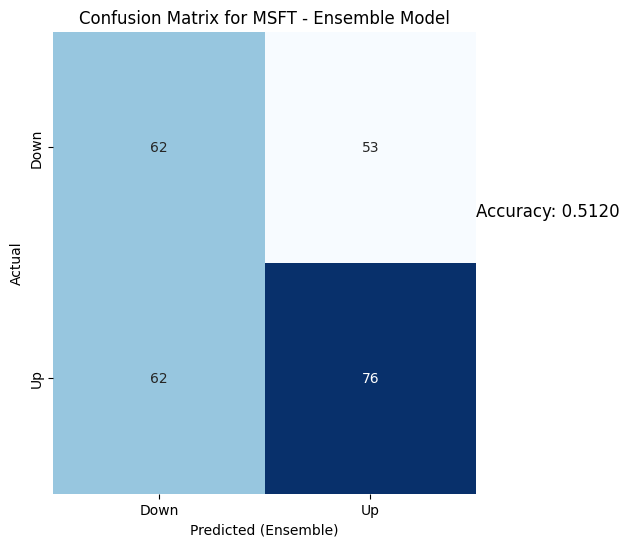

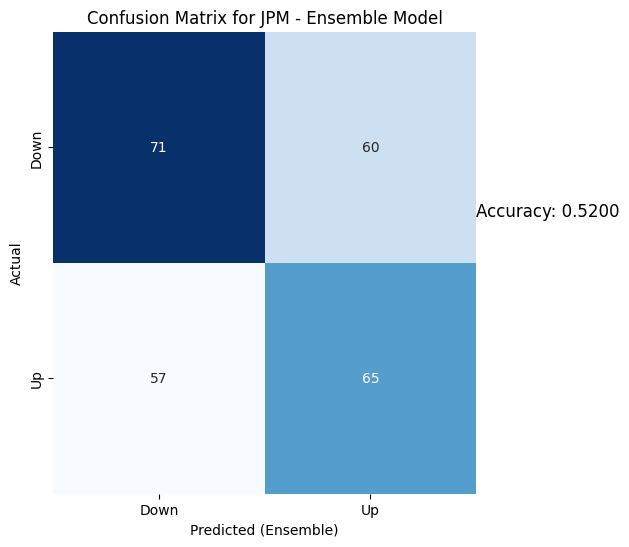

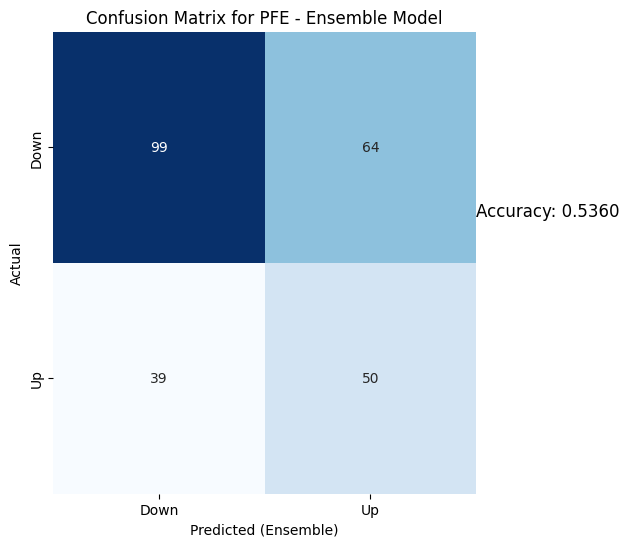

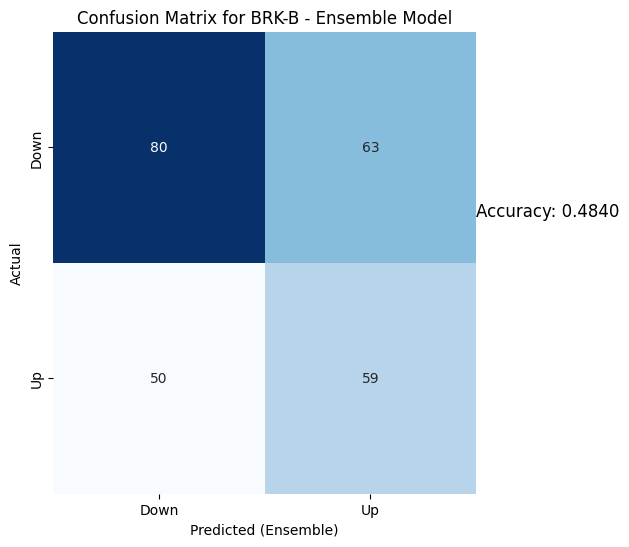

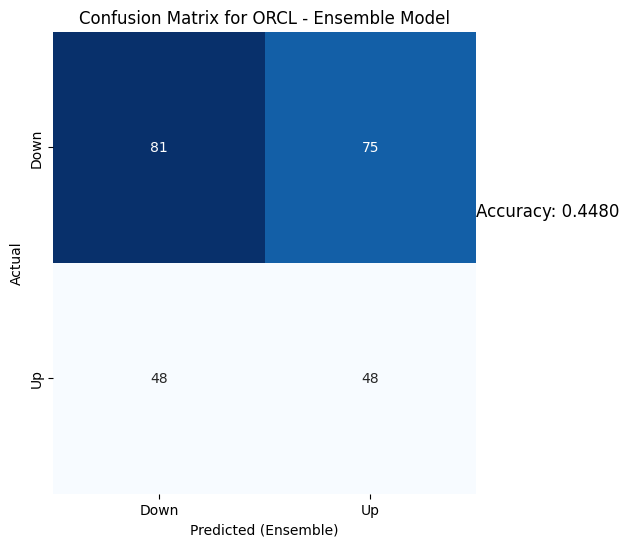

...

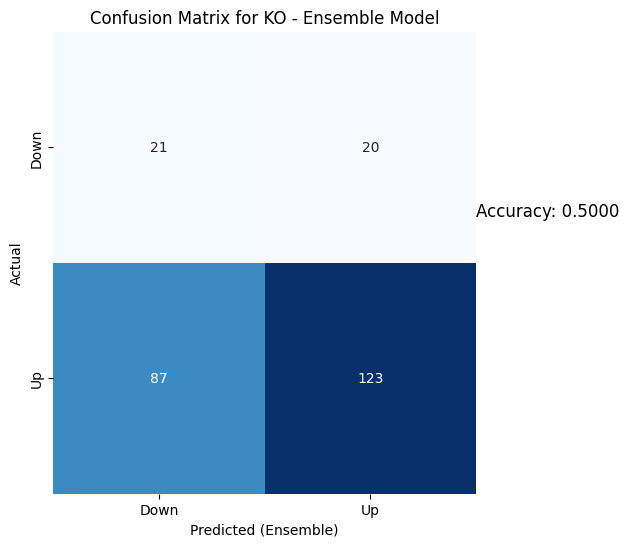

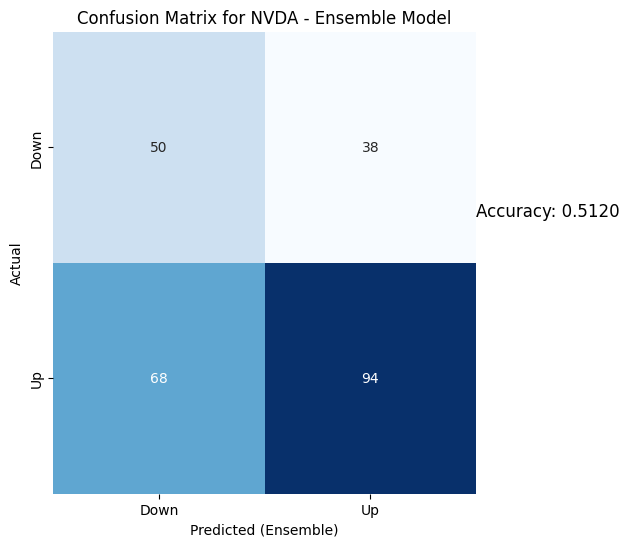

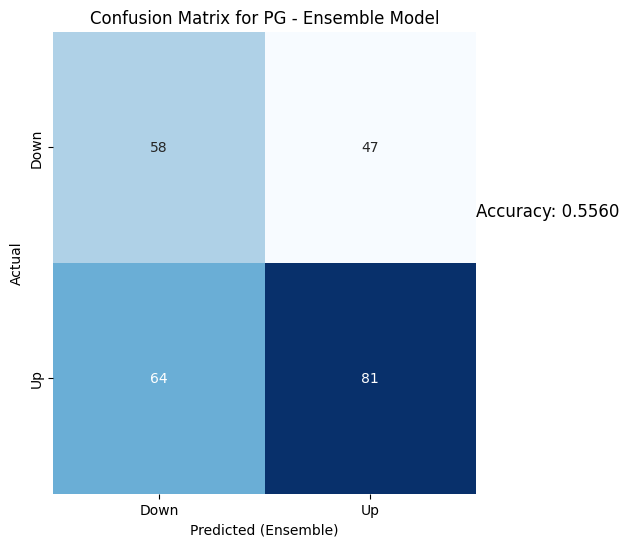

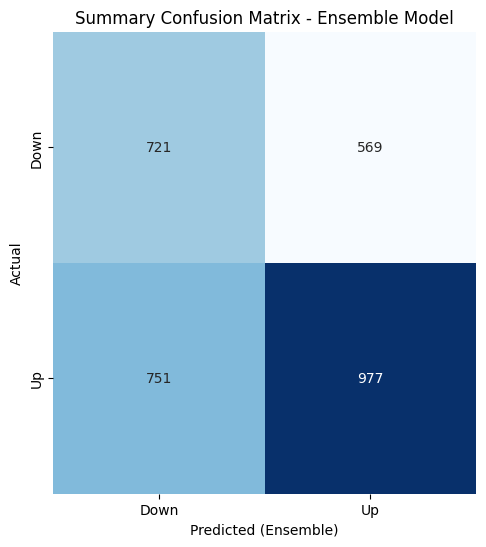

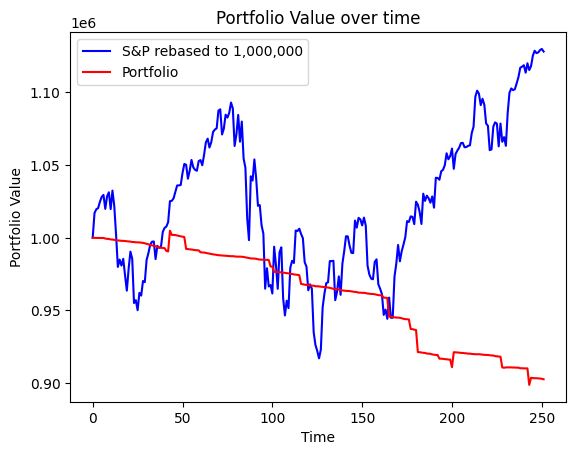

Portfolio return for our period =  90.27079923911276
S&P500 return during the period =  112.81406897564014


In [14]:
Portfolio_construct("2007-01-01")
#Testing for year 2010

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2274
[LightGBM] [Info] Number of data points in the train set: 756, number of used features: 9
[LightGBM] [Info] Start training from score 0.497354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5020
LightGBM: 0.5336
GBR: 0.5455
RandomForest: 0.4980
XGBoost: 0.5336
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6964 - accuracy: 0.5095 - val_loss: 0.6974 - val_accuracy: 0.4899
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.5145 - val_loss: 0.6931 - val_accuracy: 0.5101
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.5120 - val_loss: 0.6928 - val_accuracy: 0.5051
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.4968 - val_loss: 0.6927 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 0.5133 - val_loss: 0.6938 - val_accuracy: 0.4899
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5044 - val_loss: 0.6936 - val_accuracy: 0.5101
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5217
LightGBM: 0.5613
GBR: 0.5375
RandomForest: 0.5573
XGBoost: 0.5652
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6966 - accuracy: 0.4886 - val_loss: 0.6911 - val_accuracy: 0.5354
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6948 - accuracy: 0.5228 - val_loss: 0.6931 - val_accuracy: 0.5606
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.5165 - val_loss: 0.6904 - val_accuracy: 0.5354
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6952 - accuracy: 0.5215 - val_loss: 0.6914 - val_accuracy: 0.5354
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6947 - accuracy: 0.4848 - val_loss: 0.6909 - val_accuracy: 0.5354
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.5165 - val_loss: 0.6911 - val_accuracy: 0.5354
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4901
LightGBM: 0.5257
GBR: 0.5217
RandomForest: 0.5178
XGBoost: 0.5099
Epoch 1/10
25/25 [==============================] - 8s 57ms/step - loss: 0.6935 - accuracy: 0.5095 - val_loss: 0.7039 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6930 - accuracy: 0.5272 - val_loss: 0.6954 - val_accuracy: 0.5000
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6925 - accuracy: 0.4880 - val_loss: 0.7021 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6925 - accuracy: 0.5272 - val_loss: 0.6982 - val_accuracy: 0.5000
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6907 - accuracy: 0.5247 - val_loss: 0.6976 - val_accuracy: 0.5000
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 0.5298 - val_loss: 0.6953 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5020
LightGBM: 0.5020
GBR: 0.5178
RandomForest: 0.5059
XGBoost: 0.5138
Epoch 1/10
25/25 [==============================] - 6s 60ms/step - loss: 0.6977 - accuracy: 0.4873 - val_loss: 0.6939 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6922 - accuracy: 0.5393 - val_loss: 0.6953 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6930 - accuracy: 0.5000 - val_loss: 0.6986 - val_accuracy: 0.5051
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6903 - accuracy: 0.5381 - val_loss: 0.6975 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6899 - accuracy: 0.5381 - val_loss: 0.6957 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6901 - accuracy: 0.5381 - val_loss: 0.6948 - val_accuracy: 0.5051
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.4841
LightGBM: 0.5079
GBR: 0.5714
RandomForest: 0.4802
XGBoost: 0.5397
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6978 - accuracy: 0.5089 - val_loss: 0.6939 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6953 - accuracy: 0.4860 - val_loss: 0.6966 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6941 - accuracy: 0.4860 - val_loss: 0.6938 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6935 - accuracy: 0.5063 - val_loss: 0.6965 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6931 - accuracy: 0.5000 - val_loss: 0.6946 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.4975 - val_loss: 0.6968 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5238
LightGBM: 0.4484
GBR: 0.4563
RandomForest: 0.4683
XGBoost: 0.4524
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.6908 - accuracy: 0.5489 - val_loss: 0.7114 - val_accuracy: 0.5025
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6888 - accuracy: 0.5400 - val_loss: 0.7024 - val_accuracy: 0.5025
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 0.5616 - val_loss: 0.6999 - val_accuracy: 0.5025
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6899 - accuracy: 0.5451 - val_loss: 0.7090 - val_accuracy: 0.5025
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6924 - accuracy: 0.5337 - val_loss: 0.7029 - val_accuracy: 0.5025
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6881 - accuracy: 0.5451 - val_loss: 0.7058 - val_accuracy: 0.5025
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5198
LightGBM: 0.4643
GBR: 0.4643
RandomForest: 0.4921
XGBoost: 0.4722
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6944 - accuracy: 0.4949 - val_loss: 0.6938 - val_accuracy: 0.5279
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.5115 - val_loss: 0.6935 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.4962 - val_loss: 0.6964 - val_accuracy: 0.5279
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5089 - val_loss: 0.6953 - val_accuracy: 0.5279
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6927 - accuracy: 0.5178 - val_loss: 0.6967 - val_accuracy: 0.5279
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.5038 - val_loss: 0.6955 - val_accuracy: 0.5279
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5357
LightGBM: 0.5079
GBR: 0.5159
RandomForest: 0.5317
XGBoost: 0.5198
Epoch 1/10
25/25 [==============================] - 5s 57ms/step - loss: 0.6974 - accuracy: 0.4955 - val_loss: 0.6941 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6952 - accuracy: 0.4943 - val_loss: 0.6931 - val_accuracy: 0.5025
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6929 - accuracy: 0.5159 - val_loss: 0.6944 - val_accuracy: 0.4975
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6925 - accuracy: 0.5223 - val_loss: 0.6983 - val_accuracy: 0.4670
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6940 - accuracy: 0.4879 - val_loss: 0.7011 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6941 - accuracy: 0.5057 - val_loss: 0.6973 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5179
LightGBM: 0.5060
GBR: 0.4861
RandomForest: 0.4861
XGBoost: 0.4343
Epoch 1/10
25/25 [==============================] - 5s 57ms/step - loss: 0.6955 - accuracy: 0.5064 - val_loss: 0.6965 - val_accuracy: 0.4315
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6898 - accuracy: 0.5357 - val_loss: 0.6837 - val_accuracy: 0.5888
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6877 - accuracy: 0.5332 - val_loss: 0.6867 - val_accuracy: 0.5888
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6886 - accuracy: 0.5395 - val_loss: 0.6923 - val_accuracy: 0.5178
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6875 - accuracy: 0.5421 - val_loss: 0.6890 - val_accuracy: 0.5838
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6865 - accuracy: 0.5281 - val_loss: 0.6853 - val_accuracy: 0.5888
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5060
LightGBM: 0.5100
GBR: 0.5020
RandomForest: 0.4781
XGBoost: 0.4542
Epoch 1/10
25/25 [==============================] - 4s 19ms/step - loss: 0.6949 - accuracy: 0.5000 - val_loss: 0.7031 - val_accuracy: 0.5255
Epoch 2/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6932 - accuracy: 0.5268 - val_loss: 0.6926 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6915 - accuracy: 0.5344 - val_loss: 0.6928 - val_accuracy: 0.5255
Epoch 4/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6901 - accuracy: 0.5383 - val_loss: 0.7025 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6898 - accuracy: 0.5140 - val_loss: 0.6954 - val_accuracy: 0.5255
Epoch 6/10
25/25 [==============================] - 0s 8ms/step - loss: 0.6920 - accuracy: 0.5395 - val_loss: 0.6956 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 8ms/ste

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for NVDA:
Accuracies for NVDA:
Accuracies for NVDA:
SVR: 0.4701
LightGBM: 0.4382
GBR: 0.5100
RandomForest: 0.4382
XGBoost: 0.4582


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6957 - accuracy: 0.4968 - val_loss: 0.6957 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6901 - accuracy: 0.5364 - val_loss: 0.6987 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6901 - accuracy: 0.5313 - val_loss: 0.7088 - val_accuracy: 0.4541
Epoch 4/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6892 - accuracy: 0.5326 - val_loss: 0.6990 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6897 - accuracy: 0.5275 - val_loss: 0.7039 - val_accuracy: 0.4592
Epoch 6/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6903 - accuracy: 0.5300 - val_loss: 0.7042 - val_accuracy: 0.4541
Epoch 7/10
25/25 [==============================] - 0s 7ms/step - loss: 0.6884 - accuracy: 0.5364 - val_loss: 0.6982 - val_accuracy: 0.4949
Epoch 8/10
25/25 [=

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for PG:
Accuracies for PG:
Accuracies for PG:
SVR: 0.4900
LightGBM: 0.5020
GBR: 0.4821
RandomForest: 0.4661
XGBoost: 0.4502


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.6978 - accuracy: 0.4898 - val_loss: 0.6938 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6940 - accuracy: 0.5153 - val_loss: 0.6967 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6930 - accuracy: 0.5026 - val_loss: 0.6932 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.5217 - val_loss: 0.6933 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.5166 - val_loss: 0.6948 - val_accuracy: 0.4898
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6932 - accuracy: 0.5064 - val_loss: 0.6928 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6929 - accuracy: 0.5179 - val_loss: 0.6931 - val_accuracy: 0.5306
Epoch 8/10
25

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1056 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  34.7599983215332  and sold at  34.63999938964844
34.7400016784668
3.577500104904175


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1057 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  34.7400016784668  and sold at  34.939998626708984
NVDA bought at  3.577500104904175  and sold at  3.7174999713897705
34.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1058 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  34.939998626708984  and sold at  35.18000030517578
11.6128568649292
3.757499933242798


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1059 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  11.6128568649292  and sold at  11.557143211364746
NVDA bought at  3.757499933242798  and sold at  3.7300000190734863
31.540000915527344
11.557143211364746
35.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1060 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'VZ']
ORCL bought at  31.540000915527344  and sold at  31.65999984741211
AAPL bought at  11.557143211364746  and sold at  11.59571361541748
VZ bought at  35.439998626708984  and sold at  35.5
3.734999895095825


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1061 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.734999895095825  and sold at  3.734999895095825
42.36000061035156
16.698291778564453
3.734999895095825


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1062 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'NVDA']
JPM bought at  42.36000061035156  and sold at  42.22999954223633
PFE bought at  16.698291778564453  and sold at  16.59392738342285
NVDA bought at  3.734999895095825  and sold at  3.747499942779541
140.21987915039062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1063 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  140.21987915039062  and sold at  140.30592346191406
31.6200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1064 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.6200008392334  and sold at  31.479999542236328
31.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1065 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.479999542236328  and sold at  31.040000915527344
31.040000915527344
140.5831756591797
37.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1066 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ']
ORCL bought at  31.040000915527344  and sold at  31.170000076293945
IBM bought at  140.5831756591797  and sold at  142.12237548828125
VZ bought at  37.66999816894531  and sold at  36.22999954223633
28.600000381469727
31.030000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1067 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  28.600000381469727  and sold at  28.219999313354492
ORCL bought at  31.030000686645508  and sold at  31.040000915527344
141.14723205566406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1068 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  141.14723205566406  and sold at  140.8030548095703
140.8030548095703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1069 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  140.8030548095703  and sold at  142.5430145263672
31.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1070 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.25  and sold at  31.530000686645508
17.438329696655273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1071 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  17.438329696655273  and sold at  17.381404876708984
28.469999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1072 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  28.469999313354492  and sold at  28.350000381469727
148.6615753173828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1073 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  148.6615753173828  and sold at  152.6099395751953
32.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1074 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.290000915527344  and sold at  32.560001373291016
12.280357360839844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1075 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  12.280357360839844  and sold at  12.257499694824219
36.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1076 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.4900016784668  and sold at  35.630001068115234
32.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1077 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.0  and sold at  32.029998779296875
32.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1078 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.029998779296875  and sold at  33.2400016784668
33.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1079 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.2400016784668  and sold at  33.13999938964844
33.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1080 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.13999938964844  and sold at  32.9900016784668
156.7877655029297


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1081 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  156.7877655029297  and sold at  157.5717010498047
28.200000762939453
18.064516067504883


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1082 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  28.200000762939453  and sold at  28.280000686645508
PFE bought at  18.064516067504883  and sold at  18.178367614746094
28.280000686645508
33.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1083 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  28.280000686645508  and sold at  27.969999313354492
ORCL bought at  33.029998779296875  and sold at  32.88999938964844
33.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1084 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.2599983215332  and sold at  33.470001220703125
27.25
12.744643211364746


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1085 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  27.25  and sold at  27.229999542236328
AAPL bought at  12.744643211364746  and sold at  12.82785701751709
18.074003219604492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1086 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  18.074003219604492  and sold at  18.074003219604492
155.67877197265625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1087 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  155.67877197265625  and sold at  156.21414184570312
36.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1088 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.16999816894531  and sold at  36.369998931884766
18.377609252929688
36.369998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1089 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ']
PFE bought at  18.377609252929688  and sold at  18.206830978393555
VZ bought at  36.369998931884766  and sold at  36.619998931884766
12.520000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1090 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  12.520000457763672  and sold at  12.09321403503418
12.09321403503418
154.82791137695312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1091 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  12.09321403503418  and sold at  12.236429214477539
IBM bought at  154.82791137695312  and sold at  153.13575744628906
17.93168830871582


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1092 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  17.93168830871582  and sold at  17.89373779296875
36.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1093 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.91999816894531  and sold at  36.02000045776367
152.93499755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1094 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  152.93499755859375  and sold at  153.11663818359375
5.21750020980835


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1095 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  5.21750020980835  and sold at  5.190000057220459
45.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1096 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  45.189998626708984  and sold at  46.400001525878906
155.14340209960938
36.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1097 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  155.14340209960938  and sold at  158.5659637451172
VZ bought at  36.47999954223633  and sold at  36.650001525878906
25.889999389648438
158.5659637451172
36.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1098 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ']
MSFT bought at  25.889999389648438  and sold at  25.40999984741211
IBM bought at  158.5659637451172  and sold at  154.89483642578125
VZ bought at  36.650001525878906  and sold at  36.400001525878906
25.40999984741211
12.381071090698242
154.89483642578125
36.400001525878906
4.480000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1099 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM', 'VZ', 'NVDA']
MSFT bought at  25.40999984741211  and sold at  25.68000030517578
AAPL bought at  12.381071090698242  and sold at  12.571070671081543
IBM bought at  154.89483642578125  and sold at  155.28680419921875
VZ bought at  36.400001525878906  and sold at  35.849998474121094
NVDA bought at  4.480000019073486  and sold at  4.512499809265137
12.571070671081543


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1100 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  12.571070671081543  and sold at  12.627142906188965
18.311195373535156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1101 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  18.311195373535156  and sold at  18.861480712890625
24.780000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1102 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.780000686645508  and sold at  24.799999237060547
19.14611053466797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1103 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  19.14611053466797  and sold at  18.956356048583984
36.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1104 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.459999084472656  and sold at  36.95000076293945
31.1299991607666
36.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1105 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  31.1299991607666  and sold at  31.40999984741211
VZ bought at  36.95000076293945  and sold at  36.97999954223633
32.345001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1106 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  32.345001220703125  and sold at  32.61000061035156
4.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1107 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.829999923706055  and sold at  4.792500019073486
25.610000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1108 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  25.610000610351562  and sold at  25.389999389648438
33.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1109 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.43000030517578  and sold at  34.02000045776367
34.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1110 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  34.02000045776367  and sold at  34.13999938964844
33.91999816894531
38.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1111 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  33.91999816894531  and sold at  33.58000183105469
VZ bought at  38.380001068115234  and sold at  37.849998474121094
19.41176414489746
33.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1112 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  19.41176414489746  and sold at  19.611005783081055
ORCL bought at  33.540000915527344  and sold at  33.779998779296875
33.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1113 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.779998779296875  and sold at  33.400001525878906
11.871429443359375
156.07073974609375
37.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1114 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'VZ']
AAPL bought at  11.871429443359375  and sold at  12.004643440246582
IBM bought at  156.07073974609375  and sold at  156.73995971679688
VZ bought at  37.63999938964844  and sold at  37.689998626708984
33.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1115 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.70000076293945  and sold at  33.79999923706055
25.420000076293945
157.71510314941406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1116 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  25.420000076293945  and sold at  25.3700008392334
IBM bought at  157.71510314941406  and sold at  158.90057373046875
25.3700008392334
37.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1117 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  25.3700008392334  and sold at  25.079999923706055
VZ bought at  37.849998474121094  and sold at  37.310001373291016
4.522500038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1118 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.522500038146973  and sold at  4.505000114440918
34.75
12.524999618530273
4.630000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1119 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'NVDA']
ORCL bought at  34.75  and sold at  34.83000183105469
AAPL bought at  12.524999618530273  and sold at  12.607500076293945
NVDA bought at  4.630000114440918  and sold at  4.702499866485596
12.607500076293945
4.702499866485596


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1120 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  12.607500076293945  and sold at  12.515000343322754
NVDA bought at  4.702499866485596  and sold at  4.824999809265137
19.155597686767578
4.824999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1121 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  19.155597686767578  and sold at  19.573055267333984
NVDA bought at  4.824999809265137  and sold at  4.824999809265137
38.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1122 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.25  and sold at  38.27000045776367
25.65999984741211
37.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1123 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  25.65999984741211  and sold at  25.809999465942383
VZ bought at  37.560001373291016  and sold at  37.79999923706055
37.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1124 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.79999923706055  and sold at  37.66999816894531
37.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1125 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.119998931884766  and sold at  37.279998779296875
37.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1126 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.279998779296875  and sold at  37.2400016784668
35.20000076293945
37.2400016784668
4.9375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1127 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'NVDA']
ORCL bought at  35.20000076293945  and sold at  35.619998931884766
VZ bought at  37.2400016784668  and sold at  37.56999969482422
NVDA bought at  4.9375  and sold at  4.945000171661377
162.04588317871094
37.2599983215332
65.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1128 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'PG']
IBM bought at  162.04588317871094  and sold at  164.66539001464844
VZ bought at  37.2599983215332  and sold at  37.43000030517578
PG bought at  65.91999816894531  and sold at  66.83999633789062
37.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1129 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.2599983215332  and sold at  36.970001220703125
24.56999969482422
34.18000030517578
36.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1130 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ']
MSFT bought at  24.56999969482422  and sold at  24.520000457763672
ORCL bought at  34.18000030517578  and sold at  33.939998626708984
VZ bought at  36.970001220703125  and sold at  37.11000061035156
20.056926727294922
37.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1131 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ']
PFE bought at  20.056926727294922  and sold at  20.094877243041992
VZ bought at  37.11000061035156  and sold at  37.09000015258789
33.90999984741211
162.94454956054688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1132 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  33.90999984741211  and sold at  34.5
IBM bought at  162.94454956054688  and sold at  163.08795166015625
19.95256233215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1133 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  19.95256233215332  and sold at  19.629980087280273
37.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1134 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.150001525878906  and sold at  36.849998474121094
24.149999618530273
160.602294921875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1135 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  24.149999618530273  and sold at  24.190000534057617
IBM bought at  160.602294921875  and sold at  160.3728485107422
19.829221725463867
159.82791137695312
4.704999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1136 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM', 'NVDA']
PFE bought at  19.829221725463867  and sold at  19.857685089111328
IBM bought at  159.82791137695312  and sold at  160.13385009765625
NVDA bought at  4.704999923706055  and sold at  4.875
160.13385009765625
36.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1137 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  160.13385009765625  and sold at  161.50096130371094
VZ bought at  36.66999816894531  and sold at  36.93000030517578
161.50096130371094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1138 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  161.50096130371094  and sold at  159.2351837158203
19.97153663635254
159.2351837158203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1139 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  19.97153663635254  and sold at  19.92409896850586
IBM bought at  159.2351837158203  and sold at  158.78585815429688
158.78585815429688
66.01000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1140 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  158.78585815429688  and sold at  157.7915802001953
PG bought at  66.01000213623047  and sold at  65.43000030517578
157.7915802001953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1141 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  157.7915802001953  and sold at  157.50477600097656
157.50477600097656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1142 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  157.50477600097656  and sold at  156.49139404296875
157.11280822753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1143 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  157.11280822753906  and sold at  157.5908203125
23.959999084472656
11.838929176330566
157.5908203125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1144 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM']
MSFT bought at  23.959999084472656  and sold at  23.709999084472656
AAPL bought at  11.838929176330566  and sold at  11.639286041259766
IBM bought at  157.5908203125  and sold at  156.0038299560547
19.079696655273438
64.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1145 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'PG']
PFE bought at  19.079696655273438  and sold at  19.41176414489746
PG bought at  64.69999694824219  and sold at  64.7699966430664
24.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1146 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  24.040000915527344  and sold at  24.219999313354492
11.872857093811035


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1147 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  11.872857093811035  and sold at  11.66964340209961
64.26000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1148 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  64.26000213623047  and sold at  64.69000244140625
65.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1149 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  65.08999633789062  and sold at  64.22000122070312
32.650001525878906
64.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1150 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  32.650001525878906  and sold at  32.20000076293945
PG bought at  64.22000122070312  and sold at  64.05999755859375
63.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1151 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  63.459999084472656  and sold at  62.59000015258789
31.139999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1152 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.139999389648438  and sold at  31.579999923706055
36.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1153 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.400001525878906  and sold at  36.56999969482422
36.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1154 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.56999969482422  and sold at  36.720001220703125
36.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1155 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.720001220703125  and sold at  37.22999954223633
11.988213539123535
37.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1156 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  11.988213539123535  and sold at  12.259285926818848
VZ bought at  37.22999954223633  and sold at  37.79999923706055
19.686906814575195
12.259285926818848
64.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1157 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'PG']
PFE bought at  19.686906814575195  and sold at  19.715370178222656
AAPL bought at  12.259285926818848  and sold at  12.479642868041992
PG bought at  64.2699966430664  and sold at  64.26000213623047
12.562856674194336
37.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1158 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  12.562856674194336  and sold at  12.757143020629883
VZ bought at  37.540000915527344  and sold at  37.41999816894531
12.757143020629883


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1159 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  12.757143020629883  and sold at  12.846785545349121
12.846785545349121
168.72848510742188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1160 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  12.846785545349121  and sold at  12.64285659790039
IBM bought at  168.72848510742188  and sold at  167.29444885253906
167.29444885253906
37.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1161 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  167.29444885253906  and sold at  166.3957977294922
VZ bought at  37.119998931884766  and sold at  37.09000015258789
64.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1162 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  64.52999877929688  and sold at  64.63999938964844
12.77750015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1163 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  12.77750015258789  and sold at  13.032856941223145
32.09000015258789
13.032856941223145


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1164 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  32.09000015258789  and sold at  31.489999771118164
AAPL bought at  13.032856941223145  and sold at  13.350000381469727
13.458929061889648


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1165 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.458929061889648  and sold at  13.817856788635254
32.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1166 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.08000183105469  and sold at  32.470001220703125
42.290000915527344
37.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1167 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  42.290000915527344  and sold at  42.189998626708984
VZ bought at  37.56999969482422  and sold at  36.7400016784668
42.189998626708984
36.7400016784668
64.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1168 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'PG']
JPM bought at  42.189998626708984  and sold at  41.689998626708984
VZ bought at  36.7400016784668  and sold at  36.220001220703125
PG bought at  64.25  and sold at  63.310001373291016
32.209999084472656
14.23214340209961
63.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1169 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'PG']
ORCL bought at  32.209999084472656  and sold at  32.150001525878906
AAPL bought at  14.23214340209961  and sold at  14.407500267028809
PG bought at  63.310001373291016  and sold at  63.09000015258789
36.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1170 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.279998779296875  and sold at  36.209999084472656
30.709999084472656
173.374755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1171 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  30.709999084472656  and sold at  30.670000076293945
IBM bought at  173.374755859375  and sold at  173.8049774169922
173.8049774169922
35.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1172 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  173.8049774169922  and sold at  173.85276794433594
VZ bought at  35.65999984741211  and sold at  35.290000915527344
35.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1173 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  35.290000915527344  and sold at  35.869998931884766
172.8011474609375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1174 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  172.8011474609375  and sold at  170.21987915039062
29.549999237060547
13.889642715454102
170.21987915039062
35.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1175 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'IBM', 'VZ']
ORCL bought at  29.549999237060547  and sold at  30.190000534057617
AAPL bought at  13.889642715454102  and sold at  14.020357131958008
IBM bought at  170.21987915039062  and sold at  170.965576171875
VZ bought at  35.4900016784668  and sold at  35.970001220703125
14.020357131958008
170.965576171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1176 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  14.020357131958008  and sold at  13.477499961853027
IBM bought at  170.965576171875  and sold at  163.93881225585938
34.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1177 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  34.91999816894531  and sold at  35.04999923706055
13.343570709228516
35.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1178 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  13.343570709228516  and sold at  12.614643096923828
VZ bought at  35.04999923706055  and sold at  33.119998931884766
26.020000457763672
33.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1179 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  26.020000457763672  and sold at  27.600000381469727
VZ bought at  33.119998931884766  and sold at  34.290000915527344
34.290000915527344
60.220001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1180 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  34.290000915527344  and sold at  33.65999984741211
PG bought at  60.220001220703125  and sold at  58.5099983215332
155.3919677734375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1181 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  155.3919677734375  and sold at  159.397705078125
25.190000534057617
159.397705078125
34.619998931884766
7.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1182 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ', 'BAC']
MSFT bought at  25.190000534057617  and sold at  25.100000381469727
IBM bought at  159.397705078125  and sold at  160.8030548095703
VZ bought at  34.619998931884766  and sold at  34.29999923706055
BAC bought at  7.25  and sold at  7.190000057220459
13.693214416503906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1183 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.693214416503906  and sold at  13.588570594787598
3.247499942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1184 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.247499942779541  and sold at  3.202500104904175
17.542694091796875
13.587142944335938
61.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1185 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'PG']
PFE bought at  17.542694091796875  and sold at  16.802656173706055
AAPL bought at  13.587142944335938  and sold at  13.073213577270508
PG bought at  61.66999816894531  and sold at  60.86000061035156
156.625244140625
60.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1186 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  156.625244140625  and sold at  150.6118621826172
PG bought at  60.86000061035156  and sold at  60.959999084472656
61.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1187 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.709999084472656  and sold at  63.02000045776367
26.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1188 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  26.200000762939453  and sold at  26.68000030517578
26.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1189 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  26.68000030517578  and sold at  25.899999618530273
35.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1190 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  35.7599983215332  and sold at  36.13999938964844
13.743928909301758
36.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1191 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  13.743928909301758  and sold at  13.608214378356934
VZ bought at  36.16999816894531  and sold at  35.880001068115234
13.608214378356934


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1192 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.608214378356934  and sold at  13.358928680419922
157.8489532470703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1193 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  157.8489532470703  and sold at  159.9521942138672
34.81999969482422
13.711786270141602
35.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1194 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'VZ']
JPM bought at  34.81999969482422  and sold at  33.5099983215332
AAPL bought at  13.711786270141602  and sold at  13.71928596496582
VZ bought at  35.619998931884766  and sold at  35.380001068115234
157.9827880859375
62.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1195 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  157.9827880859375  and sold at  154.27342224121094
PG bought at  62.90999984741211  and sold at  61.84000015258789
13.481429100036621


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1196 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.481429100036621  and sold at  13.569286346435547
13.569286346435547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1197 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.569286346435547  and sold at  13.736429214477539
13.903571128845215


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1198 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.903571128845215  and sold at  14.034285545349121
63.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1199 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  63.02000045776367  and sold at  61.16999816894531
161.20458984375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1200 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  161.20458984375  and sold at  161.89292907714844
61.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1201 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.25  and sold at  62.540000915527344
166.8355712890625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1202 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  166.8355712890625  and sold at  169.89483642578125
13.948928833007812
63.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1203 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  13.948928833007812  and sold at  13.618571281433105
PG bought at  63.70000076293945  and sold at  63.18000030517578
63.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1204 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  63.18000030517578  and sold at  62.84000015258789
13.378570556640625
62.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1205 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  13.378570556640625  and sold at  13.303570747375488
PG bought at  62.84000015258789  and sold at  63.369998931884766
36.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1206 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.400001525878906  and sold at  35.77000045776367
13.477499961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1207 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.477499961853027  and sold at  13.20714282989502
13.20714282989502
36.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1208 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  13.20714282989502  and sold at  13.88607120513916
VZ bought at  36.15999984741211  and sold at  36.900001525878906
36.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1209 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.900001525878906  and sold at  36.5
14.36392879486084
36.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1210 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  14.36392879486084  and sold at  14.586786270141602
VZ bought at  36.66999816894531  and sold at  37.02000045776367
33.92499923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1211 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  33.92499923706055  and sold at  33.5
17.73244857788086
64.26000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1212 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'PG']
PFE bought at  17.73244857788086  and sold at  17.99810218811035
PG bought at  64.26000213623047  and sold at  64.91999816894531
15.079999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1213 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  15.079999923706055  and sold at  14.236429214477539
33.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1214 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  33.4900016784668  and sold at  34.18000030517578
26.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1215 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  26.59000015258789  and sold at  27.25
37.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1216 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  37.630001068115234  and sold at  36.97999954223633
63.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1217 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  63.9900016784668  and sold at  62.709999084472656
33.63999938964844
175.8317413330078


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1218 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM']
JPM bought at  33.63999938964844  and sold at  34.380001068115234
IBM bought at  175.8317413330078  and sold at  179.06309509277344
179.06309509277344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1219 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  179.06309509277344  and sold at  178.18356323242188
33.970001220703125
37.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1220 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  33.970001220703125  and sold at  34.2400016784668
VZ bought at  37.16999816894531  and sold at  37.34000015258789
35.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1221 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  35.02000045776367  and sold at  32.540000915527344
36.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1222 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.88999938964844  and sold at  37.33000183105469
33.279998779296875
37.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1223 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  33.279998779296875  and sold at  32.54999923706055
VZ bought at  37.52000045776367  and sold at  37.0
31.469999313354492
178.41299438476562
36.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1224 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ']
JPM bought at  31.469999313354492  and sold at  30.489999771118164
IBM bought at  178.41299438476562  and sold at  177.5621337890625
VZ bought at  36.650001525878906  and sold at  36.70000076293945
36.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1225 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  36.70000076293945  and sold at  36.459999084472656
177.09368896484375
63.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1226 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  177.09368896484375  and sold at  173.49903869628906
PG bought at  63.2400016784668  and sold at  61.65999984741211
61.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1227 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  61.060001373291016  and sold at  61.0
62.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1228 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  62.2400016784668  and sold at  62.529998779296875
13.328571319580078
62.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1229 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  13.328571319580078  and sold at  13.649999618530273
PG bought at  62.529998779296875  and sold at  64.56999969482422
32.33000183105469
18.870967864990234
181.31930541992188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1230 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'IBM']
JPM bought at  32.33000183105469  and sold at  33.5099983215332
PFE bought at  18.870967864990234  and sold at  18.823528289794922
IBM bought at  181.31930541992188  and sold at  182.44741821289062
33.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1231 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  33.5099983215332  and sold at  33.22999954223633
13.896071434020996


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1232 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  13.896071434020996  and sold at  13.952142715454102
183.15487670898438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1233 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  183.15487670898438  and sold at  186.0038299560547
[1000000.0, 1010337.9964354497, 1009781.3388225336, 1015029.8162198684, 1013041.7446492916, 1011053.6730787152, 1009781.3388225336, 1013359.8433811195, 1022504.9847399977, 1020834.9512301193, 1028230.6405706387, 1029980.1532601267, 1019880.7157057654, 1018528.8415988445, 1020834.9512301193, 1026640.2075826293, 1027196.804524416, 1031172.9476655691, 1033717.7375201914, 1015666.0136835239, 1023300.1405628728, 1039681.9522319209, 1037693.8806613445, 1039999.9902926193, 1042942.2973875498, 1049463.2303833251, 1054234.6506896124, 1051848.9405364685, 1052246.5791190357, 1058528.8318914636, 1061073.500403827, 1057733.5547263296, 1064413.5674235835, 1067594.4333996023, 1069821.0638512673, 1048349.9151574926, 1041908.5826835859, 1041192.7846980615, 1052326.0582986455, 1058846.869952162, 1041192.7846980615, 1043419.5364919855, 1061391.6598067842, 1053439.

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1234 times so far.

  warnings.warn(msg, UserWarning)


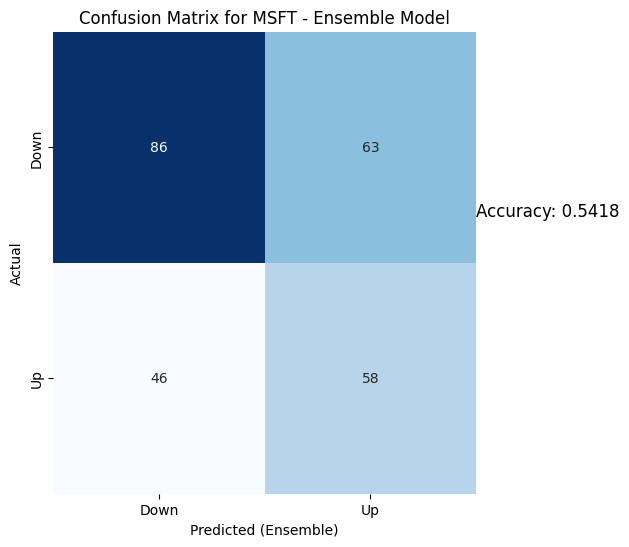

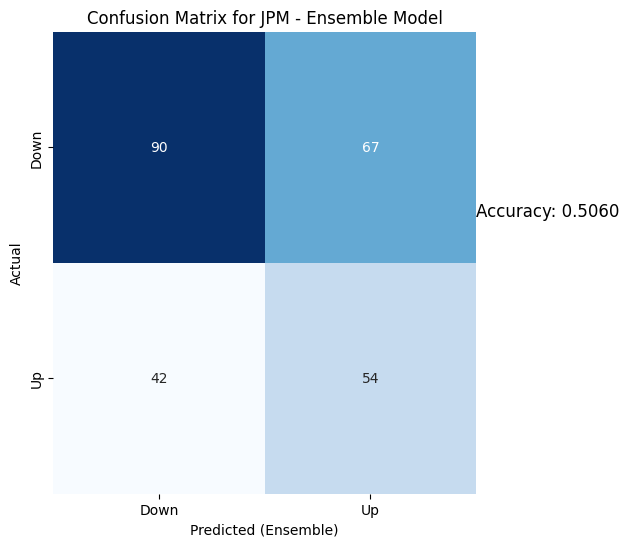

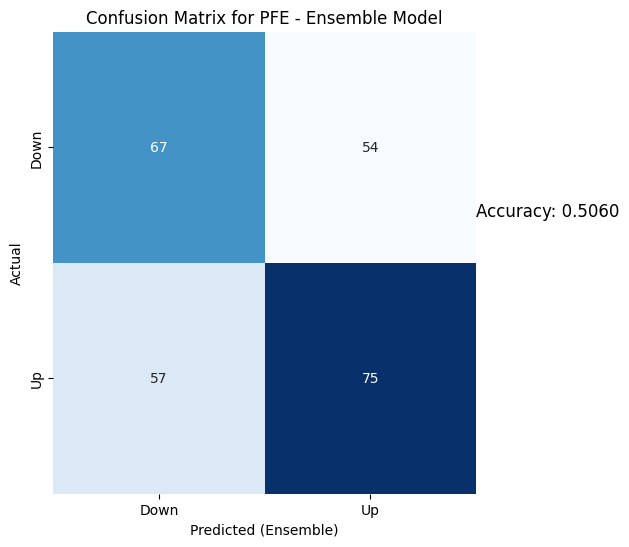

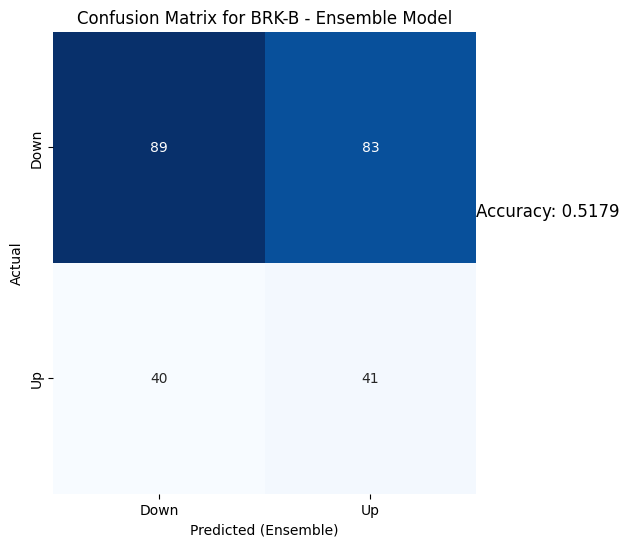

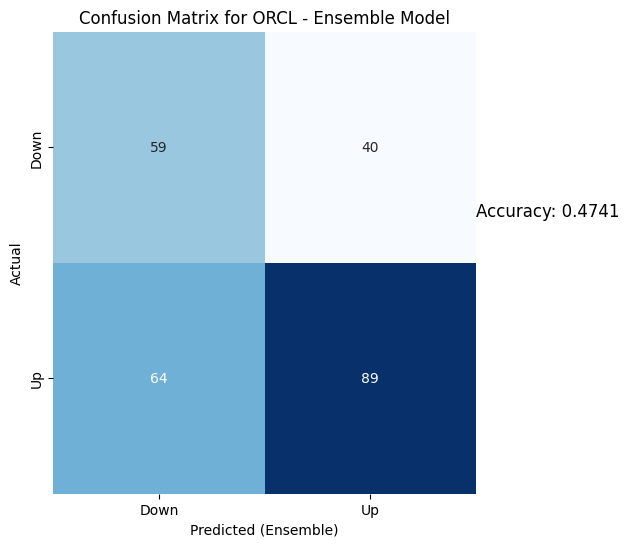

...

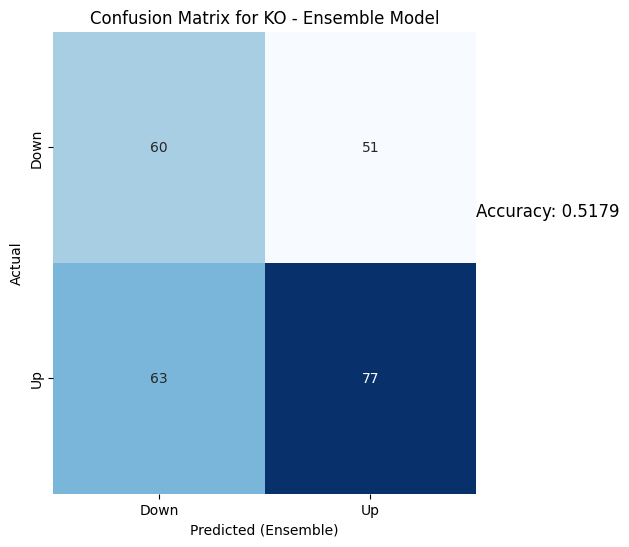

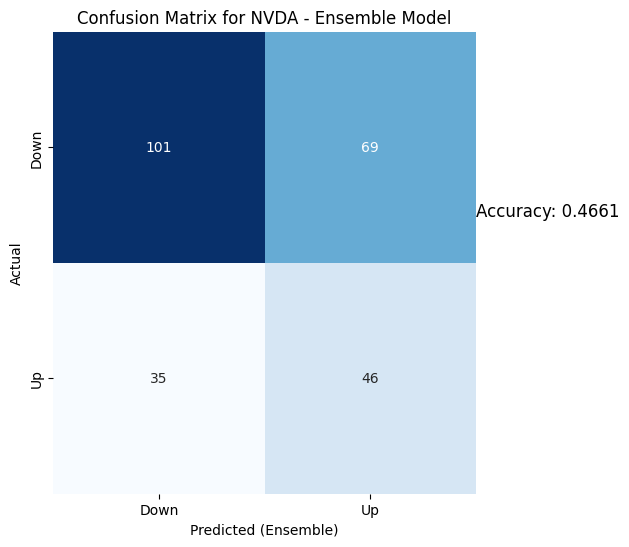

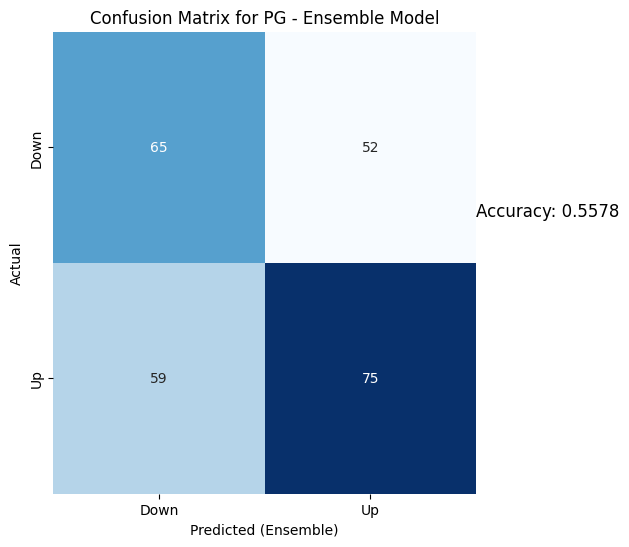

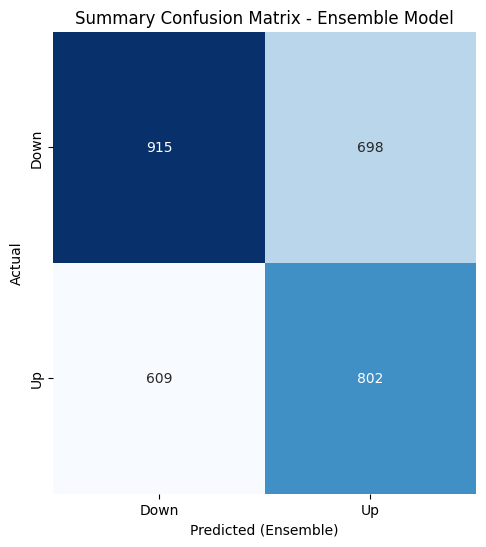

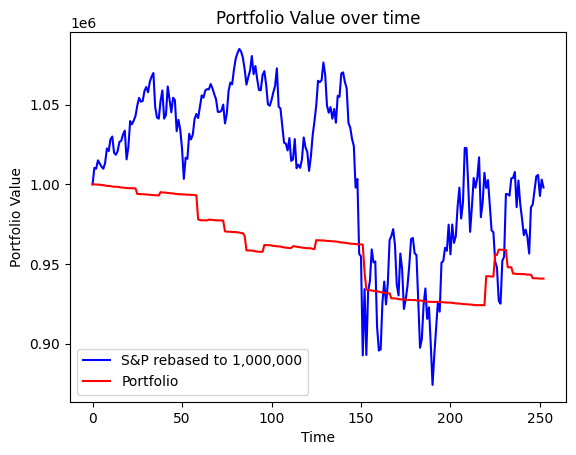

Portfolio return for our period =  94.08850379357165
S&P500 return during the period =  99.80119284294234


In [15]:
Portfolio_construct("2008-01-01")
#Testing for year 2011

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2264
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.517928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4524
LightGBM: 0.5198
GBR: 0.5198
RandomForest: 0.5357
XGBoost: 0.4722
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6978 - accuracy: 0.5025 - val_loss: 0.6873 - val_accuracy: 0.5939
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5165 - val_loss: 0.6948 - val_accuracy: 0.4416
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6945 - accuracy: 0.5140 - val_loss: 0.6940 - val_accuracy: 0.4416
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6927 - accuracy: 0.5140 - val_loss: 0.6973 - val_accuracy: 0.4061
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.5190 - val_loss: 0.6877 - val_accuracy: 0.5939
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.4987 - val_loss: 0.6901 - val_accuracy: 0.5939
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4881
LightGBM: 0.4683
GBR: 0.5437
RandomForest: 0.4960
XGBoost: 0.5595
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6955 - accuracy: 0.4816 - val_loss: 0.6914 - val_accuracy: 0.5533
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.5019 - val_loss: 0.6914 - val_accuracy: 0.5431
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6936 - accuracy: 0.5121 - val_loss: 0.6917 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6947 - accuracy: 0.5032 - val_loss: 0.6919 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5108 - val_loss: 0.6934 - val_accuracy: 0.4975
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5210 - val_loss: 0.6920 - val_accuracy: 0.5482
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5159
LightGBM: 0.5040
GBR: 0.5556
RandomForest: 0.5238
XGBoost: 0.5159
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6941 - accuracy: 0.5089 - val_loss: 0.7064 - val_accuracy: 0.4822
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6948 - accuracy: 0.4911 - val_loss: 0.6942 - val_accuracy: 0.4721
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6956 - accuracy: 0.5013 - val_loss: 0.6930 - val_accuracy: 0.5178
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6941 - accuracy: 0.5229 - val_loss: 0.6950 - val_accuracy: 0.4822
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5204 - val_loss: 0.6962 - val_accuracy: 0.4822
Epoch 6/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6926 - accuracy: 0.5127 - val_loss: 0.6941 - val_accuracy: 0.4924
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.4881
LightGBM: 0.4960
GBR: 0.5079
RandomForest: 0.5198
XGBoost: 0.4881
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6976 - accuracy: 0.4955 - val_loss: 0.6996 - val_accuracy: 0.5025
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6947 - accuracy: 0.5083 - val_loss: 0.6928 - val_accuracy: 0.5025
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5134 - val_loss: 0.6929 - val_accuracy: 0.5025
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5121 - val_loss: 0.6923 - val_accuracy: 0.5025
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6971 - accuracy: 0.4815 - val_loss: 0.6923 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6962 - accuracy: 0.5045 - val_loss: 0.6937 - val_accuracy: 0.5025
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5139
LightGBM: 0.5219
GBR: 0.5339
RandomForest: 0.4741
XGBoost: 0.5299
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6972 - accuracy: 0.4796 - val_loss: 0.6946 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6988 - accuracy: 0.4770 - val_loss: 0.6941 - val_accuracy: 0.4873
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6946 - accuracy: 0.4923 - val_loss: 0.6929 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.4987 - val_loss: 0.6938 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.4949 - val_loss: 0.6928 - val_accuracy: 0.5279
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.4719 - val_loss: 0.6928 - val_accuracy: 0.5076
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5219
LightGBM: 0.4940
GBR: 0.5060
RandomForest: 0.4422
XGBoost: 0.4781
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6887 - accuracy: 0.5625 - val_loss: 0.6943 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6899 - accuracy: 0.5625 - val_loss: 0.7103 - val_accuracy: 0.4745
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6880 - accuracy: 0.5625 - val_loss: 0.6949 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6877 - accuracy: 0.5651 - val_loss: 0.7111 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6864 - accuracy: 0.5625 - val_loss: 0.7024 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6862 - accuracy: 0.5625 - val_loss: 0.7008 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.4980
LightGBM: 0.4940
GBR: 0.5139
RandomForest: 0.5100
XGBoost: 0.5179
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6945 - accuracy: 0.5198 - val_loss: 0.7012 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.4917 - val_loss: 0.7309 - val_accuracy: 0.4745
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6997 - accuracy: 0.5326 - val_loss: 0.7018 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.5172 - val_loss: 0.7039 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.5338 - val_loss: 0.7097 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.5313 - val_loss: 0.7029 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5339
LightGBM: 0.4701
GBR: 0.4900
RandomForest: 0.4582
XGBoost: 0.4781
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6941 - accuracy: 0.5090 - val_loss: 0.6952 - val_accuracy: 0.5255
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6924 - accuracy: 0.5205 - val_loss: 0.6921 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5307 - val_loss: 0.6912 - val_accuracy: 0.5459
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.5166 - val_loss: 0.6919 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6923 - accuracy: 0.5243 - val_loss: 0.6915 - val_accuracy: 0.5255
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6932 - accuracy: 0.4987 - val_loss: 0.6917 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 16

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.4720
LightGBM: 0.4720
GBR: 0.5600
RandomForest: 0.5040
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6933 - accuracy: 0.5403 - val_loss: 0.6926 - val_accuracy: 0.5153
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.5006 - val_loss: 0.6976 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.5096 - val_loss: 0.6975 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 0.5134 - val_loss: 0.6938 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6921 - accuracy: 0.5262 - val_loss: 0.7003 - val_accuracy: 0.4847
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6915 - accuracy: 0.5173 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4880
LightGBM: 0.5040
GBR: 0.5200
RandomForest: 0.5480
XGBoost: 0.5080
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6959 - accuracy: 0.5141 - val_loss: 0.7048 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6935 - accuracy: 0.5359 - val_loss: 0.6910 - val_accuracy: 0.5663
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6902 - accuracy: 0.5397 - val_loss: 0.6911 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6906 - accuracy: 0.5397 - val_loss: 0.6910 - val_accuracy: 0.5153
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6910 - accuracy: 0.5346 - val_loss: 0.6913 - val_accuracy: 0.5255
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6900 - accuracy: 0.5372 - val_loss: 0.6913 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 20

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.4840
LightGBM: 0.4600
GBR: 0.5000
RandomForest: 0.4920
XGBoost: 0.4920
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6998 - accuracy: 0.4744 - val_loss: 0.6930 - val_accuracy: 0.5385
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 0.5167 - val_loss: 0.6922 - val_accuracy: 0.5179
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.5321 - val_loss: 0.6924 - val_accuracy: 0.5179
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6896 - accuracy: 0.5269 - val_loss: 0.6931 - val_accuracy: 0.5179
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6893 - accuracy: 0.5385 - val_loss: 0.6937 - val_accuracy: 0.5179
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6904 - accuracy: 0.5308 - val_loss: 0.6936 - val_accuracy: 0.5179
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5040
LightGBM: 0.5520
GBR: 0.5640
RandomForest: 0.5360
XGBoost: 0.5240
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6936 - accuracy: 0.4904 - val_loss: 0.7021 - val_accuracy: 0.4667
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6948 - accuracy: 0.5237 - val_loss: 0.6934 - val_accuracy: 0.4872
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.5417 - val_loss: 0.7022 - val_accuracy: 0.4667
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 0.5199 - val_loss: 0.6965 - val_accuracy: 0.4667
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6918 - accuracy: 0.5353 - val_loss: 0.6995 - val_accuracy: 0.4667
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5263 - val_loss: 0.7000 - val_accuracy: 0.4667
Epoch 7/10
25/25 [==============================] - 0s 18

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1235 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'BAC', 'KO']
PFE bought at  19.696395874023438  and sold at  19.791271209716797
AAPL bought at  13.88607120513916  and sold at  13.578213691711426
IBM bought at  182.74378967285156  and sold at  180.420654296875
BAC bought at  5.320000171661377  and sold at  5.230000019073486
KO bought at  33.2400016784668  and sold at  33.130001068115234
180.420654296875
5.230000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1236 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  180.420654296875  and sold at  179.2351837158203
BAC bought at  5.230000019073486  and sold at  5.260000228881836
179.2351837158203
5.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1237 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  179.2351837158203  and sold at  175.49713134765625
BAC bought at  5.260000228881836  and sold at  5.199999809265137
26.0
13.607856750488281
38.779998779296875
5.199999809265137
65.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1238 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'VZ', 'BAC', 'PG']
MSFT bought at  26.0  and sold at  25.530000686645508
AAPL bought at  13.607856750488281  and sold at  13.650357246398926
VZ bought at  38.779998779296875  and sold at  38.630001068115234
BAC bought at  5.199999809265137  and sold at  4.989999771118164
PG bought at  65.13999938964844  and sold at  64.94999694824219
20.056926727294922
13.650357246398926
4.989999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1239 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'BAC']
PFE bought at  20.056926727294922  and sold at  20.360530853271484
AAPL bought at  13.650357246398926  and sold at  14.141071319580078
BAC bought at  4.989999771118164  and sold at  5.170000076293945
5.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1240 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  5.170000076293945  and sold at  5.230000019073486
20.569259643554688
14.158928871154785
39.22999954223633
5.230000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1241 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'VZ', 'BAC']
PFE bought at  20.569259643554688  and sold at  20.521821975708008
AAPL bought at  14.158928871154785  and sold at  14.233928680419922
VZ bought at  39.22999954223633  and sold at  39.290000915527344
BAC bought at  5.230000019073486  and sold at  5.46999979019165
14.404643058776855
5.599999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1242 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  14.404643058776855  and sold at  14.518928527832031
BAC bought at  5.599999904632568  and sold at  5.480000019073486
14.518928527832031


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1243 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  14.518928527832031  and sold at  14.380000114440918
14.380000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1244 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  14.380000114440918  and sold at  14.468570709228516
5.460000038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1245 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  5.460000038146973  and sold at  5.559999942779541
14.464285850524902


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1246 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  14.464285850524902  and sold at  14.686785697937012
14.686785697937012
178.10707092285156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1247 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  14.686785697937012  and sold at  14.765713691711426
IBM bought at  178.10707092285156  and sold at  177.3804931640625
14.765713691711426
177.3804931640625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1248 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  14.765713691711426  and sold at  14.929642677307129
IBM bought at  177.3804931640625  and sold at  176.53919982910156
14.929642677307129
176.53919982910156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1249 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  14.929642677307129  and sold at  15.085714340209961
IBM bought at  176.53919982910156  and sold at  174.51242065429688
174.51242065429688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1250 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  174.51242065429688  and sold at  173.6042022705078
173.6042022705078
6.269999980926514


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1251 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  173.6042022705078  and sold at  173.33651733398438
BAC bought at  6.269999980926514  and sold at  6.630000114440918
173.33651733398438
34.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1252 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  173.33651733398438  and sold at  174.30210876464844
KO bought at  34.66999816894531  and sold at  34.029998779296875
172.6099395751953
6.789999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1253 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  172.6099395751953  and sold at  171.28106689453125
BAC bought at  6.789999961853027  and sold at  6.610000133514404
6.480000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1254 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  6.480000019073486  and sold at  6.800000190734863
15.276785850524902


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1255 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  15.276785850524902  and sold at  15.010713577270508
15.014642715454102


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1256 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  15.014642715454102  and sold at  15.952142715454102
15.879643440246582
7.300000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1257 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  15.879643440246582  and sold at  15.974286079406738
BAC bought at  7.300000190734863  and sold at  7.289999961853027
20.474382400512695
16.17892837524414
63.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1258 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'PG']
PFE bought at  20.474382400512695  and sold at  20.303604125976562
AAPL bought at  16.17892837524414  and sold at  16.3028564453125
PG bought at  63.209999084472656  and sold at  63.040000915527344
16.3028564453125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1259 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  16.3028564453125  and sold at  16.292499542236328
20.218215942382812


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1260 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  20.218215942382812  and sold at  20.02846336364746
16.25428581237793
7.449999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1261 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  16.25428581237793  and sold at  16.417142868041992
BAC bought at  7.449999809265137  and sold at  7.840000152587891
16.417142868041992
37.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1262 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  16.417142868041992  and sold at  16.570356369018555
VZ bought at  37.84000015258789  and sold at  38.13999938964844
16.570356369018555


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1263 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  16.570356369018555  and sold at  16.743928909301758
7.849999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1264 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.849999904632568  and sold at  8.130000114440918
8.130000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1265 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.130000114440918  and sold at  8.180000305175781
8.180000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1266 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.180000305175781  and sold at  8.069999694824219
8.069999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1267 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.069999694824219  and sold at  8.25
18.19499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1268 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  18.19499969482422  and sold at  17.773929595947266
17.936071395874023


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1269 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  17.936071395874023  and sold at  17.932857513427734
17.932857513427734
64.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1270 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  17.932857513427734  and sold at  18.387500762939453
PG bought at  64.91000366210938  and sold at  64.41999816894531
38.130001068115234
8.020000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1271 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  38.130001068115234  and sold at  38.13999938964844
BAC bought at  8.020000457763672  and sold at  7.880000114440918
38.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1272 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.13999938964844  and sold at  38.130001068115234
38.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1273 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.130001068115234  and sold at  38.150001525878906
19.445356369018555
38.43000030517578
8.119999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1274 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'BAC']
AAPL bought at  19.445356369018555  and sold at  19.470714569091797
VZ bought at  38.43000030517578  and sold at  38.66999816894531
BAC bought at  8.119999885559082  and sold at  8.130000114440918
19.04142951965332
39.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1275 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  19.04142951965332  and sold at  18.937856674194336
VZ bought at  39.0  and sold at  38.689998626708984
8.020000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1276 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.020000457763672  and sold at  8.0600004196167
19.47035789489746


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1277 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  19.47035789489746  and sold at  19.71428680419922
8.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1278 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.489999771118164  and sold at  8.84000015258789
20.912857055664062
9.239999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1279 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  20.912857055664062  and sold at  20.9132137298584
BAC bought at  9.239999771118164  and sold at  9.800000190734863
20.9132137298584
9.800000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1280 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  20.9132137298584  and sold at  21.467857360839844
BAC bought at  9.800000190734863  and sold at  9.529999732971191
9.819999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1281 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  9.819999694824219  and sold at  9.600000381469727
21.287500381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1282 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.287500381469727  and sold at  21.6778564453125
21.945714950561523


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1283 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.945714950561523  and sold at  22.057857513427734
38.459999084472656
9.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1284 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  38.459999084472656  and sold at  38.38999938964844
BAC bought at  9.489999771118164  and sold at  9.199999809265137
196.4340362548828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1285 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  196.4340362548828  and sold at  195.92733764648438
193.43212890625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1286 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  193.43212890625  and sold at  193.67112731933594
36.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1287 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  36.11000061035156  and sold at  35.970001220703125
37.43000030517578
8.789999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1288 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  37.43000030517578  and sold at  37.7400016784668
BAC bought at  8.789999961853027  and sold at  8.920000076293945
38.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1289 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.150001525878906  and sold at  38.72999954223633
38.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1290 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.72999954223633  and sold at  38.56999969482422
38.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1291 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  38.56999969482422  and sold at  39.5
66.87000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1292 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  66.87000274658203  and sold at  64.44000244140625
40.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1293 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  40.380001068115234  and sold at  40.560001373291016
29.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1294 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  29.709999084472656  and sold at  29.3799991607666
28.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1295 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  28.40999984741211  and sold at  27.920000076293945
40.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1296 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  40.529998779296875  and sold at  40.54999923706055
7.789999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1297 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.789999961853027  and sold at  7.730000019073486
7.730000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1298 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.730000019073486  and sold at  7.699999809265137
7.699999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1299 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.699999809265137  and sold at  7.550000190734863
7.550000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1300 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.550000190734863  and sold at  7.349999904632568
40.88999938964844
7.349999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1301 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  40.88999938964844  and sold at  41.04999923706055
BAC bought at  7.349999904632568  and sold at  7.300000190734863
7.300000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1302 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.300000190734863  and sold at  7.110000133514404
7.110000133514404


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1303 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.110000133514404  and sold at  6.980000019073486
18.942142486572266
7.019999980926514


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1304 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  18.942142486572266  and sold at  20.045713424682617
BAC bought at  7.019999980926514  and sold at  6.829999923706055
7.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1305 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.170000076293945  and sold at  7.139999866485596
7.150000095367432


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1306 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.150000095367432  and sold at  7.440000057220459
7.440000057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1307 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.440000057220459  and sold at  7.199999809265137
26.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1308 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  26.170000076293945  and sold at  26.469999313354492
7.349999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1309 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.349999904632568  and sold at  7.019999980926514
7.019999980926514


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1310 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.019999980926514  and sold at  6.900000095367432
7.099999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1311 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.099999904632568  and sold at  7.639999866485596
27.530000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1312 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  27.530000686645508  and sold at  27.18000030517578
20.41857147216797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1313 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.41857147216797  and sold at  20.7257137298584
20.398929595947266
42.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1314 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  20.398929595947266  and sold at  20.5771427154541
VZ bought at  42.560001373291016  and sold at  42.939998626708984
190.3441619873047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1315 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  190.3441619873047  and sold at  189.56979370117188
20.920713424682617
43.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1316 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  20.920713424682617  and sold at  20.97892951965332
VZ bought at  43.81999969482422  and sold at  43.72999954223633
8.109999656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1317 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.109999656677246  and sold at  8.140000343322754
60.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1318 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  60.38999938964844  and sold at  59.75
20.631071090698242


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1319 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.631071090698242  and sold at  20.78928565979004
20.78928565979004


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1320 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.78928565979004  and sold at  20.3846435546875
20.3846435546875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1321 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.3846435546875  and sold at  20.429643630981445
59.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1322 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  59.27000045776367  and sold at  59.97999954223633
20.51785659790039


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1323 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.51785659790039  and sold at  20.323213577270508
7.739999771118164
60.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1324 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  7.739999771118164  and sold at  8.180000305175781
PG bought at  60.290000915527344  and sold at  61.25
8.050000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1325 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.050000190734863  and sold at  8.0600004196167
21.407499313354492
61.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1326 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  21.407499313354492  and sold at  21.783571243286133
PG bought at  61.36000061035156  and sold at  61.349998474121094
44.88999938964844
61.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1327 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  44.88999938964844  and sold at  44.41999816894531
PG bought at  61.349998474121094  and sold at  61.279998779296875
7.659999847412109
61.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1328 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  7.659999847412109  and sold at  7.559999942779541
PG bought at  61.279998779296875  and sold at  61.54999923706055
21.92464256286621


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1329 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.92464256286621  and sold at  21.721786499023438
21.721786499023438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1330 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.721786499023438  and sold at  21.5867862701416
7.480000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1331 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.480000019073486  and sold at  7.820000171661377
7.820000171661377


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1332 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.820000171661377  and sold at  7.809999942779541
7.809999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1333 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.809999942779541  and sold at  7.920000076293945
65.3499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1334 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  65.3499984741211  and sold at  64.81999969482422
21.652143478393555


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1335 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.652143478393555  and sold at  21.940000534057617
21.940000534057617
64.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1336 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  21.940000534057617  and sold at  21.582143783569336
PG bought at  64.91999816894531  and sold at  64.7300033569336
64.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1337 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  64.38999938964844  and sold at  64.0199966430664
7.070000171661377


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1338 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.070000171661377  and sold at  7.170000076293945
20.531429290771484
7.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1339 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  20.531429290771484  and sold at  20.898571014404297
BAC bought at  7.170000076293945  and sold at  7.309999942779541
7.309999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1340 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  7.309999942779541  and sold at  7.28000020980835
85.2300033569336
21.25107192993164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1341 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  85.2300033569336  and sold at  84.83999633789062
AAPL bought at  21.25107192993164  and sold at  21.812856674194336
84.83999633789062
21.812856674194336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1342 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  84.83999633789062  and sold at  84.62000274658203
AAPL bought at  21.812856674194336  and sold at  21.671785354614258
84.08000183105469
21.706785202026367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1343 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  84.08000183105469  and sold at  85.58000183105469
AAPL bought at  21.706785202026367  and sold at  21.989286422729492
23.036052703857422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1344 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  23.036052703857422  and sold at  23.017078399658203
22.175357818603516
66.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1345 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  22.175357818603516  and sold at  22.13785743713379
PG bought at  66.22000122070312  and sold at  66.72000122070312
22.13785743713379


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1346 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  22.13785743713379  and sold at  22.168928146362305
30.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1347 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  30.420000076293945  and sold at  30.389999389648438
66.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1348 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  66.4800033569336  and sold at  66.7300033569336
22.726428985595703


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1349 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  22.726428985595703  and sold at  23.146785736083984
44.060001373291016
67.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1350 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  44.060001373291016  and sold at  43.70000076293945
PG bought at  67.0  and sold at  66.75
23.75535774230957


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1351 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  23.75535774230957  and sold at  23.430713653564453
8.1899995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1352 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.1899995803833  and sold at  8.220000267028809
66.8499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1353 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  66.8499984741211  and sold at  66.68000030517578
23.66535758972168


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1354 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  23.66535758972168  and sold at  23.68642807006836
37.16999816894531
8.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1355 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  37.16999816894531  and sold at  37.22999954223633
BAC bought at  8.15999984741211  and sold at  8.069999694824219
22.73244857788086
8.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1356 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  22.73244857788086  and sold at  22.618595123291016
BAC bought at  8.0  and sold at  7.909999847412109
24.10607147216797
8.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1357 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  24.10607147216797  and sold at  23.936786651611328
BAC bought at  8.0  and sold at  7.949999809265137
23.936786651611328
43.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1358 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  23.936786651611328  and sold at  24.15250015258789
VZ bought at  43.79999923706055  and sold at  44.150001525878906
24.15250015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1359 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  24.15250015258789  and sold at  24.301429748535156
8.800000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1360 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  8.800000190734863  and sold at  8.579999923706055
32.310001373291016
44.060001373291016
8.579999923706055
68.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1361 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'BAC', 'PG']
ORCL bought at  32.310001373291016  and sold at  32.31999969482422
VZ bought at  44.060001373291016  and sold at  44.2400016784668
BAC bought at  8.579999923706055  and sold at  9.029999732971191
PG bought at  68.51000213623047  and sold at  68.26000213623047
44.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1362 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  44.88999938964844  and sold at  45.58000183105469
32.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1363 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.95000076293945  and sold at  33.099998474121094
38.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1364 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.619998931884766  and sold at  38.52000045776367
9.289999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1365 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  9.289999961853027  and sold at  9.1899995803833
9.100000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1366 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  9.100000381469727  and sold at  8.930000305175781
31.299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1367 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.299999237060547  and sold at  30.729999542236328
45.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1368 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  45.59000015258789  and sold at  45.7599983215332
31.389999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1369 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.389999389648438  and sold at  31.18000030517578
9.279999732971191
69.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1370 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  9.279999732971191  and sold at  9.210000038146973
PG bought at  69.0999984741211  and sold at  68.69999694824219
199.7418670654297


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1371 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  199.7418670654297  and sold at  201.72084045410156
37.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1372 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.900001525878906  and sold at  37.7400016784668
191.806884765625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1373 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  191.806884765625  and sold at  186.38623046875
184.85659790039062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1374 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  184.85659790039062  and sold at  185.85086059570312
9.359999656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1375 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  9.359999656677246  and sold at  9.3100004196167
20.600000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1376 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  20.600000381469727  and sold at  20.87928581237793
19.928571701049805


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1377 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  19.928571701049805  and sold at  19.20535659790039
67.01000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1378 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  67.01000213623047  and sold at  67.08000183105469
67.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1379 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  67.08000183105469  and sold at  66.8499984741211
66.8499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1380 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  66.8499984741211  and sold at  66.52999877929688
66.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1381 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  66.52999877929688  and sold at  66.31999969482422
30.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1382 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  30.920000076293945  and sold at  30.959999084472656
69.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1383 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  69.4800033569336  and sold at  68.98999786376953
44.0099983215332
9.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1384 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  44.0099983215332  and sold at  44.119998931884766
BAC bought at  9.829999923706055  and sold at  9.859999656677246
32.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1385 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.18000030517578  and sold at  32.310001373291016
32.029998779296875
19.544286727905273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1386 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  32.029998779296875  and sold at  31.920000076293945
AAPL bought at  19.544286727905273  and sold at  19.04464340209961
[1000000.0, 1010334.0614964762, 1005367.2847802413, 1021389.0741791296, 1022991.228671708, 1025714.9035327464, 1023071.3547318197, 1025554.7736490753, 1034446.8716549204, 1035007.5707208741, 1037490.9285198535, 1032123.6437396122, 1036129.0910893341, 1047584.7340725466, 1053112.2709730114, 1057037.5311443456, 1054313.8562833073, 1053112.2709730114, 1061924.1818004686, 1056476.8320783917, 1055996.1979542735, 1052391.1975502816, 1051990.7506045513, 1061203.2306142913, 1062885.450048705, 1077785.7190791334, 1077064.7678929558, 1079788.4427539944, 1082992.8739757035, 1084354.7114062225, 1076343.8167067787, 1084354.7114062225, 1082992.8739757035, 1077945.971199357, 1089882.2483066877, 1092766.1752879496, 1

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1387 times so far.

  warnings.warn(msg, UserWarning)


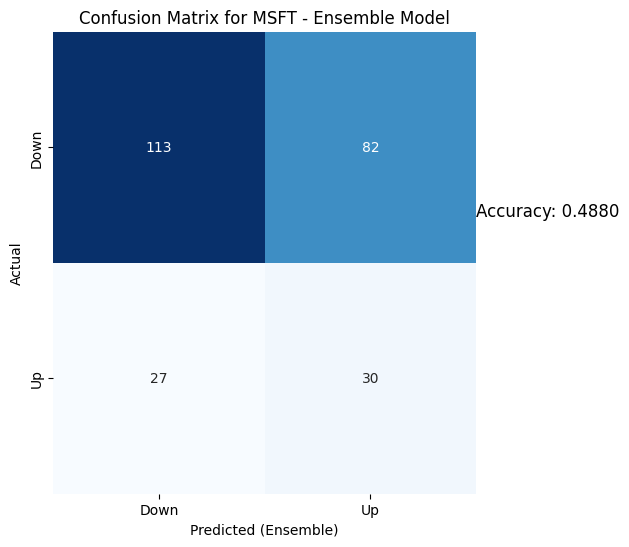

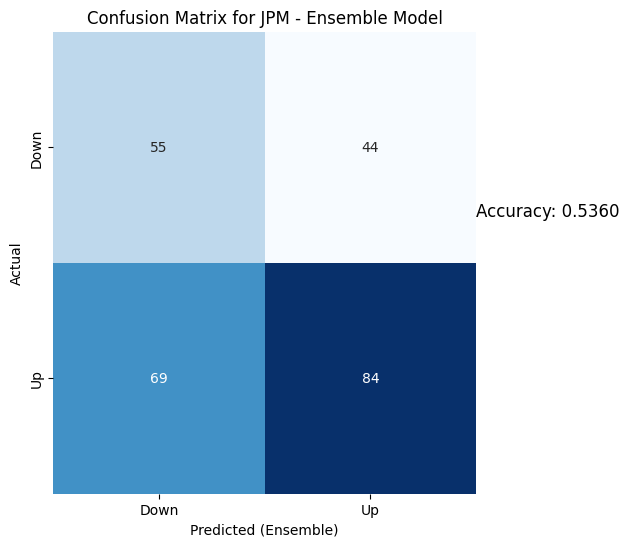

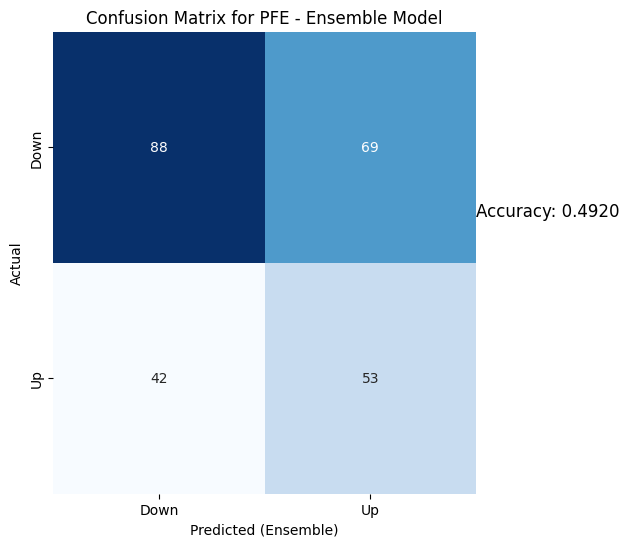

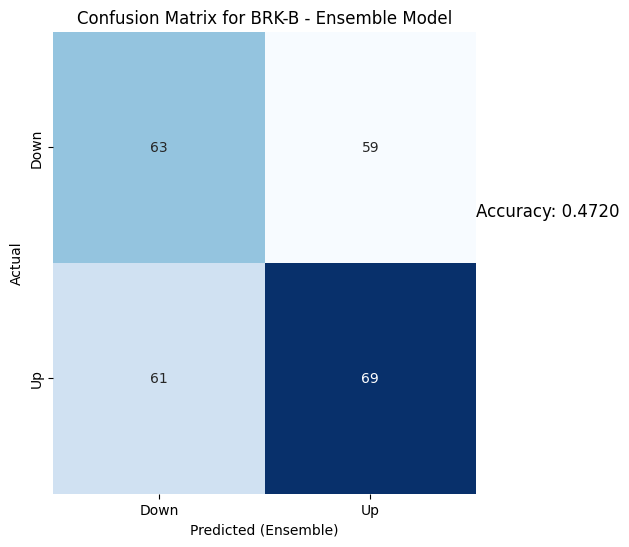

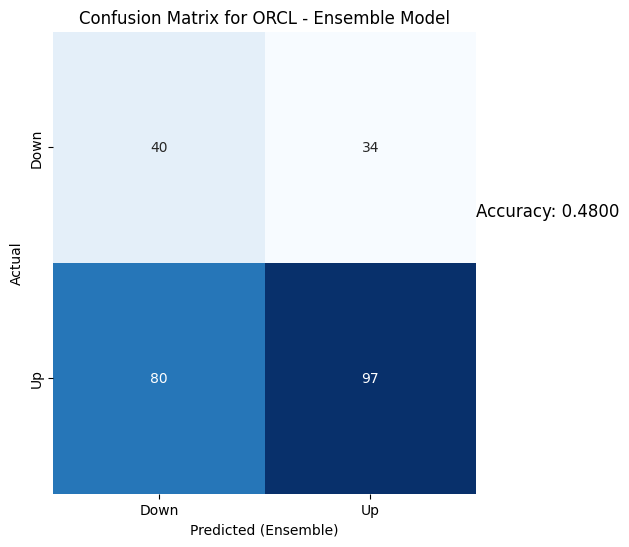

...

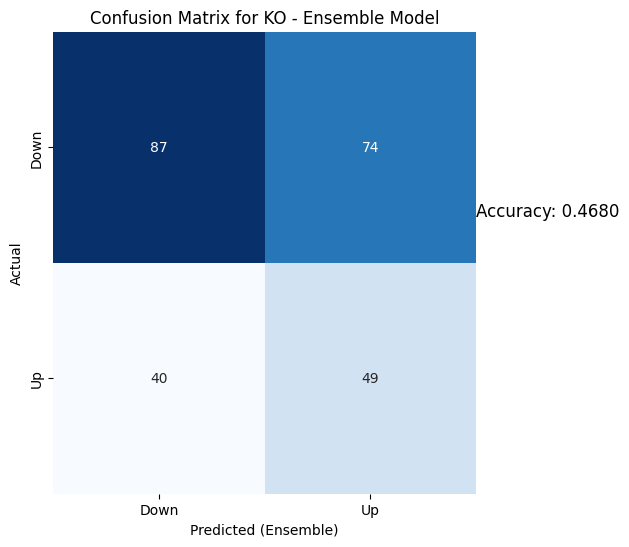

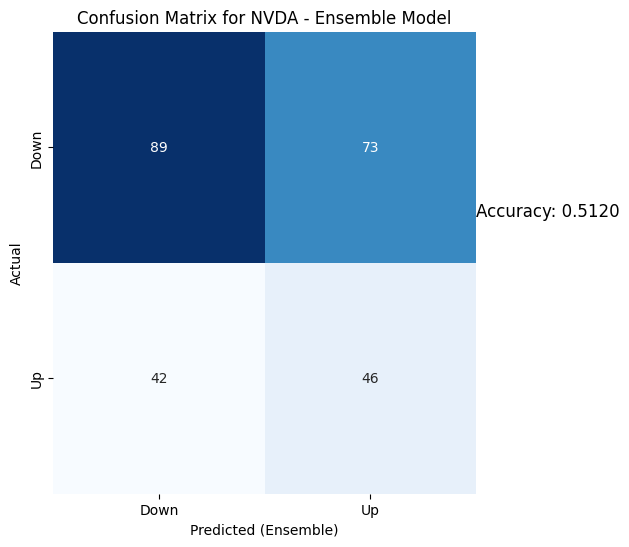

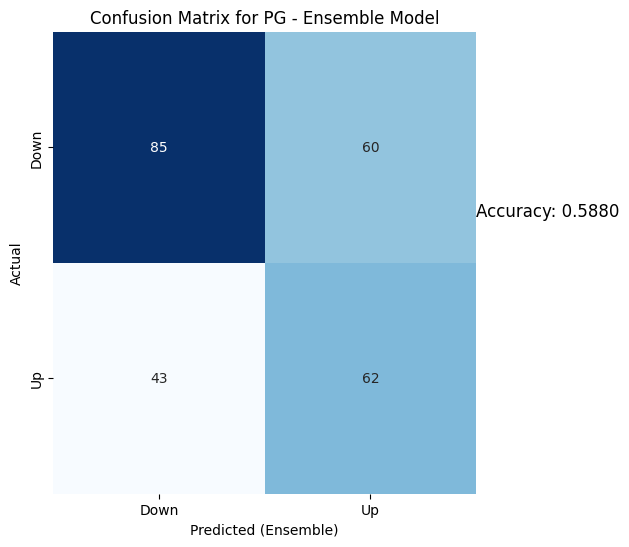

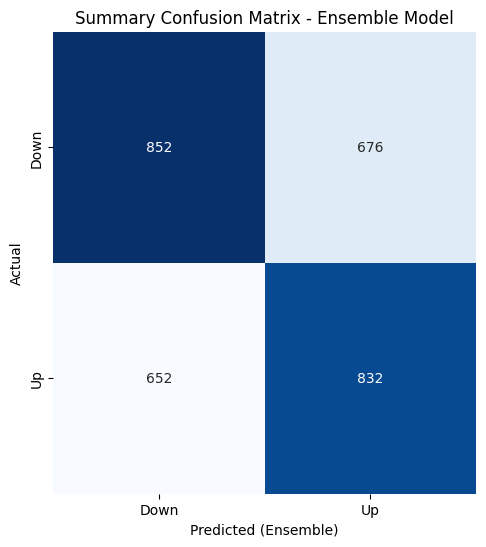

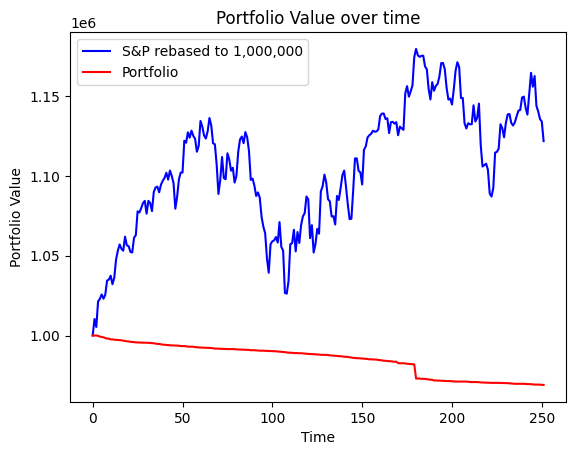

Portfolio return for our period =  96.9059916611874
S&P500 return during the period =  112.17655749842406


In [16]:
Portfolio_construct("2009-01-01")
#Testing for year 2012

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2264
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.480744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4603
LightGBM: 0.4683
GBR: 0.4643
RandomForest: 0.4683
XGBoost: 0.4921
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6989 - accuracy: 0.4924 - val_loss: 0.6989 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6952 - accuracy: 0.4937 - val_loss: 0.7154 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.5203 - val_loss: 0.7155 - val_accuracy: 0.4670
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6955 - accuracy: 0.4848 - val_loss: 0.7090 - val_accuracy: 0.4670
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6904 - accuracy: 0.5279 - val_loss: 0.7180 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6897 - accuracy: 0.5140 - val_loss: 0.7173 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4524
LightGBM: 0.4683
GBR: 0.4722
RandomForest: 0.4762
XGBoost: 0.4444
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6954 - accuracy: 0.4854 - val_loss: 0.7124 - val_accuracy: 0.4721
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6951 - accuracy: 0.4905 - val_loss: 0.7048 - val_accuracy: 0.4721
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6927 - accuracy: 0.5172 - val_loss: 0.7099 - val_accuracy: 0.4721
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.5222 - val_loss: 0.7059 - val_accuracy: 0.4721
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5197 - val_loss: 0.7068 - val_accuracy: 0.4721
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.5070 - val_loss: 0.7192 - val_accuracy: 0.4721
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5000
LightGBM: 0.5040
GBR: 0.4643
RandomForest: 0.4881
XGBoost: 0.4643
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6945 - accuracy: 0.4962 - val_loss: 0.6933 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.4847 - val_loss: 0.6937 - val_accuracy: 0.4975
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.4949 - val_loss: 0.6963 - val_accuracy: 0.5025
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.5089 - val_loss: 0.6935 - val_accuracy: 0.4772
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6954 - accuracy: 0.4835 - val_loss: 0.6934 - val_accuracy: 0.5025
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6953 - accuracy: 0.4733 - val_loss: 0.6952 - val_accuracy: 0.5025
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.4722
LightGBM: 0.4841
GBR: 0.4881
RandomForest: 0.4762
XGBoost: 0.4841
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6969 - accuracy: 0.4841 - val_loss: 0.6936 - val_accuracy: 0.4569
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6935 - accuracy: 0.5070 - val_loss: 0.6922 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.5096 - val_loss: 0.6938 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.5096 - val_loss: 0.6923 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6943 - accuracy: 0.5096 - val_loss: 0.6959 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6920 - accuracy: 0.5197 - val_loss: 0.6929 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5259
LightGBM: 0.5060
GBR: 0.4900
RandomForest: 0.4861
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6976 - accuracy: 0.4962 - val_loss: 0.6924 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6946 - accuracy: 0.4949 - val_loss: 0.6920 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6946 - accuracy: 0.5115 - val_loss: 0.6943 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6956 - accuracy: 0.4847 - val_loss: 0.6924 - val_accuracy: 0.5127
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6939 - accuracy: 0.5089 - val_loss: 0.6924 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.5026 - val_loss: 0.6934 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.4980
LightGBM: 0.4940
GBR: 0.5060
RandomForest: 0.4462
XGBoost: 0.5418
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6931 - accuracy: 0.5395 - val_loss: 0.7023 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5306 - val_loss: 0.6917 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6892 - accuracy: 0.5472 - val_loss: 0.6936 - val_accuracy: 0.5306
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6881 - accuracy: 0.5434 - val_loss: 0.6929 - val_accuracy: 0.5357
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6909 - accuracy: 0.5395 - val_loss: 0.6968 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6875 - accuracy: 0.5497 - val_loss: 0.6926 - val_accuracy: 0.5153
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5100
LightGBM: 0.4821
GBR: 0.5060
RandomForest: 0.5020
XGBoost: 0.5100
Epoch 1/10
25/25 [==============================] - 9s 53ms/step - loss: 0.6926 - accuracy: 0.5300 - val_loss: 0.6936 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6918 - accuracy: 0.5172 - val_loss: 0.6913 - val_accuracy: 0.5204
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 0.5045 - val_loss: 0.6918 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 0.5223 - val_loss: 0.6906 - val_accuracy: 0.5000
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6940 - accuracy: 0.5185 - val_loss: 0.6904 - val_accuracy: 0.5459
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 0.5287 - val_loss: 0.6902 - val_accuracy: 0.5816
Epoch 7/10
25/25 [==============================] - 0s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5299
LightGBM: 0.5020
GBR: 0.5339
RandomForest: 0.5060
XGBoost: 0.5100
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6938 - accuracy: 0.5294 - val_loss: 0.6953 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6924 - accuracy: 0.5217 - val_loss: 0.6935 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6909 - accuracy: 0.5332 - val_loss: 0.6943 - val_accuracy: 0.5102
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 0.5345 - val_loss: 0.6922 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6915 - accuracy: 0.5205 - val_loss: 0.6926 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5307 - val_loss: 0.6918 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 18

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.4880
LightGBM: 0.5040
GBR: 0.4880
RandomForest: 0.5080
XGBoost: 0.4960
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6948 - accuracy: 0.4994 - val_loss: 0.6944 - val_accuracy: 0.5051
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6926 - accuracy: 0.5288 - val_loss: 0.6943 - val_accuracy: 0.4949
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6938 - accuracy: 0.4930 - val_loss: 0.6960 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6924 - accuracy: 0.5262 - val_loss: 0.6962 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 0.5262 - val_loss: 0.6981 - val_accuracy: 0.4898
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 0.5327 - val_loss: 0.6993 - val_accuracy: 0.4898
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4840
LightGBM: 0.5120
GBR: 0.5280
RandomForest: 0.5120
XGBoost: 0.4800
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6955 - accuracy: 0.5128 - val_loss: 0.6931 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6905 - accuracy: 0.5269 - val_loss: 0.6936 - val_accuracy: 0.5153
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6897 - accuracy: 0.5359 - val_loss: 0.6924 - val_accuracy: 0.5153
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6899 - accuracy: 0.5321 - val_loss: 0.6937 - val_accuracy: 0.5153
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6901 - accuracy: 0.5333 - val_loss: 0.6938 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6891 - accuracy: 0.5282 - val_loss: 0.6934 - val_accuracy: 0.5153
Epoch 7/10
25/25 [==============================] - 0s 19

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5000
LightGBM: 0.5480
GBR: 0.5240
RandomForest: 0.5720
XGBoost: 0.5240
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6955 - accuracy: 0.4923 - val_loss: 0.6921 - val_accuracy: 0.5179
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.5077 - val_loss: 0.6919 - val_accuracy: 0.5179
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5359 - val_loss: 0.6916 - val_accuracy: 0.5179
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6937 - accuracy: 0.5141 - val_loss: 0.6930 - val_accuracy: 0.5179
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6908 - accuracy: 0.5167 - val_loss: 0.6910 - val_accuracy: 0.5179
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6910 - accuracy: 0.5333 - val_loss: 0.6916 - val_accuracy: 0.5179
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4560
LightGBM: 0.4720
GBR: 0.4680
RandomForest: 0.4240
XGBoost: 0.4640
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6950 - accuracy: 0.4968 - val_loss: 0.6942 - val_accuracy: 0.4872
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6939 - accuracy: 0.5237 - val_loss: 0.6991 - val_accuracy: 0.4872
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6954 - accuracy: 0.4814 - val_loss: 0.6955 - val_accuracy: 0.4872
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6922 - accuracy: 0.5186 - val_loss: 0.6971 - val_accuracy: 0.4872
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6926 - accuracy: 0.4917 - val_loss: 0.6968 - val_accuracy: 0.4872
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 0.5263 - val_loss: 0.6973 - val_accuracy: 0.4872
Epoch 7/10
25/25 [==============================] - 0s 17

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1388 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  42.810001373291016  and sold at  43.47999954223633
PG bought at  69.93000030517578  and sold at  69.93000030517578
43.47999954223633
89.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1389 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  43.47999954223633  and sold at  43.869998931884766
BRK-B bought at  89.9800033569336  and sold at  90.37000274658203
43.869998931884766
32.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1390 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  43.869998931884766  and sold at  43.529998779296875
ORCL bought at  32.880001068115234  and sold at  34.09000015258789
43.529998779296875
34.09000015258789
43.380001068115234
3.1624999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1391 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ', 'NVDA']
JPM bought at  43.529998779296875  and sold at  44.529998779296875
ORCL bought at  34.09000015258789  and sold at  33.939998626708984
VZ bought at  43.380001068115234  and sold at  43.810001373291016
NVDA bought at  3.1624999046325684  and sold at  3.1600000858306885
44.529998779296875
43.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1392 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  44.529998779296875  and sold at  44.0
VZ bought at  43.810001373291016  and sold at  43.56999969482422
44.0
184.91395568847656
3.0875000953674316


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1393 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'NVDA']
JPM bought at  44.0  and sold at  43.91999816894531
IBM bought at  184.91395568847656  and sold at  183.93881225585938
NVDA bought at  3.0875000953674316  and sold at  3.0625
183.93881225585938
36.72999954223633
3.0625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1394 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO', 'NVDA']
IBM bought at  183.93881225585938  and sold at  183.50860595703125
KO bought at  36.72999954223633  and sold at  36.41999816894531
NVDA bought at  3.0625  and sold at  3.059999942779541
43.959999084472656
3.059999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1395 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  43.959999084472656  and sold at  43.630001068115234
NVDA bought at  3.059999942779541  and sold at  3.0399999618530273
43.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1396 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  43.47999954223633  and sold at  42.900001525878906
43.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1397 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  43.2400016784668  and sold at  43.970001220703125
43.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1398 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  43.970001220703125  and sold at  44.65999984741211
44.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1399 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  44.65999984741211  and sold at  44.56999969482422
44.56999969482422
44.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1400 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  44.56999969482422  and sold at  45.36000061035156
VZ bought at  44.060001373291016  and sold at  44.29999923706055
44.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1401 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  44.29999923706055  and sold at  44.689998626708984
45.40999984741211
44.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1402 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  45.40999984741211  and sold at  45.5
VZ bought at  44.689998626708984  and sold at  43.099998474121094
45.5
34.439998626708984
43.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1403 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ']
JPM bought at  45.5  and sold at  45.470001220703125
ORCL bought at  34.439998626708984  and sold at  34.459999084472656
VZ bought at  43.099998474121094  and sold at  43.0
43.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1404 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  43.0  and sold at  43.59000015258789
46.150001525878906
43.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1405 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  46.150001525878906  and sold at  46.13999938964844
VZ bought at  43.59000015258789  and sold at  43.29999923706055
46.13999938964844
185.89866638183594
43.29999923706055
36.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1406 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ', 'KO']
JPM bought at  46.13999938964844  and sold at  45.880001068115234
IBM bought at  185.89866638183594  and sold at  184.14913940429688
VZ bought at  43.29999923706055  and sold at  42.59000015258789
KO bought at  36.90999984741211  and sold at  36.9900016784668
45.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1407 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  45.880001068115234  and sold at  46.349998474121094
41.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1408 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  41.970001220703125  and sold at  41.5099983215332
41.5099983215332
3.0225000381469727
69.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1409 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA', 'PG']
VZ bought at  41.5099983215332  and sold at  42.130001068115234
NVDA bought at  3.0225000381469727  and sold at  3.0625
PG bought at  69.33999633789062  and sold at  69.66999816894531
46.439998626708984
95.30000305175781
42.130001068115234
3.0625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1410 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'NVDA']
JPM bought at  46.439998626708984  and sold at  46.459999084472656
BRK-B bought at  95.30000305175781  and sold at  95.16000366210938
VZ bought at  42.130001068115234  and sold at  42.540000915527344
NVDA bought at  3.0625  and sold at  3.0425000190734863
42.540000915527344
69.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1411 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  42.540000915527344  and sold at  42.939998626708984
PG bought at  69.94000244140625  and sold at  69.94999694824219
95.91000366210938
42.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1412 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  95.91000366210938  and sold at  96.4800033569336
VZ bought at  42.939998626708984  and sold at  42.790000915527344
42.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1413 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  42.790000915527344  and sold at  42.59000015258789
97.30999755859375
42.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1414 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  97.30999755859375  and sold at  97.38999938964844
VZ bought at  42.59000015258789  and sold at  42.66999816894531
97.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1415 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  97.38999938964844  and sold at  97.12000274658203
42.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1416 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  42.77000045776367  and sold at  43.5
43.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1417 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  43.5  and sold at  43.61000061035156
194.56979370117188
43.61000061035156
37.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1418 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'KO']
IBM bought at  194.56979370117188  and sold at  194.1395721435547
VZ bought at  43.61000061035156  and sold at  43.61000061035156
KO bought at  37.5  and sold at  37.2400016784668
47.04999923706055
43.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1419 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  47.04999923706055  and sold at  47.849998474121094
VZ bought at  43.61000061035156  and sold at  44.560001373291016
44.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1420 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  44.560001373291016  and sold at  44.52000045776367
44.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1421 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  44.560001373291016  and sold at  44.75
48.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1422 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  48.61000061035156  and sold at  48.22999954223633
48.22999954223633
97.11000061035156
44.459999084472656
38.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1423 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'KO']
JPM bought at  48.22999954223633  and sold at  48.630001068115234
BRK-B bought at  97.11000061035156  and sold at  97.25
VZ bought at  44.459999084472656  and sold at  44.349998474121094
KO bought at  38.90999984741211  and sold at  38.77000045776367
44.349998474121094
38.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1424 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  44.349998474121094  and sold at  44.31999969482422
KO bought at  38.77000045776367  and sold at  38.61000061035156
97.12999725341797
44.31999969482422
38.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1425 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'KO']
BRK-B bought at  97.12999725341797  and sold at  97.69999694824219
VZ bought at  44.31999969482422  and sold at  44.439998626708984
KO bought at  38.61000061035156  and sold at  37.560001373291016
97.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1426 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  97.69999694824219  and sold at  97.97000122070312
44.52000045776367
12.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1427 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  44.52000045776367  and sold at  44.33000183105469
BAC bought at  12.170000076293945  and sold at  12.130000114440918
49.220001220703125
99.20999908447266
44.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1428 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ']
JPM bought at  49.220001220703125  and sold at  48.880001068115234
BRK-B bought at  99.20999908447266  and sold at  99.7699966430664
VZ bought at  44.33000183105469  and sold at  44.400001525878906
48.880001068115234
44.400001525878906
37.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1429 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'KO']
JPM bought at  48.880001068115234  and sold at  49.45000076293945
VZ bought at  44.400001525878906  and sold at  44.5
KO bought at  37.41999816894531  and sold at  37.66999816894531
49.45000076293945
101.0199966430664
44.5
12.1899995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1430 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'BAC']
JPM bought at  49.45000076293945  and sold at  48.61000061035156
BRK-B bought at  101.0199966430664  and sold at  100.22000122070312
VZ bought at  44.5  and sold at  44.91999816894531
BAC bought at  12.1899995803833  and sold at  11.800000190734863
44.91999816894531
37.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1431 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  44.91999816894531  and sold at  45.119998931884766
KO bought at  37.72999954223633  and sold at  37.709999084472656
45.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1432 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  45.119998931884766  and sold at  45.400001525878906
45.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1433 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  45.400001525878906  and sold at  45.720001220703125
75.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1434 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  75.91999816894531  and sold at  76.08000183105469
76.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1435 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  76.75  and sold at  76.18000030517578
48.90999984741211
76.48999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1436 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  48.90999984741211  and sold at  49.099998474121094
PG bought at  76.48999786376953  and sold at  76.68000030517578
102.66000366210938
77.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1437 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  102.66000366210938  and sold at  103.23999786376953
PG bought at  77.05000305175781  and sold at  77.19999694824219
77.19999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1438 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  77.19999694824219  and sold at  76.9000015258789
50.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1439 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  50.630001068115234  and sold at  50.20000076293945
35.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1440 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  35.709999084472656  and sold at  35.880001068115234
12.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1441 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  12.010000228881836  and sold at  12.0600004196167
35.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1442 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  35.58000183105469  and sold at  36.29999923706055
51.0
103.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1443 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  51.0  and sold at  50.02000045776367
BRK-B bought at  103.98999786376953  and sold at  102.79000091552734
36.34000015258789
12.569999694824219
3.1600000858306885
76.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1444 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'NVDA', 'PG']
ORCL bought at  36.34000015258789  and sold at  36.040000915527344
BAC bought at  12.569999694824219  and sold at  12.5600004196167
NVDA bought at  3.1600000858306885  and sold at  3.137500047683716
PG bought at  76.33999633789062  and sold at  76.16000366210938
102.12000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1445 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  102.12000274658203  and sold at  101.7699966430664
16.231786727905273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1446 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  16.231786727905273  and sold at  16.145713806152344
49.119998931884766
77.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1447 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  49.119998931884766  and sold at  48.349998474121094
PG bought at  77.58000183105469  and sold at  77.20999908447266
48.349998474121094
77.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1448 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  48.349998474121094  and sold at  48.779998779296875
PG bought at  77.20999908447266  and sold at  77.2699966430664
48.779998779296875
102.56999969482422
77.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1449 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'PG']
JPM bought at  48.779998779296875  and sold at  48.52000045776367
BRK-B bought at  102.56999969482422  and sold at  102.4000015258789
PG bought at  77.2699966430664  and sold at  76.68000030517578
48.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1450 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  48.52000045776367  and sold at  48.63999938964844
48.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1451 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  48.63999938964844  and sold at  47.77000045776367
31.950000762939453
3.1624999046325684
77.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1452 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA', 'PG']
ORCL bought at  31.950000762939453  and sold at  32.33000183105469
NVDA bought at  3.1624999046325684  and sold at  3.2074999809265137
PG bought at  77.05999755859375  and sold at  77.05999755859375
32.33000183105469
12.180000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1453 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  32.33000183105469  and sold at  32.40999984741211
BAC bought at  12.180000305175781  and sold at  12.149999618530273
27.362428665161133
32.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1454 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  27.362428665161133  and sold at  27.73244857788086
ORCL bought at  32.40999984741211  and sold at  32.7400016784668
48.279998779296875
105.13999938964844
78.95999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1455 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'PG']
JPM bought at  48.279998779296875  and sold at  46.849998474121094
BRK-B bought at  105.13999938964844  and sold at  104.23999786376953
PG bought at  78.95999908447266  and sold at  78.12000274658203
104.23999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1456 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  104.23999786376953  and sold at  105.12999725341797
47.4900016784668
105.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1457 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  47.4900016784668  and sold at  47.90999984741211
BRK-B bought at  105.12999725341797  and sold at  104.1500015258789
47.90999984741211
32.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1458 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  47.90999984741211  and sold at  48.58000183105469
ORCL bought at  32.029998779296875  and sold at  32.36000061035156
48.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1459 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  48.58000183105469  and sold at  48.68000030517578
48.68000030517578
33.040000915527344
12.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1460 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'BAC']
JPM bought at  48.68000030517578  and sold at  49.25
ORCL bought at  33.040000915527344  and sold at  33.72999954223633
BAC bought at  12.25  and sold at  12.319999694824219
49.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1461 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  49.25  and sold at  49.310001373291016
106.7300033569336
33.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1462 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  106.7300033569336  and sold at  107.04000091552734
ORCL bought at  33.619998931884766  and sold at  33.459999084472656
33.459999084472656
80.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1463 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  33.459999084472656  and sold at  32.79999923706055
PG bought at  80.08000183105469  and sold at  79.6500015258789
47.93000030517578
32.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1464 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  47.93000030517578  and sold at  48.4900016784668
ORCL bought at  32.79999923706055  and sold at  33.41999816894531
15.222857475280762
80.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1465 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  15.222857475280762  and sold at  14.385713577270508
PG bought at  80.0999984741211  and sold at  79.05999755859375
32.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1466 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  32.4900016784668  and sold at  32.119998931884766
103.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1467 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  103.0  and sold at  105.27999877929688
47.22999954223633
32.369998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1468 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  47.22999954223633  and sold at  47.349998474121094
ORCL bought at  32.369998931884766  and sold at  32.52000045776367
48.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1469 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  48.720001220703125  and sold at  49.0
47.56999969482422
78.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1470 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  47.56999969482422  and sold at  48.18000030517578
PG bought at  78.19000244140625  and sold at  77.75
13.020000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1471 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.020000457763672  and sold at  12.90999984741211
194.30210876464844
12.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1472 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  194.30210876464844  and sold at  195.47801208496094
BAC bought at  12.90999984741211  and sold at  13.020000457763672
32.689998626708984
34.02000045776367
78.76000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1473 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'PG']
MSFT bought at  32.689998626708984  and sold at  33.029998779296875
ORCL bought at  34.02000045776367  and sold at  33.779998779296875
PG bought at  78.76000213623047  and sold at  78.58999633789062
113.0199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1474 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  113.0199966430664  and sold at  113.0
113.0
79.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1475 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  113.0  and sold at  112.69999694824219
PG bought at  79.08999633789062  and sold at  78.80000305175781
27.305503845214844
112.69999694824219
199.47418212890625
78.80000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1476 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'IBM', 'PG']
PFE bought at  27.305503845214844  and sold at  27.798860549926758
BRK-B bought at  112.69999694824219  and sold at  111.8499984741211
IBM bought at  199.47418212890625  and sold at  197.88719177246094
PG bought at  78.80000305175781  and sold at  78.81999969482422
34.61000061035156
111.8499984741211
78.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1477 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'PG']
MSFT bought at  34.61000061035156  and sold at  34.150001525878906
BRK-B bought at  111.8499984741211  and sold at  111.29000091552734
PG bought at  78.81999969482422  and sold at  78.69999694824219
53.65999984741211
34.04999923706055
51.38999938964844
13.239999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1478 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ', 'BAC']
JPM bought at  53.65999984741211  and sold at  54.599998474121094
ORCL bought at  34.04999923706055  and sold at  34.529998779296875
VZ bought at  51.38999938964844  and sold at  50.81999969482422
BAC bought at  13.239999771118164  and sold at  13.350000381469727
112.27999877929688
15.765713691711426
50.81999969482422
80.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1479 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'VZ', 'PG']
BRK-B bought at  112.27999877929688  and sold at  113.02999877929688
AAPL bought at  15.765713691711426  and sold at  15.891071319580078
VZ bought at  50.81999969482422  and sold at  49.56999969482422
PG bought at  80.86000061035156  and sold at  78.9000015258789
113.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1480 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  113.02999877929688  and sold at  114.83999633789062
114.83999633789062
49.08000183105469
3.6575000286102295
79.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1481 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'NVDA', 'PG']
BRK-B bought at  114.83999633789062  and sold at  114.06999969482422
VZ bought at  49.08000183105469  and sold at  48.47999954223633
NVDA bought at  3.6575000286102295  and sold at  3.617500066757202
PG bought at  79.08999633789062  and sold at  76.76000213623047
114.06999969482422
77.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1482 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  114.06999969482422  and sold at  113.41999816894531
PG bought at  77.66000366210938  and sold at  77.37000274658203
77.37000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1483 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  77.37000274658203  and sold at  76.66000366210938
26.072105407714844
111.51000213623047
13.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1484 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'BAC']
PFE bought at  26.072105407714844  and sold at  26.669828414916992
BRK-B bought at  111.51000213623047  and sold at  113.0999984741211
BAC bought at  13.09000015258789  and sold at  13.199999809265137
26.669828414916992
113.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1485 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  26.669828414916992  and sold at  26.812143325805664
BRK-B bought at  113.0999984741211  and sold at  115.30999755859375
115.30999755859375
13.380000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1486 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  115.30999755859375  and sold at  115.1500015258789
BAC bought at  13.380000114440918  and sold at  13.300000190734863
34.04999923706055
13.300000190734863
78.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1487 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'PG']
ORCL bought at  34.04999923706055  and sold at  33.56999969482422
BAC bought at  13.300000190734863  and sold at  13.119999885559082
PG bought at  78.06999969482422  and sold at  78.12000274658203
113.51000213623047
33.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1488 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  113.51000213623047  and sold at  112.94999694824219
ORCL bought at  33.56999969482422  and sold at  33.52000045776367
35.0
114.91999816894531
34.27000045776367
40.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1489 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'KO']
MSFT bought at  35.0  and sold at  34.97999954223633
BRK-B bought at  114.91999816894531  and sold at  115.16999816894531
ORCL bought at  34.27000045776367  and sold at  34.400001525878906
KO bought at  40.68000030517578  and sold at  40.93000030517578
34.400001525878906
13.270000457763672
79.04000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1490 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'PG']
ORCL bought at  34.400001525878906  and sold at  34.09000015258789
BAC bought at  13.270000457763672  and sold at  13.1899995803833
PG bought at  79.04000091552734  and sold at  77.61000061035156
113.83999633789062
34.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1491 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  113.83999633789062  and sold at  111.41000366210938
ORCL bought at  34.09000015258789  and sold at  33.209999084472656
33.209999084472656
12.890000343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1492 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  33.209999084472656  and sold at  30.139999389648438
BAC bought at  12.890000343322754  and sold at  12.6899995803833
76.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1493 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  76.58000183105469  and sold at  76.69000244140625
34.349998474121094
112.91000366210938
30.139999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1494 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  34.349998474121094  and sold at  34.619998931884766
BRK-B bought at  112.91000366210938  and sold at  113.0
ORCL bought at  30.139999389648438  and sold at  30.450000762939453
30.450000762939453
77.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1495 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  30.450000762939453  and sold at  30.709999084472656
PG bought at  77.66999816894531  and sold at  76.98999786376953
30.110000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1496 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  30.110000610351562  and sold at  30.100000381469727
30.100000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1497 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  30.100000381469727  and sold at  30.700000762939453
52.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1498 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  52.77000045776367  and sold at  53.9900016784668
78.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1499 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  78.33999633789062  and sold at  78.76000213623047
186.4053497314453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1500 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  186.4053497314453  and sold at  182.88719177246094
31.520000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1501 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.520000457763672  and sold at  31.229999542236328
114.87999725341797
13.369999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1502 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  114.87999725341797  and sold at  116.9800033569336
BAC bought at  13.369999885559082  and sold at  13.510000228881836
13.880000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1503 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.880000114440918  and sold at  13.920000076293945
55.0099983215332
13.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1504 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  55.0099983215332  and sold at  55.27000045776367
BAC bought at  13.920000076293945  and sold at  14.3100004196167
14.760000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1505 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  14.760000228881836  and sold at  14.75
31.860000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1506 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  31.860000610351562  and sold at  31.8700008392334
80.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1507 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  80.2699966430664  and sold at  80.41000366210938
117.06999969482422
80.41000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1508 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  117.06999969482422  and sold at  117.33999633789062
PG bought at  80.41000366210938  and sold at  80.38999938964844
56.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1509 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.04999923706055  and sold at  55.689998626708984
116.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1510 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  116.41999816894531  and sold at  115.79000091552734
187.1988525390625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1511 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  187.1988525390625  and sold at  186.5774383544922
31.889999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1512 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  31.889999389648438  and sold at  31.700000762939453
56.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1513 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.099998474121094  and sold at  55.4900016784668
180.26768493652344
3.6500000953674316


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1514 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  180.26768493652344  and sold at  179.66539001464844
NVDA bought at  3.6500000953674316  and sold at  3.674999952316284
179.5602264404297
14.449999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1515 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  179.5602264404297  and sold at  180.77438354492188
BAC bought at  14.449999809265137  and sold at  14.40999984741211
3.5924999713897705


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1516 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.5924999713897705  and sold at  3.6050000190734863
54.290000915527344
33.25
14.510000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1517 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'BAC']
JPM bought at  54.290000915527344  and sold at  54.150001525878906
ORCL bought at  33.25  and sold at  33.56999969482422
BAC bought at  14.510000228881836  and sold at  14.600000381469727
116.56999969482422
81.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1518 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  116.56999969482422  and sold at  114.80000305175781
PG bought at  81.25  and sold at  80.4800033569336
80.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1519 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  80.4800033569336  and sold at  79.9000015258789
79.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1520 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  79.9000015258789  and sold at  79.58999633789062
114.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1521 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  114.30000305175781  and sold at  115.01000213623047
14.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1522 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  14.34000015258789  and sold at  14.569999694824219
52.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1523 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  52.209999084472656  and sold at  52.31999969482422
51.79999923706055
78.54000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1524 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  51.79999923706055  and sold at  50.599998474121094
PG bought at  78.54000091552734  and sold at  77.97000122070312
33.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1525 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  33.2599983215332  and sold at  33.02000045776367
111.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1526 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  111.98999786376953  and sold at  111.22000122070312
77.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1527 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  77.88999938964844  and sold at  77.75
51.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1528 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  51.130001068115234  and sold at  51.869998931884766
51.869998931884766
77.48999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1529 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  51.869998931884766  and sold at  52.11000061035156
PG bought at  77.48999786376953  and sold at  77.13999938964844
52.11000061035156
17.688213348388672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1530 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  52.11000061035156  and sold at  52.560001373291016
AAPL bought at  17.688213348388672  and sold at  17.79357147216797
52.560001373291016
32.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1531 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  52.560001373291016  and sold at  52.86000061035156
ORCL bought at  32.20000076293945  and sold at  32.75
78.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1532 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  78.16000366210938  and sold at  77.94999694824219
113.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1533 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  113.58999633789062  and sold at  114.27999877929688
53.2599983215332
33.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1534 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  53.2599983215332  and sold at  52.2400016784668
ORCL bought at  33.02000045776367  and sold at  32.790000915527344
33.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1535 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  33.029998779296875  and sold at  32.79999923706055
114.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1536 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  114.83999633789062  and sold at  115.38999938964844
115.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1537 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  115.38999938964844  and sold at  116.69999694824219
14.710000038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1538 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  14.710000038146973  and sold at  14.609999656677246
52.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1539 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  52.75  and sold at  52.79999923706055
117.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1540 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  117.9000015258789  and sold at  115.63999938964844
79.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1541 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  79.27999877929688  and sold at  78.62000274658203
78.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1542 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  78.62000274658203  and sold at  77.72000122070312
32.5099983215332
115.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1543 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  32.5099983215332  and sold at  32.77000045776367
BRK-B bought at  115.51000213623047  and sold at  115.79000091552734
32.77000045776367
78.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1544 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  32.77000045776367  and sold at  33.27000045776367
PG bought at  78.05000305175781  and sold at  77.20999908447266
13.899999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1545 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.899999618530273  and sold at  13.800000190734863
51.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1546 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  51.689998626708984  and sold at  51.959999084472656
76.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1547 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  76.16000366210938  and sold at  75.93000030517578
52.09000015258789
114.41000366210938
37.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1548 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO']
JPM bought at  52.09000015258789  and sold at  51.939998626708984
BRK-B bought at  114.41000366210938  and sold at  113.37000274658203
KO bought at  37.43000030517578  and sold at  37.15999984741211
14.0
37.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1549 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  14.0  and sold at  14.050000190734863
KO bought at  37.15999984741211  and sold at  37.20000076293945
37.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1550 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.20000076293945  and sold at  37.04999923706055
50.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1551 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  50.869998931884766  and sold at  50.75
52.52000045776367
114.83999633789062
37.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1552 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO']
JPM bought at  52.52000045776367  and sold at  52.5099983215332
BRK-B bought at  114.83999633789062  and sold at  115.80999755859375
KO bought at  37.779998779296875  and sold at  37.77000045776367
33.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1553 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  33.2599983215332  and sold at  33.279998779296875
178.7476043701172


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1554 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  178.7476043701172  and sold at  176.53919982910156
116.91999816894531
79.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1555 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  116.91999816894531  and sold at  116.97000122070312
PG bought at  79.41999816894531  and sold at  79.41000366210938
52.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1556 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  52.75  and sold at  52.47999954223633
117.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1557 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  117.02999877929688  and sold at  116.94000244140625
52.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1558 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  52.72999954223633  and sold at  52.599998474121094
36.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1559 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  36.63999938964844  and sold at  38.18000030517578
3.7249999046325684


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1560 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  3.7249999046325684  and sold at  3.637500047683716
114.20999908447266
14.319999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1561 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  114.20999908447266  and sold at  114.80999755859375
BAC bought at  14.319999694824219  and sold at  14.640000343322754
14.640000343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1562 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  14.640000343322754  and sold at  14.800000190734863
34.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1563 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  34.380001068115234  and sold at  34.91999816894531
115.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1564 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  115.9000015258789  and sold at  115.83999633789062
56.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1565 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.150001525878906  and sold at  56.099998474121094
116.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1566 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  116.58000183105469  and sold at  116.58000183105469
35.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1567 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  35.290000915527344  and sold at  35.290000915527344
84.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1568 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  84.22000122070312  and sold at  83.33999633789062
35.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1569 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  35.08000183105469  and sold at  35.06999969482422
83.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1570 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  83.83000183105469  and sold at  83.3499984741211
83.3499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1571 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  83.3499984741211  and sold at  82.69000244140625
38.36000061035156
35.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1572 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  38.36000061035156  and sold at  38.709999084472656
ORCL bought at  35.47999954223633  and sold at  35.599998474121094
38.709999084472656
40.400001525878906
84.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1573 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'PG']
MSFT bought at  38.709999084472656  and sold at  38.11000061035156
KO bought at  40.400001525878906  and sold at  39.849998474121094
PG bought at  84.77999877929688  and sold at  83.6500015258789
34.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1574 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  34.79999923706055  and sold at  34.560001373291016
[1000000.0, 1025630.179078884, 1023312.9132789498, 1027806.9753054276, 1024998.226718963, 1022049.0085591079, 1024647.1063589322, 1032792.6272653263, 1032722.4460520763, 1032020.2053320151, 1032722.4460520763, 1032581.9764786861, 1039252.8347317073, 1041570.1005316414, 1047187.7048514613, 1048872.9111445837, 1049153.8502913644, 1055052.2866110746, 1053788.3818912327, 1057931.3235576798, 1053788.3818912327, 1051190.1769445178, 1062004.0840108767, 1050066.6346511757, 1060669.8909308943, 1061442.3128642056, 1060037.9385709732, 1065936.3748906835, 1065725.724104043, 1067481.2187573062, 1068394.0031171173, 1069377.0758370692, 1068113.171117227, 1076118.2224502307, 1062706.2175840477, 1056246.0101176666, 1066568.3272506043, 1046274.8133447595, 1053437.261531202, 1066708.7968239947, 1064602.181810701, 1068113.171117227, 1073800.956650297, 1083421.033

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1575 times so far.

  warnings.warn(msg, UserWarning)


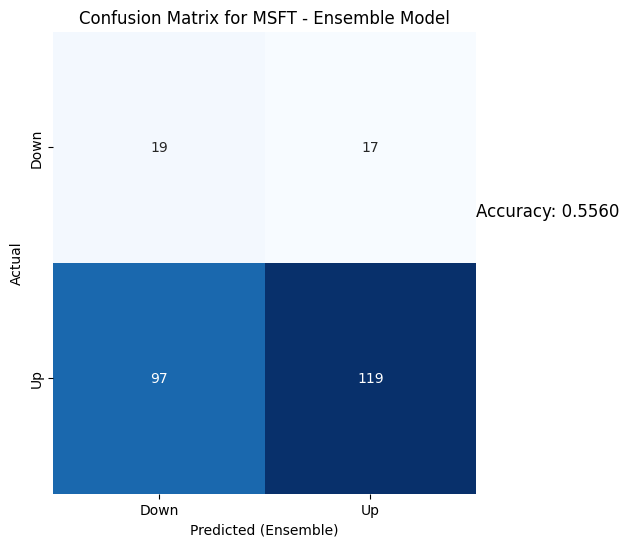

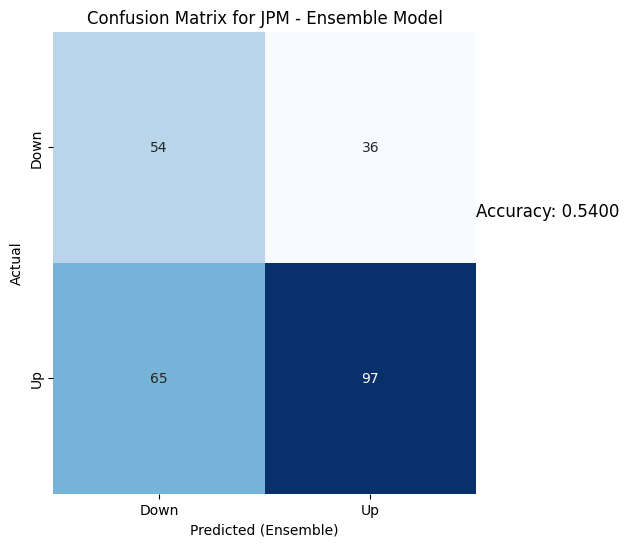

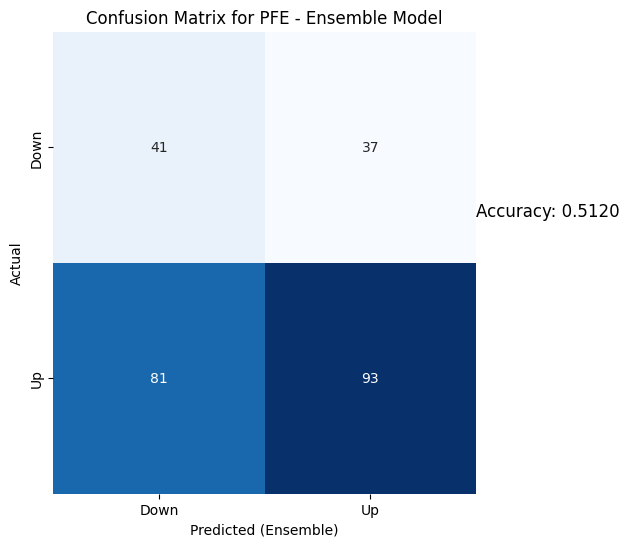

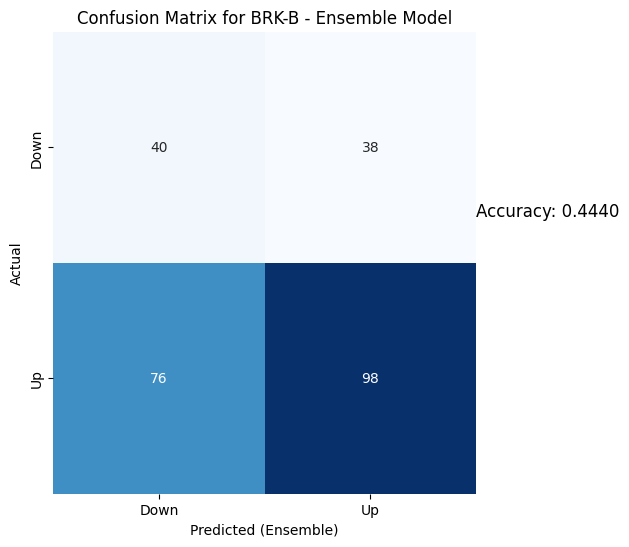

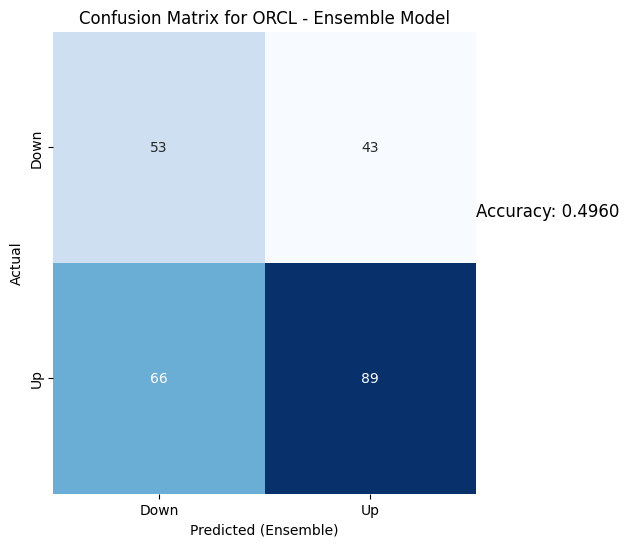

...

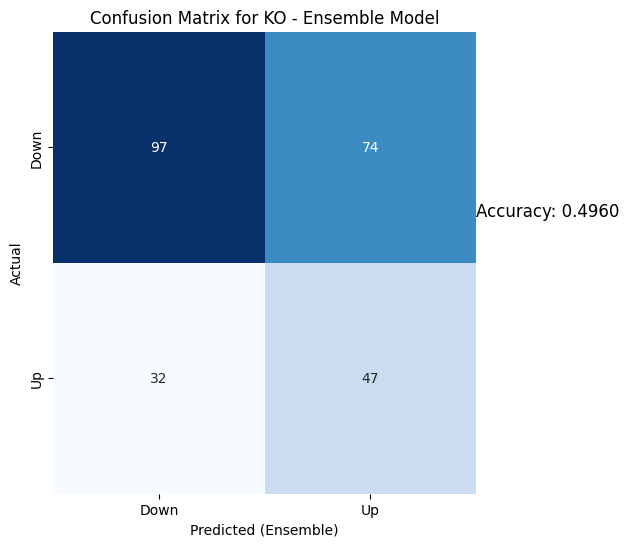

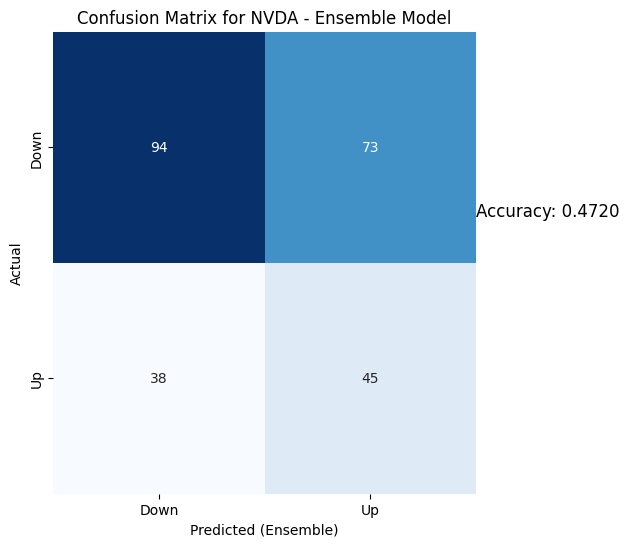

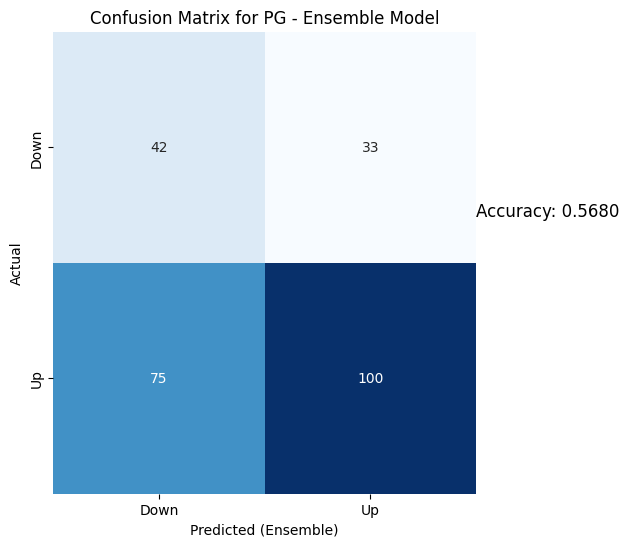

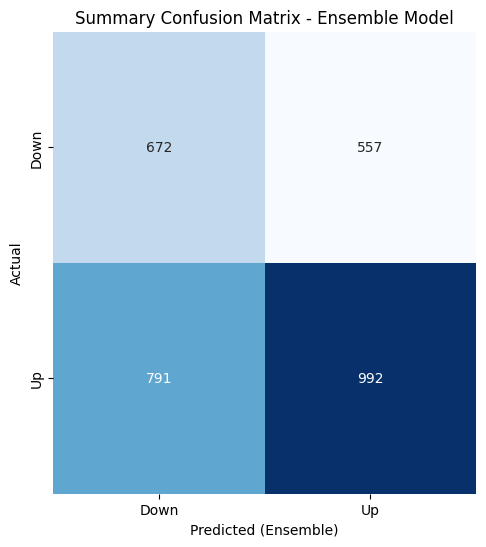

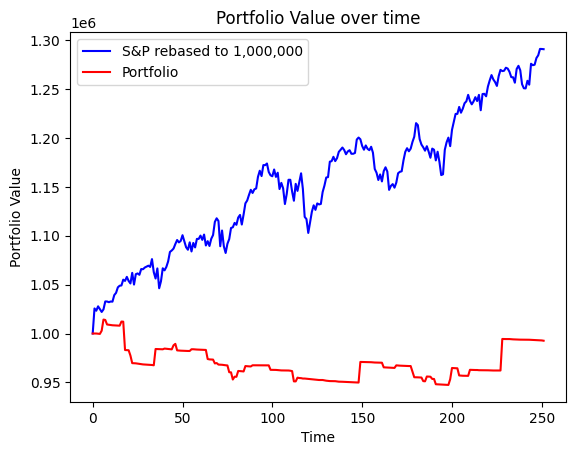

Portfolio return for our period =  99.26188826933802
S&P500 return during the period =  129.07801600817405


In [17]:
Portfolio_construct("2010-01-01")
#Testing for year 2013

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.490040
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4841
LightGBM: 0.5198
GBR: 0.5317
RandomForest: 0.5238
XGBoost: 0.5119
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6999 - accuracy: 0.4480 - val_loss: 0.6948 - val_accuracy: 0.4924
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6947 - accuracy: 0.4937 - val_loss: 0.6933 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6940 - accuracy: 0.4924 - val_loss: 0.6940 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.4924 - val_loss: 0.6938 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5063 - val_loss: 0.6943 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6939 - accuracy: 0.4848 - val_loss: 0.6946 - val_accuracy: 0.4772
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5476
LightGBM: 0.4325
GBR: 0.4563
RandomForest: 0.4603
XGBoost: 0.3968
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6950 - accuracy: 0.5159 - val_loss: 0.7059 - val_accuracy: 0.4619
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6947 - accuracy: 0.4956 - val_loss: 0.6888 - val_accuracy: 0.5381
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6923 - accuracy: 0.5197 - val_loss: 0.6892 - val_accuracy: 0.5482
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.5286 - val_loss: 0.6877 - val_accuracy: 0.5381
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6923 - accuracy: 0.5222 - val_loss: 0.6871 - val_accuracy: 0.5381
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5159 - val_loss: 0.6870 - val_accuracy: 0.5584
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5000
LightGBM: 0.5198
GBR: 0.5397
RandomForest: 0.5198
XGBoost: 0.5437
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.7000 - accuracy: 0.4936 - val_loss: 0.6956 - val_accuracy: 0.4924
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6934 - accuracy: 0.5102 - val_loss: 0.6922 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.5127 - val_loss: 0.6925 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6939 - accuracy: 0.4949 - val_loss: 0.6917 - val_accuracy: 0.5431
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6937 - accuracy: 0.4898 - val_loss: 0.6918 - val_accuracy: 0.5025
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.5013 - val_loss: 0.6913 - val_accuracy: 0.5178
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5635
LightGBM: 0.4841
GBR: 0.4563
RandomForest: 0.4683
XGBoost: 0.5198
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6975 - accuracy: 0.5121 - val_loss: 0.6913 - val_accuracy: 0.5635
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6951 - accuracy: 0.5019 - val_loss: 0.6860 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.5057 - val_loss: 0.6896 - val_accuracy: 0.5635
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5223 - val_loss: 0.6857 - val_accuracy: 0.5635
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6924 - accuracy: 0.5185 - val_loss: 0.6858 - val_accuracy: 0.5635
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5121 - val_loss: 0.6873 - val_accuracy: 0.5635
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5139
LightGBM: 0.4861
GBR: 0.5020
RandomForest: 0.5020
XGBoost: 0.4661
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6951 - accuracy: 0.4847 - val_loss: 0.6931 - val_accuracy: 0.5178
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6937 - accuracy: 0.5191 - val_loss: 0.6927 - val_accuracy: 0.5178
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6949 - accuracy: 0.4923 - val_loss: 0.6945 - val_accuracy: 0.5178
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6978 - accuracy: 0.4566 - val_loss: 0.6923 - val_accuracy: 0.5178
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6940 - accuracy: 0.5191 - val_loss: 0.6924 - val_accuracy: 0.5178
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6931 - accuracy: 0.5255 - val_loss: 0.6933 - val_accuracy: 0.4772
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5339
LightGBM: 0.4502
GBR: 0.4980
RandomForest: 0.4661
XGBoost: 0.4502
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6963 - accuracy: 0.4707 - val_loss: 0.6910 - val_accuracy: 0.5408
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.5026 - val_loss: 0.6913 - val_accuracy: 0.5408
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6922 - accuracy: 0.5179 - val_loss: 0.6919 - val_accuracy: 0.5663
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6921 - accuracy: 0.5179 - val_loss: 0.6991 - val_accuracy: 0.4592
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.5038 - val_loss: 0.6955 - val_accuracy: 0.4949
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6929 - accuracy: 0.5306 - val_loss: 0.6931 - val_accuracy: 0.5204
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.4542
LightGBM: 0.5060
GBR: 0.4422
RandomForest: 0.5458
XGBoost: 0.4940
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6964 - accuracy: 0.4866 - val_loss: 0.6958 - val_accuracy: 0.4490
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6933 - accuracy: 0.5032 - val_loss: 0.6975 - val_accuracy: 0.4490
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6919 - accuracy: 0.4994 - val_loss: 0.6946 - val_accuracy: 0.4745
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5198 - val_loss: 0.6950 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6908 - accuracy: 0.5275 - val_loss: 0.6935 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5211 - val_loss: 0.6952 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5339
LightGBM: 0.5578
GBR: 0.4940
RandomForest: 0.4900
XGBoost: 0.4900
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6944 - accuracy: 0.5077 - val_loss: 0.6934 - val_accuracy: 0.5153
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5256 - val_loss: 0.6938 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6918 - accuracy: 0.5230 - val_loss: 0.7059 - val_accuracy: 0.4541
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6944 - accuracy: 0.5205 - val_loss: 0.6963 - val_accuracy: 0.4592
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6943 - accuracy: 0.5026 - val_loss: 0.6956 - val_accuracy: 0.4541
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5192 - val_loss: 0.6991 - val_accuracy: 0.4541
Epoch 7/10
25/25 [==============================] - 0s 16

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5120
LightGBM: 0.5120
GBR: 0.4880
RandomForest: 0.4800
XGBoost: 0.5200
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6930 - accuracy: 0.5122 - val_loss: 0.6919 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6918 - accuracy: 0.5224 - val_loss: 0.6924 - val_accuracy: 0.5153
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6909 - accuracy: 0.5224 - val_loss: 0.6927 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6897 - accuracy: 0.5301 - val_loss: 0.6995 - val_accuracy: 0.4898
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.5134 - val_loss: 0.6945 - val_accuracy: 0.5000
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6888 - accuracy: 0.5416 - val_loss: 0.6953 - val_accuracy: 0.4847
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4840
LightGBM: 0.4520
GBR: 0.4840
RandomForest: 0.4520
XGBoost: 0.5080
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6968 - accuracy: 0.4564 - val_loss: 0.6935 - val_accuracy: 0.4745
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5256 - val_loss: 0.6933 - val_accuracy: 0.4796
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5154 - val_loss: 0.6904 - val_accuracy: 0.5765
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5397 - val_loss: 0.6890 - val_accuracy: 0.6020
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5282 - val_loss: 0.6881 - val_accuracy: 0.5816
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6914 - accuracy: 0.5205 - val_loss: 0.6880 - val_accuracy: 0.5408
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.4800
LightGBM: 0.5120
GBR: 0.4880
RandomForest: 0.4960
XGBoost: 0.5160
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6956 - accuracy: 0.5128 - val_loss: 0.7045 - val_accuracy: 0.4872
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6923 - accuracy: 0.5192 - val_loss: 0.6950 - val_accuracy: 0.4872
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.5321 - val_loss: 0.7019 - val_accuracy: 0.4872
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6897 - accuracy: 0.5269 - val_loss: 0.6982 - val_accuracy: 0.4872
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6895 - accuracy: 0.5269 - val_loss: 0.7009 - val_accuracy: 0.4872
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6885 - accuracy: 0.5577 - val_loss: 0.6987 - val_accuracy: 0.4872
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5000
LightGBM: 0.5080
GBR: 0.4840
RandomForest: 0.4760
XGBoost: 0.4960
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6952 - accuracy: 0.5058 - val_loss: 0.6932 - val_accuracy: 0.5487
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6961 - accuracy: 0.4968 - val_loss: 0.6930 - val_accuracy: 0.5077
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5199 - val_loss: 0.6939 - val_accuracy: 0.4923
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5199 - val_loss: 0.6928 - val_accuracy: 0.5436
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5276 - val_loss: 0.6926 - val_accuracy: 0.5077
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6937 - accuracy: 0.5135 - val_loss: 0.6930 - val_accuracy: 0.4872
Epoch 7/10
25/25 [==============================] - 0s 18

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1576 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'KO', 'NVDA']
MSFT bought at  36.88999938964844  and sold at  36.52000045776367
ORCL bought at  33.540000915527344  and sold at  33.630001068115234
IBM bought at  170.0286865234375  and sold at  168.0305938720703
KO bought at  39.27000045776367  and sold at  39.099998474121094
NVDA bought at  3.759999990463257  and sold at  3.7774999141693115
36.52000045776367
3.7774999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1577 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  36.52000045776367  and sold at  36.58000183105469
NVDA bought at  3.7774999141693115  and sold at  3.8299999237060547
36.79999923706055
115.5999984741211
40.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1578 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'KO']
MSFT bought at  36.79999923706055  and sold at  36.619998931884766
BRK-B bought at  115.5999984741211  and sold at  117.04000091552734
KO bought at  40.040000915527344  and sold at  40.15999984741211
40.15999984741211
3.944999933242798


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1579 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  40.15999984741211  and sold at  40.189998626708984
NVDA bought at  3.944999933242798  and sold at  3.9549999237060547
118.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1580 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  118.0  and sold at  118.04000091552734
58.209999084472656
49.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1581 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  58.209999084472656  and sold at  58.65999984741211
VZ bought at  49.0  and sold at  48.41999816894531
36.90999984741211
58.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1582 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  36.90999984741211  and sold at  36.130001068115234
JPM bought at  58.65999984741211  and sold at  59.0
116.27999877929688
48.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1583 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  116.27999877929688  and sold at  116.19000244140625
VZ bought at  48.689998626708984  and sold at  49.29999923706055
4.034999847412109


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1584 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.034999847412109  and sold at  4.090000152587891
35.7599983215332
58.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1585 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  35.7599983215332  and sold at  35.529998779296875
JPM bought at  58.869998931884766  and sold at  58.7599983215332
58.7599983215332
3.9375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1586 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  58.7599983215332  and sold at  58.4900016784668
NVDA bought at  3.9375  and sold at  3.932499885559082
57.70000076293945
114.01000213623047
3.8399999141693115


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1587 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA']
JPM bought at  57.70000076293945  and sold at  57.7400016784668
BRK-B bought at  114.01000213623047  and sold at  114.95999908447266
NVDA bought at  3.8399999141693115  and sold at  3.9600000381469727
38.209999084472656
47.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1588 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  38.209999084472656  and sold at  38.40999984741211
VZ bought at  47.08000183105469  and sold at  48.27000045776367
115.8499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1589 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  115.8499984741211  and sold at  115.23999786376953
115.23999786376953
38.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1590 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  115.23999786376953  and sold at  115.06999969482422
ORCL bought at  38.290000915527344  and sold at  38.209999084472656
38.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1591 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.209999084472656  and sold at  38.11000061035156
115.1500015258789
38.11000061035156
39.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1592 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'KO']
BRK-B bought at  115.1500015258789  and sold at  115.26000213623047
ORCL bought at  38.11000061035156  and sold at  37.97999954223633
KO bought at  39.91999816894531  and sold at  39.900001525878906
35.93000030517578
115.26000213623047
37.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1593 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  35.93000030517578  and sold at  36.060001373291016
BRK-B bought at  115.26000213623047  and sold at  113.5
ORCL bought at  37.97999954223633  and sold at  38.150001525878906
36.060001373291016
56.470001220703125
113.5
38.150001525878906
39.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1594 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BRK-B', 'ORCL', 'KO']
MSFT bought at  36.060001373291016  and sold at  36.810001373291016
JPM bought at  56.470001220703125  and sold at  55.09000015258789
BRK-B bought at  113.5  and sold at  111.80999755859375
ORCL bought at  38.150001525878906  and sold at  37.11000061035156
KO bought at  39.2400016784668  and sold at  38.84000015258789
36.810001373291016
55.09000015258789
111.80999755859375
37.11000061035156
38.84000015258789
3.890000104904175


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1595 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BRK-B', 'ORCL', 'KO', 'NVDA']
MSFT bought at  36.810001373291016  and sold at  36.029998779296875
JPM bought at  55.09000015258789  and sold at  55.09000015258789
BRK-B bought at  111.80999755859375  and sold at  111.5
ORCL bought at  37.11000061035156  and sold at  36.4900016784668
KO bought at  38.84000015258789  and sold at  38.72999954223633
NVDA bought at  3.890000104904175  and sold at  3.865000009536743
36.029998779296875
111.5
36.4900016784668
38.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1596 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'KO']
MSFT bought at  36.029998779296875  and sold at  36.27000045776367
BRK-B bought at  111.5  and sold at  112.01000213623047
ORCL bought at  36.4900016784668  and sold at  37.099998474121094
KO bought at  38.72999954223633  and sold at  38.869998931884766
37.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1597 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  37.099998474121094  and sold at  36.970001220703125
111.27999877929688
37.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1598 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  111.27999877929688  and sold at  113.0
KO bought at  37.900001525878906  and sold at  38.16999816894531
36.86000061035156
17.849285125732422
47.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1599 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'VZ']
MSFT bought at  36.86000061035156  and sold at  37.84000015258789
AAPL bought at  17.849285125732422  and sold at  17.878570556640625
VZ bought at  47.630001068115234  and sold at  48.02000045776367
111.5999984741211
37.81999969482422
76.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1600 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  111.5999984741211  and sold at  108.98999786376953
KO bought at  37.81999969482422  and sold at  37.20000076293945
PG bought at  76.62000274658203  and sold at  75.69999694824219
37.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1601 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.20000076293945  and sold at  37.47999954223633
37.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1602 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.47999954223633  and sold at  37.61000061035156
110.16000366210938
38.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1603 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  110.16000366210938  and sold at  112.61000061035156
KO bought at  38.029998779296875  and sold at  37.95000076293945
29.857685089111328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1604 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  29.857685089111328  and sold at  30.246679306030273
57.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1605 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  57.52000045776367  and sold at  58.029998779296875
58.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1606 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  58.150001525878906  and sold at  58.4900016784668
58.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1607 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  58.4900016784668  and sold at  57.2599983215332
37.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1608 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.099998474121094  and sold at  37.29999923706055
37.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1609 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  37.18000030517578  and sold at  37.5
113.19999694824219
37.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1610 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  113.19999694824219  and sold at  113.94000244140625
KO bought at  37.5  and sold at  37.77000045776367
113.94000244140625
37.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1611 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  113.94000244140625  and sold at  113.69999694824219
KO bought at  37.77000045776367  and sold at  37.869998931884766
113.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1612 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  113.69999694824219  and sold at  114.58000183105469
114.58000183105469
38.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1613 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  114.58000183105469  and sold at  115.77999877929688
KO bought at  38.06999969482422  and sold at  38.20000076293945
116.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1614 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  116.05999755859375  and sold at  118.56999969482422
39.40999984741211
38.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1615 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  39.40999984741211  and sold at  39.5
KO bought at  38.310001373291016  and sold at  38.349998474121094
59.400001525878906
122.66999816894531
47.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1616 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ']
JPM bought at  59.400001525878906  and sold at  59.20000076293945
BRK-B bought at  122.66999816894531  and sold at  124.0999984741211
VZ bought at  47.150001525878906  and sold at  47.029998779296875
38.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1617 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.650001525878906  and sold at  38.79999923706055
124.69000244140625
38.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1618 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  124.69000244140625  and sold at  125.16999816894531
KO bought at  38.79999923706055  and sold at  38.470001220703125
57.91999816894531
38.470001220703125
4.579999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1619 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO', 'NVDA']
JPM bought at  57.91999816894531  and sold at  57.41999816894531
KO bought at  38.470001220703125  and sold at  37.970001220703125
NVDA bought at  4.579999923706055  and sold at  4.434999942779541
123.61000061035156
37.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1620 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  123.61000061035156  and sold at  122.51000213623047
KO bought at  37.970001220703125  and sold at  38.16999816894531
46.70000076293945
38.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1621 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  46.70000076293945  and sold at  46.36000061035156
KO bought at  38.400001525878906  and sold at  38.13999938964844
38.54999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1622 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.54999923706055  and sold at  38.369998931884766
38.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1623 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.45000076293945  and sold at  38.439998626708984
60.16999816894531
46.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1624 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  60.16999816894531  and sold at  61.06999969482422
VZ bought at  46.90999984741211  and sold at  47.0099983215332
30.18975257873535
124.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1625 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  30.18975257873535  and sold at  30.531309127807617
BRK-B bought at  124.47000122070312  and sold at  123.01000213623047
30.455408096313477
123.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1626 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  30.455408096313477  and sold at  30.246679306030273
BRK-B bought at  123.47000122070312  and sold at  123.52999877929688
123.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1627 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  123.52999877929688  and sold at  124.97000122070312
124.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1628 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  124.97000122070312  and sold at  124.87999725341797
41.4900016784668
38.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1629 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  41.4900016784668  and sold at  41.130001068115234
KO bought at  38.40999984741211  and sold at  38.33000183105469
124.47000122070312
38.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1630 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  124.47000122070312  and sold at  124.30999755859375
KO bought at  38.33000183105469  and sold at  38.06999969482422
40.369998931884766
38.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1631 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  40.369998931884766  and sold at  39.97999954223633
KO bought at  38.06999969482422  and sold at  38.220001220703125
123.9000015258789
48.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1632 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  123.9000015258789  and sold at  123.12000274658203
VZ bought at  48.040000915527344  and sold at  48.119998931884766
59.0
38.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1633 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  59.0  and sold at  58.849998474121094
KO bought at  38.619998931884766  and sold at  38.900001525878906
58.849998474121094
48.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1634 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  58.849998474121094  and sold at  59.27000045776367
VZ bought at  48.209999084472656  and sold at  47.97999954223633
38.9900016784668
4.710000038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1635 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  38.9900016784668  and sold at  38.88999938964844
NVDA bought at  4.710000038146973  and sold at  4.59499979019165
38.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1636 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.88999938964844  and sold at  38.630001068115234
38.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1637 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.630001068115234  and sold at  38.72999954223633
18.63142967224121


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1638 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  18.63142967224121  and sold at  18.498571395874023
54.79999923706055
40.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1639 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  54.79999923706055  and sold at  55.2599983215332
KO bought at  40.18000030517578  and sold at  40.59000015258789
55.2599983215332
18.53607177734375
40.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1640 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'KO']
JPM bought at  55.2599983215332  and sold at  55.220001220703125
AAPL bought at  18.53607177734375  and sold at  18.74785614013672
KO bought at  40.59000015258789  and sold at  40.720001220703125
47.599998474121094
40.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1641 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  47.599998474121094  and sold at  47.97999954223633
KO bought at  40.720001220703125  and sold at  40.75
18.97035789489746


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1642 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  18.97035789489746  and sold at  18.989286422729492
127.1500015258789
40.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1643 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  127.1500015258789  and sold at  127.19999694824219
KO bought at  40.709999084472656  and sold at  40.72999954223633
127.19999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1644 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  127.19999694824219  and sold at  126.94999694824219
46.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1645 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  46.279998779296875  and sold at  45.939998626708984
45.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1646 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  45.939998626708984  and sold at  46.599998474121094
46.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1647 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  46.599998474121094  and sold at  46.77000045776367
56.099998474121094
40.11000061035156
46.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1648 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ']
JPM bought at  56.099998474121094  and sold at  55.97999954223633
ORCL bought at  40.11000061035156  and sold at  40.880001068115234
VZ bought at  46.77000045776367  and sold at  46.72999954223633
21.074642181396484


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1649 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.074642181396484  and sold at  21.124286651611328
129.05999755859375
40.970001220703125
21.124286651611328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1650 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'AAPL']
BRK-B bought at  129.05999755859375  and sold at  128.08999633789062
ORCL bought at  40.970001220703125  and sold at  40.810001373291016
AAPL bought at  21.124286651611328  and sold at  21.163570404052734
128.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1651 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  128.08999633789062  and sold at  126.61000061035156
21.22892951965332
47.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1652 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  21.22892951965332  and sold at  21.15464210510254
VZ bought at  47.470001220703125  and sold at  48.099998474121094
54.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1653 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  54.36000061035156  and sold at  54.0099983215332
127.29000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1654 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  127.29000091552734  and sold at  127.88999938964844
127.88999938964844
47.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1655 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  127.88999938964844  and sold at  127.52999877929688
VZ bought at  47.849998474121094  and sold at  48.0099983215332
126.36000061035156
21.029285430908203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1656 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  126.36000061035156  and sold at  126.86000061035156
AAPL bought at  21.029285430908203  and sold at  21.339643478393555
53.310001373291016
4.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1657 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  53.310001373291016  and sold at  53.83000183105469
NVDA bought at  4.489999771118164  and sold at  4.635000228881836
127.12999725341797
49.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1658 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  127.12999725341797  and sold at  126.05999755859375
VZ bought at  49.150001525878906  and sold at  48.650001525878906
21.596786499023438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1659 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  21.596786499023438  and sold at  21.653928756713867
4.559999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1660 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.559999942779541  and sold at  4.579999923706055
126.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1661 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  126.9800033569336  and sold at  126.80000305175781
126.80000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1662 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  126.80000305175781  and sold at  127.5199966430664
127.5199966430664
22.343929290771484


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1663 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  127.5199966430664  and sold at  127.45999908447266
AAPL bought at  22.343929290771484  and sold at  22.28607177734375
55.45000076293945
49.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1664 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  55.45000076293945  and sold at  55.720001220703125
VZ bought at  49.7400016784668  and sold at  49.720001220703125
55.56999969482422
128.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1665 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  55.56999969482422  and sold at  55.349998474121094
BRK-B bought at  128.33999633789062  and sold at  127.87999725341797
127.87999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1666 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  127.87999725341797  and sold at  126.93000030517578
4.71999979019165


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1667 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.71999979019165  and sold at  4.739999771118164
128.1999969482422
4.739999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1668 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  128.1999969482422  and sold at  128.64999389648438
NVDA bought at  4.739999771118164  and sold at  4.757500171661377
4.757500171661377


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1669 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.757500171661377  and sold at  4.762499809265137
57.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1670 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  57.41999816894531  and sold at  57.900001525878906
42.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1671 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  42.65999984741211  and sold at  42.560001373291016
57.040000915527344
42.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1672 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  57.040000915527344  and sold at  57.040000915527344
ORCL bought at  42.0  and sold at  42.13999938964844
23.049999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1673 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  23.049999237060547  and sold at  23.020000457763672
126.02999877929688
49.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1674 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  126.02999877929688  and sold at  127.16999816894531
VZ bought at  49.209999084472656  and sold at  49.41999816894531
57.54999923706055
126.73999786376953
49.38999938964844
41.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1675 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'KO']
JPM bought at  57.54999923706055  and sold at  58.189998626708984
BRK-B bought at  126.73999786376953  and sold at  126.66999816894531
VZ bought at  49.38999938964844  and sold at  49.72999954223633
KO bought at  41.689998626708984  and sold at  41.72999954223633
58.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1676 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  58.189998626708984  and sold at  57.41999816894531
57.41999816894531
4.605000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1677 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  57.41999816894531  and sold at  57.529998779296875
NVDA bought at  4.605000019073486  and sold at  4.652500152587891
57.529998779296875
127.12999725341797
4.652500152587891


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1678 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA']
JPM bought at  57.529998779296875  and sold at  57.38999938964844
BRK-B bought at  127.12999725341797  and sold at  127.0999984741211
NVDA bought at  4.652500152587891  and sold at  4.590000152587891
126.55999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1679 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  126.55999755859375  and sold at  127.23999786376953
49.369998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1680 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  49.369998931884766  and sold at  49.65999984741211
127.7300033569336
49.65999984741211
42.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1681 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'KO']
BRK-B bought at  127.7300033569336  and sold at  129.3000030517578
VZ bought at  49.65999984741211  and sold at  49.709999084472656
KO bought at  42.290000915527344  and sold at  42.22999954223633
57.04999923706055
129.3000030517578
49.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1682 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ']
JPM bought at  57.04999923706055  and sold at  56.66999816894531
BRK-B bought at  129.3000030517578  and sold at  128.6999969482422
VZ bought at  49.709999084472656  and sold at  49.75
128.6999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1683 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  128.6999969482422  and sold at  128.22000122070312
56.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1684 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.02000045776367  and sold at  55.560001373291016
55.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1685 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  55.560001373291016  and sold at  55.79999923706055
56.290000915527344
128.97999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1686 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  56.290000915527344  and sold at  58.27000045776367
BRK-B bought at  128.97999572753906  and sold at  128.49000549316406
42.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1687 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.099998474121094  and sold at  42.119998931884766
128.11000061035156
42.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1688 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  128.11000061035156  and sold at  126.5199966430664
KO bought at  42.119998931884766  and sold at  42.02000045776367
128.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1689 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  128.27999877929688  and sold at  128.5800018310547
58.2400016784668
128.5800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1690 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  58.2400016784668  and sold at  58.66999816894531
BRK-B bought at  128.5800018310547  and sold at  128.4199981689453
58.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1691 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  58.66999816894531  and sold at  59.0
128.1300048828125
24.297500610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1692 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  128.1300048828125  and sold at  128.35000610351562
AAPL bought at  24.297500610351562  and sold at  24.25749969482422
59.0099983215332
24.417499542236328
51.279998779296875
4.447500228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1693 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'VZ', 'NVDA']
JPM bought at  59.0099983215332  and sold at  59.189998626708984
AAPL bought at  24.417499542236328  and sold at  24.7549991607666
VZ bought at  51.279998779296875  and sold at  51.58000183105469
NVDA bought at  4.447500228881836  and sold at  4.429999828338623
59.189998626708984
24.7549991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1694 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  59.189998626708984  and sold at  58.63999938964844
AAPL bought at  24.7549991607666  and sold at  24.594999313354492
58.63999938964844
24.594999313354492
51.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1695 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'VZ']
JPM bought at  58.63999938964844  and sold at  58.90999984741211
AAPL bought at  24.594999313354492  and sold at  24.537500381469727
VZ bought at  51.970001220703125  and sold at  51.7599983215332
58.90999984741211
127.73999786376953
24.537500381469727
51.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1696 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'AAPL', 'VZ']
JPM bought at  58.90999984741211  and sold at  57.66999816894531
BRK-B bought at  127.73999786376953  and sold at  125.43000030517578
AAPL bought at  24.537500381469727  and sold at  23.899999618530273
VZ bought at  51.7599983215332  and sold at  50.41999816894531
57.66999816894531
23.899999618530273
50.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1697 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'VZ']
JPM bought at  57.66999816894531  and sold at  56.47999954223633
AAPL bought at  23.899999618530273  and sold at  24.032499313354492
VZ bought at  50.41999816894531  and sold at  49.83000183105469
24.032499313354492
39.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1698 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  24.032499313354492  and sold at  23.897499084472656
KO bought at  39.290000915527344  and sold at  39.400001525878906
56.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1699 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.650001525878906  and sold at  56.060001373291016
56.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1700 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.060001373291016  and sold at  56.22999954223633
39.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1701 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  39.349998474121094  and sold at  39.45000076293945
23.684999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1702 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  23.684999465942383  and sold at  23.997499465942383
131.9499969482422
23.997499465942383
39.56999969482422
4.724999904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1703 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'KO', 'NVDA']
BRK-B bought at  131.9499969482422  and sold at  133.05999755859375
AAPL bought at  23.997499465942383  and sold at  23.99250030517578
KO bought at  39.56999969482422  and sold at  39.68000030517578
NVDA bought at  4.724999904632568  and sold at  4.724999904632568
133.05999755859375
23.99250030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1704 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  133.05999755859375  and sold at  133.0800018310547
AAPL bought at  23.99250030517578  and sold at  24.309999465942383
56.720001220703125
24.309999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1705 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  56.720001220703125  and sold at  56.97999954223633
AAPL bought at  24.309999465942383  and sold at  24.375
24.375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1706 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  24.375  and sold at  24.4950008392334
56.75
134.33999633789062
179.1395721435547
40.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1707 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'IBM', 'KO']
JPM bought at  56.75  and sold at  57.22999954223633
BRK-B bought at  134.33999633789062  and sold at  135.02999877929688
IBM bought at  179.1395721435547  and sold at  181.03250122070312
KO bought at  40.880001068115234  and sold at  41.349998474121094
24.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1708 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  24.790000915527344  and sold at  25.13249969482422
57.560001373291016
134.89999389648438
25.13249969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1709 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'AAPL']
JPM bought at  57.560001373291016  and sold at  57.63999938964844
BRK-B bought at  134.89999389648438  and sold at  134.91000366210938
AAPL bought at  25.13249969482422  and sold at  25.142499923706055
57.63999938964844
41.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1710 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  57.63999938964844  and sold at  58.5
KO bought at  41.25  and sold at  41.40999984741211
58.5
25.145000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1711 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  58.5  and sold at  58.4900016784668
AAPL bought at  25.145000457763672  and sold at  25.329999923706055
41.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1712 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.119998931884766  and sold at  41.40999984741211
59.34000015258789
41.40999984741211
4.777500152587891


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1713 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO', 'NVDA']
JPM bought at  59.34000015258789  and sold at  59.7400016784668
KO bought at  41.40999984741211  and sold at  41.599998474121094
NVDA bought at  4.777500152587891  and sold at  4.862500190734863
41.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1714 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.599998474121094  and sold at  41.599998474121094
136.52000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1715 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  136.52000427246094  and sold at  136.11000061035156
59.15999984741211
25.5625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1716 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  59.15999984741211  and sold at  59.45000076293945
AAPL bought at  25.5625  and sold at  25.625
59.45000076293945
41.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1717 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  59.45000076293945  and sold at  59.66999816894531
KO bought at  41.720001220703125  and sold at  41.63999938964844
137.72999572753906
41.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1718 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  137.72999572753906  and sold at  137.9499969482422
KO bought at  41.779998779296875  and sold at  41.869998931884766
49.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1719 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  49.720001220703125  and sold at  49.939998626708984
138.07000732421875
49.939998626708984
41.84000015258789
4.992499828338623


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1720 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'KO', 'NVDA']
BRK-B bought at  138.07000732421875  and sold at  138.27999877929688
VZ bought at  49.939998626708984  and sold at  49.529998779296875
KO bought at  41.84000015258789  and sold at  41.779998779296875
NVDA bought at  4.992499828338623  and sold at  4.947500228881836
41.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1721 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.779998779296875  and sold at  41.939998626708984
136.88999938964844
40.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1722 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  136.88999938964844  and sold at  137.72000122070312
ORCL bought at  40.709999084472656  and sold at  40.709999084472656
25.357500076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1723 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  25.357500076293945  and sold at  25.415000915527344
60.029998779296875
137.08999633789062
41.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1724 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO']
JPM bought at  60.029998779296875  and sold at  59.939998626708984
BRK-B bought at  137.08999633789062  and sold at  138.0399932861328
KO bought at  41.459999084472656  and sold at  41.5
59.9900016784668
41.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1725 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  59.9900016784668  and sold at  60.310001373291016
KO bought at  41.63999938964844  and sold at  41.61000061035156
61.31999969482422
141.27999877929688
41.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1726 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO']
JPM bought at  61.31999969482422  and sold at  61.11000061035156
BRK-B bought at  141.27999877929688  and sold at  140.55999755859375
KO bought at  41.790000915527344  and sold at  42.04999923706055
139.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1727 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  139.25999450683594  and sold at  138.77999877929688
60.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1728 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  60.939998626708984  and sold at  61.630001068115234
139.9499969482422
4.730000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1729 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  139.9499969482422  and sold at  137.08999633789062
NVDA bought at  4.730000019073486  and sold at  4.627500057220459
41.779998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1730 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.779998779296875  and sold at  42.20000076293945
138.67999267578125
42.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1731 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  138.67999267578125  and sold at  138.3300018310547
KO bought at  42.20000076293945  and sold at  42.25
38.439998626708984
42.25
4.630000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1732 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'NVDA']
ORCL bought at  38.439998626708984  and sold at  38.279998779296875
KO bought at  42.25  and sold at  42.65999984741211
NVDA bought at  4.630000114440918  and sold at  4.612500190734863
138.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1733 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  138.13999938964844  and sold at  136.6199951171875
38.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1734 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.09000015258789  and sold at  38.27000045776367
38.27000045776367
49.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1735 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  38.27000045776367  and sold at  38.88999938964844
VZ bought at  49.290000915527344  and sold at  49.709999084472656
4.557499885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1736 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.557499885559082  and sold at  4.53000020980835
60.18000030517578
50.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1737 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  60.18000030517578  and sold at  59.27000045776367
VZ bought at  50.08000183105469  and sold at  49.68000030517578
43.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1738 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  43.91999816894531  and sold at  44.54999923706055
27.87476348876953
139.94000244140625
39.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1739 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'ORCL']
PFE bought at  27.87476348876953  and sold at  27.504743576049805
BRK-B bought at  139.94000244140625  and sold at  137.08999633789062
ORCL bought at  39.02000045776367  and sold at  38.7400016784668
137.08999633789062
25.2549991607666
48.93000030517578
4.477499961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1740 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'VZ', 'NVDA']
BRK-B bought at  137.08999633789062  and sold at  136.75999450683594
AAPL bought at  25.2549991607666  and sold at  25.1825008392334
VZ bought at  48.93000030517578  and sold at  48.939998626708984
NVDA bought at  4.477499961853027  and sold at  4.212500095367432
177.7533416748047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1741 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  177.7533416748047  and sold at  175.44932556152344
58.15999984741211
175.44932556152344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1742 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM']
JPM bought at  58.15999984741211  and sold at  57.9900016784668
IBM bought at  175.44932556152344  and sold at  175.71701049804688
175.71701049804688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1743 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  175.71701049804688  and sold at  173.75717163085938
135.63999938964844
47.91999816894531
43.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1744 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'KO']
BRK-B bought at  135.63999938964844  and sold at  134.6999969482422
VZ bought at  47.91999816894531  and sold at  47.66999816894531
KO bought at  43.22999954223633  and sold at  42.560001373291016
37.79999923706055
24.940000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1745 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  37.79999923706055  and sold at  38.349998474121094
AAPL bought at  24.940000534057617  and sold at  25.61750030517578
57.93000030517578
138.97000122070312
4.579999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1746 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA']
JPM bought at  57.93000030517578  and sold at  57.45000076293945
BRK-B bought at  138.97000122070312  and sold at  137.64999389648438
NVDA bought at  4.579999923706055  and sold at  4.472499847412109
57.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1747 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  57.45000076293945  and sold at  58.060001373291016
26.207500457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1748 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  26.207500457763672  and sold at  26.30500030517578
41.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1749 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.029998779296875  and sold at  40.7599983215332
38.43000030517578
40.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1750 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  38.43000030517578  and sold at  38.650001525878906
KO bought at  40.7599983215332  and sold at  40.560001373291016
40.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1751 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  40.560001373291016  and sold at  40.959999084472656
59.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1752 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  59.290000915527344  and sold at  59.38999938964844
59.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1753 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  59.38999938964844  and sold at  60.47999954223633
60.47999954223633
39.04999923706055
41.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1754 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'KO']
JPM bought at  60.47999954223633  and sold at  60.880001068115234
ORCL bought at  39.04999923706055  and sold at  38.9900016784668
KO bought at  41.880001068115234  and sold at  41.810001373291016
60.880001068115234
140.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1755 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  60.880001068115234  and sold at  60.25
BRK-B bought at  140.80999755859375  and sold at  142.17999267578125
60.25
39.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1756 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  60.25  and sold at  61.150001525878906
ORCL bought at  39.130001068115234  and sold at  39.290000915527344
61.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1757 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  61.150001525878906  and sold at  61.22999954223633
61.22999954223633
143.2899932861328
39.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1758 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'ORCL']
JPM bought at  61.22999954223633  and sold at  61.470001220703125
BRK-B bought at  143.2899932861328  and sold at  143.61000061035156
ORCL bought at  39.810001373291016  and sold at  39.939998626708984
61.470001220703125
28.387096405029297
4.947500228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1759 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'NVDA']
JPM bought at  61.470001220703125  and sold at  61.93000030517578
PFE bought at  28.387096405029297  and sold at  28.652751922607422
NVDA bought at  4.947500228881836  and sold at  5.005000114440918
61.369998931884766
144.9499969482422
42.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1760 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO']
JPM bought at  61.369998931884766  and sold at  60.560001373291016
BRK-B bought at  144.9499969482422  and sold at  145.52000427246094
KO bought at  42.5099983215332  and sold at  42.709999084472656
60.560001373291016
145.52000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1761 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  60.560001373291016  and sold at  60.22999954223633
BRK-B bought at  145.52000427246094  and sold at  146.2899932861328
60.279998779296875
145.52000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1762 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  60.279998779296875  and sold at  60.380001068115234
BRK-B bought at  145.52000427246094  and sold at  145.3699951171875
51.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1763 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  51.400001525878906  and sold at  51.220001220703125
60.529998779296875
51.220001220703125
5.042500019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1764 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'NVDA']
JPM bought at  60.529998779296875  and sold at  60.599998474121094
VZ bought at  51.220001220703125  and sold at  50.4900016784668
NVDA bought at  5.042500019073486  and sold at  5.002500057220459
50.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1765 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  50.4900016784668  and sold at  50.189998626708984
49.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1766 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  49.5  and sold at  49.34000015258789
28.908918380737305
49.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1767 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ']
PFE bought at  28.908918380737305  and sold at  29.506641387939453
VZ bought at  49.34000015258789  and sold at  50.040000915527344
50.040000915527344
5.230000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1768 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  50.040000915527344  and sold at  50.59000015258789
NVDA bought at  5.230000019073486  and sold at  5.242499828338623
29.554079055786133
50.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1769 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ']
PFE bought at  29.554079055786133  and sold at  29.658443450927734
VZ bought at  50.59000015258789  and sold at  50.029998779296875
148.52000427246094
42.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1770 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  148.52000427246094  and sold at  149.8699951171875
ORCL bought at  42.08000183105469  and sold at  42.18000030517578
61.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1771 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  61.08000183105469  and sold at  61.540000915527344
61.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1772 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  61.540000915527344  and sold at  61.380001068115234
61.380001068115234
48.779998779296875
43.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1773 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'KO']
JPM bought at  61.380001068115234  and sold at  62.70000076293945
VZ bought at  48.779998779296875  and sold at  48.61000061035156
KO bought at  43.5  and sold at  43.529998779296875
41.93000030517578
48.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1774 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  41.93000030517578  and sold at  41.369998931884766
VZ bought at  48.61000061035156  and sold at  48.900001525878906
41.369998931884766
48.900001525878906
5.199999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1775 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'NVDA']
ORCL bought at  41.369998931884766  and sold at  41.869998931884766
VZ bought at  48.900001525878906  and sold at  46.91999816894531
NVDA bought at  5.199999809265137  and sold at  5.182499885559082
62.45000076293945
46.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1776 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  62.45000076293945  and sold at  60.68000030517578
VZ bought at  46.91999816894531  and sold at  46.18000030517578
60.68000030517578
46.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1777 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  60.68000030517578  and sold at  61.13999938964844
VZ bought at  46.18000030517578  and sold at  46.36000061035156
[1000000.0, 990416.3503759633, 990253.9226381305, 987384.2557785774, 993448.444973349, 993665.0703693802, 994314.781320711, 997022.0204424313, 983756.5652696779, 994477.2090585438, 999837.5722621673, 998538.0677411242, 994314.781320711, 997238.5632200812, 997888.3567897934, 989712.4417664339, 968596.0096643678, 963831.2423722579, 969570.6587097455, 960257.749521557, 970436.912438726, 964751.6937594371, 943039.6657458573, 949645.3358123254, 948454.1439892979, 960961.5755127049, 972873.4111245981, 974660.1988591393, 985326.7276081879, 985814.0934400674, 990903.6335894613, 996372.3094911006, 997563.5013141279, 990957.8312476597, 996805.4776647815, 995668.4008815711, 1001191.1918230274, 1000812.1386891635, 1000866

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1778 times so far.

  warnings.warn(msg, UserWarning)


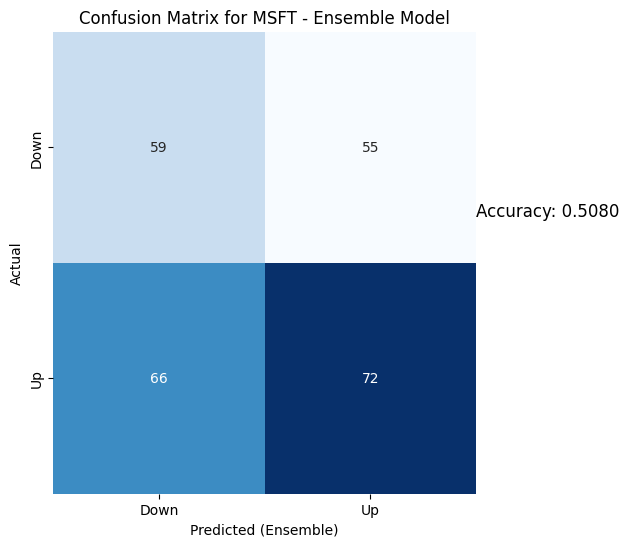

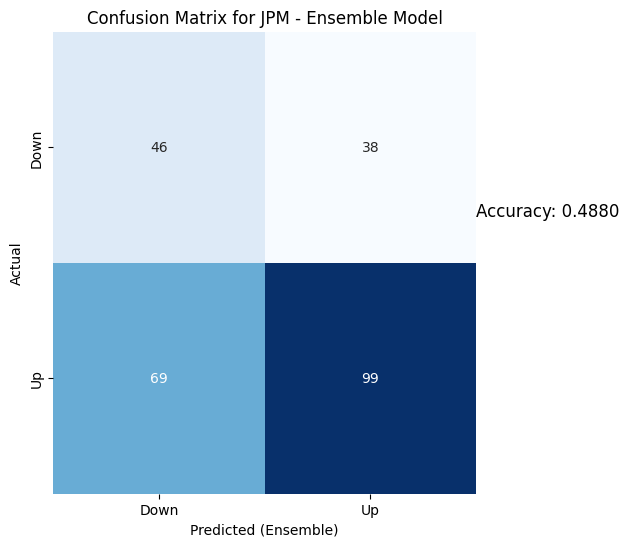

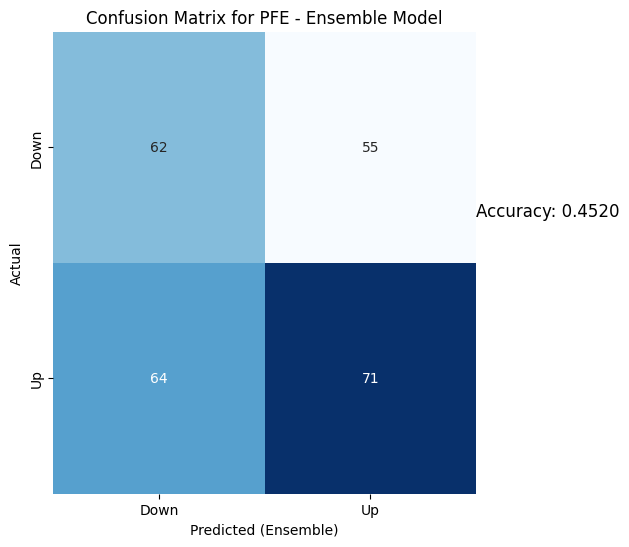

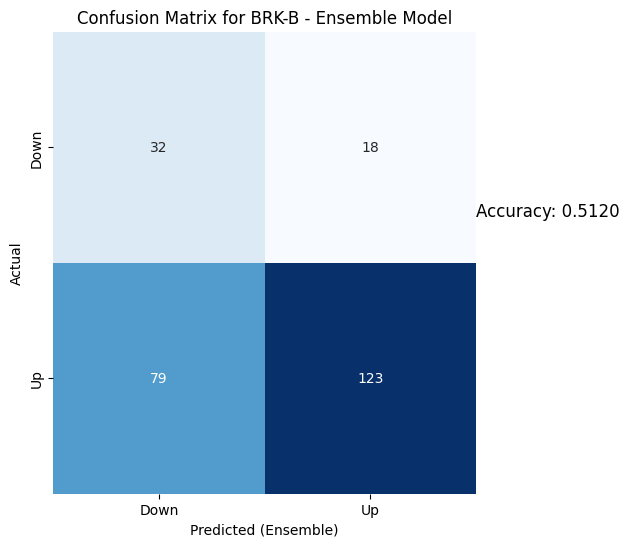

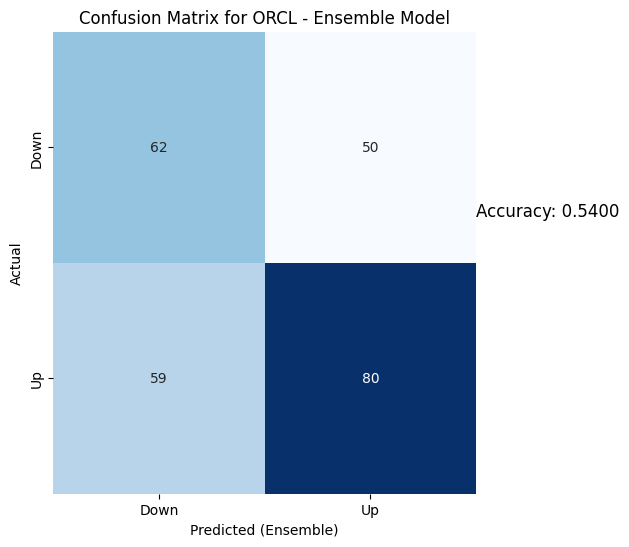

...

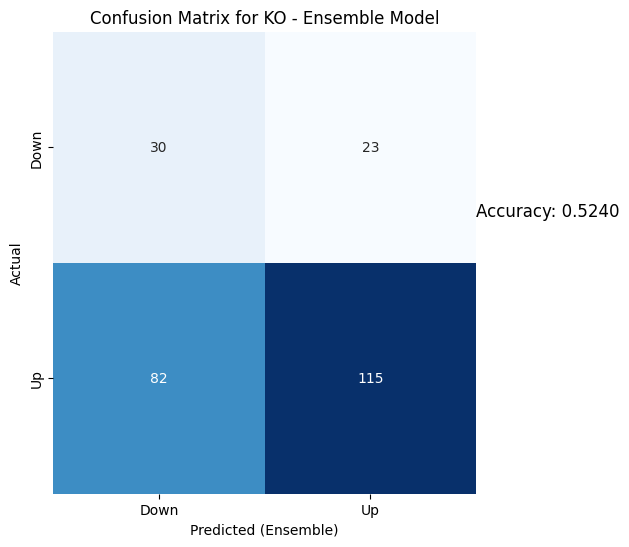

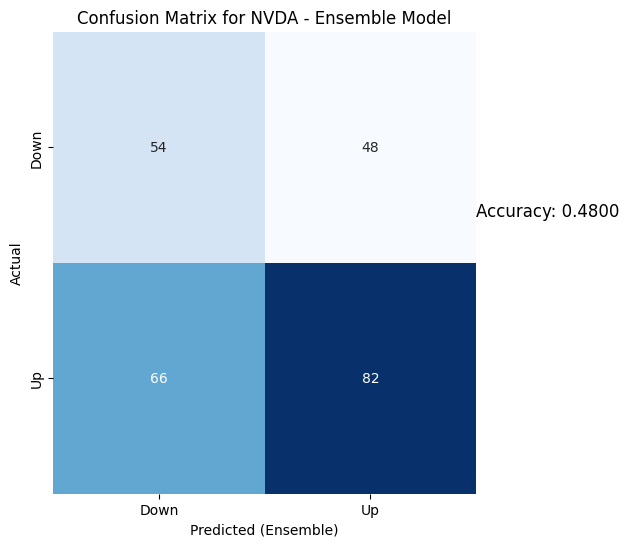

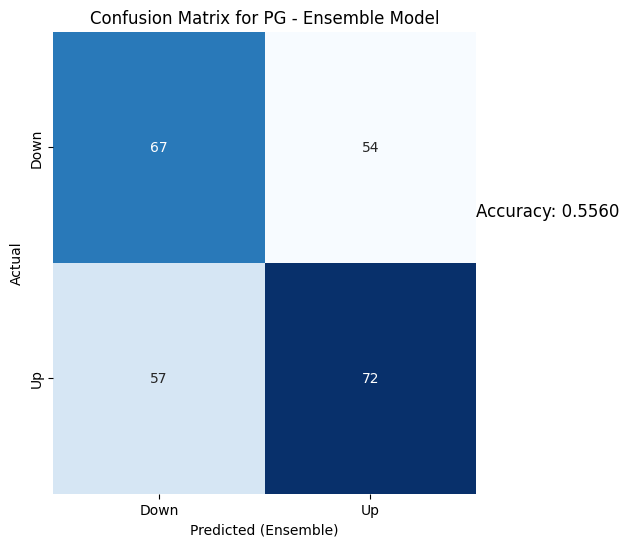

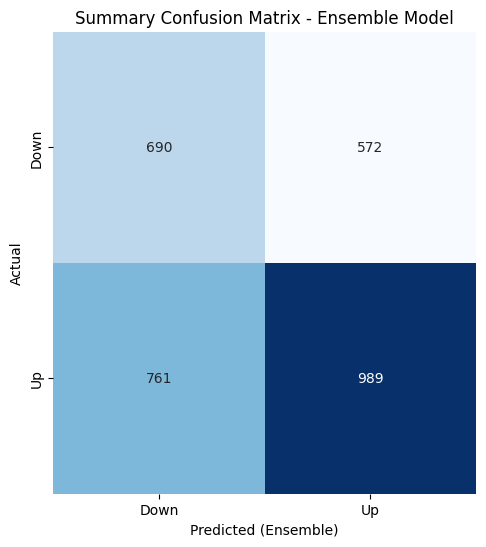

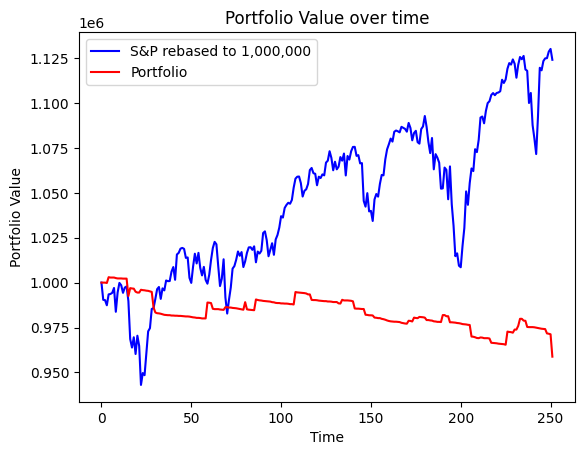

Portfolio return for our period =  95.87756214455432
S&P500 return during the period =  112.40457163856374


In [18]:
Portfolio_construct("2011-01-01")
#Testing for year 2014

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2263
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.498008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4405
LightGBM: 0.4802
GBR: 0.4643
RandomForest: 0.4643
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6957 - accuracy: 0.4759 - val_loss: 0.6937 - val_accuracy: 0.4822
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6943 - accuracy: 0.5025 - val_loss: 0.6942 - val_accuracy: 0.4924
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5025 - val_loss: 0.6954 - val_accuracy: 0.5025
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6942 - accuracy: 0.5241 - val_loss: 0.6996 - val_accuracy: 0.5025
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6928 - accuracy: 0.5051 - val_loss: 0.6954 - val_accuracy: 0.5025
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6917 - accuracy: 0.5203 - val_loss: 0.6956 - val_accuracy: 0.5025
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5040
LightGBM: 0.5198
GBR: 0.5238
RandomForest: 0.5040
XGBoost: 0.5159
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6992 - accuracy: 0.5032 - val_loss: 0.6937 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5184 - val_loss: 0.6974 - val_accuracy: 0.4924
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5273 - val_loss: 0.7008 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 0.5286 - val_loss: 0.6999 - val_accuracy: 0.4924
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6915 - accuracy: 0.5210 - val_loss: 0.6992 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5159 - val_loss: 0.6950 - val_accuracy: 0.4924
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4563
LightGBM: 0.5238
GBR: 0.5397
RandomForest: 0.5556
XGBoost: 0.5317
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.7005 - accuracy: 0.4987 - val_loss: 0.6902 - val_accuracy: 0.5381
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6959 - accuracy: 0.4987 - val_loss: 0.6932 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6935 - accuracy: 0.5115 - val_loss: 0.6914 - val_accuracy: 0.5431
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6930 - accuracy: 0.4796 - val_loss: 0.6905 - val_accuracy: 0.5431
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6917 - accuracy: 0.5089 - val_loss: 0.6925 - val_accuracy: 0.4975
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5331 - val_loss: 0.6902 - val_accuracy: 0.5330
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.4048
LightGBM: 0.5198
GBR: 0.4206
RandomForest: 0.4683
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6937 - accuracy: 0.5121 - val_loss: 0.7062 - val_accuracy: 0.4112
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6936 - accuracy: 0.5312 - val_loss: 0.6986 - val_accuracy: 0.4112
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 0.5312 - val_loss: 0.7086 - val_accuracy: 0.4061
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6921 - accuracy: 0.5312 - val_loss: 0.7028 - val_accuracy: 0.4010
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5287 - val_loss: 0.7041 - val_accuracy: 0.4061
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5312 - val_loss: 0.7064 - val_accuracy: 0.4061
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.4821
LightGBM: 0.5299
GBR: 0.5259
RandomForest: 0.5139
XGBoost: 0.4701
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6943 - accuracy: 0.5026 - val_loss: 0.6938 - val_accuracy: 0.4721
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6940 - accuracy: 0.5051 - val_loss: 0.6997 - val_accuracy: 0.4721
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 0.5383 - val_loss: 0.6981 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 0.5344 - val_loss: 0.6990 - val_accuracy: 0.4772
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6921 - accuracy: 0.5179 - val_loss: 0.6940 - val_accuracy: 0.4822
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6911 - accuracy: 0.5204 - val_loss: 0.6920 - val_accuracy: 0.4924
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.4701
LightGBM: 0.5139
GBR: 0.5777
RandomForest: 0.5538
XGBoost: 0.5179
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6939 - accuracy: 0.5166 - val_loss: 0.6969 - val_accuracy: 0.4337
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6922 - accuracy: 0.5242 - val_loss: 0.7046 - val_accuracy: 0.4337
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6920 - accuracy: 0.5344 - val_loss: 0.7062 - val_accuracy: 0.4337
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6905 - accuracy: 0.5281 - val_loss: 0.6910 - val_accuracy: 0.5357
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6905 - accuracy: 0.5255 - val_loss: 0.7199 - val_accuracy: 0.4337
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6902 - accuracy: 0.5370 - val_loss: 0.6933 - val_accuracy: 0.5357
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5100
LightGBM: 0.4940
GBR: 0.5060
RandomForest: 0.5299
XGBoost: 0.5100
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.7001 - accuracy: 0.4815 - val_loss: 0.6916 - val_accuracy: 0.5255
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6932 - accuracy: 0.5236 - val_loss: 0.6918 - val_accuracy: 0.5102
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6929 - accuracy: 0.5096 - val_loss: 0.6933 - val_accuracy: 0.4898
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.5096 - val_loss: 0.6916 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6932 - accuracy: 0.4968 - val_loss: 0.6916 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6925 - accuracy: 0.5172 - val_loss: 0.6912 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4861
LightGBM: 0.5339
GBR: 0.5498
RandomForest: 0.5498
XGBoost: 0.5378
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.7004 - accuracy: 0.4962 - val_loss: 0.6943 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6915 - accuracy: 0.5307 - val_loss: 0.7064 - val_accuracy: 0.4592
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5102 - val_loss: 0.6938 - val_accuracy: 0.4949
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6918 - accuracy: 0.5090 - val_loss: 0.7053 - val_accuracy: 0.4592
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6914 - accuracy: 0.5179 - val_loss: 0.6921 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6907 - accuracy: 0.5230 - val_loss: 0.7094 - val_accuracy: 0.4592
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5120
LightGBM: 0.5560
GBR: 0.5520
RandomForest: 0.5360
XGBoost: 0.5360
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6973 - accuracy: 0.4904 - val_loss: 0.6955 - val_accuracy: 0.4694
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5134 - val_loss: 0.6917 - val_accuracy: 0.5000
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.5006 - val_loss: 0.6934 - val_accuracy: 0.5561
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.5262 - val_loss: 0.6923 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6923 - accuracy: 0.5134 - val_loss: 0.6933 - val_accuracy: 0.5459
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6941 - accuracy: 0.5096 - val_loss: 0.6922 - val_accuracy: 0.5102
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5560
LightGBM: 0.4800
GBR: 0.4560
RandomForest: 0.5120
XGBoost: 0.4880
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6986 - accuracy: 0.4782 - val_loss: 0.7017 - val_accuracy: 0.4694
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6944 - accuracy: 0.5064 - val_loss: 0.6904 - val_accuracy: 0.5612
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6926 - accuracy: 0.5256 - val_loss: 0.6874 - val_accuracy: 0.5612
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6894 - accuracy: 0.5372 - val_loss: 0.6873 - val_accuracy: 0.5612
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6890 - accuracy: 0.5397 - val_loss: 0.6947 - val_accuracy: 0.4592
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6888 - accuracy: 0.5333 - val_loss: 0.6914 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5360
LightGBM: 0.4800
GBR: 0.5040
RandomForest: 0.4720
XGBoost: 0.4720
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6970 - accuracy: 0.4821 - val_loss: 0.6899 - val_accuracy: 0.5487
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6957 - accuracy: 0.4833 - val_loss: 0.6902 - val_accuracy: 0.5487
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6935 - accuracy: 0.5141 - val_loss: 0.6904 - val_accuracy: 0.5231
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6945 - accuracy: 0.5141 - val_loss: 0.6890 - val_accuracy: 0.5282
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5218 - val_loss: 0.6882 - val_accuracy: 0.5231
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.4936 - val_loss: 0.6882 - val_accuracy: 0.5231
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4480
LightGBM: 0.5200
GBR: 0.4840
RandomForest: 0.5240
XGBoost: 0.4880
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6960 - accuracy: 0.4775 - val_loss: 0.6904 - val_accuracy: 0.5282
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6943 - accuracy: 0.4942 - val_loss: 0.6894 - val_accuracy: 0.5282
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6932 - accuracy: 0.5173 - val_loss: 0.6899 - val_accuracy: 0.5231
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.4929 - val_loss: 0.6917 - val_accuracy: 0.5077
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6938 - accuracy: 0.5083 - val_loss: 0.6930 - val_accuracy: 0.5026
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.4968 - val_loss: 0.6926 - val_accuracy: 0.5128
Epoch 7/10
25/25 [==============================] - 0s 18

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1779 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  29.09867286682129  and sold at  29.525617599487305
NVDA bought at  4.837500095367432  and sold at  5.034999847412109
45.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1780 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  45.7400016784668  and sold at  47.52000045776367
61.47999954223633
30.332067489624023


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1781 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  61.47999954223633  and sold at  61.93000030517578
PFE bought at  30.332067489624023  and sold at  30.303604125976562
30.303604125976562
27.94499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1782 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  30.303604125976562  and sold at  30.445920944213867
AAPL bought at  27.94499969482422  and sold at  28.235000610351562
30.445920944213867
45.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1783 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  30.445920944213867  and sold at  29.83871078491211
ORCL bought at  45.650001525878906  and sold at  46.0099983215332
29.83871078491211
28.135000228881836
155.10516357421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1784 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM']
PFE bought at  29.83871078491211  and sold at  29.81024742126465
AAPL bought at  28.135000228881836  and sold at  28.002500534057617
IBM bought at  155.10516357421875  and sold at  154.70362854003906
28.002500534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1785 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  28.002500534057617  and sold at  28.497499465942383
62.54999923706055
28.497499465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1786 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  62.54999923706055  and sold at  62.959999084472656
AAPL bought at  28.497499465942383  and sold at  28.477500915527344
62.4900016784668
27.332500457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1787 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  62.4900016784668  and sold at  60.54999923706055
AAPL bought at  27.332500457763672  and sold at  26.5625
60.54999923706055
17.3799991607666
42.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1788 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC', 'KO']
JPM bought at  60.54999923706055  and sold at  58.97999954223633
BAC bought at  17.3799991607666  and sold at  16.860000610351562
KO bought at  42.13999938964844  and sold at  42.459999084472656
16.860000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1789 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.860000610351562  and sold at  16.940000534057617
59.06999969482422
26.9375
4.784999847412109


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1790 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'NVDA']
JPM bought at  59.06999969482422  and sold at  60.38999938964844
AAPL bought at  26.9375  and sold at  27.97249984741211
NVDA bought at  4.784999847412109  and sold at  4.965000152587891
47.59000015258789
27.97249984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1791 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  47.59000015258789  and sold at  47.189998626708984
AAPL bought at  27.97249984741211  and sold at  28.002500534057617
59.34000015258789
28.002500534057617
152.11280822753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1792 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'IBM']
JPM bought at  59.34000015258789  and sold at  58.83000183105469
AAPL bought at  28.002500534057617  and sold at  27.3125
IBM bought at  152.11280822753906  and sold at  149.5602264404297
46.599998474121094
58.83000183105469
27.3125
16.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1793 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL', 'BAC']
MSFT bought at  46.599998474121094  and sold at  46.36000061035156
JPM bought at  58.83000183105469  and sold at  58.84000015258789
AAPL bought at  27.3125  and sold at  27.55500030517578
BAC bought at  16.68000030517578  and sold at  16.450000762939453
46.36000061035156
58.84000015258789
30.77798843383789
16.450000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1794 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'BAC']
MSFT bought at  46.36000061035156  and sold at  45.959999084472656
JPM bought at  58.84000015258789  and sold at  56.810001373291016
PFE bought at  30.77798843383789  and sold at  30.81593894958496
BAC bought at  16.450000762939453  and sold at  16.040000915527344
45.959999084472656
30.81593894958496


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1795 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  45.959999084472656  and sold at  45.47999954223633
PFE bought at  30.81593894958496  and sold at  30.74003791809082
45.47999954223633
54.9900016784668
30.74003791809082
26.704999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1796 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'AAPL']
MSFT bought at  45.47999954223633  and sold at  46.2400016784668
JPM bought at  54.9900016784668  and sold at  55.93000030517578
PFE bought at  30.74003791809082  and sold at  31.119544982910156
AAPL bought at  26.704999923706055  and sold at  26.497499465942383
55.93000030517578
31.119544982910156
26.497499465942383
15.380000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1797 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL', 'BAC']
JPM bought at  55.93000030517578  and sold at  55.709999084472656
PFE bought at  31.119544982910156  and sold at  31.4041748046875
AAPL bought at  26.497499465942383  and sold at  27.18000030517578
BAC bought at  15.380000114440918  and sold at  15.260000228881836
43.900001525878906
27.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1798 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  43.900001525878906  and sold at  43.4900016784668
AAPL bought at  27.18000030517578  and sold at  27.387500762939453
55.88999938964844
27.387500762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1799 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  55.88999938964844  and sold at  57.59000015258789
AAPL bought at  27.387500762939453  and sold at  28.100000381469727
57.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1800 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  57.59000015258789  and sold at  56.68000030517578
44.189998626708984
149.01528930664062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1801 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  44.189998626708984  and sold at  43.900001525878906
IBM bought at  149.01528930664062  and sold at  149.48374938964844
41.189998626708984
54.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1802 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  41.189998626708984  and sold at  42.0099983215332
JPM bought at  54.75  and sold at  55.66999816894531
41.88999938964844
29.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1803 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  41.88999938964844  and sold at  42.68000030517578
AAPL bought at  29.290000915527344  and sold at  29.657499313354492
55.470001220703125
29.657499313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1804 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  55.470001220703125  and sold at  56.720001220703125
AAPL bought at  29.657499313354492  and sold at  29.662500381469727
56.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1805 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.720001220703125  and sold at  56.380001068115234
56.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1806 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  56.77000045776367  and sold at  57.88999938964844
57.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1807 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  57.88999938964844  and sold at  57.81999969482422
42.599998474121094
58.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1808 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  42.599998474121094  and sold at  42.380001068115234
JPM bought at  58.459999084472656  and sold at  58.369998931884766
58.369998931884766
16.360000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1809 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  58.369998931884766  and sold at  59.56999969482422
BAC bought at  16.360000610351562  and sold at  16.670000076293945
16.299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1810 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.299999237060547  and sold at  16.209999084472656
16.200000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1811 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.200000762939453  and sold at  16.3799991607666
43.880001068115234
16.3799991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1812 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  43.880001068115234  and sold at  43.72999954223633
BAC bought at  16.3799991607666  and sold at  16.489999771118164
43.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1813 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  43.9900016784668  and sold at  44.060001373291016
43.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1814 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  43.88999938964844  and sold at  43.81999969482422
32.561668395996094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1815 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  32.561668395996094  and sold at  32.98861312866211
43.060001373291016
32.1349983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1816 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  43.060001373291016  and sold at  43.11000061035156
AAPL bought at  32.1349983215332  and sold at  31.602500915527344
43.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1817 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  43.79999923706055  and sold at  42.380001068115234
5.637499809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1818 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  5.637499809265137  and sold at  5.652500152587891
151.03250122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1819 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  151.03250122070312  and sold at  147.49522399902344
147.49522399902344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1820 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  147.49522399902344  and sold at  150.17208862304688
61.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1821 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  61.20000076293945  and sold at  61.75
33.254268646240234
15.720000267028809


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1822 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  33.254268646240234  and sold at  32.75142288208008
BAC bought at  15.720000267028809  and sold at  15.609999656677246
153.44168090820312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1823 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  153.44168090820312  and sold at  152.1797332763672
152.1797332763672
5.252500057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1824 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  152.1797332763672  and sold at  153.3938751220703
NVDA bought at  5.252500057220459  and sold at  5.264999866485596
41.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1825 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  41.529998779296875  and sold at  41.41999816894531
41.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1826 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  41.41999816894531  and sold at  41.47999954223633
41.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1827 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  41.47999954223633  and sold at  41.720001220703125
41.720001220703125
155.69789123535156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1828 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  41.720001220703125  and sold at  41.7599983215332
IBM bought at  155.69789123535156  and sold at  155.23899841308594
41.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1829 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  41.650001525878906  and sold at  42.2599983215332
46.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1830 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  46.279998779296875  and sold at  46.70000076293945
16.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1831 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.489999771118164  and sold at  16.43000030517578
43.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1832 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  43.790000915527344  and sold at  44.380001068115234
16.350000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1833 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.350000381469727  and sold at  16.510000228881836
31.969999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1834 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  31.969999313354492  and sold at  31.649999618530273
41.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1835 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  41.4900016784668  and sold at  41.709999084472656
41.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1836 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  41.709999084472656  and sold at  41.20000076293945
32.476280212402344
32.02750015258789
40.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1837 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'KO']
PFE bought at  32.476280212402344  and sold at  32.27703857421875
AAPL bought at  32.02750015258789  and sold at  31.875
KO bought at  40.189998626708984  and sold at  40.02000045776367
40.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1838 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  40.02000045776367  and sold at  40.0
40.9900016784668
5.184999942779541


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1839 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  40.9900016784668  and sold at  40.41999816894531
NVDA bought at  5.184999942779541  and sold at  5.03000020980835
31.13249969482422
16.889999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1840 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  31.13249969482422  and sold at  31.357500076293945
BAC bought at  16.889999389648438  and sold at  17.020000457763672
44.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1841 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  44.400001525878906  and sold at  44.38999938964844
44.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1842 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  44.38999938964844  and sold at  44.29999923706055
4.912499904632568


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1843 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.912499904632568  and sold at  4.852499961853027
4.852499961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1844 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  4.852499961853027  and sold at  4.9375
40.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1845 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  40.959999084472656  and sold at  40.400001525878906
153.29827880859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1846 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  153.29827880859375  and sold at  154.61758422851562
68.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1847 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  68.05000305175781  and sold at  68.94000244140625
30.747499465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1848 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  30.747499465942383  and sold at  30.592500686645508
47.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1849 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  47.58000183105469  and sold at  46.619998931884766
46.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1850 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  46.619998931884766  and sold at  46.7400016784668
46.7400016784668
33.3870964050293
148.29827880859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1851 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'IBM']
MSFT bought at  46.7400016784668  and sold at  47.33000183105469
PFE bought at  33.3870964050293  and sold at  33.54838562011719
IBM bought at  148.29827880859375  and sold at  149.85659790039062
47.33000183105469
143.4199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1852 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  47.33000183105469  and sold at  46.40999984741211
BRK-B bought at  143.4199981689453  and sold at  142.8000030517578
46.40999984741211
33.320682525634766
142.8000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1853 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BRK-B']
MSFT bought at  46.40999984741211  and sold at  46.7400016784668
PFE bought at  33.320682525634766  and sold at  33.55787658691406
BRK-B bought at  142.8000030517578  and sold at  141.60000610351562
141.60000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1854 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  141.60000610351562  and sold at  141.9499969482422
46.72999954223633
39.310001373291016
28.787500381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1855 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  46.72999954223633  and sold at  47.0
ORCL bought at  39.310001373291016  and sold at  39.40999984741211
AAPL bought at  28.787500381469727  and sold at  28.989999771118164
47.0
28.989999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1856 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  47.0  and sold at  47.31999969482422
AAPL bought at  28.989999771118164  and sold at  29.290000915527344
47.31999969482422
29.290000915527344
75.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1857 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'PG']
MSFT bought at  47.31999969482422  and sold at  47.27000045776367
AAPL bought at  29.290000915527344  and sold at  29.125
PG bought at  75.52999877929688  and sold at  75.12999725341797
33.700191497802734
29.125
41.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1858 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'KO']
PFE bought at  33.700191497802734  and sold at  33.46299743652344
AAPL bought at  29.125  and sold at  28.752500534057617
KO bought at  41.29999923706055  and sold at  40.779998779296875
28.752500534057617
17.459999084472656
40.779998779296875
74.12000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1859 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'KO', 'PG']
AAPL bought at  28.752500534057617  and sold at  28.162500381469727
BAC bought at  17.459999084472656  and sold at  16.719999313354492
KO bought at  40.779998779296875  and sold at  40.54999923706055
PG bought at  74.12000274658203  and sold at  73.91000366210938
40.54999923706055
73.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1860 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  40.54999923706055  and sold at  39.529998779296875
PG bought at  73.91000366210938  and sold at  71.83999633789062
31.821632385253906
26.440000534057617
39.529998779296875
71.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1861 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'KO', 'PG']
PFE bought at  31.821632385253906  and sold at  30.483871459960938
AAPL bought at  26.440000534057617  and sold at  25.780000686645508
KO bought at  39.529998779296875  and sold at  38.380001068115234
PG bought at  71.83999633789062  and sold at  69.13999938964844
41.68000030517578
15.289999961853027
38.380001068115234
69.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1862 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'KO', 'PG']
MSFT bought at  41.68000030517578  and sold at  40.470001220703125
BAC bought at  15.289999961853027  and sold at  15.260000228881836
KO bought at  38.380001068115234  and sold at  37.9900016784668
PG bought at  69.13999938964844  and sold at  68.41999816894531
29.734344482421875
15.260000228881836
68.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1863 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'PG']
PFE bought at  29.734344482421875  and sold at  30.76850128173828
BAC bought at  15.260000228881836  and sold at  16.059999465942383
PG bought at  68.41999816894531  and sold at  70.9000015258789
30.76850128173828
27.422500610351562
140.24856567382812
70.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1864 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'IBM', 'PG']
PFE bought at  30.76850128173828  and sold at  31.55597686767578
AAPL bought at  27.422500610351562  and sold at  28.229999542236328
IBM bought at  140.24856567382812  and sold at  142.0076446533203
PG bought at  70.9000015258789  and sold at  71.4800033569336
43.900001525878906
31.55597686767578
28.229999542236328
39.27000045776367
71.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1865 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'AAPL', 'KO', 'PG']
MSFT bought at  43.900001525878906  and sold at  43.93000030517578
PFE bought at  31.55597686767578  and sold at  30.986717224121094
AAPL bought at  28.229999542236328  and sold at  28.322500228881836
KO bought at  39.27000045776367  and sold at  39.45000076293945
PG bought at  71.4800033569336  and sold at  71.20999908447266
43.93000030517578
71.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1866 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  43.93000030517578  and sold at  43.52000045776367
PG bought at  71.20999908447266  and sold at  70.66999816894531
30.569259643554688
28.190000534057617
70.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1867 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'PG']
PFE bought at  30.569259643554688  and sold at  29.753320693969727
AAPL bought at  28.190000534057617  and sold at  26.93000030517578
PG bought at  70.66999816894531  and sold at  68.9000015258789
41.81999969482422
26.93000030517578
38.75
68.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1868 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO', 'PG']
MSFT bought at  41.81999969482422  and sold at  43.36000061035156
AAPL bought at  26.93000030517578  and sold at  28.084999084472656
KO bought at  38.75  and sold at  38.900001525878906
PG bought at  68.9000015258789  and sold at  69.80999755859375
28.084999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1869 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  28.084999084472656  and sold at  27.592500686645508
69.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1870 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  69.93000030517578  and sold at  68.76000213623047
42.61000061035156
129.63999938964844
27.3174991607666
38.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1871 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'AAPL', 'KO']
MSFT bought at  42.61000061035156  and sold at  43.88999938964844
BRK-B bought at  129.63999938964844  and sold at  132.89999389648438
AAPL bought at  27.3174991607666  and sold at  28.077499389648438
KO bought at  38.52000045776367  and sold at  38.900001525878906
43.88999938964844
140.75526428222656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1872 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  43.88999938964844  and sold at  43.06999969482422
IBM bought at  140.75526428222656  and sold at  138.67112731933594
43.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1873 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  43.290000915527344  and sold at  43.47999954223633
43.040000915527344
31.034156799316406
28.827499389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1874 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'AAPL']
MSFT bought at  43.040000915527344  and sold at  43.97999954223633
PFE bought at  31.034156799316406  and sold at  31.47058868408203
AAPL bought at  28.827499389648438  and sold at  29.06999969482422
43.97999954223633
31.47058868408203
29.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1875 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'AAPL']
MSFT bought at  43.97999954223633  and sold at  44.29999923706055
PFE bought at  31.47058868408203  and sold at  31.48007583618164
AAPL bought at  29.06999969482422  and sold at  29.102500915527344
44.29999923706055
31.48007583618164
38.27000045776367
16.329999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1876 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'ORCL', 'BAC']
MSFT bought at  44.29999923706055  and sold at  44.25
PFE bought at  31.48007583618164  and sold at  31.764705657958984
ORCL bought at  38.27000045776367  and sold at  36.7400016784668
BAC bought at  16.329999923706055  and sold at  15.859999656677246
31.764705657958984
36.7400016784668
141.625244140625
45.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1877 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'IBM', 'VZ']
PFE bought at  31.764705657958984  and sold at  31.166982650756836
ORCL bought at  36.7400016784668  and sold at  36.380001068115234
IBM bought at  141.625244140625  and sold at  138.15487670898438
VZ bought at  45.22999954223633  and sold at  44.56999969482422
30.75901222229004


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1878 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  30.75901222229004  and sold at  30.607210159301758
38.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1879 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.790000915527344  and sold at  38.7599983215332
38.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1880 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  38.7599983215332  and sold at  39.150001525878906
28.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1881 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  28.75  and sold at  28.677499771118164
28.677499771118164
39.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1882 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  28.677499771118164  and sold at  28.110000610351562
KO bought at  39.619998931884766  and sold at  39.529998779296875
43.290000915527344
136.2523956298828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1883 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  43.290000915527344  and sold at  43.439998626708984
IBM bought at  136.2523956298828  and sold at  136.20458984375
43.439998626708984
136.20458984375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1884 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  43.439998626708984  and sold at  44.2599983215332
IBM bought at  136.20458984375  and sold at  138.5946502685547
44.2599983215332
36.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1885 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  44.2599983215332  and sold at  44.61000061035156
ORCL bought at  36.119998931884766  and sold at  36.2400016784668
30.208728790283203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1886 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  30.208728790283203  and sold at  31.38519859313965
138.2218017578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1887 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  138.2218017578125  and sold at  142.48565673828125
46.75
27.827499389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1888 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  46.75  and sold at  46.79999923706055
AAPL bought at  27.827499389648438  and sold at  27.69499969482422
46.79999923706055
31.584440231323242


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1889 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  46.79999923706055  and sold at  47.45000076293945
PFE bought at  31.584440231323242  and sold at  31.39468765258789
47.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1890 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  47.45000076293945  and sold at  47.11000061035156
31.537002563476562
145.68833923339844
42.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1891 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM', 'KO']
PFE bought at  31.537002563476562  and sold at  31.51802635192871
IBM bought at  145.68833923339844  and sold at  144.49330139160156
KO bought at  42.02000045776367  and sold at  42.0
27.899999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1892 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  27.899999618530273  and sold at  27.947500228881836
27.947500228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1893 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  27.947500228881836  and sold at  27.552499771118164
46.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1894 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  46.68000030517578  and sold at  47.0099983215332
52.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1895 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  52.869998931884766  and sold at  54.25
32.08728790283203
38.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1896 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  32.08728790283203  and sold at  33.263755798339844
ORCL bought at  38.84000015258789  and sold at  39.75
30.642499923706055
17.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1897 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  30.642499923706055  and sold at  30.5
BAC bought at  17.18000030517578  and sold at  17.010000228881836
30.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1898 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  30.5  and sold at  30.229999542236328
40.349998474121094
76.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1899 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  40.349998474121094  and sold at  40.619998931884766
PG bought at  76.38999938964844  and sold at  75.56999969482422
30.264999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1900 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  30.264999389648438  and sold at  30.142499923706055
129.35946655273438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1901 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  129.35946655273438  and sold at  129.51242065429688
53.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1902 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  53.650001525878906  and sold at  53.31999969482422
31.679317474365234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1903 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  31.679317474365234  and sold at  31.565465927124023
75.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1904 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  75.30000305175781  and sold at  75.06999969482422
129.84703063964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1905 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  129.84703063964844  and sold at  130.72657775878906
29.4375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1906 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  29.4375  and sold at  29.719999313354492
17.469999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1907 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  17.469999313354492  and sold at  17.440000534057617
53.689998626708984
31.185958862304688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1908 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  53.689998626708984  and sold at  53.93000030517578
PFE bought at  31.185958862304688  and sold at  31.110057830810547
55.209999084472656
75.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1909 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  55.209999084472656  and sold at  54.20000076293945
PG bought at  75.79000091552734  and sold at  75.73999786376953
31.119544982910156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1910 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  31.119544982910156  and sold at  30.986717224121094
135.60000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1911 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  135.60000610351562  and sold at  133.36000061035156
28.905000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1912 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  28.905000686645508  and sold at  29.042499542236328
30.70208740234375
29.042499542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1913 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  30.70208740234375  and sold at  30.417457580566406
AAPL bought at  29.042499542236328  and sold at  28.295000076293945
[1000000.0, 999464.8213781031, 981414.8477658464, 972170.9343740649, 984285.3175389444, 1001751.4869227929, 993723.881831907, 985939.4790111467, 983166.3346886392, 977230.744241262, 968278.7329636847, 980976.99459454, 983069.0092380486, 988031.5678922224, 1002724.5929535631, 997226.8556774923, 999562.1468286936, 986377.4064200203, 973727.7703956766, 982728.4815173327, 970370.7476071933, 982387.8795590496, 996594.3516050051, 992799.4756452154, 1002821.8441665864, 1000048.6998440787, 995572.6942052902, 1006178.8669550697, 1006762.6711834783, 1016444.5119841334, 1020628.6155087178, 1022234.1513744084, 1022331.476824999, 1021601.6473019209, 1027731.8886504791, 1027585.937593377, 1030505.0329729866, 1029629.

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1914 times so far.

  warnings.warn(msg, UserWarning)


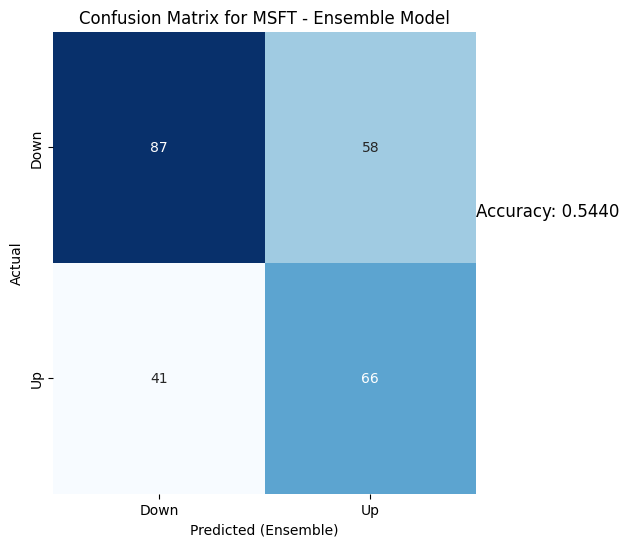

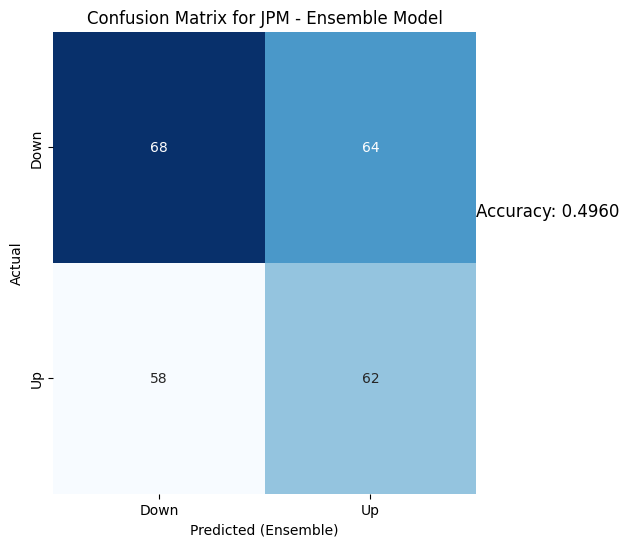

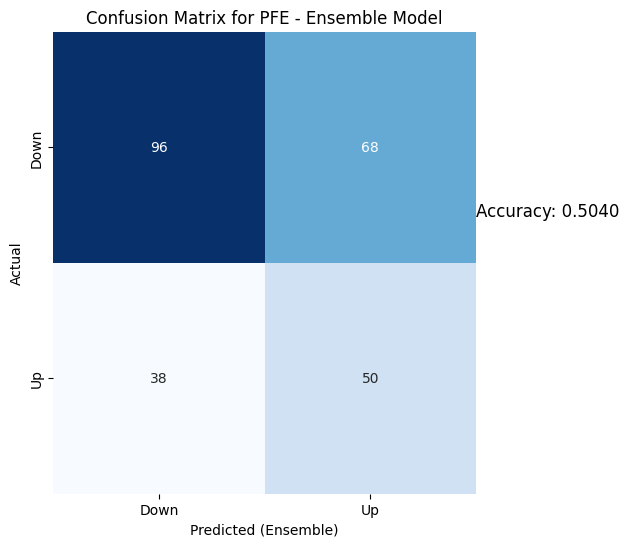

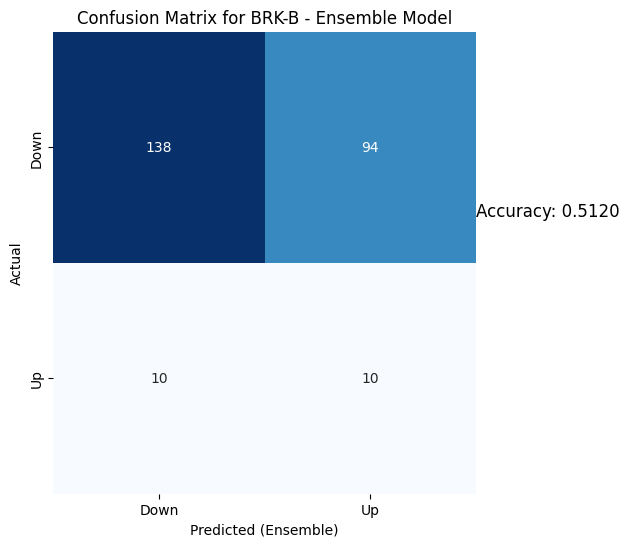

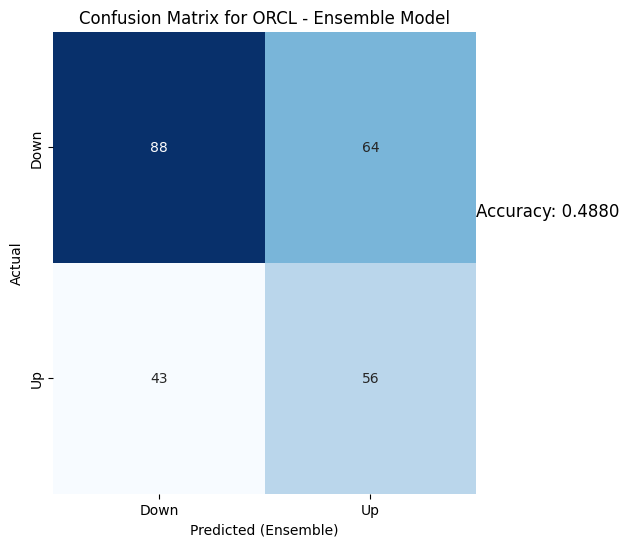

...

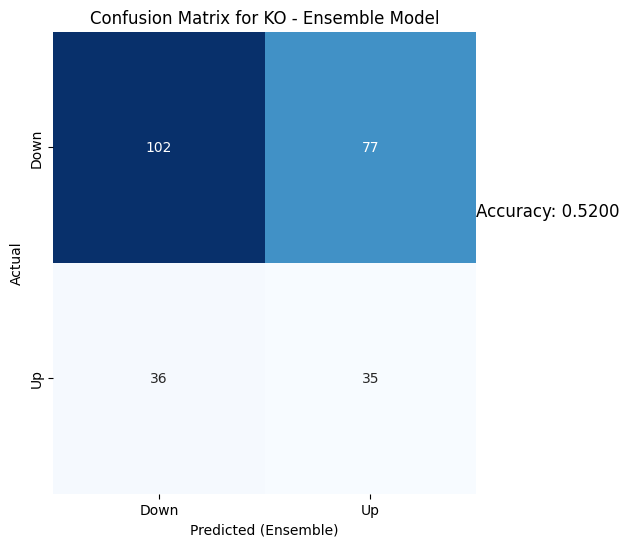

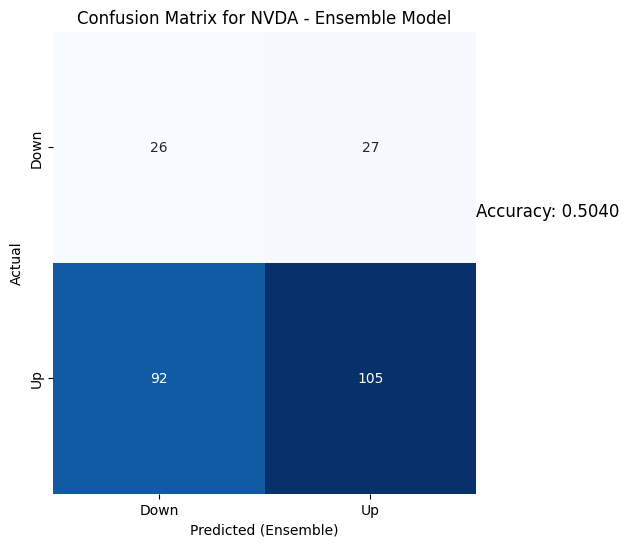

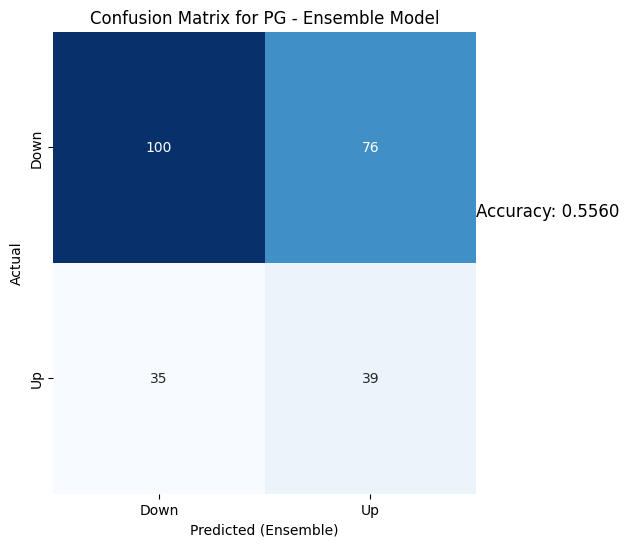

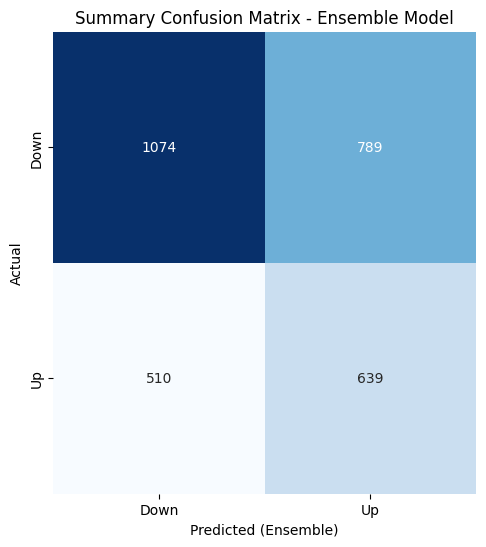

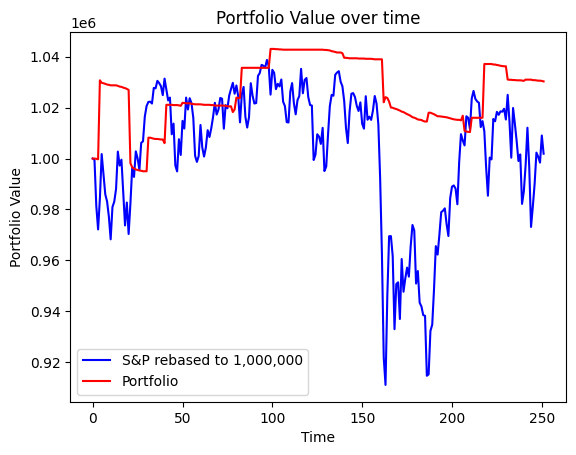

Portfolio return for our period =  103.02836633744887
S&P500 return during the period =  100.18974379798948


In [19]:
Portfolio_construct("2012-01-01")
#Testing for year 2015

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2265
[LightGBM] [Info] Number of data points in the train set: 755, number of used features: 9
[LightGBM] [Info] Start training from score 0.512583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5138
LightGBM: 0.4625
GBR: 0.5415
RandomForest: 0.4822
XGBoost: 0.4783
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6952 - accuracy: 0.5076 - val_loss: 0.6957 - val_accuracy: 0.4798
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5076 - val_loss: 0.6982 - val_accuracy: 0.4798
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.5177 - val_loss: 0.6947 - val_accuracy: 0.4848
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6943 - accuracy: 0.4937 - val_loss: 0.6973 - val_accuracy: 0.4798
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5177 - val_loss: 0.6986 - val_accuracy: 0.4798
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6905 - accuracy: 0.5354 - val_loss: 0.7024 - val_accuracy: 0.4798
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5138
LightGBM: 0.4625
GBR: 0.5138
RandomForest: 0.4980
XGBoost: 0.4941
Epoch 1/10
25/25 [==============================] - 5s 50ms/step - loss: 0.6949 - accuracy: 0.4804 - val_loss: 0.6891 - val_accuracy: 0.5354
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6955 - accuracy: 0.5108 - val_loss: 0.6958 - val_accuracy: 0.4697
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5260 - val_loss: 0.6915 - val_accuracy: 0.5354
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6935 - accuracy: 0.5057 - val_loss: 0.6909 - val_accuracy: 0.5303
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5019 - val_loss: 0.6956 - val_accuracy: 0.5051
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6927 - accuracy: 0.5095 - val_loss: 0.6929 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5178
LightGBM: 0.4545
GBR: 0.4783
RandomForest: 0.4625
XGBoost: 0.4822
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6932 - accuracy: 0.5292 - val_loss: 0.7078 - val_accuracy: 0.4798
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6919 - accuracy: 0.5102 - val_loss: 0.7133 - val_accuracy: 0.4798
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6907 - accuracy: 0.5203 - val_loss: 0.7114 - val_accuracy: 0.4798
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6898 - accuracy: 0.5457 - val_loss: 0.7114 - val_accuracy: 0.4798
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6894 - accuracy: 0.5228 - val_loss: 0.7221 - val_accuracy: 0.4798
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6894 - accuracy: 0.5368 - val_loss: 0.7102 - val_accuracy: 0.4747
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5714
LightGBM: 0.5278
GBR: 0.5079
RandomForest: 0.5476
XGBoost: 0.5437
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6917 - accuracy: 0.5292 - val_loss: 0.7015 - val_accuracy: 0.4772
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5216 - val_loss: 0.6964 - val_accuracy: 0.4822
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6904 - accuracy: 0.5381 - val_loss: 0.7124 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6905 - accuracy: 0.5266 - val_loss: 0.7038 - val_accuracy: 0.4772
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.5330 - val_loss: 0.6982 - val_accuracy: 0.4721
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6886 - accuracy: 0.5457 - val_loss: 0.6990 - val_accuracy: 0.4721
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5119
LightGBM: 0.5040
GBR: 0.5556
RandomForest: 0.5397
XGBoost: 0.5516
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6982 - accuracy: 0.5019 - val_loss: 0.6990 - val_accuracy: 0.4975
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.5006 - val_loss: 0.6921 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.5108 - val_loss: 0.6932 - val_accuracy: 0.4975
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6921 - accuracy: 0.5146 - val_loss: 0.6939 - val_accuracy: 0.4975
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6916 - accuracy: 0.5133 - val_loss: 0.6929 - val_accuracy: 0.4975
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5133 - val_loss: 0.6944 - val_accuracy: 0.4975
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.4246
LightGBM: 0.5000
GBR: 0.4960
RandomForest: 0.4921
XGBoost: 0.5238
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6963 - accuracy: 0.4885 - val_loss: 0.6955 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6935 - accuracy: 0.5356 - val_loss: 0.6929 - val_accuracy: 0.5178
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6920 - accuracy: 0.5204 - val_loss: 0.6927 - val_accuracy: 0.5279
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.5293 - val_loss: 0.6921 - val_accuracy: 0.5076
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6902 - accuracy: 0.5254 - val_loss: 0.6921 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6912 - accuracy: 0.5280 - val_loss: 0.6926 - val_accuracy: 0.5076
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.4841
LightGBM: 0.5278
GBR: 0.5238
RandomForest: 0.5476
XGBoost: 0.5516
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6972 - accuracy: 0.4662 - val_loss: 0.6966 - val_accuracy: 0.4569
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6949 - accuracy: 0.4573 - val_loss: 0.6997 - val_accuracy: 0.4569
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.5006 - val_loss: 0.6923 - val_accuracy: 0.4873
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6941 - accuracy: 0.4815 - val_loss: 0.6947 - val_accuracy: 0.4569
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5197 - val_loss: 0.6931 - val_accuracy: 0.4772
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6920 - accuracy: 0.5223 - val_loss: 0.6921 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5100
LightGBM: 0.5020
GBR: 0.4701
RandomForest: 0.4622
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6957 - accuracy: 0.5102 - val_loss: 0.7070 - val_accuracy: 0.4873
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6954 - accuracy: 0.5038 - val_loss: 0.6918 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6912 - accuracy: 0.5153 - val_loss: 0.6924 - val_accuracy: 0.5178
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.5102 - val_loss: 0.6944 - val_accuracy: 0.4873
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.5191 - val_loss: 0.6945 - val_accuracy: 0.4873
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6896 - accuracy: 0.5281 - val_loss: 0.7002 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 17

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5299
LightGBM: 0.5219
GBR: 0.5498
RandomForest: 0.5100
XGBoost: 0.5299
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6954 - accuracy: 0.4911 - val_loss: 0.7097 - val_accuracy: 0.4235
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6945 - accuracy: 0.4872 - val_loss: 0.7016 - val_accuracy: 0.4286
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6936 - accuracy: 0.4962 - val_loss: 0.7023 - val_accuracy: 0.4286
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6975 - accuracy: 0.5230 - val_loss: 0.6948 - val_accuracy: 0.4745
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6936 - accuracy: 0.5191 - val_loss: 0.7003 - val_accuracy: 0.4541
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6915 - accuracy: 0.5332 - val_loss: 0.6947 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4661
LightGBM: 0.5299
GBR: 0.5020
RandomForest: 0.5020
XGBoost: 0.4861
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6938 - accuracy: 0.5172 - val_loss: 0.6976 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6902 - accuracy: 0.5300 - val_loss: 0.7034 - val_accuracy: 0.5102
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6873 - accuracy: 0.5338 - val_loss: 0.7008 - val_accuracy: 0.5102
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6886 - accuracy: 0.5441 - val_loss: 0.7022 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6865 - accuracy: 0.5556 - val_loss: 0.7053 - val_accuracy: 0.5102
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6867 - accuracy: 0.5326 - val_loss: 0.7084 - val_accuracy: 0.5102
Epoch 7/10
25/25 [==============================] - 0s 18

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5060
LightGBM: 0.5259
GBR: 0.4382
RandomForest: 0.4940
XGBoost: 0.4542
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6954 - accuracy: 0.5166 - val_loss: 0.6981 - val_accuracy: 0.4184
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5205 - val_loss: 0.6874 - val_accuracy: 0.6122
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6915 - accuracy: 0.5307 - val_loss: 0.6887 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6912 - accuracy: 0.5141 - val_loss: 0.6930 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6888 - accuracy: 0.5358 - val_loss: 0.7080 - val_accuracy: 0.4592
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6884 - accuracy: 0.5269 - val_loss: 0.7229 - val_accuracy: 0.4082
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4600
LightGBM: 0.5280
GBR: 0.4840
RandomForest: 0.4960
XGBoost: 0.5560
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6950 - accuracy: 0.5032 - val_loss: 0.6941 - val_accuracy: 0.4898
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6923 - accuracy: 0.5006 - val_loss: 0.6963 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6907 - accuracy: 0.5378 - val_loss: 0.6938 - val_accuracy: 0.5051
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6884 - accuracy: 0.5391 - val_loss: 0.6958 - val_accuracy: 0.5000
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6893 - accuracy: 0.5391 - val_loss: 0.6926 - val_accuracy: 0.5102
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6894 - accuracy: 0.5519 - val_loss: 0.7009 - val_accuracy: 0.4898
Epoch 7/10
25/25 [==============================] - 0s 18

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1915 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  133.97000122070312  and sold at  129.52999877929688
KO bought at  43.4900016784668  and sold at  42.5
129.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1916 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  129.52999877929688  and sold at  131.19000244140625
131.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1917 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  131.19000244140625  and sold at  133.13999938964844
133.13999938964844
8.232500076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1918 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  133.13999938964844  and sold at  134.14999389648438
NVDA bought at  8.232500076293945  and sold at  8.265000343322754
134.14999389648438
8.265000343322754
79.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1919 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA', 'PG']
BRK-B bought at  134.14999389648438  and sold at  133.88999938964844
NVDA bought at  8.265000343322754  and sold at  8.292499542236328
PG bought at  79.91999816894531  and sold at  79.79000091552734
133.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1920 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  133.88999938964844  and sold at  133.1199951171875
133.1199951171875
8.28499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1921 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  133.1199951171875  and sold at  134.13999938964844
NVDA bought at  8.28499984741211  and sold at  8.420000076293945
134.13999938964844
47.209999084472656
8.420000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1922 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'NVDA']
BRK-B bought at  134.13999938964844  and sold at  133.25999450683594
VZ bought at  47.209999084472656  and sold at  46.77000045776367
NVDA bought at  8.420000076293945  and sold at  8.34749984741211
66.58999633789062
133.25999450683594
8.34749984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1923 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA']
JPM bought at  66.58999633789062  and sold at  66.02999877929688
BRK-B bought at  133.25999450683594  and sold at  132.0399932861328
NVDA bought at  8.34749984741211  and sold at  8.239999771118164
132.0399932861328
36.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1924 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  132.0399932861328  and sold at  130.75
ORCL bought at  36.529998779296875  and sold at  35.75
63.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1925 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  63.619998931884766  and sold at  63.72999954223633
35.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1926 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  35.63999938964844  and sold at  35.81999969482422
131.3300018310547
42.31999969482422
7.882500171661377


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1927 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA']
BRK-B bought at  131.3300018310547  and sold at  129.47999572753906
KO bought at  42.31999969482422  and sold at  41.619998931884766
NVDA bought at  7.882500171661377  and sold at  7.570000171661377
129.47999572753906
35.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1928 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  129.47999572753906  and sold at  128.3300018310547
ORCL bought at  35.040000915527344  and sold at  34.650001525878906
128.3300018310547
125.84130096435547
41.5099983215332
7.40749979019165


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1929 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'KO', 'NVDA']
BRK-B bought at  128.3300018310547  and sold at  128.36000061035156
IBM bought at  125.84130096435547  and sold at  127.37093353271484
KO bought at  41.5099983215332  and sold at  41.58000183105469
NVDA bought at  7.40749979019165  and sold at  7.420000076293945
128.36000061035156
127.37093353271484
41.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1930 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'KO']
BRK-B bought at  128.36000061035156  and sold at  128.8000030517578
IBM bought at  127.37093353271484  and sold at  127.05545043945312
KO bought at  41.58000183105469  and sold at  42.119998931884766
58.959999084472656
128.8000030517578
44.93000030517578
7.545000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1931 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'NVDA']
JPM bought at  58.959999084472656  and sold at  57.34000015258789
BRK-B bought at  128.8000030517578  and sold at  126.25
VZ bought at  44.93000030517578  and sold at  44.150001525878906
NVDA bought at  7.545000076293945  and sold at  7.315000057220459
57.34000015258789
126.25
44.150001525878906
41.849998474121094
7.315000057220459


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1932 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'KO', 'NVDA']
JPM bought at  57.34000015258789  and sold at  58.20000076293945
BRK-B bought at  126.25  and sold at  128.07000732421875
VZ bought at  44.150001525878906  and sold at  44.869998931884766
KO bought at  41.849998474121094  and sold at  41.880001068115234
NVDA bought at  7.315000057220459  and sold at  7.167500019073486
128.07000732421875
127.06501007080078
7.167500019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1933 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'NVDA']
BRK-B bought at  128.07000732421875  and sold at  126.13999938964844
IBM bought at  127.06501007080078  and sold at  124.31166076660156
NVDA bought at  7.167500019073486  and sold at  6.777500152587891
6.777500152587891


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1934 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  6.777500152587891  and sold at  6.832499980926514
127.76000213623047
6.832499980926514


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1935 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  127.76000213623047  and sold at  124.83000183105469
NVDA bought at  6.832499980926514  and sold at  6.869999885559082
124.83000183105469
41.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1936 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  124.83000183105469  and sold at  125.62000274658203
KO bought at  41.380001068115234  and sold at  41.38999938964844
41.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1937 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.38999938964844  and sold at  42.060001373291016
56.95000076293945
42.060001373291016
7.112500190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1938 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO', 'NVDA']
JPM bought at  56.95000076293945  and sold at  55.65999984741211
KO bought at  42.060001373291016  and sold at  42.15999984741211
NVDA bought at  7.112500190734863  and sold at  7.105000019073486
55.65999984741211
124.12999725341797
7.105000019073486


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1939 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA']
JPM bought at  55.65999984741211  and sold at  57.08000183105469
BRK-B bought at  124.12999725341797  and sold at  125.88999938964844
NVDA bought at  7.105000019073486  and sold at  7.175000190734863
125.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1940 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  125.88999938964844  and sold at  125.19000244140625
7.090000152587891


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1941 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  7.090000152587891  and sold at  7.012499809265137
57.279998779296875
126.01000213623047
35.33000183105469
42.56999969482422
7.012499809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1942 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'ORCL', 'KO', 'NVDA']
JPM bought at  57.279998779296875  and sold at  59.5
BRK-B bought at  126.01000213623047  and sold at  129.77000427246094
ORCL bought at  35.33000183105469  and sold at  36.310001373291016
KO bought at  42.56999969482422  and sold at  42.91999816894531
NVDA bought at  7.012499809265137  and sold at  7.322500228881836
59.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1943 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  59.5  and sold at  58.86000061035156
58.86000061035156
128.66000366210938
36.31999969482422
7.324999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1944 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'ORCL', 'NVDA']
JPM bought at  58.86000061035156  and sold at  57.029998779296875
BRK-B bought at  128.66000366210938  and sold at  125.69999694824219
ORCL bought at  36.31999969482422  and sold at  35.349998474121094
NVDA bought at  7.324999809265137  and sold at  7.014999866485596
125.69999694824219
117.53346252441406
7.014999866485596


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1945 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'NVDA']
BRK-B bought at  125.69999694824219  and sold at  126.23999786376953
IBM bought at  117.53346252441406  and sold at  119.23518371582031
NVDA bought at  7.014999866485596  and sold at  7.050000190734863
126.23999786376953
119.23518371582031
13.029999732971191
7.050000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1946 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'BAC', 'NVDA']
BRK-B bought at  126.23999786376953  and sold at  127.44000244140625
IBM bought at  119.23518371582031  and sold at  122.03633117675781
BAC bought at  13.029999732971191  and sold at  13.25
NVDA bought at  7.050000190734863  and sold at  7.052499771118164
13.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1947 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.25  and sold at  12.949999809265137
12.270000457763672
6.304999828338623


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1948 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  12.270000457763672  and sold at  12.199999809265137
NVDA bought at  6.304999828338623  and sold at  6.372499942779541
56.20000076293945
118.61376953125
12.199999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1949 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'BAC']
JPM bought at  56.20000076293945  and sold at  55.52000045776367
IBM bought at  118.61376953125  and sold at  114.9043960571289
BAC bought at  12.199999809265137  and sold at  11.979999542236328
81.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1950 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  81.62000274658203  and sold at  79.9000015258789
6.324999809265137


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1951 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  6.324999809265137  and sold at  6.432499885559082
128.07000732421875
11.949999809265137
43.11000061035156
6.432499885559082
80.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1952 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC', 'KO', 'NVDA', 'PG']
BRK-B bought at  128.07000732421875  and sold at  128.55999755859375
BAC bought at  11.949999809265137  and sold at  12.25
KO bought at  43.11000061035156  and sold at  43.36000061035156
NVDA bought at  6.432499885559082  and sold at  6.747499942779541
PG bought at  80.98999786376953  and sold at  81.47000122070312
43.36000061035156
6.747499942779541
81.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1953 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA', 'PG']
KO bought at  43.36000061035156  and sold at  43.4900016784668
NVDA bought at  6.747499942779541  and sold at  6.914999961853027
PG bought at  81.47000122070312  and sold at  82.44999694824219
58.77000045776367
36.630001068115234
6.914999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1954 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'NVDA']
JPM bought at  58.77000045776367  and sold at  57.810001373291016
ORCL bought at  36.630001068115234  and sold at  36.630001068115234
NVDA bought at  6.914999961853027  and sold at  7.510000228881836
130.86000061035156
7.510000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1955 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  130.86000061035156  and sold at  131.0500030517578
NVDA bought at  7.510000228881836  and sold at  7.610000133514404
57.81999969482422
50.86000061035156
12.130000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1956 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'BAC']
JPM bought at  57.81999969482422  and sold at  58.56999969482422
VZ bought at  50.86000061035156  and sold at  51.06999969482422
BAC bought at  12.130000114440918  and sold at  12.539999961853027
82.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1957 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  82.12999725341797  and sold at  81.80999755859375
56.119998931884766
12.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1958 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  56.119998931884766  and sold at  56.13999938964844
BAC bought at  12.15999984741211  and sold at  12.130000114440918
131.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1959 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  131.02999877929688  and sold at  132.30999755859375
12.319999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1960 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  12.319999694824219  and sold at  12.699999809265137
131.9199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1961 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  131.9199981689453  and sold at  134.1699981689453
134.1699981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1962 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  134.1699981689453  and sold at  136.94000244140625
136.94000244140625
8.1875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1963 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  136.94000244140625  and sold at  136.72999572753906
NVDA bought at  8.1875  and sold at  8.234999656677246
28.44402313232422
8.234999656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1964 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  28.44402313232422  and sold at  28.35863494873047
NVDA bought at  8.234999656677246  and sold at  8.162500381469727
28.35863494873047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1965 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  28.35863494873047  and sold at  28.187856674194336
28.187856674194336
137.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1966 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  28.187856674194336  and sold at  28.263757705688477
BRK-B bought at  137.97000122070312  and sold at  138.72000122070312
38.36000061035156
8.085000038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1967 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  38.36000061035156  and sold at  38.150001525878906
NVDA bought at  8.085000038146973  and sold at  7.9375
38.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1968 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.150001525878906  and sold at  38.47999954223633
139.1300048828125
38.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1969 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  139.1300048828125  and sold at  138.6199951171875
ORCL bought at  38.47999954223633  and sold at  38.04999923706055
138.6199951171875
38.04999923706055
134.0248565673828
7.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1970 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'IBM', 'NVDA']
BRK-B bought at  138.6199951171875  and sold at  140.64999389648438
ORCL bought at  38.04999923706055  and sold at  38.95000076293945
IBM bought at  134.0248565673828  and sold at  136.09942626953125
NVDA bought at  7.920000076293945  and sold at  8.055000305175781
140.64999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1971 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  140.64999389648438  and sold at  139.72000122070312
140.39999389648438
38.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1972 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  140.39999389648438  and sold at  139.8300018310547
ORCL bought at  38.7400016784668  and sold at  40.220001220703125
26.49250030517578
53.209999084472656
45.04999923706055
8.274999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1973 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'KO', 'NVDA']
AAPL bought at  26.49250030517578  and sold at  26.450000762939453
VZ bought at  53.209999084472656  and sold at  53.630001068115234
KO bought at  45.04999923706055  and sold at  45.77000045776367
NVDA bought at  8.274999618530273  and sold at  8.204999923706055
142.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1974 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  142.39999389648438  and sold at  142.16000366210938
142.1300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1975 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  142.1300048828125  and sold at  142.17999267578125
60.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1976 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  60.2400016784668  and sold at  59.939998626708984
59.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1977 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  59.939998626708984  and sold at  59.47999954223633
59.47999954223633
140.11000061035156
82.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1978 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'PG']
JPM bought at  59.47999954223633  and sold at  59.400001525878906
BRK-B bought at  140.11000061035156  and sold at  141.2899932861328
PG bought at  82.88999938964844  and sold at  82.62000274658203
28.254268646240234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1979 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  28.254268646240234  and sold at  28.510435104370117
27.389999389648438
13.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1980 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  27.389999389648438  and sold at  27.247499465942383
BAC bought at  13.479999542236328  and sold at  13.520000457763672
8.907500267028809
82.30999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1981 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  8.907500267028809  and sold at  9.037500381469727
PG bought at  82.30999755859375  and sold at  83.52999877929688
27.497499465942383
13.5600004196167
83.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1982 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'PG']
AAPL bought at  27.497499465942383  and sold at  27.780000686645508
BAC bought at  13.5600004196167  and sold at  13.510000228881836
PG bought at  83.52999877929688  and sold at  83.20999908447266
8.949999809265137
83.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1983 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  8.949999809265137  and sold at  8.9375
PG bought at  83.20999908447266  and sold at  83.16000366210938
8.9375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1984 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  8.9375  and sold at  8.949999809265137
31.242883682250977


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1985 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  31.242883682250977  and sold at  31.081594467163086
83.23999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1986 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  83.23999786376953  and sold at  83.19999694824219
8.914999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1987 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  8.914999961853027  and sold at  8.970000267028809
142.68641662597656
82.7300033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1988 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  142.68641662597656  and sold at  143.04971313476562
PG bought at  82.7300033569336  and sold at  82.83000183105469
82.45999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1989 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  82.45999908447266  and sold at  82.01000213623047
143.4499969482422
82.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1990 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  143.4499969482422  and sold at  144.3800048828125
PG bought at  82.30000305175781  and sold at  82.83000183105469
144.3800048828125
82.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1991 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  144.3800048828125  and sold at  145.9499969482422
PG bought at  82.83000183105469  and sold at  83.27999877929688
31.204933166503906
9.077500343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1992 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  31.204933166503906  and sold at  31.52751350402832
NVDA bought at  9.077500343322754  and sold at  9.112500190734863
146.08999633789062
41.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1993 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  146.08999633789062  and sold at  144.86000061035156
ORCL bought at  41.099998474121094  and sold at  40.9900016784668
144.86000061035156
9.102499961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1994 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  144.86000061035156  and sold at  146.11000061035156
NVDA bought at  9.102499961853027  and sold at  9.067500114440918
146.11000061035156
9.067500114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1995 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  146.11000061035156  and sold at  146.17999267578125
NVDA bought at  9.067500114440918  and sold at  9.112500190734863
147.02000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1996 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  147.02000427246094  and sold at  147.60000610351562
40.849998474121094
9.327500343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1997 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  40.849998474121094  and sold at  40.33000183105469
NVDA bought at  9.327500343322754  and sold at  9.050000190734863
146.07000732421875
9.050000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1998 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  146.07000732421875  and sold at  145.47999572753906
NVDA bought at  9.050000190734863  and sold at  8.882499694824219
8.882499694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 1999 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  8.882499694824219  and sold at  9.0
146.88999938964844
9.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2000 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  146.88999938964844  and sold at  144.8300018310547
NVDA bought at  9.0  and sold at  8.892499923706055
39.68000030517578
8.892499923706055
81.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2001 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA', 'PG']
ORCL bought at  39.68000030517578  and sold at  39.290000915527344
NVDA bought at  8.892499923706055  and sold at  8.6899995803833
PG bought at  81.0999984741211  and sold at  81.5999984741211
144.24000549316406
8.6899995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2002 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  144.24000549316406  and sold at  143.8800048828125
NVDA bought at  8.6899995803833  and sold at  8.742500305175781
8.742500305175781
81.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2003 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  8.742500305175781  and sold at  8.832500457763672
PG bought at  81.30000305175781  and sold at  82.12999725341797
144.6199951171875
82.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2004 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  144.6199951171875  and sold at  142.91000366210938
PG bought at  82.12999725341797  and sold at  82.12000274658203
8.819999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2005 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  8.819999694824219  and sold at  8.989999771118164
14.300000190734863
8.989999771118164
82.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2006 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA', 'PG']
BAC bought at  14.300000190734863  and sold at  14.199999809265137
NVDA bought at  8.989999771118164  and sold at  9.015000343322754
PG bought at  82.4800033569336  and sold at  82.1500015258789
9.015000343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2007 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  9.015000343322754  and sold at  8.892499923706055
39.81999969482422
8.892499923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2008 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  39.81999969482422  and sold at  39.61000061035156
NVDA bought at  8.892499923706055  and sold at  10.244999885559082
10.244999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2009 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  10.244999885559082  and sold at  10.547499656677246
10.547499656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2010 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  10.547499656677246  and sold at  10.569999694824219
140.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2011 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  140.33999633789062  and sold at  141.47000122070312
10.887499809265137
80.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2012 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  10.887499809265137  and sold at  11.082500457763672
PG bought at  80.19000244140625  and sold at  80.0199966430664
81.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2013 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  81.4800033569336  and sold at  81.22000122070312
81.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2014 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  81.43000030517578  and sold at  81.04000091552734
140.5399932861328
81.04000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2015 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  140.5399932861328  and sold at  141.99000549316406
PG bought at  81.04000091552734  and sold at  81.79000091552734
11.702500343322754
81.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2016 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  11.702500343322754  and sold at  11.78499984741211
PG bought at  81.79000091552734  and sold at  81.94999694824219
65.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2017 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  65.80999755859375  and sold at  64.63999938964844
141.82000732421875
82.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2018 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  141.82000732421875  and sold at  141.41000366210938
PG bought at  82.7699966430664  and sold at  82.31999969482422
11.545000076293945
82.6500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2019 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  11.545000076293945  and sold at  11.845000267028809
PG bought at  82.6500015258789  and sold at  83.16999816894531
14.1899995803833
11.845000267028809


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2020 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  14.1899995803833  and sold at  13.829999923706055
NVDA bought at  11.845000267028809  and sold at  11.550000190734863
11.550000190734863
83.19999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2021 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  11.550000190734863  and sold at  11.697500228881836
PG bought at  83.19999694824219  and sold at  82.56999969482422
38.619998931884766
11.697500228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2022 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  38.619998931884766  and sold at  38.83000183105469
NVDA bought at  11.697500228881836  and sold at  11.720000267028809
141.3000030517578
83.3499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2023 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  141.3000030517578  and sold at  140.4499969482422
PG bought at  83.3499984741211  and sold at  82.94999694824219
49.689998626708984
140.4499969482422
11.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2024 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'NVDA']
MSFT bought at  49.689998626708984  and sold at  50.38999938964844
BRK-B bought at  140.4499969482422  and sold at  141.99000549316406
NVDA bought at  11.84000015258789  and sold at  11.887499809265137
11.680000305175781
83.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2025 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  11.680000305175781  and sold at  11.890000343322754
PG bought at  83.12999725341797  and sold at  83.04000091552734
13.539999961853027
11.890000343322754


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2026 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  13.539999961853027  and sold at  13.619999885559082
NVDA bought at  11.890000343322754  and sold at  11.817500114440918
51.189998626708984
13.619999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2027 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  51.189998626708984  and sold at  50.9900016784668
BAC bought at  13.619999885559082  and sold at  13.609999656677246
50.9900016784668
62.709999084472656
11.807499885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2028 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'NVDA']
MSFT bought at  50.9900016784668  and sold at  51.90999984741211
JPM bought at  62.709999084472656  and sold at  64.05000305175781
NVDA bought at  11.807499885559082  and sold at  12.1225004196167
12.1225004196167


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2029 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  12.1225004196167  and sold at  11.432499885559082
11.432499885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2030 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  11.432499885559082  and sold at  11.3100004196167
81.2300033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2031 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  81.2300033569336  and sold at  82.45999908447266
11.475000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2032 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  11.475000381469727  and sold at  11.662500381469727
51.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2033 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  51.16999816894531  and sold at  51.15999984741211
51.15999984741211
33.74762725830078


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2034 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  51.15999984741211  and sold at  51.16999816894531
PFE bought at  33.74762725830078  and sold at  33.9753303527832
12.739999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2035 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  12.739999771118164  and sold at  12.859999656677246
51.380001068115234
12.859999656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2036 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  51.380001068115234  and sold at  51.380001068115234
BAC bought at  12.859999656677246  and sold at  13.010000228881836
51.380001068115234
13.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2037 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  51.380001068115234  and sold at  52.29999923706055
BAC bought at  13.010000228881836  and sold at  13.170000076293945
13.170000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2038 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.170000076293945  and sold at  13.210000038146973
13.210000038146973


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2039 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.210000038146973  and sold at  13.539999961853027
13.539999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2040 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.539999961853027  and sold at  13.4399995803833
13.4399995803833


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2041 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.4399995803833  and sold at  13.649999618530273
13.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2042 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  13.65999984741211  and sold at  14.109999656677246
53.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2043 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  53.959999084472656  and sold at  53.09000015258789
14.399999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2044 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  14.399999618530273  and sold at  14.270000457763672
55.79999923706055
14.270000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2045 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  55.79999923706055  and sold at  56.56999969482422
BAC bought at  14.270000457763672  and sold at  14.380000114440918
56.56999969482422
14.380000114440918
13.667499542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2046 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'NVDA']
MSFT bought at  56.56999969482422  and sold at  56.72999954223633
BAC bought at  14.380000114440918  and sold at  14.369999885559082
NVDA bought at  13.667499542236328  and sold at  13.920000076293945
56.72999954223633
14.369999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2047 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  56.72999954223633  and sold at  56.7599983215332
BAC bought at  14.369999885559082  and sold at  14.529999732971191
56.7599983215332
14.529999732971191


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2048 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  56.7599983215332  and sold at  56.189998626708984
BAC bought at  14.529999732971191  and sold at  14.630000114440918
56.189998626708984
14.630000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2049 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  56.189998626708984  and sold at  56.209999084472656
BAC bought at  14.630000114440918  and sold at  14.680000305175781
56.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2050 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  56.209999084472656  and sold at  56.68000030517578
56.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2051 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  56.68000030517578  and sold at  56.58000183105469
56.58000183105469
14.329999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2052 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  56.58000183105469  and sold at  56.58000183105469
BAC bought at  14.329999923706055  and sold at  14.130000114440918
57.38999938964844
14.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2053 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  57.38999938964844  and sold at  57.959999084472656
BAC bought at  14.479999542236328  and sold at  15.050000190734863
57.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2054 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  57.959999084472656  and sold at  58.060001373291016
58.060001373291016
33.14041519165039
15.130000114440918
85.76000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2055 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BAC', 'PG']
MSFT bought at  58.060001373291016  and sold at  58.20000076293945
PFE bought at  33.14041519165039  and sold at  33.28273010253906
BAC bought at  15.130000114440918  and sold at  15.1899995803833
PG bought at  85.76000213623047  and sold at  85.98999786376953
58.20000076293945
14.72249984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2056 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  58.20000076293945  and sold at  58.02000045776367
NVDA bought at  14.72249984741211  and sold at  14.6274995803833
58.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2057 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  58.02000045776367  and sold at  58.29999923706055
58.29999923706055
14.925000190734863


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2058 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  58.29999923706055  and sold at  57.939998626708984
NVDA bought at  14.925000190734863  and sold at  15.760000228881836
57.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2059 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  57.939998626708984  and sold at  58.119998931884766
58.119998931884766
15.744999885559082


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2060 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  58.119998931884766  and sold at  57.439998626708984
NVDA bought at  15.744999885559082  and sold at  15.649999618530273
57.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2061 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  57.439998626708984  and sold at  57.560001373291016
57.560001373291016
33.339656829833984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2062 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  57.560001373291016  and sold at  57.599998474121094
PFE bought at  33.339656829833984  and sold at  33.3870964050293
33.3870964050293
15.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2063 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  33.3870964050293  and sold at  33.1878547668457
BAC bought at  15.15999984741211  and sold at  15.220000267028809
15.180000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2064 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.180000305175781  and sold at  15.350000381469727
65.94999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2065 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  65.94999694824219  and sold at  66.06999969482422
66.06999969482422
15.529999732971191


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2066 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  66.06999969482422  and sold at  66.22000122070312
BAC bought at  15.529999732971191  and sold at  15.789999961853027
66.22000122070312
15.789999961853027


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2067 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  66.22000122070312  and sold at  66.94999694824219
BAC bought at  15.789999961853027  and sold at  15.84000015258789
66.94999694824219
41.310001373291016
15.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2068 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'BAC']
JPM bought at  66.94999694824219  and sold at  67.5
ORCL bought at  41.310001373291016  and sold at  41.310001373291016
BAC bought at  15.84000015258789  and sold at  16.190000534057617
67.5
150.22999572753906
16.190000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2069 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'BAC']
JPM bought at  67.5  and sold at  67.5
BRK-B bought at  150.22999572753906  and sold at  150.49000549316406
BAC bought at  16.190000534057617  and sold at  16.139999389648438
67.5
41.220001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2070 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  67.5  and sold at  67.20999908447266
ORCL bought at  41.220001220703125  and sold at  41.15999984741211
67.20999908447266
52.560001373291016
15.979999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2071 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'BAC']
JPM bought at  67.20999908447266  and sold at  67.48999786376953
VZ bought at  52.560001373291016  and sold at  52.880001068115234
BAC bought at  15.979999542236328  and sold at  16.0
57.66999816894531
67.48999786376953
16.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2072 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BAC']
MSFT bought at  57.66999816894531  and sold at  57.61000061035156
JPM bought at  67.48999786376953  and sold at  67.44000244140625
BAC bought at  16.0  and sold at  15.779999732971191
57.61000061035156
15.779999732971191


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2073 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  57.61000061035156  and sold at  57.65999984741211
BAC bought at  15.779999732971191  and sold at  15.699999809265137
57.65999984741211
15.547499656677246


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2074 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  57.65999984741211  and sold at  57.43000030517578
NVDA bought at  15.547499656677246  and sold at  15.65999984741211
57.43000030517578
15.65999984741211
87.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2075 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA', 'PG']
MSFT bought at  57.43000030517578  and sold at  56.209999084472656
NVDA bought at  15.65999984741211  and sold at  14.880000114440918
PG bought at  87.77999877929688  and sold at  86.23999786376953
56.209999084472656
14.880000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2076 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  56.209999084472656  and sold at  57.04999923706055
NVDA bought at  14.880000114440918  and sold at  15.1875
57.04999923706055
15.899999618530273
88.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2077 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'PG']
MSFT bought at  57.04999923706055  and sold at  56.529998779296875
BAC bought at  15.899999618530273  and sold at  15.720000267028809
PG bought at  88.25  and sold at  87.05000305175781
56.529998779296875
15.720000267028809
14.967499732971191
87.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2078 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'NVDA', 'PG']
MSFT bought at  56.529998779296875  and sold at  56.2599983215332
BAC bought at  15.720000267028809  and sold at  15.630000114440918
NVDA bought at  14.967499732971191  and sold at  15.100000381469727
PG bought at  87.05000305175781  and sold at  87.01000213623047
56.2599983215332
66.4000015258789
15.100000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2079 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'NVDA']
MSFT bought at  56.2599983215332  and sold at  57.189998626708984
JPM bought at  66.4000015258789  and sold at  66.63999938964844
NVDA bought at  15.100000381469727  and sold at  15.672499656677246
57.189998626708984
15.670000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2080 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  57.189998626708984  and sold at  57.25
BAC bought at  15.670000076293945  and sold at  15.489999771118164
15.489999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2081 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.489999771118164  and sold at  15.59000015258789
39.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2082 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  39.22999954223633  and sold at  39.06999969482422
15.600000381469727


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2083 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.600000381469727  and sold at  15.649999618530273
87.76000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2084 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  87.76000213623047  and sold at  87.8499984741211
15.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2085 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.09000015258789  and sold at  15.289999961853027
66.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2086 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  66.36000061035156  and sold at  66.70999908447266
15.380000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2087 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  15.380000114440918  and sold at  15.15999984741211
39.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2088 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  39.119998931884766  and sold at  39.279998779296875
144.47000122070312
39.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2089 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  144.47000122070312  and sold at  143.75999450683594
ORCL bought at  39.279998779296875  and sold at  38.9900016784668
66.51000213623047
38.9900016784668
15.630000114440918


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2090 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'BAC']
JPM bought at  66.51000213623047  and sold at  66.5999984741211
ORCL bought at  38.9900016784668  and sold at  38.869998931884766
BAC bought at  15.630000114440918  and sold at  15.800000190734863
32.16318893432617
39.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2091 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  32.16318893432617  and sold at  31.925996780395508
ORCL bought at  39.150001525878906  and sold at  38.869998931884766
41.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2092 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.709999084472656  and sold at  41.72999954223633
38.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2093 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.709999084472656  and sold at  38.619998931884766
68.63999938964844
38.619998931884766
150.11471557617188
16.299999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2094 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'BAC']
JPM bought at  68.63999938964844  and sold at  68.30999755859375
ORCL bought at  38.619998931884766  and sold at  38.0099983215332
IBM bought at  150.11471557617188  and sold at  147.9827880859375
BAC bought at  16.299999237060547  and sold at  16.110000610351562
68.30999755859375
38.0099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2095 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  68.30999755859375  and sold at  68.12999725341797
ORCL bought at  38.0099983215332  and sold at  38.04999923706055
67.73999786376953
15.829999923706055
41.7599983215332
16.337499618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2096 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC', 'KO', 'NVDA']
JPM bought at  67.73999786376953  and sold at  67.5199966430664
BAC bought at  15.829999923706055  and sold at  16.0
KO bought at  41.7599983215332  and sold at  41.66999816894531
NVDA bought at  16.337499618530273  and sold at  16.497499465942383
16.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2097 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  16.0  and sold at  16.049999237060547
16.049999237060547
41.599998474121094
16.40250015258789
87.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2098 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO', 'NVDA', 'PG']
BAC bought at  16.049999237060547  and sold at  16.260000228881836
KO bought at  41.599998474121094  and sold at  41.970001220703125
NVDA bought at  16.40250015258789  and sold at  16.65250015258789
PG bought at  87.83000183105469  and sold at  87.44999694824219
67.69999694824219
38.41999816894531
16.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2099 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'BAC']
JPM bought at  67.69999694824219  and sold at  68.3499984741211
ORCL bought at  38.41999816894531  and sold at  38.349998474121094
BAC bought at  16.260000228881836  and sold at  16.469999313354492
50.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2100 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  50.380001068115234  and sold at  49.13999938964844
68.26000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2101 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  68.26000213623047  and sold at  68.48999786376953
68.80000305175781
86.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2102 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  68.80000305175781  and sold at  69.12999725341797
PG bought at  86.97000122070312  and sold at  87.4000015258789
69.12999725341797
38.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2103 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  69.12999725341797  and sold at  69.2300033569336
ORCL bought at  38.310001373291016  and sold at  38.220001220703125
30.81593894958496
42.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2104 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  30.81593894958496  and sold at  30.294118881225586
KO bought at  42.119998931884766  and sold at  42.22999954223633
42.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2105 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.22999954223633  and sold at  42.400001525878906
17.262500762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2106 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  17.262500762939453  and sold at  17.190000534057617
16.479999542236328
17.190000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2107 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  16.479999542236328  and sold at  16.479999542236328
NVDA bought at  17.190000534057617  and sold at  16.989999771118164
42.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2108 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.029998779296875  and sold at  41.689998626708984
16.892499923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2109 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  16.892499923706055  and sold at  17.8174991607666
17.8174991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2110 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  17.8174991607666  and sold at  17.790000915527344
17.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2111 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  17.790000915527344  and sold at  17.489999771118164
21.99250030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2112 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  21.99250030517578  and sold at  20.90999984741211
20.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2113 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  20.90999984741211  and sold at  21.547500610351562
21.547500610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2114 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  21.547500610351562  and sold at  22.907499313354492
19.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2115 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  19.75  and sold at  20.079999923706055
39.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2116 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  39.86000061035156  and sold at  39.88999938964844
39.88999938964844
41.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2117 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  39.88999938964844  and sold at  40.09000015258789
KO bought at  41.36000061035156  and sold at  41.369998931884766
158.66000366210938
40.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2118 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  158.66000366210938  and sold at  158.11000061035156
ORCL bought at  40.09000015258789  and sold at  40.099998474121094
158.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2119 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  158.11000061035156  and sold at  158.17999267578125
156.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2120 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  156.97000122070312  and sold at  157.67999267578125
23.3125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2121 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  23.3125  and sold at  23.049999237060547
21.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2122 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  21.90999984741211  and sold at  22.112499237060547
23.3700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2123 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  23.3700008392334  and sold at  22.954999923706055
22.397499084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2124 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  22.397499084472656  and sold at  22.792499542236328
[1000000.0, 1001691.3557390528, 989055.8307557276, 965326.8278153251, 954730.8431494134, 955676.0348585366, 963386.7254306896, 939359.2568783154, 954780.5621158024, 934285.1137543384, 935528.7710754335, 923539.8962824409, 928713.5532460146, 947766.3925140088, 933439.435884812, 946174.4747077341, 935877.0315606131, 940752.1470053963, 963685.1910426613, 963336.9305574817, 945975.5229353593, 951646.5972832798, 953139.0012499576, 934981.5588178788, 922395.7528009426, 922445.4717673316, 921649.5887710132, 909660.7139780206, 928415.087634043, 944085.1395171128, 959506.5206614186, 955576.5210189398, 955128.822600982, 968958.2859390132, 956720.7404072568, 961098.3625608744, 972738.9768686874, 970500.4088720802, 962889.2321395241, 985523.8105648173, 989951.2275916429, 993831.4323609138, 997064.9110330334, 997860.8699361708, 986966.4196582872, 991841.6

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2125 times so far.

  warnings.warn(msg, UserWarning)


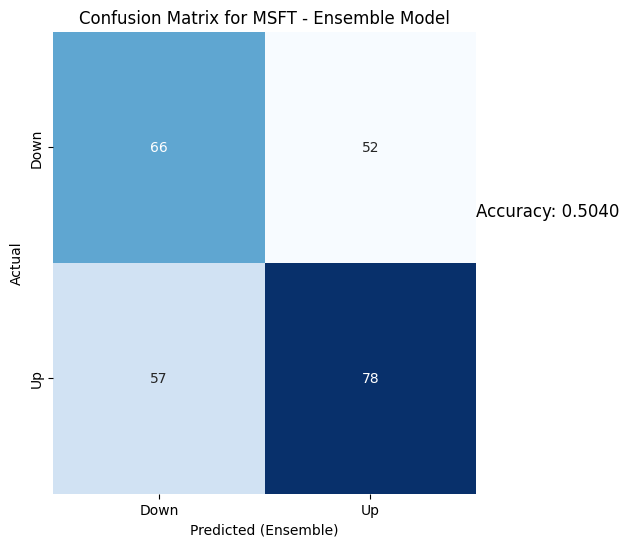

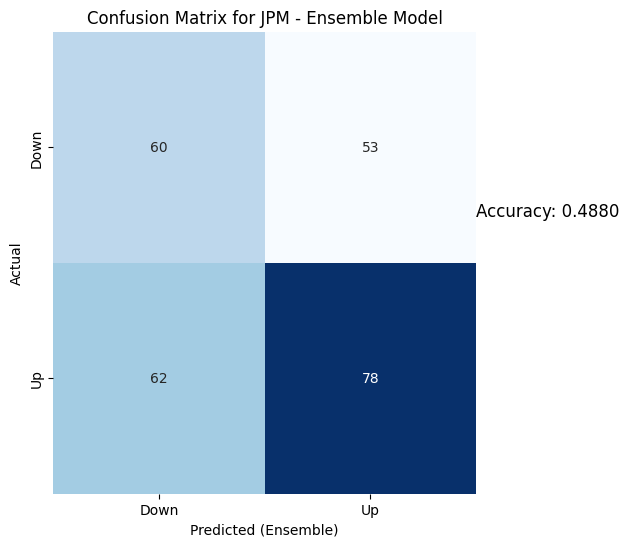

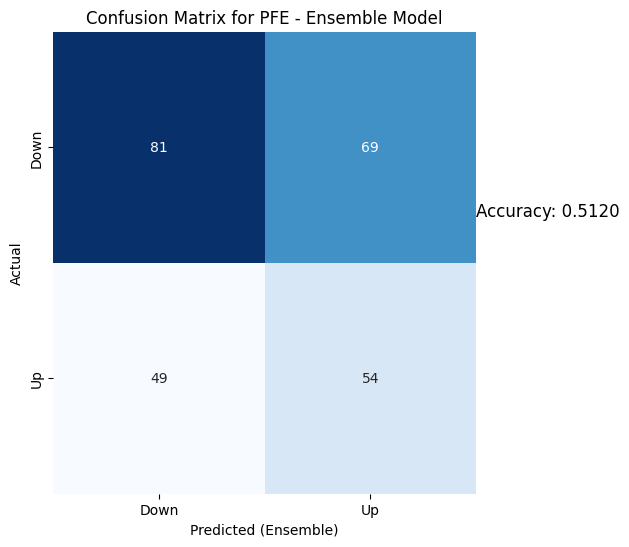

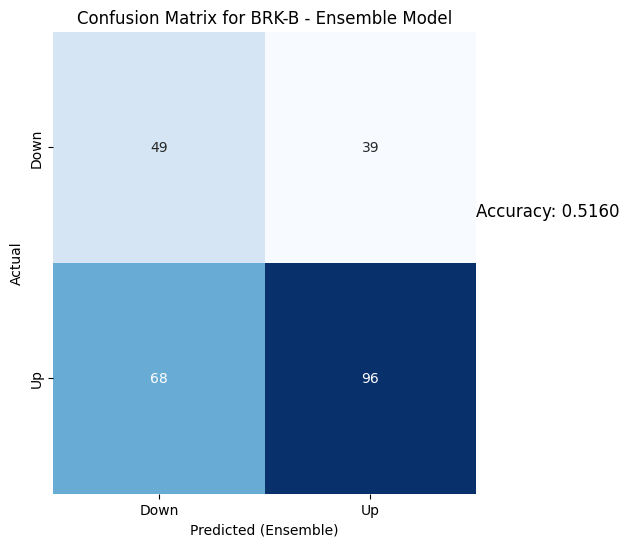

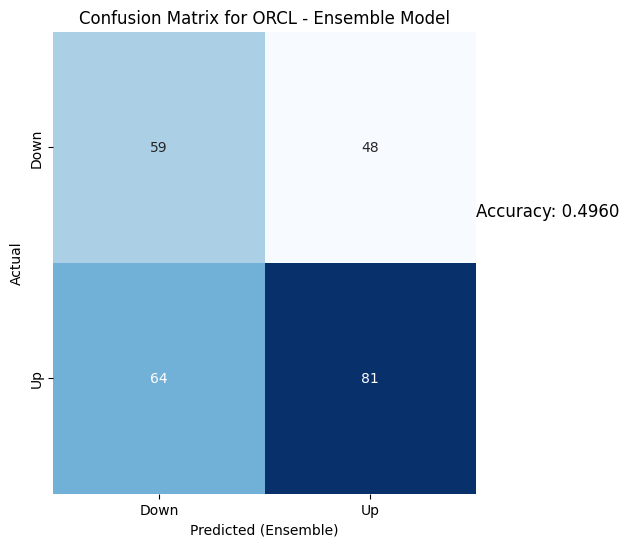

...

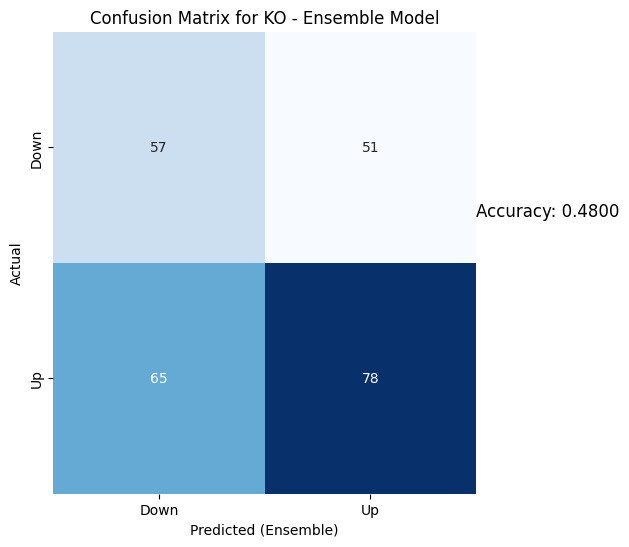

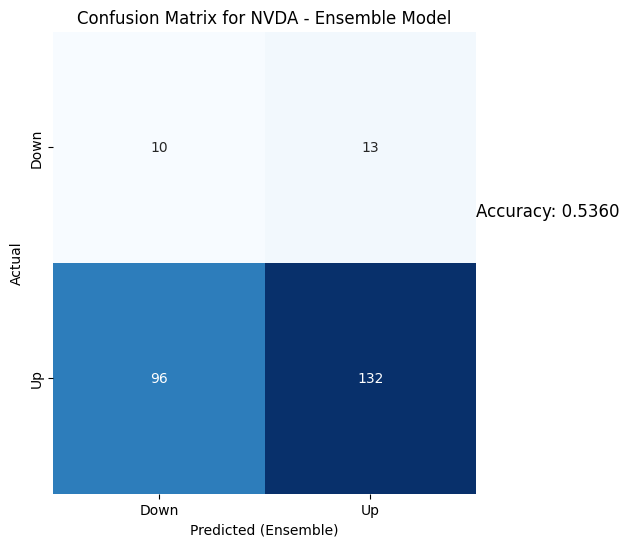

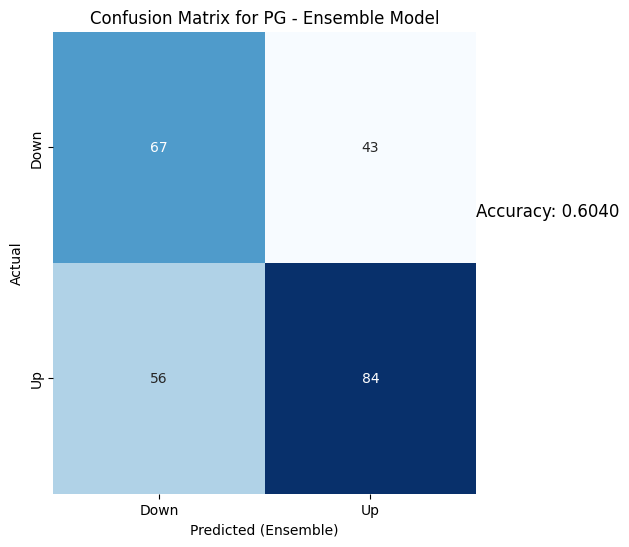

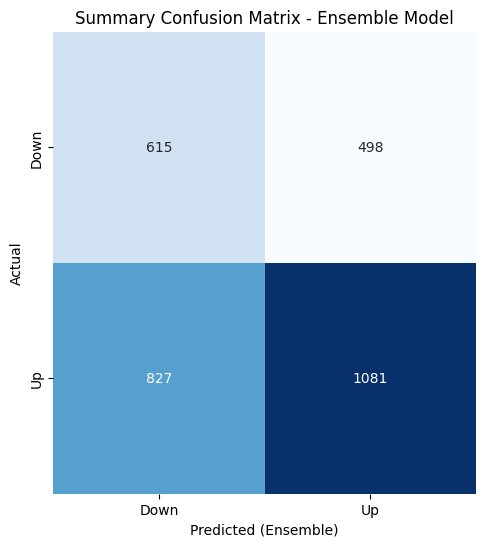

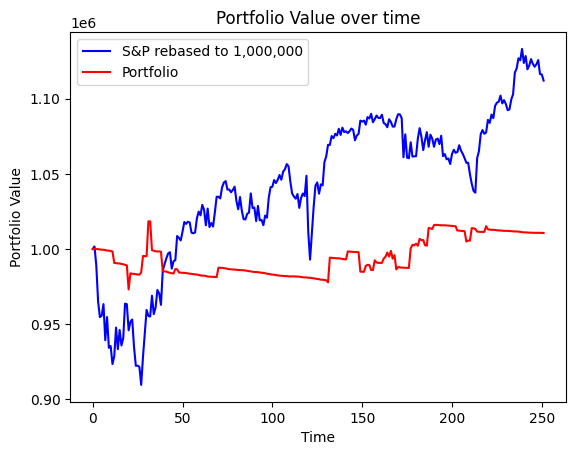

Portfolio return for our period =  101.0675107804441
S&P500 return during the period =  111.19788778649415


In [20]:
Portfolio_construct("2013-01-01")
#Testing for year 2016

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000464 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2262
[LightGBM] [Info] Number of data points in the train set: 754, number of used features: 9
[LightGBM] [Info] Start training from score 0.505305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5375
LightGBM: 0.5613
GBR: 0.5494
RandomForest: 0.5494
XGBoost: 0.5257
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6950 - accuracy: 0.4804 - val_loss: 0.6941 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6933 - accuracy: 0.4956 - val_loss: 0.7007 - val_accuracy: 0.4343
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6935 - accuracy: 0.5196 - val_loss: 0.7185 - val_accuracy: 0.4343
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6931 - accuracy: 0.5196 - val_loss: 0.7181 - val_accuracy: 0.4343
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6919 - accuracy: 0.5285 - val_loss: 0.7087 - val_accuracy: 0.4343
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6912 - accuracy: 0.4981 - val_loss: 0.7252 - val_accuracy: 0.4343
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4980
LightGBM: 0.5178
GBR: 0.4664
RandomForest: 0.4704
XGBoost: 0.4941
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6930 - accuracy: 0.5025 - val_loss: 0.7060 - val_accuracy: 0.4798
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.5292 - val_loss: 0.7051 - val_accuracy: 0.4798
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6922 - accuracy: 0.5292 - val_loss: 0.6983 - val_accuracy: 0.4798
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6924 - accuracy: 0.5292 - val_loss: 0.7047 - val_accuracy: 0.4798
Epoch 5/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6931 - accuracy: 0.5266 - val_loss: 0.7009 - val_accuracy: 0.4798
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.5292 - val_loss: 0.7013 - val_accuracy: 0.4798
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5159
LightGBM: 0.5198
GBR: 0.4960
RandomForest: 0.5000
XGBoost: 0.5079
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6959 - accuracy: 0.5165 - val_loss: 0.6940 - val_accuracy: 0.4772
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6940 - accuracy: 0.5051 - val_loss: 0.6927 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6934 - accuracy: 0.5038 - val_loss: 0.6912 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6925 - accuracy: 0.5152 - val_loss: 0.6907 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6928 - accuracy: 0.5000 - val_loss: 0.6911 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5355 - val_loss: 0.6904 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5397
LightGBM: 0.4722
GBR: 0.4921
RandomForest: 0.4643
XGBoost: 0.4365
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6964 - accuracy: 0.4778 - val_loss: 0.6918 - val_accuracy: 0.5431
Epoch 2/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6930 - accuracy: 0.5070 - val_loss: 0.7155 - val_accuracy: 0.4518
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6918 - accuracy: 0.5260 - val_loss: 0.7101 - val_accuracy: 0.4518
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6917 - accuracy: 0.5121 - val_loss: 0.7289 - val_accuracy: 0.4518
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6916 - accuracy: 0.5172 - val_loss: 0.7212 - val_accuracy: 0.4518
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6907 - accuracy: 0.5172 - val_loss: 0.7185 - val_accuracy: 0.4518
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.4802
LightGBM: 0.4762
GBR: 0.4841
RandomForest: 0.4960
XGBoost: 0.5040
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6951 - accuracy: 0.5178 - val_loss: 0.6985 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6959 - accuracy: 0.4809 - val_loss: 0.6936 - val_accuracy: 0.4721
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6931 - accuracy: 0.5038 - val_loss: 0.6972 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6921 - accuracy: 0.5025 - val_loss: 0.7000 - val_accuracy: 0.4924
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6914 - accuracy: 0.5267 - val_loss: 0.6983 - val_accuracy: 0.4721
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6913 - accuracy: 0.5191 - val_loss: 0.7000 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5238
LightGBM: 0.4524
GBR: 0.5119
RandomForest: 0.4762
XGBoost: 0.4762
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6941 - accuracy: 0.4930 - val_loss: 0.6916 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6934 - accuracy: 0.5223 - val_loss: 0.6926 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6940 - accuracy: 0.4904 - val_loss: 0.6916 - val_accuracy: 0.5381
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.5134 - val_loss: 0.6940 - val_accuracy: 0.4772
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6910 - accuracy: 0.5223 - val_loss: 0.6948 - val_accuracy: 0.4772
Epoch 6/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.5274 - val_loss: 0.7077 - val_accuracy: 0.4772
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5378
LightGBM: 0.5339
GBR: 0.4542
RandomForest: 0.5060
XGBoost: 0.5100
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6980 - accuracy: 0.5000 - val_loss: 0.6928 - val_accuracy: 0.5025
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6949 - accuracy: 0.4911 - val_loss: 0.6942 - val_accuracy: 0.4822
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6916 - accuracy: 0.5191 - val_loss: 0.6941 - val_accuracy: 0.4924
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5293 - val_loss: 0.6960 - val_accuracy: 0.4619
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6913 - accuracy: 0.5395 - val_loss: 0.6920 - val_accuracy: 0.5076
Epoch 6/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6922 - accuracy: 0.5077 - val_loss: 0.6953 - val_accuracy: 0.4772
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4582
LightGBM: 0.4900
GBR: 0.4622
RandomForest: 0.4701
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 49ms/step - loss: 0.6957 - accuracy: 0.4821 - val_loss: 0.6907 - val_accuracy: 0.5510
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.4821 - val_loss: 0.6902 - val_accuracy: 0.5510
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6931 - accuracy: 0.5153 - val_loss: 0.6898 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.5064 - val_loss: 0.6909 - val_accuracy: 0.5459
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6936 - accuracy: 0.4962 - val_loss: 0.6877 - val_accuracy: 0.5510
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6924 - accuracy: 0.5026 - val_loss: 0.6901 - val_accuracy: 0.5510
Epoch 7/10
25/25 [==============================] - 0s 18

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5139
LightGBM: 0.5139
GBR: 0.5697
RandomForest: 0.5657
XGBoost: 0.5219
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6940 - accuracy: 0.5236 - val_loss: 0.6938 - val_accuracy: 0.4490
Epoch 2/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6924 - accuracy: 0.5223 - val_loss: 0.6878 - val_accuracy: 0.5459
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6942 - accuracy: 0.5057 - val_loss: 0.6873 - val_accuracy: 0.5459
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6939 - accuracy: 0.4904 - val_loss: 0.6889 - val_accuracy: 0.5459
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6928 - accuracy: 0.5211 - val_loss: 0.6909 - val_accuracy: 0.5714
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6929 - accuracy: 0.5121 - val_loss: 0.6892 - val_accuracy: 0.5459
Epoch 7/10
25/25 [==============================] - 0s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.4542
LightGBM: 0.4542
GBR: 0.4661
RandomForest: 0.4382
XGBoost: 0.4462
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6980 - accuracy: 0.4629 - val_loss: 0.6962 - val_accuracy: 0.4337
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6930 - accuracy: 0.4974 - val_loss: 0.7119 - val_accuracy: 0.4388
Epoch 3/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 0.5205 - val_loss: 0.6918 - val_accuracy: 0.5612
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6911 - accuracy: 0.5038 - val_loss: 0.6994 - val_accuracy: 0.4388
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6887 - accuracy: 0.5396 - val_loss: 0.7150 - val_accuracy: 0.4388
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6879 - accuracy: 0.5358 - val_loss: 0.7020 - val_accuracy: 0.4439
Epoch 7/10
25/25 [==============================] - 0s 18

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5560
LightGBM: 0.5200
GBR: 0.4760
RandomForest: 0.5280
XGBoost: 0.4480
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6900 - accuracy: 0.5429 - val_loss: 0.6892 - val_accuracy: 0.5714
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6870 - accuracy: 0.5275 - val_loss: 0.6902 - val_accuracy: 0.5714
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6865 - accuracy: 0.5365 - val_loss: 0.6863 - val_accuracy: 0.5714
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6860 - accuracy: 0.5314 - val_loss: 0.6869 - val_accuracy: 0.5714
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6844 - accuracy: 0.5365 - val_loss: 0.6890 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6852 - accuracy: 0.5262 - val_loss: 0.6963 - val_accuracy: 0.4745
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4920
LightGBM: 0.5160
GBR: 0.4920
RandomForest: 0.4680
XGBoost: 0.4640
Epoch 1/10
25/25 [==============================] - 11s 54ms/step - loss: 0.6985 - accuracy: 0.4821 - val_loss: 0.6935 - val_accuracy: 0.4949
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6926 - accuracy: 0.5154 - val_loss: 0.6981 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6922 - accuracy: 0.5218 - val_loss: 0.7040 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5218 - val_loss: 0.7045 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6932 - accuracy: 0.5128 - val_loss: 0.7126 - val_accuracy: 0.4847
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6918 - accuracy: 0.5359 - val_loss: 0.7054 - val_accuracy: 0.4847
Epoch 7/10
25/25 [==============================] - 1s 2

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2126 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  None  and sold at  40.86000061035156
62.58000183105469
86.0
40.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2127 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'ORCL']
MSFT bought at  62.58000183105469  and sold at  62.29999923706055
JPM bought at  86.0  and sold at  84.94000244140625
ORCL bought at  40.86000061035156  and sold at  39.099998474121094
62.29999923706055
164.75999450683594
39.099998474121094
159.397705078125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2128 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'IBM']
MSFT bought at  62.29999923706055  and sold at  63.619998931884766
BRK-B bought at  164.75999450683594  and sold at  165.35000610351562
ORCL bought at  39.099998474121094  and sold at  38.900001525878906
IBM bought at  159.397705078125  and sold at  159.3498992919922
165.35000610351562
38.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2129 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  165.35000610351562  and sold at  166.36000061035156
ORCL bought at  38.900001525878906  and sold at  39.0
166.36000061035156
39.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2130 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  166.36000061035156  and sold at  165.9499969482422
ORCL bought at  39.0  and sold at  38.83000183105469
38.83000183105469
29.264999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2131 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  38.83000183105469  and sold at  38.959999084472656
AAPL bought at  29.264999389648438  and sold at  29.072500228881836
38.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2132 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.959999084472656  and sold at  38.779998779296875
165.32000732421875
38.779998779296875
29.1299991607666
27.44499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2133 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'AAPL', 'NVDA']
BRK-B bought at  165.32000732421875  and sold at  164.9499969482422
ORCL bought at  38.779998779296875  and sold at  38.81999969482422
AAPL bought at  29.1299991607666  and sold at  29.315000534057617
NVDA bought at  27.44499969482422  and sold at  29.329999923706055
38.81999969482422
29.315000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2134 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  38.81999969482422  and sold at  38.68000030517578
AAPL bought at  29.315000534057617  and sold at  29.190000534057617
38.68000030517578
41.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2135 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  38.68000030517578  and sold at  38.689998626708984
KO bought at  41.38999938964844  and sold at  41.599998474121094
41.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2136 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.599998474121094  and sold at  41.459999084472656
62.13999938964844
162.97999572753906
38.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2137 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  62.13999938964844  and sold at  62.58000183105469
BRK-B bought at  162.97999572753906  and sold at  163.8300018310547
ORCL bought at  38.45000076293945  and sold at  38.54999923706055
87.2300033569336
38.54999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2138 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  87.2300033569336  and sold at  86.91000366210938
ORCL bought at  38.54999923706055  and sold at  38.7400016784668
38.7400016784668
29.0049991607666
22.950000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2139 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'BAC']
ORCL bought at  38.7400016784668  and sold at  38.63999938964844
AAPL bought at  29.0049991607666  and sold at  29.15250015258789
BAC bought at  22.950000762939453  and sold at  22.68000030517578
38.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2140 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  38.63999938964844  and sold at  38.45000076293945
163.41000366210938
38.45000076293945
22.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2141 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'BAC']
BRK-B bought at  163.41000366210938  and sold at  162.02000427246094
ORCL bought at  38.45000076293945  and sold at  39.029998779296875
BAC bought at  22.68000030517578  and sold at  22.549999237060547
161.47000122070312
38.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2142 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  161.47000122070312  and sold at  162.22999572753906
ORCL bought at  38.65999984741211  and sold at  39.11000061035156
162.22999572753906
41.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2143 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  162.22999572753906  and sold at  161.41000366210938
KO bought at  41.04999923706055  and sold at  40.95000076293945
39.20000076293945
22.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2144 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  39.20000076293945  and sold at  39.2599983215332
BAC bought at  22.920000076293945  and sold at  23.010000228881836
29.760000228881836
23.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2145 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  29.760000228881836  and sold at  30.0
BAC bought at  23.010000228881836  and sold at  22.049999237060547
30.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2146 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  30.0  and sold at  29.997499465942383
22.6299991607666
41.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2147 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  22.6299991607666  and sold at  22.530000686645508
KO bought at  41.290000915527344  and sold at  41.13999938964844
40.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2148 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  40.099998474121094  and sold at  40.150001525878906
63.68000030517578
40.150001525878906
30.469999313354492
42.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2149 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL', 'KO']
MSFT bought at  63.68000030517578  and sold at  64.2699966430664
ORCL bought at  40.150001525878906  and sold at  40.130001068115234
AAPL bought at  30.469999313354492  and sold at  30.485000610351562
KO bought at  42.119998931884766  and sold at  41.810001373291016
41.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2150 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.810001373291016  and sold at  41.45000076293945
23.360000610351562
41.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2151 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  23.360000610351562  and sold at  22.950000762939453
KO bought at  41.45000076293945  and sold at  41.380001068115234
86.02999877929688
164.8000030517578
40.22999954223633
41.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2152 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'ORCL', 'KO']
JPM bought at  86.02999877929688  and sold at  84.62999725341797
BRK-B bought at  164.8000030517578  and sold at  164.13999938964844
ORCL bought at  40.22999954223633  and sold at  40.11000061035156
KO bought at  41.380001068115234  and sold at  41.56999969482422
40.11000061035156
22.639999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2153 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  40.11000061035156  and sold at  39.84000015258789
BAC bought at  22.639999389648438  and sold at  22.889999389648438
22.889999389648438
41.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2154 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  22.889999389648438  and sold at  22.719999313354492
KO bought at  41.2599983215332  and sold at  41.400001525878906
163.0
22.719999313354492
41.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2155 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC', 'KO']
BRK-B bought at  163.0  and sold at  163.94000244140625
BAC bought at  22.719999313354492  and sold at  23.290000915527344
KO bought at  41.400001525878906  and sold at  41.540000915527344
163.4199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2156 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  163.4199981689453  and sold at  162.92999267578125
162.92999267578125
41.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2157 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  162.92999267578125  and sold at  162.8699951171875
KO bought at  41.900001525878906  and sold at  42.02000045776367
41.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2158 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.25  and sold at  40.58000183105469
164.00999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2159 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  164.00999450683594  and sold at  165.85000610351562
40.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2160 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  40.619998931884766  and sold at  40.529998779296875
41.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2161 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  41.40999984741211  and sold at  41.59000015258789
33.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2162 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  33.93000030517578  and sold at  34.17499923706055
41.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2163 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.459999084472656  and sold at  41.599998474121094
41.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2164 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.599998474121094  and sold at  41.65999984741211
41.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2165 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  41.65999984741211  and sold at  41.779998779296875
42.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2166 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  42.70000076293945  and sold at  42.59000015258789
171.4199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2167 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  171.4199981689453  and sold at  177.27999877929688
64.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2168 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  64.94000244140625  and sold at  64.01000213623047
42.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2169 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  42.689998626708984  and sold at  42.56999969482422
42.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2170 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.029998779296875  and sold at  42.290000915527344
91.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2171 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  91.06999969482422  and sold at  91.30999755859375
42.790000915527344
41.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2172 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  42.790000915527344  and sold at  43.04999923706055
KO bought at  41.970001220703125  and sold at  42.119998931884766
25.219999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2173 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  25.219999313354492  and sold at  24.860000610351562
42.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2174 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.029998779296875  and sold at  42.18000030517578
45.22999954223633
42.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2175 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  45.22999954223633  and sold at  44.84000015258789
KO bought at  42.18000030517578  and sold at  42.5
169.47000122070312
42.5
26.477500915527344
91.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2176 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA', 'PG']
BRK-B bought at  169.47000122070312  and sold at  169.3000030517578
KO bought at  42.5  and sold at  42.380001068115234
NVDA bought at  26.477500915527344  and sold at  27.017499923706055
PG bought at  91.19000244140625  and sold at  90.98999786376953
44.790000915527344
42.380001068115234
27.017499923706055
90.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2177 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'NVDA', 'PG']
ORCL bought at  44.790000915527344  and sold at  44.95000076293945
KO bought at  42.380001068115234  and sold at  42.16999816894531
NVDA bought at  27.017499923706055  and sold at  26.772499084472656
PG bought at  90.98999786376953  and sold at  90.7699966430664
90.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2178 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  90.7699966430664  and sold at  90.56999969482422
44.650001525878906
26.86750030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2179 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  44.650001525878906  and sold at  44.84000015258789
NVDA bought at  26.86750030517578  and sold at  27.0625
27.0625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2180 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  27.0625  and sold at  26.922500610351562
168.30999755859375
42.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2181 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  168.30999755859375  and sold at  166.58999633789062
KO bought at  42.43000030517578  and sold at  42.41999816894531
44.52000045776367
42.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2182 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  44.52000045776367  and sold at  44.68000030517578
KO bought at  42.41999816894531  and sold at  42.599998474121094
23.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2183 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  23.8700008392334  and sold at  23.59000015258789
42.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2184 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.439998626708984  and sold at  42.40999984741211
166.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2185 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  166.8699951171875  and sold at  166.86000061035156
65.7300033569336
36.192501068115234
42.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2186 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO']
MSFT bought at  65.7300033569336  and sold at  65.55999755859375
AAPL bought at  36.192501068115234  and sold at  36.005001068115234
KO bought at  42.68000030517578  and sold at  42.56999969482422
23.170000076293945
25.00749969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2187 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  23.170000076293945  and sold at  23.260000228881836
NVDA bought at  25.00749969482422  and sold at  25.190000534057617
166.47000122070312
42.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2188 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  166.47000122070312  and sold at  166.1699981689453
KO bought at  42.66999816894531  and sold at  42.61000061035156
42.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2189 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  42.61000061035156  and sold at  42.689998626708984
65.52999877929688
166.35000610351562
42.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2190 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'KO']
MSFT bought at  65.52999877929688  and sold at  65.4800033569336
BRK-B bought at  166.35000610351562  and sold at  165.6999969482422
KO bought at  42.689998626708984  and sold at  42.65999984741211
165.6999969482422
22.920000076293945
42.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2191 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC', 'KO']
BRK-B bought at  165.6999969482422  and sold at  165.11000061035156
BAC bought at  22.920000076293945  and sold at  22.649999618530273
KO bought at  42.65999984741211  and sold at  42.939998626708984
165.11000061035156
163.15487670898438
22.649999618530273
42.939998626708984
90.30999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2192 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM', 'BAC', 'KO', 'PG']
BRK-B bought at  165.11000061035156  and sold at  162.89999389648438
IBM bought at  163.15487670898438  and sold at  162.07456970214844
BAC bought at  22.649999618530273  and sold at  22.34000015258789
KO bought at  42.939998626708984  and sold at  42.790000915527344
PG bought at  90.30999755859375  and sold at  90.02999877929688
44.0
42.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2193 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  44.0  and sold at  44.290000915527344
KO bought at  42.790000915527344  and sold at  43.06999969482422
43.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2194 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  43.06999969482422  and sold at  43.47999954223633
163.69000244140625
43.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2195 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  163.69000244140625  and sold at  162.75999450683594
KO bought at  43.47999954223633  and sold at  43.22999954223633
24.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2196 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  24.920000076293945  and sold at  25.315000534057617
35.61000061035156
43.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2197 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  35.61000061035156  and sold at  35.567501068115234
KO bought at  43.09000015258789  and sold at  43.06999969482422
67.52999877929688
165.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2198 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  67.52999877929688  and sold at  67.91999816894531
BRK-B bought at  165.77999877929688  and sold at  167.52999877929688
67.83000183105469
26.0049991607666


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2199 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  67.83000183105469  and sold at  68.2699966430664
NVDA bought at  26.0049991607666  and sold at  26.40999984741211
35.9474983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2200 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  35.9474983215332  and sold at  35.912498474121094
165.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2201 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  165.44000244140625  and sold at  166.0500030517578
166.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2202 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  166.0500030517578  and sold at  166.72999572753906
68.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2203 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  68.80999755859375  and sold at  69.0
69.0
166.5500030517578
45.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2204 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  69.0  and sold at  68.94000244140625
BRK-B bought at  166.5500030517578  and sold at  165.02000427246094
ORCL bought at  45.58000183105469  and sold at  45.560001373291016
68.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2205 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  68.94000244140625  and sold at  69.04000091552734
163.4600067138672
45.47999954223633
38.497501373291016
145.420654296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2206 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'AAPL', 'IBM']
BRK-B bought at  163.4600067138672  and sold at  163.72000122070312
ORCL bought at  45.47999954223633  and sold at  45.529998779296875
AAPL bought at  38.497501373291016  and sold at  38.314998626708984
IBM bought at  145.420654296875  and sold at  144.5984649658203
163.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2207 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  163.72000122070312  and sold at  163.27000427246094
45.15999984741211
43.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2208 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  45.15999984741211  and sold at  45.08000183105469
KO bought at  43.66999816894531  and sold at  43.59000015258789
24.0
43.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2209 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO']
BAC bought at  24.0  and sold at  24.059999465942383
KO bought at  43.59000015258789  and sold at  43.72999954223633
43.72999954223633
86.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2210 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  43.72999954223633  and sold at  43.849998474121094
PG bought at  86.33000183105469  and sold at  86.23999786376953
43.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2211 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  43.849998474121094  and sold at  43.93000030517578
161.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2212 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  161.25999450683594  and sold at  161.6199951171875
161.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2213 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  161.6199951171875  and sold at  163.24000549316406
165.1300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2214 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  165.1300048828125  and sold at  165.47999572753906
86.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2215 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  86.08000183105469  and sold at  86.5
164.92999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2216 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  164.92999267578125  and sold at  165.3000030517578
165.3000030517578
45.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2217 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  165.3000030517578  and sold at  165.69000244140625
KO bought at  45.40999984741211  and sold at  45.38999938964844
165.69000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2218 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  165.69000244140625  and sold at  165.11000061035156
83.9000015258789
165.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2219 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  83.9000015258789  and sold at  82.1500015258789
BRK-B bought at  165.11000061035156  and sold at  165.27999877929688
69.83999633789062
165.27999877929688
45.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2220 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  69.83999633789062  and sold at  70.0999984741211
BRK-B bought at  165.27999877929688  and sold at  166.66000366210938
ORCL bought at  45.38999938964844  and sold at  45.790000915527344
166.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2221 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  166.66000366210938  and sold at  166.2899932861328
71.76000213623047
38.86249923706055
22.450000762939453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2222 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'BAC']
MSFT bought at  71.76000213623047  and sold at  72.27999877929688
AAPL bought at  38.86249923706055  and sold at  38.48249816894531
BAC bought at  22.450000762939453  and sold at  22.40999984741211
166.52000427246094
45.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2223 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  166.52000427246094  and sold at  166.1300048828125
ORCL bought at  45.91999816894531  and sold at  45.61000061035156
71.94999694824219
45.41999816894531
38.747501373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2224 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  71.94999694824219  and sold at  70.31999969482422
ORCL bought at  45.41999816894531  and sold at  45.029998779296875
AAPL bought at  38.747501373291016  and sold at  37.244998931884766
70.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2225 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  70.31999969482422  and sold at  69.77999877929688
170.5
45.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2226 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  170.5  and sold at  171.47000122070312
KO bought at  45.33000183105469  and sold at  45.029998779296875
70.6500015258789
171.47000122070312
45.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2227 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'KO']
MSFT bought at  70.6500015258789  and sold at  70.2699966430664
BRK-B bought at  171.47000122070312  and sold at  171.4499969482422
KO bought at  45.029998779296875  and sold at  45.29999923706055
45.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2228 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.29999923706055  and sold at  45.25
69.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2229 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  69.9000015258789  and sold at  70.0
89.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2230 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  89.66000366210938  and sold at  89.86000061035156
171.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2231 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  171.5500030517578  and sold at  170.5500030517578
69.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2232 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  69.91000366210938  and sold at  70.2699966430664
70.2699966430664
23.1299991607666
45.220001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2233 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'KO']
MSFT bought at  70.2699966430664  and sold at  70.26000213623047
BAC bought at  23.1299991607666  and sold at  22.93000030517578
KO bought at  45.220001220703125  and sold at  45.06999969482422
50.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2234 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  50.95000076293945  and sold at  50.86000061035156
50.75
23.270000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2235 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  50.75  and sold at  50.869998931884766
BAC bought at  23.270000457763672  and sold at  23.8799991607666
50.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2236 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  50.869998931884766  and sold at  50.20000076293945
44.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2237 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.849998474121094  and sold at  44.7599983215332
69.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2238 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  69.08000183105469  and sold at  68.56999969482422
44.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2239 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.400001525878906  and sold at  44.38999938964844
44.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2240 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.38999938964844  and sold at  44.380001068115234
69.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2241 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  69.9800033569336  and sold at  69.98999786376953
146.45315551757812


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2242 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  146.45315551757812  and sold at  146.9407196044922
71.1500015258789
169.9199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2243 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  71.1500015258789  and sold at  71.7699966430664
BRK-B bought at  169.9199981689453  and sold at  169.69000244140625
169.69000244140625
44.43000030517578
86.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2244 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  169.69000244140625  and sold at  169.47000122070312
KO bought at  44.43000030517578  and sold at  44.68000030517578
PG bought at  86.69999694824219  and sold at  87.0999984741211
169.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2245 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  169.47000122070312  and sold at  170.16000366210938
73.3499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2246 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  73.3499984741211  and sold at  73.30000305175781
73.30000305175781
44.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2247 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  73.30000305175781  and sold at  73.86000061035156
KO bought at  44.66999816894531  and sold at  44.83000183105469
74.22000122070312
44.220001220703125
88.5999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2248 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'PG']
MSFT bought at  74.22000122070312  and sold at  73.79000091552734
VZ bought at  44.220001220703125  and sold at  44.22999954223633
PG bought at  88.5999984741211  and sold at  88.61000061035156
88.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2249 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  88.61000061035156  and sold at  88.18000030517578
73.5999984741211
38.022499084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2250 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  73.5999984741211  and sold at  74.19000244140625
AAPL bought at  38.022499084472656  and sold at  38.185001373291016
45.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2251 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.7400016784668  and sold at  46.119998931884766
50.45000076293945
46.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2252 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  50.45000076293945  and sold at  50.29999923706055
KO bought at  46.119998931884766  and sold at  46.0099983215332
50.29999923706055
46.0099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2253 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  50.29999923706055  and sold at  49.93000030517578
KO bought at  46.0099983215332  and sold at  45.84000015258789
49.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2254 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  49.93000030517578  and sold at  50.15999984741211
50.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2255 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  50.15999984741211  and sold at  49.77000045776367
39.28499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2256 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  39.28499984741211  and sold at  38.89250183105469
178.0399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2257 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  178.0399932861328  and sold at  176.42999267578125
49.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2258 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  49.099998474121094  and sold at  49.060001373291016
72.47000122070312
135.53536987304688
45.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2259 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'KO']
MSFT bought at  72.47000122070312  and sold at  71.41000366210938
IBM bought at  135.53536987304688  and sold at  135.602294921875
KO bought at  45.59000015258789  and sold at  45.7400016784668
71.41000366210938
91.73999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2260 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  71.41000366210938  and sold at  72.5
PG bought at  91.73999786376953  and sold at  91.33999633789062
72.5
135.602294921875
91.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2261 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'PG']
MSFT bought at  72.5  and sold at  73.58999633789062
IBM bought at  135.602294921875  and sold at  136.06118774414062
PG bought at  91.33999633789062  and sold at  91.6500015258789
45.79999923706055
91.6500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2262 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  45.79999923706055  and sold at  46.189998626708984
PG bought at  91.6500015258789  and sold at  92.19999694824219
46.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2263 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  46.189998626708984  and sold at  46.20000076293945
49.25
46.20000076293945
92.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2264 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'PG']
ORCL bought at  49.25  and sold at  48.54999923706055
KO bought at  46.20000076293945  and sold at  45.86000061035156
PG bought at  92.44000244140625  and sold at  92.06999969482422
177.55999755859375
45.66999816894531
92.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2265 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  177.55999755859375  and sold at  178.33999633789062
KO bought at  45.66999816894531  and sold at  45.68000030517578
PG bought at  92.47000122070312  and sold at  92.86000061035156
39.787498474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2266 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  39.787498474121094  and sold at  40.63750076293945
49.06999969482422
45.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2267 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  49.06999969482422  and sold at  49.189998626708984
KO bought at  45.540000915527344  and sold at  45.40999984741211
178.42999267578125
49.189998626708984
23.84000015258789
41.29750061035156
92.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2268 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'BAC', 'NVDA', 'PG']
BRK-B bought at  178.42999267578125  and sold at  179.60000610351562
ORCL bought at  49.189998626708984  and sold at  49.2400016784668
BAC bought at  23.84000015258789  and sold at  23.770000457763672
NVDA bought at  41.29750061035156  and sold at  40.95249938964844
PG bought at  92.2699966430664  and sold at  92.51000213623047
72.83000183105469
178.6999969482422
41.24250030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2269 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'NVDA']
MSFT bought at  72.83000183105469  and sold at  73.05000305175781
BRK-B bought at  178.6999969482422  and sold at  178.6199951171875
NVDA bought at  41.24250030517578  and sold at  41.17499923706055
73.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2270 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  73.05000305175781  and sold at  74.01000213623047
180.35000610351562
45.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2271 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  180.35000610351562  and sold at  181.16000366210938
KO bought at  45.38999938964844  and sold at  45.54999923706055
42.6150016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2272 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  42.6150016784668  and sold at  41.477500915527344
73.61000061035156
41.477500915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2273 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  73.61000061035156  and sold at  73.4000015258789
NVDA bought at  41.477500915527344  and sold at  41.45249938964844
176.7899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2274 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  176.7899932861328  and sold at  173.99000549316406
74.33999633789062
92.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2275 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  74.33999633789062  and sold at  73.9800033569336
PG bought at  92.97000122070312  and sold at  92.83999633789062
73.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2276 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  73.9800033569336  and sold at  74.76000213623047
74.76000213623047
52.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2277 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  74.76000213623047  and sold at  74.68000030517578
ORCL bought at  52.4900016784668  and sold at  52.77000045776367
74.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2278 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  74.68000030517578  and sold at  75.20999908447266
75.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2279 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  75.20999908447266  and sold at  74.7699966430664
74.7699966430664
52.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2280 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  74.7699966430664  and sold at  75.30999755859375
ORCL bought at  52.790000915527344  and sold at  48.7400016784668
75.30999755859375
39.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2281 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  75.30999755859375  and sold at  75.16000366210938
AAPL bought at  39.970001220703125  and sold at  39.66749954223633
75.16000366210938
39.66749954223633
46.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2282 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO']
MSFT bought at  75.16000366210938  and sold at  75.44000244140625
AAPL bought at  39.66749954223633  and sold at  39.682498931884766
KO bought at  46.11000061035156  and sold at  45.97999954223633
39.682498931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2283 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  39.682498931884766  and sold at  39.01750183105469
183.82000732421875
39.01750183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2284 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  183.82000732421875  and sold at  183.16000366210938
AAPL bought at  39.01750183105469  and sold at  38.34749984741211
74.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2285 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  74.20999908447266  and sold at  74.41000366210938
45.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2286 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.56999969482422  and sold at  44.63999938964844
44.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2287 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.63999938964844  and sold at  44.90999984741211
44.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2288 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.90999984741211  and sold at  45.0099983215332
74.48999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2289 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  74.48999786376953  and sold at  74.61000061035156
44.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2290 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.79999923706055  and sold at  45.189998626708984
38.84749984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2291 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  38.84749984741211  and sold at  38.82500076293945
45.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2292 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.40999984741211  and sold at  45.869998931884766
141.9694061279297


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2293 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  141.9694061279297  and sold at  141.12811279296875
39.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2294 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  39.939998626708984  and sold at  38.994998931884766
40.76250076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2295 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  40.76250076293945  and sold at  41.68000030517578
41.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2296 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  41.68000030517578  and sold at  42.2599983215332
50.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2297 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  50.900001525878906  and sold at  50.63999938964844
50.63999938964844
45.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2298 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  50.63999938964844  and sold at  50.279998779296875
KO bought at  45.79999923706055  and sold at  45.880001068115234
84.05000305175781
50.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2299 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  84.05000305175781  and sold at  84.13999938964844
ORCL bought at  50.279998779296875  and sold at  50.18000030517578
50.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2300 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  50.18000030517578  and sold at  50.400001525878906
84.2699966430664
45.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2301 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  84.2699966430664  and sold at  84.55999755859375
KO bought at  45.939998626708984  and sold at  46.18000030517578
87.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2302 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  87.77999877929688  and sold at  88.16000366210938
83.87000274658203
43.66749954223633
54.03499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2303 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  83.87000274658203  and sold at  83.93000030517578
AAPL bought at  43.66749954223633  and sold at  43.49250030517578
NVDA bought at  54.03499984741211  and sold at  53.157501220703125
43.49250030517578
53.157501220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2304 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  43.49250030517578  and sold at  42.834999084472656
NVDA bought at  53.157501220703125  and sold at  53.54499816894531
183.33999633789062
53.54499816894531
88.87000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2305 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA', 'PG']
BRK-B bought at  183.33999633789062  and sold at  181.80999755859375
NVDA bought at  53.54499816894531  and sold at  52.494998931884766
PG bought at  88.87000274658203  and sold at  88.2300033569336
82.9800033569336
181.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2306 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  82.9800033569336  and sold at  83.19999694824219
BRK-B bought at  181.80999755859375  and sold at  182.0500030517578
182.0500030517578
49.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2307 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  182.0500030517578  and sold at  181.05999755859375
ORCL bought at  49.20000076293945  and sold at  48.939998626708984
181.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2308 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  181.05999755859375  and sold at  181.6300048828125
181.6300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2309 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  181.6300048828125  and sold at  183.17999267578125
54.01250076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2310 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  54.01250076293945  and sold at  53.73249816894531
182.55999755859375
45.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2311 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  182.55999755859375  and sold at  182.36000061035156
KO bought at  45.84000015258789  and sold at  45.880001068115234
182.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2312 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  182.36000061035156  and sold at  183.49000549316406
183.49000549316406
88.95999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2313 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  183.49000549316406  and sold at  187.5399932861328
PG bought at  88.95999908447266  and sold at  89.4000015258789
187.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2314 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  187.5399932861328  and sold at  189.85000610351562
189.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2315 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  189.85000610351562  and sold at  193.00999450683594
42.962501525878906
89.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2316 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  42.962501525878906  and sold at  42.76250076293945
PG bought at  89.98999786376953  and sold at  90.36000061035156
45.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2317 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.970001220703125  and sold at  46.22999954223633
46.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2318 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  46.22999954223633  and sold at  46.2599983215332
46.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2319 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  46.2599983215332  and sold at  46.45000076293945
82.48999786376953
45.779998779296875
90.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2320 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'PG']
MSFT bought at  82.48999786376953  and sold at  84.16000366210938
KO bought at  45.779998779296875  and sold at  45.310001373291016
PG bought at  90.0999984741211  and sold at  90.37000274658203
84.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2321 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  84.16000366210938  and sold at  85.2300033569336
[1000000.0, 1007650.0099458935, 1013644.7146620764, 1012839.4181222236, 1016463.1501573253, 1013107.895810724, 1013107.895810724, 1015971.0434559775, 1013421.0173864049, 1015747.3461803059, 1012168.3945580331, 1014405.2307891005, 1010647.3623039852, 1014360.5186390961, 1011721.0000066898, 1018207.8796870451, 1027021.0198984768, 1025947.3139329476, 1024336.789116066, 1017984.1824113734, 1017894.6898485397, 1018297.303987054, 1018968.395814069, 1025992.0260829523, 1024157.8039903989, 1024202.5844032279, 1025544.6997944333, 1031628.8970734497, 1035699.887134246, 1041336.7581247437, 1045497.2407483736, 1050955.1266132041, 1050060.4057733421, 1051715.6427402282, 1057978.8251449119, 1057039.3238922206, 1057755.12786924, 1059097.2432604455, 1060752.4802273316, 1057889.3325820782, 1072697.177509693, 1065941.956666486, 1066612.9802306765, 1063436.7110097

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2322 times so far.

  warnings.warn(msg, UserWarning)


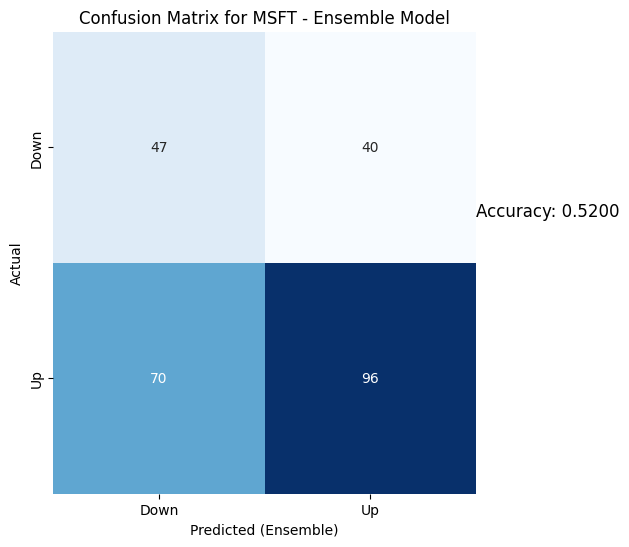

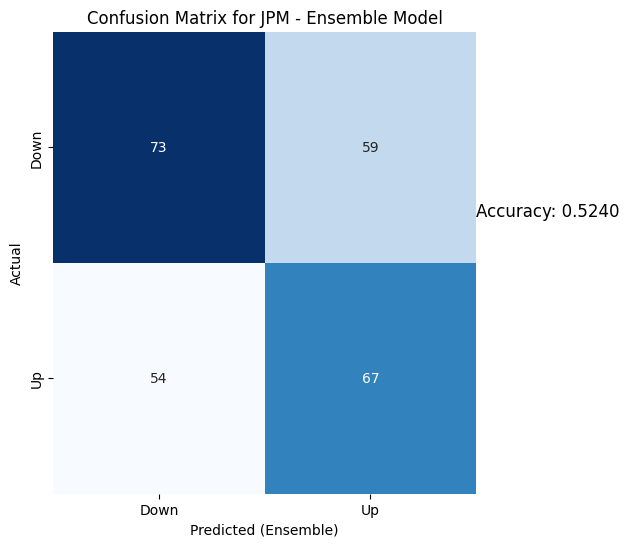

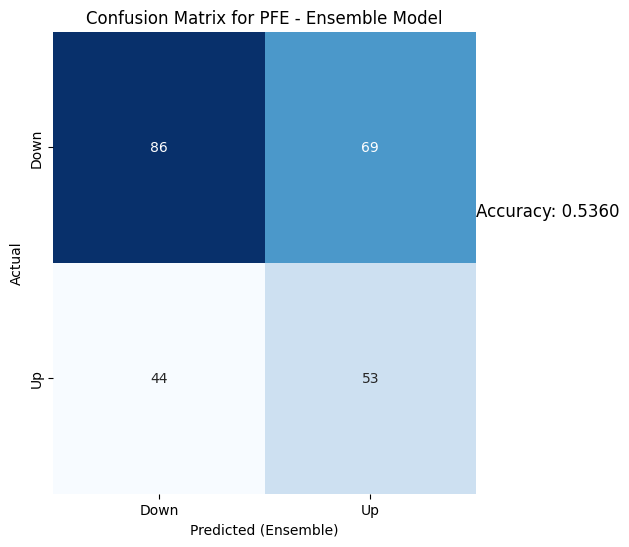

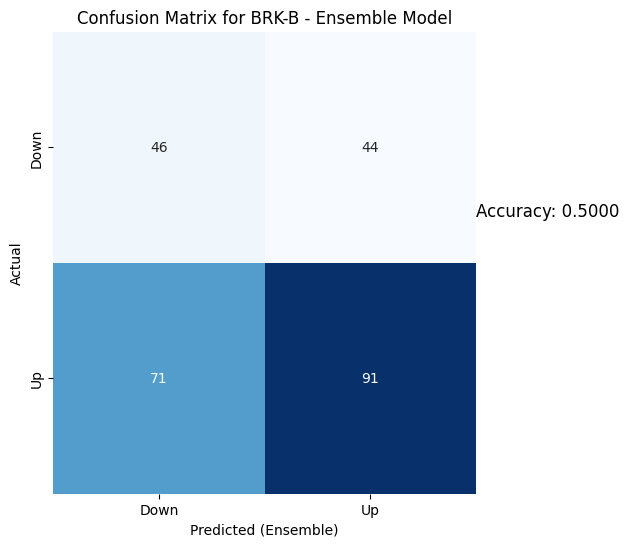

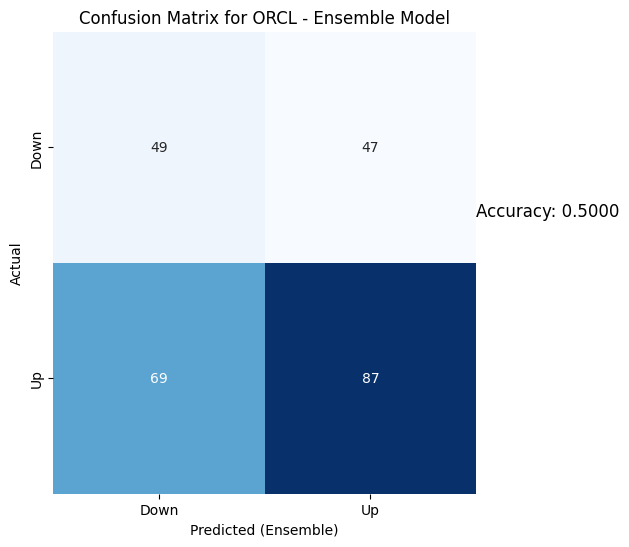

...

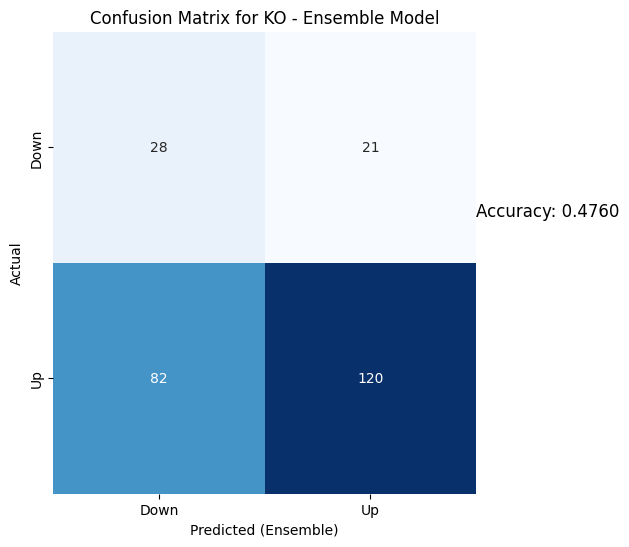

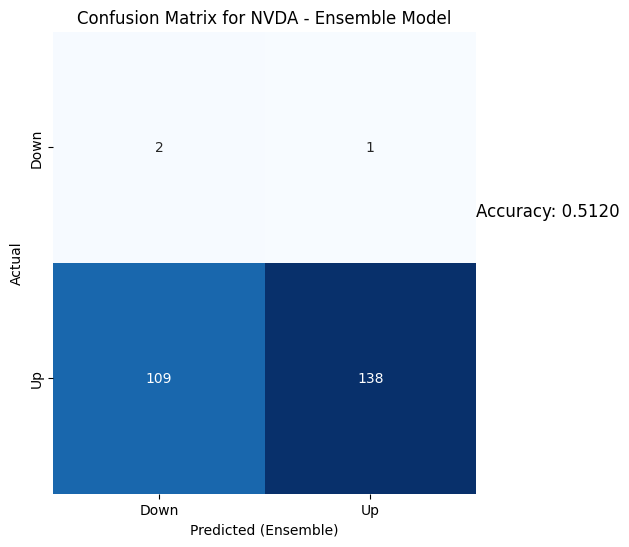

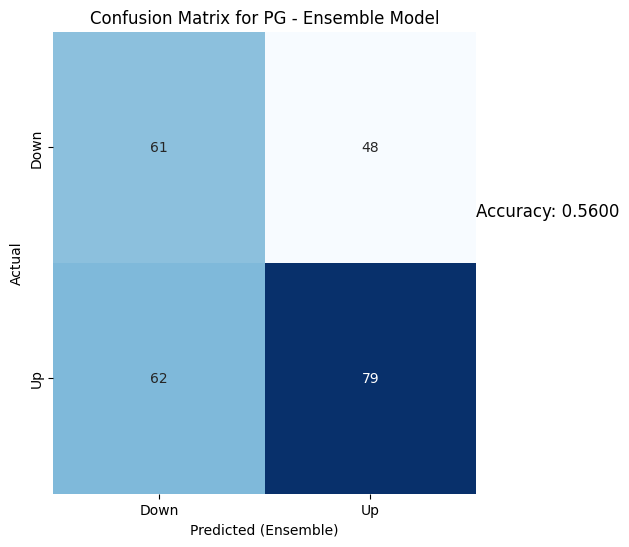

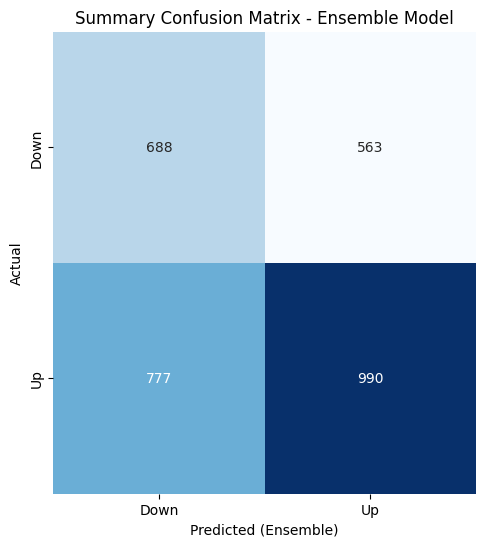

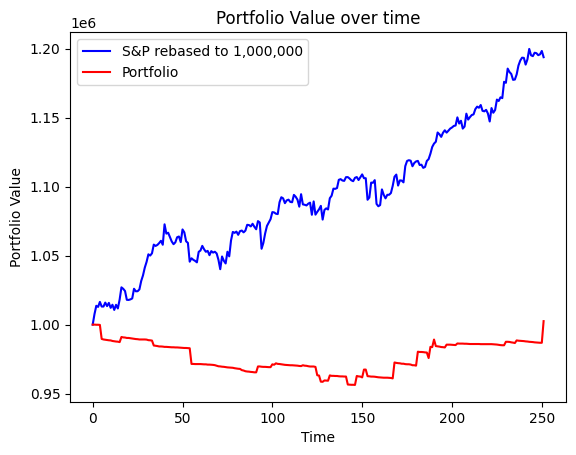

Portfolio return for our period =  100.2531572738002
S&P500 return during the period =  119.3844167713022


In [21]:
Portfolio_construct("2014-01-01")
#Testing for year 2017

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2264
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.516600
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.4643
LightGBM: 0.5516
GBR: 0.5357
RandomForest: 0.5040
XGBoost: 0.5000
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6943 - accuracy: 0.4987 - val_loss: 0.7001 - val_accuracy: 0.5330
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6903 - accuracy: 0.5241 - val_loss: 0.6931 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6914 - accuracy: 0.5152 - val_loss: 0.7051 - val_accuracy: 0.5330
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6900 - accuracy: 0.5216 - val_loss: 0.7064 - val_accuracy: 0.5330
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6888 - accuracy: 0.5305 - val_loss: 0.7059 - val_accuracy: 0.5330
Epoch 6/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6892 - accuracy: 0.5368 - val_loss: 0.7127 - val_accuracy: 0.5330
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4643
LightGBM: 0.4881
GBR: 0.5040
RandomForest: 0.5119
XGBoost: 0.5040
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.6958 - accuracy: 0.4981 - val_loss: 0.6939 - val_accuracy: 0.4010
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6963 - accuracy: 0.5184 - val_loss: 0.7046 - val_accuracy: 0.4467
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6926 - accuracy: 0.5083 - val_loss: 0.6923 - val_accuracy: 0.5888
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6932 - accuracy: 0.5083 - val_loss: 0.7026 - val_accuracy: 0.4467
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6950 - accuracy: 0.5172 - val_loss: 0.6972 - val_accuracy: 0.4467
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6958 - accuracy: 0.4727 - val_loss: 0.6991 - val_accuracy: 0.4467
Epoch 7/10
25/25 [==============================] - 0s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4643
LightGBM: 0.5040
GBR: 0.5278
RandomForest: 0.5079
XGBoost: 0.5397
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6979 - accuracy: 0.4784 - val_loss: 0.6947 - val_accuracy: 0.4416
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6924 - accuracy: 0.5191 - val_loss: 0.7009 - val_accuracy: 0.4721
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6921 - accuracy: 0.5178 - val_loss: 0.6934 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6919 - accuracy: 0.5204 - val_loss: 0.7014 - val_accuracy: 0.4721
Epoch 5/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6923 - accuracy: 0.5420 - val_loss: 0.7032 - val_accuracy: 0.4721
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6917 - accuracy: 0.5242 - val_loss: 0.6971 - val_accuracy: 0.4721
Epoch 7/10
25/25 [==============================] - 0s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5040
LightGBM: 0.4881
GBR: 0.4841
RandomForest: 0.4643
XGBoost: 0.4603
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6952 - accuracy: 0.5236 - val_loss: 0.6967 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6962 - accuracy: 0.4866 - val_loss: 0.6939 - val_accuracy: 0.4975
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6939 - accuracy: 0.5045 - val_loss: 0.6927 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 0.5019 - val_loss: 0.6938 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6931 - accuracy: 0.5236 - val_loss: 0.6936 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6930 - accuracy: 0.5287 - val_loss: 0.6941 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 1s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5578
LightGBM: 0.5139
GBR: 0.5259
RandomForest: 0.5299
XGBoost: 0.5618
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6946 - accuracy: 0.5255 - val_loss: 0.6923 - val_accuracy: 0.5127
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6938 - accuracy: 0.5153 - val_loss: 0.6968 - val_accuracy: 0.5127
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6912 - accuracy: 0.5217 - val_loss: 0.6924 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 0.5217 - val_loss: 0.6957 - val_accuracy: 0.5127
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6913 - accuracy: 0.5204 - val_loss: 0.6942 - val_accuracy: 0.5127
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6907 - accuracy: 0.5293 - val_loss: 0.6969 - val_accuracy: 0.5127
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5020
LightGBM: 0.4861
GBR: 0.5259
RandomForest: 0.4821
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6958 - accuracy: 0.5026 - val_loss: 0.6933 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6938 - accuracy: 0.4872 - val_loss: 0.6965 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6937 - accuracy: 0.5140 - val_loss: 0.6959 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 0.5051 - val_loss: 0.6933 - val_accuracy: 0.5051
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6944 - accuracy: 0.5051 - val_loss: 0.6932 - val_accuracy: 0.5408
Epoch 6/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6927 - accuracy: 0.5013 - val_loss: 0.6963 - val_accuracy: 0.4847
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.4861
LightGBM: 0.4582
GBR: 0.5100
RandomForest: 0.5100
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.6944 - accuracy: 0.4943 - val_loss: 0.7037 - val_accuracy: 0.4796
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6932 - accuracy: 0.5083 - val_loss: 0.7060 - val_accuracy: 0.4796
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6916 - accuracy: 0.5236 - val_loss: 0.7001 - val_accuracy: 0.4796
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6918 - accuracy: 0.5326 - val_loss: 0.6968 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6913 - accuracy: 0.5236 - val_loss: 0.7009 - val_accuracy: 0.4796
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6928 - accuracy: 0.5147 - val_loss: 0.6947 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4542
LightGBM: 0.4980
GBR: 0.5020
RandomForest: 0.4622
XGBoost: 0.4900
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6955 - accuracy: 0.4987 - val_loss: 0.6960 - val_accuracy: 0.4694
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6957 - accuracy: 0.4834 - val_loss: 0.6941 - val_accuracy: 0.4694
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6928 - accuracy: 0.5153 - val_loss: 0.6975 - val_accuracy: 0.4694
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6936 - accuracy: 0.5064 - val_loss: 0.6938 - val_accuracy: 0.4388
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6927 - accuracy: 0.5332 - val_loss: 0.6952 - val_accuracy: 0.4745
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6928 - accuracy: 0.5166 - val_loss: 0.6950 - val_accuracy: 0.4796
Epoch 7/10
25/25 [==============================] - 1s 20

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5080
LightGBM: 0.4640
GBR: 0.5120
RandomForest: 0.4760
XGBoost: 0.4760
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6917 - accuracy: 0.5352 - val_loss: 0.6975 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6931 - accuracy: 0.5275 - val_loss: 0.6950 - val_accuracy: 0.4439
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6903 - accuracy: 0.5109 - val_loss: 0.6946 - val_accuracy: 0.5153
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6900 - accuracy: 0.5262 - val_loss: 0.6956 - val_accuracy: 0.4898
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6879 - accuracy: 0.5429 - val_loss: 0.6999 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6871 - accuracy: 0.5531 - val_loss: 0.6973 - val_accuracy: 0.5051
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5240
LightGBM: 0.5040
GBR: 0.4680
RandomForest: 0.4680
XGBoost: 0.5040
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6969 - accuracy: 0.5167 - val_loss: 0.6933 - val_accuracy: 0.5153
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6937 - accuracy: 0.5077 - val_loss: 0.6931 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.5103 - val_loss: 0.6969 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6910 - accuracy: 0.5205 - val_loss: 0.6949 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6945 - accuracy: 0.4974 - val_loss: 0.7075 - val_accuracy: 0.5000
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6921 - accuracy: 0.5115 - val_loss: 0.6925 - val_accuracy: 0.5000
Epoch 7/10
25/25 [==============================] - 1s 20

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5120
LightGBM: 0.5400
GBR: 0.4680
RandomForest: 0.4840
XGBoost: 0.4880
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6887 - accuracy: 0.5590 - val_loss: 0.7005 - val_accuracy: 0.4974
Epoch 2/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6871 - accuracy: 0.5603 - val_loss: 0.7023 - val_accuracy: 0.4974
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6861 - accuracy: 0.5603 - val_loss: 0.6997 - val_accuracy: 0.4974
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6852 - accuracy: 0.5603 - val_loss: 0.7057 - val_accuracy: 0.4974
Epoch 5/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6853 - accuracy: 0.5603 - val_loss: 0.7013 - val_accuracy: 0.4974
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6846 - accuracy: 0.5603 - val_loss: 0.7028 - val_accuracy: 0.4974
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.4680
LightGBM: 0.5200
GBR: 0.5120
RandomForest: 0.5040
XGBoost: 0.5200
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6969 - accuracy: 0.4852 - val_loss: 0.6910 - val_accuracy: 0.5436
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6938 - accuracy: 0.4981 - val_loss: 0.6950 - val_accuracy: 0.4308
Epoch 3/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6942 - accuracy: 0.4917 - val_loss: 0.6954 - val_accuracy: 0.4462
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6942 - accuracy: 0.4968 - val_loss: 0.6982 - val_accuracy: 0.4564
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6925 - accuracy: 0.5315 - val_loss: 0.6960 - val_accuracy: 0.4359
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6921 - accuracy: 0.5250 - val_loss: 0.6943 - val_accuracy: 0.4667
Epoch 7/10
25/25 [==============================] - 0s 20

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2323 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  197.39999389648438  and sold at  196.66000366210938
VZ bought at  52.88999938964844  and sold at  52.34000015258789
84.69000244140625
104.66000366210938
34.5920295715332
43.05500030517578
52.34000015258789
28.729999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2324 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'AAPL', 'VZ', 'BAC']
MSFT bought at  84.69000244140625  and sold at  86.8499984741211
JPM bought at  104.66000366210938  and sold at  106.13999938964844
PFE bought at  34.5920295715332  and sold at  35.29411697387695
AAPL bought at  43.05500030517578  and sold at  43.49250030517578
VZ bought at  52.34000015258789  and sold at  52.66999816894531
BAC bought at  28.729999542236328  and sold at  29.040000915527344
86.8499984741211
106.13999938964844
43.49250030517578
52.66999816894531
29.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2325 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL', 'VZ', 'BAC']
MSFT bought at  86.8499984741211  and sold at  86.37999725341797
JPM bought at  106.13999938964844  and sold at  106.95999908447266
AAPL bought at  43.49250030517578  and sold at  44.10499954223633
VZ bought at  52.66999816894531  and sold at  53.25
BAC bought at  29.040000915527344  and sold at  29.479999542236328
86.37999725341797
106.95999908447266
53.25
29.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2326 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'VZ', 'BAC']
MSFT bought at  86.37999725341797  and sold at  85.83000183105469
JPM bought at  106.95999908447266  and sold at  106.51000213623047
VZ bought at  53.25  and sold at  52.83000183105469
BAC bought at  29.479999542236328  and sold at  29.450000762939453
106.51000213623047
197.91000366210938
52.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2327 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ']
JPM bought at  106.51000213623047  and sold at  106.13999938964844
BRK-B bought at  197.91000366210938  and sold at  197.7899932861328
VZ bought at  52.83000183105469  and sold at  52.77000045776367
85.5199966430664
106.13999938964844
52.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2328 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'VZ']
MSFT bought at  85.5199966430664  and sold at  85.5
JPM bought at  106.13999938964844  and sold at  107.83000183105469
VZ bought at  52.77000045776367  and sold at  53.0099983215332
85.5
43.752498626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2329 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  85.5  and sold at  85.51000213623047
AAPL bought at  43.752498626708984  and sold at  43.752498626708984
53.189998626708984
48.817501068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2330 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  53.189998626708984  and sold at  53.220001220703125
NVDA bought at  48.817501068115234  and sold at  49.36000061035156
47.43000030517578
53.220001220703125
29.780000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2331 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'BAC']
ORCL bought at  47.43000030517578  and sold at  47.380001068115234
VZ bought at  53.220001220703125  and sold at  53.279998779296875
BAC bought at  29.780000686645508  and sold at  29.729999542236328
53.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2332 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  53.279998779296875  and sold at  53.43000030517578
85.54000091552734
52.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2333 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  85.54000091552734  and sold at  85.94999694824219
VZ bought at  52.93000030517578  and sold at  53.529998779296875
85.94999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2334 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  85.94999694824219  and sold at  86.3499984741211
52.43000030517578
29.799999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2335 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  52.43000030517578  and sold at  52.599998474121094
BAC bought at  29.799999237060547  and sold at  30.190000534057617
52.599998474121094
30.190000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2336 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'BAC']
VZ bought at  52.599998474121094  and sold at  52.47999954223633
BAC bought at  30.190000534057617  and sold at  30.329999923706055
88.19000244140625
108.33999633789062
155.3441619873047
30.329999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2337 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM', 'BAC']
MSFT bought at  88.19000244140625  and sold at  88.27999877929688
JPM bought at  108.33999633789062  and sold at  108.5
IBM bought at  155.3441619873047  and sold at  156.28106689453125
BAC bought at  30.329999923706055  and sold at  30.1200008392334
202.74000549316406
30.1200008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2338 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  202.74000549316406  and sold at  203.02000427246094
BAC bought at  30.1200008392334  and sold at  30.270000457763672
206.69000244140625
156.97897338867188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2339 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM']
BRK-B bought at  206.69000244140625  and sold at  210.16000366210938
IBM bought at  156.97897338867188  and sold at  155.965576171875
210.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2340 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  210.16000366210938  and sold at  210.2899932861328
46.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2341 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  46.529998779296875  and sold at  46.81999969482422
90.0999984741211
46.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2342 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  90.0999984741211  and sold at  90.0
KO bought at  46.880001068115234  and sold at  47.15999984741211
51.90999984741211
47.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2343 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  51.90999984741211  and sold at  53.459999084472656
KO bought at  47.15999984741211  and sold at  47.380001068115234
91.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2344 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  91.61000061035156  and sold at  91.9000015258789
47.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2345 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  47.45000076293945  and sold at  47.83000183105469
158.09751892089844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2346 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  158.09751892089844  and sold at  158.193115234375
94.05999755859375
37.01138687133789
60.83250045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2347 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'NVDA']
MSFT bought at  94.05999755859375  and sold at  93.91999816894531
PFE bought at  37.01138687133789  and sold at  37.0208740234375
NVDA bought at  60.83250045776367  and sold at  61.712501525878906
32.279998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2348 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  32.279998779296875  and sold at  31.8799991607666
92.73999786376953
35.86337661743164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2349 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  92.73999786376953  and sold at  95.01000213623047
PFE bought at  35.86337661743164  and sold at  35.14231491088867
95.01000213623047
35.14231491088867
32.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2350 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BAC']
MSFT bought at  95.01000213623047  and sold at  94.26000213623047
PFE bought at  35.14231491088867  and sold at  34.94307327270508
BAC bought at  32.0  and sold at  32.5
60.125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2351 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  60.125  and sold at  58.380001068115234
91.77999877929688
50.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2352 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  91.77999877929688  and sold at  88.0
ORCL bought at  50.130001068115234  and sold at  48.09000015258789
32.89373779296875
30.260000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2353 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  32.89373779296875  and sold at  33.47248458862305
BAC bought at  30.260000228881836  and sold at  31.200000762939453
33.47248458862305
31.200000762939453
56.39500045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2354 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'NVDA']
PFE bought at  33.47248458862305  and sold at  33.1878547668457
BAC bought at  31.200000762939453  and sold at  31.25
NVDA bought at  56.39500045776367  and sold at  57.20000076293945
112.87000274658203
33.1878547668457
48.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2355 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  112.87000274658203  and sold at  107.87999725341797
PFE bought at  33.1878547668457  and sold at  31.907020568847656
ORCL bought at  48.869998931884766  and sold at  46.84000015258789
29.739999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2356 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.739999771118164  and sold at  30.329999923706055
142.93499755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2357 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  142.93499755859375  and sold at  144.7418670654297
89.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2358 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  89.12999725341797  and sold at  89.83000183105469
89.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2359 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  89.83000183105469  and sold at  90.80999755859375
201.02000427246094
49.43000030517578
147.18930053710938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2360 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'IBM']
BRK-B bought at  201.02000427246094  and sold at  200.72999572753906
ORCL bought at  49.43000030517578  and sold at  49.59000015258789
IBM bought at  147.18930053710938  and sold at  146.44358825683594
146.44358825683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2361 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  146.44358825683594  and sold at  148.68069458007812
94.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2362 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  94.05999755859375  and sold at  95.41999816894531
95.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2363 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  95.41999816894531  and sold at  94.19999694824219
32.33000183105469
61.51499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2364 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  32.33000183105469  and sold at  32.099998474121094
NVDA bought at  61.51499938964844  and sold at  60.5
92.8499984741211
58.0525016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2365 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  92.8499984741211  and sold at  93.05000305175781
NVDA bought at  58.0525016784668  and sold at  59.1349983215332
93.63999938964844
32.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2366 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  93.63999938964844  and sold at  93.31999969482422
BAC bought at  32.130001068115234  and sold at  32.11000061035156
93.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2367 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  93.31999969482422  and sold at  93.86000061035156
93.86000061035156
204.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2368 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  93.86000061035156  and sold at  94.43000030517578
BRK-B bought at  204.3000030517578  and sold at  205.2899932861328
149.34034729003906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2369 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  149.34034729003906  and sold at  152.30401611328125
96.54000091552734
34.886146545410156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2370 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  96.54000091552734  and sold at  96.7699966430664
PFE bought at  34.886146545410156  and sold at  34.734344482421875
96.7699966430664
34.734344482421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2371 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  96.7699966430664  and sold at  94.41000366210938
PFE bought at  34.734344482421875  and sold at  34.86717224121094
48.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2372 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  48.650001525878906  and sold at  48.45000076293945
93.8499984741211
52.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2373 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  93.8499984741211  and sold at  94.18000030517578
ORCL bought at  52.31999969482422  and sold at  52.369998931884766
152.5908203125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2374 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  152.5908203125  and sold at  153.2122344970703
92.88999938964844
51.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2375 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  92.88999938964844  and sold at  93.12999725341797
ORCL bought at  51.95000076293945  and sold at  47.04999923706055
93.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2376 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  93.12999725341797  and sold at  92.4800033569336
62.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2377 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  62.13999938964844  and sold at  60.462501525878906
45.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2378 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  45.88999938964844  and sold at  44.790000915527344
32.72296142578125
142.34225463867188
58.24250030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2379 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM', 'NVDA']
PFE bought at  32.72296142578125  and sold at  33.244781494140625
IBM bought at  142.34225463867188  and sold at  146.625244140625
NVDA bought at  58.24250030517578  and sold at  61.119998931884766
93.77999877929688
33.244781494140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2380 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  93.77999877929688  and sold at  89.47000122070312
PFE bought at  33.244781494140625  and sold at  33.2163200378418
33.2163200378418
196.14999389648438
145.2294464111328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2381 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'IBM']
PFE bought at  33.2163200378418  and sold at  33.49146270751953
BRK-B bought at  196.14999389648438  and sold at  196.6699981689453
IBM bought at  145.2294464111328  and sold at  145.8126220703125
33.49146270751953
44.97999954223633
55.337501525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2382 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'NVDA']
PFE bought at  33.49146270751953  and sold at  33.67172622680664
ORCL bought at  44.97999954223633  and sold at  45.75
NVDA bought at  55.337501525878906  and sold at  57.897499084472656
33.67172622680664
199.47999572753906
45.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2383 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'ORCL']
PFE bought at  33.67172622680664  and sold at  33.254268646240234
BRK-B bought at  199.47999572753906  and sold at  195.0
ORCL bought at  45.75  and sold at  45.0099983215332
33.851993560791016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2384 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.851993560791016  and sold at  34.27893829345703
34.27893829345703
56.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2385 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  34.27893829345703  and sold at  33.89942932128906
NVDA bought at  56.560001373291016  and sold at  55.345001220703125
200.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2386 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  200.85000610351562  and sold at  195.49000549316406
90.2300033569336
195.49000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2387 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  90.2300033569336  and sold at  90.7699966430664
BRK-B bought at  195.49000549316406  and sold at  195.3300018310547
29.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2388 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.8700008392334  and sold at  30.479999542236328
45.880001068115234
30.649999618530273


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2389 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  45.880001068115234  and sold at  46.08000183105469
BAC bought at  30.649999618530273  and sold at  29.799999237060547
93.08000183105469
34.45920181274414
197.0
29.799999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2390 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BRK-B', 'BAC']
MSFT bought at  93.08000183105469  and sold at  94.16999816894531
PFE bought at  34.45920181274414  and sold at  34.658443450927734
BRK-B bought at  197.0  and sold at  198.22000122070312
BAC bought at  29.799999237060547  and sold at  29.93000030517578
94.16999816894531
198.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2391 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  94.16999816894531  and sold at  96.06999969482422
BRK-B bought at  198.22000122070312  and sold at  199.27000427246094
153.83364868164062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2392 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  153.83364868164062  and sold at  142.2466583251953
142.2466583251953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2393 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  142.2466583251953  and sold at  141.20458984375
34.658443450927734
141.20458984375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2394 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  34.658443450927734  and sold at  34.75332260131836
IBM bought at  141.20458984375  and sold at  138.52772521972656
95.0
34.75332260131836
138.52772521972656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2395 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'IBM']
MSFT bought at  95.0  and sold at  95.3499984741211
PFE bought at  34.75332260131836  and sold at  34.91461181640625
IBM bought at  138.52772521972656  and sold at  139.4455108642578
34.91461181640625
55.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2396 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  34.91461181640625  and sold at  35.16128921508789
NVDA bought at  55.970001220703125  and sold at  55.29999923706055
35.16128921508789
55.29999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2397 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  35.16128921508789  and sold at  34.800758361816406
NVDA bought at  55.29999923706055  and sold at  54.165000915527344
34.800758361816406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2398 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.800758361816406  and sold at  34.9620475769043
34.9620475769043
197.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2399 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  34.9620475769043  and sold at  35.10436248779297
BRK-B bought at  197.02999877929688  and sold at  197.22999572753906
35.10436248779297
30.149999618530273
56.58250045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2400 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'NVDA']
PFE bought at  35.10436248779297  and sold at  34.734344482421875
BAC bought at  30.149999618530273  and sold at  29.920000076293945
NVDA bought at  56.58250045776367  and sold at  56.224998474121094
34.734344482421875
29.920000076293945
56.224998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2401 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'NVDA']
PFE bought at  34.734344482421875  and sold at  33.58633804321289
BAC bought at  29.920000076293945  and sold at  29.950000762939453
NVDA bought at  56.224998474121094  and sold at  56.78499984741211
108.77999877929688
33.58633804321289


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2402 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  108.77999877929688  and sold at  107.91999816894531
PFE bought at  33.58633804321289  and sold at  33.10246658325195
33.10246658325195


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2403 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.10246658325195  and sold at  32.9791259765625
32.9791259765625
29.200000762939453
58.247501373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2404 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'NVDA']
PFE bought at  32.9791259765625  and sold at  33.05502700805664
BAC bought at  29.200000762939453  and sold at  29.299999237060547
NVDA bought at  58.247501373291016  and sold at  59.76499938964844
33.05502700805664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2405 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.05502700805664  and sold at  33.14041519165039
95.80999755859375
33.1878547668457
196.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2406 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BRK-B']
MSFT bought at  95.80999755859375  and sold at  96.94000244140625
PFE bought at  33.1878547668457  and sold at  33.36812210083008
BRK-B bought at  196.24000549316406  and sold at  199.8699951171875
33.36812210083008


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2407 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.36812210083008  and sold at  33.244781494140625
97.91000366210938
33.244781494140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2408 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  97.91000366210938  and sold at  97.69999694824219
PFE bought at  33.244781494140625  and sold at  33.68121337890625
33.68121337890625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2409 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.68121337890625  and sold at  34.022769927978516
34.022769927978516


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2410 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.022769927978516  and sold at  33.861480712890625
33.861480712890625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2411 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.861480712890625  and sold at  33.851993560791016
33.851993560791016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2412 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.851993560791016  and sold at  33.880455017089844
33.880455017089844
30.809999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2413 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  33.880455017089844  and sold at  33.81404113769531
BAC bought at  30.809999465942383  and sold at  30.260000228881836
137.74378967285156
61.48500061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2414 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  137.74378967285156  and sold at  139.09178161621094
NVDA bought at  61.48500061035156  and sold at  61.060001373291016
33.965843200683594
61.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2415 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'NVDA']
PFE bought at  33.965843200683594  and sold at  33.88994216918945
NVDA bought at  61.060001373291016  and sold at  60.67499923706055
30.889999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2416 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  30.889999389648438  and sold at  30.440000534057617
30.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2417 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  30.440000534057617  and sold at  30.209999084472656
30.209999084472656
61.92250061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2418 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  30.209999084472656  and sold at  30.15999984741211
NVDA bought at  61.92250061035156  and sold at  62.31999969482422
98.36000061035156
30.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2419 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  98.36000061035156  and sold at  98.01000213623047
BAC bought at  30.15999984741211  and sold at  28.959999084472656
33.870967864990234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2420 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.870967864990234  and sold at  34.20303726196289
98.94999694824219
34.20303726196289


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2421 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  98.94999694824219  and sold at  98.83999633789062
PFE bought at  34.20303726196289  and sold at  34.08918380737305
29.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2422 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.040000915527344  and sold at  29.399999618530273
100.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2423 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  100.79000091552734  and sold at  101.66999816894531
34.582542419433594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2424 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.582542419433594  and sold at  34.573055267333984
102.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2425 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  102.19000244140625  and sold at  102.48999786376953
100.87999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2426 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  100.87999725341797  and sold at  101.62999725341797
101.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2427 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  101.05000305175781  and sold at  101.30999755859375
100.8499984741211
139.91395568847656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2428 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  100.8499984741211  and sold at  101.41999816894531
IBM bought at  139.91395568847656  and sold at  138.8145294189453
29.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2429 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.5  and sold at  29.280000686645508
100.12999725341797
138.9961700439453
66.31500244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2430 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  100.12999725341797  and sold at  100.86000061035156
IBM bought at  138.9961700439453  and sold at  138.12619018554688
NVDA bought at  66.31500244140625  and sold at  66.27249908447266
138.12619018554688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2431 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  138.12619018554688  and sold at  137.5717010498047
34.36432647705078
137.5717010498047
29.260000228881836
65.0425033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2432 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM', 'BAC', 'NVDA']
PFE bought at  34.36432647705078  and sold at  34.5920295715332
IBM bought at  137.5717010498047  and sold at  136.35755920410156
BAC bought at  29.260000228881836  and sold at  29.239999771118164
NVDA bought at  65.0425033569336  and sold at  65.57749938964844
189.5
42.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2433 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  189.5  and sold at  188.86000061035156
ORCL bought at  42.81999969482422  and sold at  43.099998474121094
43.099998474121094
135.03823852539062
64.27749633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2434 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'NVDA']
ORCL bought at  43.099998474121094  and sold at  44.099998474121094
IBM bought at  135.03823852539062  and sold at  135.06692504882812
NVDA bought at  64.27749633789062  and sold at  62.73749923706055
188.91000366210938
135.06692504882812


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2435 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'IBM']
BRK-B bought at  188.91000366210938  and sold at  186.72999572753906
IBM bought at  135.06692504882812  and sold at  132.68641662597656
132.68641662597656
28.479999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2436 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  132.68641662597656  and sold at  132.9636688232422
BAC bought at  28.479999542236328  and sold at  28.540000915527344
58.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2437 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  58.93000030517578  and sold at  60.21500015258789
59.224998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2438 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  59.224998474121094  and sold at  60.560001373291016
34.98102569580078
45.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2439 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  34.98102569580078  and sold at  35.2087287902832
ORCL bought at  45.40999984741211  and sold at  46.0
46.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2440 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  46.0  and sold at  46.72999954223633
35.256168365478516


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2441 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  35.256168365478516  and sold at  35.512332916259766
28.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2442 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  28.829999923706055  and sold at  28.68000030517578
101.9800033569336
35.30360412597656
28.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2443 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BAC']
MSFT bought at  101.9800033569336  and sold at  104.19000244140625
PFE bought at  35.30360412597656  and sold at  35.597721099853516
BAC bought at  28.68000030517578  and sold at  28.770000457763672
104.19000244140625
62.807498931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2444 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  104.19000244140625  and sold at  105.43000030517578
NVDA bought at  62.807498931884766  and sold at  62.33000183105469
48.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2445 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  48.630001068115234  and sold at  48.459999084472656
29.780000686645508


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2446 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.780000686645508  and sold at  30.010000228881836
30.010000228881836


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2447 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  30.010000228881836  and sold at  30.1299991607666
107.97000122070312
44.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2448 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  107.97000122070312  and sold at  107.66000366210938
KO bought at  44.95000076293945  and sold at  45.2599983215332
107.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2449 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  107.66000366210938  and sold at  110.83000183105469
197.4600067138672
30.940000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2450 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  197.4600067138672  and sold at  197.9499969482422
BAC bought at  30.940000534057617  and sold at  31.059999465942383
52.0099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2451 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  52.0099983215332  and sold at  52.4900016784668
105.37000274658203
52.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2452 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  105.37000274658203  and sold at  106.08000183105469
VZ bought at  52.4900016784668  and sold at  51.63999938964844
37.88425064086914
51.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2453 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ']
PFE bought at  37.88425064086914  and sold at  38.20683288574219
VZ bought at  51.63999938964844  and sold at  51.72999954223633
106.27999877929688
197.85000610351562
51.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2454 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'VZ']
MSFT bought at  106.27999877929688  and sold at  107.56999969482422
BRK-B bought at  197.85000610351562  and sold at  198.05999755859375
VZ bought at  51.72999954223633  and sold at  51.97999954223633
107.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2455 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  107.56999969482422  and sold at  108.04000091552734
108.04000091552734
200.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2456 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  108.04000091552734  and sold at  108.12999725341797
BRK-B bought at  200.24000549316406  and sold at  206.05999755859375
208.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2457 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  208.72000122070312  and sold at  208.94000244140625
109.48999786376953
208.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2458 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  109.48999786376953  and sold at  109.66999816894531
BRK-B bought at  208.94000244140625  and sold at  209.10000610351562
53.0099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2459 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  53.0099983215332  and sold at  52.470001220703125
206.6300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2460 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  206.6300048828125  and sold at  205.1699981689453
38.62428665161133
205.8300018310547
52.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2461 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'VZ']
PFE bought at  38.62428665161133  and sold at  39.051231384277344
BRK-B bought at  205.8300018310547  and sold at  204.5
VZ bought at  52.869998931884766  and sold at  53.2400016784668
204.5
64.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2462 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  204.5  and sold at  207.55999755859375
NVDA bought at  64.7699966430664  and sold at  64.36000061035156
54.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2463 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  54.27000045776367  and sold at  54.790000915527344
107.58000183105469
48.36000061035156
54.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2464 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ']
MSFT bought at  107.58000183105469  and sold at  106.87000274658203
ORCL bought at  48.36000061035156  and sold at  48.41999816894531
VZ bought at  54.790000915527344  and sold at  54.650001525878906
40.16128921508789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2465 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  40.16128921508789  and sold at  40.0
105.9800033569336
208.49000549316406
48.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2466 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  105.9800033569336  and sold at  107.05999755859375
BRK-B bought at  208.49000549316406  and sold at  207.3300018310547
ORCL bought at  48.40999984741211  and sold at  48.79999923706055
48.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2467 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  48.79999923706055  and sold at  48.959999084472656
49.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2468 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  49.2599983215332  and sold at  49.33000183105469
48.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2469 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  48.63999938964844  and sold at  48.88999938964844
112.0199966430664
54.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2470 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  112.0199966430664  and sold at  111.94999694824219
VZ bought at  54.56999969482422  and sold at  54.75
39.39278793334961


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2471 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  39.39278793334961  and sold at  39.25047302246094
210.0500030517578
53.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2472 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ']
BRK-B bought at  210.0500030517578  and sold at  212.25999450683594
VZ bought at  53.189998626708984  and sold at  53.81999969482422
31.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2473 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  31.18000030517578  and sold at  30.850000381469727
109.37999725341797
215.11000061035156
54.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2474 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'VZ']
MSFT bought at  109.37999725341797  and sold at  111.23999786376953
BRK-B bought at  215.11000061035156  and sold at  215.10000610351562
VZ bought at  54.119998931884766  and sold at  54.720001220703125
30.139999389648438
67.83499908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2475 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA']
BAC bought at  30.139999389648438  and sold at  30.3700008392334
NVDA bought at  67.83499908447266  and sold at  69.10749816894531
113.37000274658203
54.54999923706055
30.3700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2476 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'BAC']
MSFT bought at  113.37000274658203  and sold at  112.13999938964844
VZ bought at  54.54999923706055  and sold at  54.70000076293945
BAC bought at  30.3700008392334  and sold at  30.280000686645508
68.48249816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2477 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  68.48249816894531  and sold at  67.75499725341797
113.20999908447266
218.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2478 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  113.20999908447266  and sold at  111.69999694824219
BRK-B bought at  218.3000030517578  and sold at  220.9499969482422
111.69999694824219
220.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2479 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B']
MSFT bought at  111.69999694824219  and sold at  113.56999969482422
BRK-B bought at  220.9499969482422  and sold at  221.67999267578125
113.56999969482422
31.190000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2480 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  113.56999969482422  and sold at  114.26000213623047
BAC bought at  31.190000534057617  and sold at  31.030000686645508
114.66999816894531
53.540000915527344
30.739999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2481 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'BAC']
MSFT bought at  114.66999816894531  and sold at  114.44999694824219
VZ bought at  53.540000915527344  and sold at  53.04999923706055
BAC bought at  30.739999771118164  and sold at  30.670000076293945
114.44999694824219
53.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2482 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  114.44999694824219  and sold at  113.9800033569336
VZ bought at  53.04999923706055  and sold at  53.13999938964844
114.41000366210938
29.940000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2483 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  114.41000366210938  and sold at  114.37000274658203
BAC bought at  29.940000534057617  and sold at  29.459999084472656
29.459999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2484 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.459999084472656  and sold at  29.649999618530273
115.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2485 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  115.61000061035156  and sold at  115.1500015258789
115.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2486 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  115.1500015258789  and sold at  115.16999816894531
115.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2487 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  115.16999816894531  and sold at  112.79000091552734
49.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2488 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  49.349998474121094  and sold at  49.36000061035156
141.86424255371094
66.44249725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2489 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  141.86424255371094  and sold at  140.7648162841797
NVDA bought at  66.44249725341797  and sold at  66.38500213623047
66.38500213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2490 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  66.38500213623047  and sold at  61.42250061035156
106.16000366210938
29.239999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2491 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  106.16000366210938  and sold at  105.91000366210938
BAC bought at  29.239999771118164  and sold at  28.360000610351562
132.90631103515625
58.782501220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2492 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  132.90631103515625  and sold at  134.6558380126953
NVDA bought at  58.782501220703125  and sold at  61.6349983215332
109.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2493 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  109.56999969482422  and sold at  107.5999984741211
47.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2494 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  47.119998931884766  and sold at  48.22999954223633
111.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2495 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  111.0  and sold at  110.70999908447266
110.70999908447266
47.86000061035156
128.15487670898438
60.76499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2496 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'NVDA']
MSFT bought at  110.70999908447266  and sold at  108.5
ORCL bought at  47.86000061035156  and sold at  47.380001068115234
IBM bought at  128.15487670898438  and sold at  124.80879211425781
NVDA bought at  60.76499938964844  and sold at  59.88249969482422
124.80879211425781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2497 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  124.80879211425781  and sold at  123.42256164550781
108.66000366210938
57.29249954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2498 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  108.66000366210938  and sold at  109.62999725341797
NVDA bought at  57.29249954223633  and sold at  57.80500030517578
47.939998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2499 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  47.939998626708984  and sold at  47.9900016784668
108.0999984741211
55.26499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2500 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  108.0999984741211  and sold at  102.31999969482422
NVDA bought at  55.26499938964844  and sold at  49.852500915527344
120.88909912109375
26.59000015258789
51.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2501 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC', 'NVDA']
IBM bought at  120.88909912109375  and sold at  119.3021011352539
BAC bought at  26.59000015258789  and sold at  26.389999389648438
NVDA bought at  51.959999084472656  and sold at  49.5724983215332
106.95999908447266
119.3021011352539


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2502 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  106.95999908447266  and sold at  103.8499984741211
IBM bought at  119.3021011352539  and sold at  114.37858581542969
56.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2503 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  56.47999954223633  and sold at  58.18000030517578
47.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2504 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  47.630001068115234  and sold at  47.880001068115234
56.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2505 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  56.04999923706055  and sold at  56.630001068115234
107.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2506 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  107.72000122070312  and sold at  111.95999908447266
41.603416442871094
222.4199981689453
51.497501373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2507 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'NVDA']
PFE bought at  41.603416442871094  and sold at  42.01138687133789
BRK-B bought at  222.4199981689453  and sold at  219.6300048828125
NVDA bought at  51.497501373291016  and sold at  51.41749954223633
47.3849983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2508 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  47.3849983215332  and sold at  49.82749938964844
48.057498931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2509 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  48.057498931884766  and sold at  46.70000076293945
114.91395568847656
49.29750061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2510 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  114.91395568847656  and sold at  116.09942626953125
NVDA bought at  49.29750061035156  and sold at  50.59749984741211
50.59749984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2511 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  50.59749984741211  and sold at  41.10749816894531
51.16999816894531
60.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2512 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  51.16999816894531  and sold at  49.54999923706055
VZ bought at  60.209999084472656  and sold at  60.619998931884766
104.62000274658203
36.17499923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2513 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  104.62000274658203  and sold at  101.70999908447266
NVDA bought at  36.17499923706055  and sold at  37.27000045776367
48.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2514 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  48.33000183105469  and sold at  48.619998931884766
113.35564422607422
27.270000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2515 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'BAC']
IBM bought at  113.35564422607422  and sold at  112.03633117675781
BAC bought at  27.270000457763672  and sold at  26.969999313354492
36.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2516 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  36.25  and sold at  38.26250076293945
106.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2517 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  106.47000122070312  and sold at  107.13999938964844
111.12000274658203
48.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2518 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  111.12000274658203  and sold at  110.19000244140625
ORCL bought at  48.189998626708984  and sold at  47.900001525878906
47.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2519 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  47.900001525878906  and sold at  48.7599983215332
108.5199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2520 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  108.5199966430664  and sold at  109.19000244140625
109.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2521 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  109.19000244140625  and sold at  104.81999969482422
[1000000.0, 996229.4777913325, 1003359.8160036202, 1009706.2237313223, 1013961.9602887544, 1020719.0742215038, 1022585.6513264957, 1024900.1887083933, 1023332.2138123972, 1030798.5222323644, 1037518.2681664297, 1033971.7260962153, 1043827.1939686228, 1042072.7208596828, 1046813.7856927047, 1055325.3727343942, 1057565.2880457493, 1057154.581840702, 1057602.542117608, 1069847.283369281, 1062754.3131556774, 1051853.5666615476, 1052376.149008996, 1051181.5123193632, 1028297.3727106975, 985291.3632985188, 1004703.8107611635, 999253.4375140985, 961772.5373463526, 976219.8259106969, 990555.1244058146, 993019.0198556228, 1006421.0297982448, 1019263.0893947341, 1019561.6916037297, 1013178.0298041689, 1008138.248835326, 1009444.8755941854, 1025534.7611250685, 1037443.5321690621, 1024489.4825033459, 1014111.3183566647, 999365.427583325, 1004517.08469456

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2522 times so far.

  warnings.warn(msg, UserWarning)


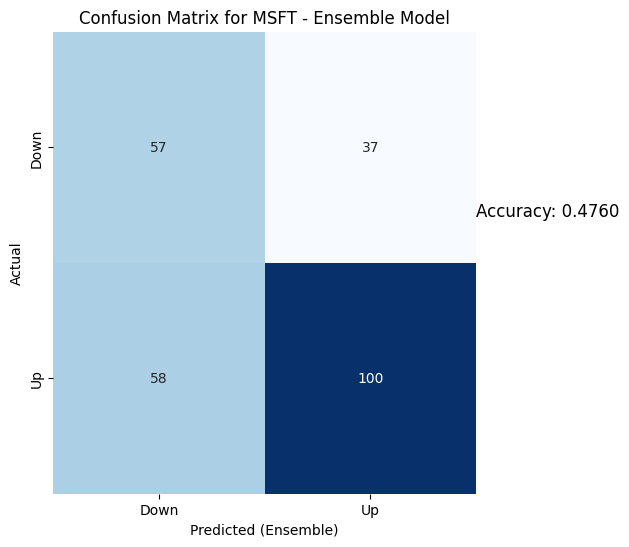

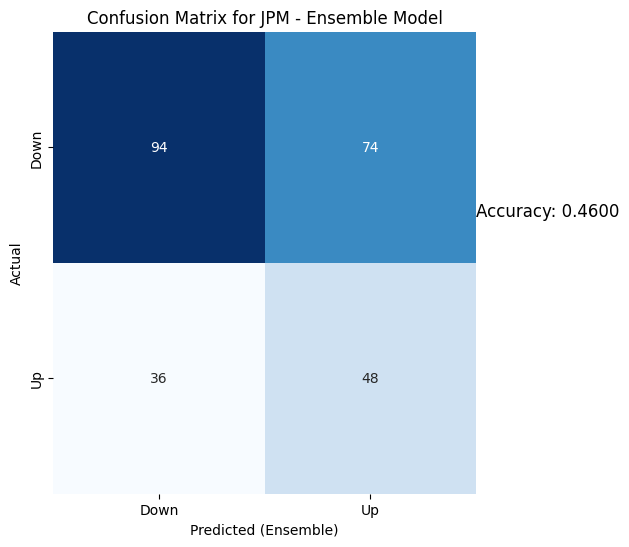

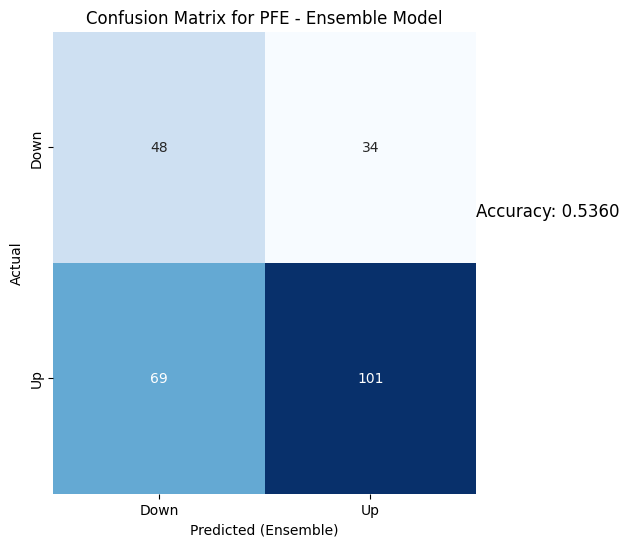

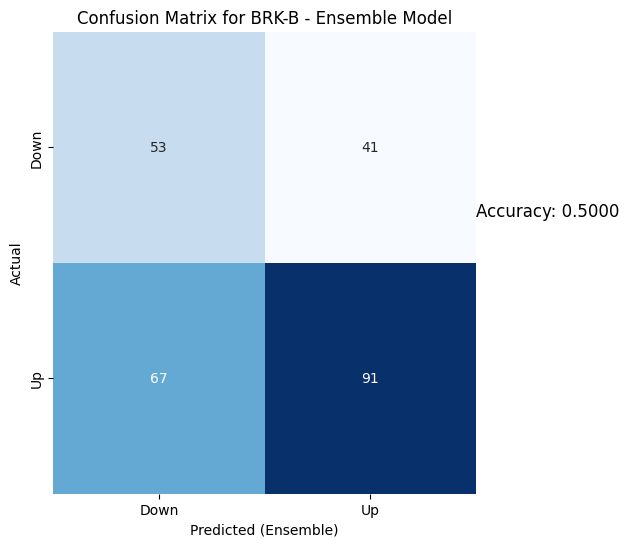

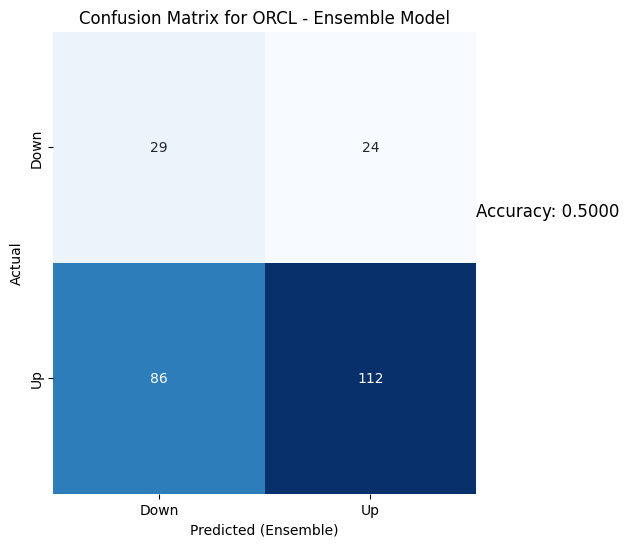

...

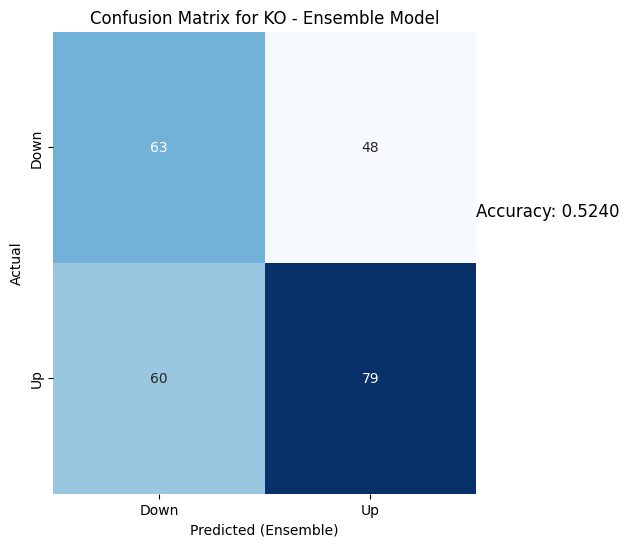

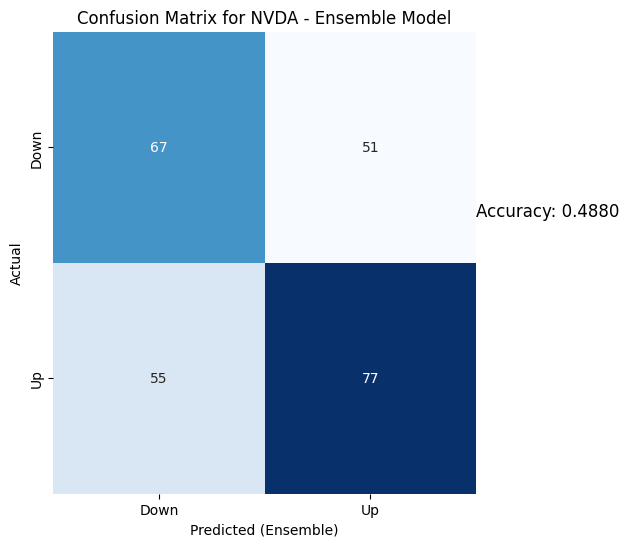

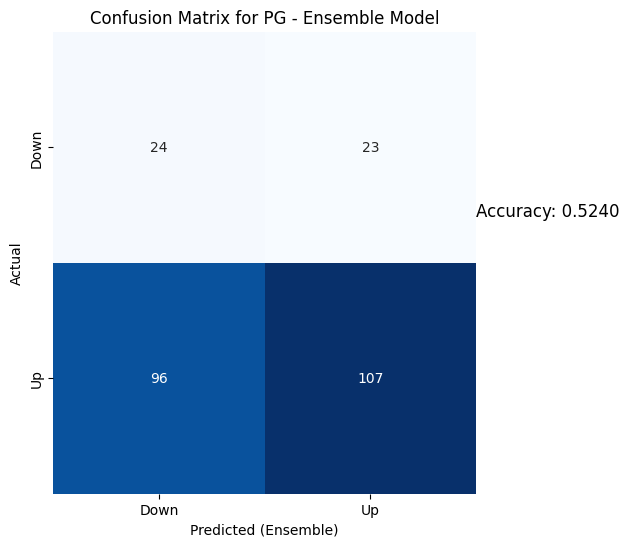

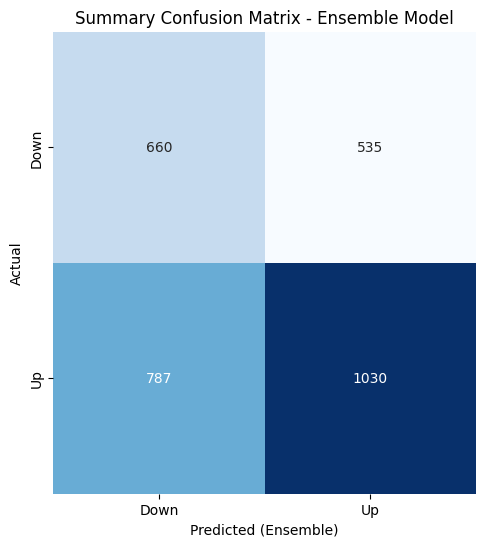

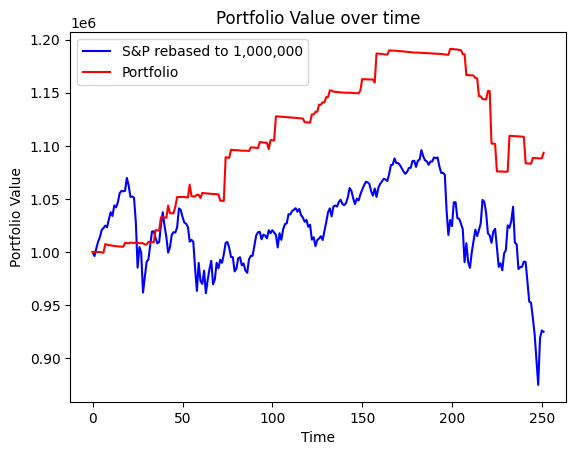

Portfolio return for our period =  109.3501798231398
S&P500 return during the period =  92.48889555234231


In [22]:
Portfolio_construct("2015-01-01")
#Testing for year 2018

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000432 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2262
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.536521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5833
LightGBM: 0.4325
GBR: 0.5198
RandomForest: 0.4524
XGBoost: 0.4167
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6916 - accuracy: 0.5178 - val_loss: 0.6797 - val_accuracy: 0.5838
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6914 - accuracy: 0.5419 - val_loss: 0.6813 - val_accuracy: 0.5838
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6903 - accuracy: 0.5419 - val_loss: 0.6835 - val_accuracy: 0.5838
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6899 - accuracy: 0.5419 - val_loss: 0.6802 - val_accuracy: 0.5838
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6914 - accuracy: 0.5419 - val_loss: 0.6817 - val_accuracy: 0.5838
Epoch 6/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6895 - accuracy: 0.5419 - val_loss: 0.6806 - val_accuracy: 0.5838
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4921
LightGBM: 0.5317
GBR: 0.5317
RandomForest: 0.5278
XGBoost: 0.5397
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6947 - accuracy: 0.4968 - val_loss: 0.6934 - val_accuracy: 0.4873
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6920 - accuracy: 0.5324 - val_loss: 0.6846 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6946 - accuracy: 0.4943 - val_loss: 0.6868 - val_accuracy: 0.5635
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6914 - accuracy: 0.5235 - val_loss: 0.6966 - val_accuracy: 0.4518
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6920 - accuracy: 0.5210 - val_loss: 0.6939 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6921 - accuracy: 0.5235 - val_loss: 0.6900 - val_accuracy: 0.5330
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.5159
LightGBM: 0.5437
GBR: 0.5278
RandomForest: 0.5317
XGBoost: 0.5119
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6972 - accuracy: 0.4911 - val_loss: 0.6915 - val_accuracy: 0.5178
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6936 - accuracy: 0.5127 - val_loss: 0.6889 - val_accuracy: 0.5431
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6930 - accuracy: 0.5025 - val_loss: 0.6893 - val_accuracy: 0.5431
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6934 - accuracy: 0.5204 - val_loss: 0.6895 - val_accuracy: 0.5431
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.5191 - val_loss: 0.6897 - val_accuracy: 0.5431
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6919 - accuracy: 0.5051 - val_loss: 0.6909 - val_accuracy: 0.5431
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5278
LightGBM: 0.5198
GBR: 0.5000
RandomForest: 0.5317
XGBoost: 0.4881
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6948 - accuracy: 0.5274 - val_loss: 0.6935 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6968 - accuracy: 0.5210 - val_loss: 0.6966 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6904 - accuracy: 0.5363 - val_loss: 0.6907 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6922 - accuracy: 0.5312 - val_loss: 0.6913 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6902 - accuracy: 0.5363 - val_loss: 0.6900 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6911 - accuracy: 0.5363 - val_loss: 0.6896 - val_accuracy: 0.5279
Epoch 7/10
25/25 [==============================] - 0s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for ORCL:
SVR: 0.5817
LightGBM: 0.4661
GBR: 0.5100
RandomForest: 0.4980
XGBoost: 0.4622
Epoch 1/10
25/25 [==============================] - 5s 58ms/step - loss: 0.6949 - accuracy: 0.5204 - val_loss: 0.6906 - val_accuracy: 0.5330
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6903 - accuracy: 0.5395 - val_loss: 0.6915 - val_accuracy: 0.5330
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6900 - accuracy: 0.5395 - val_loss: 0.6905 - val_accuracy: 0.5330
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6896 - accuracy: 0.5395 - val_loss: 0.6904 - val_accuracy: 0.5330
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6894 - accuracy: 0.5408 - val_loss: 0.6903 - val_accuracy: 0.5330
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6901 - accuracy: 0.5421 - val_loss: 0.6910 - val_accuracy: 0.5330
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5817
LightGBM: 0.5219
GBR: 0.4940
RandomForest: 0.4861
XGBoost: 0.5020
Epoch 1/10
25/25 [==============================] - 5s 53ms/step - loss: 0.6932 - accuracy: 0.5051 - val_loss: 0.6886 - val_accuracy: 0.5510
Epoch 2/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6926 - accuracy: 0.5383 - val_loss: 0.6889 - val_accuracy: 0.5510
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6910 - accuracy: 0.5383 - val_loss: 0.6891 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6919 - accuracy: 0.5459 - val_loss: 0.6884 - val_accuracy: 0.5510
Epoch 5/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6920 - accuracy: 0.5421 - val_loss: 0.6927 - val_accuracy: 0.5357
Epoch 6/10
25/25 [==============================] - 0s 18ms/step - loss: 0.6917 - accuracy: 0.5344 - val_loss: 0.6907 - val_accuracy: 0.5357
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5697
LightGBM: 0.4980
GBR: 0.5219
RandomForest: 0.5737
XGBoost: 0.5618
Epoch 1/10
25/25 [==============================] - 5s 51ms/step - loss: 0.6953 - accuracy: 0.5160 - val_loss: 0.6887 - val_accuracy: 0.5510
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6951 - accuracy: 0.4815 - val_loss: 0.6884 - val_accuracy: 0.5510
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6913 - accuracy: 0.5211 - val_loss: 0.6895 - val_accuracy: 0.5510
Epoch 4/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6901 - accuracy: 0.5287 - val_loss: 0.6873 - val_accuracy: 0.5510
Epoch 5/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6901 - accuracy: 0.5338 - val_loss: 0.6871 - val_accuracy: 0.5510
Epoch 6/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6883 - accuracy: 0.5364 - val_loss: 0.6889 - val_accuracy: 0.5510
Epoch 7/10
25/25 [==============================] - 0s 1

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.5657
LightGBM: 0.4502
GBR: 0.4382
RandomForest: 0.4741
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 5s 52ms/step - loss: 0.6937 - accuracy: 0.5090 - val_loss: 0.6971 - val_accuracy: 0.4694
Epoch 2/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6927 - accuracy: 0.5064 - val_loss: 0.6906 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.5269 - val_loss: 0.6930 - val_accuracy: 0.4898
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6933 - accuracy: 0.5166 - val_loss: 0.6988 - val_accuracy: 0.4694
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6935 - accuracy: 0.5166 - val_loss: 0.6972 - val_accuracy: 0.4592
Epoch 6/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6916 - accuracy: 0.5141 - val_loss: 0.6917 - val_accuracy: 0.4949
Epoch 7/10
25/25 [==============================] - 0s 19

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.4720
LightGBM: 0.5080
GBR: 0.5000
RandomForest: 0.5040
XGBoost: 0.5080
Epoch 1/10
25/25 [==============================] - 5s 55ms/step - loss: 0.6969 - accuracy: 0.5032 - val_loss: 0.6915 - val_accuracy: 0.5153
Epoch 2/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6920 - accuracy: 0.5019 - val_loss: 0.6915 - val_accuracy: 0.5357
Epoch 3/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6938 - accuracy: 0.4942 - val_loss: 0.6909 - val_accuracy: 0.5408
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6935 - accuracy: 0.5096 - val_loss: 0.6914 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6926 - accuracy: 0.5006 - val_loss: 0.6908 - val_accuracy: 0.5408
Epoch 6/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6916 - accuracy: 0.5211 - val_loss: 0.6909 - val_accuracy: 0.5306
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5240
LightGBM: 0.4960
GBR: 0.4800
RandomForest: 0.4840
XGBoost: 0.4880
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.6961 - accuracy: 0.4987 - val_loss: 0.7011 - val_accuracy: 0.5153
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6921 - accuracy: 0.5295 - val_loss: 0.6931 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6922 - accuracy: 0.5154 - val_loss: 0.6933 - val_accuracy: 0.5153
Epoch 4/10
25/25 [==============================] - 0s 19ms/step - loss: 0.6920 - accuracy: 0.5295 - val_loss: 0.6927 - val_accuracy: 0.5153
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6919 - accuracy: 0.5295 - val_loss: 0.6937 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6906 - accuracy: 0.5346 - val_loss: 0.6927 - val_accuracy: 0.5102
Epoch 7/10
25/25 [==============================] - 1s 21

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5320
LightGBM: 0.4600
GBR: 0.4840
RandomForest: 0.4560
XGBoost: 0.4920
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6915 - accuracy: 0.5256 - val_loss: 0.6937 - val_accuracy: 0.5231
Epoch 2/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6880 - accuracy: 0.5526 - val_loss: 0.6916 - val_accuracy: 0.5231
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6860 - accuracy: 0.5564 - val_loss: 0.6920 - val_accuracy: 0.5231
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6882 - accuracy: 0.5462 - val_loss: 0.6922 - val_accuracy: 0.5231
Epoch 5/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6858 - accuracy: 0.5513 - val_loss: 0.6921 - val_accuracy: 0.5282
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6843 - accuracy: 0.5590 - val_loss: 0.6931 - val_accuracy: 0.5231
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5680
LightGBM: 0.5040
GBR: 0.4760
RandomForest: 0.5160
XGBoost: 0.5360
Epoch 1/10
25/25 [==============================] - 5s 54ms/step - loss: 0.6951 - accuracy: 0.4775 - val_loss: 0.6847 - val_accuracy: 0.5744
Epoch 2/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6934 - accuracy: 0.5148 - val_loss: 0.6980 - val_accuracy: 0.4462
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6966 - accuracy: 0.5148 - val_loss: 0.7032 - val_accuracy: 0.4462
Epoch 4/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6979 - accuracy: 0.4814 - val_loss: 0.7041 - val_accuracy: 0.4256
Epoch 5/10
25/25 [==============================] - 0s 20ms/step - loss: 0.6932 - accuracy: 0.5109 - val_loss: 0.6944 - val_accuracy: 0.4923
Epoch 6/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6921 - accuracy: 0.5135 - val_loss: 0.7078 - val_accuracy: 0.4256
Epoch 7/10
25/25 [==============================] - 1s 22

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2523 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'BAC', 'NVDA']
ORCL bought at  46.599998474121094  and sold at  45.72999954223633
IBM bought at  114.62715148925781  and sold at  110.9942626953125
BAC bought at  24.479999542236328  and sold at  24.469999313354492
NVDA bought at  36.61249923706055  and sold at  35.89500045776367
99.01000213623047
45.72999954223633
110.9942626953125
55.95000076293945
24.469999313354492


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2524 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ', 'BAC']
JPM bought at  99.01000213623047  and sold at  98.54000091552734
ORCL bought at  45.72999954223633  and sold at  45.849998474121094
IBM bought at  110.9942626953125  and sold at  111.52007293701172
VZ bought at  55.95000076293945  and sold at  55.650001525878906
BAC bought at  24.469999313354492  and sold at  24.469999313354492
45.849998474121094
111.52007293701172
55.650001525878906
92.48999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2525 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'PG']
ORCL bought at  45.849998474121094  and sold at  46.45000076293945
IBM bought at  111.52007293701172  and sold at  111.30975341796875
VZ bought at  55.650001525878906  and sold at  55.86000061035156
PG bought at  92.48999786376953  and sold at  91.76000213623047
46.45000076293945
111.30975341796875
55.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2526 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ']
ORCL bought at  46.45000076293945  and sold at  46.2400016784668
IBM bought at  111.30975341796875  and sold at  108.04971313476562
VZ bought at  55.86000061035156  and sold at  55.06999969482422
96.44999694824219
46.2400016784668
108.04971313476562
55.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2527 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ']
JPM bought at  96.44999694824219  and sold at  94.16999816894531
ORCL bought at  46.2400016784668  and sold at  44.0
IBM bought at  108.04971313476562  and sold at  106.06118774414062
VZ bought at  55.06999969482422  and sold at  54.91999816894531
94.16999816894531
44.0
106.06118774414062
54.91999816894531
47.56999969482422
90.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2528 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ', 'KO', 'PG']
JPM bought at  94.16999816894531  and sold at  92.13999938964844
ORCL bought at  44.0  and sold at  42.689998626708984
IBM bought at  106.06118774414062  and sold at  102.83938598632812
VZ bought at  54.91999816894531  and sold at  53.04999923706055
KO bought at  47.56999969482422  and sold at  45.959999084472656
PG bought at  90.97000122070312  and sold at  87.36000061035156
42.689998626708984
102.83938598632812
53.04999923706055
45.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2529 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'KO']
ORCL bought at  42.689998626708984  and sold at  44.59000015258789
IBM bought at  102.83938598632812  and sold at  106.49139404296875
VZ bought at  53.04999923706055  and sold at  54.439998626708984
KO bought at  45.959999084472656  and sold at  46.939998626708984
95.95999908447266
197.57000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2530 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  95.95999908447266  and sold at  97.04000091552734
BRK-B bought at  197.57000732421875  and sold at  200.1199951171875
200.1199951171875
44.970001220703125
108.77629089355469
55.150001525878906
92.0199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2531 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'IBM', 'VZ', 'PG']
BRK-B bought at  200.1199951171875  and sold at  202.0800018310547
ORCL bought at  44.970001220703125  and sold at  44.81999969482422
IBM bought at  108.77629089355469  and sold at  108.05927276611328
VZ bought at  55.150001525878906  and sold at  55.27000045776367
PG bought at  92.0199966430664  and sold at  91.18000030517578
202.0800018310547
44.81999969482422
55.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2532 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'VZ']
BRK-B bought at  202.0800018310547  and sold at  204.17999267578125
ORCL bought at  44.81999969482422  and sold at  45.150001525878906
VZ bought at  55.27000045776367  and sold at  56.220001220703125
45.150001525878906
108.67112731933594
91.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2533 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'PG']
ORCL bought at  45.150001525878906  and sold at  45.220001220703125
IBM bought at  108.67112731933594  and sold at  110.14340209960938
PG bought at  91.91999816894531  and sold at  91.27999877929688
45.220001220703125
110.14340209960938
34.05500030517578
91.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2534 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'NVDA', 'PG']
ORCL bought at  45.220001220703125  and sold at  44.779998779296875
IBM bought at  110.14340209960938  and sold at  107.94454956054688
NVDA bought at  34.05500030517578  and sold at  31.997499465942383
PG bought at  91.27999877929688  and sold at  90.63999938964844
39.886146545410156
44.779998779296875
107.94454956054688
56.220001220703125
31.997499465942383
90.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2535 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'IBM', 'VZ', 'NVDA', 'PG']
PFE bought at  39.886146545410156  and sold at  40.79696273803711
ORCL bought at  44.779998779296875  and sold at  46.709999084472656
IBM bought at  107.94454956054688  and sold at  112.16061401367188
VZ bought at  56.220001220703125  and sold at  56.36000061035156
NVDA bought at  31.997499465942383  and sold at  34.04750061035156
PG bought at  90.63999938964844  and sold at  92.48999786376953
46.709999084472656
112.16061401367188
56.36000061035156
92.48999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2536 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'PG']
ORCL bought at  46.709999084472656  and sold at  47.45000076293945
IBM bought at  112.16061401367188  and sold at  112.95410919189453
VZ bought at  56.36000061035156  and sold at  56.720001220703125
PG bought at  92.48999786376953  and sold at  92.12000274658203
100.76000213623047
47.45000076293945
112.95410919189453
56.720001220703125
35.849998474121094
92.12000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2537 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ', 'NVDA', 'PG']
JPM bought at  100.76000213623047  and sold at  100.56999969482422
ORCL bought at  47.45000076293945  and sold at  47.880001068115234
IBM bought at  112.95410919189453  and sold at  114.56022644042969
VZ bought at  56.720001220703125  and sold at  58.380001068115234
NVDA bought at  35.849998474121094  and sold at  34.95750045776367
PG bought at  92.12000274658203  and sold at  92.45999908447266
100.56999969482422
47.880001068115234
114.56022644042969
58.380001068115234
34.95750045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2538 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ', 'NVDA']
JPM bought at  100.56999969482422  and sold at  100.4000015258789
ORCL bought at  47.880001068115234  and sold at  47.779998779296875
IBM bought at  114.56022644042969  and sold at  115.38240814208984
VZ bought at  58.380001068115234  and sold at  57.04999923706055
NVDA bought at  34.95750045776367  and sold at  35.64500045776367
47.779998779296875
115.38240814208984
57.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2539 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ']
ORCL bought at  47.779998779296875  and sold at  47.81999969482422
IBM bought at  115.38240814208984  and sold at  116.43403625488281
VZ bought at  57.04999923706055  and sold at  57.599998474121094
100.38999938964844
47.81999969482422
57.599998474121094
25.729999542236328
91.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2540 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ', 'BAC', 'PG']
JPM bought at  100.38999938964844  and sold at  99.91000366210938
ORCL bought at  47.81999969482422  and sold at  48.290000915527344
VZ bought at  57.599998474121094  and sold at  58.02000045776367
BAC bought at  25.729999542236328  and sold at  26.030000686645508
PG bought at  91.16999816894531  and sold at  91.7699966430664
99.91000366210938
48.290000915527344
58.02000045776367
26.030000686645508
91.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2541 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'VZ', 'BAC', 'PG']
JPM bought at  99.91000366210938  and sold at  100.94000244140625
ORCL bought at  48.290000915527344  and sold at  48.18000030517578
VZ bought at  58.02000045776367  and sold at  58.029998779296875
BAC bought at  26.030000686645508  and sold at  26.3700008392334
PG bought at  91.7699966430664  and sold at  91.1500015258789
100.94000244140625
48.18000030517578
115.0956039428711
58.029998779296875
26.3700008392334
91.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2542 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'IBM', 'VZ', 'BAC', 'PG']
JPM bought at  100.94000244140625  and sold at  101.68000030517578
ORCL bought at  48.18000030517578  and sold at  48.380001068115234
IBM bought at  115.0956039428711  and sold at  116.37667083740234
VZ bought at  58.029998779296875  and sold at  58.099998474121094
BAC bought at  26.3700008392334  and sold at  26.549999237060547
PG bought at  91.1500015258789  and sold at  92.01000213623047
48.380001068115234
116.37667083740234
58.099998474121094
26.549999237060547
92.01000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2543 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'BAC', 'PG']
ORCL bought at  48.380001068115234  and sold at  48.060001373291016
IBM bought at  116.37667083740234  and sold at  116.2715072631836
VZ bought at  58.099998474121094  and sold at  57.08000183105469
BAC bought at  26.549999237060547  and sold at  28.450000762939453
PG bought at  92.01000213623047  and sold at  91.37000274658203
102.5
116.2715072631836
57.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2544 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ']
JPM bought at  102.5  and sold at  102.91999816894531
IBM bought at  116.2715072631836  and sold at  116.81644439697266
VZ bought at  57.08000183105469  and sold at  56.83000183105469
116.81644439697266
56.83000183105469
28.989999771118164


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2545 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'BAC']
IBM bought at  116.81644439697266  and sold at  118.37476348876953
VZ bought at  56.83000183105469  and sold at  57.09000015258789
BAC bought at  28.989999771118164  and sold at  29.299999237060547
104.58999633789062
118.37476348876953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2546 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM']
JPM bought at  104.58999633789062  and sold at  102.94000244140625
IBM bought at  118.37476348876953  and sold at  117.13192749023438
48.939998626708984
56.9900016784668
37.192501068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2547 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'NVDA']
ORCL bought at  48.939998626708984  and sold at  49.2400016784668
VZ bought at  56.9900016784668  and sold at  57.7599983215332
NVDA bought at  37.192501068115234  and sold at  37.3224983215332
106.70999908447266
49.2400016784668
127.04589080810547
57.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2548 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'VZ']
MSFT bought at  106.70999908447266  and sold at  106.19999694824219
ORCL bought at  49.2400016784668  and sold at  49.20000076293945
IBM bought at  127.04589080810547  and sold at  126.70172119140625
VZ bought at  57.7599983215332  and sold at  57.06999969482422
49.20000076293945
126.70172119140625
57.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2549 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ']
ORCL bought at  49.20000076293945  and sold at  49.79999923706055
IBM bought at  126.70172119140625  and sold at  128.07839965820312
VZ bought at  57.06999969482422  and sold at  56.400001525878906
103.38999938964844
56.400001525878906
93.5999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2550 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'PG']
JPM bought at  103.38999938964844  and sold at  103.87999725341797
VZ bought at  56.400001525878906  and sold at  55.06999969482422
PG bought at  93.5999984741211  and sold at  93.5199966430664
128.36520385742188
55.06999969482422
34.502498626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2551 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'NVDA']
IBM bought at  128.36520385742188  and sold at  128.4225616455078
VZ bought at  55.06999969482422  and sold at  53.279998779296875
NVDA bought at  34.502498626708984  and sold at  32.900001525878906
104.16999816894531
53.279998779296875
32.900001525878906
93.54000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2552 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ', 'NVDA', 'PG']
JPM bought at  104.16999816894531  and sold at  104.41000366210938
VZ bought at  53.279998779296875  and sold at  54.0
NVDA bought at  32.900001525878906  and sold at  34.34749984741211
PG bought at  93.54000091552734  and sold at  94.5199966430664
104.41000366210938
205.9600067138672
54.0
47.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2553 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ', 'KO']
JPM bought at  104.41000366210938  and sold at  103.5
BRK-B bought at  205.9600067138672  and sold at  205.5399932861328
VZ bought at  54.0  and sold at  55.060001373291016
KO bought at  47.86000061035156  and sold at  48.130001068115234
50.22999954223633
128.50860595703125
55.060001373291016
48.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2554 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'KO']
ORCL bought at  50.22999954223633  and sold at  50.810001373291016
IBM bought at  128.50860595703125  and sold at  128.2026824951172
VZ bought at  55.060001373291016  and sold at  54.54999923706055
KO bought at  48.130001068115234  and sold at  48.70000076293945
50.810001373291016
128.2026824951172
48.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2555 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'KO']
ORCL bought at  50.810001373291016  and sold at  51.029998779296875
IBM bought at  128.2026824951172  and sold at  129.24473571777344
KO bought at  48.70000076293945  and sold at  49.25
105.73999786376953
51.029998779296875
129.24473571777344
54.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2556 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'VZ']
MSFT bought at  105.73999786376953  and sold at  107.22000122070312
ORCL bought at  51.029998779296875  and sold at  51.2400016784668
IBM bought at  129.24473571777344  and sold at  129.5889129638672
VZ bought at  54.040000915527344  and sold at  54.13999938964844
107.22000122070312
207.82000732421875
51.2400016784668
129.5889129638672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2557 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'IBM']
MSFT bought at  107.22000122070312  and sold at  106.02999877929688
BRK-B bought at  207.82000732421875  and sold at  206.00999450683594
ORCL bought at  51.2400016784668  and sold at  51.2599983215332
IBM bought at  129.5889129638672  and sold at  130.32504272460938
106.02999877929688
130.32504272460938
53.790000915527344
97.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2558 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ', 'PG']
MSFT bought at  106.02999877929688  and sold at  105.2699966430664
IBM bought at  130.32504272460938  and sold at  127.33269500732422
VZ bought at  53.790000915527344  and sold at  53.56999969482422
PG bought at  97.91999816894531  and sold at  97.13999938964844
105.2699966430664
39.563568115234375
127.33269500732422
53.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2559 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'IBM', 'VZ']
MSFT bought at  105.2699966430664  and sold at  105.66999816894531
PFE bought at  39.563568115234375  and sold at  40.06641387939453
IBM bought at  127.33269500732422  and sold at  127.82982635498047
VZ bought at  53.56999969482422  and sold at  53.95000076293945
105.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2560 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  105.66999816894531  and sold at  105.25
105.25
128.09751892089844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2561 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  105.25  and sold at  106.88999938964844
IBM bought at  128.09751892089844  and sold at  130.06692504882812
106.88999938964844
206.14999389648438
130.06692504882812
49.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2562 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'IBM', 'KO']
MSFT bought at  106.88999938964844  and sold at  106.80999755859375
BRK-B bought at  206.14999389648438  and sold at  205.8000030517578
IBM bought at  130.06692504882812  and sold at  131.47227478027344
KO bought at  49.65999984741211  and sold at  49.790000915527344
106.80999755859375
99.23999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2563 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  106.80999755859375  and sold at  106.9000015258789
PG bought at  99.23999786376953  and sold at  98.45999908447266
108.22000122070312
55.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2564 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  108.22000122070312  and sold at  108.16999816894531
VZ bought at  55.15999984741211  and sold at  55.439998626708984
205.69000244140625
42.73249816894531
55.439998626708984
99.98999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2565 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'VZ', 'PG']
BRK-B bought at  205.69000244140625  and sold at  206.16000366210938
AAPL bought at  42.73249816894531  and sold at  43.00749969482422
VZ bought at  55.439998626708984  and sold at  55.7599983215332
PG bought at  99.98999786376953  and sold at  99.27999877929688
107.1500015258789
105.69000244140625
131.93116760253906
45.099998474121094
99.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2566 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM', 'KO', 'PG']
MSFT bought at  107.1500015258789  and sold at  109.41000366210938
JPM bought at  105.69000244140625  and sold at  105.47000122070312
IBM bought at  131.93116760253906  and sold at  131.7781982421875
KO bought at  45.099998474121094  and sold at  45.86000061035156
PG bought at  99.27999877929688  and sold at  99.77999877929688
109.41000366210938
99.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2567 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  109.41000366210938  and sold at  110.97000122070312
PG bought at  99.77999877929688  and sold at  100.25
100.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2568 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  100.25  and sold at  99.56999969482422
111.58999633789062
133.32696533203125
56.779998779296875
99.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2569 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ', 'PG']
MSFT bought at  111.58999633789062  and sold at  112.36000061035156
IBM bought at  133.32696533203125  and sold at  133.57553100585938
VZ bought at  56.779998779296875  and sold at  56.63999938964844
PG bought at  99.56999969482422  and sold at  99.83000183105469
112.36000061035156
56.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2570 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  112.36000061035156  and sold at  112.16999816894531
VZ bought at  56.63999938964844  and sold at  56.720001220703125
56.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2571 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  56.720001220703125  and sold at  56.91999816894531
112.02999877929688
98.55000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2572 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  112.02999877929688  and sold at  112.52999877929688
PG bought at  98.55000305175781  and sold at  98.44000244140625
98.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2573 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  98.44000244140625  and sold at  98.87000274658203
112.26000213623047
201.80999755859375
132.34225463867188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2574 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'IBM']
MSFT bought at  112.26000213623047  and sold at  111.69999694824219
BRK-B bought at  201.80999755859375  and sold at  201.47000122070312
IBM bought at  132.34225463867188  and sold at  131.81643676757812
111.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2575 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  111.69999694824219  and sold at  111.75
130.95602416992188
55.68000030517578
38.01250076293945
98.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2576 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'NVDA', 'PG']
IBM bought at  130.95602416992188  and sold at  129.4072723388672
VZ bought at  55.68000030517578  and sold at  56.29999923706055
NVDA bought at  38.01250076293945  and sold at  37.314998626708984
PG bought at  98.93000030517578  and sold at  98.55000305175781
110.38999938964844
98.55000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2577 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  110.38999938964844  and sold at  110.51000213623047
PG bought at  98.55000305175781  and sold at  98.41000366210938
110.51000213623047
198.6999969482422
98.41000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2578 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'PG']
MSFT bought at  110.51000213623047  and sold at  112.83000183105469
BRK-B bought at  198.6999969482422  and sold at  202.08999633789062
PG bought at  98.41000366210938  and sold at  99.58000183105469
57.58000183105469
99.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2579 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  57.58000183105469  and sold at  57.43000030517578
PG bought at  99.58000183105469  and sold at  100.05000305175781
113.62000274658203
202.5
57.43000030517578
46.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2580 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'VZ', 'KO']
MSFT bought at  113.62000274658203  and sold at  114.5
BRK-B bought at  202.5  and sold at  204.05999755859375
VZ bought at  57.43000030517578  and sold at  57.65999984741211
KO bought at  46.04999923706055  and sold at  46.220001220703125
114.5
46.220001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2581 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  114.5  and sold at  114.58999633789062
KO bought at  46.220001220703125  and sold at  45.70000076293945
114.58999633789062
203.3800048828125
132.68641662597656
57.95000076293945
45.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2582 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'IBM', 'VZ', 'KO']
MSFT bought at  114.58999633789062  and sold at  115.91000366210938
BRK-B bought at  203.3800048828125  and sold at  204.30999755859375
IBM bought at  132.68641662597656  and sold at  133.29827880859375
VZ bought at  57.95000076293945  and sold at  58.38999938964844
KO bought at  45.70000076293945  and sold at  45.29999923706055
115.91000366210938
133.29827880859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2583 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  115.91000366210938  and sold at  117.56999969482422
IBM bought at  133.29827880859375  and sold at  134.04397583007812
117.56999969482422
58.06999969482422
45.40999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2584 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO']
MSFT bought at  117.56999969482422  and sold at  117.6500015258789
VZ bought at  58.06999969482422  and sold at  57.5
KO bought at  45.40999984741211  and sold at  45.560001373291016
40.13282775878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2585 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  40.13282775878906  and sold at  40.00948715209961
117.5199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2586 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  117.5199966430664  and sold at  120.22000122070312
40.180267333984375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2587 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  40.180267333984375  and sold at  39.70588302612305
117.05000305175781
47.76250076293945
133.31739807128906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2588 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM']
MSFT bought at  117.05000305175781  and sold at  117.66000366210938
AAPL bought at  47.76250076293945  and sold at  47.185001373291016
IBM bought at  133.31739807128906  and sold at  133.0592803955078
117.66000366210938
199.44000244140625
47.185001373291016
46.029998779296875
43.44499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2589 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'AAPL', 'KO', 'NVDA']
MSFT bought at  117.66000366210938  and sold at  117.91000366210938
BRK-B bought at  199.44000244140625  and sold at  200.6199951171875
AAPL bought at  47.185001373291016  and sold at  46.6974983215332
KO bought at  46.029998779296875  and sold at  46.63999938964844
NVDA bought at  43.44499969482422  and sold at  44.217498779296875
117.91000366210938
103.0199966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2590 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  117.91000366210938  and sold at  116.7699966430664
PG bought at  103.0199966430664  and sold at  102.9000015258789
116.7699966430664
39.86717224121094
102.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2591 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'PG']
MSFT bought at  116.7699966430664  and sold at  116.93000030517578
PFE bought at  39.86717224121094  and sold at  40.12334060668945
PG bought at  102.9000015258789  and sold at  103.55000305175781
116.93000030517578
100.70999908447266
103.55000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2592 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PG']
MSFT bought at  116.93000030517578  and sold at  117.94000244140625
JPM bought at  100.70999908447266  and sold at  101.2300033569336
PG bought at  103.55000305175781  and sold at  104.05000305175781
200.88999938964844
104.05000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2593 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  200.88999938964844  and sold at  205.0
PG bought at  104.05000305175781  and sold at  103.63999938964844
119.0199966430664
40.64516067504883
205.0
136.9980926513672
103.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2594 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'BRK-B', 'IBM', 'PG']
MSFT bought at  119.0199966430664  and sold at  119.19000244140625
PFE bought at  40.64516067504883  and sold at  40.71157455444336
BRK-B bought at  205.0  and sold at  203.8800048828125
IBM bought at  136.9980926513672  and sold at  136.71128845214844
PG bought at  103.63999938964844  and sold at  103.75
119.19000244140625
58.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2595 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  119.19000244140625  and sold at  119.97000122070312
VZ bought at  58.529998779296875  and sold at  58.869998931884766
119.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2596 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  119.97000122070312  and sold at  119.36000061035156
136.50096130371094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2597 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  136.50096130371094  and sold at  136.97897338867188
119.88999938964844
136.97897338867188
47.73749923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2598 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  119.88999938964844  and sold at  119.93000030517578
IBM bought at  136.97897338867188  and sold at  137.08413696289062
NVDA bought at  47.73749923706055  and sold at  47.9474983215332
137.4569854736328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2599 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  137.4569854736328  and sold at  138.0019073486328
106.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2600 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  106.41999816894531  and sold at  105.8499984741211
54.47999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2601 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  54.47999954223633  and sold at  54.52000045776367
113.45999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2602 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  113.45999908447266  and sold at  113.5999984741211
30.049999237060547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2603 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  30.049999237060547  and sold at  30.06999969482422
113.73999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2604 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  113.73999786376953  and sold at  113.55000305175781
125.01000213623047
113.55000305175781
51.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2605 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'AAPL']
MSFT bought at  125.01000213623047  and sold at  129.14999389648438
JPM bought at  113.55000305175781  and sold at  113.61000061035156
AAPL bought at  51.790000915527344  and sold at  51.31999969482422
113.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2606 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  113.61000061035156  and sold at  114.47000122070312
129.88999938964844
114.47000122070312
214.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2607 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BRK-B']
MSFT bought at  129.88999938964844  and sold at  129.77000427246094
JPM bought at  114.47000122070312  and sold at  116.12000274658203
BRK-B bought at  214.22000122070312  and sold at  216.5800018310547
129.77000427246094
104.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2608 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  129.77000427246094  and sold at  130.60000610351562
PG bought at  104.77999877929688  and sold at  106.4800033569336
116.05000305175781
216.7100067138672
134.10133361816406
57.189998626708984
49.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2609 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'IBM', 'VZ', 'KO']
JPM bought at  116.05000305175781  and sold at  115.16000366210938
BRK-B bought at  216.7100067138672  and sold at  216.7100067138672
IBM bought at  134.10133361816406  and sold at  134.3785858154297
VZ bought at  57.189998626708984  and sold at  56.52000045776367
KO bought at  49.060001373291016  and sold at  48.59000015258789
127.87999725341797
216.7100067138672
54.880001068115234
56.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2610 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'VZ']
MSFT bought at  127.87999725341797  and sold at  126.20999908447266
BRK-B bought at  216.7100067138672  and sold at  215.92999267578125
ORCL bought at  54.880001068115234  and sold at  54.599998474121094
VZ bought at  56.52000045776367  and sold at  56.9900016784668
126.20999908447266
115.41000366210938
215.92999267578125
105.55999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2611 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BRK-B', 'PG']
MSFT bought at  126.20999908447266  and sold at  128.89999389648438
JPM bought at  115.41000366210938  and sold at  116.12000274658203
BRK-B bought at  215.92999267578125  and sold at  218.60000610351562
PG bought at  105.55999755859375  and sold at  106.08000183105469
134.2064971923828
56.90999984741211
105.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2612 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'PG']
IBM bought at  134.2064971923828  and sold at  131.58700561523438
VZ bought at  56.90999984741211  and sold at  56.630001068115234
PG bought at  105.68000030517578  and sold at  104.69999694824219
125.5199966430664
131.58700561523438
56.630001068115234
104.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2613 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ', 'PG']
MSFT bought at  125.5199966430664  and sold at  125.51000213623047
IBM bought at  131.58700561523438  and sold at  131.93116760253906
VZ bought at  56.630001068115234  and sold at  56.380001068115234
PG bought at  104.69999694824219  and sold at  105.06999969482422
125.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2614 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  125.51000213623047  and sold at  125.5
125.5
47.400001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2615 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  125.5  and sold at  127.12999725341797
KO bought at  47.400001525878906  and sold at  48.189998626708984
127.12999725341797
56.90999984741211
48.189998626708984
42.20500183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2616 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO', 'NVDA']
MSFT bought at  127.12999725341797  and sold at  123.3499984741211
VZ bought at  56.90999984741211  and sold at  56.75
KO bought at  48.189998626708984  and sold at  48.04999923706055
NVDA bought at  42.20500183105469  and sold at  39.61249923706055
123.3499984741211
53.43000030517578
56.75
48.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2617 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ', 'KO']
MSFT bought at  123.3499984741211  and sold at  124.7300033569336
ORCL bought at  53.43000030517578  and sold at  54.130001068115234
VZ bought at  56.75  and sold at  56.54999923706055
KO bought at  48.04999923706055  and sold at  48.689998626708984
109.9000015258789
202.97999572753906
56.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2618 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'VZ']
JPM bought at  109.9000015258789  and sold at  111.30999755859375
BRK-B bought at  202.97999572753906  and sold at  204.6300048828125
VZ bought at  56.810001373291016  and sold at  57.380001068115234
128.92999267578125
111.30999755859375
129.90440368652344
57.380001068115234
49.58000183105469
108.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2619 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM', 'VZ', 'KO', 'PG']
MSFT bought at  128.92999267578125  and sold at  128.07000732421875
JPM bought at  111.30999755859375  and sold at  110.7699966430664
IBM bought at  129.90440368652344  and sold at  128.41299438476562
VZ bought at  57.380001068115234  and sold at  58.09000015258789
KO bought at  49.58000183105469  and sold at  49.20000076293945
PG bought at  108.11000061035156  and sold at  107.44999694824219
128.07000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2620 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  128.07000732421875  and sold at  126.22000122070312
126.22000122070312
59.0099983215332
48.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2621 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO']
MSFT bought at  126.22000122070312  and sold at  126.9000015258789
VZ bought at  59.0099983215332  and sold at  59.5
KO bought at  48.849998474121094  and sold at  48.599998474121094
59.5
48.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2622 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  59.5  and sold at  59.25
KO bought at  48.599998474121094  and sold at  49.650001525878906
127.66999816894531
54.20000076293945
130.35372924804688
49.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2623 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'KO']
MSFT bought at  127.66999816894531  and sold at  126.18000030517578
ORCL bought at  54.20000076293945  and sold at  53.08000183105469
IBM bought at  130.35372924804688  and sold at  126.56787872314453
KO bought at  49.650001525878906  and sold at  49.849998474121094
53.08000183105469
126.56787872314453
36.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2624 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'NVDA']
ORCL bought at  53.08000183105469  and sold at  52.77000045776367
IBM bought at  126.56787872314453  and sold at  126.46271514892578
NVDA bought at  36.83000183105469  and sold at  36.287498474121094
44.557498931884766
124.7227554321289
58.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2625 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM', 'VZ']
AAPL bought at  44.557498931884766  and sold at  44.345001220703125
IBM bought at  124.7227554321289  and sold at  123.98661804199219
VZ bought at  58.72999954223633  and sold at  58.18000030517578
124.94000244140625
39.582542419433594
51.689998626708984
123.98661804199219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2626 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE', 'ORCL', 'IBM']
MSFT bought at  124.94000244140625  and sold at  125.7300033569336
PFE bought at  39.582542419433594  and sold at  39.75332260131836
ORCL bought at  51.689998626708984  and sold at  51.720001220703125
IBM bought at  123.98661804199219  and sold at  123.87189483642578
125.7300033569336
123.87189483642578
49.25
105.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2627 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'KO', 'PG']
MSFT bought at  125.7300033569336  and sold at  123.68000030517578
IBM bought at  123.87189483642578  and sold at  121.40535736083984
KO bought at  49.25  and sold at  49.130001068115234
PG bought at  105.33000183105469  and sold at  102.91000366210938
121.40535736083984
54.349998474121094
49.130001068115234
33.8650016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2628 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'KO', 'NVDA']
IBM bought at  121.40535736083984  and sold at  122.62906646728516
VZ bought at  54.349998474121094  and sold at  56.380001068115234
KO bought at  49.130001068115234  and sold at  49.97999954223633
NVDA bought at  33.8650016784668  and sold at  33.44499969482422
119.83999633789062
122.62906646728516
56.380001068115234
49.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2629 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ', 'KO']
MSFT bought at  119.83999633789062  and sold at  123.16000366210938
IBM bought at  122.62906646728516  and sold at  126.85468292236328
VZ bought at  56.380001068115234  and sold at  56.220001220703125
KO bought at  49.97999954223633  and sold at  50.0
126.85468292236328
50.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2630 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  126.85468292236328  and sold at  125.70745849609375
KO bought at  50.0  and sold at  50.779998779296875
45.6349983215332
125.70745849609375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2631 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  45.6349983215332  and sold at  46.30500030517578
IBM bought at  125.70745849609375  and sold at  126.40535736083984
46.30500030517578
126.40535736083984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2632 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  46.30500030517578  and sold at  47.537498474121094
IBM bought at  126.40535736083984  and sold at  127.44741821289062
127.44741821289062
108.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2633 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  127.44741821289062  and sold at  128.8145294189453
PG bought at  108.7699966430664  and sold at  108.72000122070312
132.60000610351562
48.14500045776367
128.8145294189453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2634 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM']
MSFT bought at  132.60000610351562  and sold at  132.10000610351562
AAPL bought at  48.14500045776367  and sold at  48.70249938964844
IBM bought at  128.8145294189453  and sold at  129.9713134765625
132.10000610351562
129.9713134765625
56.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2635 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'VZ']
MSFT bought at  132.10000610351562  and sold at  131.49000549316406
IBM bought at  129.9713134765625  and sold at  128.93881225585938
VZ bought at  56.83000183105469  and sold at  57.36000061035156
131.49000549316406
128.93881225585938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2636 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  131.49000549316406  and sold at  132.32000732421875
IBM bought at  128.93881225585938  and sold at  129.7896728515625
132.32000732421875
57.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2637 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  132.32000732421875  and sold at  132.4499969482422
VZ bought at  57.619998931884766  and sold at  58.279998779296875
53.279998779296875
36.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2638 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  53.279998779296875  and sold at  53.130001068115234
NVDA bought at  36.15999984741211  and sold at  36.25749969482422
203.47999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2639 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  203.47999572753906  and sold at  206.00999450683594
57.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2640 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  57.33000183105469  and sold at  57.630001068115234
57.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2641 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  57.630001068115234  and sold at  57.34000015258789
51.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2642 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  51.65999984741211  and sold at  51.54999923706055
136.97000122070312
109.44000244140625
133.07839965820312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2643 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'IBM']
MSFT bought at  136.97000122070312  and sold at  137.77999877929688
JPM bought at  109.44000244140625  and sold at  108.66000366210938
IBM bought at  133.07839965820312  and sold at  133.2218017578125
137.77999877929688
27.979999542236328
112.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2644 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC', 'PG']
MSFT bought at  137.77999877929688  and sold at  133.42999267578125
BAC bought at  27.979999542236328  and sold at  27.760000228881836
PG bought at  112.33000183105469  and sold at  111.72000122070312
133.42999267578125
56.06999969482422
37.869998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2645 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'NVDA']
MSFT bought at  133.42999267578125  and sold at  133.92999267578125
ORCL bought at  56.06999969482422  and sold at  56.65999984741211
NVDA bought at  37.869998931884766  and sold at  39.814998626708984
56.65999984741211
56.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2646 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  56.65999984741211  and sold at  56.77000045776367
VZ bought at  56.9900016784668  and sold at  57.25
56.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2647 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  56.77000045776367  and sold at  56.970001220703125
111.80000305175781
57.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2648 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  111.80000305175781  and sold at  113.68000030517578
VZ bought at  57.130001068115234  and sold at  56.65999984741211
137.4600067138672
114.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2649 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  137.4600067138672  and sold at  137.05999755859375
PG bought at  114.08000183105469  and sold at  113.1500015258789
136.9600067138672
112.87000274658203
59.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2650 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'ORCL']
MSFT bought at  136.9600067138672  and sold at  136.4600067138672
JPM bought at  112.87000274658203  and sold at  113.3499984741211
ORCL bought at  59.529998779296875  and sold at  59.599998474121094
113.3499984741211
50.310001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2651 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  113.3499984741211  and sold at  113.0199966430664
AAPL bought at  50.310001373291016  and sold at  50.807498931884766
137.85000610351562
60.150001525878906
134.29254150390625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2652 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM']
MSFT bought at  137.85000610351562  and sold at  138.39999389648438
ORCL bought at  60.150001525878906  and sold at  59.9900016784668
IBM bought at  134.29254150390625  and sold at  135.0286865234375
59.810001373291016
57.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2653 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ']
ORCL bought at  59.810001373291016  and sold at  59.529998779296875
VZ bought at  57.189998626708984  and sold at  57.58000183105469
57.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2654 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  57.58000183105469  and sold at  57.40999984741211
41.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2655 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  41.77000045776367  and sold at  42.4275016784668
136.4199981689453
207.97999572753906
42.54499816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2656 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'NVDA']
MSFT bought at  136.4199981689453  and sold at  136.6199951171875
BRK-B bought at  207.97999572753906  and sold at  205.97000122070312
NVDA bought at  42.54499816894531  and sold at  42.11000061035156
113.54000091552734
205.97000122070312
42.11000061035156
115.01000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2657 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'NVDA', 'PG']
JPM bought at  113.54000091552734  and sold at  114.2699966430664
BRK-B bought at  205.97000122070312  and sold at  204.83999633789062
NVDA bought at  42.11000061035156  and sold at  42.83000183105469
PG bought at  115.01000213623047  and sold at  115.30000305175781
138.42999267578125
143.15487670898438
115.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2658 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'PG']
MSFT bought at  138.42999267578125  and sold at  139.2899932861328
IBM bought at  143.15487670898438  and sold at  143.7667236328125
PG bought at  115.30000305175781  and sold at  113.8499984741211
116.36000061035156
206.4600067138672
143.7667236328125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2659 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'IBM']
JPM bought at  116.36000061035156  and sold at  116.83000183105469
BRK-B bought at  206.4600067138672  and sold at  207.97000122070312
IBM bought at  143.7667236328125  and sold at  143.43212890625
51.935001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2660 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  51.935001373291016  and sold at  52.41999816894531
58.060001373291016
52.41999816894531
144.24473571777344
57.369998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2661 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'IBM', 'VZ']
ORCL bought at  58.060001373291016  and sold at  57.4900016784668
AAPL bought at  52.41999816894531  and sold at  52.19499969482422
IBM bought at  144.24473571777344  and sold at  143.18356323242188
VZ bought at  57.369998931884766  and sold at  56.630001068115234
52.19499969482422
56.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2662 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  52.19499969482422  and sold at  53.2599983215332
VZ bought at  56.630001068115234  and sold at  55.27000045776367
36.850093841552734
141.72084045410156
55.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2663 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM', 'VZ']
PFE bought at  36.850093841552734  and sold at  36.290321350097656
IBM bought at  141.72084045410156  and sold at  143.70936584472656
VZ bought at  55.27000045776367  and sold at  55.2599983215332
36.290321350097656
55.880001068115234
143.70936584472656
41.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2664 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'IBM', 'NVDA']
PFE bought at  36.290321350097656  and sold at  36.053131103515625
ORCL bought at  55.880001068115234  and sold at  55.84000015258789
IBM bought at  143.70936584472656  and sold at  140.77438354492188
NVDA bought at  41.22999954223633  and sold at  40.29750061035156
140.77438354492188


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2665 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  140.77438354492188  and sold at  134.56979370117188
53.7599983215332
55.220001220703125
113.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2666 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'PG']
ORCL bought at  53.7599983215332  and sold at  53.959999084472656
VZ bought at  55.220001220703125  and sold at  55.04999923706055
PG bought at  113.08000183105469  and sold at  114.27999877929688
53.959999084472656
134.54110717773438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2667 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  53.959999084472656  and sold at  53.34000015258789
IBM bought at  134.54110717773438  and sold at  132.9923553466797
132.9923553466797
55.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2668 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  132.9923553466797  and sold at  133.93881225585938
VZ bought at  55.09000015258789  and sold at  55.81999969482422
109.86000061035156
133.93881225585938
55.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2669 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ']
JPM bought at  109.86000061035156  and sold at  109.73999786376953
IBM bought at  133.93881225585938  and sold at  130.14340209960938
VZ bought at  55.81999969482422  and sold at  55.779998779296875
34.487667083740234
53.41999816894531
116.77999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2670 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO', 'PG']
PFE bought at  34.487667083740234  and sold at  33.57685089111328
KO bought at  53.41999816894531  and sold at  53.20000076293945
PG bought at  116.77999877929688  and sold at  116.02999877929688
127.79158782958984
53.20000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2671 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'KO']
IBM bought at  127.79158782958984  and sold at  129.818359375
KO bought at  53.20000076293945  and sold at  53.5
33.396583557128906
56.369998931884766
53.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2672 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'VZ', 'KO']
PFE bought at  33.396583557128906  and sold at  32.48576736450195
VZ bought at  56.369998931884766  and sold at  55.720001220703125
KO bought at  53.5  and sold at  52.9900016784668
104.80000305175781
115.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2673 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  104.80000305175781  and sold at  105.19999694824219
PG bought at  115.79000091552734  and sold at  117.38999938964844
126.11854553222656
37.192501068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2674 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  126.11854553222656  and sold at  127.87763214111328
NVDA bought at  37.192501068115234  and sold at  39.88999938964844
56.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2675 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  56.650001525878906  and sold at  57.0
57.0
42.69499969482422
120.23999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2676 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA', 'PG']
VZ bought at  57.0  and sold at  56.27000045776367
NVDA bought at  42.69499969482422  and sold at  41.967498779296875
PG bought at  120.23999786376953  and sold at  118.9000015258789
107.30999755859375
127.15105438232422
56.27000045776367
53.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2677 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ', 'KO']
JPM bought at  107.30999755859375  and sold at  107.61000061035156
IBM bought at  127.15105438232422  and sold at  128.34608459472656
VZ bought at  56.27000045776367  and sold at  56.59000015258789
KO bought at  53.880001068115234  and sold at  54.099998474121094
107.61000061035156
128.34608459472656
56.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2678 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'IBM', 'VZ']
JPM bought at  107.61000061035156  and sold at  108.72000122070312
IBM bought at  128.34608459472656  and sold at  128.41299438476562
VZ bought at  56.59000015258789  and sold at  56.779998779296875
53.189998626708984
128.41299438476562
56.779998779296875
119.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2679 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'PG']
ORCL bought at  53.189998626708984  and sold at  51.58000183105469
IBM bought at  128.41299438476562  and sold at  123.87189483642578
VZ bought at  56.779998779296875  and sold at  55.91999816894531
PG bought at  119.41999816894531  and sold at  117.31999969482422
133.38999938964844
51.58000183105469
123.87189483642578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2680 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM']
MSFT bought at  133.38999938964844  and sold at  135.4499969482422
ORCL bought at  51.58000183105469  and sold at  52.130001068115234
IBM bought at  123.87189483642578  and sold at  124.27342224121094
124.27342224121094
56.709999084472656
119.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2681 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ', 'PG']
IBM bought at  124.27342224121094  and sold at  125.40152740478516
VZ bought at  56.709999084472656  and sold at  57.18000030517578
PG bought at  119.31999969482422  and sold at  120.55000305175781
52.38999938964844
51.040000915527344
125.40152740478516
57.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2682 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'IBM', 'VZ']
ORCL bought at  52.38999938964844  and sold at  51.95000076293945
AAPL bought at  51.040000915527344  and sold at  51.38249969482422
IBM bought at  125.40152740478516  and sold at  126.9216079711914
VZ bought at  57.18000030517578  and sold at  57.95000076293945
135.55999755859375
51.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2683 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  135.55999755859375  and sold at  138.1199951171875
ORCL bought at  51.95000076293945  and sold at  52.15999984741211
203.1999969482422
52.15999984741211
52.252498626708984
128.94837951660156
121.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2684 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'AAPL', 'IBM', 'PG']
BRK-B bought at  203.1999969482422  and sold at  203.41000366210938
ORCL bought at  52.15999984741211  and sold at  52.060001373291016
AAPL bought at  52.252498626708984  and sold at  52.185001373291016
IBM bought at  128.94837951660156  and sold at  129.56979370117188
PG bought at  121.18000030517578  and sold at  120.2300033569336
129.56979370117188
58.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2685 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'VZ']
IBM bought at  129.56979370117188  and sold at  128.2026824951172
VZ bought at  58.15999984741211  and sold at  58.040000915527344
128.2026824951172
41.04249954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2686 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  128.2026824951172  and sold at  130.32504272460938
NVDA bought at  41.04249954223633  and sold at  42.189998626708984
52.29750061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2687 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  52.29750061035156  and sold at  53.31999969482422
53.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2688 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  53.31999969482422  and sold at  53.314998626708984
53.314998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2689 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  53.314998626708984  and sold at  53.54249954223633
137.52000427246094
54.540000915527344
58.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2690 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ']
MSFT bought at  137.52000427246094  and sold at  136.0800018310547
ORCL bought at  54.540000915527344  and sold at  55.470001220703125
VZ bought at  58.65999984741211  and sold at  59.709999084472656
136.0800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2691 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  136.0800018310547  and sold at  136.1199951171875
137.28489685058594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2692 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  137.28489685058594  and sold at  137.30401611328125
29.670000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2693 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.670000076293945  and sold at  30.170000076293945
53.75
54.6875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2694 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  53.75  and sold at  53.13999938964844
AAPL bought at  54.6875  and sold at  54.974998474121094
53.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2695 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  53.13999938964844  and sold at  52.869998931884766
52.560001373291016
55.692501068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2696 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  52.560001373291016  and sold at  53.369998931884766
AAPL bought at  55.692501068115234  and sold at  55.2400016784668
209.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2697 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  209.22000122070312  and sold at  208.1199951171875
135.64053344726562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2698 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  135.64053344726562  and sold at  135.82217407226562
139.13999938964844
118.87999725341797
34.38330078125
54.02000045776367
135.82217407226562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2699 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'ORCL', 'IBM']
MSFT bought at  139.13999938964844  and sold at  137.3800048828125
JPM bought at  118.87999725341797  and sold at  117.33000183105469
PFE bought at  34.38330078125  and sold at  34.16508483886719
ORCL bought at  54.02000045776367  and sold at  53.349998474121094
IBM bought at  135.82217407226562  and sold at  135.44932556152344
53.349998474121094
135.44932556152344
60.5099983215332
123.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2700 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'VZ', 'PG']
ORCL bought at  53.349998474121094  and sold at  53.84000015258789
IBM bought at  135.44932556152344  and sold at  136.86424255371094
VZ bought at  60.5099983215332  and sold at  60.27000045776367
PG bought at  123.61000061035156  and sold at  123.0199966430664
139.36000061035156
118.0
208.11000061035156
136.86424255371094
60.27000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2701 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'BRK-B', 'IBM', 'VZ']
MSFT bought at  139.36000061035156  and sold at  139.5399932861328
JPM bought at  118.0  and sold at  117.02999877929688
BRK-B bought at  208.11000061035156  and sold at  206.89999389648438
IBM bought at  136.86424255371094  and sold at  137.23709106445312
VZ bought at  60.27000045776367  and sold at  60.439998626708984
139.5399932861328
60.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2702 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  139.5399932861328  and sold at  137.72999572753906
VZ bought at  60.439998626708984  and sold at  60.29999923706055
137.72999572753906
54.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2703 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  137.72999572753906  and sold at  139.02999877929688
ORCL bought at  54.09000015258789  and sold at  55.029998779296875
55.029998779296875
139.0248565673828


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2704 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  55.029998779296875  and sold at  53.79999923706055
IBM bought at  139.0248565673828  and sold at  137.34225463867188
53.79999923706055
56.147499084472656
59.849998474121094
123.8499984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2705 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'VZ', 'PG']
ORCL bought at  53.79999923706055  and sold at  53.150001525878906
AAPL bought at  56.147499084472656  and sold at  54.7400016784668
VZ bought at  59.849998474121094  and sold at  58.90999984741211
PG bought at  123.8499984741211  and sold at  121.08000183105469
58.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2706 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  58.90999984741211  and sold at  59.0099983215332
137.1199951171875
56.76499938964844
122.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2707 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'PG']
MSFT bought at  137.1199951171875  and sold at  135.6699981689453
AAPL bought at  56.76499938964844  and sold at  56.099998474121094
PG bought at  122.83999633789062  and sold at  120.93000030517578
56.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2708 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  56.099998474121094  and sold at  56.75749969482422
121.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2709 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  121.9800033569336  and sold at  121.94000244140625
56.88999938964844
59.0525016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2710 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  56.88999938964844  and sold at  56.459999084472656
AAPL bought at  59.0525016784668  and sold at  58.967498779296875
58.967498779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2711 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  58.967498779296875  and sold at  58.83000183105469
58.83000183105469
29.729999542236328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2712 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  58.83000183105469  and sold at  58.592498779296875
BAC bought at  29.729999542236328  and sold at  30.170000076293945
140.41000366210938
58.592498779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2713 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  140.41000366210938  and sold at  139.69000244140625
AAPL bought at  58.592498779296875  and sold at  58.81999969482422
139.69000244140625
58.81999969482422
53.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2714 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO']
MSFT bought at  139.69000244140625  and sold at  137.41000366210938
AAPL bought at  58.81999969482422  and sold at  59.102500915527344
KO bought at  53.790000915527344  and sold at  54.779998779296875
137.41000366210938
128.193115234375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2715 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  137.41000366210938  and sold at  138.42999267578125
IBM bought at  128.193115234375  and sold at  126.74951934814453
126.74951934814453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2716 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  126.74951934814453  and sold at  128.06883239746094
136.3699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2717 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  136.3699951171875  and sold at  137.24000549316406
137.24000549316406
128.47036743164062
48.772499084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2718 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'NVDA']
MSFT bought at  137.24000549316406  and sold at  139.94000244140625
IBM bought at  128.47036743164062  and sold at  128.1739959716797
NVDA bought at  48.772499084472656  and sold at  49.21500015258789
139.94000244140625
210.25999450683594
54.2599983215332
124.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2719 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL', 'PG']
MSFT bought at  139.94000244140625  and sold at  140.72999572753906
BRK-B bought at  210.25999450683594  and sold at  211.8000030517578
ORCL bought at  54.2599983215332  and sold at  54.16999816894531
PG bought at  124.79000091552734  and sold at  123.25
140.72999572753906
54.16999816894531
61.64500045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2720 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  140.72999572753906  and sold at  144.19000244140625
ORCL bought at  54.16999816894531  and sold at  54.63999938964844
AAPL bought at  61.64500045776367  and sold at  62.26250076293945
144.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2721 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  144.19000244140625  and sold at  142.8300018310547
142.8300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2722 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  142.8300018310547  and sold at  144.61000061035156
144.61000061035156
129.30210876464844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2723 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  144.61000061035156  and sold at  143.3699951171875
IBM bought at  129.30210876464844  and sold at  127.84894561767578
143.3699951171875
124.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2724 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  143.3699951171875  and sold at  143.72000122070312
PG bought at  124.51000213623047  and sold at  123.87000274658203
143.72000122070312
63.95500183105469
123.87000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2725 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'PG']
MSFT bought at  143.72000122070312  and sold at  144.5500030517578
AAPL bought at  63.95500183105469  and sold at  64.375
PG bought at  123.87000274658203  and sold at  119.06999969482422
144.5500030517578
64.375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2726 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  144.5500030517578  and sold at  144.4600067138672
AAPL bought at  64.375  and sold at  64.28250122070312
59.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2727 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.5  and sold at  60.130001068115234
144.05999755859375
64.30999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2728 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  144.05999755859375  and sold at  144.25999450683594
AAPL bought at  64.30999755859375  and sold at  64.85749816894531
144.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2729 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  144.25999450683594  and sold at  145.9600067138672
65.03500366210938
59.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2730 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  65.03500366210938  and sold at  65.55000305175781
VZ bought at  59.349998474121094  and sold at  59.61000061035156
59.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2731 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.61000061035156  and sold at  59.31999969482422
147.07000732421875
129.6271514892578
119.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2732 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM', 'PG']
MSFT bought at  147.07000732421875  and sold at  147.30999755859375
IBM bought at  129.6271514892578  and sold at  128.5659637451172
PG bought at  119.2699966430664  and sold at  120.6500015258789
148.05999755859375
65.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2733 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  148.05999755859375  and sold at  149.97000122070312
AAPL bought at  65.66000366210938  and sold at  66.44000244140625
150.33999633789062
66.7750015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2734 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  150.33999633789062  and sold at  150.38999938964844
AAPL bought at  66.7750015258789  and sold at  66.57250213623047
219.02999877929688
66.57250213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2735 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL']
BRK-B bought at  219.02999877929688  and sold at  217.47999572753906
AAPL bought at  66.57250213623047  and sold at  65.79750061035156
65.50250244140625
52.54499816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2736 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  65.50250244140625  and sold at  65.44499969482422
NVDA bought at  52.54499816894531  and sold at  52.72249984741211
149.58999633789062
56.38999938964844
65.44499969482422
52.72249984741211
120.29000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2737 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL', 'NVDA', 'PG']
MSFT bought at  149.58999633789062  and sold at  151.22999572753906
ORCL bought at  56.38999938964844  and sold at  56.560001373291016
AAPL bought at  65.44499969482422  and sold at  66.59249877929688
NVDA bought at  52.72249984741211  and sold at  55.3025016784668
PG bought at  120.29000091552734  and sold at  120.51000213623047
66.59249877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2738 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  66.59249877929688  and sold at  66.07250213623047
152.02999877929688
56.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2739 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  152.02999877929688  and sold at  152.32000732421875
ORCL bought at  56.5099983215332  and sold at  56.61000061035156
152.32000732421875
56.61000061035156
66.95999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2740 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  152.32000732421875  and sold at  151.3800048828125
ORCL bought at  56.61000061035156  and sold at  56.13999938964844
AAPL bought at  66.95999908447266  and sold at  66.8125
151.3800048828125
66.8125
128.53729248046875
122.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2741 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'IBM', 'PG']
MSFT bought at  151.3800048828125  and sold at  149.5500030517578
AAPL bought at  66.8125  and sold at  66.04000091552734
IBM bought at  128.53729248046875  and sold at  127.06501007080078
PG bought at  122.05999755859375  and sold at  122.72000122070312
149.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2742 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  149.5500030517578  and sold at  149.30999755859375
149.30999755859375
64.86250305175781
51.915000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2743 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  149.30999755859375  and sold at  149.85000610351562
AAPL bought at  64.86250305175781  and sold at  65.43499755859375
NVDA bought at  51.915000915527344  and sold at  52.35499954223633
65.43499755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2744 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  65.43499755859375  and sold at  66.3949966430664
54.83000183105469
67.67749786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2745 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  54.83000183105469  and sold at  55.310001373291016
AAPL bought at  67.67749786376953  and sold at  66.7300033569336
151.36000061035156
66.7300033569336
53.04249954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2746 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  151.36000061035156  and sold at  151.1300048828125
AAPL bought at  66.7300033569336  and sold at  67.12000274658203
NVDA bought at  53.04249954223633  and sold at  53.494998931884766
67.12000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2747 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  67.12000274658203  and sold at  67.69249725341797
[1000000.0, 1001040.3109344624, 977152.7228836719, 1009883.1675688209, 1017845.7376222139, 1027408.7343746537, 1032210.3197452652, 1035851.4995979242, 1036251.6520637067, 1029929.5605887553, 1041733.3867276985, 1044254.2129418002, 1052176.6700611042, 1066181.1515977676, 1051776.5175953219, 1053977.2951024305, 1054537.4108670151, 1063460.3102054691, 1055377.7676779744, 1053977.2951024305, 1070662.566151998, 1080065.5996056355, 1080585.7856002136, 1088188.1940125248, 1092749.7123255446, 1091309.1878706058, 1080905.956416595, 1082226.3252333496, 1082826.4928773288, 1096750.9927645912, 1100312.068858461, 1097871.346403149, 1109835.1358408944, 1111755.7944110166, 1113996.5016881316, 1110035.2731284797, 1116917.4803680158, 1118437.8643629674, 1117637.681540791, 1117157.5474256075, 1115076.8034472947, 1122039.1144456202, 1117957.7302477837, 1116437.22

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2748 times so far.

  warnings.warn(msg, UserWarning)


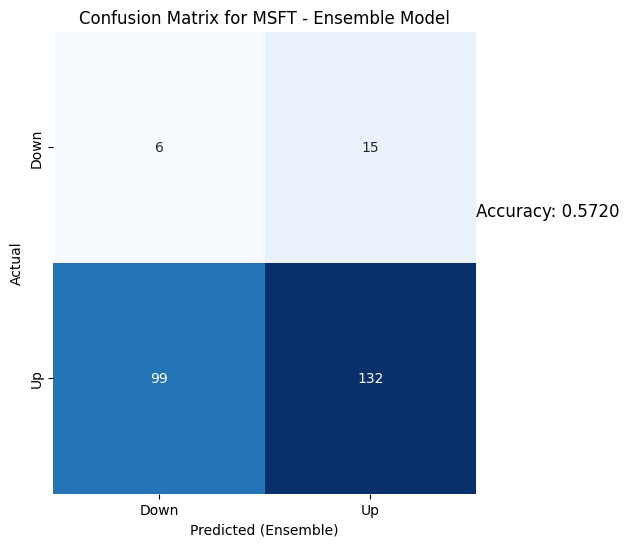

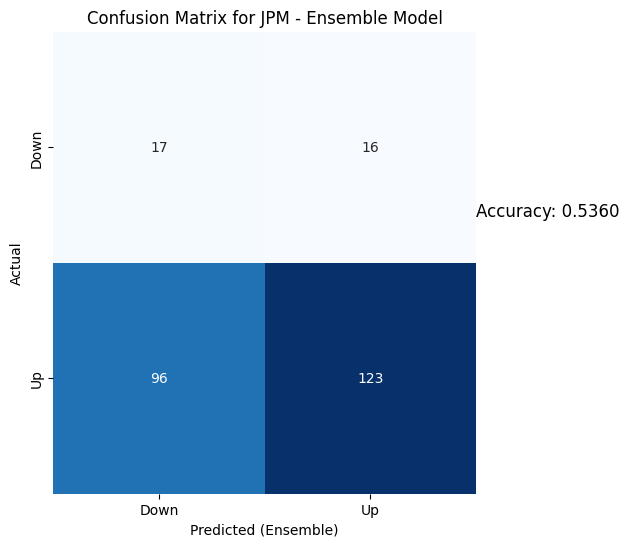

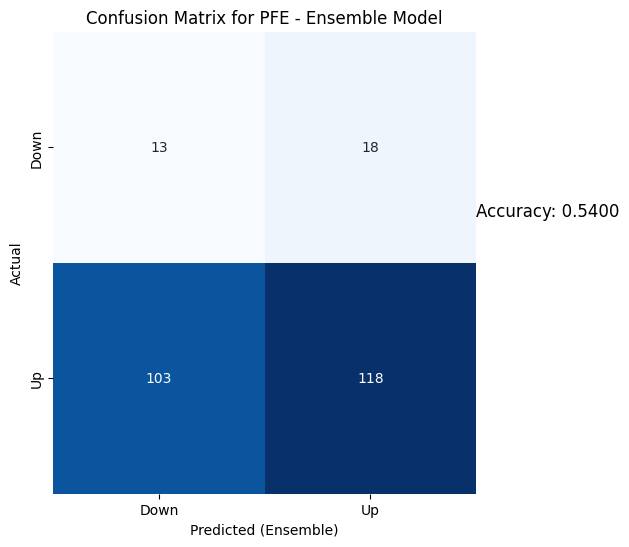

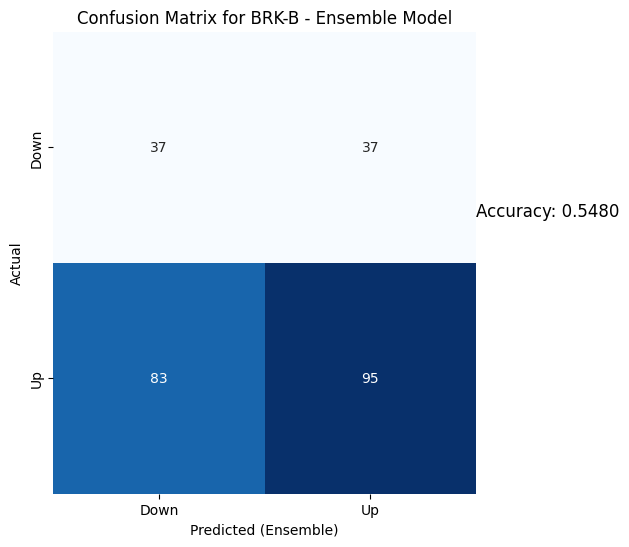

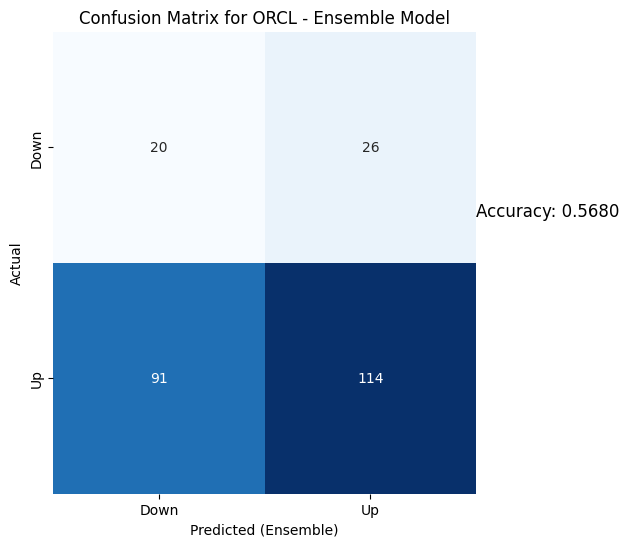

...

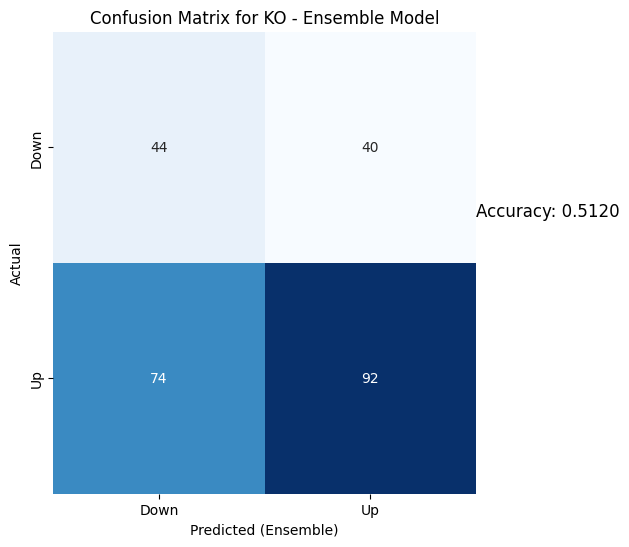

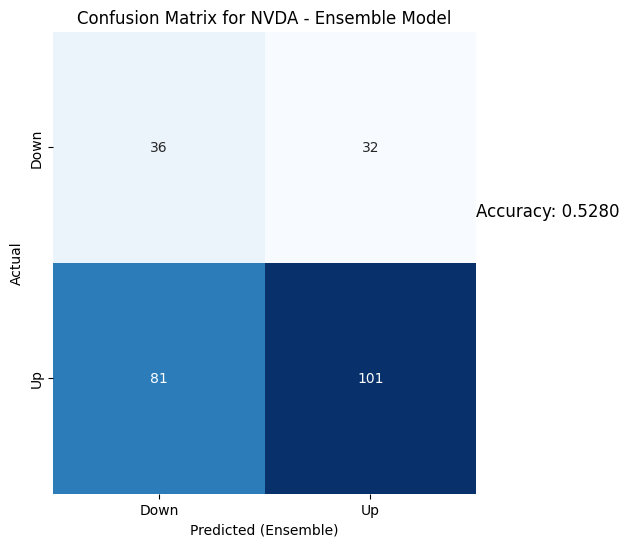

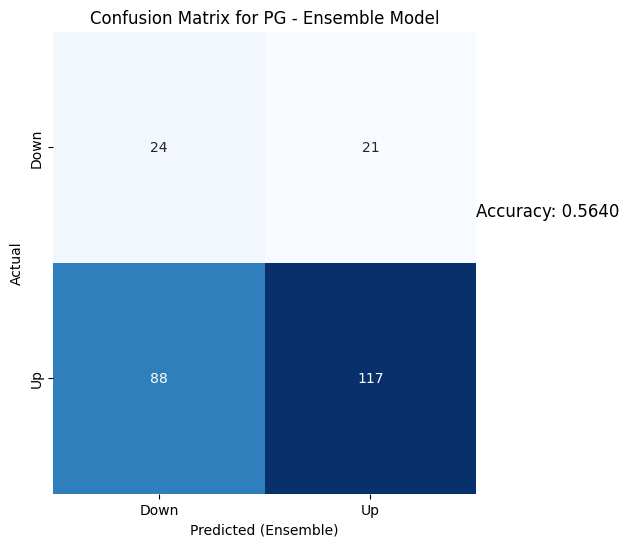

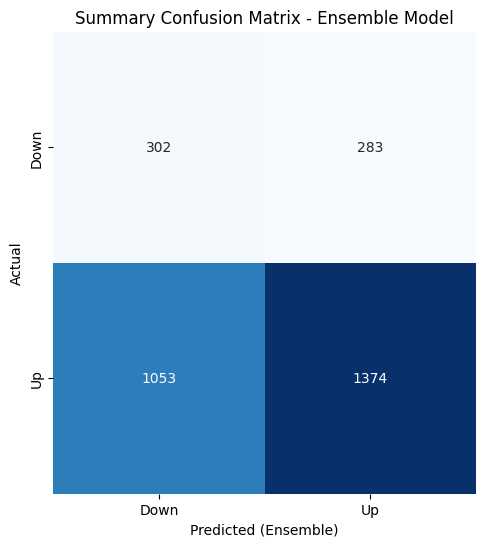

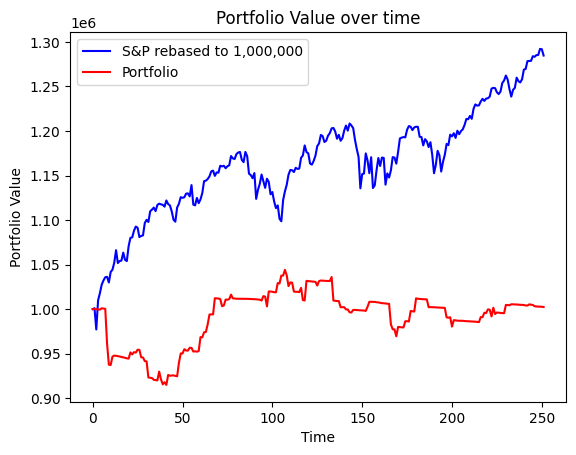

Portfolio return for our period =  100.23717391219023
S&P500 return during the period =  128.4731069640999


In [23]:
Portfolio_construct("2016-01-01")
#Testing for year 2019

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed


C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2263
[LightGBM] [Info] Number of data points in the train set: 753, number of used features: 9
[LightGBM] [Info] Start training from score 0.559097
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5573
LightGBM: 0.5257
GBR: 0.4506
RandomForest: 0.4585
XGBoost: 0.4506
Epoch 1/10
25/25 [==============================] - 6s 60ms/step - loss: 0.6879 - accuracy: 0.5596 - val_loss: 0.6848 - val_accuracy: 0.5707
Epoch 2/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6887 - accuracy: 0.5596 - val_loss: 0.6846 - val_accuracy: 0.5707
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6862 - accuracy: 0.5584 - val_loss: 0.6845 - val_accuracy: 0.5707
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6872 - accuracy: 0.5596 - val_loss: 0.6850 - val_accuracy: 0.5808
Epoch 5/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6860 - accuracy: 0.5584 - val_loss: 0.6848 - val_accuracy: 0.5808
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6853 - accuracy: 0.5609 - val_loss: 0.6849 - val_accuracy: 0.5808
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.4683
LightGBM: 0.4762
GBR: 0.4960
RandomForest: 0.4722
XGBoost: 0.5119
Epoch 1/10
25/25 [==============================] - 5s 56ms/step - loss: 0.7001 - accuracy: 0.4772 - val_loss: 0.6954 - val_accuracy: 0.5076
Epoch 2/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6961 - accuracy: 0.4886 - val_loss: 0.6951 - val_accuracy: 0.5076
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6941 - accuracy: 0.4924 - val_loss: 0.6946 - val_accuracy: 0.5076
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6938 - accuracy: 0.5000 - val_loss: 0.6945 - val_accuracy: 0.4721
Epoch 5/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6937 - accuracy: 0.5063 - val_loss: 0.6946 - val_accuracy: 0.4264
Epoch 6/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6931 - accuracy: 0.5025 - val_loss: 0.6941 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4921
LightGBM: 0.4484
GBR: 0.5278
RandomForest: 0.4683
XGBoost: 0.5397
Epoch 1/10
25/25 [==============================] - 3s 25ms/step - loss: 0.6956 - accuracy: 0.4994 - val_loss: 0.6893 - val_accuracy: 0.5381
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6930 - accuracy: 0.5273 - val_loss: 0.6888 - val_accuracy: 0.5482
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6915 - accuracy: 0.5299 - val_loss: 0.6878 - val_accuracy: 0.5381
Epoch 4/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6912 - accuracy: 0.5299 - val_loss: 0.6898 - val_accuracy: 0.5431
Epoch 5/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6920 - accuracy: 0.5273 - val_loss: 0.6878 - val_accuracy: 0.5431
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6926 - accuracy: 0.5222 - val_loss: 0.6877 - val_accuracy: 0.5381
Epoch 7/10
25/25 [==============================] - 0s 11m

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for BRK-B:
Accuracies for BRK-B:
Accuracies for BRK-B:
SVR: 0.5278
LightGBM: 0.5397
GBR: 0.5516
RandomForest: 0.5317
XGBoost: 0.5238


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 29ms/step - loss: 0.6949 - accuracy: 0.5000 - val_loss: 0.6866 - val_accuracy: 0.5635
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6938 - accuracy: 0.5102 - val_loss: 0.6915 - val_accuracy: 0.5127
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5280 - val_loss: 0.6909 - val_accuracy: 0.5127
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6928 - accuracy: 0.5165 - val_loss: 0.6877 - val_accuracy: 0.5685
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6933 - accuracy: 0.5293 - val_loss: 0.6889 - val_accuracy: 0.5787
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6916 - accuracy: 0.5305 - val_loss: 0.6891 - val_accuracy: 0.5888
Epoch 7/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6906 - accuracy: 0.5280 - val_loss: 0.6862 - val_accuracy: 0.5888
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for ORCL:
Accuracies for ORCL:
Accuracies for ORCL:
SVR: 0.5437
LightGBM: 0.5556
GBR: 0.5397
RandomForest: 0.5079
XGBoost: 0.5357


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 25ms/step - loss: 0.6977 - accuracy: 0.5121 - val_loss: 0.6876 - val_accuracy: 0.5533
Epoch 2/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6905 - accuracy: 0.5452 - val_loss: 0.6914 - val_accuracy: 0.5838
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6922 - accuracy: 0.5414 - val_loss: 0.6864 - val_accuracy: 0.5533
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6929 - accuracy: 0.5083 - val_loss: 0.6902 - val_accuracy: 0.5330
Epoch 5/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6878 - accuracy: 0.5427 - val_loss: 0.6864 - val_accuracy: 0.5533
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6887 - accuracy: 0.5439 - val_loss: 0.6898 - val_accuracy: 0.5533
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6906 - accuracy: 0.5439 - val_loss: 0.6882 - val_accuracy: 0.5482
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for AAPL:
Accuracies for AAPL:
Accuracies for AAPL:
SVR: 0.5378
LightGBM: 0.5458
GBR: 0.5458
RandomForest: 0.5618
XGBoost: 0.5378


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.6988 - accuracy: 0.5319 - val_loss: 0.6878 - val_accuracy: 0.5635
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6921 - accuracy: 0.5408 - val_loss: 0.6873 - val_accuracy: 0.5635
Epoch 3/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6909 - accuracy: 0.5408 - val_loss: 0.6859 - val_accuracy: 0.5635
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6902 - accuracy: 0.5408 - val_loss: 0.6872 - val_accuracy: 0.5635
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6900 - accuracy: 0.5408 - val_loss: 0.6897 - val_accuracy: 0.5482
Epoch 6/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6898 - accuracy: 0.5408 - val_loss: 0.6891 - val_accuracy: 0.5584
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6900 - accuracy: 0.5421 - val_loss: 0.6948 - val_accuracy: 0.5228
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for IBM:
Accuracies for IBM:
Accuracies for IBM:
SVR: 0.4940
LightGBM: 0.5259
GBR: 0.5100
RandomForest: 0.5259
XGBoost: 0.4940


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 27ms/step - loss: 0.6944 - accuracy: 0.4821 - val_loss: 0.6930 - val_accuracy: 0.5000
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6914 - accuracy: 0.5153 - val_loss: 0.6918 - val_accuracy: 0.5051
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6931 - accuracy: 0.5344 - val_loss: 0.6922 - val_accuracy: 0.5153
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6958 - accuracy: 0.5064 - val_loss: 0.6914 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6921 - accuracy: 0.5319 - val_loss: 0.6914 - val_accuracy: 0.5153
Epoch 6/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6928 - accuracy: 0.4987 - val_loss: 0.6914 - val_accuracy: 0.5153
Epoch 7/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6908 - accuracy: 0.5395 - val_loss: 0.6912 - val_accuracy: 0.5153
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for VZ:
Accuracies for VZ:
Accuracies for VZ:
SVR: 0.5060
LightGBM: 0.5299
GBR: 0.5697
RandomForest: 0.5538
XGBoost: 0.5498


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.6974 - accuracy: 0.5032 - val_loss: 0.6932 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5134 - val_loss: 0.7007 - val_accuracy: 0.4898
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6935 - accuracy: 0.5223 - val_loss: 0.6955 - val_accuracy: 0.4898
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6924 - accuracy: 0.5223 - val_loss: 0.6956 - val_accuracy: 0.4898
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6921 - accuracy: 0.5236 - val_loss: 0.6943 - val_accuracy: 0.4949
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6921 - accuracy: 0.5287 - val_loss: 0.6951 - val_accuracy: 0.4847
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6921 - accuracy: 0.5275 - val_loss: 0.6949 - val_accuracy: 0.5000
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for BAC:
Accuracies for BAC:
Accuracies for BAC:
SVR: 0.4701
LightGBM: 0.5219
GBR: 0.5020
RandomForest: 0.5060
XGBoost: 0.5060


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.6977 - accuracy: 0.4744 - val_loss: 0.6918 - val_accuracy: 0.5306
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6966 - accuracy: 0.4936 - val_loss: 0.6917 - val_accuracy: 0.5357
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6939 - accuracy: 0.5038 - val_loss: 0.6923 - val_accuracy: 0.5255
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6952 - accuracy: 0.4936 - val_loss: 0.6911 - val_accuracy: 0.5357
Epoch 5/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6953 - accuracy: 0.4808 - val_loss: 0.6918 - val_accuracy: 0.5357
Epoch 6/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6931 - accuracy: 0.5051 - val_loss: 0.6909 - val_accuracy: 0.5357
Epoch 7/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6959 - accuracy: 0.4668 - val_loss: 0.6910 - val_accuracy: 0.5357
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for KO:
Accuracies for KO:
Accuracies for KO:
SVR: 0.5160
LightGBM: 0.4880
GBR: 0.5040
RandomForest: 0.4800
XGBoost: 0.5280


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 28ms/step - loss: 0.6933 - accuracy: 0.5275 - val_loss: 0.6950 - val_accuracy: 0.4592
Epoch 2/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6917 - accuracy: 0.5211 - val_loss: 0.6954 - val_accuracy: 0.4847
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6920 - accuracy: 0.5301 - val_loss: 0.6943 - val_accuracy: 0.5051
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6915 - accuracy: 0.5339 - val_loss: 0.6943 - val_accuracy: 0.4847
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6914 - accuracy: 0.5301 - val_loss: 0.6941 - val_accuracy: 0.4898
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6908 - accuracy: 0.5365 - val_loss: 0.6939 - val_accuracy: 0.4694
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6927 - accuracy: 0.5301 - val_loss: 0.6939 - val_accuracy: 0.5051
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for NVDA:
Accuracies for NVDA:
Accuracies for NVDA:
SVR: 0.5840
LightGBM: 0.5240
GBR: 0.5920
RandomForest: 0.5160
XGBoost: 0.5400


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 23ms/step - loss: 0.6920 - accuracy: 0.5244 - val_loss: 0.7002 - val_accuracy: 0.4490
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6916 - accuracy: 0.5308 - val_loss: 0.7015 - val_accuracy: 0.4337
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6934 - accuracy: 0.5154 - val_loss: 0.6980 - val_accuracy: 0.4694
Epoch 4/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6915 - accuracy: 0.5333 - val_loss: 0.6935 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6903 - accuracy: 0.5385 - val_loss: 0.6945 - val_accuracy: 0.5255
Epoch 6/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6890 - accuracy: 0.5385 - val_loss: 0.6932 - val_accuracy: 0.5204
Epoch 7/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6888 - accuracy: 0.5397 - val_loss: 0.7065 - val_accuracy: 0.4388
Epoch 8/10
25/25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for PG:
Accuracies for PG:
Accuracies for PG:
SVR: 0.5400
LightGBM: 0.4920
GBR: 0.4600
RandomForest: 0.4760
XGBoost: 0.4760


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 24ms/step - loss: 0.6924 - accuracy: 0.5333 - val_loss: 0.6986 - val_accuracy: 0.5231
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6916 - accuracy: 0.5090 - val_loss: 0.6993 - val_accuracy: 0.5231
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6903 - accuracy: 0.5321 - val_loss: 0.7004 - val_accuracy: 0.5231
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6905 - accuracy: 0.5333 - val_loss: 0.6975 - val_accuracy: 0.5231
Epoch 5/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6907 - accuracy: 0.5295 - val_loss: 0.6990 - val_accuracy: 0.5231
Epoch 6/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6919 - accuracy: 0.5346 - val_loss: 0.6973 - val_accuracy: 0.5231
Epoch 7/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6913 - accuracy: 0.5115 - val_loss: 0.6964 - val_accuracy: 0.5231
Epoch 8/10
25/

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2749 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'KO', 'PG']
BAC bought at  35.11000061035156  and sold at  34.95000076293945
KO bought at  53.90999984741211  and sold at  54.31999969482422
PG bought at  124.01000213623047  and sold at  124.91999816894531
125.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2750 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  125.36000061035156  and sold at  124.9000015258789
54.709999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2751 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.709999084472656  and sold at  55.02000045776367
55.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2752 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  55.02000045776367  and sold at  55.349998474121094
55.27000045776367
58.08000183105469
124.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2753 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA', 'PG']
KO bought at  55.27000045776367  and sold at  55.349998474121094
NVDA bought at  58.08000183105469  and sold at  58.82500076293945
PG bought at  124.47000122070312  and sold at  124.9000015258789
53.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2754 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  53.95000076293945  and sold at  53.7599983215332
54.689998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2755 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.689998626708984  and sold at  54.66999816894531
54.15999984741211
59.599998474121094
54.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2756 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'VZ', 'KO']
ORCL bought at  54.15999984741211  and sold at  54.130001068115234
VZ bought at  59.599998474121094  and sold at  59.709999084472656
KO bought at  54.25  and sold at  54.349998474121094
75.79750061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2757 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  75.79750061035156  and sold at  77.40750122070312
60.755001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2758 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  60.755001068115234  and sold at  61.08000183105469
61.08000183105469
123.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2759 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  61.08000183105469  and sold at  62.994998931884766
PG bought at  123.97000122070312  and sold at  124.87999725341797
130.5927276611328
62.994998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2760 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  130.5927276611328  and sold at  129.84703063964844
NVDA bought at  62.994998931884766  and sold at  61.81999969482422
124.69000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2761 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  124.69000244140625  and sold at  125.95999908447266
61.39250183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2762 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  61.39250183105469  and sold at  62.23249816894531
62.23249816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2763 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  62.23249816894531  and sold at  62.31999969482422
60.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2764 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  60.130001068115234  and sold at  60.31999969482422
55.220001220703125
57.16999816894531
61.98500061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2765 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'NVDA']
ORCL bought at  55.220001220703125  and sold at  54.720001220703125
KO bought at  57.16999816894531  and sold at  57.61000061035156
NVDA bought at  61.98500061035156  and sold at  62.52750015258789
229.5399932861328
54.720001220703125
60.47999954223633
62.52750015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2766 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'VZ', 'NVDA']
BRK-B bought at  229.5399932861328  and sold at  229.3800048828125
ORCL bought at  54.720001220703125  and sold at  54.97999954223633
VZ bought at  60.47999954223633  and sold at  60.5099983215332
NVDA bought at  62.52750015258789  and sold at  63.21500015258789
136.58700561523438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2767 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  136.58700561523438  and sold at  134.3785858154297
62.619998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2768 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  62.619998931884766  and sold at  60.04999923706055
77.23750305175781
60.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2769 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  77.23750305175781  and sold at  79.42250061035156
NVDA bought at  60.04999923706055  and sold at  61.99250030517578
79.42250061035156
33.2400016784668
61.99250030517578
126.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2770 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'NVDA', 'PG']
AAPL bought at  79.42250061035156  and sold at  81.08499908447266
BAC bought at  33.2400016784668  and sold at  33.0099983215332
NVDA bought at  61.99250030517578  and sold at  61.3849983215332
PG bought at  126.02999877929688  and sold at  125.05999755859375
81.08499908447266
33.0099983215332
61.3849983215332
125.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2771 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC', 'NVDA', 'PG']
AAPL bought at  81.08499908447266  and sold at  80.96749877929688
BAC bought at  33.0099983215332  and sold at  33.47999954223633
NVDA bought at  61.3849983215332  and sold at  61.45249938964844
PG bought at  125.05999755859375  and sold at  125.94999694824219
80.96749877929688
61.45249938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2772 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  80.96749877929688  and sold at  77.37750244140625
NVDA bought at  61.45249938964844  and sold at  59.10749816894531
59.439998626708984
124.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2773 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'PG']
VZ bought at  59.439998626708984  and sold at  58.04999923706055
PG bought at  124.62000274658203  and sold at  125.11000061035156
60.08250045776367
125.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2774 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  60.08250045776367  and sold at  61.782501220703125
PG bought at  125.11000061035156  and sold at  125.66000366210938
33.619998931884766
61.782501220703125
125.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2775 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'NVDA', 'PG']
BAC bought at  33.619998931884766  and sold at  34.709999084472656
NVDA bought at  61.782501220703125  and sold at  62.689998626708984
PG bought at  125.66000366210938  and sold at  126.80999755859375
179.89999389648438
80.36250305175781
34.709999084472656
62.689998626708984
126.80999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2776 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'BAC', 'NVDA', 'PG']
MSFT bought at  179.89999389648438  and sold at  183.6300048828125
AAPL bought at  80.36250305175781  and sold at  81.30249786376953
BAC bought at  34.709999084472656  and sold at  34.66999816894531
NVDA bought at  62.689998626708984  and sold at  63.5625
PG bought at  126.80999755859375  and sold at  127.13999938964844
183.6300048828125
127.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2777 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  183.6300048828125  and sold at  183.88999938964844
PG bought at  127.13999938964844  and sold at  126.08000183105469
80.00749969482422
59.939998626708984
34.61000061035156
126.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2778 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'BAC', 'PG']
AAPL bought at  80.00749969482422  and sold at  80.38749694824219
VZ bought at  59.939998626708984  and sold at  60.2400016784668
BAC bought at  34.61000061035156  and sold at  34.689998626708984
PG bought at  126.08000183105469  and sold at  126.16999816894531
188.6999969482422
60.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2779 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  188.6999969482422  and sold at  184.44000244140625
VZ bought at  60.2400016784668  and sold at  58.689998626708984
184.44000244140625
55.150001525878906
79.90249633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2780 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  184.44000244140625  and sold at  184.7100067138672
ORCL bought at  55.150001525878906  and sold at  55.72999954223633
AAPL bought at  79.90249633789062  and sold at  81.80000305175781
55.72999954223633
81.80000305175781
58.22999954223633
34.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2781 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'VZ', 'BAC']
ORCL bought at  55.72999954223633  and sold at  55.310001373291016
AAPL bought at  81.80000305175781  and sold at  81.21749877929688
VZ bought at  58.22999954223633  and sold at  58.650001525878906
BAC bought at  34.91999816894531  and sold at  34.90999984741211
183.7100067138672
226.47000122070312
124.95999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2782 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'PG']
MSFT bought at  183.7100067138672  and sold at  185.35000610351562
BRK-B bought at  226.47000122070312  and sold at  226.8000030517578
PG bought at  124.95999908447266  and sold at  126.13999938964844
55.470001220703125
34.849998474121094
126.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2783 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'PG']
ORCL bought at  55.470001220703125  and sold at  55.45000076293945
BAC bought at  34.849998474121094  and sold at  34.27000045776367
PG bought at  126.13999938964844  and sold at  124.87000274658203
55.45000076293945
59.529998779296875
124.87000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2784 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'PG']
ORCL bought at  55.45000076293945  and sold at  55.439998626708984
KO bought at  59.529998779296875  and sold at  59.77000045776367
PG bought at  124.87000274658203  and sold at  125.44000244140625
187.27999877929688
58.220001220703125
125.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2785 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'PG']
MSFT bought at  187.27999877929688  and sold at  184.4199981689453
VZ bought at  58.220001220703125  and sold at  58.09000015258789
PG bought at  125.44000244140625  and sold at  126.58000183105469
184.4199981689453
55.5099983215332
77.17500305175781
126.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2786 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'NVDA', 'PG']
MSFT bought at  184.4199981689453  and sold at  178.58999633789062
ORCL bought at  55.5099983215332  and sold at  54.68000030517578
NVDA bought at  77.17500305175781  and sold at  73.51750183105469
PG bought at  126.58000183105469  and sold at  126.69999694824219
60.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2787 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.130001068115234  and sold at  58.650001525878906
52.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2788 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  52.650001525878906  and sold at  50.959999084472656
168.07000732421875
218.0500030517578
50.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2789 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'ORCL']
MSFT bought at  168.07000732421875  and sold at  170.1699981689453
BRK-B bought at  218.0500030517578  and sold at  216.05999755859375
ORCL bought at  50.959999084472656  and sold at  52.04999923706055
170.1699981689453
52.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2790 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  170.1699981689453  and sold at  158.17999267578125
ORCL bought at  52.04999923706055  and sold at  50.779998779296875
158.17999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2791 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  158.17999267578125  and sold at  162.00999450683594
206.33999633789062
49.459999084472656
67.51750183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2792 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'NVDA']
BRK-B bought at  206.33999633789062  and sold at  217.6300048828125
ORCL bought at  49.459999084472656  and sold at  50.900001525878906
NVDA bought at  67.51750183105469  and sold at  69.10749816894531
172.7899932861328
50.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2793 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  172.7899932861328  and sold at  164.50999450683594
ORCL bought at  50.900001525878906  and sold at  48.849998474121094
164.50999450683594
72.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2794 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  164.50999450683594  and sold at  170.5500030517578
AAPL bought at  72.33000183105469  and sold at  75.68499755859375
170.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2795 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  170.5500030517578  and sold at  166.27000427246094
68.32250213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2796 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  68.32250213623047  and sold at  66.51000213623047
150.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2797 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  150.6199951171875  and sold at  160.9199981689453
202.72999572753906
65.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2798 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  202.72999572753906  and sold at  194.63999938964844
NVDA bought at  65.2699966430664  and sold at  61.61750030517578
153.6300048828125
44.720001220703125
52.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2799 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'KO']
MSFT bought at  153.6300048828125  and sold at  139.05999755859375
ORCL bought at  44.720001220703125  and sold at  39.79999923706055
KO bought at  52.209999084472656  and sold at  47.15999984741211
175.97000122070312
39.79999923706055
54.07749938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2800 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'NVDA']
BRK-B bought at  175.97000122070312  and sold at  196.39999389648438
ORCL bought at  39.79999923706055  and sold at  47.93000030517578
NVDA bought at  54.07749938964844  and sold at  60.209999084472656
47.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2801 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  47.93000030517578  and sold at  42.720001220703125
177.77000427246094
45.2599983215332
49.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2802 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA']
BRK-B bought at  177.77000427246094  and sold at  187.60000610351562
KO bought at  45.2599983215332  and sold at  47.18000030517578
NVDA bought at  49.099998474121094  and sold at  54.317501068115234
30.5123348236084
46.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2803 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  30.5123348236084  and sold at  30.70208740234375
ORCL bought at  46.86000061035156  and sold at  47.27000045776367
30.70208740234375
172.44000244140625
50.70500183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2804 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'NVDA']
PFE bought at  30.70208740234375  and sold at  28.861480712890625
BRK-B bought at  172.44000244140625  and sold at  174.67999267578125
NVDA bought at  50.70500183105469  and sold at  53.24250030517578
174.67999267578125
45.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2805 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  174.67999267578125  and sold at  170.05999755859375
ORCL bought at  45.06999969482422  and sold at  45.650001525878906
162.1300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2806 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  162.1300048828125  and sold at  178.1999969482422
39.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2807 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  39.45000076293945  and sold at  41.61000061035156
50.47999954223633
44.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2808 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  50.47999954223633  and sold at  49.83000183105469
KO bought at  44.290000915527344  and sold at  42.810001373291016
42.810001373291016
63.182498931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2809 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  42.810001373291016  and sold at  45.0
NVDA bought at  63.182498931884766  and sold at  66.39749908447266
160.22999572753906
183.17999267578125
22.040000915527344
66.39749908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2810 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'BAC', 'NVDA']
MSFT bought at  160.22999572753906  and sold at  157.7100067138672
BRK-B bought at  183.17999267578125  and sold at  182.8300018310547
BAC bought at  22.040000915527344  and sold at  21.229999542236328
NVDA bought at  66.39749908447266  and sold at  65.9000015258789
48.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2811 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  48.33000183105469  and sold at  48.709999084472656
175.9499969482422
60.76750183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2812 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  175.9499969482422  and sold at  179.72999572753906
NVDA bought at  60.76750183105469  and sold at  63.86750030517578
43.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2813 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  43.95000076293945  and sold at  43.83000183105469
60.977500915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2814 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  60.977500915527344  and sold at  67.0999984741211
185.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2815 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  185.24000549316406  and sold at  185.25
52.130001068115234
66.73750305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2816 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  52.130001068115234  and sold at  53.18000030517578
NVDA bought at  66.73750305175781  and sold at  65.73750305175781
188.77000427246094
52.970001220703125
115.82218170166016
67.4625015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2817 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'IBM', 'NVDA']
BRK-B bought at  188.77000427246094  and sold at  192.94000244140625
ORCL bought at  52.970001220703125  and sold at  54.0
IBM bought at  115.82218170166016  and sold at  118.46080017089844
NVDA bought at  67.4625015258789  and sold at  70.98750305175781
192.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2818 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  192.94000244140625  and sold at  188.57000732421875
188.57000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2819 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  188.57000732421875  and sold at  187.9600067138672
177.0399932861328
73.67500305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2820 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  177.0399932861328  and sold at  178.60000610351562
NVDA bought at  73.67500305175781  and sold at  73.08000183105469
191.1999969482422
70.69999694824219
23.280000686645508
73.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2821 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'BAC', 'NVDA']
BRK-B bought at  191.1999969482422  and sold at  188.75
AAPL bought at  70.69999694824219  and sold at  69.23249816894531
BAC bought at  23.280000686645508  and sold at  22.5
NVDA bought at  73.08000183105469  and sold at  71.76249694824219
188.75
53.90999984741211
22.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2822 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'BAC']
BRK-B bought at  188.75  and sold at  183.47999572753906
ORCL bought at  53.90999984741211  and sold at  51.310001373291016
BAC bought at  22.5  and sold at  21.639999389648438
183.47999572753906
67.37750244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2823 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  183.47999572753906  and sold at  186.5800018310547
NVDA bought at  67.37750244140625  and sold at  71.5374984741211
186.5800018310547
21.799999237060547
71.5374984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2824 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC', 'NVDA']
BRK-B bought at  186.5800018310547  and sold at  185.6300048828125
BAC bought at  21.799999237060547  and sold at  21.8700008392334
NVDA bought at  71.5374984741211  and sold at  71.00250244140625
185.6300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2825 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  185.6300048828125  and sold at  186.52000427246094
72.39749908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2826 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  72.39749908447266  and sold at  74.2699966430664
72.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2827 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  72.83999633789062  and sold at  74.61499786376953
189.61000061035156
47.119998931884766
74.61499786376953
117.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2828 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA', 'PG']
BRK-B bought at  189.61000061035156  and sold at  187.36000061035156
KO bought at  47.119998931884766  and sold at  45.88999938964844
NVDA bought at  74.61499786376953  and sold at  73.06999969482422
PG bought at  117.08000183105469  and sold at  117.87000274658203
187.36000061035156
57.45000076293945
73.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2829 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'NVDA']
BRK-B bought at  187.36000061035156  and sold at  182.6699981689453
VZ bought at  57.45000076293945  and sold at  56.83000183105469
NVDA bought at  73.06999969482422  and sold at  70.69499969482422
51.790000915527344
23.079999923706055
45.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2830 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'KO']
ORCL bought at  51.790000915527344  and sold at  51.75
BAC bought at  23.079999923706055  and sold at  22.93000030517578
KO bought at  45.599998474121094  and sold at  45.13999938964844
177.9499969482422
72.82250213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2831 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'NVDA']
BRK-B bought at  177.9499969482422  and sold at  176.02999877929688
NVDA bought at  72.82250213623047  and sold at  73.43499755859375
180.75999450683594
56.5099983215332
73.43499755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2832 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'NVDA']
MSFT bought at  180.75999450683594  and sold at  182.5399932861328
VZ bought at  56.5099983215332  and sold at  55.63999938964844
NVDA bought at  73.43499755859375  and sold at  74.44750213623047
182.5399932861328
44.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2833 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  182.5399932861328  and sold at  183.60000610351562
KO bought at  44.75  and sold at  44.599998474121094
55.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2834 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  55.58000183105469  and sold at  57.0
184.67999267578125
57.0
46.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2835 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO']
MSFT bought at  184.67999267578125  and sold at  186.74000549316406
VZ bought at  57.0  and sold at  56.400001525878906
KO bought at  46.11000061035156  and sold at  45.540000915527344
174.63999938964844
22.579999923706055
45.540000915527344
80.65499877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2836 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC', 'KO', 'NVDA']
BRK-B bought at  174.63999938964844  and sold at  172.80999755859375
BAC bought at  22.579999923706055  and sold at  21.8700008392334
KO bought at  45.540000915527344  and sold at  44.81999969482422
NVDA bought at  80.65499877929688  and sold at  78.0250015258789
179.75
20.8700008392334


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2837 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  179.75  and sold at  180.52999877929688
BAC bought at  20.8700008392334  and sold at  21.709999084472656
54.90999984741211
43.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2838 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  54.90999984741211  and sold at  54.709999084472656
KO bought at  43.70000076293945  and sold at  43.2599983215332
21.440000534057617


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2839 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  21.440000534057617  and sold at  22.93000030517578
22.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2840 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  22.93000030517578  and sold at  22.209999084472656
183.6300048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2841 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  183.6300048828125  and sold at  185.66000366210938
185.66000366210938
79.80750274658203
45.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2842 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO']
MSFT bought at  185.66000366210938  and sold at  183.42999267578125
AAPL bought at  79.80750274658203  and sold at  79.2125015258789
KO bought at  45.88999938964844  and sold at  45.16999816894531
183.50999450683594
52.619998931884766
54.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2843 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'VZ']
MSFT bought at  183.50999450683594  and sold at  181.57000732421875
ORCL bought at  52.619998931884766  and sold at  52.779998779296875
VZ bought at  54.099998474121094  and sold at  54.29999923706055
180.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2844 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  180.33999633789062  and sold at  185.77000427246094
79.52749633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2845 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  79.52749633789062  and sold at  79.5625
182.8300018310547
53.060001373291016
88.0625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2846 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'NVDA']
MSFT bought at  182.8300018310547  and sold at  184.91000366210938
ORCL bought at  53.060001373291016  and sold at  53.279998779296875
NVDA bought at  88.0625  and sold at  88.25250244140625
88.25250244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2847 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  88.25250244140625  and sold at  87.69499969482422
182.9199981689453
80.58000183105469
87.66500091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2848 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  182.9199981689453  and sold at  187.1999969482422
AAPL bought at  80.58000183105469  and sold at  82.875
NVDA bought at  87.66500091552734  and sold at  89.19999694824219
53.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2849 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  53.97999954223633  and sold at  55.099998474121094
188.36000061035156
58.09000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2850 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  188.36000061035156  and sold at  189.8000030517578
VZ bought at  58.09000015258789  and sold at  57.86000061035156
186.27000427246094
178.02000427246094
83.9749984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2851 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'AAPL']
MSFT bought at  186.27000427246094  and sold at  187.74000549316406
BRK-B bought at  178.02000427246094  and sold at  181.2100067138672
AAPL bought at  83.9749984741211  and sold at  84.69999694824219
187.74000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2852 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  187.74000549316406  and sold at  188.94000244140625
181.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2853 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  181.5500030517578  and sold at  182.3000030517578
88.0199966430664
90.68499755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2854 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  88.0199966430664  and sold at  87.89749908447266
NVDA bought at  90.68499755859375  and sold at  92.36000061035156
56.650001525878906
46.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2855 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  56.650001525878906  and sold at  56.88999938964844
KO bought at  46.58000183105469  and sold at  46.9900016784668
180.72999572753906
87.93250274658203
56.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2856 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'AAPL', 'VZ']
BRK-B bought at  180.72999572753906  and sold at  179.72000122070312
AAPL bought at  87.93250274658203  and sold at  87.43000030517578
VZ bought at  56.88999938964844  and sold at  56.15999984741211
195.14999389648438
179.72000122070312
92.61250305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2857 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'NVDA']
MSFT bought at  195.14999389648438  and sold at  200.57000732421875
BRK-B bought at  179.72000122070312  and sold at  180.1699981689453
NVDA bought at  92.61250305175781  and sold at  95.26750183105469
89.71749877929688
95.26750183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2858 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  89.71749877929688  and sold at  91.63249969482422
NVDA bought at  95.26750183105469  and sold at  94.5
45.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2859 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.63999938964844  and sold at  44.650001525878906
90.01499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2860 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  90.01499938964844  and sold at  91.20999908447266
88.40750122070312
43.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2861 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  88.40750122070312  and sold at  90.44499969482422
KO bought at  43.56999969482422  and sold at  44.36000061035156
44.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2862 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.36000061035156  and sold at  44.68000030517578
44.68000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2863 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  44.68000030517578  and sold at  44.81999969482422
54.66999816894531
44.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2864 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  54.66999816894531  and sold at  54.790000915527344
KO bought at  44.81999969482422  and sold at  44.880001068115234
206.25999450683594
44.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2865 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  206.25999450683594  and sold at  210.6999969482422
KO bought at  44.880001068115234  and sold at  45.22999954223633
55.2400016784668
45.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2866 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  55.2400016784668  and sold at  55.040000915527344
KO bought at  45.22999954223633  and sold at  45.209999084472656
45.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2867 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  45.150001525878906  and sold at  45.25
113.95793151855469
100.52249908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2868 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'NVDA']
IBM bought at  113.95793151855469  and sold at  115.2963638305664
NVDA bought at  100.52249908447266  and sold at  103.7699966430664
103.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2869 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  103.7699966430664  and sold at  102.27249908447266
55.060001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2870 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  55.060001373291016  and sold at  55.779998779296875
96.52249908447266
46.150001525878906
101.34750366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2871 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO', 'NVDA']
AAPL bought at  96.52249908447266  and sold at  96.32749938964844
KO bought at  46.150001525878906  and sold at  46.81999969482422
NVDA bought at  101.34750366210938  and sold at  102.01499938964844
96.32749938964844
102.01499938964844
125.62999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2872 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA', 'PG']
AAPL bought at  96.32749938964844  and sold at  98.35749816894531
NVDA bought at  102.01499938964844  and sold at  105.10749816894531
PG bought at  125.62999725341797  and sold at  125.23999786376953
208.75
97.0
103.28500366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2873 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  208.75  and sold at  211.75
AAPL bought at  97.0  and sold at  97.27249908447266
NVDA bought at  103.28500366210938  and sold at  104.38749694824219
192.10000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2874 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  192.10000610351562  and sold at  193.25
101.29750061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2875 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  101.29750061035156  and sold at  101.94499969482422
201.3000030517578
101.94499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2876 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  201.3000030517578  and sold at  203.85000610351562
NVDA bought at  101.94499969482422  and sold at  104.21499633789062
104.21499633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2877 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  104.21499633789062  and sold at  102.15499877929688
102.15499877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2878 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  102.15499877929688  and sold at  104.65499877929688
196.41000366210938
57.45000076293945
104.65499877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2879 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'NVDA']
BRK-B bought at  196.41000366210938  and sold at  194.3000030517578
VZ bought at  57.45000076293945  and sold at  57.29999923706055
NVDA bought at  104.65499877929688  and sold at  106.13999938964844
106.14749908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2880 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  106.14749908447266  and sold at  110.10250091552734
110.10250091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2881 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  110.10250091552734  and sold at  112.27749633789062
55.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2882 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  55.5  and sold at  55.279998779296875
57.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2883 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  57.83000183105469  and sold at  58.529998779296875
209.47999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2884 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  209.47999572753906  and sold at  212.5800018310547
208.25
58.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2885 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  208.25  and sold at  203.3800048828125
VZ bought at  58.9900016784668  and sold at  58.5099983215332
203.3800048828125
109.375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2886 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  203.3800048828125  and sold at  209.19000244140625
AAPL bought at  109.375  and sold at  113.01000213623047
58.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2887 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  58.599998474121094  and sold at  58.52000045776367
58.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2888 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  58.52000045776367  and sold at  58.790000915527344
58.790000915527344
48.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2889 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'KO']
VZ bought at  58.790000915527344  and sold at  58.779998779296875
KO bought at  48.45000076293945  and sold at  48.209999084472656
210.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2890 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  210.27999877929688  and sold at  211.49000549316406
208.3300018310547
59.18000030517578
48.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2891 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'KO']
BRK-B bought at  208.3300018310547  and sold at  207.2100067138672
VZ bought at  59.18000030517578  and sold at  59.04999923706055
KO bought at  48.41999816894531  and sold at  47.369998931884766
213.02000427246094
58.9900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2892 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ']
MSFT bought at  213.02000427246094  and sold at  213.69000244140625
VZ bought at  58.9900016784668  and sold at  59.56999969482422
59.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2893 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.41999816894531  and sold at  59.459999084472656
25.559999465942383


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2894 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  25.559999465942383  and sold at  26.049999237060547
57.65999984741211
138.2100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2895 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  57.65999984741211  and sold at  59.029998779296875
NVDA bought at  138.2100067138672  and sold at  143.46499633789062
143.46499633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2896 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  143.46499633789062  and sold at  130.15499877929688
130.15499877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2897 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  130.15499877929688  and sold at  126.2249984741211
119.12999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2898 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  119.12999725341797  and sold at  127.1500015258789
127.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2899 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  127.1500015258789  and sold at  123.11750030517578
128.72250366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2900 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  128.72250366210938  and sold at  129.91000366210938
208.77999877929688
129.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2901 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  208.77999877929688  and sold at  205.0500030517578
NVDA bought at  129.91000366210938  and sold at  125.1449966430664
60.369998931884766
125.1449966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2902 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  60.369998931884766  and sold at  60.59000015258789
NVDA bought at  125.1449966430664  and sold at  124.63500213623047
110.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2903 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  110.33999633789062  and sold at  106.83999633789062
50.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2904 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  50.45000076293945  and sold at  49.09000015258789
59.61000061035156
125.17250061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2905 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  59.61000061035156  and sold at  59.81999969482422
NVDA bought at  125.17250061035156  and sold at  126.37750244140625
59.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2906 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.81999969482422  and sold at  58.90999984741211
200.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2907 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  200.58999633789062  and sold at  203.19000244140625
59.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2908 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.38999938964844  and sold at  59.36000061035156
59.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2909 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  59.2400016784668  and sold at  59.4900016784668
210.3800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2910 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  210.3800048828125  and sold at  205.91000366210938
59.61000061035156
139.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2911 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  59.61000061035156  and sold at  59.189998626708984
NVDA bought at  139.63999938964844  and sold at  138.3874969482422
138.3874969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2912 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  138.3874969482422  and sold at  137.62750244140625
116.97000122070312
59.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2913 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ']
AAPL bought at  116.97000122070312  and sold at  124.4000015258789
VZ bought at  59.33000183105469  and sold at  59.54999923706055
59.54999923706055
142.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2914 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  59.54999923706055  and sold at  59.36000061035156
NVDA bought at  142.25999450683594  and sold at  142.4824981689453
121.0999984741211
59.36000061035156
142.4824981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2915 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'VZ', 'NVDA']
AAPL bought at  121.0999984741211  and sold at  121.19000244140625
VZ bought at  59.36000061035156  and sold at  58.43000030517578
NVDA bought at  142.4824981689453  and sold at  140.95249938964844
210.91000366210938
60.959999084472656
140.95249938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2916 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL', 'NVDA']
BRK-B bought at  210.91000366210938  and sold at  211.64999389648438
ORCL bought at  60.959999084472656  and sold at  60.52000045776367
NVDA bought at  140.95249938964844  and sold at  139.6999969482422
211.64999389648438
58.15999984741211
139.6999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2917 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'VZ', 'NVDA']
BRK-B bought at  211.64999389648438  and sold at  211.91000366210938
VZ bought at  58.15999984741211  and sold at  58.04999923706055
NVDA bought at  139.6999969482422  and sold at  138.11500549316406
138.11500549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2918 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  138.11500549316406  and sold at  134.9774932861328
134.9774932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2919 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  134.9774932861328  and sold at  136.4550018310547
57.25
136.4550018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2920 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  57.25  and sold at  56.75
NVDA bought at  136.4550018310547  and sold at  135.24749755859375
56.75
135.24749755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2921 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  56.75  and sold at  57.33000183105469
NVDA bought at  135.24749755859375  and sold at  133.61000061035156
133.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2922 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  133.61000061035156  and sold at  135.90249633789062
216.22999572753906
50.52000045776367
135.90249633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2923 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'NVDA']
MSFT bought at  216.22999572753906  and sold at  210.0800018310547
KO bought at  50.52000045776367  and sold at  49.79999923706055
NVDA bought at  135.90249633789062  and sold at  131.41250610351562
208.49000549316406
49.79999923706055
131.41250610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2924 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'NVDA']
BRK-B bought at  208.49000549316406  and sold at  206.8800048828125
KO bought at  49.79999923706055  and sold at  49.900001525878906
NVDA bought at  131.41250610351562  and sold at  133.96749877929688
213.25
57.380001068115234
49.900001525878906
133.96749877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2925 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'VZ', 'KO', 'NVDA']
MSFT bought at  213.25  and sold at  202.67999267578125
VZ bought at  57.380001068115234  and sold at  56.310001373291016
KO bought at  49.900001525878906  and sold at  47.959999084472656
NVDA bought at  133.96749877929688  and sold at  126.2699966430664
126.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2926 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  126.2699966430664  and sold at  130.24000549316406
130.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2927 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  130.24000549316406  and sold at  125.33999633789062
125.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2928 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  125.33999633789062  and sold at  125.80750274658203
130.19500732421875
141.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2929 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  130.19500732421875  and sold at  137.9425048828125
PG bought at  141.22000122070312  and sold at  140.63999938964844
137.9425048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2930 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  137.9425048828125  and sold at  141.60000610351562
141.60000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2931 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  141.60000610351562  and sold at  145.6199951171875
145.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2932 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  145.6199951171875  and sold at  136.3074951171875
127.69999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2933 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  127.69999694824219  and sold at  134.17999267578125
119.26000213623047
132.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2934 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  119.26000213623047  and sold at  120.30000305175781
NVDA bought at  132.97000122070312  and sold at  135.15249633789062
120.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2935 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  120.30000305175781  and sold at  119.38999938964844
134.28750610351562
139.6999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2936 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  134.28750610351562  and sold at  134.40249633789062
PG bought at  139.6999969482422  and sold at  139.52999877929688
134.40249633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2937 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  134.40249633789062  and sold at  130.87750244140625
130.87750244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2938 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  130.87750244140625  and sold at  131.39999389648438
131.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2939 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  131.39999389648438  and sold at  129.57749938964844
129.57749938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2940 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  129.57749938964844  and sold at  132.34750366210938
116.02999877929688
132.34750366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2941 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'NVDA']
AAPL bought at  116.02999877929688  and sold at  116.58999633789062
NVDA bought at  132.34750366210938  and sold at  132.6125030517578
132.6125030517578
138.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2942 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  132.6125030517578  and sold at  134.01499938964844
PG bought at  138.61000061035156  and sold at  138.8699951171875
134.01499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2943 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  134.01499938964844  and sold at  133.89999389648438
133.89999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2944 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  133.89999389648438  and sold at  135.44500732421875
135.44500732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2945 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  135.44500732421875  and sold at  133.9600067138672
214.24000549316406
133.9600067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2946 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'NVDA']
MSFT bought at  214.24000549316406  and sold at  214.36000061035156
NVDA bought at  133.9600067138672  and sold at  135.58250427246094
135.58250427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2947 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  135.58250427246094  and sold at  136.0675048828125
136.0675048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2948 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  136.0675048828125  and sold at  133.5
133.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2949 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  133.5  and sold at  129.3074951171875
129.3074951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2950 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  129.3074951171875  and sold at  129.72250366210938
210.52000427246094
123.23999786376953
129.72250366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2951 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'NVDA']
MSFT bought at  210.52000427246094  and sold at  213.25999450683594
AAPL bought at  123.23999786376953  and sold at  122.41000366210938
NVDA bought at  129.72250366210938  and sold at  130.13250732421875
[1000000.0, 992427.7665156773, 996213.9302267471, 993412.7984639289, 998707.2277635096, 1005479.1110476509, 1002585.6384107976, 1009480.7681107414, 1007941.6909182797, 1010219.4951030216, 1018622.8903914765, 1021793.3856504349, 1019792.5101499811, 1019915.6626279668, 1021085.3763242884, 1012004.7833136376, 995782.9435227057, 1006217.931977748, 1005386.7701736159, 1008649.6063066092, 990334.6440790055, 997691.3842113074, 1012897.4743878542, 1024594.4234754363, 1028042.0352943165, 1022562.9242466657, 1030196.6870010728, 1031982.0691495058, 1038630.8938934783, 

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2952 times so far.

  warnings.warn(msg, UserWarning)


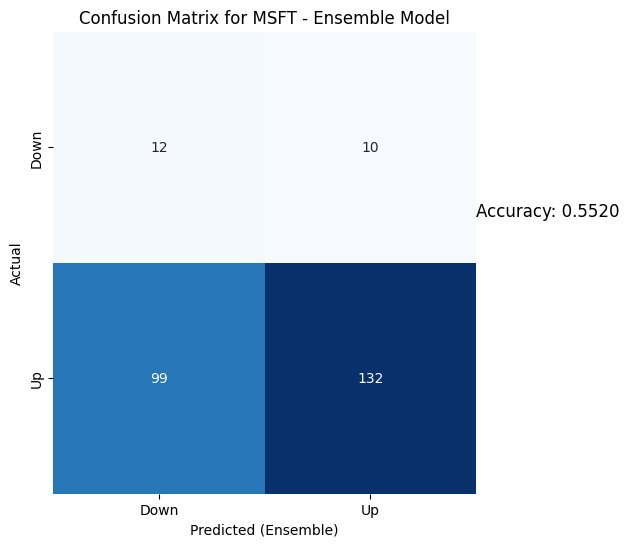

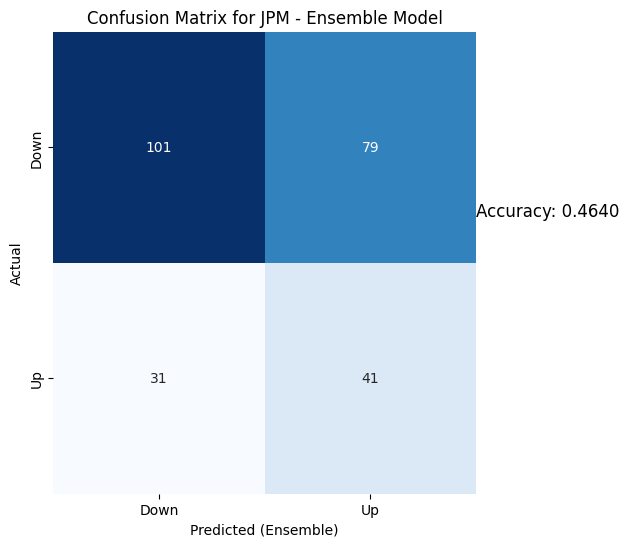

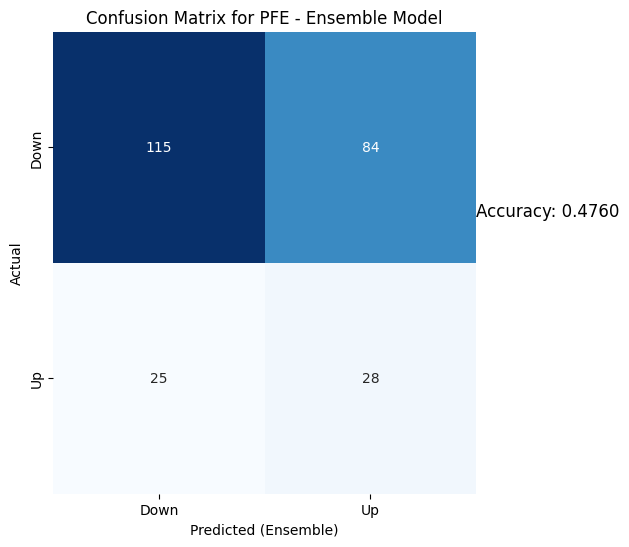

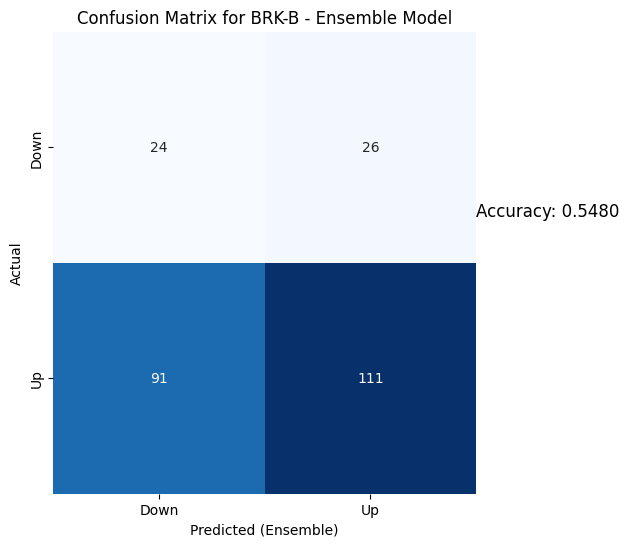

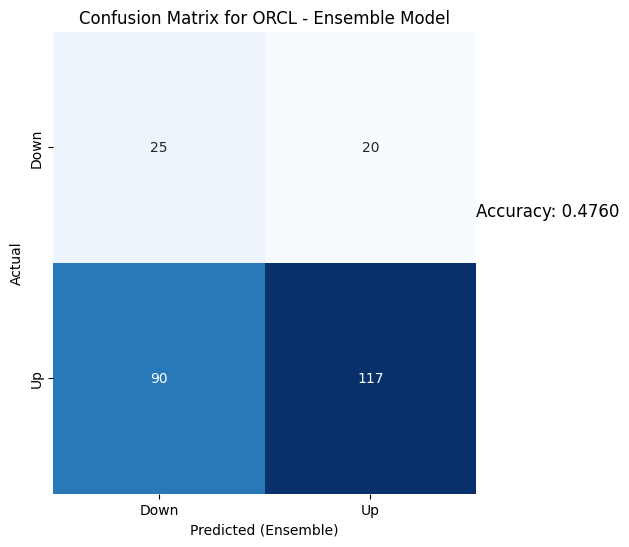

...

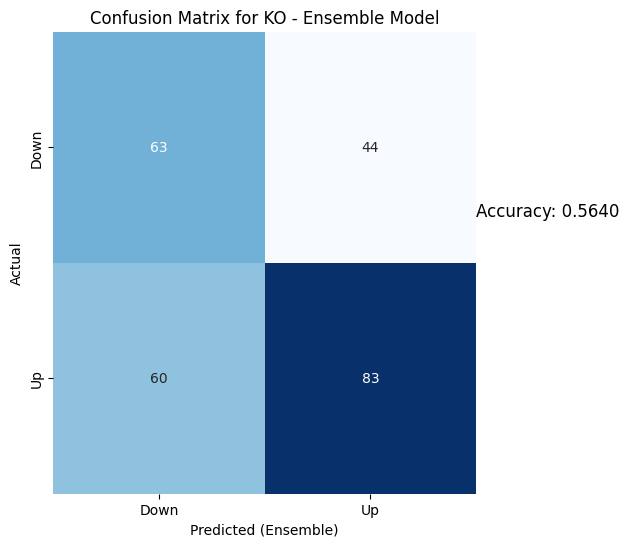

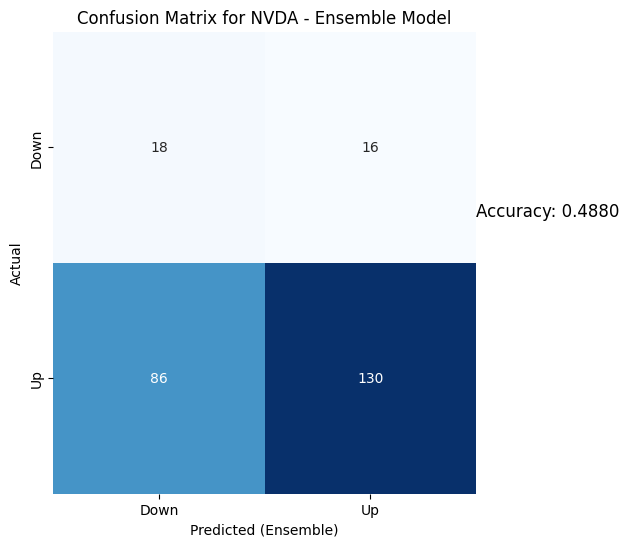

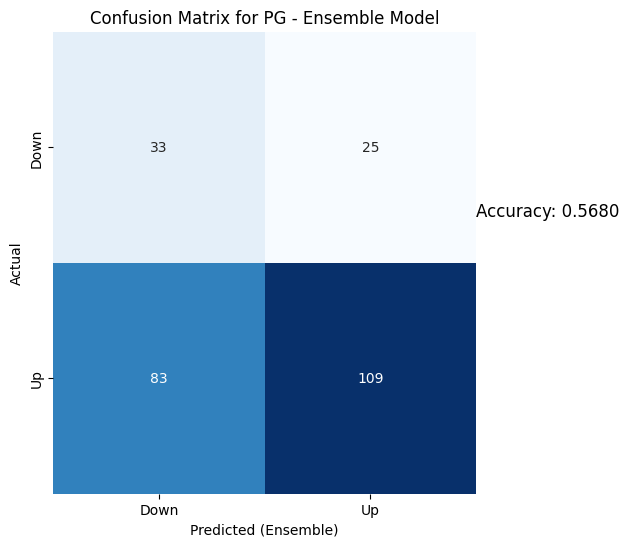

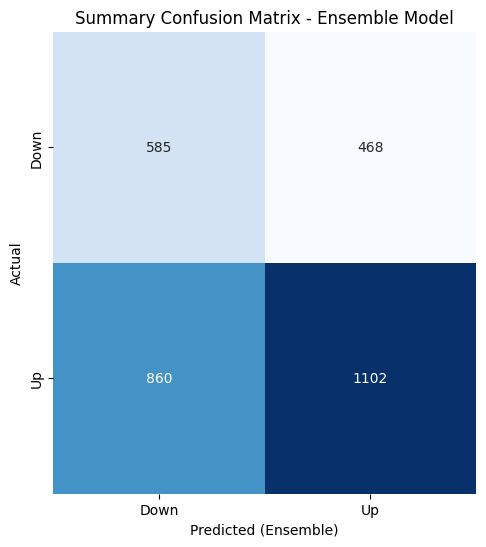

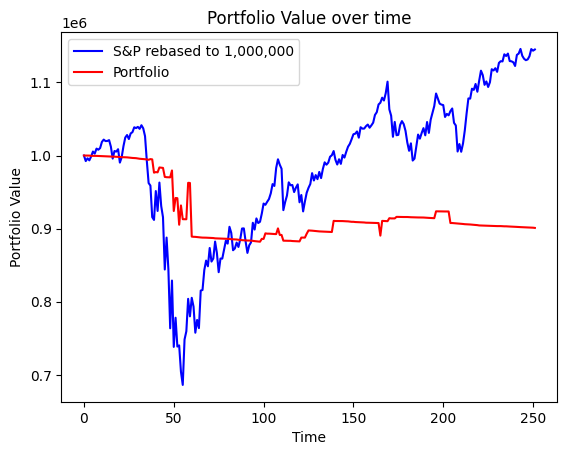

Portfolio return for our period =  90.09978311188061
S&P500 return during the period =  114.50426195875379


In [24]:
Portfolio_construct("2017-01-01")
#Testing for year 2020

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed
Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
Accuracies for MSFT:


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for MSFT:
SVR: 0.5217
LightGBM: 0.5099
GBR: 0.4862
RandomForest: 0.4704
XGBoost: 0.4862
Epoch 1/10
25/25 [==============================] - 6s 57ms/step - loss: 0.6892 - accuracy: 0.5526 - val_loss: 0.7000 - val_accuracy: 0.5253
Epoch 2/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6878 - accuracy: 0.5627 - val_loss: 0.6930 - val_accuracy: 0.5253
Epoch 3/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6874 - accuracy: 0.5627 - val_loss: 0.6970 - val_accuracy: 0.5253
Epoch 4/10
25/25 [==============================] - 1s 20ms/step - loss: 0.6858 - accuracy: 0.5627 - val_loss: 0.6959 - val_accuracy: 0.5253
Epoch 5/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6859 - accuracy: 0.5627 - val_loss: 0.6930 - val_accuracy: 0.5253
Epoch 6/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6858 - accuracy: 0.5627 - val_loss: 0.6918 - val_accuracy: 0.5253
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for JPM:
SVR: 0.5138
LightGBM: 0.4822
GBR: 0.4941
RandomForest: 0.4980
XGBoost: 0.4941
Epoch 1/10
25/25 [==============================] - 5s 57ms/step - loss: 0.6948 - accuracy: 0.4784 - val_loss: 0.6989 - val_accuracy: 0.4798
Epoch 2/10
25/25 [==============================] - 1s 25ms/step - loss: 0.6940 - accuracy: 0.5102 - val_loss: 0.6954 - val_accuracy: 0.4798
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6934 - accuracy: 0.5051 - val_loss: 0.6953 - val_accuracy: 0.4798
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6931 - accuracy: 0.5178 - val_loss: 0.6941 - val_accuracy: 0.4747
Epoch 5/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6935 - accuracy: 0.5140 - val_loss: 0.6931 - val_accuracy: 0.5152
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6941 - accuracy: 0.4949 - val_loss: 0.6931 - val_accuracy: 0.5101
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PFE:
SVR: 0.4881
LightGBM: 0.5437
GBR: 0.5278
RandomForest: 0.5357
XGBoost: 0.5317
Epoch 1/10
25/25 [==============================] - 5s 58ms/step - loss: 0.6972 - accuracy: 0.5000 - val_loss: 0.7054 - val_accuracy: 0.4670
Epoch 2/10
25/25 [==============================] - 1s 27ms/step - loss: 0.6926 - accuracy: 0.5165 - val_loss: 0.6979 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 1s 28ms/step - loss: 0.6904 - accuracy: 0.5444 - val_loss: 0.7113 - val_accuracy: 0.4670
Epoch 4/10
25/25 [==============================] - 1s 27ms/step - loss: 0.6937 - accuracy: 0.5254 - val_loss: 0.7131 - val_accuracy: 0.4670
Epoch 5/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6903 - accuracy: 0.5190 - val_loss: 0.7242 - val_accuracy: 0.4670
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6914 - accuracy: 0.5431 - val_loss: 0.7142 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 1s 2

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BRK-B:
SVR: 0.5437
LightGBM: 0.4405
GBR: 0.4444
RandomForest: 0.4762
XGBoost: 0.4524
Epoch 1/10
25/25 [==============================] - 5s 36ms/step - loss: 0.6937 - accuracy: 0.5273 - val_loss: 0.6944 - val_accuracy: 0.5228
Epoch 2/10
25/25 [==============================] - 0s 9ms/step - loss: 0.6906 - accuracy: 0.5349 - val_loss: 0.6935 - val_accuracy: 0.5228
Epoch 3/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6919 - accuracy: 0.5210 - val_loss: 0.6969 - val_accuracy: 0.5228
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6902 - accuracy: 0.5349 - val_loss: 0.6939 - val_accuracy: 0.5228
Epoch 5/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6902 - accuracy: 0.5286 - val_loss: 0.6931 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 0s 10ms/step - loss: 0.6915 - accuracy: 0.5286 - val_loss: 0.6928 - val_accuracy: 0.5228
Epoch 7/10
25/25 [==============================] - 0s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for ORCL:
Accuracies for ORCL:
Accuracies for ORCL:
SVR: 0.5317
LightGBM: 0.5198
GBR: 0.5238
RandomForest: 0.5159
XGBoost: 0.4960


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 60ms/step - loss: 0.6930 - accuracy: 0.5356 - val_loss: 0.6912 - val_accuracy: 0.5381
Epoch 2/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6911 - accuracy: 0.5420 - val_loss: 0.6964 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6898 - accuracy: 0.5369 - val_loss: 0.6901 - val_accuracy: 0.5482
Epoch 4/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6908 - accuracy: 0.5369 - val_loss: 0.7020 - val_accuracy: 0.4569
Epoch 5/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6899 - accuracy: 0.5471 - val_loss: 0.6869 - val_accuracy: 0.5685
Epoch 6/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6904 - accuracy: 0.5331 - val_loss: 0.7101 - val_accuracy: 0.4467
Epoch 7/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6901 - accuracy: 0.5433 - val_loss: 0.6951 - val_accuracy: 0.4670
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for AAPL:
SVR: 0.5278
LightGBM: 0.4643
GBR: 0.4921
RandomForest: 0.4881
XGBoost: 0.4365
Epoch 1/10
25/25 [==============================] - 15s 77ms/step - loss: 0.6932 - accuracy: 0.5414 - val_loss: 0.6907 - val_accuracy: 0.5482
Epoch 2/10
25/25 [==============================] - 1s 29ms/step - loss: 0.6908 - accuracy: 0.5427 - val_loss: 0.6933 - val_accuracy: 0.5178
Epoch 3/10
25/25 [==============================] - 1s 28ms/step - loss: 0.6900 - accuracy: 0.5414 - val_loss: 0.6956 - val_accuracy: 0.4873
Epoch 4/10
25/25 [==============================] - 1s 30ms/step - loss: 0.6886 - accuracy: 0.5439 - val_loss: 0.6992 - val_accuracy: 0.4518
Epoch 5/10
25/25 [==============================] - 1s 30ms/step - loss: 0.6885 - accuracy: 0.5414 - val_loss: 0.7035 - val_accuracy: 0.4518
Epoch 6/10
25/25 [==============================] - 1s 32ms/step - loss: 0.6884 - accuracy: 0.5338 - val_loss: 0.7029 - val_accuracy: 0.4518
Epoch 7/10
25/25 [==============================] - 1s

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for IBM:
SVR: 0.5179
LightGBM: 0.4900
GBR: 0.5139
RandomForest: 0.5179
XGBoost: 0.4741
Epoch 1/10
25/25 [==============================] - 6s 67ms/step - loss: 0.6947 - accuracy: 0.5102 - val_loss: 0.7014 - val_accuracy: 0.5025
Epoch 2/10
25/25 [==============================] - 1s 33ms/step - loss: 0.6931 - accuracy: 0.5217 - val_loss: 0.6952 - val_accuracy: 0.5025
Epoch 3/10
25/25 [==============================] - 1s 29ms/step - loss: 0.6921 - accuracy: 0.5395 - val_loss: 0.6959 - val_accuracy: 0.5025
Epoch 4/10
25/25 [==============================] - 1s 30ms/step - loss: 0.6923 - accuracy: 0.5230 - val_loss: 0.6941 - val_accuracy: 0.4721
Epoch 5/10
25/25 [==============================] - 1s 33ms/step - loss: 0.6936 - accuracy: 0.5013 - val_loss: 0.6941 - val_accuracy: 0.5228
Epoch 6/10
25/25 [==============================] - 1s 35ms/step - loss: 0.6912 - accuracy: 0.5281 - val_loss: 0.6941 - val_accuracy: 0.4822
Epoch 7/10
25/25 [==============================] - 1s 3

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for VZ:
SVR: 0.4741
LightGBM: 0.4781
GBR: 0.4701
RandomForest: 0.4781
XGBoost: 0.4980
Epoch 1/10
25/25 [==============================] - 5s 63ms/step - loss: 0.7015 - accuracy: 0.4821 - val_loss: 0.6959 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 1s 28ms/step - loss: 0.6945 - accuracy: 0.4936 - val_loss: 0.6922 - val_accuracy: 0.5255
Epoch 3/10
25/25 [==============================] - 1s 31ms/step - loss: 0.6920 - accuracy: 0.5268 - val_loss: 0.6935 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6918 - accuracy: 0.5344 - val_loss: 0.6907 - val_accuracy: 0.5255
Epoch 5/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6905 - accuracy: 0.5281 - val_loss: 0.6918 - val_accuracy: 0.5714
Epoch 6/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6936 - accuracy: 0.5268 - val_loss: 0.6922 - val_accuracy: 0.5204
Epoch 7/10
25/25 [==============================] - 1s 26

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for BAC:
SVR: 0.5458
LightGBM: 0.4741
GBR: 0.4661
RandomForest: 0.4502
XGBoost: 0.4582
Epoch 1/10
25/25 [==============================] - 5s 63ms/step - loss: 0.6946 - accuracy: 0.5045 - val_loss: 0.6921 - val_accuracy: 0.5306
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6931 - accuracy: 0.5134 - val_loss: 0.6966 - val_accuracy: 0.4541
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.6940 - accuracy: 0.4879 - val_loss: 0.6937 - val_accuracy: 0.5000
Epoch 4/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6931 - accuracy: 0.4981 - val_loss: 0.6921 - val_accuracy: 0.5408
Epoch 5/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6935 - accuracy: 0.5070 - val_loss: 0.6937 - val_accuracy: 0.4796
Epoch 6/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6926 - accuracy: 0.5198 - val_loss: 0.6923 - val_accuracy: 0.5459
Epoch 7/10
25/25 [==============================] - 1s 3

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for KO:
SVR: 0.5618
LightGBM: 0.5538
GBR: 0.5418
RandomForest: 0.5538
XGBoost: 0.5060
Epoch 1/10
25/25 [==============================] - 5s 63ms/step - loss: 0.6965 - accuracy: 0.4859 - val_loss: 0.6905 - val_accuracy: 0.5561
Epoch 2/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6940 - accuracy: 0.5038 - val_loss: 0.6915 - val_accuracy: 0.5408
Epoch 3/10
25/25 [==============================] - 1s 25ms/step - loss: 0.6947 - accuracy: 0.4962 - val_loss: 0.6920 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 1s 23ms/step - loss: 0.6966 - accuracy: 0.4872 - val_loss: 0.6878 - val_accuracy: 0.5561
Epoch 5/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6939 - accuracy: 0.4949 - val_loss: 0.6905 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6930 - accuracy: 0.5038 - val_loss: 0.6892 - val_accuracy: 0.5561
Epoch 7/10
25/25 [==============================] - 1s 26

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for NVDA:
SVR: 0.5360
LightGBM: 0.4800
GBR: 0.4800
RandomForest: 0.4960
XGBoost: 0.4560
Epoch 1/10
25/25 [==============================] - 5s 60ms/step - loss: 0.6934 - accuracy: 0.5301 - val_loss: 0.6875 - val_accuracy: 0.5561
Epoch 2/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6930 - accuracy: 0.5198 - val_loss: 0.6896 - val_accuracy: 0.5561
Epoch 3/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6897 - accuracy: 0.5365 - val_loss: 0.6892 - val_accuracy: 0.5561
Epoch 4/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6895 - accuracy: 0.5314 - val_loss: 0.6893 - val_accuracy: 0.5561
Epoch 5/10
25/25 [==============================] - 1s 25ms/step - loss: 0.6890 - accuracy: 0.5493 - val_loss: 0.6888 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6909 - accuracy: 0.5391 - val_loss: 0.6881 - val_accuracy: 0.5561
Epoch 7/10
25/25 [==============================] - 1s 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Accuracies for PG:
SVR: 0.5520
LightGBM: 0.4760
GBR: 0.4880
RandomForest: 0.4880
XGBoost: 0.4520
Epoch 1/10
25/25 [==============================] - 5s 64ms/step - loss: 0.6941 - accuracy: 0.5154 - val_loss: 0.6817 - val_accuracy: 0.5867
Epoch 2/10
25/25 [==============================] - 1s 26ms/step - loss: 0.6913 - accuracy: 0.5385 - val_loss: 0.6901 - val_accuracy: 0.5816
Epoch 3/10
25/25 [==============================] - 1s 22ms/step - loss: 0.6907 - accuracy: 0.5359 - val_loss: 0.6843 - val_accuracy: 0.5867
Epoch 4/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6919 - accuracy: 0.5372 - val_loss: 0.6880 - val_accuracy: 0.5867
Epoch 5/10
25/25 [==============================] - 1s 25ms/step - loss: 0.6908 - accuracy: 0.5385 - val_loss: 0.6851 - val_accuracy: 0.5867
Epoch 6/10
25/25 [==============================] - 1s 24ms/step - loss: 0.6912 - accuracy: 0.5359 - val_loss: 0.6867 - val_accuracy: 0.5867
Epoch 7/10
25/25 [==============================] - 1s 27

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2953 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  None  and sold at  37.84000015258789
IBM bought at  None  and sold at  120.02867889404297
219.4199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2954 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  219.4199981689453  and sold at  218.58999633789062
218.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2955 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  218.58999633789062  and sold at  222.58999633789062
64.4800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2956 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  64.4800033569336  and sold at  65.1500015258789
136.5500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2957 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  136.5500030517578  and sold at  136.33999633789062
224.9600067138672
125.33999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2958 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM']
MSFT bought at  224.9600067138672  and sold at  224.14999389648438
JPM bought at  125.33999633789062  and sold at  125.01000213623047
224.14999389648438
118.35564422607422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2959 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  224.14999389648438  and sold at  221.67999267578125
IBM bought at  118.35564422607422  and sold at  118.87189483642578
221.67999267578125
54.439998626708984
137.77000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2960 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'PG']
MSFT bought at  221.67999267578125  and sold at  222.4199981689453
KO bought at  54.439998626708984  and sold at  54.84000015258789
PG bought at  137.77000427246094  and sold at  139.13999938964844
222.4199981689453
132.69000244140625
139.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2961 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'PG']
MSFT bought at  222.4199981689453  and sold at  217.69000244140625
AAPL bought at  132.69000244140625  and sold at  129.41000366210938
PG bought at  139.13999938964844  and sold at  137.82000732421875
137.82000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2962 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  137.82000732421875  and sold at  138.6999969482422
37.189998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2963 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  37.189998626708984  and sold at  36.869998931884766
212.25
131.5500030517578
36.869998931884766
126.5999984741211
50.52000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2964 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'AAPL', 'KO']
MSFT bought at  212.25  and sold at  218.2899932861328
JPM bought at  131.5500030517578  and sold at  135.8699951171875
PFE bought at  36.869998931884766  and sold at  37.060001373291016
AAPL bought at  126.5999984741211  and sold at  130.9199981689453
KO bought at  50.52000045776367  and sold at  49.959999084472656
218.2899932861328
130.9199981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2965 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  218.2899932861328  and sold at  219.6199951171875
AAPL bought at  130.9199981689453  and sold at  132.0500030517578
219.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2966 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  219.6199951171875  and sold at  217.49000549316406
217.49000549316406
137.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2967 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  217.49000549316406  and sold at  214.92999267578125
PG bought at  137.85000610351562  and sold at  137.0500030517578
214.92999267578125
137.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2968 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PG']
MSFT bought at  214.92999267578125  and sold at  216.33999633789062
PG bought at  137.0500030517578  and sold at  137.25999450683594
216.33999633789062
130.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2969 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  216.33999633789062  and sold at  213.02000427246094
AAPL bought at  130.88999938964844  and sold at  128.91000366210938
128.91000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2970 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  128.91000366210938  and sold at  127.13999938964844
61.779998779296875
33.0099983215332
48.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2971 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC', 'KO']
ORCL bought at  61.779998779296875  and sold at  61.290000915527344
BAC bought at  33.0099983215332  and sold at  32.77000045776367
KO bought at  48.70000076293945  and sold at  48.5099983215332
36.72999954223633
48.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2972 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  36.72999954223633  and sold at  36.5
KO bought at  48.5099983215332  and sold at  48.68000030517578
132.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2973 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  132.02999877929688  and sold at  136.8699951171875
136.8699951171875
31.770000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2974 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'BAC']
AAPL bought at  136.8699951171875  and sold at  139.07000732421875
BAC bought at  31.770000457763672  and sold at  31.549999237060547
36.54999923706055
139.07000732421875
31.549999237060547
48.4900016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2975 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL', 'BAC', 'KO']
PFE bought at  36.54999923706055  and sold at  37.279998779296875
AAPL bought at  139.07000732421875  and sold at  142.9199981689453
BAC bought at  31.549999237060547  and sold at  31.15999984741211
KO bought at  48.4900016784668  and sold at  48.779998779296875
233.00999450683594
31.15999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2976 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'BAC']
BRK-B bought at  233.00999450683594  and sold at  231.57000732421875
BAC bought at  31.15999984741211  and sold at  30.940000534057617
131.5800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2977 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  131.5800018310547  and sold at  127.86000061035156
127.86000061035156
29.829999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2978 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BAC']
JPM bought at  127.86000061035156  and sold at  130.11000061035156
BAC bought at  29.829999923706055  and sold at  30.31999969482422
35.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2979 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  35.86000061035156  and sold at  35.900001525878906
35.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2980 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  35.900001525878906  and sold at  35.79999923706055
129.6199951171875
35.79999923706055
115.23900604248047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2981 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'IBM']
JPM bought at  129.6199951171875  and sold at  133.61000061035156
PFE bought at  35.79999923706055  and sold at  34.9900016784668
IBM bought at  115.23900604248047  and sold at  114.1873779296875
133.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2982 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  133.61000061035156  and sold at  135.13999938964844
34.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2983 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.84000015258789  and sold at  34.88999938964844
138.25
34.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2984 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  138.25  and sold at  137.97999572753906
PFE bought at  34.88999938964844  and sold at  34.91999816894531
137.97999572753906
34.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2985 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  137.97999572753906  and sold at  140.13999938964844
PFE bought at  34.91999816894531  and sold at  34.81999969482422
140.13999938964844
34.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2986 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  140.13999938964844  and sold at  139.5800018310547
PFE bought at  34.81999969482422  and sold at  34.970001220703125
34.970001220703125
136.00999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2987 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  34.970001220703125  and sold at  34.7400016784668
AAPL bought at  136.00999450683594  and sold at  135.38999938964844
135.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2988 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  135.38999938964844  and sold at  135.1300048828125
139.27000427246094
34.43000030517578
62.70000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2989 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  139.27000427246094  and sold at  141.25
PFE bought at  34.43000030517578  and sold at  34.720001220703125
ORCL bought at  62.70000076293945  and sold at  63.08000183105469
141.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2990 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  141.25  and sold at  144.64999389648438
144.64999389648438
34.689998626708984
62.13999938964844
133.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2991 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL', 'AAPL']
JPM bought at  144.64999389648438  and sold at  145.10000610351562
PFE bought at  34.689998626708984  and sold at  34.88999938964844
ORCL bought at  62.13999938964844  and sold at  62.09000015258789
AAPL bought at  133.19000244140625  and sold at  130.83999633789062
244.1999969482422
62.09000015258789
130.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2992 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  244.1999969482422  and sold at  243.7899932861328
ORCL bought at  62.09000015258789  and sold at  62.06999969482422
AAPL bought at  130.83999633789062  and sold at  129.7100067138672
62.06999969482422
129.7100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2993 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  62.06999969482422  and sold at  61.130001068115234
AAPL bought at  129.7100067138672  and sold at  129.8699951171875
129.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2994 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  129.8699951171875  and sold at  126.0
34.2599983215332
64.44999694824219
126.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2995 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL']
PFE bought at  34.2599983215332  and sold at  33.90999984741211
ORCL bought at  64.44999694824219  and sold at  64.5
AAPL bought at  126.0  and sold at  125.86000061035156
233.27000427246094
150.61000061035156
33.90999984741211
125.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2996 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'AAPL']
MSFT bought at  233.27000427246094  and sold at  234.5500030517578
JPM bought at  150.61000061035156  and sold at  153.25999450683594
PFE bought at  33.90999984741211  and sold at  33.75
AAPL bought at  125.86000061035156  and sold at  125.3499984741211
33.81999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2997 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  33.81999969482422  and sold at  33.4900016784668
232.3800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2998 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  232.3800048828125  and sold at  236.94000244140625
66.16999816894531
127.79000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 2999 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  66.16999816894531  and sold at  66.66000366210938
AAPL bought at  127.79000091552734  and sold at  125.12000274658203
150.00999450683594
66.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3000 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  150.00999450683594  and sold at  152.91000366210938
ORCL bought at  66.66000366210938  and sold at  66.91000366210938
34.38999938964844
251.5500030517578
116.97896575927734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3001 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B', 'IBM']
PFE bought at  34.38999938964844  and sold at  34.20000076293945
BRK-B bought at  251.5500030517578  and sold at  245.47999572753906
IBM bought at  116.97896575927734  and sold at  114.82791900634766
226.72999572753906
245.47999572753906
123.70249938964844
122.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3002 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'NVDA', 'PG']
MSFT bought at  226.72999572753906  and sold at  231.60000610351562
BRK-B bought at  245.47999572753906  and sold at  253.14999389648438
NVDA bought at  123.70249938964844  and sold at  124.61499786376953
PG bought at  122.1500015258789  and sold at  125.9800033569336
117.42829895019531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3003 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  117.42829895019531  and sold at  119.32122039794922
152.91000366210938
34.349998474121094
72.16000366210938
119.32122039794922


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3004 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL', 'IBM']
JPM bought at  152.91000366210938  and sold at  151.8300018310547
PFE bought at  34.349998474121094  and sold at  34.45000076293945
ORCL bought at  72.16000366210938  and sold at  72.63999938964844
IBM bought at  119.32122039794922  and sold at  118.71892547607422
34.45000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3005 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  34.45000076293945  and sold at  34.93000030517578
155.1300048828125
34.93000030517578
51.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3006 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'KO']
JPM bought at  155.1300048828125  and sold at  154.32000732421875
PFE bought at  34.93000030517578  and sold at  34.709999084472656
KO bought at  51.439998626708984  and sold at  50.880001068115234
34.709999084472656
50.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3007 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  34.709999084472656  and sold at  34.939998626708984
KO bought at  50.880001068115234  and sold at  50.36000061035156
34.939998626708984
50.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3008 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  34.939998626708984  and sold at  35.40999984741211
KO bought at  50.36000061035156  and sold at  51.029998779296875
234.80999755859375
122.92543029785156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3009 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'IBM']
MSFT bought at  234.80999755859375  and sold at  237.7100067138672
IBM bought at  122.92543029785156  and sold at  122.60037994384766
237.7100067138672
35.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3010 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'PFE']
MSFT bought at  237.7100067138672  and sold at  237.0399932861328
PFE bought at  35.83000183105469  and sold at  35.790000915527344
237.0399932861328
51.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3011 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  237.0399932861328  and sold at  230.72000122070312
KO bought at  51.2400016784668  and sold at  50.56999969482422
66.73999786376953
120.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3012 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  66.73999786376953  and sold at  66.26000213623047
AAPL bought at  120.52999877929688  and sold at  119.98999786376953
35.529998779296875
50.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3013 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  35.529998779296875  and sold at  36.0
KO bought at  50.810001373291016  and sold at  51.0
36.0
66.31999969482422
51.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3014 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'KO']
PFE bought at  36.0  and sold at  35.36000061035156
ORCL bought at  66.31999969482422  and sold at  67.2699966430664
KO bought at  51.0  and sold at  51.38999938964844
35.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3015 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  35.36000061035156  and sold at  35.61000061035156
35.61000061035156
66.83000183105469
120.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3016 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL']
PFE bought at  35.61000061035156  and sold at  35.66999816894531
ORCL bought at  66.83000183105469  and sold at  68.62999725341797
AAPL bought at  120.08999633789062  and sold at  120.58999633789062
35.66999816894531
68.62999725341797
120.58999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3017 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'AAPL']
PFE bought at  35.66999816894531  and sold at  36.25
ORCL bought at  68.62999725341797  and sold at  70.25
AAPL bought at  120.58999633789062  and sold at  121.20999908447266
70.25
121.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3018 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  70.25  and sold at  71.12999725341797
AAPL bought at  121.20999908447266  and sold at  121.38999938964844
235.24000549316406
71.12999725341797
121.38999938964844
129.4824981689453


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3019 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL', 'NVDA']
MSFT bought at  235.24000549316406  and sold at  231.85000610351562
ORCL bought at  71.12999725341797  and sold at  70.55000305175781
AAPL bought at  121.38999938964844  and sold at  119.9000015258789
NVDA bought at  129.4824981689453  and sold at  128.71749877929688
70.55000305175781
119.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3020 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  70.55000305175781  and sold at  70.16999816894531
AAPL bought at  119.9000015258789  and sold at  122.1500015258789
152.22999572753906
36.22999954223633
70.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3021 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  152.22999572753906  and sold at  153.7100067138672
PFE bought at  36.22999954223633  and sold at  36.29999923706055
ORCL bought at  70.16999816894531  and sold at  71.80999755859375
36.29999923706055
71.80999755859375
52.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3022 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'KO']
PFE bought at  36.29999923706055  and sold at  36.279998779296875
ORCL bought at  71.80999755859375  and sold at  74.16000366210938
KO bought at  52.5099983215332  and sold at  52.810001373291016
36.279998779296875
74.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3023 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  36.279998779296875  and sold at  36.04999923706055
ORCL bought at  74.16000366210938  and sold at  74.27999877929688
36.04999923706055
74.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3024 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  36.04999923706055  and sold at  35.90999984741211
ORCL bought at  74.27999877929688  and sold at  74.06999969482422
35.90999984741211
74.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3025 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL']
PFE bought at  35.90999984741211  and sold at  35.959999084472656
ORCL bought at  74.06999969482422  and sold at  75.27999877929688
155.1199951171875
35.959999084472656
75.27999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3026 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'ORCL']
JPM bought at  155.1199951171875  and sold at  156.27999877929688
PFE bought at  35.959999084472656  and sold at  36.599998474121094
ORCL bought at  75.27999877929688  and sold at  75.58000183105469
75.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3027 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  75.58000183105469  and sold at  76.12000274658203
76.12000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3028 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  76.12000274658203  and sold at  76.66999816894531
53.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3029 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  53.33000183105469  and sold at  53.68000030517578
38.93000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3030 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  38.93000030517578  and sold at  39.029998779296875
39.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3031 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  39.029998779296875  and sold at  39.529998779296875
150.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3032 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  150.5399932861328  and sold at  147.3699951171875
147.3699951171875
38.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3033 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  147.3699951171875  and sold at  150.19000244140625
PFE bought at  38.63999938964844  and sold at  38.65999984741211
150.19000244140625
38.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3034 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  150.19000244140625  and sold at  150.55999755859375
PFE bought at  38.65999984741211  and sold at  38.68000030517578
74.5
134.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3035 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  74.5  and sold at  75.22000122070312
AAPL bought at  134.72000122070312  and sold at  134.38999938964844
75.22000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3036 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  75.22000122070312  and sold at  74.7699966430664
74.7699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3037 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  74.7699966430664  and sold at  75.87000274658203
75.87000274658203
54.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3038 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  75.87000274658203  and sold at  75.79000091552734
KO bought at  54.2599983215332  and sold at  53.97999954223633
38.650001525878906
75.79000091552734
53.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3039 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'ORCL', 'KO']
PFE bought at  38.650001525878906  and sold at  39.83000183105469
ORCL bought at  75.79000091552734  and sold at  77.33000183105469
KO bought at  53.97999954223633  and sold at  54.47999954223633
39.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3040 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  39.95000076293945  and sold at  39.970001220703125
128.10000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3041 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  128.10000610351562  and sold at  129.74000549316406
160.69000244140625
54.540000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3042 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  160.69000244140625  and sold at  161.24000549316406
KO bought at  54.540000915527344  and sold at  54.5099983215332
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3043 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.5099983215332  and sold at  54.90999984741211
158.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3044 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  158.5399932861328  and sold at  157.4499969482422
54.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3045 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.040000915527344  and sold at  54.5099983215332
161.5
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3046 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  161.5  and sold at  164.00999450683594
KO bought at  54.5099983215332  and sold at  54.72999954223633
164.00999450683594
290.67999267578125
78.88999938964844
54.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3047 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'ORCL', 'KO']
JPM bought at  164.00999450683594  and sold at  164.6699981689453
BRK-B bought at  290.67999267578125  and sold at  289.2200012207031
ORCL bought at  78.88999938964844  and sold at  79.08000183105469
KO bought at  54.72999954223633  and sold at  54.63999938964844
164.6699981689453
79.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3048 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  164.6699981689453  and sold at  162.35000610351562
ORCL bought at  79.08000183105469  and sold at  78.69000244140625
243.0800018310547
287.5899963378906
54.34000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3049 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'KO']
MSFT bought at  243.0800018310547  and sold at  243.1199951171875
BRK-B bought at  287.5899963378906  and sold at  286.2200012207031
KO bought at  54.34000015258789  and sold at  54.16999816894531
124.69000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3050 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  124.69000244140625  and sold at  127.30999755859375
54.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3051 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.650001525878906  and sold at  54.619998931884766
79.37999725341797
127.0999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3052 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL']
ORCL bought at  79.37999725341797  and sold at  78.83000183105469
AAPL bought at  127.0999984741211  and sold at  126.9000015258789
39.33000183105469
137.46653747558594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3053 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'IBM']
PFE bought at  39.33000183105469  and sold at  38.91999816894531
IBM bought at  137.46653747558594  and sold at  137.07456970214844
161.8300018310547
38.91999816894531
287.3299865722656
137.07456970214844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3054 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'BRK-B', 'IBM']
JPM bought at  161.8300018310547  and sold at  164.35000610351562
PFE bought at  38.91999816894531  and sold at  38.650001525878906
BRK-B bought at  287.3299865722656  and sold at  289.29998779296875
IBM bought at  137.07456970214844  and sold at  137.49522399902344
78.9800033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3055 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  78.9800033569336  and sold at  78.73999786376953
38.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3056 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  38.72999954223633  and sold at  38.5
247.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3057 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  247.39999389648438  and sold at  247.3000030517578
125.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3058 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  125.05999755859375  and sold at  123.54000091552734
166.1699981689453
38.970001220703125
123.54000091552734


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3059 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'AAPL']
JPM bought at  166.1699981689453  and sold at  166.44000244140625
PFE bought at  38.970001220703125  and sold at  39.150001525878906
AAPL bought at  123.54000091552734  and sold at  125.88999938964844
250.7899932861328
82.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3060 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL']
MSFT bought at  250.7899932861328  and sold at  253.80999755859375
ORCL bought at  82.88999938964844  and sold at  83.94000244140625
253.80999755859375
83.94000244140625
125.9000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3061 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  253.80999755859375  and sold at  252.57000732421875
ORCL bought at  83.94000244140625  and sold at  84.61000061035156
AAPL bought at  125.9000015258789  and sold at  126.73999786376953
84.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3062 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  84.61000061035156  and sold at  84.5199966430664
162.94000244140625
173.58250427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3063 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'NVDA']
JPM bought at  162.94000244140625  and sold at  160.39999389648438
NVDA bought at  173.58250427246094  and sold at  174.25
160.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3064 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  160.39999389648438  and sold at  160.2899932861328
160.2899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3065 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  160.2899932861328  and sold at  157.57000732421875
54.66999816894531
178.1024932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3066 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'NVDA']
KO bought at  54.66999816894531  and sold at  54.95000076293945
NVDA bought at  178.1024932861328  and sold at  186.57249450683594
186.3874969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3067 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  186.3874969482422  and sold at  184.2725067138672
77.98999786376953
54.36000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3068 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  77.98999786376953  and sold at  78.68000030517578
KO bought at  54.36000061035156  and sold at  54.560001373291016
151.1199951171875
54.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3069 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  151.1199951171875  and sold at  152.50999450683594
KO bought at  54.119998931884766  and sold at  54.38999938964844
266.69000244140625
152.50999450683594
39.189998626708984
77.73999786376953


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3070 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'PFE', 'ORCL']
MSFT bought at  266.69000244140625  and sold at  265.0199890136719
JPM bought at  152.50999450683594  and sold at  154.0500030517578
PFE bought at  39.189998626708984  and sold at  38.97999954223633
ORCL bought at  77.73999786376953  and sold at  78.45999908447266
54.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3071 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.31999969482422  and sold at  54.2599983215332
78.5
135.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3072 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'PG']
ORCL bought at  78.5  and sold at  78.0999984741211
PG bought at  135.32000732421875  and sold at  134.39999389648438
154.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3073 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  154.13999938964844  and sold at  155.5399932861328
277.9200134277344
77.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3074 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'ORCL']
BRK-B bought at  277.9200134277344  and sold at  280.1700134277344
ORCL bought at  77.83999633789062  and sold at  79.54000091552734
79.54000091552734
202.1199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3075 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'NVDA']
ORCL bought at  79.54000091552734  and sold at  81.81999969482422
NVDA bought at  202.1199951171875  and sold at  204.8699951171875
81.81999969482422
54.18000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3076 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO']
ORCL bought at  81.81999969482422  and sold at  83.08000183105469
KO bought at  54.18000030517578  and sold at  53.880001068115234
39.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3077 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  39.290000915527344  and sold at  39.349998474121094
39.349998474121094
137.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3078 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'PG']
PFE bought at  39.349998474121094  and sold at  39.25
PG bought at  137.0  and sold at  136.97999572753906
39.61000061035156
145.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3079 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'AAPL']
PFE bought at  39.61000061035156  and sold at  39.7599983215332
AAPL bought at  145.11000061035156  and sold at  144.5
155.64999389648438
87.06999969482422
145.63999938964844
136.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3080 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'AAPL', 'PG']
JPM bought at  155.64999389648438  and sold at  155.1199951171875
ORCL bought at  87.06999969482422  and sold at  88.27999877929688
AAPL bought at  145.63999938964844  and sold at  149.14999389648438
PG bought at  136.97000122070312  and sold at  137.97999572753906
155.1199951171875
88.27999877929688
56.2599983215332
137.97999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3081 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'KO', 'PG']
JPM bought at  155.1199951171875  and sold at  155.4600067138672
ORCL bought at  88.27999877929688  and sold at  86.23999786376953
KO bought at  56.2599983215332  and sold at  56.439998626708984
PG bought at  137.97999572753906  and sold at  139.16000366210938
148.47999572753906
56.439998626708984
139.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3082 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO', 'PG']
AAPL bought at  148.47999572753906  and sold at  146.38999938964844
KO bought at  56.439998626708984  and sold at  56.400001525878906
PG bought at  139.16000366210938  and sold at  140.50999450683594
140.50999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3083 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  140.50999450683594  and sold at  140.44000244140625
146.97000122070312
55.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3084 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  146.97000122070312  and sold at  149.7100067138672
KO bought at  55.72999954223633  and sold at  55.83000183105469
149.7100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3085 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  149.7100067138672  and sold at  152.86000061035156
152.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3086 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  152.86000061035156  and sold at  150.92999267578125
56.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3087 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  56.470001220703125  and sold at  57.0099983215332
150.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3088 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  150.63999938964844  and sold at  151.64999389648438
151.6999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3089 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  151.6999969482422  and sold at  153.0
57.04999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3090 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  57.04999923706055  and sold at  57.029998779296875
145.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3091 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  145.86000061035156  and sold at  145.52000427246094
141.8800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3092 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.8800048828125  and sold at  143.9499969482422
287.1199951171875
147.36000061035156
56.91999816894531
143.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3093 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL', 'KO', 'PG']
MSFT bought at  287.1199951171875  and sold at  286.510009765625
AAPL bought at  147.36000061035156  and sold at  146.9499969482422
KO bought at  56.91999816894531  and sold at  56.099998474121094
PG bought at  143.9499969482422  and sold at  142.42999267578125
286.510009765625
56.099998474121094
142.42999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3094 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO', 'PG']
MSFT bought at  286.510009765625  and sold at  289.5199890136719
KO bought at  56.099998474121094  and sold at  56.5
PG bought at  142.42999267578125  and sold at  142.5
56.5
142.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3095 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  56.5  and sold at  56.63999938964844
PG bought at  142.5  and sold at  141.41000366210938
141.41000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3096 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.41000366210938  and sold at  142.17999267578125
142.17999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3097 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.17999267578125  and sold at  142.27000427246094
142.27000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3098 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.27000427246094  and sold at  142.6199951171875
145.86000061035156
142.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3099 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  145.86000061035156  and sold at  148.88999938964844
PG bought at  142.6199951171875  and sold at  142.9499969482422
142.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3100 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.9499969482422  and sold at  143.63999938964844
143.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3101 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.63999938964844  and sold at  144.63999938964844
143.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3102 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.3000030517578  and sold at  144.99000549316406
285.2699890136719
56.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3103 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  285.2699890136719  and sold at  285.6199951171875
KO bought at  56.63999938964844  and sold at  56.439998626708984
88.62000274658203


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3104 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  88.62000274658203  and sold at  88.72000122070312
299.7200012207031
148.60000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3105 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'AAPL']
MSFT bought at  299.7200012207031  and sold at  303.5899963378906
AAPL bought at  148.60000610351562  and sold at  153.1199951171875
153.1199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3106 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  153.1199951171875  and sold at  151.8300018310547
159.9499969482422
142.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3107 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PG']
JPM bought at  159.9499969482422  and sold at  159.72000122070312
PG bought at  142.38999938964844  and sold at  143.83999633789062
159.49000549316406
90.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3108 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  159.49000549316406  and sold at  159.2100067138672
ORCL bought at  90.0  and sold at  88.72000122070312
143.50999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3109 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  143.50999450683594  and sold at  144.60000610351562
159.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3110 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  159.19000244140625  and sold at  157.36000061035156
130.9942626953125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3111 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  130.9942626953125  and sold at  132.07456970214844
55.349998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3112 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  55.349998474121094  and sold at  54.439998626708984
157.67999267578125
146.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3113 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  157.67999267578125  and sold at  152.9600067138672
AAPL bought at  146.05999755859375  and sold at  142.94000244140625
294.29998779296875
86.16999816894531
142.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3114 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'AAPL']
MSFT bought at  294.29998779296875  and sold at  294.79998779296875
ORCL bought at  86.16999816894531  and sold at  86.91999816894531
AAPL bought at  142.94000244140625  and sold at  143.42999267578125
152.97999572753906
86.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3115 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  152.97999572753906  and sold at  155.91000366210938
ORCL bought at  86.91999816894531  and sold at  88.44000244140625
155.91000366210938
88.44000244140625
54.130001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3116 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL', 'KO']
JPM bought at  155.91000366210938  and sold at  161.17999267578125
ORCL bought at  88.44000244140625  and sold at  89.41999816894531
KO bought at  54.130001068115234  and sold at  54.040000915527344
54.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3117 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.040000915527344  and sold at  53.88999938964844
53.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3118 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  53.88999938964844  and sold at  53.61000061035156
294.1700134277344
53.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3119 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  294.1700134277344  and sold at  283.5199890136719
KO bought at  53.61000061035156  and sold at  52.63999938964844
283.5199890136719
90.48999786376953
131.42446899414062
52.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3120 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'ORCL', 'IBM', 'KO']
MSFT bought at  283.5199890136719  and sold at  284.0
ORCL bought at  90.48999786376953  and sold at  91.25
IBM bought at  131.42446899414062  and sold at  133.0592803955078
KO bought at  52.63999938964844  and sold at  52.959999084472656
163.69000244140625
272.94000244140625
52.470001220703125
139.8000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3121 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B', 'KO', 'PG']
JPM bought at  163.69000244140625  and sold at  167.1300048828125
BRK-B bought at  272.94000244140625  and sold at  275.7099914550781
KO bought at  52.470001220703125  and sold at  53.02000045776367
PG bought at  139.8000030517578  and sold at  139.5800018310547
139.13999938964844
52.9900016784668
138.7899932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3122 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO', 'PG']
AAPL bought at  139.13999938964844  and sold at  141.11000061035156
KO bought at  52.9900016784668  and sold at  53.08000183105469
PG bought at  138.7899932861328  and sold at  139.3300018310547
141.11000061035156
53.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3123 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  141.11000061035156  and sold at  142.0
KO bought at  53.08000183105469  and sold at  53.709999084472656
294.8500061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3124 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['MSFT']
MSFT bought at  294.8500061035156  and sold at  294.2300109863281
294.2300109863281
280.92999267578125
142.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3125 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BRK-B', 'PG']
MSFT bought at  294.2300109863281  and sold at  292.8800048828125
BRK-B bought at  280.92999267578125  and sold at  278.6199951171875
PG bought at  142.32000732421875  and sold at  142.11000061035156
142.11000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3126 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.11000061035156  and sold at  142.44000244140625
142.44000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3127 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.44000244140625  and sold at  144.0500030517578
137.08413696289062
144.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3128 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['IBM', 'PG']
IBM bought at  137.08413696289062  and sold at  138.25047302246094
PG bought at  144.0500030517578  and sold at  144.4199981689453
168.57000732421875
148.75999450683594
140.66000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3129 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL', 'PG']
JPM bought at  168.57000732421875  and sold at  170.83999633789062
AAPL bought at  148.75999450683594  and sold at  149.25999450683594
PG bought at  140.66000366210938  and sold at  141.2100067138672
141.2100067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3130 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.2100067138672  and sold at  139.3300018310547
139.3300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3131 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  139.3300018310547  and sold at  140.8300018310547
227.25999450683594
140.8300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3132 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  227.25999450683594  and sold at  231.66000366210938
PG bought at  140.8300018310547  and sold at  140.85000610351562
148.63999938964844
140.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3133 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  148.63999938964844  and sold at  149.32000732421875
PG bought at  140.85000610351562  and sold at  142.85000610351562
142.85000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3134 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.85000610351562  and sold at  141.8300018310547
141.8300018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3135 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  141.8300018310547  and sold at  142.67999267578125
56.040000915527344
142.67999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3136 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  56.040000915527344  and sold at  56.369998931884766
PG bought at  142.67999267578125  and sold at  142.99000549316406
142.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3137 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.63999938964844  and sold at  144.05999755859375
144.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3138 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  144.05999755859375  and sold at  145.0500030517578
265.9800109863281
145.0500030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3139 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['NVDA', 'PG']
NVDA bought at  265.9800109863281  and sold at  298.010009765625
PG bought at  145.0500030517578  and sold at  145.32000732421875
56.599998474121094
145.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3140 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  56.599998474121094  and sold at  56.84000015258789
PG bought at  145.32000732421875  and sold at  146.0399932861328
150.44000244140625
144.9499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3141 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  150.44000244140625  and sold at  150.80999755859375
PG bought at  144.9499969482422  and sold at  145.38999938964844
145.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3142 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  145.38999938964844  and sold at  146.82000732421875
56.720001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3143 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  56.720001220703125  and sold at  56.7400016784668
147.8699951171875
120.2699966430664


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3144 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  147.8699951171875  and sold at  149.99000549316406
IBM bought at  120.2699966430664  and sold at  118.95999908447266
146.55999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3145 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  146.55999755859375  and sold at  147.39999389648438
151.0
118.45999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3146 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'IBM']
AAPL bought at  151.0  and sold at  153.49000549316406
IBM bought at  118.45999908447266  and sold at  118.05999755859375
95.33000183105469
153.49000549316406
55.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3147 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'KO']
ORCL bought at  95.33000183105469  and sold at  94.66000366210938
AAPL bought at  153.49000549316406  and sold at  157.8699951171875
KO bought at  55.90999984741211  and sold at  55.40999984741211
163.0500030517578
157.8699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3148 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'AAPL']
JPM bought at  163.0500030517578  and sold at  160.9199981689453
AAPL bought at  157.8699951171875  and sold at  160.5500030517578
160.5500030517578
146.82000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3149 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'PG']
AAPL bought at  160.5500030517578  and sold at  161.02000427246094
PG bought at  146.82000732421875  and sold at  147.8000030517578
94.61000061035156
55.470001220703125
319.55999755859375
147.8000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3150 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'KO', 'NVDA', 'PG']
ORCL bought at  94.61000061035156  and sold at  92.94000244140625
KO bought at  55.470001220703125  and sold at  55.880001068115234
NVDA bought at  319.55999755859375  and sold at  317.4599914550781
PG bought at  147.8000030517578  and sold at  149.44000244140625
337.67999267578125
55.880001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3151 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  337.67999267578125  and sold at  337.9100036621094
KO bought at  55.880001068115234  and sold at  55.43000030517578
161.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3152 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  161.94000244140625  and sold at  156.80999755859375
147.47000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3153 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  147.47000122070312  and sold at  149.02000427246094
336.6300048828125
54.58000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3154 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  336.6300048828125  and sold at  330.5899963378906
KO bought at  54.58000183105469  and sold at  52.45000076293945
90.73999786376953
165.3000030517578
144.5800018310547


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3155 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'AAPL', 'PG']
ORCL bought at  90.73999786376953  and sold at  89.75
AAPL bought at  165.3000030517578  and sold at  164.77000427246094
PG bought at  144.5800018310547  and sold at  146.39999389648438
146.39999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3156 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  146.39999389648438  and sold at  147.25999450683594
147.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3157 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  147.25999450683594  and sold at  149.8800048828125
149.8800048828125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3158 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  149.8800048828125  and sold at  152.14999389648438
90.05000305175781
121.58000183105469
55.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3159 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM', 'KO']
ORCL bought at  90.05000305175781  and sold at  88.94000244140625
IBM bought at  121.58000183105469  and sold at  123.0199966430664
KO bought at  55.209999084472656  and sold at  55.0
88.94000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3160 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  88.94000244140625  and sold at  88.7699966430664
153.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3161 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  153.32000732421875  and sold at  155.4600067138672
102.62999725341797
124.08999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3162 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'IBM']
ORCL bought at  102.62999725341797  and sold at  100.88999938964844
IBM bought at  124.08999633789062  and sold at  122.58000183105469
[1000000.0, 986386.016177875, 993179.5809424306, 999117.3181621542, 1013961.7020234588, 1019738.9664770269, 1012865.0837054027, 1013079.0201856131, 1015807.2204582371, 1012249.8836858129, 1004867.8915706906, 1012758.0746533021, 1026773.3220148066, 1027709.3859427163, 1024071.8944112053, 1028110.6494820957, 1026505.8401965506, 1001417.5638503669, 1010029.9560046688, 989809.5712291757, 1006285.4554210574, 1020514.5576387813, 1021317.0030935492, 1032924.9957147404, 1036990.4418306628, 1044479.5246218768, 1043784.0882192093, 1043329.360965775, 1045014.406634398, 1050176.5526923675, 1049267.0981854987, 1049507.8889587228, 1045041.1793034209, 1043195.6608686426, 1035171.6960649074, 1036428.787149119, 1047849

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3163 times so far.

  warnings.warn(msg, UserWarning)


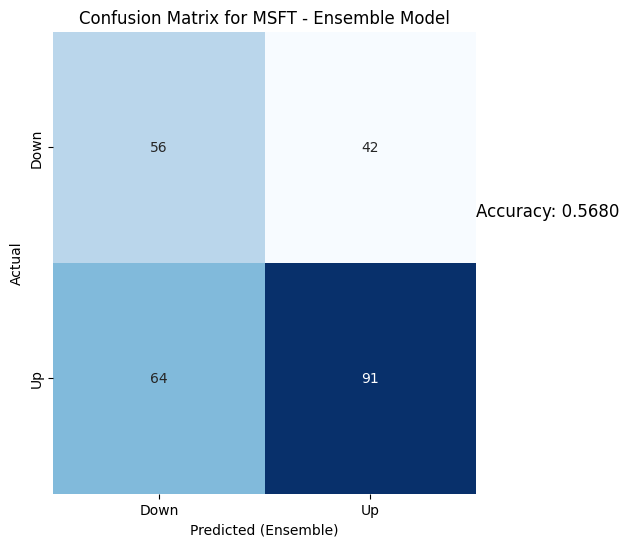

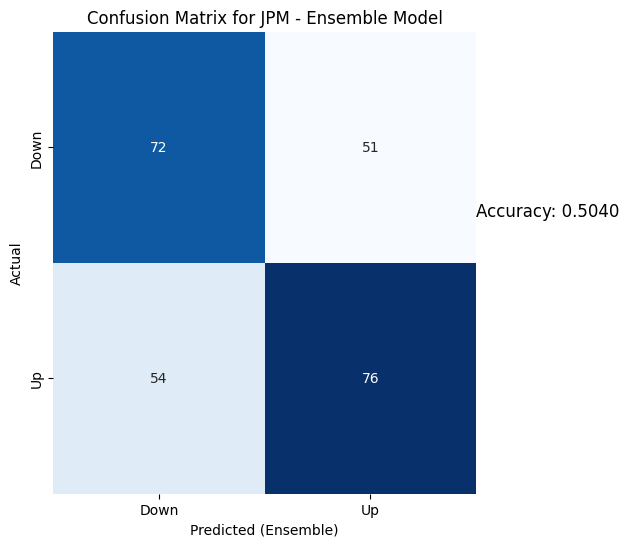

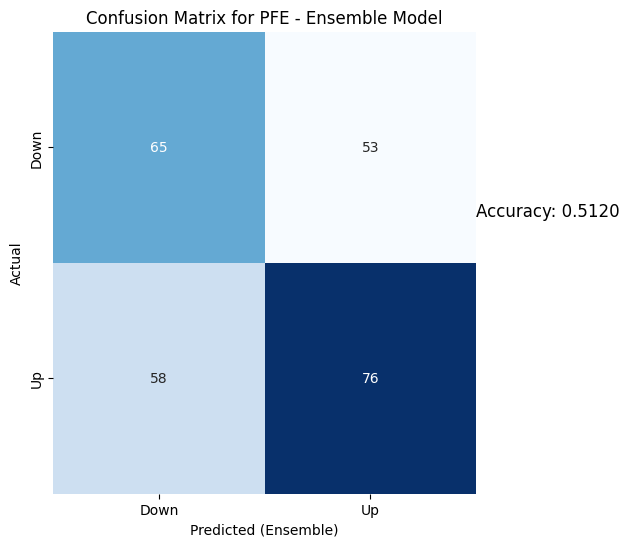

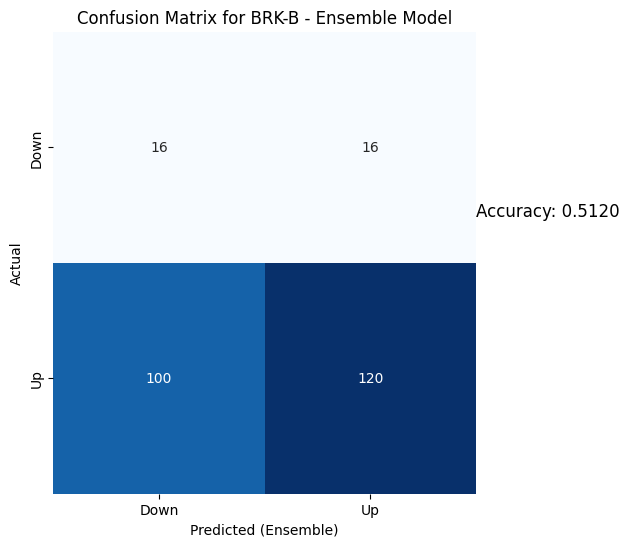

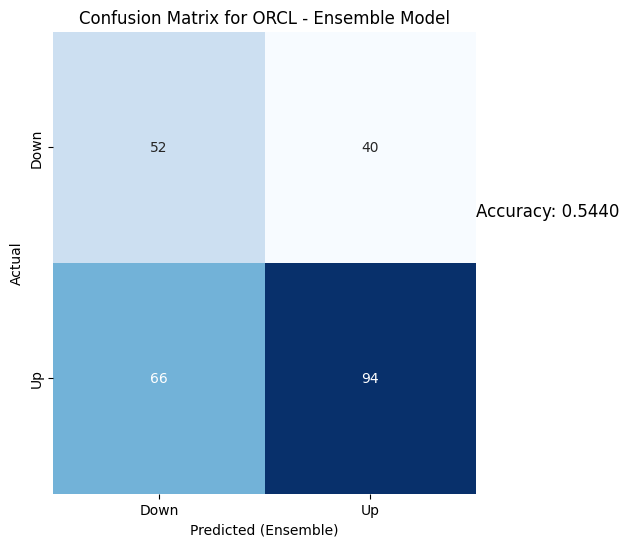

...

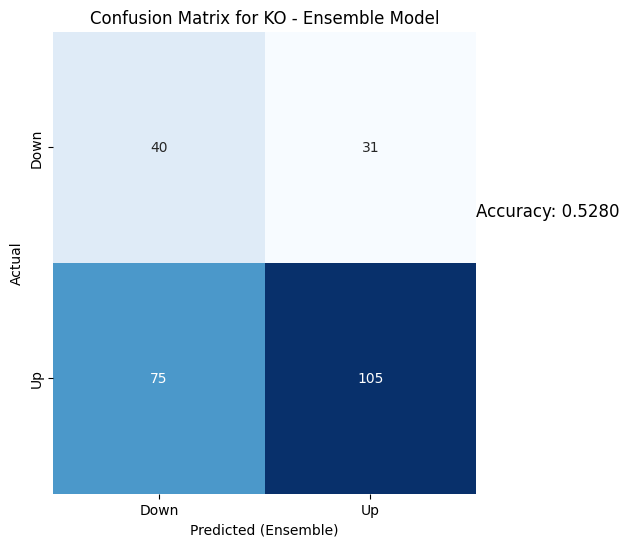

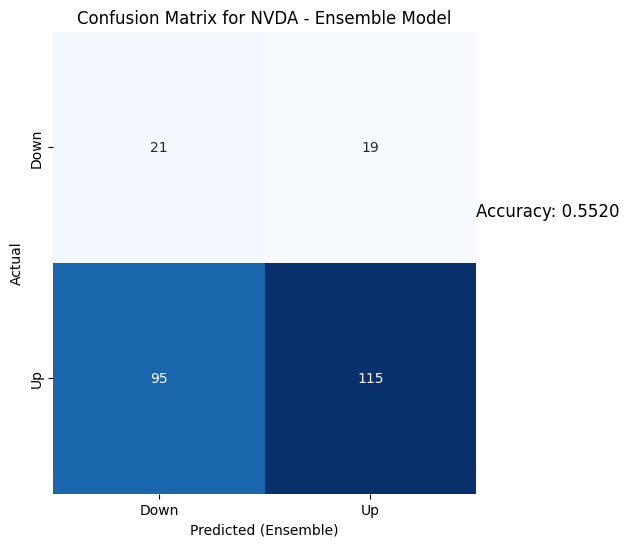

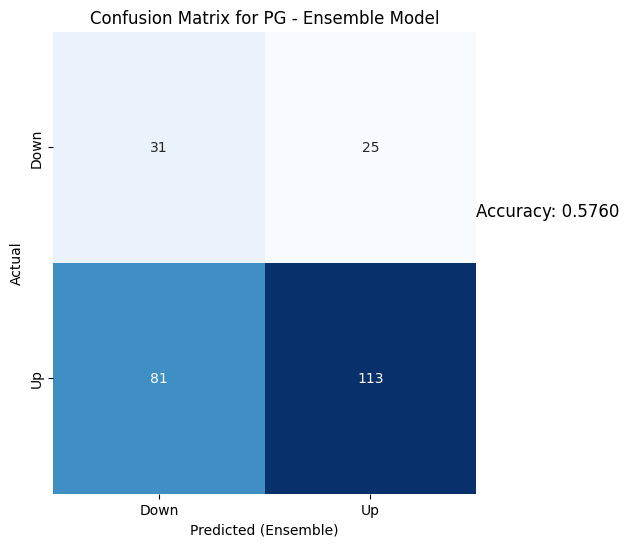

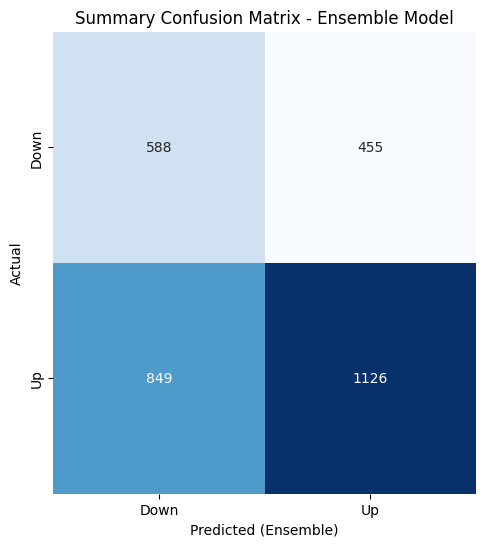

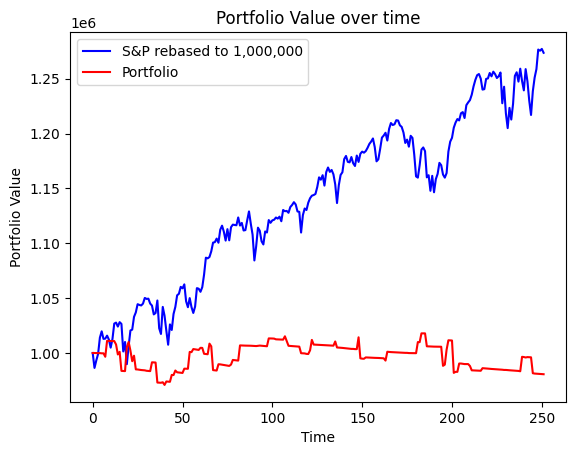

Portfolio return for our period =  98.06574759056261
S&P500 return during the period =  127.35637034437164


In [25]:
Portfolio_construct("2018-01-01")
#Testing for year 2021

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  3 of 3 completed
Accuracies for MSFT:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing 

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for MSFT:
Accuracies for MSFT:
Accuracies for MSFT:
SVR: 0.4585
LightGBM: 0.4664
GBR: 0.5099
RandomForest: 0.4743
XGBoost: 0.4822


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 27ms/step - loss: 0.6897 - accuracy: 0.5392 - val_loss: 0.7084 - val_accuracy: 0.4545
Epoch 2/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6869 - accuracy: 0.5481 - val_loss: 0.7041 - val_accuracy: 0.4545
Epoch 3/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6860 - accuracy: 0.5443 - val_loss: 0.7104 - val_accuracy: 0.4545
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6857 - accuracy: 0.5532 - val_loss: 0.7060 - val_accuracy: 0.4545
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6860 - accuracy: 0.5506 - val_loss: 0.6987 - val_accuracy: 0.4596
Epoch 6/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6855 - accuracy: 0.5532 - val_loss: 0.7032 - val_accuracy: 0.4545
Epoch 7/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6876 - accuracy: 0.5443 - val_loss: 0.7105 - val_accuracy: 0.4545
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for JPM:
Accuracies for JPM:
Accuracies for JPM:
SVR: 0.4625
LightGBM: 0.4704
GBR: 0.5020
RandomForest: 0.5099
XGBoost: 0.5296


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.7011 - accuracy: 0.4664 - val_loss: 0.6909 - val_accuracy: 0.5354
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6944 - accuracy: 0.4892 - val_loss: 0.6920 - val_accuracy: 0.5354
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6930 - accuracy: 0.5272 - val_loss: 0.6916 - val_accuracy: 0.5354
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6940 - accuracy: 0.5158 - val_loss: 0.6914 - val_accuracy: 0.5354
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6927 - accuracy: 0.5019 - val_loss: 0.6926 - val_accuracy: 0.5152
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6922 - accuracy: 0.5234 - val_loss: 0.6932 - val_accuracy: 0.5303
Epoch 7/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6933 - accuracy: 0.5057 - val_loss: 0.6917 - val_accuracy: 0.5354
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for PFE:
Accuracies for PFE:
Accuracies for PFE:


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


SVR: 0.4862
LightGBM: 0.4625
GBR: 0.4387
RandomForest: 0.4625
XGBoost: 0.4585
Epoch 1/10
25/25 [==============================] - 3s 34ms/step - loss: 0.6962 - accuracy: 0.4949 - val_loss: 0.6927 - val_accuracy: 0.5152
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6933 - accuracy: 0.5089 - val_loss: 0.6924 - val_accuracy: 0.5354
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6922 - accuracy: 0.5178 - val_loss: 0.6924 - val_accuracy: 0.5303
Epoch 4/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6928 - accuracy: 0.5228 - val_loss: 0.6933 - val_accuracy: 0.5253
Epoch 5/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6905 - accuracy: 0.5368 - val_loss: 0.6970 - val_accuracy: 0.4798
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6924 - accuracy: 0.5152 - val_loss: 0.6934 - val_accuracy: 0.5354
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')


Accuracies for BRK-B:
Accuracies for BRK-B:
Accuracies for BRK-B:
SVR: 0.4881
LightGBM: 0.5079
GBR: 0.5159
RandomForest: 0.5119
XGBoost: 0.5159


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 31ms/step - loss: 0.6970 - accuracy: 0.5203 - val_loss: 0.6983 - val_accuracy: 0.4772
Epoch 2/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6919 - accuracy: 0.5393 - val_loss: 0.6989 - val_accuracy: 0.4772
Epoch 3/10
25/25 [==============================] - 0s 17ms/step - loss: 0.6910 - accuracy: 0.5393 - val_loss: 0.6979 - val_accuracy: 0.4772
Epoch 4/10
25/25 [==============================] - 0s 15ms/step - loss: 0.6901 - accuracy: 0.5393 - val_loss: 0.6935 - val_accuracy: 0.4924
Epoch 5/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6901 - accuracy: 0.5431 - val_loss: 0.6944 - val_accuracy: 0.4518
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6902 - accuracy: 0.5330 - val_loss: 0.6944 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6892 - accuracy: 0.5482 - val_loss: 0.6949 - val_accuracy: 0.5025
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for ORCL:
Accuracies for ORCL:
Accuracies for ORCL:
SVR: 0.5357
LightGBM: 0.4484
GBR: 0.4881
RandomForest: 0.5040
XGBoost: 0.5238


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 30ms/step - loss: 0.6941 - accuracy: 0.5311 - val_loss: 0.7015 - val_accuracy: 0.4822
Epoch 2/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6929 - accuracy: 0.5184 - val_loss: 0.6945 - val_accuracy: 0.4822
Epoch 3/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6904 - accuracy: 0.5413 - val_loss: 0.6946 - val_accuracy: 0.4822
Epoch 4/10
25/25 [==============================] - 0s 16ms/step - loss: 0.6902 - accuracy: 0.5464 - val_loss: 0.7004 - val_accuracy: 0.4822
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6897 - accuracy: 0.5515 - val_loss: 0.6919 - val_accuracy: 0.4822
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6897 - accuracy: 0.5337 - val_loss: 0.6926 - val_accuracy: 0.4822
Epoch 7/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6891 - accuracy: 0.5451 - val_loss: 0.6952 - val_accuracy: 0.4822
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for AAPL:
Accuracies for AAPL:
Accuracies for AAPL:
SVR: 0.4683
LightGBM: 0.5317
GBR: 0.5516
RandomForest: 0.5000
XGBoost: 0.5476


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 31ms/step - loss: 0.6924 - accuracy: 0.5382 - val_loss: 0.6947 - val_accuracy: 0.4924
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6903 - accuracy: 0.5140 - val_loss: 0.6961 - val_accuracy: 0.4670
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6894 - accuracy: 0.5394 - val_loss: 0.6954 - val_accuracy: 0.5076
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6876 - accuracy: 0.5483 - val_loss: 0.6969 - val_accuracy: 0.4619
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6889 - accuracy: 0.5369 - val_loss: 0.6969 - val_accuracy: 0.4619
Epoch 6/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6882 - accuracy: 0.5394 - val_loss: 0.6969 - val_accuracy: 0.4670
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6867 - accuracy: 0.5674 - val_loss: 0.6975 - val_accuracy: 0.5025
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for IBM:
Accuracies for IBM:
Accuracies for IBM:
SVR: 0.5357
LightGBM: 0.5040
GBR: 0.4960
RandomForest: 0.4960
XGBoost: 0.4722


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 29ms/step - loss: 0.6965 - accuracy: 0.4892 - val_loss: 0.6962 - val_accuracy: 0.4569
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6942 - accuracy: 0.5261 - val_loss: 0.6897 - val_accuracy: 0.5533
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6931 - accuracy: 0.4930 - val_loss: 0.6914 - val_accuracy: 0.5279
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6920 - accuracy: 0.5197 - val_loss: 0.6900 - val_accuracy: 0.5431
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6917 - accuracy: 0.5299 - val_loss: 0.6930 - val_accuracy: 0.4924
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6925 - accuracy: 0.5287 - val_loss: 0.6923 - val_accuracy: 0.4873
Epoch 7/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6924 - accuracy: 0.5146 - val_loss: 0.6906 - val_accuracy: 0.5381
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for VZ:
Accuracies for VZ:
Accuracies for VZ:
SVR: 0.4980
LightGBM: 0.4861
GBR: 0.5458
RandomForest: 0.5299
XGBoost: 0.5418


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 28ms/step - loss: 0.7004 - accuracy: 0.4809 - val_loss: 0.7003 - val_accuracy: 0.4467
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6930 - accuracy: 0.4949 - val_loss: 0.6947 - val_accuracy: 0.4772
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6910 - accuracy: 0.5230 - val_loss: 0.6956 - val_accuracy: 0.4467
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6908 - accuracy: 0.5408 - val_loss: 0.6940 - val_accuracy: 0.5127
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6912 - accuracy: 0.5293 - val_loss: 0.6954 - val_accuracy: 0.4569
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6896 - accuracy: 0.5383 - val_loss: 0.6939 - val_accuracy: 0.5178
Epoch 7/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6903 - accuracy: 0.5179 - val_loss: 0.6986 - val_accuracy: 0.4416
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for BAC:
Accuracies for BAC:
Accuracies for BAC:
SVR: 0.4183
LightGBM: 0.5139
GBR: 0.4741
RandomForest: 0.4582
XGBoost: 0.4861


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 31ms/step - loss: 0.6939 - accuracy: 0.5115 - val_loss: 0.7240 - val_accuracy: 0.4286
Epoch 2/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6967 - accuracy: 0.4936 - val_loss: 0.6989 - val_accuracy: 0.4235
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6965 - accuracy: 0.5293 - val_loss: 0.6929 - val_accuracy: 0.5204
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6943 - accuracy: 0.4949 - val_loss: 0.6919 - val_accuracy: 0.5357
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6920 - accuracy: 0.5344 - val_loss: 0.7032 - val_accuracy: 0.4286
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6918 - accuracy: 0.5357 - val_loss: 0.6930 - val_accuracy: 0.5357
Epoch 7/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6919 - accuracy: 0.5204 - val_loss: 0.6986 - val_accuracy: 0.4184
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for KO:
Accuracies for KO:
Accuracies for KO:
SVR: 0.5498
LightGBM: 0.4542
GBR: 0.4900
RandomForest: 0.4622
XGBoost: 0.4462


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 29ms/step - loss: 0.6959 - accuracy: 0.5121 - val_loss: 0.6881 - val_accuracy: 0.5561
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6941 - accuracy: 0.5313 - val_loss: 0.6878 - val_accuracy: 0.5561
Epoch 3/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6941 - accuracy: 0.5249 - val_loss: 0.6904 - val_accuracy: 0.5561
Epoch 4/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6920 - accuracy: 0.5313 - val_loss: 0.6871 - val_accuracy: 0.5561
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6915 - accuracy: 0.5300 - val_loss: 0.6871 - val_accuracy: 0.5561
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6920 - accuracy: 0.5223 - val_loss: 0.6877 - val_accuracy: 0.5561
Epoch 7/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6914 - accuracy: 0.5313 - val_loss: 0.6882 - val_accuracy: 0.5561
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for NVDA:
Accuracies for NVDA:
Accuracies for NVDA:
SVR: 0.4900
LightGBM: 0.5060
GBR: 0.4940
RandomForest: 0.4542
XGBoost: 0.4861


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 2s 28ms/step - loss: 0.6929 - accuracy: 0.5371 - val_loss: 0.6976 - val_accuracy: 0.4847
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6902 - accuracy: 0.5499 - val_loss: 0.6956 - val_accuracy: 0.4796
Epoch 3/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6883 - accuracy: 0.5550 - val_loss: 0.6973 - val_accuracy: 0.4847
Epoch 4/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6886 - accuracy: 0.5448 - val_loss: 0.6955 - val_accuracy: 0.4796
Epoch 5/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6879 - accuracy: 0.5473 - val_loss: 0.6970 - val_accuracy: 0.4847
Epoch 6/10
25/25 [==============================] - 0s 14ms/step - loss: 0.6874 - accuracy: 0.5524 - val_loss: 0.6928 - val_accuracy: 0.5255
Epoch 7/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6872 - accuracy: 0.5575 - val_loss: 0.6919 - val_accuracy: 0.5255
Epoch 8/10
25

C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:121: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  stock_data[f'{symbol}_Price_Direction'] = np.where(stock_data[f'{symbol}_Close'].shift(-horizon) > stock_data[f'{symbol}_Close'], 1, 0)
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:124: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  y = stock_data[f'{symbol}_Price_Direction'].fillna(method='ffill')
C:\Users\tanis\AppData\Local\Temp\ipykernel_25616\475858943.py:128: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at 

Accuracies for PG:
Accuracies for PG:
Accuracies for PG:
SVR: 0.4960
LightGBM: 0.5400
GBR: 0.5080
RandomForest: 0.5320
XGBoost: 0.5280


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\xgboost\data.py:427: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(data):


Epoch 1/10
25/25 [==============================] - 3s 28ms/step - loss: 0.6928 - accuracy: 0.5467 - val_loss: 0.6967 - val_accuracy: 0.5102
Epoch 2/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6885 - accuracy: 0.5506 - val_loss: 0.6945 - val_accuracy: 0.5102
Epoch 3/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6893 - accuracy: 0.5519 - val_loss: 0.6962 - val_accuracy: 0.5102
Epoch 4/10
25/25 [==============================] - 0s 11ms/step - loss: 0.6885 - accuracy: 0.5506 - val_loss: 0.6936 - val_accuracy: 0.5102
Epoch 5/10
25/25 [==============================] - 0s 12ms/step - loss: 0.6880 - accuracy: 0.5455 - val_loss: 0.6950 - val_accuracy: 0.5102
Epoch 6/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6885 - accuracy: 0.5506 - val_loss: 0.6953 - val_accuracy: 0.5102
Epoch 7/10
25/25 [==============================] - 0s 13ms/step - loss: 0.6879 - accuracy: 0.5506 - val_loss: 0.6948 - val_accuracy: 0.5102
Epoch 8/10
25

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3164 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.650001525878906  and sold at  57.72999954223633
PG bought at  161.11000061035156  and sold at  157.4600067138672
57.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3165 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  57.72999954223633  and sold at  57.540000915527344
153.94000244140625
57.540000915527344
157.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3166 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO', 'PG']
JPM bought at  153.94000244140625  and sold at  156.08999633789062
KO bought at  57.540000915527344  and sold at  57.77000045776367
PG bought at  157.86000061035156  and sold at  157.75999450683594
57.77000045776367
157.75999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3167 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  57.77000045776367  and sold at  58.18000030517578
PG bought at  157.75999450683594  and sold at  159.32000732421875
58.18000030517578
159.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3168 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.18000030517578  and sold at  58.220001220703125
PG bought at  159.32000732421875  and sold at  160.10000610351562
58.220001220703125
160.10000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3169 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.220001220703125  and sold at  58.650001525878906
PG bought at  160.10000610351562  and sold at  161.97000122070312
58.650001525878906
161.97000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3170 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.650001525878906  and sold at  58.880001068115234
PG bought at  161.97000122070312  and sold at  162.83999633789062
58.880001068115234
162.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3171 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.880001068115234  and sold at  58.95000076293945
PG bought at  162.83999633789062  and sold at  164.19000244140625
58.95000076293945
164.19000244140625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3172 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  58.95000076293945  and sold at  58.779998779296875
PG bought at  164.19000244140625  and sold at  162.77000427246094
162.77000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3173 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  162.77000427246094  and sold at  163.5800018310547
60.290000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3174 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.290000915527344  and sold at  60.790000915527344
60.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3175 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.790000915527344  and sold at  60.470001220703125
313.8800048828125
165.52000427246094
60.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3176 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'JPM', 'KO']
MSFT bought at  313.8800048828125  and sold at  314.0400085449219
JPM bought at  165.52000427246094  and sold at  167.16000366210938
KO bought at  60.470001220703125  and sold at  60.33000183105469
167.16000366210938
60.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3177 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  167.16000366210938  and sold at  167.32000732421875
KO bought at  60.33000183105469  and sold at  60.43000030517578
318.92999267578125
160.52000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3178 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'PG']
BRK-B bought at  318.92999267578125  and sold at  319.79998779296875
PG bought at  160.52000427246094  and sold at  158.66000366210938
56.650001525878906
48.86000061035156
60.540000915527344
159.00999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3179 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC', 'KO', 'PG']
PFE bought at  56.650001525878906  and sold at  55.540000915527344
BAC bought at  48.86000061035156  and sold at  48.7599983215332
KO bought at  60.540000915527344  and sold at  60.900001525878906
PG bought at  159.00999450683594  and sold at  158.2899932861328
60.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3180 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.900001525878906  and sold at  61.38999938964844
61.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3181 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.38999938964844  and sold at  60.900001525878906
46.2599983215332
156.72999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3182 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BAC', 'PG']
BAC bought at  46.2599983215332  and sold at  46.439998626708984
PG bought at  156.72999572753906  and sold at  162.0
61.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3183 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.0  and sold at  60.75
60.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3184 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.75  and sold at  60.45000076293945
60.45000076293945
162.6199951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3185 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  60.45000076293945  and sold at  59.959999084472656
PG bought at  162.6199951171875  and sold at  161.3000030517578
59.959999084472656
161.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3186 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  59.959999084472656  and sold at  59.81999969482422
PG bought at  161.3000030517578  and sold at  159.5399932861328
159.5399932861328


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3187 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  159.5399932861328  and sold at  158.14999389648438
59.599998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3188 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.599998474121094  and sold at  59.650001525878906
59.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3189 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.650001525878906  and sold at  60.84000015258789
313.0199890136719
61.0099983215332
160.4499969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3190 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  313.0199890136719  and sold at  313.9599914550781
KO bought at  61.0099983215332  and sold at  60.560001373291016
PG bought at  160.4499969482422  and sold at  159.74000549316406
313.9599914550781
60.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3191 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  313.9599914550781  and sold at  319.6000061035156
KO bought at  60.560001373291016  and sold at  61.18000030517578
50.599998474121094
319.8500061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3192 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  50.599998474121094  and sold at  50.779998779296875
BRK-B bought at  319.8500061035156  and sold at  319.1400146484375
153.9199981689453
319.1400146484375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3193 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  153.9199981689453  and sold at  152.49000549316406
BRK-B bought at  319.1400146484375  and sold at  314.2799987792969
152.49000549316406
314.2799987792969


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3194 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'BRK-B']
JPM bought at  152.49000549316406  and sold at  154.72000122070312
BRK-B bought at  314.2799987792969  and sold at  316.20001220703125
49.68000030517578
60.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3195 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  49.68000030517578  and sold at  48.900001525878906
KO bought at  60.900001525878906  and sold at  62.119998931884766
151.42999267578125
48.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3196 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  151.42999267578125  and sold at  152.13999938964844
PFE bought at  48.900001525878906  and sold at  48.529998779296875
152.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3197 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  152.13999938964844  and sold at  151.8699951171875
309.989990234375
61.59000015258789
155.9600067138672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3198 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO', 'PG']
BRK-B bought at  309.989990234375  and sold at  308.2799987792969
KO bought at  61.59000015258789  and sold at  60.5099983215332
PG bought at  155.9600067138672  and sold at  151.75999450683594
45.959999084472656
60.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3199 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  45.959999084472656  and sold at  47.720001220703125
KO bought at  60.5099983215332  and sold at  62.849998474121094
158.24000549316406


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3200 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  158.24000549316406  and sold at  155.88999938964844
62.2400016784668
155.88999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3201 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['KO', 'PG']
KO bought at  62.2400016784668  and sold at  61.970001220703125
PG bought at  155.88999938964844  and sold at  153.30999755859375
45.75
42.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3202 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  45.75  and sold at  47.70000076293945
BAC bought at  42.470001220703125  and sold at  43.15999984741211
62.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3203 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  62.43000030517578  and sold at  62.470001220703125
166.22999572753906
62.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3204 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['AAPL', 'KO']
AAPL bought at  166.22999572753906  and sold at  163.1699981689453
KO bought at  62.470001220703125  and sold at  62.56999969482422
325.3399963378906
62.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3205 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  325.3399963378906  and sold at  322.7200012207031
KO bought at  62.56999969482422  and sold at  61.08000183105469
322.7200012207031
61.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3206 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  322.7200012207031  and sold at  318.5199890136719
KO bought at  61.08000183105469  and sold at  58.65999984741211
58.65999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3207 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  58.65999984741211  and sold at  58.959999084472656
57.91999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3208 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  57.91999816894531  and sold at  58.540000915527344
150.22999572753906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3209 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  150.22999572753906  and sold at  150.14999389648438
51.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3210 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  51.0  and sold at  50.970001220703125
63.099998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3211 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  63.099998474121094  and sold at  63.439998626708984
63.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3212 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  63.439998626708984  and sold at  63.83000183105469
296.9700012207031
39.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3213 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'BAC']
MSFT bought at  296.9700012207031  and sold at  285.260009765625
BAC bought at  39.66999816894531  and sold at  39.59000015258789
53.93000030517578
39.59000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3214 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  53.93000030517578  and sold at  53.11000061035156
BAC bought at  39.59000015258789  and sold at  39.16999816894531
64.55999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3215 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  64.55999755859375  and sold at  64.7300033569336
53.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3216 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  53.119998931884766  and sold at  51.84000015258789
51.84000015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3217 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  51.84000015258789  and sold at  50.18000030517578
65.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3218 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  65.06999969482422  and sold at  65.95999908447266
49.75


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3219 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  49.75  and sold at  49.11000061035156
66.20999908447266


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3220 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  66.20999908447266  and sold at  65.25
48.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3221 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  48.95000076293945  and sold at  49.029998779296875
49.7400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3222 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  49.7400016784668  and sold at  50.5099983215332
49.06999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3223 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  49.06999969482422  and sold at  48.34000015258789
74.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3224 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  74.0  and sold at  73.29000091552734
65.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3225 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  65.02999877929688  and sold at  64.51000213623047
48.45000076293945
64.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3226 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  48.45000076293945  and sold at  49.040000915527344
KO bought at  64.51000213623047  and sold at  64.73999786376953
121.86000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3227 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  121.86000061035156  and sold at  118.88999938964844
154.50999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3228 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  154.50999450683594  and sold at  146.5
118.13999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3229 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  118.13999938964844  and sold at  118.04000091552734
50.38999938964844
64.51000213623047


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3230 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  50.38999938964844  and sold at  49.91999816894531
KO bought at  64.51000213623047  and sold at  65.72000122070312
154.67999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3231 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  154.67999267578125  and sold at  145.0399932861328
51.2400016784668


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3232 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  51.2400016784668  and sold at  50.9900016784668
53.040000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3233 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  53.040000915527344  and sold at  52.369998931884766
139.42999267578125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3234 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  139.42999267578125  and sold at  140.14999389648438
132.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3235 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  132.0  and sold at  130.16000366210938
53.2599983215332
312.1499938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3236 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BRK-B']
PFE bought at  53.2599983215332  and sold at  53.959999084472656
BRK-B bought at  312.1499938964844  and sold at  313.6499938964844
51.54999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3237 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  51.54999923706055  and sold at  50.939998626708984
61.79999923706055


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3238 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.79999923706055  and sold at  61.40999984741211
49.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3239 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  49.970001220703125  and sold at  47.90999984741211
64.05000305175781
32.02000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3240 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['ORCL', 'BAC']
ORCL bought at  64.05000305175781  and sold at  70.72000122070312
BAC bought at  32.02000045776367  and sold at  31.459999084472656
133.83999633789062


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3241 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  133.83999633789062  and sold at  132.50999450683594
59.66999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3242 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.66999816894531  and sold at  59.06999969482422
47.47999954223633
133.32000732421875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3243 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'PG']
PFE bought at  47.47999954223633  and sold at  46.529998779296875
PG bought at  133.32000732421875  and sold at  132.36000061035156
31.920000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3244 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  31.920000076293945  and sold at  32.849998474121094
66.52999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3245 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  66.52999877929688  and sold at  67.62999725341797
142.3000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3246 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PG']
PG bought at  142.3000030517578  and sold at  144.35000610351562
62.90999984741211


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3247 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  62.90999984741211  and sold at  62.279998779296875
115.30000305175781


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3248 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  115.30000305175781  and sold at  112.61000061035156
53.41999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3249 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  53.41999816894531  and sold at  53.16999816894531
53.16999816894531


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3250 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  53.16999816894531  and sold at  52.88999938964844
50.5
151.52000427246094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3251 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['VZ', 'NVDA']
VZ bought at  50.5  and sold at  50.779998779296875
NVDA bought at  151.52000427246094  and sold at  150.82000732421875
61.650001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3252 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.650001525878906  and sold at  62.529998779296875
51.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3253 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  51.77000045776367  and sold at  52.29999923706055
115.23999786376953
51.95000076293945


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3254 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE']
JPM bought at  115.23999786376953  and sold at  114.80999755859375
PFE bought at  51.95000076293945  and sold at  50.720001220703125
114.80999755859375
64.05999755859375
148.05999755859375


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3255 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO', 'PG']
JPM bought at  114.80999755859375  and sold at  115.36000061035156
KO bought at  64.05999755859375  and sold at  64.16999816894531
PG bought at  148.05999755859375  and sold at  138.91000366210938
185.25999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3256 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['NVDA']
NVDA bought at  185.25999450683594  and sold at  188.92999267578125
134.00999450683594


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3257 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['IBM']
IBM bought at  134.00999450683594  and sold at  134.92999267578125
122.45999908447266
45.560001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3258 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'VZ']
JPM bought at  122.45999908447266  and sold at  123.62999725341797
VZ bought at  45.560001373291016  and sold at  45.79999923706055
65.02999877929688


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3259 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  65.02999877929688  and sold at  64.87999725341797
64.87999725341797


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3260 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  64.87999725341797  and sold at  65.22000122070312
48.900001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3261 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  48.900001525878906  and sold at  48.0099983215332
115.5199966430664
76.41000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3262 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'ORCL']
JPM bought at  115.5199966430664  and sold at  115.80000305175781
ORCL bought at  76.41000366210938  and sold at  76.16999816894531
45.849998474121094


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3263 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  45.849998474121094  and sold at  45.22999954223633
74.1500015258789


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3264 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  74.1500015258789  and sold at  75.30000305175781
46.630001068115234
62.0


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3265 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  46.630001068115234  and sold at  45.70000076293945
KO bought at  62.0  and sold at  61.150001525878906
61.150001525878906


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3266 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.150001525878906  and sold at  61.18000030517578
73.83000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3267 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['ORCL']
ORCL bought at  73.83000183105469  and sold at  74.48999786376953
62.119998931884766


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3268 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  62.119998931884766  and sold at  62.31999969482422
62.5


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3269 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  62.5  and sold at  60.470001220703125
60.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3270 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  60.470001220703125  and sold at  60.790000915527344
41.25


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3271 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['VZ']
VZ bought at  41.25  and sold at  41.2400016784668
156.89999389648438


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3272 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  156.89999389648438  and sold at  153.72000122070312
153.72000122070312


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3273 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['AAPL']
AAPL bought at  153.72000122070312  and sold at  152.74000549316406
59.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3274 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.2599983215332  and sold at  58.599998474121094
44.09000015258789
56.380001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3275 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  44.09000015258789  and sold at  44.43000030517578
KO bought at  56.380001068115234  and sold at  56.97999954223633
44.43000030517578


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3276 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  44.43000030517578  and sold at  44.15999984741211
106.16000366210938


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3277 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  106.16000366210938  and sold at  104.5
107.7300033569336


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3278 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  107.7300033569336  and sold at  112.7699966430664
108.13999938964844
55.029998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3279 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  108.13999938964844  and sold at  105.9800033569336
KO bought at  55.029998779296875  and sold at  54.5099983215332
54.5099983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3280 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.5099983215332  and sold at  54.38999938964844
229.25
54.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3281 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  229.25  and sold at  225.41000366210938
KO bought at  54.38999938964844  and sold at  54.47999954223633
41.91999816894531
29.770000457763672


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3282 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'BAC']
PFE bought at  41.91999816894531  and sold at  42.029998779296875
BAC bought at  29.770000457763672  and sold at  29.860000610351562
29.860000610351562


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3283 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BAC']
BAC bought at  29.860000610351562  and sold at  31.690000534057617
42.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3284 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  42.97999954223633  and sold at  42.86000061035156
54.97999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3285 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  54.97999954223633  and sold at  55.689998626708984
56.439998626708984


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3286 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  56.439998626708984  and sold at  55.959999084472656
55.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3287 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  55.959999084472656  and sold at  55.08000183105469
55.08000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3288 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  55.08000183105469  and sold at  55.959999084472656
55.959999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3289 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  55.959999084472656  and sold at  57.56999969482422
57.56999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3290 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  57.56999969482422  and sold at  58.95000076293945
59.38999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3291 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.38999938964844  and sold at  59.529998779296875
59.529998779296875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3292 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.529998779296875  and sold at  60.7599983215332
47.43000030517578
60.7599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3293 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  47.43000030517578  and sold at  46.54999923706055
KO bought at  60.7599983215332  and sold at  59.849998474121094
59.63999938964844


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3294 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  59.63999938964844  and sold at  58.810001373291016
58.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3295 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  58.810001373291016  and sold at  58.779998779296875
127.19999694824219


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3296 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  127.19999694824219  and sold at  130.67999267578125
47.220001220703125
59.2599983215332


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3297 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  47.220001220703125  and sold at  47.09000015258789
KO bought at  59.2599983215332  and sold at  59.4900016784668
131.3699951171875


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3298 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['JPM']
JPM bought at  131.3699951171875  and sold at  131.4499969482422
58.77000045776367


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3299 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  58.77000045776367  and sold at  60.880001068115234
61.31999969482422


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3300 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  61.31999969482422  and sold at  60.72999954223633
133.91000366210938
49.2400016784668
60.72999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3301 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'PFE', 'KO']
JPM bought at  133.91000366210938  and sold at  132.94000244140625
PFE bought at  49.2400016784668  and sold at  48.56999969482422
KO bought at  60.72999954223633  and sold at  60.630001068115234
132.94000244140625
60.630001068115234


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3302 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['JPM', 'KO']
JPM bought at  132.94000244140625  and sold at  133.1199951171875
KO bought at  60.630001068115234  and sold at  60.52000045776367
308.760009765625


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3303 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['BRK-B']
BRK-B bought at  308.760009765625  and sold at  307.44000244140625
48.33000183105469


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3304 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  48.33000183105469  and sold at  48.22999954223633
48.22999954223633


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3305 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  48.22999954223633  and sold at  48.18000030517578
49.209999084472656


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3306 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['PFE']
PFE bought at  49.209999084472656  and sold at  49.56999969482422
255.13999938964844
63.61000061035156


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3307 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['MSFT', 'KO']
MSFT bought at  255.13999938964844  and sold at  254.69000244140625
KO bought at  63.61000061035156  and sold at  63.790000915527344
63.790000915527344


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3308 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  63.790000915527344  and sold at  64.3499984741211
310.57000732421875
63.470001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3309 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['BRK-B', 'KO']
BRK-B bought at  310.57000732421875  and sold at  307.7799987792969
KO bought at  63.470001220703125  and sold at  63.439998626708984
51.779998779296875
63.810001373291016


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3310 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
['PFE', 'KO']
PFE bought at  51.779998779296875  and sold at  51.720001220703125
KO bought at  63.810001373291016  and sold at  63.13999938964844
63.970001220703125


c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3311 times so far.

  warnings.warn(msg, UserWarning)


[*********************100%%**********************]  1 of 1 completed
['KO']
KO bought at  63.970001220703125  and sold at  63.9900016784668
[1000000.0, 1005789.9613640617, 1005453.0831743446, 986146.229807468, 985219.8308489824, 981324.753080752, 980103.6258643548, 989030.6730065476, 991704.559305436, 978040.2710471926, 978440.3098816724, 961112.5114683475, 951132.7440781434, 940605.5415980311, 922140.8515789744, 926056.9400601626, 914750.7348769932, 912455.812446682, 907950.1389437806, 930499.4529183012, 947258.7412758154, 953659.2983745483, 962923.2237064581, 940289.7383742167, 944711.1762664529, 941679.336811945, 949427.3424166008, 963323.2625409379, 946016.5390935156, 927362.3028872253, 924330.4634327174, 939237.0181262055, 940289.7383742167, 920203.818051338, 914245.4497188901, 904434.0892970721, 888390.6429978522, 901760.138745239, 921656.5771338291, 919298.4940587551, 905297.3276107947, 921951.3696446858, 917361.4605311187, 909908.2474373195, 883084.8918259909, 876389.6064693463

c:\Users\tanis\anaconda3\envs\MLforfinance\Lib\site-packages\cvxpy\expressions\expression.py:621: UserWarning: 
This use of ``*`` has resulted in matrix multiplication.
Using ``*`` for matrix multiplication has been deprecated since CVXPY 1.1.
    Use ``*`` for matrix-scalar and vector-scalar multiplication.
    Use ``@`` for matrix-matrix and matrix-vector multiplication.
    Use ``multiply`` for elementwise multiplication.
This code path has been hit 3312 times so far.

  warnings.warn(msg, UserWarning)


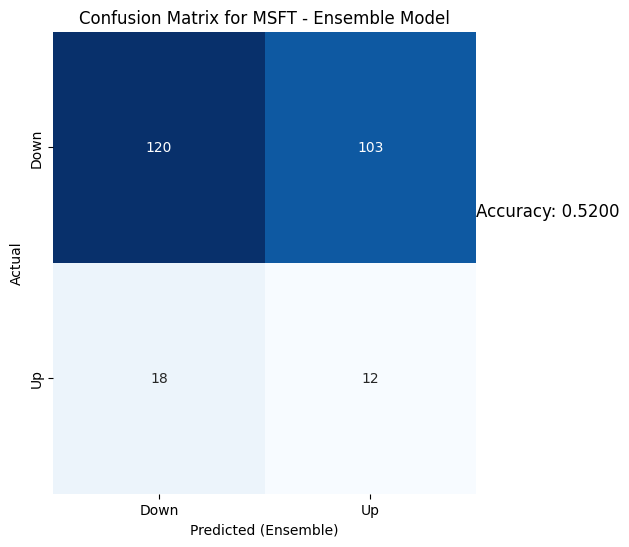

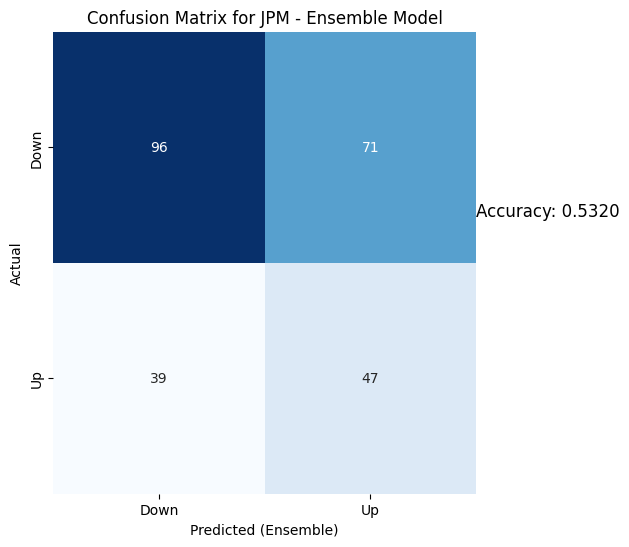

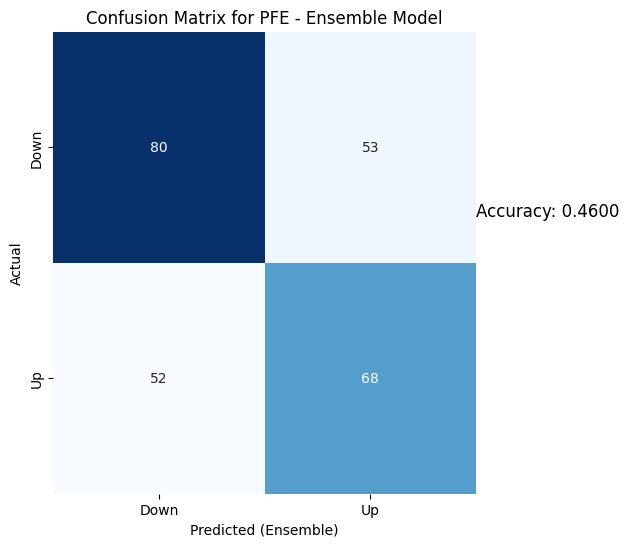

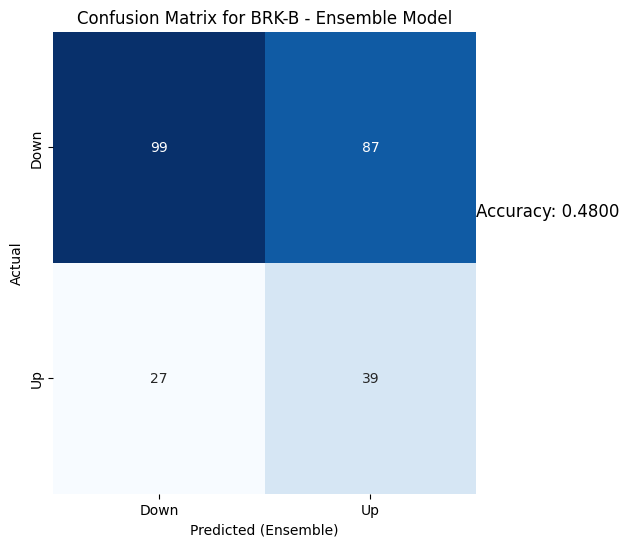

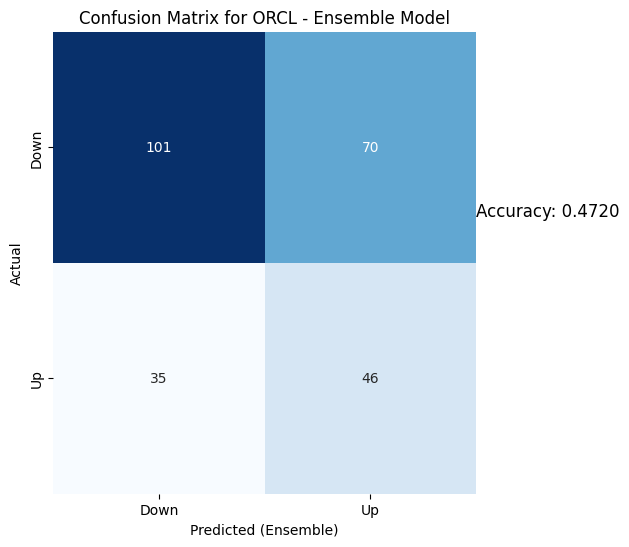

...

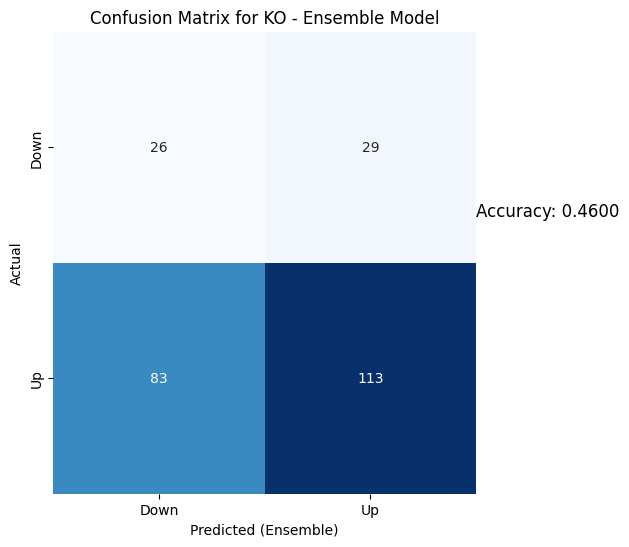

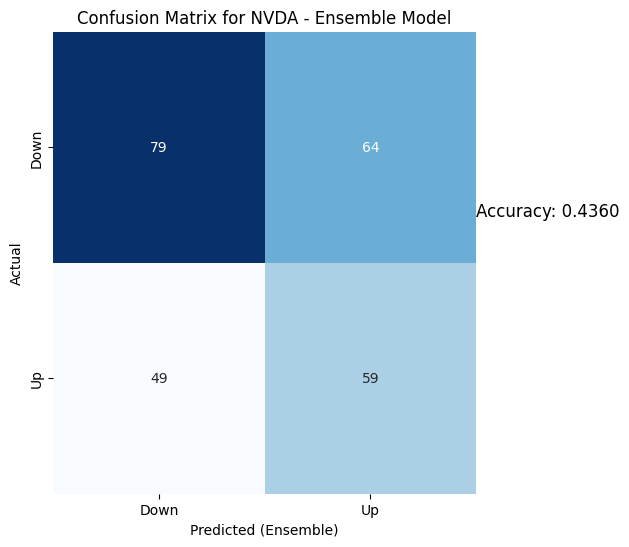

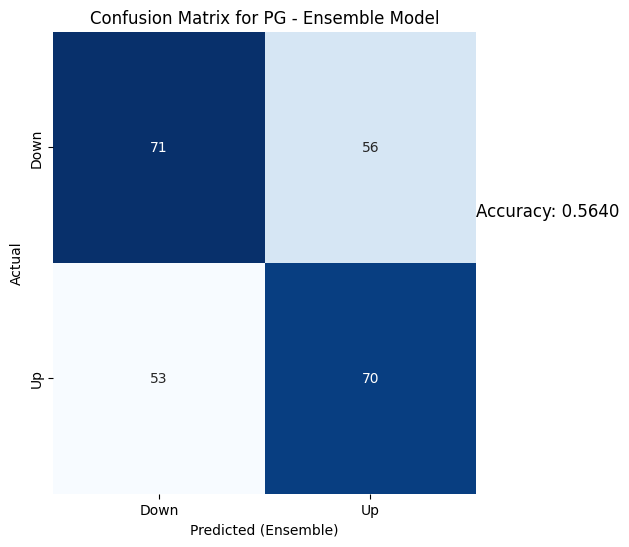

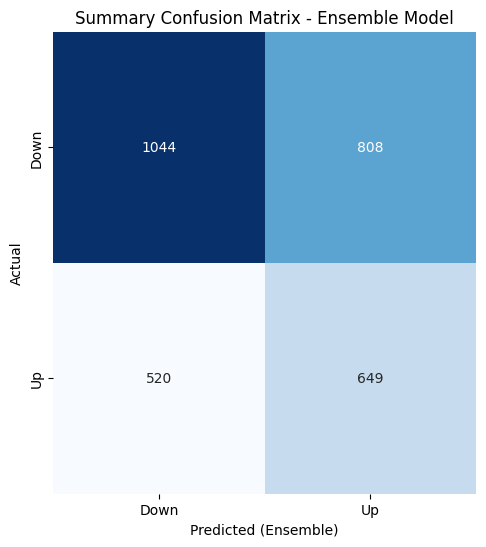

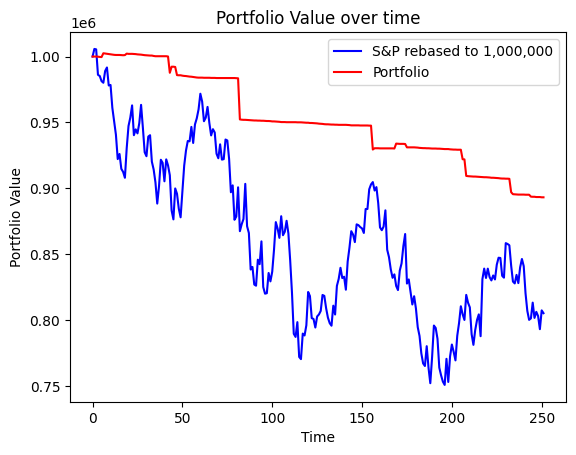

Portfolio return for our period =  89.31455608183279
S&P500 return during the period =  80.51835934731602


In [26]:
Portfolio_construct("2019-01-01")
#Testing for year 2022